**Name:** Dimitri Vinci

**ID:** 223990

**PROJECT BRIEF DESCRIPTION**

In this document the project for Deep Learning for year 2021/2022 is exposed. 

The author choose to implement **6 different types** of domain adaptation strategies (one for each macrocategory of unsupervised domain adaptation strategy, selected by their performances on Office-31 on previous studies).
The domain adaptation strategies are 
- Beyond Sharing Weights fod Deep Domain Adapatation, Rozantev, A., Salzman, M., Fua, P., 2016 (architecture based approach)[24]
- Cycle-consistent Conditional Adversarial Transfer Networks, Li, J., Chen, E., Ding, Z., Zhu, L., Lu, K., Huang, Z., 2019 (adversarial method) [36]

  **note that present work originally augment dimension of classification network and reconstructed adversarial examples**
- Mind the Class Weight Bias: Weighted Maximum Mean Discrepancy for Unsupervised Doamin Adaptation, Yan, H., Ding, Y., Li, P., Wang, Q., Xu, Y., Zuo, W. (discrepancy based approach) [71]
- Supervised Representation Learning: Transfer Learning with Deep Autoencoders, Zhuang, F., Cheng, X., Luo, P., Pan, S.J., He, Q., 2015 (representation based approach) [105]

  **note that present version originally employ convolutional autoencoder and try learn invariant backbone feature representations**
- Cluster Alignment with a Teacher for Unsupervised Domain Adaptation, Deng, Z., Luo, Y., Zhu, J., 2019 (teacher student approach) [27]
- Reliable Weighted Optimal Transport for Unsupervised Domain Adaptation, Xu, R., Liu, P., Wang, L., CHen, C., Wang, J., 2020 (optimal transport approach) [97]


Note that **for all previous mentioned models a more powerful backbone (in respect of original paper work) with batchnorm and dropout is employed**. this baseline/backbone model is defined applying
- **Hinton methodology** for selecting neural network dimension. comparison between 26 possible imagenet pretrained torchvision models
- **BOHB optimization** for tuning hyperparameters using SMAC3 
- **dynamic batch tuning** implementation
- **autoaugmentation** using a **metalearning gradient based differentiable strategy** implentation over **20 type mixup-based methods** of data augmentation

Domain adaptation is **optimized in its architectural paparmeter with two novel (at least for author's knowledge) way**
- **BOHB optimization** applying **reverse crossvalidation**
 (for author knowledge this was not exploited yet to optimize data augmentations strategies)
- **employing data augmentation strategy for domain adaptation allowing mixing up source and target samples** (for author knowledge this has not exploited extensively in literature, only reference in ConfMix: Unsupervised Domain Adaptation for Object Detection via Confidence-based Mixing, Mattolin, G., Zanella, L., Ricci, E., Wang, Y., 2022 [33])

Results are visualized with **TSNE** and compared with accuracies **and other relevant classification-matrix-based   metrics** (code also offer possibility of **gradient visualization** and **convolutional features visualization**).

**USAGE BRIEF DESCRIPTION**

Here brief usage description of notebook is provided. Note that
- Full index of work is provided in section 1.1.
- For further informations about convention, code compatibility and speed up optimizations employed see section 1.2.
- References are provided with numbers between square brackets that point to section 2 (sorted in alfabetical order)

Work is supposed to be executed in a directory (Deep in author case) in which a Dataset directory is defined (containing data). to access Deep the following path is considered
"/content/gdrive/MyDrive/Unitn/Deep/" (PATH global variable is defined in section 4.1). Some information (e.g. computations like centroid calculations and intermediate  training results) are supposed to be stored in directory "./Deep/Material/" otherwise they will be recomputed. This could lead to extensive and long computation. For simplicity this data are also provided in this drive open access repository (https://drive.google.com/drive/folders/1wBiyew_GeRKLE8heQLNoyJGzRFByjjUU?usp=drive_link) and could be downloaded and put into the previous mentioned directory (see  section 1.2 last note)

The present work is supposed to be executed in sections order
- section 3

  install library and import needed library. As a consequence **all section is supposed to  be executed**  (note that some libraries have some compatibility issues **reported in section 1.2**, so **some libraries should be uncommented if want to replicate BOHB SMAC3 optimization results**)
- section 4

  define some global used variables and do some preliminary stuff (like connecting to drive). In section 4 a global variabel EXECUTE_ALL is setted to False, set to True if want all computation to be executed. Note that this will lead to A LOT of computations. For normal check of work **full execute all section.**
- section 5

  define raw image data handling and function. If EXECUTE_ALL is left as False simply **full execute all section** else subsection 5.4.2 contain some data exploration (that constitute basis for some assumption about model) but which is not necessary and will lead to computation not necessary for rest of code. note that if data centroid_real.pickle and centroid_product.pickle are note in folder ./Deep/Material/ section 5.4.3 will extract centroid information for domain adaptation
- section 6

  define data augmentation (implemented in albumentation library, not standard torchvision), dataset, data loader and function to get data. If EXECUTE_ALL is left as False simply **full execute all section** else subsection 6.1.2 will show how happen when a specific data augmentation class is applied to data

- section 7

  contain all model classes constructed for baseline and data augmentation module as long as function to get optimizer, model and cost function. simply **full execute all section**

- section 8

  contain all analysis tool (TSNE, gradient and convolution visualization, metric employed). simply **full execute all section**

- section 9

  contain train and test function as long as wrapper used to handle training and printing . simply **full execute all section**

- section 10

  contain all code that is required to handle SMAC optimization, FANOVA visualization, differentiable data augmentation search, dynamic batch tuning. simply **full execute all section**. 
- section 11

  baseline function extraction. Note that if some computation information lack in ".\Deep\Material\" this will do A LOT of computation to show reproducibility of work result in finding best baseline architecture. If also EXECUTE_ALL is defined eventual overfitting is searched with increasing architecture dimension in section 11.1, comparison and differentiable augmentation search in section 11.2, hyperparameters optimization in 11.3 and result printing (as long with tsne in 11.4) doing A LOT of computation. If want to execute set ALL_CODE to True.
- section 12

  domain adaptation results (as long with its parameter optimization code and t.sne results). Note that if some computation information lack in ".\Deep\Material\" this will do A LOT of computation to show reproducibility of work result in finding best baseline architecture. If want to execute set ALL_CODE to true 
- section 13

  show summary of results. There is no executable code in here.

Note that **all choice**s are **motivated in respective section** and **detailed results are always provided** as picture or text **in respective section** (in particular DA performances in details are provided in different methods respective sections in chapter 12)


**EX NOVO CODE IMPLEMENTATION**

To be clear, here is exposed which part of code (with section reference) is created by scratch or from existing basis (note that in this last case code were not simply cut and paste but for correctness is underlined if author started from preexisting work).

code implemented ex novo
- section 5.3.1 
  - weighted MMD
  - A-distance
- section 6.3.1
  - enhanced composition operator

  an enhanced composition operator capables to act with symultaneous trasformations of labels and images is defined 
- section 6.3.2

  a full array of mixed up based symultaneos image and label trasformations is defined ex novo. in particular
  - vertical concat
  - horizzontal concat
  - mixed concat
  - random 2x2
  - VH-mixup
  - VH_BC+
  - Random Column Interval
  - Random Row Interval
  - Random Rows
  - Random Columns
  - Random Pixels
  - Noisy Mixup
  - Sample Pairing
  - CutOut
  - Copypairing
  - Cutmix
  - Mixup
  - HideAndSeek
  - PatchShuffle
  - SoundMixup
- section 6.3.3
  - enhanced dataset class
    
    an ex novo dataset as superclass of image folder have to be defined because of necessity of handle symultaneous lable and iimage transformations
- section 7.1.1

  
- section 7.1.3

  implement several adaptation model ex novo
  - roszantsev model
  - xu model
  - deng model
  - cheng model
- section 8.1.2
  
  in this section a class (called classification matrix or gain classification matrix which in turn measure gain of domain adaptation) handles calculation of several common employed multi class classification metrics (accuracy, precision, recall, f1 positive, f1 negative, unified performance measure, markedness and bookmaker informedness).

  for domain adaptation coverage is also included

- section 9.1.3

  reverse validation is implemented ex novo as only method to validate model performances in domain adaptation setting [35] 
- section 9.4.1

  lr range test is implemented ex novo to obtain range of suitable learning rates
- section 10.1
  
  all code in this section is implemented ex novo to implement differentiable augmentation search [40]
- section 10.2 

  automatic batch size tuning by [18]

code implemented from existing basis
- section 5.3.1
  - MMD
- section 8.1.1
  - visualize gradients
  - conv layer visualization
  - T-sne
- section 9.1
  patience implementation

all code non mentioned here is ex novo (but is mainly wrapper code or structural code mainly use to execute all)

**A RELEVANT ASSUMPTION**

In guiding approach, it is supposed **no labels of target domain is provided**. so it is supposed is **not possible to optimize domain adaptation or architectures with target label.** so
- in domain adaptation phase, learning and architecture hyperparameters of baseline **architecture optimized using source domain accuracy only** are employed
- optimization of domain adaptation hyperparameters is possible **only with reverse validation** given no other measure allow to employ predicted labels to measure nuance between source and target domain

###**1. INDEX AND INFORMATIONS**

####1.1 INDEX

Detailed index of the section is provided



1.   Index and informations
    1. Index
    2. Notes on document and conventions
2.   References
3.   Libraries
    1. Libraries installed
    2. Imported libraries
4.   Other things
    1. User defined global variables
    2. Utility code
5.   Handling data
    1. User defined global variables
    2. Extracted global variables
    3. Class and function defined
    4. Executable code
        1. Dataset handling
        2. Data exploration
        3. Centroid and Data Statistics extraction
6.  Pytorch data handling
    1. Utilities
    2. Global variables
    3. Class defined
        1. Enhanced composition
        2. Data augmentation classes
        3. Dataset classes
    4. Function defined
7. Models
   1. classes
      1. Custom Loss Classes
         1. xu loss
         2. deng loss
         3. yan loss
         4. roszsantev loss
         5. cheng loss
         6. li loss
      2. NonDa Model Classes
         1. convnext
         2. densenet
         3. inceptionV3
         4. maxvit
         5. resnet
         6. vit_b
         7. wideresnet
         8. resnext
         9. efficientnet_V2
         10. RegNet_Y
      3. Da Model Classes
         1. Roszantsev model
         2. Xu model
         3. Deng model
         4. Cheng model
         5. Li model
   2. functions
      1. obtain model functions
      2. cost function definition
      3. optimizer definition
8. Analysis tools
   1. functions defined
      1. visualization function
        1. Visualize gradients
        2. Conv layer visualization
        3. T-sne
      2. performance metrics
9. Operative Code
  1. Utility Functions
  2. Test and Train Function
     1. Test
     2. Train
     3. Reverse validation
  3. wrapper called for operative code
     1. wrapper non-da
     2. wrapper da
  4. Other functions
     1. lr range test
     2. other things for architecture comparison
10. Optimization code
    1. augmentation optimization
        1. best augmentation searhc
        2. differentiable augmentation
    2. batch optimization
    3. SMAC
    4. FANOVA
11. Before DA
    1. brief analysis over possible backbones (hinton methodology)
    2. selecting a baseline architecture
       1. Lr and Lr range test
       2. architecture comparisons
    3. authomatic optimization of augmentation and batch size
       1. augmentation couplets formation
       2. differentiable augmentation search
    4. Optimization baseline architecture
       1. Hyperparam order and dependencies
       2. Optimization
          1. lr + wd + scheduler + optimizer
          2. label smoothing
    5. Final baseline architecture
       1. Final Baseline architecture performances
       2. create some information for DA
       3. visualization over winning architecture
          1. TSNE over winning architecture
          2. grdient visualization
          3. visualize feature maps
12. Domain adaptation
    1. [24] Beyond Sharing Weights fod Deep Domain Adapatation, Rozantev, A., Salzman, M., Fua, P., 2016
    2. [36]Cycle-consistent Conditional Adversarial Transfer Networks, Li, J., Chen, E., Ding, Z., Zhu, L., Lu, K., Huang, Z., 2019
    3. [71] Mind the Class Weight Bias: Weighted Maximum Mean Discrepancy for Unsupervised Doamin Adaptation, Yan, H., Ding, Y., Li, P., Wang, Q., Xu, Y., Zuo, W.
    4. [105] Supervised Representation Learning: Transfer Learning with Deep Autoencoders, Zhuang, F., Cheng, X., Luo, P., Pan, S.J., He, Q., 2015
    5. [27] Cluster Alignment with a Teacher for Unsupervised Domain Adaptation, Deng, Z., Luo, Y., Zhu, J., 2019
    6. [97] Reliable Weighted Optimal Transport for Unsupervised Domain Adaptation, Xu, R., Liu, P., Wang, L., CHen, C., Wang, J., 2020
13. Sum up results










####1.2 NOTES ON DOCUMENT STRUCTURE AND CONVENTIONS

**NOTE 1 - DOCUMENT SUBSECTIONS:**

extracted global variables subsection (meaning variables computed by data or previous computation) is tipically provided as subsection of different chapters. 
extracted global variables subsection is redundant but helps to understand which variables could be reused thereafter so 

**NOTE 2 - STYLE USED:**

this document use style standard PEP 8 [87] with following criteria
- two spaces between code and inline comments
- a single spaces between # and start of comment
- around 79 characters maximum for each line
- 4 spaces as construct body identifier
- aggregation of high priority operators
- specification of return for each function
- doublequotes instead of single quotes
- naming conventions:
  - CapWords for classes
  - lowercase_with_underscore for functions, methods, variables
  - _leading_underscore for non public method and instance variable
  - CAPITALWORDS for constants and global variables


it also employ docstring convention PEP 257 [86]

**NOTE 3 - OPTIMIZATION :**

To execute all code some GPU optimization have to be taken into account which  follows this conference [93]. It sugests
- always pin memory
- use a number of worker between 2 and 4
- use params.grad=None because it does not execute  memset for every parameter  [82]

Use mixed precision and AMP. Mixed precision leverages Tensor Cores and offers up to 3x overall speedup (e in alcuni casi sembra che abbia raggiunto fino a 5x di velocità in piu).[9][48][55][16][17]

Enable channels_last memory format for computer vision models. This format is meant to be used in conjunction with AMP to further accelerate convolutional neural networks with Tensor Cores.[82][108]

Set the sizes of all different architecture designs as the multiples of 8 (for FP16 of mixed precision)[82]

gradient accumulation to fasten some specific training steps (not used for final model training given it adds another hyperparams) [10][48][113]

**NOTE 4 - LIBRARY COMPATIBILITY :**

fANOVA seem to have some problem with updated python versions syntax changing and pytorch workers seem conflicting with SMAC3 workers. In case want to reproduce SMAC3 results uncomment swig and smac installation and SMAC libraries in section 3.1 and 3.2

**NOTE 6 - LIBRARY INSTALLATION :**

due to runtime if want to reproduce SMAC3 results is necessary to run 3.1 section (to install libraries) and restart runtime (without deleting data obviously)

**NOTE 7 - INTERMEDIATE COMPUTATION LIST EXPLAINED**

as said before mentioned intermediate computations files are  on open drive folder ( https://drive.google.com/drive/folders/1wBiyew_GeRKLE8heQLNoyJGzRFByjjUU?usp=drive_link )

Files are
- centroid_real.pickle and centroid_product.pickle 

  contain centroid information. if not avaiable section 5.4.3 is executed to retrieve this information
- ARCHITECTURE_COMPARISON_PRODUCT_RES.pickle and ARCHITECTURE_COMPARISON_REAL_RES.pickle

  this two files contains result of brief grid search to find best backbone architectures. If lacking section 11.2.2 execute code to retrieve this infomration
- TRANSFORMATION_DIVERSITY_REAL.pickle, TRANSFORMATION_DIVERSITY_PRODUCT.pickle, TRANSFORMATION_AFFINITY_REAL.pickle and TRANSFORMATION_AFFINITY_PRODUCT.pickle

  dictionary to store transformation affinity and diveristy employed to execute differentiable augmentation search. if lakcing section 11.3.2 is executed
- AUG_PROB_DICT_PRODUCT.pickle and AUG_PROB_DICT_REAL.pickle

  contains result of differentiable augmentation search. If lacking section 11.4.2 execute code to retrieve this infomration
- REL_DICT_REAL.pickle and REL_DICT_PRODUCT.pickle
  
  contains relational dict extract with grid search to do fANOVA analysis. If absent section 11.4.1 is executed to recover them
- X_REAL.csv and X_PRODUCT.csv 

  contains results of fANOVA analysis if not presents section 11.4.1 is executed (for which REL_DICT_REAL.pickle and REL_DICT_PRODUCT.pickle are needed else also this files are computed from scratch)
- MODEL_AFTER_OPT_BEST_REAL.pk and MODEL_AFTER_OPT_BEST_PRODUCT.pk

  contains best baseline model. If lacking this will lead to computation in section 12 and 11.5
- NO_RESULTS_PROD.pickle and NO_RESULTS_REAL.pickle

  cointains source only information to make domain adaptation procedure faster. If lacking 11.5.2 will try to recover this information (for which MODEL_AFTER_OPT_REAL.pk or MODEL_AFTER_OPT_PRODUCT.pk is needed, if also this is not provided simply execute section 12. will compute this value for each models)
- TO_RESULTS_PROD.pickle and TO_RESULTS_REAL.pickle

  cointains target only information to make domain adaptation procedure faster. If lacking 11.5.2 will try to recover this information (for which MODEL_AFTER_OPT_REAL.pk or MODEL_AFTER_OPT_PRODUCT.pk is needed, if also this is not provided simply execute section 12. will compute this value for each models)

- LI_BEST_REAL.pickle, LI_BEST_PRODUCT.pickle, YAN_BEST_REAL.pickle, YAN_BEST_PRODUCT.pickle, ROZ_BEST_REAL.pickle, ROZ_BEST_PRODUCT.pickle, DENG_BEST_PRODUCT.pickle, DENG_BEST_REAL.pickle, CHENG_BEST_REAL.pickle, CHENG_BEST_PRODUCT.pickle, XU_BEST_REAL.pickle, XU_BEST_PRODUCT.pickle

  contains network parameters for best network founded in domain adaptation

###**2. REFERENCES**

here all references that are employed to justify or give ground to statements (or brief snippets of code employed) are provided. During work expositon references to this section are annotated with [number]

1. 7-tips-for-squeezing-maximum-performance-from-pytorch , avaiable at: https://towardsdatascience.com/7-tips-for-squeezing-maximum-performance-from-pytorch-ca4a40951259
2. A Better Autoencoder for Image: Convolutional Autoencoder, Zhang, Y.
3. A Comparison of MCC and CEN Error Measures in Multi-Class Prediction, Jurman, G., 2012
4. A disciplined approach to neural network hyper-parameters: part 1 – learning rate, batch size, momentum and weight decay, Smith, L., 2018
5. A survey on Image Data Augmentation for Deep Learning, Shorten, C., Khoshgoftaar, M., 2019 
6. A Survey on Multi-output Learning, Donna Xu, Yaxin Shi, Ivor W. Tsang, Yew-Soon Ong, Chen Gong, Xiaobo Shen, 2019
7. A theory of learning from different domains, Ben-David, S.,  Blitzer, J.,  Crammer,  K., Kulesza, A.,  Pereira, F., Vaughan, J. , 200
8. a-brief-overview-of-loss-functions-in-pytorch , avaiable at: https://medium.com/udacity-pytorch-challengers/a-brief-overview-of-loss-functions-in-pytorch-c0ddb78068f7 
9. accelerating-training-on-nvidia-gpus-with-pytorch-automatic-mixed-precision , avaiable at https://pytorch.org/blog/accelerating-training-on-nvidia-gpus-with-pytorch-automatic-mixed-precision/
10. accumulating gradients, avaiable at: https://forums.fast.ai/t/accumulating-gradients/33219/28
11. Adaptiope: A Modern Benchmark for Unsupervised Domain Adaptation , Ringwald, T., Stiefehagen, R., 2021
12. albumentation home page, avaiable at: https://albumentations.ai/ 
13. Albumentations: fast and flexible image augmentations, Buslaev, A., Parinov, A., Khvedchenya, E., Iglovikov, V., 
14. Kalinin, A.A., 2018
15. all-pytorch-loss-function , avaiable at https://analyticsindiamag.com/all-pytorch-loss-function/
16. AMP examples, avaible at: https://pytorch.org/docs/stable/notes/amp_examples.html
17. AMP, avaiable at: https://pytorch.org/docs/stable/amp.html
18. An Empirical Model of Large-Batch Training, McCandlish, S., Kaplan, J., Amodei, D., 2018
19. Analysis on the Selection of the Appropriate Batch Size in CNN Neural NEtowrk, Lin, R., 2022
20. Associative Domain Adaptation, Haeusser, P., Frerix, T., Mordvintsev, A., Cremers, D.
21. AutoAugment: Learning Augmentation Strategies from Data, Cubuk, E., Zoph, B, Mané, D., Vasudevan, V., Le, Q.V.
22. Between-class Learning for Image Classification, Tokuzume, Y., Ushiku, Y., Harada, T., 2018
23. Beyond Manual Tuning of Hyperparameters, Hutter, F., Lucke, J., Schmidt-Thieme, L., 2015
24. Beyond Sharing Weights fod Deep Domain Adapatation, Rozantev, A., Salzman, M., Fua, P., 2016 
25. Can not use both bias and batch normalization in convolution layers, avaiable at: https://stackoverflow.com/questions/46256747/can-not-use-both-bias-and-batch-normalization-in-convolution-layers
26. can-transforms-compose-handle-a-batch-of-images , avaiable at: https://discuss.pytorch.org/t/can-transforms-compose-handle-a-batch-of-images/4850
27. Cluster Alignment with a Teacher for Unsupervised Domain Adaptation, Deng, Z., Luo, Y., Zhu, J., 2019
28. Cohen, P., To be or not to be: Control and balancing of type I and type II errors, 1982
29. Colab usage, avaiable at: https://colab.research.google.com/notebooks/pro.ipynb#scrollTo=qB3bdLe8jkAa
30. Comparing two K-category assignments by a K-category correlation coefficient, Gorodkin, J., 2004
31. Comprehensive-guide-on-multiclass-classification-metrics, avaiable at https://towardsdatascience.com/comprehensive-guide-on-multiclass-classification-metrics-af94cfb83fbd
32. Conditional Adversarial Domain Adaptation ,  Long, M. , Cao, Z.,  Wang, J.,  Jordan, M.I.,  2018
33. ConfMix: Unsupervised Domain Adaptation for Object Detection via Confidence-based Mixing, Mattolin, G., Zanella, L., Ricci, E., Wang, Y., 2022 
34. Coupling Adaptive Batch Sizes with Learning Rates, Balles, L., Romero, J., Hennig, P., 201
35. Cross Validation Framework to Choose amongst Models and Datasets for Transfer Learning, Zhong, E., Fan, W., Yang, Q., Verscheure, O., Ren, J., 2010
36. Cycle-consistent Conditional Adversarial Transfer Networks, Li, J., Chen, E., Ding, Z., Zhu, L., Lu, K., Huang, Z., 2019 
37. Data Augmentation by Pairing Samples for Images Classification, Inoue, H., 2018 
38. Data exploration on fashion MNIST, avaiable at: https://dax-cdn.cdn.appdomain.cloud/dax-fashion-mnist/1.0.2/data-preview/Part%201%20-%20Data%20Exploration.html
39. data-exploration-for-image-segmentation-and-object-detection , avaiable at: https://neptune.ai/blog/data-exploration-for-image-segmentation-and-object-detection%5
40. Direct Differentiable Augmentation Search, Liu, A.,  Huang, Z.,  Huang, Z.,  Wang, N.
41. Domain Adaptation via Transfer Component Analysis, Pan, S.J., Tsang, I.W., Kwok, J.T., Yang, Q., 2010
42. EarlyStopping on Pytorch, avaiable at: https://pytorch.org/ignite/_modules/ignite/handlers/early_stopping.html#EarlyStopping
43. eccv2020-mixed-precision-tutorial , avaiable at: https://nvlabs.github.io/eccv2020-mixed-precision-tutorial/files/szymon_migacz-pytorch-performance-tuning-guide.pdf
44. Evaluation: from precision, recall and F-measure to ROC, informedness, markedness and correlation, Powers, D.M.W.
45. Exploring Loss function with cyclical learning rates, Smith, L.N., Topin, N., 2017
46. fANOVA automl avaiable at: https://www.automl.org/legacy/fanova
47. fANOVA, avaiable at https://github.com/automl/fanova
48. Faster-deep-learning-in-pytorch-a-guide, avaiable at: https://efficientdl.com/faster-deep-learning-in-pytorch-a-guide/
49. Fully-Connected Layers User's Guide, avaiable at https://docs.nvidia.com/deeplearning/performance/dl-performance-fully-connected/index.html
50. getting-started-with-albumentation-winning-deep-learning-image-augmentation-technique-in-pytorch , avaiable at: https://towardsdatascience.com/getting-started-with-albumentation-winning-deep-learning-image-augmentation-technique-in-pytorch-47aaba0ee3f8
51. guidelines-for-assigning-num-workers-to-dataloader, avaiable at: https://discuss.pytorch.org/t/guidelines-for-assigning-num-workers-to-dataloader/813/4
52. Harnessing GPU Tensor Cores for Fast FP16 Arithmetic to Speed up Mixed-Precision Iterative Refinement Solvers, Haidar, A., Tomov, S., Dongarra, J., Higham, N.J. 
53. Hide-and-Seek: Forcing a Network to be Meticoulous for Weakly-supervised Object and Action Localization, Singh, K.K., Lee, Y.J., 2017 
54. How to detect source of under fitting and vanishing gradients in pytorch?, avaiable at: https://stackoverflow.com/questions/66137298/how-to-detect-source-of-under-fitting-and-vanishing-gradients-in-pytorch
55. how-to-make-your-pytorch-code-run-faster, avaiable at https://betterprogramming.pub/how-to-make-your-pytorch-code-run-faster-93079f3c1f7b
56. how-to-maximize-gpu-utilization-by-finding-the-right-batch-size , avaiable at: https://blog.paperspace.com/how-to-maximize-gpu-utilization-by-finding-the-right-batch-size/
57. how-to-use-pytorch-loss-functions, avaiable at: https://github.com/christianversloot/machine-learning-articles/blob/main/how-to-use-pytorch-loss-functions.md 
58. pytorch-loss-functions , avaiable at https://neptune.ai/blog/pytorch-loss-functions 
59. Hyperparameter Search in Machine Learning, Claesen, M., De Moor, B., 2015
60. Image augmentation using pytorch and albumentations, avaiable at: https://debuggercafe.com/image-augmentation-using-pytorch-and-albumentations/
61. Impact of Training Set Batch Size on the Performance of Convolutional Neural Networks for Diverse Datasets, Radiuk, P.M., 2017
62. Improved Image Augmentation for Convolutional Neural Networks by Copyout and CopyPairing, May, P., 2019 
63. Improved Mixed-Example Data Augmentation, Summers, C., Dinneen, M., 2019
64. Improved Regularization of Convolutional Neural Networks with Cutout, De Vries, T., Taylor, G.W., 2017 
65. Learning Data Augmentation Strategies for Object Detection, Zoph, B., Cubuk, E., Ghiasi, G:, Lin, T., Johnathon, S., Le, Q.V.
66. leveraging-pytorch-to-speed-up-deep-learning-with-gpus , avaiable at: https://www.analyticsvidhya.com/blog/2021/10/leveraging-pytorch-to-speed-up-deep-learning-with-gpus/
67. LSTM: A Search Space Odyssey, Greff, K.,  Srivastava, R.,  Koutník, J., Steunebrink, B.R.,  Schmidhuber, J.,  2015
68. maximum mean discrepancy on kaggle, avaiable at: https://www.kaggle.com/code/onurtunali/maximum-mean-discrepancy/notebook
69. Measurement of machine learning performance with different condition and memory format tutorial, avaiable at: https://pytorch.org/tutorials/intermediate/memory_format_tutorial.html
70. Metrics for Multi-Class Classification: An Overview, Grandini, M., Bagli, E., Visani, G., 2020
71. Mind the Class Weight Bias: Weighted Maximum Mean Discrepancy for Unsupervised Doamin Adaptation, Yan, H., Ding, Y., Li, P., Wang, Q., Xu, Y., Zuo, W. 
72. mixup: Beyond Empirical Risk Minimization, Zhang, H.,  Cisse, M.,  Dauphin, Y.N., Lopez-Paz, D., 2018
73. Mmd loss, avaiable at: https://github.com/ZongxianLee/MMD_Loss.Pytorch
74. Module.children() vs Module.modules(), avaiable at:  https://discuss.pytorch.org/t/module-children-vs-module-modules/4551
75. Normalization Techniques in Training DNNs Methodology, Analysis and Application, Huang, L., Qin, J., Zhou, Y., Zhu, F., Liu, L., Shao., L, 2020
76. Normalizing the Normalizer: Comparing and Extending Network Normalization Schemes, Ren, M., Liao, R., Urtasun, R., Sinz, F.H., Zemel, R.S., 2017
77. Number of necessary training examples for Nerual Networks with different number of trainable parameters, Go:tz, Th.I., Go:b, S., Sawant, S., Erik, X.F., Wittenberg, T., Schmidkonz,C., Tomé, A.M-, E.W., Lang, Ramming, A., 2022
78. On Clustering Validation Techniques, Halkidi, M., Batistakis, Y., Vazirgiannis, M., 2001
79. On hyperparaneter optimization of machine learning algorithms: Theory and practice, Yang, L., Shami, A., 2020
80. On Large-batch training for deep learning:generalization gap and sharp minima, Keskar, N., Mudigere, D., Nocedal, J., Smelyanskiy, M, Tang, P.T.P., 2017
81. On the Metrics and Adaptation Methods for Domain Divergences of sEMG-based Gesture Recognition, Ketykó, I.,  Kovács, K. , 2019
82. optimize-pytorch-performance-for-speed-and-memory-efficiency , avaiable at: https://towardsdatascience.com/optimize-pytorch-performance-for-speed-and-memory-efficiency-2022-84f453916ea6
83. optimizers, avaiable at: https://nvidia.github.io/apex/optimizers.html
84. PatchShuffle Regularization, Kang, G., Dong, X., Zhang, L., Yang, Y., 2017 
85. Pedestrian attribute recognition: A survey, Xiao Wang, Shaofei Zheng, Rui Yang, Bin Luo, Jin Tang
86. PEP 257 – Docstring Conventions, avaiable at: https://peps.python.org/pep-0257/
87. PEP 8 – Style Guide for Python Code, avaiable at: https://peps.python.org/pep-0008/
88. Person attribute recognition with a jointly-trained holistic cnn model, sudowe, p., spitzer, h., leibe, b.
89. plot_grad_flow.py, avaiable at: https://gist.github.com/Flova/8bed128b41a74142a661883af9e51490
90. pot library, avaiable at https://pythonot.github.io/
91. Practical Recommendations for Gradient-Based Training of Deep Architecturs, Bengio, Y., 2012
92. pytorch models, avaiable at: https://pytorch.org/vision/stable/models.html
93. Pytorch performance tuning guide, Migacz, 2020
94. pytorch tuning guide, avaiablet at: https://pytorch.org/tutorials/recipes/recipes/tuning_guide.html
95. pytorch-loss-functions, avaiable at:
96. reconstruct-corrupted-data-using-denoising-autoencoder-python-code, avaiable at: https://medium.com/analytics-vidhya/reconstruct-corrupted-data-using-denoising-autoencoder-python-code-aeaff4b0958e+
97. Reliable Weighted Optimal Transport for Unsupervised Domain Adaptation, Xu, R., Liu, P., Wang, L., CHen, C., Wang, J., 2020 
98. Rethinking the Inception Architecture for Computer Vision, Szegedy, C., Vanhoucke, V., Ioffe, S., Shlens, J., 2015
99. Revisiting Small Batch Training for Deep Neural Networks, Luschi, C., Masters, D., 2018
100. scikit learn multiclass classification, avaiable at https://scikit-learn.org/stable/modules/multiclass.html
101. sklearn.model_selection.train_test_split Avaiable at:https://scikit learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html
102. SMAC3 documentation, avaiable at: https://automl.github.io/SMAC3/main/index.html
103. SMAC3: A Versatile Bayesian Optimization Package for Hyperparameter Optimization, Lindauer, M., Eggensperger,  K., Feurer, M., Biedenkapp, A., Deng, D., Benjamins, J., Ruhkopf, T., Sass, R., Hutter, F. , 2022
104. Striving for Simplicity: The All Convolutional Net, Springenberg, J.,  Dosovitskiy, A.,  Brox, T.,  Riedmiller, M.
105. Supervised Representation Learning: Transfer Learning with Deep Autoencoders, Zhuang, F., Cheng, X., Luo, P., Pan, S.J., He, Q., 2015
106. t-SNE for Feature Visualization, avaiable at: https://learnopencv.com/t-sne-for-feature-visualization/
107. Temporal Ensembling for Semi-Supervised Learning, Lain, S., Aila, T., 2017
108. tensor-cores-mixed-precision-scientific-computing , avaiable at https://developer.nvidia.com/blog/tensor-cores-mixed-precision-scientific-computing/
109. tensorflow home page, avaiable at https://www.tensorflow.org/
110. The Effect of batch size on the generalizability of the convolutional neural networks on a histopathology dataset, kandel, I., Castelli, M., 2020
111. torch.backends, avaiable at: https://pytorch.org/docs/stable/backends.html
112. tqdm, avaiable at: https://pypi.org/project/tqdm/
113. training-larger-batches-practical-tips-on-1-gpu-multi-gpu-distributed-setups avaiable at: https://medium.com/huggingface/training-larger-batches-practical-tips-on-1-gpu-multi-gpu-distributed-setups-ec88c3e51255
114. Transfer Learning for Cross-Dataset Recognition: A Survey, Zhang, J., Ogunbona, P., Li, W., 2017
115. Tunability: Importance of Hyperparameters of Machine Learning Algoritms, Probst, P., Boulesteix, A.L., Bischl, B., 2019
116. Understanding the difficulty of training deep feedforward neural networks, Glorot, X.,  Bengio, Y. , 2010
117. Unified Performance Measure for Binary Classification Problems, Redondo, A.R., Navarro, J., Fernandéz, R.R., de Diego, I.M., Moguerza, J.M., Fernandéz-Munoz, J.J.
118. 
119. Visualize feature map, avaiable at: https://discuss.pytorch.org/t/visualize-feature-map/29597
120. Visualizing Feature Maps using PyTorch, avaiable at: https://ravivaishnav20.medium.com/visualizing-feature-maps-using-pytorch-12a48cd1e573
121. What is a sensible order for parameter tuning in neural networks?, avaiable at: https://stats.stackexchange.com/questions/369104/what-is-a-sensible-order-for-parameter-tuning-in-neural-networks
122. where-should-i-place-dropout-layers-in-a-neural-network, avaiable at: https://stats.stackexchange.com/questions/240305/where-should-i-place-dropout-layers-in-a-neural-network
123. On hyperparameter optimization of machine learning algorithms: Theory and practice, Yang, L., Shami, A., 2020
124. RandAugment: Practical automated data augmentation with a reduced search space, Cubok, E., Zoph, B., Shlens, J., Le, Q.V., 2019
125. Krizhevsky, A., Sutskever, I., Hinton, G.E:, Imagenet classification with deep convolutional neural networks, 2012
126. General Performance Score for classification problems, De Diego, I.M., Redond, A.R., Fernàndez, R.R., Navarro, J., Moguenza, J.M, 2022
127. Population Based Augmentation: Efficient LEarning of Augmentation Policy Schedules, Ho, D., Linag, E., Stoica, I., Abbeel, P., Chen, X.,
128. Don"t decay the learning rate increase the batch size, Smith, S.L., Kindermans, P., Ying, C., Le, Q., 2018 
129. AdaAug: Learning Class- and Instance-Adaptive Data Augmentation Policies, CHeung, T., Yeung, D., 2022
130. Smart Augmentation Learning an Optimal Data Augmentation Strategy, Lemley, J., Bazrafkan, S., Corcoran, P., 2017
131. An Efficient Approach for Assessing Hyperparameter Importance, Hutter, F., Hoos, H., Leyton-Brown, K., 2014

###**3. LIBRARIES**

Here is showed code for library installation (3.1) and importing (3.2). It should be executed at all. If want to reproduce SMAC3 results uncomment corresponding part of code as indicated thereafter.

####3.1 LIBRARIES INSTALLED

**For data augmentation**

in this work albumentation is employed to speed up data augmentation [12]

In [1]:
!pip install albumentations


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


**not more necessary**

necessary in year 2020 to run convnext

In [2]:
#!pip install --upgrade torchvision == 0.12
#!pip install update sklearn

**For typing porpouses**

in this document typing is employed [86]

In [3]:
!pip install typing

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for typing: filename=typing-3.7.4.3-py3-none-any.whl size=26305 sha256=705f38278260cac6abe727cbe1bd5e668f80cba49541407aa9230e2c97753ce8
  Stored in directory: /root/.cache/pip/wheels/7c/d0/9e/1f26ebb66d9e1732e4098bc5a6c2d91f6c9a529838f0284890
Successfully built typing


**For optimization**

as said before if want to replicate SMAC3 results uncomment this lines [102]



In [4]:
# per installare
#!apt-get install swig
#!pip install smac

fANOVA analysis is employed in baseline architecture optimization to find which parameters optimize together [47]

In [5]:
!pip install fANOVA

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 43.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 104.9 MB/s eta 0:00:00
  Created wheel for fANOVA: filename=fanova-2.0.19-py3-none-any.whl size=12222 sha256=05e54bb0e3d5eb75e2e25bd6b270200353445dd13c3d7372cc1c4c53d3f58fb9
  Stored in directory: /root/.cache/pip/wheels/5e/ae/29/5078104324947fa667508d3c447a99f2784704927d141d46bd
Successfully built fANOVA


**For optimal transport linear programming solving**

pot optimal transport library is employed for domain adaptation with optimal transport [90]

In [6]:
!pip install pot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 702.9/702.9 kB 11.8 MB/s eta 0:00:00


####3.2 IMPORTED LIBRARY

In [7]:
# STANDARD LIBRARIES
import os
import shutil
import warnings
from typing import Dict, Set, List
import random
from random import choices
import math
from math import ceil
import json
import time
import statistics
import pickle
import argparse
from functools import partial #used for alias with partial parameter call
from typing import Any, Callable, cast, List, Set, Dict, Tuple, Optional, overload, Union, Sequence
from typing_extensions import final  # Necessary to use decorator
from __future__ import print_function
import copy
import sys
import itertools
import gc  # if necessary to free up memory

# THIRD PARTY IMPORTS
# Google
from google.colab import drive
from google.colab.patches import cv2_imshow
from psutil import virtual_memory
# Pandas
import pandas as pd
# Numpy
import numpy as np
# PIL
from PIL import Image
# Seaborn
import seaborn as sns
# Matplotlib
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
# Scipy
import scipy
from scipy import stats
from scipy.stats import norm
from scipy.stats import chi2_contingency
# Albumentation
import albumentations
import albumentations.pytorch
from albumentations.augmentations.geometric.resize import SmallestMaxSize
# Scikit-learn
import sklearn
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.preprocessing import StandardScaler
from sklearn.utils.multiclass import type_of_target
from sklearn import metrics
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics._base import _average_binary_score
from sklearn.metrics._ranking import _binary_clf_curve
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn import decomposition
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
# Tqdm
from tqdm import tqdm
# Torch
import torch
from torch import nn
from torch.nn import init
from torch.nn import CrossEntropyLoss 
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import DataLoader
from torch.utils.data import SubsetRandomSampler
from torch.utils.data import Dataset
from torch.optim.lr_scheduler import StepLR
from torch.optim.lr_scheduler import MultiStepLR
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Subset
# Torchvision
import torchvision
from torchvision import transforms
from torchvision.transforms import ToTensor
from torchvision.transforms import AutoAugment
from torchvision import datasets
from torchvision.io import read_image
from torchvision.datasets.folder import default_loader
from torchvision.datasets.folder import DatasetFolder
# cv2
import cv2
# csv
import csv
# seaborn
import seaborn as sns
# mpl toolkits
from mpl_toolkits.mplot3d import Axes3D
# HBANDSTER
from ConfigSpace import Configuration, ConfigurationSpace
import ConfigSpace as CS
import ConfigSpace.hyperparameters as CSH
from ConfigSpace import (
    BetaIntegerHyperparameter,
    CategoricalHyperparameter,
    Configuration,
    ConfigurationSpace,
    NormalFloatHyperparameter,
    UniformIntegerHyperparameter,
    Categorical,
    EqualsCondition,
    Float,
    InCondition,
    Integer,
)
#import smac
# if not optimizing comment 
#from smac import Callback
#from smac import  Scenario
#from smac import HyperparameterOptimizationFacade as HPOFacade
#from smac import RunHistory
#from smac.runhistory import TrialInfo, TrialValue
#from smac.main.smbo import SMBO
#from smac.acquisition.function import PriorAcquisitionFunction
#from smac import MultiFidelityFacade as MFFacade
#from smac.facade import AbstractFacade
#from smac.intensifier.hyperband import Hyperband
#from smac.intensifier.successive_halving import SuccessiveHalving
# For finding hyperparametere relationship
from fanova import fANOVA
import fanova.visualizer
# For optimal transport calculation
import ot



###**4. OTHER THINGS**

Global variables (4.1) and general utility code (4.2) like drive mounting and PATH definition is here presented. set ALL_CODE to True in section 4.1 to execute all code otherwise simply execute all section. note that set ALL_CODE to True is not suggested because it will lead to VERY LONG COMPUTATION in section 5 and 11

####4.1 USER DEFINED GLOBAL VARIABLES

Here some global variables of utility are defined. set ALL_CODE to true if want to execute all


**Path**

In [8]:
# Contains folder were the data are located
PATH: str = "/content/gdrive/MyDrive/Unitn/Deep/Dataset/"

we use domain names defined by author of adaptiope in  [11]

In [9]:
# Store image root path
IMAGE_ROOT: Dict[str, str] = {
    "product_domain": "adaptiope_small/product_images/",
    "real_domain": "adaptiope_small/real_life/",
    }

**Random seed**

In [10]:
# Random seed to make computation deterministic 
RANDOM_SEED: int = 0

**Device**

here is followed best practice of do an agnostic device code[66]. however one may want to define other name for devices

In [11]:
# Device used in the code
DEVICE: torch.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

**Other user defined var**

if setted to true rebuild directory

In [12]:
RESTV: bool = False

if setted true execute all code

In [13]:
ALL_CODE: bool = False

some operations on a GPU are implemented stochastic for efficiency
set this operation deterministic for comparion porpose in general [111]

In [14]:
DETERMINISTIC: bool = True


this flag set if employ automatic cuda optimization on convollution alogirhtm when executing on cuda[111]. is set to false for precaution in general. should activated to improve performance if
- input do not change
- network do not have conditional path

In [15]:
BENCHMARK: bool = False

**Image extensionsion**

Needed for dataset subclassing

In [16]:
IMG_EXTENSIONS: Tuple[str] = (".jpg", ".jpeg", ".png", 
                              ".ppm", ".bmp", ".pgm", 
                              ".tif", ".tiff", ".webp")  

####4.2 UTILITY CODE

**For plotting**

plot and save in the notebook matplotlib graph

In [17]:
%matplotlib inline

**Mounting drive**

In [18]:
drive.mount("/content/gdrive", force_remount=True)

Mounted at /content/gdrive


move to working directory

In [19]:
os.chdir(PATH)

**Unzipping**


if necessary uncomment and execute

In [20]:
#if not(os.path.exists("Adaptiope")):
#    !unzip Adaptiope.zip

**Utilities**

set fixed seed

In [21]:
# For cpu
torch.manual_seed(RANDOM_SEED)
# GPU operation have a separate seed 
if torch.cuda.is_available():
  torch.cuda.manual_seed(RANDOM_SEED)
  torch.cuda.manual_seed_all(RANDOM_SEED)


In [22]:
# Other things best to be setted
torch.backends.cudnn.deterministic = DETERMINISTIC 
torch.backends.cudnn.benchmark = BENCHMARK 

Other things

In [23]:
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"  # To give more informative errors on GPU
print(f"Using {DEVICE} device") 

Using cuda:0 device


to check actual used gpu (from https://colab.research.google.com/notebooks/pro.ipynb#scrollTo=qB3bdLe8jkAa)

In [24]:
gpu_info = !nvidia-smi
gpu_info: str = "\n".join(gpu_info)
if gpu_info.find("failed") >= 0:
    print("Not connected to a GPU")
else:
    print(gpu_info)

Fri Jun  9 17:47:02 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P8    10W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

to check actual memory(from [29])

In [25]:
ram_gb: int = virtual_memory().total / 1e9
print("Your runtime has {:.1f} gigabytes of available RAM\n".format(ram_gb))
if ram_gb < 20:
    print("Not using a high-RAM runtime")
else:
    print("You are using a high-RAM runtime!")

Your runtime has 54.8 gigabytes of available RAM

You are using a high-RAM runtime!


save number of gpu used for later

In [26]:
num_gpu: int = torch.cuda.device_count()

**Speedup choice**

Many PyTorch APIs are intended for debugging and should be disabled for regular training runs[94][48][55]

In [27]:
torch.autograd.profiler.emit_nvtx(enabled=False)
torch.autograd.profiler.profile(enabled=False)
torch.autograd.set_detect_anomaly(False)

###**5. HANDLING DATA** 

This section 
- defines general global variables depending on data general feature (5.1)
- extracts or recover some general global variables depending on data general features (5.2)
- define some classes that are employed in domain adaptation (and possible data exploration). In particular MMD, Weighted MMD and A-distance. (5.3)
- 5.4 contains some code of utility. in particular 5.4.1 extract dataset in folder, 5.4.2 if EXECUTE_ALL is set to True will provide some data explorations and 5.4.3 will compute centroids for product and real data if not already in "./Deep/Material/" path under name centroid_product.pickle and centroid_real.pickle

####5.1 USER DEFINED GLOBAL VARIABLE

this global variable is employed in different functions in code (it lists classes of dataset)

In [28]:
CLASSES: List[str] = [
        "backpack", "bookcase", "car jack", "comb", 
        "crown", "file cabinet", "flat iron", 
        "game controller", "glasses", "helicopter", 
        "ice skates", "letter tray", "monitor", 
        "mug", "network switch", "over-ear headphones", "pen",
        "purse", "stand mixer", "stroller"
        ]


####5.2 EXTRACTED GLOBAL VARIABLES

here are put all global variables that could be extracted from data. some global variables are retrieved with pickle from previous computations in a way we do not have to execute all data exploration code. if this variables are lacking should execute section 5.4.2.

In [29]:
NUM_CLASSES: int= len(CLASSES)

centroid for real and prodcut domain extracted in data exploration 

In [30]:
if((os.path.exists("../Material/centroid_real.pickle"))):
    with open('../Material/centroid_real.pickle', 'rb') as f:
        CENTROID_REAL: List[torch.Tensor] = pickle.load(f)


In [31]:
if((os.path.exists("../Material/centroid_real.pickle"))):
    with open('../Material/centroid_real.pickle', 'rb') as f:
        CENTROID_PRODUCT: List[torch.Tensor] = pickle.load(f)

####5.3 CLASS AND FUNCTION DEFINED

some data exploration functions useful also in domain adaptation. in particular
- MMD loss, reimplemented by existing code
- Weighted MMD loss, implemented ex novo
- A-distance, implemented ex novo

##### **5.3.1 divergence measure over datasets**


domain divergence could be analyzed with common distribution shift measures ( a general survey is in [114]). Measures employed here are
- H divergence [7]
- maximum mean discrepancy [41]



######H-divergence

H-divergence is widely usen, given the capablity to extract a crossdomain risk [7] . Risk is possible to be calculated at empirical level with

$\begin{aligned}
& \hat{D}_H\left(P_S, P_T\right)= \\
& 2\left(1-\min _{h \in \mathcal{H}}\left[\frac{1}{m} \sum_{i=1}^m I\left[h\left(x_{S, i}\right)=1\right]+\frac{1}{m^{\prime}} \sum_{i=1}^{m^{\prime}} I\left[h\left(x_{T, i}\right)=0\right]\right]\right)
\end{aligned}$

where I is an indicator function giving 1 if preidcate is correct (0 otherwise).
However this formulation  require considering whole space H [81] so we could introduce Proxy-A Distance:

$\hat{D}_A\left(P_S, P_T\right)=2\left(1-2 \hat{R}_{S / T}\right),$

where 
- $\hat{R}_{S / T}$ is the empirical risk of a linear domain classifier trained (in supervised fashion to distinguish between source and target domainss)
- m is number of data of source domain, m' is number of data of target domain
- h represents h-divergence
this empirical risk is in general well approximated by the error of a binary classifier[97]. Here is created a binary SVM with one layer optimized via SGD and hing loss

In [32]:
class SmallDataset(Dataset):
    '''
    Small dataset to store temporary data for a distance computation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _X: torch.Tensor 
           -- source data 

        _Y: torch.Tensor = Y
           -- target data

        _data: torch.Tensor
           -- merge source and target data in a unique dataset
        

    Public Methods:
    ----------
        None

        
    Usage:
    ----------
        >>> dataset = SmallDataset(X, Y)
        >>> n_item = len(dataset)
        >>> batch = next(iter(dataset))
      
          
    '''
    def __init__(self, X: torch.Tensor, Y: torch.Tensor) -> None:
        self._X: torch.Tensor = X
        self._Y: torch.Tensor = Y
        self._data: torch.Tensor = torch.cat((X, Y))
        return None

    def __len__(self) -> int:
        return int(self._X.size()[0]) + int(self._Y.size()[0])

    def __getitem__(self, idx: int) -> List[Union[torch.tensor,int]]:
        label: int = 0
        if idx < self._X.size()[0]:
            label: int = -1
        else: 
            label: int = 1
        return self._data[idx], label



In [33]:
class SVM(torch.nn.Module):    
    '''
    Simple binary svm
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _linear_one: torch.nn.Linear
            -- linear layer
        

    Public Methods:
    ----------
        forward(self, x: torch.tensor) -> torch.tensor:
            -- compute forward 

        
    Usage:
    ----------
        >>> svm = SVM()
        >>> output = svm(input)
      
          
    '''
    def __init__(self, view: int) -> None:
        super(SVM, self).__init__()
        # simple linear layer
        self._linear_one: torch.nn.Linear = torch.nn.Linear(view, 1)
        return None

    def forward(self, x: torch.tensor) -> torch.tensor:
        """
        compute forward function
        ...

        Keyword Arguments:
        ----------

          x: torch.tensor
              -- input tensor

        Returns
        ----------
          tensor with shape 1

        """
        x: torch.tensor = self._linear_one(x)
        return x

In [34]:
def train_binary_SVM(loader, num_epochs: int = 5, lr: float = 0.01, 
                     momentum: float = 0.9, device: str = DEVICE, 
                     view: int= 3*224*224) -> SVM:
    
    """
    train a binary svm given provided data laoder
    ...

    Keyword Arguments:
    ----------

      num_epochs: int (default: 5)
          -- number epoch to train

      lr: float (default: 0.01)
          -- learning rate 
      
      momentum: float (default: 0.9)
          -- momentum
          
      device: str (default: DEVICE) 
          -- device in which store data and model
      
      view: int (default: 3*224*224)
          -- data dimension
      
    Returns
    ----------
      trained binary svm

    """
    model: SVM = SVM(view).to(device = DEVICE)
    criterion: torch.nn.HingeEmbeddingLoss = (
        torch.nn.HingeEmbeddingLoss(margin = 1.0, size_average = None, 
                                    reduce = None, 
                                    reduction = 'mean').to(device = DEVICE))
    optimizer: torch.optim.SGD = (
        torch.optim.SGD(model.parameters(), lr = lr, momentum = momentum))
    for epoch in range(num_epochs):
        for i, (images, labels) in enumerate(loader):
            images: torch.tensor = images.to(device = DEVICE)  
            if(len(list(images.shape)) > 2):
                images: torch.tensor = images.view(-1, view)
            labels: torch.tensor = labels.to(device = DEVICE)   
            # Forward pass
            optimizer.zero_grad()
            outputs: torch.tensor = model(images)
            loss: torch.tensor = criterion(outputs, labels)
            # Backward pass + Optimize
            loss.backward()
            optimizer.step()
    return model

In [35]:
class ADistance():
    '''
    A-distance implementation
      
    ...

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _small_dataset: SmallDataset 
            -- attributo in which provided data are stored at each train method call (for easy calling)

        _binary_svm: torch.nn.module 
            -- attribute  to sotre at each train method call svm module

        _train_loader: torch.utils.data.DataLoader
            -- store at each train method call train data
        
        _test_loader: torch.utils.data.DataLoader
            -- store at each train method call test data

    Public Methods:
    ----------
        train(self, X: torch.Tensor, Y: torch.Tensor) -> float
            -- create dataset and train, test dataloader with provided data
            and train a binary svm, return a distance value

        

    Usage:
    ----------
        >>> adist = ADistance()
        >>> value = adist.train(X, Y)
      
          
    '''
    def __init__(self) -> None:
        self._small_dataset: SmallDataset = None
        self._binary_svm: torch.nn.module = None
        self._train_loader: torch.utils.data.DataLoader = None
        self._test_loader: torch.utils.data.DataLoader = None
        return None

    def train(self, X: torch.Tensor, Y: torch.Tensor) -> float:
        """
        train function
        ...

        Keyword Arguments:
        ----------

          X: torch.tensor
              -- data of source domain

          Y: torch.tensor 
              -- data of target domain
          
        Returns
        ----------
          tensor with shape 1

        """
        self._small_dataset: SmallDataset = SmallDataset(X, Y)
        train_set_size = (
            int(len(self._small_dataset) * 0.8) if (len(self._small_dataset)>2) else 1)
        valid_set_size = (
            len(self._small_dataset) - train_set_size if (len(self._small_dataset) > 2) else 1)
        train_set, val_set = (
            torch.utils.data.random_split(self._small_dataset, [train_set_size, valid_set_size]))
        self._train_loader: torch.utils.data.DataLoader = (
            torch.utils.data.DataLoader(train_set, 1, shuffle = True))
        self._test_loader: torch.utils.data.DataLoader = (
            torch.utils.data.DataLoader(val_set, 1, shuffle = True))
        view: int = 1
        i: int = 0
        for shap in list(X.shape):
            if i > 0:
                view *= shap
            i += 1
        self._binary_svm=train_binary_SVM(
            self._train_loader, 
            num_epochs = int(0.8*len(self._small_dataset)), view = view)
        correct: float = 0.
        total: float = 0.
        for images, labels in self._test_loader:
            images: torch.tensor = images.to(device = DEVICE)
            #images = images.view(-1, view)
            labels_test_pred: torch.tensor = self._binary_svm(images)
            prediction: torch.tensor = labels_test_pred.data.sign().cpu()
            correct: torch.tensor = (
                correct 
                + (prediction.view(-1).long() == labels).sum()
            )
            total: torch.tensor = total + images.shape[0]
            R: float = (total - correct)/total
        return 2*(1-2*R)

###### maximum mean discrepancy

Maximum Mean Discrepancy (MMD) is defined
$$
D_{M M D}\left(P_s, P_t\right)=\min \left\|\frac{1}{n_s} \sum_{\mathbf{x}_i \in X_s} \phi\left(\mathbf{x}_i\right)-\frac{1}{n_t} \sum_{\mathbf{x}_j \in X_t} \phi\left(\mathbf{x}_j\right)\right\|_F^2
$$
where
- $X$ denotes data from all the datasets
- $\phi$ represents the kernel function that maps the original data to a reproducing kernel Hilbert space (RKHS). 

MMD compares statistics moments of distribution. if $\phi$ is a gaussian or laplace kernel it compares all order of statistics making it a metric on distributions. For computation, inspired by [73][68]

Given  X,Y maximum mean discrepancy is the distance between feature means of  X,Y

$M M D^2(P, Q)=\left\|\mu_P-\mu_Q\right\|_{\mathcal{F}}^2$

Considering norm over hidden feature product

$\begin{aligned}
& M M D^2(P, Q)=\left\langle\mu_P-\mu_Q, \mu_P-\mu_Q\right\rangle=\left\langle\mu_P, \mu_P\right\rangle-2\left\langle\mu_P, \mu_Q\right\rangle \\
&+\left\langle\mu_Q, \mu_Q\right\rangle
\end{aligned}$

given an  X, a feature map  ϕ maps  X to an another space  F such that  ϕ(X)∈F. Assuming  F satisfies the necessary conditions, one can benefit from the kernel trick to compute the inner product in  F:
X, Y  such that $k(X, Y)=\langle\phi(X), \phi(Y)\rangle_{\mathcal{F}}$

Given a probability measure  P on  X, feature means (or mean embedding as sometimes called in the literature) is an another feature map that takes  ϕ(X) and maps it to the means of every coordinate of  ϕ(X):

$\mu_p(\phi(X))=\left[E \left[\phi\left(X_1\right], \cdots, E\left[\phi\left(X_m\right]\right]^T\right.\right.$

not having access to the underlying distribution of , it is possible to use an estimate

$\begin{gathered}
M M D^2(X, Y)=\underbrace{\frac{1}{m(m-1)} \sum_i \sum_{j \neq i} k\left(\mathbf{x}_{\mathbf{i}}, \mathbf{x}_{\mathbf{j}}\right)}_{\mathrm{A}} \\
\underbrace{2 \frac{1}{m \cdot m} \sum_i \sum_j k\left(\mathbf{x}_{\mathbf{i}}, \mathbf{y}_{\mathbf{j}}\right)}_{\mathrm{B}}+\underbrace{\frac{1}{m(m-1)} \sum_i \sum_{j \neq i} k\left(\mathbf{y}_{\mathbf{i}}, \mathbf{y}_{\mathbf{j}}\right)}_{\mathrm{C}}
\end{gathered}$

for a gaussian kernel

$\begin{gathered}
k\left(\mathbf{x}_{\mathbf{i}}, \mathbf{x}_{\mathbf{j}}\right)=\exp \left(\frac{-\left\|\mathbf{x}_{\mathbf{i}}-\mathbf{x}_{\mathbf{j}}\right\|^2}{2 \sigma^2}\right)=\exp \\
\left(\frac{-1}{\sigma^2}\left[\mathbf{x}_{\mathbf{i}}^{\top} \mathbf{x}_{\mathbf{i}}-2 \mathbf{x}_{\mathbf{i}}^{\top} \mathbf{x}_{\mathbf{j}}+\mathbf{x}_{\mathbf{j}}^{\top} \mathbf{x}_{\mathbf{j}}\right]\right)
\end{gathered}$



In [36]:
class MMDLoss():
    '''
    MMD loss implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _bandwidth_list: List[int]
            --  list bandwidth of kernels
        

    Public Methods:
    ----------
        compute(self, x: torch.Tensor, y: torch.Tensor) -> torch.tensor
            -- compute loss value

        

    Usage:
    ----------
        >>> mmd = MMDLoss()
        >>> loss_value = mmd.compute(x, y)
     
          
    '''
    def __init__(self, bandwidth_list: List[int] = [5, 10, 15, 20, 50]) -> None:
        self._bandwidth_list: List[int] = bandwidth_list  # List of bandwidth used
    
    def compute(self, x: torch.Tensor, y: torch.Tensor) -> torch.tensor:
        """
        compute MMD loss
        ...

        Keyword Arguments:
        ----------
        
          x: torch.tensor 
              -- first tensor of features

          y: torch.tensor
              -- second tensor of features

          
        Returns
        ----------
          tensor with shape 1

        """
        if(len(list(x.shape))<3):
            xx, yy, zz = torch.mm(x, x.t()), torch.mm(y, y.t()), torch.mm(x, y.t())
            rx: torch.Tensor = (xx.diag().unsqueeze(0).expand_as(xx))
            ry: torch.Tensor = (yy.diag().unsqueeze(0).expand_as(yy))
            dxx: torch.Tensor = rx.t() + rx - 2. * xx  # Used for A in formula
            dyy: torch.Tensor = ry.t() + ry - 2. * yy  # Used for B in formula
            dxy: torch.Tensor = rx.t() + ry - 2. * zz  # Used for C in formula     
            XX, YY, XY = (torch.zeros(xx.shape).to(DEVICE),
                          torch.zeros(xx.shape).to(DEVICE),
                          torch.zeros(xx.shape).to(DEVICE))
            #kernel application
            for b in self._bandwidth_list:
                XX: torch.Tensor = XX + torch.exp(-0.5*dxx/b)
                YY: torch.Tensor = YY + torch.exp(-0.5*dyy/b)
                XY: torch.Tensor = XY + torch.exp(-0.5*dxy/b)
            return  torch.mean(XX + YY - 2. * XY)

        else:  # this branch is used for computing in case of rouhg color images
            x: torch.Tensor = x.flatten(1, 2)
            y: torch.Tensor = y.flatten(1, 2)
            cumulator: int = 0
            for i in range(x.size()[0]):
                for j in range(y.size()[0]):
                    xx: torch.tensor = torch.mm(x[i], x[i].t()) 
                    yy: torch.tensor = torch.mm(y[j], y[j].t())
                    zz: torch.tensor = torch.mm(x[i], y[j].t())
                    rx: torch.Tensor = (xx.diag().unsqueeze(0).expand_as(xx))
                    ry: torch.Tensor = (yy.diag().unsqueeze(0).expand_as(yy))
                    dxx: torch.Tensor = rx.t() + rx - 2. * xx  # Used for A in formula
                    dyy: torch.Tensor = ry.t() + ry - 2. * yy  # Used for B in formula
                    dxy: torch.Tensor = rx.t() + ry - 2. * zz  # Used for C in formula      
                    XX, YY, XY = (torch.zeros(xx.shape).to(DEVICE),
                                  torch.zeros(xx.shape).to(DEVICE),
                                  torch.zeros(xx.shape).to(DEVICE))
                    for b in self._bandwidth_list:
                        XX: torch.Tensor = XX + torch.exp(-0.5*dxx/b)
                        YY: torch.Tensor = YY + torch.exp(-0.5*dyy/b)
                        XY: torch.Tensor = XY + torch.exp(-0.5*dxy/b)
                    cumulator: torch.Tensor = cumulator + torch.mean(XX + YY - 2. * XY) 
            return cumulator / (x.size()[0] * y.size()[0])
    

this is used for [71] domain adaptation

In [37]:
class WeightedMMDLoss(MMDLoss):
    '''
    Weighted MMD loss implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _bandwidth_list: List[int]
            --  list bandwidth of kernels
        

    Public Methods:
    ----------
        compute(self, x: torch.Tensor, y: torch.Tensor, 
                label_source: torch.Tensor, label_target: torch.Tensor) -> torch.tensor
            -- compute loss value

        

    Usage:
    ----------
        >>> mmd = MMDLoss()
        >>> loss_value = mmd.compute(x, y)
     
          
    '''
    def __init__(self, bandwidth_list: List[int] = [5, 10, 15, 20, 50]) -> None:
        super().__init__(bandwidth_list = bandwidth_list)

    def compute(self, x: torch.Tensor, y: torch.Tensor,
                label_source: torch.Tensor, label_target: torch.Tensor) -> torch.tensor:
        """
        compute weighted MMD loss
        ...

        Keyword Arguments:
        ----------
        
          x: torch.tensor 
              -- first tensor of features

          y: torch.tensor
              -- second tensor of features

          label_source: torch.Tensor 
              --  label source domain
          
          label_target: torch.Tensor
              -- label target domain

          
        Returns
        ----------
          tensor with shape 1

        """
        count_source: torch.Tensor = torch.bincount(label_source)
        # if some classes are not included in bincount cat zero in number equal to lacking classes
        remain: int = (NUM_CLASSES-torch.numel(count_source))
        if remain > 0:
            count_source: torch.Tensor = torch.cat([count_source, torch.zeros(remain).to(DEVICE)], dim = 0)    
        # calculate weight as done in paper
        weight_source: torch.Tensor = torch.div(count_source, label_source.size(dim = 0)) 
        # same for target
        count_target: torch.Tensor = torch.bincount(label_target)
        remain=(NUM_CLASSES - torch.numel(count_target))
        if remain > 0: 
            count_target = torch.cat([count_target, torch.zeros(remain).to(device = DEVICE)], dim = 0)
        weight_target = torch.div(count_target, label_target.size(dim = 0))
        weight: torch.Tensor = weight_target / weight_source 
        weight: torch.Tensor = torch.nan_to_num(weight)  # if some weight is nan(due to zero division) substitute with zero
        row_alfa: List[torch.Tensor] = [weight[label_source[i]] for i in range(torch.numel(label_source))]
        alfa1: torch.Tensor = (
            torch.stack(
                [torch.tensor(
                    [row_alfa[i] * row_alfa[j] for j in range(torch.numel(label_source))]) for i in range(len(row_alfa))], dim = 0).to(device = DEVICE))   
        alfa2: torch.Tensor = (
            torch.stack(
                [torch.tensor([row_alfa[i] for j in range(torch.numel(label_source))]) for i in range(len(row_alfa))], dim = 0).to(device = DEVICE))    
        alfa3: torch.Tensor = (
            torch.stack(
                [torch.tensor([row_alfa[j] for j in range(torch.numel(label_source))]) for i in range(len(row_alfa))], dim = 0).to(device = DEVICE))   
        # same as classical mmd class
        xx, yy, zz1, zz2 = torch.mm(x, x.t()), torch.mm(y, y.t()), torch.mm(x, y.t()), torch.mm(y, x.t())
        rx = (xx.diag().unsqueeze(0).expand_as(xx))
        ry = (yy.diag().unsqueeze(0).expand_as(yy))    
        dxx: torch.Tensor = rx.t() + rx - 2.*xx  # Used for A in formula
        dyy: torch.Tensor = ry.t() + ry - 2.*yy  # Used for B in formula
        dxy: torch.Tensor = rx.t() + ry - 2.*zz1  # Used for C in formula
        dyx: torch.Tensor = ry.t() + rx - 2.*zz2  # Used for C in formula
        XX, YY, XY, YX = (torch.zeros(xx.shape).to(DEVICE),
                      torch.zeros(xx.shape).to(DEVICE),
                      torch.zeros(xx.shape).to(DEVICE),
                      torch.zeros(xx.shape).to(DEVICE))     
        # for each bandwidth in the list    
        for b in self._bandwidth_list:
            XX: torch.Tensor = XX + alfa1 * torch.exp(-0.5*dxx / b)
            YY: torch.Tensor = YY + torch.exp(-0.5*dyy / b)
            XY: torch.Tensor = XY + alfa2 *  torch.exp(-0.5*dxy / b)
            YX: torch.Tensor = XY + alfa3 *  torch.exp(-0.5*dyx / b)
        return torch.mean(XX + YY -  XY - YX)  


####5.4 EXECUTABLE CODE 

section 5.4.1 contains extraction of compressed data in folder, section 5.4.2. contain some data exploration (not necessary for understanding but some assumptions are based on them), if centroid_real.pickle and centroid_product.pickle are not in ./Deep/Material/ folder section 5.4.3. will extract this information

#####**5.4.1 Dataset Handling**

extract useful classes from dataset

In [38]:
if (
    (not(os.path.exists("Adaptiope")) or not(os.path.exists("adaptiope_small"))) 
    and  RESTV
    ):
    !rm -rf adaptiope_small
    !mkdir adaptiope_small
    for d, td in zip(
        ["Adaptiope/product_images", "Adaptiope/real_life"], 
        ["adaptiope_small/product_images", "adaptiope_small/real_life"]):
        os.makedirs(td)
        for c in tqdm(CLASSES):
            c_path: str = os.path.join(d, c)
            c_target: str = os.path.join(td, c)
            shutil.copytree(c_path, c_target)

#####**5.4.2 Data Exploration**


Here some information  over dataset  are extracted. Some approaches that will be followed thereafter are based on this explorations. If want to replay that set ALL_CODE to True

As paper [11] classes should be balanced. Simply check number of images per classes to be complete (in the opposite case we have had to use for example weights in loss function to account for imbalancing)

product domain sample per classes

In [39]:
if (ALL_CODE == True):
    total: int = 0
    for img_class in os.listdir(IMAGE_ROOT["product_domain"]):
        print(img_class)
        num_img: int = len(os.listdir(IMAGE_ROOT["product_domain"]+str(img_class)))
        total += num_img
        print(num_img)
        print("__________________")
    print("TOTAL " + str(total))

real life domain sample per classes

In [40]:
if (ALL_CODE == True):
    total: int = 0
    for img_class in os.listdir(IMAGE_ROOT["real_domain"]):
        print(img_class)
        num_img: int = len(os.listdir(IMAGE_ROOT["real_domain"]+str(img_class)))
        total += num_img
        print(num_img)
        print("__________________")
    print("TOTAL "+str(total))

here show some images[39]


product domain visualization

In [41]:
if ALL_CODE:
    columns: int = 5
    for img_class in os.listdir(IMAGE_ROOT["product_domain"]):
        image_path_list: str = os.listdir(IMAGE_ROOT["product_domain"]
                                          + str(img_class))
        image_list: List[str] = [plt.imread(PATH 
                                            + IMAGE_ROOT["product_domain"] 
                                            + img_class + "/" 
                                            + path_img) 
                                  for path_img in  image_path_list]
        plt.figure(figsize = (40,40))
        plt.suptitle(img_class, fontsize = 30)
        for i, image in enumerate(image_list):
            plt.subplot(len(image_list)/columns + 1, columns, i + 1)
            plt.imshow(image)
        

real domain visualization

In [42]:
if (ALL_CODE == True):
    columns: int = 5
    for img_class in os.listdir(IMAGE_ROOT["real_domain"]):
        image_path_list: str = os.listdir(IMAGE_ROOT["real_domain"]
                                          + str(img_class))
        image_list: List[str] = [plt.imread(PATH 
                                            + IMAGE_ROOT["real_domain"] 
                                            + img_class + "/" 
                                            + path_img) 
                                for path_img in  image_path_list]
        plt.figure(figsize = (40,40))
        plt.suptitle(img_class, fontsize = 30)
        for i, image in enumerate(image_list):
            plt.subplot(len(image_list)/columns + 1, columns, i + 1)
            plt.imshow(image)
    


In the real world, datasets are unlikely to contain images of the same  sizes and aspect ratios so it could be useful inspect basic datasets statistics such as aspect ratios, image widths and heights.


This code analyzes how aspect ratio and image dimensions are distributed

In [43]:
if (ALL_CODE == True):
    dimension: Dict[str, Dict[str, List[np.ndarray]]] = {
        "real_domain": {
            "backpack": [], "bookcase": [], "car jack": [], "comb": [], 
            "crown": [], "file cabinet": [], "flat iron": [], "game controller": [], 
            "glasses": [], "helicopter": [], "ice skates": [], "letter tray": [], 
            "monitor": [], "mug": [], "network switch": [], "over-ear headphones": [], 
            "pen": [], "purse": [], "stand mixer": [], "stroller": []}, 
        "product_domain": {
            "backpack": [], "bookcase": [], "car jack": [], "comb": [],
            "crown": [], "file cabinet": [], "flat iron": [], "game controller": [],
            "glasses": [], "helicopter": [], "ice skates": [], "letter tray": [], 
            "monitor": [], "mug": [], "network switch": [], "over-ear headphones": [],
            "pen": [],"purse": [], "stand mixer": [], "stroller": []}
        }
    for img_class in os.listdir(IMAGE_ROOT["real_domain"]):
        image_path_list: str = os.listdir(IMAGE_ROOT["real_domain"] + str(img_class))
        dimension["real_domain"][img_class] = (
            [cv2.imread(PATH 
                        + IMAGE_ROOT["real_domain"] 
                        + img_class + "/" 
                        + path_img).shape for path_img in  image_path_list])
    for img_class in os.listdir(IMAGE_ROOT["product_domain"]):
        image_path_list: str = os.listdir(IMAGE_ROOT["product_domain"] + str(img_class))
        dimension["product_domain"][img_class] = (
            [cv2.imread(PATH 
                        + IMAGE_ROOT["product_domain"] 
                        + img_class 
                        + "/" + path_img).shape for path_img in  image_path_list])
    total_source_list: List[int] = []
    total_target_list: List[int] = []
    for label in dimension["real_domain"]:
        total_target_list = total_target_list + dimension["real_domain"][label]
        total_source_list = total_source_list + dimension["product_domain"][label]


retrieve avg dimensions for product, real and total

In [44]:
if (ALL_CODE == True):
    x_sum_source: int = 0
    x_sum_target: int = 0
    x_sum_total: int = 0
    y_sum_source: int = 0
    y_sum_target: int = 0
    y_sum_total: int = 0
    for i in range(len(total_source_list)):
        x_sum_source = total_source_list[i][0] + x_sum_source
        x_sum_total = total_source_list[i][0] + x_sum_total
        y_sum_source = total_source_list[i][1] + y_sum_source
        y_sum_total = total_source_list[i][1] + y_sum_total
    x_avg_source: int = int(x_sum_source/len(total_source_list))
    y_avg_source: int = int(y_sum_source/len(total_source_list))
    for i in range(len(total_target_list)):
        x_sum_target = total_target_list[i][0] + x_sum_target
        x_sum_total = total_target_list[i][0] + x_sum_total
        y_sum_target = total_target_list[i][1] + y_sum_target
        y_sum_total = total_target_list[i][1] + y_sum_total
    x_avg_target: int = int(x_sum_target/len(total_target_list))
    y_avg_target: int = int(y_sum_target/len(total_target_list))
    x_avg_total: int = int(x_sum_total/(len(total_target_list) + len(total_source_list)))
    y_avg_total: int = int(y_sum_total/(len(total_target_list) + len(total_source_list)))

In [45]:
if (ALL_CODE == True):
    for i in range(len(total_target_list)):
        total_target_list[i] = total_target_list[i][0] / total_target_list[i][1]
        total_source_list[i] = total_source_list[i][0] / total_source_list[i][1]

In [46]:
if (ALL_CODE == True):
    aspect_ratio: Dict[str, Dict[str, List[np.ndarray]]] = {
        "real_domain": {
            "backpack": [], "bookcase": [], "car jack": [], "comb": [], 
            "crown": [], "file cabinet": [], "flat iron": [], "game controller": [], 
            "glasses": [], "helicopter": [], "ice skates": [], "letter tray": [], 
            "monitor": [], "mug": [], "network switch": [], "over-ear headphones": [], 
            "pen": [], "purse": [], "stand mixer": [], "stroller": []}, 
        "product_domain": {
            "backpack": [], "bookcase": [], "car jack": [], "comb": [], 
            "crown": [], "file cabinet": [], "flat iron": [], "game controller": [],
              "glasses": [], "helicopter": [], "ice skates": [], "letter tray": [], 
              "monitor": [], "mug": [], "network switch": [], "over-ear headphones": [], 
              "pen": [],"purse": [], "stand mixer": [], "stroller": []}}
    textual_dim: Dict[str, Dict[str, List[np.ndarray]]] = {
        "real_domain": {
            "backpack": [], "bookcase": [], "car jack": [], "comb": [],
            "crown": [], "file cabinet": [], "flat iron": [], "game controller": [], 
            "glasses": [], "helicopter": [], "ice skates": [], "letter tray": [], 
            "monitor": [], "mug":[], "network switch":[], "over-ear headphones": [], 
            "pen": [], "purse": [], "stand mixer": [], "stroller": []}, 
        "product_domain":{
            "backpack": [], "bookcase": [], "car jack": [], "comb": [],
            "crown": [], "file cabinet": [], "flat iron": [], 
            "game controller": [], "glasses": [], "helicopter": [],
            "ice skates": [], "letter tray": [], "monitor": [], 
            "mug": [], "network switch": [], "over-ear headphones": [],
            "pen": [],"purse": [], "stand mixer": [], "stroller": []}}

    for domain in dimension:
        for classes in dimension[domain]:
            i: int = 0
            for img in  dimension[domain][classes]:
                aspect_ratio[domain][classes].append(dimension[domain][classes][i][0] 
                                                    / dimension[domain][classes][i][1])
                textual_dim[domain][classes].append(str(dimension[domain][classes][i][0])
                + "X" + str(dimension[domain][classes][i][1]))
                i = i + 1

visualizing aspect ratio distributions for different domains and labels (by
https://www.machinelearningplus.com/plots/matplotlib-histogram-python-examples and https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.hist.html)



In [47]:
if (ALL_CODE == True): 
    color_list: List[Tuple[float]] = [
        (0.1, 0.2, 0.1), (0.3, 0.2, 0.4), (0.1, 0.6, 0.5), (0.4, 0.2, 0.4), 
        (0.2, 0.3, 0.2), (0.3, 0.3, 0.3), (0.5, 0.2, 0.3), (0.1, 0.1, 0.3), 
        (0.4, 0.4, 0.4), (0.4, 0.4, 0.8), (0.1, 0.2, 0.5), (0.5, 0.5, 0.2), 
        (0.6, 0.6, 0.5), (0.5, 0.9, 0.7), (0.2, 0.7, 0.2), (0.6, 0.3, 0.5), 
        (0.8, 0.7, 0.8), (0.7, 0.8, 0.5), (0.3, 0.9, 0.1), (0.8, 0.2, 0.9)]
    i: int = 0
    plt.figure(figsize = (32, 16)) #change your figure size as per your desire here
    for domain in aspect_ratio["real_domain"]:
        plt.hist(aspect_ratio["real_domain"][domain], 
                 color = color_list[i], label = domain, 
                 alpha = 0.5)
        i = i + 1
    plt.gca().set(title = "Frequency Histogram of Aspect Ratio in Real", 
                  ylabel="Frequency")
    plt.legend()

    i: int = 0
    plt.figure(figsize = (32, 16)) #change your figure size as per your desire here
    for domain in aspect_ratio["product_domain"]:
        plt.hist(aspect_ratio["product_domain"][domain], 
                 color = color_list[i], label = domain, alpha = 0.5)
        i = i + 1
    plt.gca().set(title = "Frequency Histogram of Aspect Ratio in Product", 
                  ylabel = "Frequency")
    plt.legend()

    i: int = 0
    plt.figure(figsize = (32, 16)) #change your figure size as per your desire here
    for domain in aspect_ratio["product_domain"]:
        plt.hist(aspect_ratio["product_domain"][domain] 
                 + aspect_ratio["real_domain"][domain], color = color_list[i], 
                 label = domain, alpha = 0.5)
        i = i + 1
    plt.gca().set(title = "Frequency Histogram of Aspect Ratio in Product/Real", 
                  ylabel = "Frequency")
    plt.legend()

    plt.figure(figsize = (32, 16)) #change your figure size as per your desire here
    plt.hist(total_source_list, color = "r", label = "product", alpha = 0.5)
    plt.hist(total_target_list, color = "b", label = "real", alpha = 0.5)
    plt.gca().set(title = "Frequency Histogram of Aspect Ratio in Product/Real",
                  ylabel = "Frequency")
    plt.legend()


followin code inspired by [38]

it could be useful to construct a pandas dataframe for both domains (here  some other informations are plotted)

In [48]:
if (ALL_CODE == True):       
    data_total: List[List[str]] = []
    row = ["label"]
    for i in range(int(x_avg_total / 10)):
        for j in range(int(y_avg_total / 10)):
            for k in range(3):
                row.append(str(i) + "x" + str(j) + "x" + str(k))
    data_total.append(row)
    data_target: List[List[str]] = []
    row: List[str] = ["label"]
    for i in range(int(x_avg_target / 10)):
        for j in range(int(y_avg_target / 10)):
            for k in range(3):
                row.append(str(i) + "x" + str(j) + "x" + str(k))
    data_target.append(row)
    for folder in os.listdir(PATH + "/" + IMAGE_ROOT["real_domain"]):
        folder_path = PATH  + IMAGE_ROOT["real_domain"] + folder
        for img in os.listdir(folder_path):
          row: List[str] = []
          row.append(folder)
          image_path: str = folder_path + "/"+img
          image: np.ndarray = cv2.imread(image_path)
          image: np.ndarray = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
          image: np.ndarray = cv2.resize(image, (int(x_avg_target / 10), 
                                                 int(y_avg_target / 10)))
          for i in range(int(x_avg_target / 10)):
              for j in range(int(y_avg_target / 10)):
                  for k in range(3):
                      row.append(image[j][i][k])
        data_target.append(row)
        row: List[str] = []
        row.append(img)
        row.append(folder)
        image: np.ndarray = cv2.resize(image, (int(x_avg_total / 10), 
                                               int(y_avg_total / 10)))
        for i in range(int(x_avg_total / 10)):
            for j in range(int(y_avg_total / 10)):
                for k in range(3):
                    row.append(image[j][i][k])
        data_total.append(row)
    with open("../Material/target.csv", "w", newline = "") as file:
        writer = csv.writer(file)
        writer.writerows(data_target)
    data_source: List[List[str]] = []
    row: List[str] = ["label"]
    for i in range(int(x_avg_source / 10)):
        for j in range(int(y_avg_source / 10)):
            for k in range(3):
                row.append(str(i) + "x" + str(j) + "x" + str(k))
    data_source.append(row)
    for folder in os.listdir(PATH + "/" + IMAGE_ROOT["product_domain"]):
        folder_path = PATH  + IMAGE_ROOT["product_domain"] + folder
        for img in os.listdir(folder_path):
            row: List[str] = []
            row.append(folder)
            image_path: str = folder_path + "/" + img
            image: np.ndarray = cv2.imread(image_path)
            image: np.ndarray = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image: np.ndarray = cv2.resize(image, (int(x_avg_source / 10),
                                                   int(y_avg_source / 10)))
            for i in range(int(x_avg_source / 10)):
                for j in range(int(y_avg_source / 10)):
                    for k in range(3):
                        row.append(image[j][i][k])
            data_source.append(row)
            row: List[str] = []
            row.append(folder)
            image: np.ndarray = cv2.resize(image, (int(x_avg_total / 10),
                                                   int(y_avg_total / 10)))
            for i in range(int(x_avg_total / 10)):
                for j in range(int(y_avg_total / 10)):
                    for k in range(3):
                        row.append(image[j][i][k])
            data_total.append(row)
    with open("../Material/source.csv", "w", newline = "") as file:
        writer = csv.writer(file)
        writer.writerows(data_source)
    with open("../Material/total.csv", "w", newline = "") as file:
        writer = csv.writer(file)
        writer.writerows(data_total)
    print("DATA PRODUCT CSV")
    data_source: List[List[str]] = pd.read_csv("../Material/source.csv")
    print("Display the first five rows")
    print(data_source.head())
    print(data_source.info())
    print("count total number of unique values in the `label` column") 
    print(len(data_source["label"].unique()))
    print("Number of data points under each label")
    print(data_source["label"].value_counts())
    print("Data real csv")
    data_target = pd.read_csv("../Material/target.csv")
    # Display the first five rows
    print("DATA REAL CSV")
    data_target = pd.read_csv("../Material/source.csv")
    print("Display the first five rows")
    print(data_target.head())
    print(data_target.info())
    print("count total number of unique values in the `label` column") 
    print(len(data_target["label"].unique()))
    print("Number of data points under each label")
    print(data_target["label"].value_counts())

  

plot the cumulative explained variance ratio for all components of the principle component analysis. Here also TSNE for both domains is plotted

In [49]:
if (ALL_CODE == True):    
    print("PRODUCT")
    # PCA
    # Save the label(in 0-9 format) as "target"
    target = data_source[["label"]].iloc[:, :]
    # Check the shape of the label/category
    print("Shape of the input label", target.shape)
    # Preview a few rows
    target.head()
    # Save the data points as "input_data"
    input_data = data_source.iloc[:,1:] / 255
    # Check the shape of the input data
    print("Shape of the input data",input_data.shape)
    # Preview a few rows
    input_data.head()
    # Set first three principle components
    pca = PCA(n_components = 3)
    # Fit the model with pixel columns and apply the dimensionality reduction on those columns
    pca_result = pca.fit_transform(
        input_data.loc[:, input_data.columns != "label"].astype(float).values)
    print("Explained variation per principal component: {}".format(pca.explained_variance_ratio_))
    # Create pca_df
    pca_df = data_source
    # Append the three dimensional PCA values as columns to the pca_df dataframe, naming them First Dimension, Second Dimension, and Third Dimension.
    pca_df["First Dimension"] = pca_result[:, 0]
    pca_df["Second Dimension"] = pca_result[:, 1] 
    pca_df["Third Dimension"] = pca_result[:, 2]
    # initializing the pca
    # Set n_components as 784 dimensions
    pca = decomposition.PCA(n_components = 784)
    # Fit on training data
    pca_784 = pca.fit_transform(
        input_data.loc[:, input_data.columns != "label"].astype(float).values)
    # Percentage_var_explained = pca.explained_variance_ / np.sum(pca.explained_variance_);
    var_ratios = np.cumsum(pca.explained_variance_ratio_)
    # Plot the PCA spectrum
    plt.figure(figsize = (6, 4))
    plt.plot(var_ratios, linewidth = 2)
    plt.xlabel("n_components")
    plt.ylabel("Cumulative_Explained_Variance")
    plt.show()
    # Plot the first two dimensions from the pca_df dataframe. Each color represents a label.
    plt.figure(figsize = (16,10))
    sns.scatterplot(
        x = "First Dimension", y = "Second Dimension",
        hue = "label",
        palette = sns.color_palette("hls", 20),
        data = pca_df,
        legend = "full",
        alpha = 0.3
    )
    # A 3d representation
    graph = plt.figure(figsize = (16, 10)).gca(projection = "3d")
    graph.scatter(
        xs = pca_df["First Dimension"], 
        ys = pca_df["Second Dimension"], 
        zs = pca_df["Third Dimension"], 
        cmap = "tab10"
    )
    graph.set_xlabel("First Dimension")
    graph.set_ylabel("Second Dimension")
    graph.set_zlabel("Third Dimension")
    plt.show()
    # TSNE
    # Create a random generator, so to decreases potential biases in the data
    rand = np.random.permutation(pca_df.shape[0])
    # Pull 10000 pictures out of the sample
    N = 10000
    pca_df_subset = pca_df.loc[rand[:N],:].copy()
    pca = PCA(n_components=3)
    pca_result = pca.fit_transform(
        pca_df_subset.loc[:, pca_df_subset.columns != "label"])
    pca_df_subset["First Dimension"] = pca_result[:,0]
    pca_df_subset["Second Dimension"] = pca_result[:,1] 
    pca_df_subset["Third Dimension"] = pca_result[:,2]
    print(
        "Explained variation in each principal component: {}".format(
            pca.explained_variance_ratio_))
    # Run the t-SNE machine learning algorithm, limiting the number of components to 2, which is all we need for a two-dimensional visualization. This might take a few minutes
    # Keep track of time elapsed in the method
    time_start = time.time()
    tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
    tsne_results = tsne.fit_transform(
        pca_df_subset.loc[:, pca_df_subset.columns != "label"])
    print(
        "t-SNE finished! Time elapsed: {} seconds".format(time.time()-time_start))
    # Display the analysis results in a two-dimensional chart.
    pca_df_subset["t-SNE First Dimension"] = tsne_results[:,0]
    pca_df_subset["t-SNE Second Dimension"] = tsne_results[:,1]
    plt.figure(figsize=(16,10))
    sns.scatterplot(
        x="t-SNE First Dimension", y="t-SNE Second Dimension",
        hue="label",
        palette=sns.color_palette("hls", 20),
        data=pca_df_subset,
        legend="full",
        alpha=0.3
    )
    print("REAL")
    # PCA
    # Save the label(in 0-9 format) as "target"
    target = data_target[["label"]].iloc[:, :]
    # Check the shape of the label/category
    print("Shape of the input label", target.shape)
    # Preview a few rows
    target.head()
    # Save the data points as "input_data"
    input_data = data_target.iloc[:,1:] / 255
    # Check the shape of the input data
    print("Shape of the input data",input_data.shape)
    # Preview a few rows
    input_data.head()
    # Set first three principle components
    pca = PCA(n_components = 3)
    # Fit the model with pixel columns and apply the dimensionality reduction on those columns
    pca_result = pca.fit_transform(
        input_data.loc[:, input_data.columns != "label"].astype(float).values)
    print(
        "Explained variation per principal component: {}".format(
            pca.explained_variance_ratio_))
    # Create pca_df
    pca_df = data_target
    # Append the three dimensional PCA values as columns to the pca_df dataframe, naming them First Dimension, Second Dimension, and Third Dimension.
    pca_df["First Dimension"] = pca_result[:, 0]
    pca_df["Second Dimension"] = pca_result[:, 1] 
    pca_df["Third Dimension"] = pca_result[:, 2]
    # Initializing the pca
    # Set n_components as 784 dimensions
    pca = decomposition.PCA(n_components = 784)
    # Fit on training data
    pca_784 = pca.fit_transform(input_data.loc[:, input_data.columns != "label"].astype(float).values)
    # Percentage_var_explained = pca.explained_variance_ / np.sum(pca.explained_variance_);
    var_ratios = np.cumsum(pca.explained_variance_ratio_)
    # Plot the PCA spectrum
    plt.figure(figsize = (6, 4))
    plt.plot(var_ratios, linewidth = 2)
    plt.xlabel("n_components")
    plt.ylabel("Cumulative_Explained_Variance")
    plt.show()
    # Plot the first two dimensions from the pca_df dataframe. Each color represents a label.
    plt.figure(figsize = (16,10))
    sns.scatterplot(
        x = "First Dimension", y = "Second Dimension",
        hue = "label",
        palette = sns.color_palette("hls", 20),
        data = pca_df,
        legend = "full",
        alpha = 0.3
    )
    # A 3d representation
    graph = plt.figure(figsize = (16, 10)).gca(projection = "3d")
    graph.scatter(
        xs = pca_df["First Dimension"], 
        ys = pca_df["Second Dimension"], 
        zs = pca_df["Third Dimension"], 
        cmap = "tab10"
    )
    graph.set_xlabel("First Dimension")
    graph.set_ylabel("Second Dimension")
    graph.set_zlabel("Third Dimension")
    plt.show()
    # TSNE
    # Create a random generator, so to decreases potential biases in the data
    rand = np.random.permutation(pca_df.shape[0])
    # Pull 10000 pictures out of the sample
    N = 10000
    pca_df_subset = pca_df.loc[rand[:N],:].copy()
    pca = PCA(n_components=3)
    pca_result = pca.fit_transform(
        pca_df_subset.loc[:, pca_df_subset.columns != "label"])
    pca_df_subset["First Dimension"] = pca_result[:,0]
    pca_df_subset["Second Dimension"] = pca_result[:,1] 
    pca_df_subset["Third Dimension"] = pca_result[:,2]
    print(
        "Explained variation in each principal component: {}".format(
            pca.explained_variance_ratio_))
    # Run the t-SNE machine learning algorithm, limiting the number of components to 2, which is all we need for a two-dimensional visualization. This might take a few minutes
    # Keep track of time elapsed in the method
    time_start = time.time()
    tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
    tsne_results = tsne.fit_transform(
        pca_df_subset.loc[:, pca_df_subset.columns != "label"])
    print("t-SNE finished! Time elapsed: {} seconds".format(time.time()-time_start))
    # Display the analysis results in a two-dimensional chart.
    pca_df_subset["t-SNE First Dimension"] = tsne_results[:,0]
    pca_df_subset["t-SNE Second Dimension"] = tsne_results[:,1]
    plt.figure(figsize=(16,10))
    sns.scatterplot(
        x="t-SNE First Dimension", y="t-SNE Second Dimension",
        hue="label",
        palette=sns.color_palette("hls", 20),
        data=pca_df_subset,
        legend="full",
        alpha=0.3

    )

#####**5.4.3 Centroid and data statistics extraction**


here centroids for each classes are extracted (this is used for [97])

In [50]:
if(not(os.path.exists('../Material/centroid_product.pickle'))):
    # centroid product calculation
    product_dataset: torchvision.datasets.ImageFolder  = (
            torchvision.datasets.ImageFolder(
                root = IMAGE_ROOT["product_domain"], transform = torchvision.transforms.Compose(
                    [
                    torchvision.transforms.Resize((224, 224)), 
                    torchvision.transforms.ToTensor(),
                    torchvision.transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)), 
                    ])))
    centroid_product: List[torch.Tensor] = []
    for j in range(NUM_CLASSES):
        sum: torch.Tensor = torch.zeros([3, 224, 224])
        counter: int = 0
        for i in range(len(product_dataset)):
            image, label = product_dataset[i]
            if label == j:
                sum = sum + image
                counter = counter + 1
        centroid_product.append(sum/counter)
    with open('../Material/centroid_product.pickle', 'wb') as f:
        pickle.dump(centroid_product, f)

In [51]:
if(not(os.path.exists('../Material/centroid_real.pickle'))):
    # centroid real calculation
    real_dataset: torchvision.datasets.ImageFolder  = (
            torchvision.datasets.ImageFolder(
                root = IMAGE_ROOT["real_domain"], transform = torchvision.transforms.Compose(
                    [
                    torchvision.transforms.Resize((224, 224)), 
                    torchvision.transforms.ToTensor(),
                    torchvision.transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)), 
                    ])))
    centroid_real: List[torch.Tensor] = []
    for j in range(NUM_CLASSES):
        sum: torch.Tensor = torch.zeros([3, 224, 224])
        counter: int = 0
        for i in range(len(real_dataset)):
            image, label = real_dataset[i]
            if label == j:
                sum = sum + image
                counter = counter + 1
        centroid_real.append(sum / counter)

    with open('../Material/centroid_real.pickle', 'wb') as f:
        pickle.dump(centroid_real, f)

now for completenes  mean mmd between two domains could be computed

In [52]:
if (ALL_CODE == True):
    mmd=MMDLoss()
    cumulated_mmd=0
    counter=0
    data_loader_product: torch.utils.data.DataLoader = torch.utils.data.DataLoader(
              product_dataset, 32, shuffle = False,  pin_memory=True)
    data_loader_real: torch.utils.data.DataLoader = torch.utils.data.DataLoader(
              real_dataset, 32, shuffle = False,  pin_memory=True)

    for batch_idx, (inputs, targets) in enumerate(data_loader_product):
      inputs_real, targets_real = next(iter(data_loader_real))
      inputs=inputs.to(device=DEVICE)
      inputs_real = inputs_real.to(device=DEVICE)
      cumulated_mmd = cumulated_mmd + mmd.compute(inputs, inputs_real)
      counter = counter + 1

    cumulated_mmd = cumulated_mmd / counter
    print("Average MMD:")
    print(cumulated_mmd)




```
Average MMD:
tensor(0.8456, device='cuda:0')
```



this is a pretty high A measure and MMD. this implies high similarity between two domains. however this could be due to
- low batch size when computing distances
- only a subset of adaptiope is selected

###**6. PYTORCH DATA HANDLING**

this section handle data from pytorch point of view dealing with 
- section 6.1 implement one hot trasformation for label. this is necessary to be compiled before to avoid some missing name compiling error
- section 6.2 define some useful global variables (in particular for handling trasformation and dataloader parameters between called of dynamic batch)
- section 6.3 contains enhanced composition class needed to compose transformation that act on bot image and target (6.3.1), mixup based  data augmentation are definend in 6.3.2 while dataset classes capable of handling symultaneous image and target transformation while sampling augmentation is defined in 6.3.3
- section 6.4 contain a function employed to retrieve necessary dataloaders based on caller porpose (e.g. if both real and product are needed or not, if sample transformation, if neccesary to pass transformation etc.)

note that in this work **albumentations** and not standard torchvision trasformation is employed

####6.1 UTILITIES

here some code that must be executed beforehand

to convert labels to onehot before dataloading, this is necessary for transformations which mix labels and have to be defined beforehand to avoid missing names in compiling thereafter. it is implemented as pytorch trasformation

In [53]:
class OneHot(object):
    def __call__(self, target: int) -> List[int]:        
        """
        call to one hot transformation
        ...

        Keyword Arguments:
        ----------

          target: int
              -- target value

        Returns
        ----------
          list of int 

        """
        return torch.nn.functional.one_hot(torch.as_tensor(target), 
                                           num_classes = NUM_CLASSES).tolist()

####6.2 GLOBAL VARIABLES

several works  (e.g. [50][12][60])
sugest usage of albumentation because faster then standard pytorch trasform. This is relevant in present work given high number of gpu transformations employed which have not to be a bottleneck between cpu and gpu.
in [13]  is underlined how albumentation is generally faster than torchvision (torchvision pillow backend is faster than albumentations only for horizzontal flip and gamma trasformation)




Following dictionary stores default transformation. Note that transformations in this work are divided in 
- data, if applied only to image
- label, if applied only to label (oly OneHot in this work)
- symultaneous, for advanced transformations which modify both images and relative labels (see later)

In [54]:
IMAGE_TRANSFORMS: Dict[str, Optional[Union[albumentations.Compose, transforms.Compose]]] = {
    "std_product_data":
        albumentations.Compose([# Composes  transformations 
        albumentations.augmentations.geometric.resize.Resize(224,224),
        albumentations.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize with ImageNet mean
        ]),    
    "std_real_data":
        albumentations.Compose([# Composes  transformations
        albumentations.augmentations.geometric.resize.Resize(224,224),
        albumentations.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])   # Normalize with ImageNet mean
        ]),
    "std_product_label":
        transforms.Compose([# Composes  transformations 
        OneHot()
        ]),   
    "std_real_label":
        transforms.Compose([# Composes  transformations 
        OneHot()
        ]),
    "std_real_sim": None,
    "std_product_sim": None
    }

this dictionary is employed in dynamic batch when dynamic batch instantiates new dataloader with new batch dimension. in this case it is used to remember last parameter calls to provide correct dataloader to dynamic batch caller function

In [55]:
DATA_PARAM_CALL: dict[str, Optional[Union[bool, dict[str, str]]]] = {
    "batch_size": 32,
    "shuffle": True,
    "image_root": IMAGE_ROOT,
    "data": "product",
    "N_train": None,
    "N_valid": None,
    "trasformations": None,
    "apply_both_trasf": False,
    "use_workers": False,
    "selected_transf": False,
    "path_domain_trasform": False
}   

####6.3 CLASS DEFINED

###### **6.3.1 Enhanced composition**

this must be created to apply transforms that deal simultaneously with label and data

In [56]:
class EnhancedCompose(object):
    '''
    Simple binary svm
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        transforms: List[any] 
            -- trasformation to be applied
        

    Public Methods:
    ----------
        None
          
    '''
    def __init__(self, transforms: List[any]) -> None:
        self.transforms: List[any] = transforms
        return None

    def __call__(self, elements: List[any]) -> List[torch.tensor]:
        """
        apply composition to label and image
        ...

        Keyword Arguments:
        ----------

          elements: List[any]
              -- images and label which have to be transformed

        Returns
        ----------
          tensor with shape 1

        """
        for t in self.transforms:
            if callable(t):
                img, target = t(*elements)
            elif t is None:
                continue
            else:
                raise Exception("unexpected type")                
        return img, target

######**6.3.2 Data augmentation classes**

Here are implemented several custom advanced data augmentations. Tipically this transformation mix labels and images and are reported to improve performances in different computer vision tasks[63]

**vertical concat**


from  [63]
 “Vertical Concat” begins  sampling a random mixing coefficient λ ∼ Beta(α, α). The top λ fraction of image x1 is vertically concatenated with the bottom (1 − λ) fraction of image x2. 

 $\tilde{x}(r, c)=\left\{\begin{array}{lr}
x_1(r, c), & \text { if } r \leq \lambda H \\
x_2(r, c) & \text { otherwise }
\end{array}\right.$

where 
- H is the height of the image 
-  x(r, c) denotes the 3-dimensional pixel at row r and column c of an image
x. 

The label y˜ remains equal to the original labels weighted by the mixing coefficient:
λy1 + (1 − λ)y2.

In [57]:
class VerticalConcat(object):
    '''
    VerticalConcat implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied
        
        _alpha: float
            -- parameters of beta distro that define percentage of mixing up

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5, alpha: float = 1.0) -> None:
        self._prob: float = prob
        self._alpha: float = alpha
        return None

    def __call__(self, image: np.ndarray, label, 
                 sampled_image: np.ndarray, 
                 sampled_image_label) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            lam: float = np.random.beta(self._alpha, self._alpha)
            H: int = image.shape[1]
            limit: float = lam * H
            for height in range(H):
                if (height >= limit):
                    image[height] = sampled_image[height]
            label: List[int]  = (
                (1 - lam) * np.array(sampled_image_label) + lam * np.array(label))
        return image, label.tolist()

usage example

In [58]:
if (ALL_CODE == True):
    image: np.ndarray = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                       + "stroller/stroller_099.jpg")
    image: np.ndarray = image.convert("RGB")
    display(image)
    image: np.ndarray = np.array(image)
    target: int = 0 
    sampled_image:  np.ndarray = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                               + "stroller/stroller_098.jpg")
    sampled_image:  np.ndarray = sampled_image.convert("RGB")
    display(sampled_image)
    sampled_image: np.ndarray = np.array(sampled_image)
    sampled_target: int = 1 
    compose: EnhancedCompose = EnhancedCompose([VerticalConcat(prob = 1)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))

**horizzontal concat**

from  [63]same as before but horizontally

In [59]:
class HorizzontalConcat(object):
    '''
    HorizzontalConcat implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied
        
        _alpha: float
            -- parameters of beta distro that define percentage of mixing up

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5, alpha: float = 1.0) -> None:
        self._prob: float = prob
        self._alpha: float = alpha
        return None
        
    def __call__(self, image: np.ndarray, label: List[int], 
                 sampled_image: np.ndarray, 
                 sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
          lam: np.ndarray = np.random.beta(self._alpha, self._alpha)
          W: int = image.shape[0]
          limit: np.ndarray = lam * W
          for width in range(W):
              if (width >= limit):
                  image[:, width] = sampled_image[:, width]
          label: List[int] = (
              (1 - lam) * np.array(sampled_image_label) + lam * np.array(label))
        return image, label.tolist()

usage example

In [60]:
if (ALL_CODE == True):
    image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                       + "stroller/stroller_099.jpg")
    image = image.convert("RGB")
    display(image)
    image = np.array(image)
    target = 0 
    sampled_image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                               + "stroller/stroller_098.jpg")
    sampled_image = sampled_image.convert("RGB")
    display(sampled_image)
    sampled_image = np.array(sampled_image)
    sampled_target = 1 
    compose = EnhancedCompose([HorizzontalConcat(prob = 1)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))

**mixed concat**

from  [63].

sample λ1, λ2 ∼Beta(α, α) and then  divide the output image in a 2×2 grid, where the horizontal boundary between grid members is determined by λ1 and the vertical boundary is determined by λ2. 

The top-left and bottom-right portions of the output image are set to the corresponding pixel values in x1, and the top-right and bottom-left are set to x2, with y˜ = (λ1λ2 + (1 − λ1)(1 − λ2))y1 + (λ1(1 − λ2) +(1 − λ1)λ2)y2

 y˜ is determined by the relative area of x1 vs x2. 

In [61]:
class MixedConcat(object):
    '''
    MixedConcat implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied
        
        _alpha: float
            -- parameters of beta distro that define percentage of mixing up

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5, alpha: float = 1.0) -> None:
        self._prob: float = prob
        self._alpha: float = alpha
        return None

    def __call__(self, image: np.ndarray, label: List[int], 
                 sampled_image: np.ndarray, 
                 sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            lam_1: np.ndarray = np.random.beta(self._alpha, self._alpha)
            lam_2: np.ndarray = np.random.beta(self._alpha, self._alpha)
            W: int = image.shape[0]
            H: int = image.shape[1]
            limit_1: np.ndarray = lam_1 * H
            limit_2: np.ndarray = lam_2 * W
            for height in range(H):
                if (height >= limit_1):
                    image[height] = sampled_image[height]
            for width in range(W):
                if (width <= limit_2):
                    image[:, width] = sampled_image[:, width]
            label = (
                (lam_1 * (1 - lam_2) + (1 - lam_1) * lam_2) * np.array(sampled_image_label) 
                + (lam_1 * lam_2 + (1 - lam_1)*(1 - lam_2)) * np.array(label)
            )
        return image, label.tolist()

usage example

In [62]:
if (ALL_CODE == True):
    image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                       + "stroller/stroller_099.jpg")
    image = image.convert("RGB")
    display(image)
    image = np.array(image)
    target = 0 
    sampled_image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                               + "stroller/stroller_098.jpg")
    sampled_image = sampled_image.convert("RGB")
    display(sampled_image)
    sampled_image = np.array(sampled_image)
    sampled_target=1 
    compose=EnhancedCompose([MixedConcat(prob = 1)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))

**random 2x2**

from  [63]
this method divides the image into a 2 × 2 grid with random sizes and decides for each square in the grid whether it should take content from x1 or x2. 

The target label y˜ is measured as a function of the relative area of x1 vs x2 in the generated image. One implementation detail that authors have found to  help “Random 2 × 2” is a constraint on the 2 × 2 grid produced which forces the intersection lines of the grid to occur in the middle p fraction of the
image, preventing image content from becoming too long, narrow, or not even present.


In [63]:
class Random2x2(object):
    '''
    Random2x2 implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied
        
        _alpha: float
            -- parameters of beta distro that define percentage of mixing up

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5, alpha: float = 1.0) -> None:
        self._prob: float = prob
        self._alpha: float = alpha
        return None

    def __call__(self, image: np.ndarray, label: List[int], 
                 sampled_image: np.ndarray, 
                 sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            W: int = image.shape[0]
            H: int = image.shape[1]
            rx: int = random.randint(0, W)
            ry: int = random.randint(0, H)
            upsxsq: int = random.randint(0,1)
            downsxsq: int = random.randint(0,1)
            updxsq: int = random.randint(0,1)
            downdxsq: int = random.randint(0,1)
            for width in range(W):
                for height in range(H):
                      if(width < rx):
                          if(height < ry):  # Down sx
                              if(downsxsq):
                                  image[width, height] = (
                                      sampled_image[width, height])
                          else:  # Down dx
                              if(downdxsq):
                                  image[width, height] = (
                                      sampled_image[width, height])
                      else:
                          if(height < ry):  # Up sx
                              if(upsxsq):
                                  image[width, height] = (
                                      sampled_image[width, height])
                          else:  # Up dx
                              if(updxsq):
                                  image[width, height] = (
                                      sampled_image[width, height])

            label: List[int] = (
                (upsxsq*0.3 + downsxsq*0.3 + updxsq*0.3 + downdxsq*0.3)  
                * np.array(sampled_image_label) 
                + ((1 - upsxsq)*0.3 + (1 - downsxsq)*0.3  + (1 - updxsq)*0.3 + (1-downdxsq)*0.3) 
                * np.array(label))
        return image, label.tolist()

usage example

In [64]:
if (ALL_CODE == True):
    image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                       + "stroller/stroller_099.jpg")
    image = image.convert("RGB")
    display(image)
    image = np.array(image)
    target = 0 
    sampled_image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                               + "stroller/stroller_098.jpg")
    sampled_image = sampled_image.convert("RGB")
    display(sampled_image)
    sampled_image = np.array(sampled_image)
    sampled_target = 1 
    compose=EnhancedCompose([Random2x2(prob = 1)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))

**VH-mixup**

from  [63].

two intermediate images are made each with their own randomly chosen λ. Then, mixup is applied with these two images as input. This has the effect of producing an image where the top-left is from x1, the bottomright is from x2, and the top-right and bottom-left are mixed between the two with different mixing coefficients. 

The label y˜ is determined in a straightforward manner
based on the rules for label generation in “Vertical Concat.”

In [65]:
class VHMixup(object):
    '''
    VHMixup implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied
        
        _alpha: float
            -- parameters of beta distro that define percentage of mixing up

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5, alpha: float = 1.0) -> None:
        self._prob: float = prob
        self._alpha: float = alpha
        return None

    def __call__(self, image: np.ndarray, label: List[int], 
                 sampled_image: np.ndarray, 
                 sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            lam_1: float = np.random.beta(self._alpha, self._alpha)
            lam_2: float = np.random.beta(self._alpha, self._alpha)
            lam_3: float = np.random.beta(self._alpha, self._alpha)
            W: int = image.shape[0]
            limit_W: float = lam_1 * W
            H: int = image.shape[1]
            limit_H: float = lam_2 * H
            image_1: np.ndarray = np.copy(image)
            image_2: np.ndarray = np.copy(image)
            for height in range(H):
                if (height >= limit_H):
                    image_2[height] = sampled_image[height]
            for width in range(W):
                if (width >= limit_W):
                    image_1[:, width] = sampled_image[:, width]
            image: np.ndarray = (lam_3) * image_1 + (1 - lam_3) * image_2
            label: List[int] = (
                (1 - lam_3) * np.array(sampled_image_label) 
                + lam_3 * np.array(label))
        return image, label.tolist()

usage example

In [66]:
if (ALL_CODE == True):
    image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                       + "stroller/stroller_099.jpg")
    image = image.convert("RGB")
    display(image)
    image = np.array(image)
    target=0 
    sampled_image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                               + "stroller/stroller_098.jpg")
    sampled_image = sampled_image.convert("RGB")
    display(sampled_image)
    sampled_image = np.array(sampled_image)
    sampled_target= 1 
    compose=EnhancedCompose([VHMixup(prob = 1)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))

**VH_BC+**

From  [63].

Rather than combining the outputs of “Vertical Concat.” and “Horizontal Concat.” with mixup, in “VH-BC+” they are combined with BC+. 

here author subtract the meean for each image before producing either of the concatenated images. 


In [67]:
class VHBC(object):
    '''
    VHBC implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied
        
        _alpha: float
            -- parameters of beta distro that define percentage of mixing up

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5, alpha: float = 1.0) -> None:
        self._prob: float = prob
        self._alpha: float = alpha
        return None

    def __call__(self, image: np.ndarray, 
                 label: List[int], sampled_image: np.ndarray, 
                 sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            lam_1: float = np.random.beta(self._alpha, self._alpha)
            lam_2: float = np.random.beta(self._alpha, self._alpha)
            lam_3: float = np.random.beta(self._alpha, self._alpha)
            W: int = image.shape[0]
            limit_W: float = lam_1  * W
            H: int = image.shape[1]
            limit_H: float = lam_2 * H
            image_1: np.ndarray = np.copy(image)
            image_1: np.ndarray = image_1 - np.mean(image_1)
            image_2: np.ndarray = np.copy(image)
            image_2: np.ndarray = image_2 - np.mean(image_2)
            for height in range(H):
                if (height >= limit_H):
                    image_2[height] = sampled_image[height]
            for width in range(W):
                if (width >= limit_W):
                    image_1[:, width] = sampled_image[:, width]
            ro = 1 / (1 + (np.var(image_1) 
                      / np.var(image_2)) * ((1 - lam_3) / lam_3))
            image = ((ro * (image_1) + (1 - ro) * (image_2)) 
                    / math.sqrt(ro * ro +(1 - ro) * (1 - ro)))
            label = (
                lam_3 * np.array(label) + (1 - lam_3) 
                * np.array(sampled_image_label))
        return image, label.tolist()

usage example

In [68]:
if (ALL_CODE == True):
    image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                       + "stroller/stroller_099.jpg")
    image = image.convert("RGB")
    display(image)
    image = np.array(image)
    target = 0 
    sampled_image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                               + "stroller/stroller_098.jpg")
    sampled_image = sampled_image.convert("RGB")
    display(sampled_image)
    sampled_image = np.array(sampled_image)
    sampled_target = 1 
    compose=EnhancedCompose([VHBC(prob = 1)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))


**Random Column Interval**

from  [63].

a random interval of columns is picked and that part of image x1 is replaced
with columns in x2. The difference between this method and “Horizontal Concat.” is that this column interval need not begin with the first column. The interval in this method is picked by sampling the lower bound of the interval uniformly, with the upper bound then sampled uniformly between all possible remaining upper bounds.

In [69]:
class RandomColumnInterval(object):
    '''
    RandomColumnInterval implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5) -> None:
        self._prob = prob
        return None

    def __call__(self, image: np.ndarray, 
                 label: List[int], sampled_image: np.ndarray, 
                 sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
          W: int = image.shape[0]
          lower_b: int = random.randint(0, W)
          upper_b: int = random.randint(W - lower_b, W) + lower_b
          for width in range(W):
              if ((width >= lower_b) and (width <= upper_b)):
                  image[:, width] = sampled_image[:, width]
          label: List[int] = (
              ((upper_b - lower_b) / W) * np.array(sampled_image_label) 
              + (1 - ((upper_b - lower_b) / W)) * np.array(label))
        return image, label.tolist()

usage example

In [70]:
if (ALL_CODE == True):
    image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                       + "stroller/stroller_099.jpg")
    image = image.convert("RGB")
    display(image)
    image = np.array(image)
    target=0 
    sampled_image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                               + "stroller/stroller_098.jpg")
    sampled_image = sampled_image.convert("RGB")
    display(sampled_image)
    sampled_image = np.array(sampled_image)
    sampled_target = 1 
    compose = EnhancedCompose([RandomColumnInterval(prob=1)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))

**Random Row Interval**

from [63]  as before but with rows

In [71]:
class RandomRowInterval(object):
    '''
    RandomRowInterval implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5) -> None:
        self._prob: float = prob
        return None

    def __call__(self, image: np.ndarray, label: List[int], 
                 sampled_image: np.ndarray, 
                 sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            H: int = image.shape[1]
            lower_b: int = random.randint(0, H)
            upper_b: int = random.randint(H - lower_b, H) + lower_b
            for height in range(H):
                if ((height >= lower_b) and (height <= upper_b)):
                    image[height] = sampled_image[height]
            label: List[int] = (
                ((upper_b - lower_b) / H) * np.array(sampled_image_label)  
                + (1 - ((upper_b - lower_b) / H)) * np.array(label))
        return image, label.tolist()

usage example

In [72]:
if (ALL_CODE == True):
    image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                       + "stroller/stroller_099.jpg")
    image = image.convert("RGB")
    display(image)
    image = np.array(image)
    target = 0 
    sampled_image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                               + "stroller/stroller_098.jpg")
    sampled_image = sampled_image.convert("RGB")
    display(sampled_image)
    sampled_image = np.array(sampled_image)
    sampled_target = 1 
    compose=EnhancedCompose([RandomRowInterval(prob = 1)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))

**Random Rows**

from  [63] . 

For each row in the output image x˜, this method randomly samples whether to take the row from x1 or x2, where the probability of choosing the corresponding row in x1 is given by λ. 

As before, y˜ is determined based on the fraction of rows that were taken from x1 compared with x2. 

In [73]:
class RandomRows(object):
    '''
    RandomRows implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied
        
        _row_prob: float
            -- probability to take a row of image

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5, row_prob: float = 0.5) -> None:
        self._prob: float = prob
        self._row_prob: float = row_prob
        return None

    def __call__(self, image: np.ndarray, label: List[int], 
                 sampled_image: np.ndarray, 
                 sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            H: int = image.shape[1]
            counter: int = 0
            for h in range(H):
                if random.random() < self._row_prob:
                    image[h] = sampled_image[h]
                    counter = counter + 1
            label: List[int] = (counter / H) * np.array(sampled_image_label) + (
                1 - (counter / H)) * np.array(label)
        return image, label.tolist()

usage example

In [74]:
if (ALL_CODE == True):
    image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                       + "stroller/stroller_099.jpg")
    image = image.convert("RGB")
    display(image)
    image = np.array(image)
    target = 0 
    sampled_image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                               + "stroller/stroller_098.jpg")
    sampled_image = sampled_image.convert("RGB")
    display(sampled_image)
    sampled_image = np.array(sampled_image)
    sampled_target = 1 
    compose = EnhancedCompose([RandomRows(prob = 1)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))

**Random Columns**

from  [63]  as before but with columns

In [75]:
class RandomColumn(object):
    '''
    RandomColumn implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied
        
        _row_prob: float
            -- probability to take a column of image

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5, row_prob: float = 0.5) -> None:
        self._prob: float = prob
        self._row_prob: float = row_prob
        return None

    def __call__(self, image: np.ndarray, 
                 label: List[int], sampled_image: np.ndarray, 
                 sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            W: int = image.shape[0]
            counter: int = 0
            for w in range(W):
                if random.random() < self._row_prob:
                    image[:, w] = sampled_image[:, w]
                    counter = 1 + counter
            label: List[int] = (counter / W) * np.array(sampled_image_label) + (
                1 - (counter / W)) * np.array(label)
        return image, label.tolist()

usage example

In [76]:
if (ALL_CODE == True):
    image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                       + "stroller/stroller_099.jpg")
    image = image.convert("RGB")
    display(image)
    image = np.array(image)
    target = 0 
    sampled_image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                               + "stroller/stroller_098.jpg")
    sampled_image = sampled_image.convert("RGB")
    display(sampled_image)
    sampled_image = np.array(sampled_image)
    sampled_target = 1 
    compose=EnhancedCompose([RandomColumn(prob = 1)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))

**Random Pixels**

from  [63]  

after first sampling λ, a matrix of size W × H is created, consisting
of numbers drawn uniformly from [0, 1], and converted to a binary matrix via comparison with λ. This is interpreted as a boolean mask which can be element-wise multipled with x1 and x2 in order to efficiently compute the output.

The label y˜ can also be easily determined using the expected value of the mask.

In [77]:
class RandomPixels(object):
    '''
    RandomPixels implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied
        
        _pixel_prob: float
            -- probability of changing single pixels in mask

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5, pixel_prob: float = 0.5) -> None:
        self._prob: float = prob
        self._pixel_prob: float = pixel_prob
        return None

    def __call__(self, image: np.ndarray, label: List[int], 
                 sampled_image: np.ndarray, 
                 sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            matrix: float = np.random.uniform(low = 0, high = 1, size = image.shape)
            mask: np.ndarray = matrix < self._pixel_prob
            mask: np.ndarray = mask.astype(int)
            opposed: np.ndarray = 1 - mask
            image: np.ndarray =  (np.multiply(image, opposed) 
                      + np.multiply(mask, sampled_image))
            label: List[int] = ((1 - np.mean(matrix))  * np.array(label) 
                     + (np.mean(matrix)) * np.array(sampled_image_label))
        return image, label.tolist()

usage example

In [78]:
if (ALL_CODE == True):
    image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                       + "stroller/stroller_099.jpg")
    image = image.convert("RGB")
    display(image)
    image = np.array(image)
    target=0 
    sampled_image=Image.open(PATH + IMAGE_ROOT["product_domain"] 
                             + "stroller/stroller_098.jpg")
    sampled_image = sampled_image.convert("RGB")
    display(sampled_image)
    sampled_image = np.array(sampled_image)
    sampled_target = 1 
    compose = EnhancedCompose([RandomPixels(prob = 1)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))

**Noisy Mixup**

from  [63] 

In this method, we first sample λ, but then for each pixel identified by a row r and column c , add random zero-centered noise to the mixing coefficient: 

λr,c = λ + `r,c 

where `r,c ∼ N(0, σ2), with σ2 a hyperparameter  set to √0.025 ≈ 0.16, indicating adding a small amount of pixel-wise data-dependent noise. It is also useful to constrain λr,c to lie in the range [0, 1], i.e. λr,c = max (min (λ + `r,c, 1), 0). 

In [79]:
class NoisyMixup(object):
    '''
    NoisyMixup implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied
        
        _alpha: float
            -- parameter of beta distro that define proportion of mix up

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5, alpha: float = 1.0) -> None:
        self._prob: float = prob
        self._alpha: float = alpha
        return None

    def __call__(self, image: np.ndarray, label: List[int], 
                 sampled_image: np.ndarray, 
                 sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            W: int = image.shape[0]
            H: int = image.shape[1]
            lam: int = np.random.beta(self._alpha, self._alpha)
            lambdarc: np.ndarray = np.random.normal(loc = 0, scale = 0.16, 
                                        size = image.shape[0] * image.shape[1])
            counter: int = 0
            for width in range(W):
                for height in range(H):
                    image[width, height] = (
                        min(lambdarc[counter] + lam,1) * image[width, height] 
                        + (1 - min(lambdarc[counter] + lam, 1)) 
                        * sampled_image[width, height])
                    counter = counter + 1
            label: List[int] = (
                lam * np.array(label) + (1 - lam) * np.array(sampled_image_label))
        return image, label.tolist()

usage example

In [80]:
if (ALL_CODE == True):
    image=Image.open(PATH + IMAGE_ROOT["product_domain"] 
                     + "stroller/stroller_099.jpg")
    image = image.convert("RGB")
    display(image)
    image = np.array(image)
    target = 0 
    sampled_image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                               + "stroller/stroller_098.jpg")
    sampled_image = sampled_image.convert("RGB")
    display(sampled_image)
    sampled_image = np.array(sampled_image)
    sampled_target = 1 
    compose=EnhancedCompose([NoisyMixup(prob = 1)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))

**sample pairing**

from [37] 

it selects randomly two images and obtain the mean between them. the labels are the ones of first image

In [81]:
class SamplePairing(object):
    '''
    SamplePairing implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5) -> None:
        self._prob: float = prob
        return None

    def __call__(self, image: np.ndarray, label: List[int], 
                 sampled_image: np.ndarray, 
                 sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            image: np.ndarray = 0.5 * np.array(image) + 0.5 * np.array(sampled_image)
        return image, label

usage example

In [82]:
if (ALL_CODE == True):
    image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                       + "stroller/stroller_099.jpg")
    image = image.convert("RGB")
    display(image)
    image = np.asarray(image)
    target = 0
    sampled_image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                               + "stroller/stroller_098.jpg")
    sampled_image = sampled_image.convert("RGB")
    display(sampled_image)
    sampled_image = np.asarray(sampled_image)
    sampled_target = 1
    compose=EnhancedCompose([SamplePairing(prob = 1)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))

**cutout**

from [64]. 

this method is considered by author a variant of dropout in input space that has the advantage of removing unuseful features dropping out some patches. the author propose to normalize to zero to not influence expected statistics and they sugest that shape of dropout mask do not influence performances(also that patch could go over image limit)

In [83]:
class CutOut(object):
    '''
    CutOut implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied
        
        _r: int
            -- half of heigth and widht of square patch
        

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5, r: int = 100) -> None:
        self._prob: float = prob
        self._r: int = r
        return None

    def __call__(self, image: np.ndarray, 
                 label: List[int], sampled_image: np.ndarray, 
                 sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            C: int = image.shape[2]
            W: int = image.shape[0]
            H: int = image.shape[1]
            rx: int = random.randint(0, W)
            ry: int = random.randint(0, H)
            image[rx : rx + self._r, ry : ry + self._r] = np.mean(image)
        return image, label

usage example

In [84]:
if (ALL_CODE == True):
    image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                       + "stroller/stroller_099.jpg")
    image = image.convert("RGB")
    display(image)
    image = np.array(image)
    target=0 
    sampled_image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                               + "stroller/stroller_098.jpg")
    sampled_image = sampled_image.convert("RGB")
    display(sampled_image)
    sampled_image = np.array(sampled_image)
    sampled_target = 1
    compose=EnhancedCompose([CutOut(prob = 1)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))

**copypairing**

from [62]. 

it selects to images, create a patch over first image that is taken from second image (atuhor do not specify which label use after transformation so here take label of first image)



In [85]:
class CopyOut(object):
    '''
    CopyOut implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied
        
        _r: int
            -- half of heigth and widht of square patch
        

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5, r: int = 100) -> None:
        self._prob: float = prob
        self._r: int = r
        return None

    def __call__(self, image: np.ndarray, 
                 label: List[int], sampled_image: np.ndarray, 
                 sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            C: int = image.shape[2]
            W: int = image.shape[0]
            H: int = image.shape[1]
            rx: int = random.randint(0, W)
            ry: int = random.randint(0, H)
            for width in range(W):
                for height in range(H):
                    if ((width >= rx) and (width <= rx + self._r)
                        and(height >= ry) and(height <= ry + self._r)):
                        image[width, height] = sampled_image[width, height]
        return image, label

usage example

In [86]:
if (ALL_CODE == True):
    image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                       + "stroller/stroller_099.jpg")
    image = image.convert("RGB")
    display(image)
    image = np.array(image)
    target = 0 
    sampled_image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                               + "stroller/stroller_098.jpg")
    sampled_image = sampled_image.convert("RGB")
    display(sampled_image)
    sampled_image = np.array(sampled_image)
    sampled_target = 1 
    compose=EnhancedCompose([CopyOut(prob = 1)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))

**cutmix**

from [CutMix: Regularization Strategy to Train Strong Classifiers with Localizable Features,  Yun, S.,   Han, D.,  Joon Oh, S.,  Chun, S.,  Choe, J.,  Yoo,Y., 2019] 

the author suppose that fill hole in transformed image with noise is detrimental to data hungriness of neural network and that the proposed method is more natruale and efficient for detection and localization


In [87]:
class CutMix(object):
    '''
    CutMix implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied
        
        _alpha: float
            -- parameter of beta distro defining mixing proportion
        

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5, alpha: float = 1.0) -> None:
        self._prob: float = prob
        self._alpha: float = alpha
        return None

    def __call__(self, image: np.ndarray, label: List[int], 
                sampled_image: np.ndarray, 
                sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            lam: int = np.random.beta(self._alpha, self._alpha)
            M: int = np.ones(image.shape)
            W: int = image.shape[0]
            H: int = image.shape[1]
            C: int = image.shape[2]
            rx: int = int(np.random.uniform(0, W))
            ry: int = int(np.random.uniform(0, H))
            rw: int = int(W * math.sqrt(1-lam))
            rh: int = int(H * math.sqrt(1-lam))
            M[rx : rx + rw, ry : ry + rh] = 0
            image: np.ndarray = M * image + (1 - M) * sampled_image
            label: List[int] = (
                lam * np.array(label) + (1 - lam) * np.array(sampled_image_label))
        return image, label.tolist()

usage example

In [88]:
if (ALL_CODE == True):
    image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                       + "stroller/stroller_099.jpg")
    image = image.convert("RGB")
    display(image)
    image = np.asarray(image)
    target = 0 
    sampled_image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                               + "stroller/stroller_098.jpg")
    sampled_image = sampled_image.convert("RGB")
    display(sampled_image)
    sampled_image = np.asarray(sampled_image)
    sampled_target = 1  
    compose = EnhancedCompose([CutMix(prob=1, alpha = 1.0)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))

**mixup**

from  [72]  

Mixup select randomly two images, mix them linearly (this is done also with labels). note that this operation is applied in one reference sampling images from all dataset while the other sample from batch (this work choice). 

In [89]:
class MixUp(object):
    '''
    MixUp implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied
        
        _alpha: float
            -- parameter of beta distro defining mixing proportion
        

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5, alpha: float = 1.0) -> None:
        self._prob: float = prob
        self._alpha: float = alpha
        return None

    def __call__(self, image: np.ndarray, label: List[int], 
                sampled_image: np.ndarray, 
                sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            lam: int = np.random.beta(self._alpha, self._alpha)
            image: np.ndarray = lam * image + (1 - lam) * sampled_image
            label: List[int] = (
                lam * np.array(label) + (1 - lam) * np.array(sampled_image_label))
        return image, label.tolist()

usage example

In [90]:
if (ALL_CODE == True):
  image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                     + "stroller/stroller_099.jpg")
  image = image.convert("RGB")
  display(image)
  image = np.asarray(image)
  target = 0 
  sampled_image = Image.open(PATH + IMAGE_ROOT["product_domain"]
                             + "stroller/stroller_098.jpg")
  sampled_image = sampled_image.convert("RGB")
  display(sampled_image)
  sampled_image = np.asarray(sampled_image)
  sampled_target = 1 
  compose = EnhancedCompose([MixUp(prob = 1, alpha = 1.0)])
  image, target = compose([image, target, sampled_image, sampled_target])
  display(Image.fromarray(np.uint8(image)))


**hide and seek**

from [53] it divides image in patches randomly hiding some of them

In [91]:
class HideAndSeek(object):
    '''
    HideAndSeek implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied
        
        _tile_prob: float
            -- probability that a tile is eliminated
        
        _n_row: int 
            -- number of row in grid of image to extract tiles
        
        _n_column: int 
            -- number of colummn in grid of image to extract tiles
        

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5, 
                 tile_prob: float = 0.5, n_row: int = 3, 
                 n_column: int = 3) -> None:
        self._prob: float = prob
        self._tile_prob: float = tile_prob
        self._n_row: int = n_row
        self._n_column: int = n_column
        return None

    def __call__(self, image: np.ndarray, label: List[int], 
                 sampled_image: np.ndarray,
                 sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            C: int = image.shape[2]
            W: int = image.shape[0]
            M: int = W // self._n_column
            m: int = W // M
            H: int = image.shape[1]
            N: int = H // self._n_row
            n: int = H // N
            x: int = 0
            y: int = 0
            for i in range(m*n):
              if random.random() < self._tile_prob:
                  image[x:x+M, y:y+N]=0
              if  y+N < image.shape[1]:
                  y = y + N 
              else:
                  y = 0
                  x = x + M
        return image, label

usage example

In [92]:
if (ALL_CODE == True):
    image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                       + "stroller/stroller_099.jpg")
    image = image.convert("RGB")
    image = np.array(image)
    display(Image.fromarray(np.uint8(image)))
    target=0 
    sampled_image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                               + "stroller/stroller_098.jpg")
    sampled_image = sampled_image.convert("RGB")
    sampled_image = np.array(sampled_image)
    display(Image.fromarray(np.uint8(sampled_image)))
    sampled_target=1 
    compose=EnhancedCompose([HideAndSeek(prob = 1, tile_prob = 0.7, 
                                         n_row = 3, n_column = 3)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))

**patchshuffle**

from [84] randomly permute patches extracted from an image

In [93]:
class PatchShuffle(object):
    '''
    PatchShuffle implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied
        
        _tile_prob: float
            -- probability that a tile is shuffled
        
        _n_row: int 
            -- number of row in grid of image to extract tiles
        
        _n_column: int 
            -- number of colummn in grid of image to extract tiles
        

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5, 
                 tile_prob: float = 0.5, 
                 n_row: int = 3, n_column: int = 3) -> None:
        self._prob: float = prob
        self._tile_prob: float = tile_prob
        self._n_row: int = n_row
        self._n_column: int = n_column
        return None

    def __call__(self, image: np.ndarray, label: List[int], 
                 sampled_image: np.ndarray, 
                 sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            C: int = image.shape[2]
            W: int = image.shape[0]
            M: int = math.floor(W / self._n_column)
            H: int = image.shape[1]
            N: int = math.floor(H / self._n_row)
            tiles_image = (
                [image[x : x + M, y : y + N] for x in range(
                    0,
                    min(image.shape[0], M*self._n_column), 
                    M) for y in range(0, min(image.shape[1], N*self._n_row), N)])
            tiles_shuf: List[np.ndarray] = []
            for tile in tiles_image:
                tiles_shuf.append(np.random.permutation(tile))
            full_tile_s = []
            x: int = 0
            y: int = 0
            counter_x: int=0
            for tile in tiles_shuf:
                new_tile = np.pad(
                    tile, 
                    ((x, image.shape[0] - (x + M)), (y, image.shape[1] - (y + N)),  (0,0)), 
                    "constant")
                full_tile_s.append(new_tile)
                if  counter_x < self._n_column-1:
                    x = x + M
                    counter_x+=1
                else:
                  x = 0
                  counter_x=0
                  y = y + N 
            counter_x: int=0
            x: int = 0
            y: int = 0
            for tile in full_tile_s:
                if random.random() < self._tile_prob:
                    image[x : x + M, y : y + N] = 0
                    image=image + tile 
                if  counter_x < self._n_column-1:
                    x = x + M
                    counter_x += 1
                else:
                  x = 0
                  counter_x=0
                  y = y + N 
        return image, label

usage example

In [94]:
if (ALL_CODE == True):
  image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                    + "stroller/stroller_099.jpg")
  image = image.convert("RGB")
  image = np.array(image)
  display(Image.fromarray(np.uint8(image)))
  target=0 
  sampled_image = Image.open(PATH+IMAGE_ROOT["product_domain"] 
                            + "stroller/stroller_098.jpg")
  sampled_image = sampled_image.convert("RGB")
  sampled_image = np.array(sampled_image)
  display(Image.fromarray(np.uint8(sampled_image)))
  sampled_target = 1 
  compose = EnhancedCompose([PatchShuffle(prob = 1, tile_prob = 1, 
                                          n_row = 3, n_column = 3)])
  image, target = compose([image, target, sampled_image, sampled_target])
  display(Image.fromarray(np.uint8(image)))

**soundmixup**

from [22] 

suppose that  CNN deal with images as waveform. waveforms are naturally zero-mean signals, while images are not. Therefore, Tokozume et al. first subtract each image’s mean (computed across all channels, i.e. a single number per image) from itself before further processing. 

In [95]:
class SoundMixup(object):
    '''
    SoundMixup implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _prob: float
            -- probability to be applied
        
        _alpha: float 
            -- parameter of uniform distribution which sample mixing proportion
        

    Public Methods:
    ----------
        None

    '''
    def __init__(self,  prob: float = 0.5, alpha: float = 1.0) -> None:
        self._prob: float = prob
        self._alpha: float = alpha
        return None

    def __call__(self, image: np.ndarray, label: List[int], 
                sampled_image: np.ndarray, 
                sampled_image_label: List[int]) -> List[Union[np.ndarray, List[int]]]:
        if random.random() < self._prob:
            lam: float = np.random.uniform(self._alpha, self._alpha)
            ro: float = 1 / (1 + (np.var(image) / np.var(sampled_image)) * ((1 - lam) / lam))
            image: np.ndarray = ((
                ro * (image-np.mean(image)) 
                + (1 - ro) * (sampled_image - np.mean(sampled_image))) 
                / math.sqrt(ro * ro + (1 - ro) * (1 - ro)))
            label: List[int] = (
                lam * np.array(label) 
                + (1 - lam) * np.array(sampled_image_label))
        return image, label.tolist()

usage example

In [96]:
if (ALL_CODE == True):
    image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                      + "stroller/stroller_099.jpg")
    image = image.convert("RGB")
    display(image)
    image = np.asarray(image)
    target = 0 
    sampled_image = Image.open(PATH + IMAGE_ROOT["product_domain"] 
                              + "stroller/stroller_098.jpg")
    sampled_image = sampled_image.convert("RGB")
    display(sampled_image)
    sampled_image = np.asarray(sampled_image)
    sampled_target = 1 
    compose = EnhancedCompose([SoundMixup(prob = 1, alpha = 1.0)])
    image, target = compose([image, target, sampled_image, sampled_target])
    display(Image.fromarray(np.uint8(image)))


#####**6.3.3 Dataset classes**

Some observations about OurDataset symultaneous transformation application
- Here only one sampled image is possible. Tipically more than one image sampled for symultaneous transformation do not improve performances so author do not add more than one image sampled possibility
- is not possible to apply transformation on the fly on the batch [26] so for differentiable augmentation search is necessary that dataset is able to sample trasformation. this lead to reimplementation of dataset class

In [97]:
class OurDataset(DatasetFolder):
    '''
    Our dataset capable of sample trasformation and applying symultaneous transformation
      
    .. .

    Class Variables:
    ----------
        sampled_transform: Union[albumentations.Compose, transforms.Compose]
            -- sampled trasform for image only

        sampled_target_transform: Union[albumentations.Compose, transforms.Compose] 
            -- sampled trasform for target only

        sampled_simultaneous_transform: Union[albumentations.Compose, transforms.Compose] 
            -- sampled symultaneous transformation

    Instance Variables:
    ----------
        _imgs 
           -- imgs could be provided by dataloader
        
        _simultaneous_transform: Optional[Callable] 
           -- store symultaneous trasformation requested to data

        _selected_transf: bool 
           -- if want sample trasformation set to true
           
        labels: np.ndarray 
           -- store labels of data

        sampleable_data 
           -- if want to apply symultaneous trasform exclude data of test set from possibility to be sampled
          it is set by caller get_data function

        _path_domain_trasform: str
           -- decide where to sample image for symultaneous transformation

        _num_classes: int = NUM_CLASSES
           -- number of classes

        _imgs_trasf
           -- store images in path provided by path_domain_trasform
        

    Public Methods:
    ----------
        None

      
          
    '''
    # initialize class variable necessary to sample trasformation
    sampled_transform: Union[albumentations.Compose, transforms.Compose] = (
        IMAGE_TRANSFORMS["std_product_data"])
    sampled_target_transform: Union[albumentations.Compose, transforms.Compose] = (
        IMAGE_TRANSFORMS["std_product_label"])
    sampled_simultaneous_transform: Union[albumentations.Compose, transforms.Compose] = (
        IMAGE_TRANSFORMS["std_product_sim"])
    def __init__(
        self,
        root: str,
        transform: Optional[Callable] = None,
        target_transform: Optional[Callable] = None,
        simultaneous_transform: Optional[Callable] = None,
        loader: Callable[[str], Any] = default_loader,
        is_valid_file: Optional[Callable[[str], bool]] = None,
        selected_transf: bool = False, path_domain_trasform: str = None,
        num_classes: int = NUM_CLASSES) -> None:
        super(OurDataset, self).__init__(
            root,
            loader,
            IMG_EXTENSIONS if is_valid_file is None else None,
            transform = transform,
            target_transform = target_transform,
            is_valid_file=is_valid_file)
        self._imgs = self.samples
        self._simultaneous_transform: Optional[Callable] = simultaneous_transform
        self._selected_transf: bool = selected_transf
        label_list: List[int] = []
        for i in range(len(self.samples)):
            path, target = self.samples[i]
            label_list.append(target)
        self.labels: np.ndarray = np.asarray(label_list)
        self.sampleable_data = None  # this is set in get data function to ensure for symultaneos transform only element in train subset are sampled
        self._path_domain_trasform: str = path_domain_trasform
        self.num_classes: int = NUM_CLASSES
        #if want to sample from other path in drive
        if self._path_domain_trasform is not None:
            classes_augm, class_to_idx_augm = self.find_classes(self._path_domain_trasform)
            self._imgs_trasf = self.make_dataset(
                self._path_domain_trasform, 
                class_to_idx_augm, IMG_EXTENSIONS if is_valid_file is None else None, 
                is_valid_file=is_valid_file)
    
    def __getitem__(self, index: int) -> Tuple[Any, Any]:
        """
        retrieve single sample
        ...

        Keyword Arguments:
        ----------

          index: int
              -- index for sample

        Returns
        ----------
          image, softtarget, hardtarget of image

        """
        path, target = self.samples[index]
        image: np.ndarray = self.loader(path)
        # retrieved transformation sampled if requested
        if self._selected_transf == True:
            self.transform = OurDataset.sampled_transform
            self.target_transform = OurDataset.sampled_target_transform
            self._simultaneous_transform = OurDataset.sampled_simultaneous_transform
        # apply image only trasform
        if self.transform is not None:
            image: np.ndarray = np.array(image)
            w: int = image.shape[0]
            h: int = image.shape[1]
            #if dimension lower than 224x224 we pad. note we use image mean to not alter distro
            if w < 224:
                image: np.ndarray = albumentations.Compose(
                    [albumentations.augmentations.crops.transforms.CropAndPad(
                        px = (0, (224-w)%2 + 1,0, (224-w)%2 + 1), 
                        pad_cval = int(np.mean(image)), 
                        keep_size = False)])(image = image)["image"]
            if h < 224:
                image: np.ndarray = albumentations.Compose(
                    [albumentations.augmentations.crops.transforms.CropAndPad(
                        px = ((224-h)%2 + 1, 0, (224-h)%2 + 1, 0), 
                        pad_cval = int(np.mean(image)), 
                        keep_size = False)])(image = image)["image"]
            image: np.ndarray = self.transform(image = image)["image"]
        hardtarget: int = target  # recover hard target
        # apply target only trasform
        if self.target_transform is not None:
            target: List[int] = self.target_transform(target)  # retrieve one hot label
        # apply image and target symultaneous trasform
        if self._simultaneous_transform is not None:
            # if specific path where sample image is defined retrieve from there
            if self._path_domain_trasform is not None:
                sampled_idx: int = random.randint(0, len(self._imgs_trasf) - 1)
            else:
                sampled_idx: int = (
                    random.choice(self.sampleable_data) if self.sampleable_data is not None else random.randint(0, self.__len__()-1))
            sampled_path, sampled_target = (
                self._imgs_trasf[sampled_idx]  if self._path_domain_trasform is not None else self.samples[sampled_idx]) 
            sampled_target: int = (
                [1/self.num_classes]*self.num_classes if self._path_domain_trasform is not None else self.target_transform(sampled_target)) 
            sampled_image: np.ndarray = self.loader(sampled_path)
            sampled_image: np.ndarray = np.array(image)
            w: int = sampled_image.shape[0]
            h: int = sampled_image.shape[1]
            #if dimension lower than 224x224 we pad. note we use image mean to not alter distro
            if w < 224:
                sampled_image: np.ndarray = (
                    albumentations.Compose(
                        [albumentations.augmentations.crops.transforms.CropAndPad(px = (0, (224-w)//2 + 1,0, (224-w)//2 + 1), pad_cval = int(np.mean(sampled_image)), keep_size = False)]
                        )(image = sampled_image)["image"]
                )
            if h < 224:
                sampled_image: np.ndarray = (
                    albumentations.Compose(
                        [albumentations.augmentations.crops.transforms.CropAndPad(px = ((224-h)//2 + 1, 0, (224-h)//2 + 1, 0), pad_cval = int(np.mean(sampled_image)), keep_size = False)]
                        )(image = sampled_image)["image"]
                )
            #we apply previous transformation to sampled image cause augment accuracy
            sampled_image: np.ndarray = (
                self.transform(image=sampled_image)["image"])
            image, softtarget = (
                self._simultaneous_transform(
                    [image, target, sampled_image, sampled_target]))
        else:
            softtarget: List[int] = target
        # trasform image to tensor
        image: np.ndarray = (
            albumentations.Compose(
                [albumentations.pytorch.ToTensorV2()])(image = image)["image"])
        return image, softtarget, hardtarget

####6.4 FUNCTION DEFINED

following function instantiates dataloaders after provided which transformation setting, number of data and domain are wanted to be optained

Author set to true following two parameters
- drop_last, drop last batch if smaller specified batch size (useful to mantain number of batch in epoch fixed, this is necessary for differentiable data augmetnation, dyunamic batch and some domain adaptation method)
- pin_memory, copy tensors in cuda pinned memory (it avoids synchronous transfer between main process on gpu and cpu [55])

Setting num_workers > 0 to enable asynchronous data loading and overlap between the training and data loading (at minimum it could be 1.2 x faster [55]). 

As convention employ 4x number of avaiable gpus[43][51][48][1][55][82]

following request use random split 80/20 . Note that to split data author was forced to employ method sklearn.model_selection.train_test_split [101] because data augmentation search necessitates to sample correct proportion of labels 

In [98]:
def get_data(
    batch_size: int = 32,  use_workers: bool = False, shuffle: bool = True, 
    image_root: Dict[str, str] = IMAGE_ROOT, data: str = "product",  
    N_train: Optional[int] = None, N_valid: Optional[int] = None, 
    trasformations: Dict[str, str] = None, selected_transf: bool = False, 
    apply_both_trasf: bool = False, 
    path_domain_trasform: Optional[str] = None) -> List[torch.utils.data.DataLoader]:
    """
    allow to obtain loaders of requested data
    ...

    Keyword Arguments:
    ----------

      batch_size: int (default: 32)
          -- number data in batch
    
      use_workers: bool (default: False)
          -- if worker is consented. in differentiable augmentation search sampling trasformation
          is necessary to be synchronous so no process is consented to avoid conflict between processes
      
      shuffle: bool (default: True) 
          -- if shuffle data

      image_root: Dict[str, str] (default: IMAGE_ROOT)
          -- data path
      
      data: str (default: "product")
          -- which type of data caller want. "product" for product data train and test loader,
          "real" for real data train and test loader,
          "all_product" for product data train and test loader followed by real data train and test,
          similarly for "all_real"

      N_train: Optional[int] (default: None)
         -- number of train data requested. all if None
      
      N_valid: Optional[int] (default: None)
          -- number of test data requested. all if None

      trasformations: Dict[str, str] (default: None)
           -- if caller want to provide transformations
     
      selected_transf: bool (default: False)
          -- sample transformation. used for differentiable augmentation search

      apply_both_trasf: bool (default: False) 
          -- apply trasformation to train and test data
    
      path_domain_trasform: Optional[str] (default: None)
          -- path were sampled images of symultaneous trasformation are retrieved
          if None same of data loader

    Returns
    ----------
      List of requested dataloaders

    """
    # store data parameters call
    DATA_PARAM_CALL["batch_size"] = batch_size
    DATA_PARAM_CALL["shuffle"] = shuffle
    DATA_PARAM_CALL["image_root"] = image_root
    DATA_PARAM_CALL["data"] = data
    DATA_PARAM_CALL["N_train"] = N_train
    DATA_PARAM_CALL["N_valid"] = N_valid
    DATA_PARAM_CALL["trasformations"] = trasformations
    DATA_PARAM_CALL["use_workers"] = use_workers
    DATA_PARAM_CALL["selected_transf"] = selected_transf
    DATA_PARAM_CALL["apply_both_trasf"] = apply_both_trasf
    DATA_PARAM_CALL["path_domain_trasform"] = path_domain_trasform
    # no trasformation provided or not want to sample transformation use std trasformation
    product_data = (
        IMAGE_TRANSFORMS["std_product_data"] if (
            (trasformations is None) or (selected_transf == True)) else trasformations[0])
    product_label = (
        IMAGE_TRANSFORMS["std_product_label"] if (
            (trasformations is None) or (selected_transf == True)) else trasformations[1])
    product_sim = (
        IMAGE_TRANSFORMS["std_product_sim"] if (
            (trasformations is None) or (selected_transf == True)) else trasformations[2]) 
    real_data = (
        IMAGE_TRANSFORMS["std_real_data"] if (
            (trasformations is None) or (selected_transf == True)) else trasformations[3])
    real_label = (
        IMAGE_TRANSFORMS["std_real_label"] if (
            (trasformations is None) or (selected_transf == True)) else trasformations[4])
    real_sim = (
        IMAGE_TRANSFORMS["std_real_sim"]  if (
            (trasformations is None) or (selected_transf == True)) else trasformations[5])
    # Instatiate dataset classes
    product_dataset_train: OurDataset  = (
        OurDataset(
            root = IMAGE_ROOT["product_domain"], transform = product_data, 
            target_transform = product_label, simultaneous_transform = product_sim, 
            selected_transf=selected_transf, path_domain_trasform=path_domain_trasform))
    product_dataset_test: OurDataset  = (
        OurDataset(
            root = IMAGE_ROOT["product_domain"] , 
            transform =  product_data if apply_both_trasf else IMAGE_TRANSFORMS["std_product_data"],
            target_transform = product_label if apply_both_trasf else IMAGE_TRANSFORMS["std_product_label"], 
            simultaneous_transform = product_sim if apply_both_trasf else IMAGE_TRANSFORMS["std_product_sim"], 
            selected_transf=None, path_domain_trasform=path_domain_trasform))
    real_dataset_train: OurDataset = (
        OurDataset(
            root = IMAGE_ROOT["real_domain"], transform = real_data, 
            target_transform = real_label, simultaneous_transform =real_sim,
            selected_transf=selected_transf, path_domain_trasform=path_domain_trasform))
    real_dataset_test: OurDataset = (
        OurDataset(
            root = IMAGE_ROOT["real_domain"], 
            transform = real_data if apply_both_trasf else IMAGE_TRANSFORMS["std_real_data"], 
            target_transform = real_label if apply_both_trasf else IMAGE_TRANSFORMS["std_real_label"], 
            simultaneous_transform = real_sim if apply_both_trasf else IMAGE_TRANSFORMS["std_real_sim"], 
            selected_transf=None, path_domain_trasform=path_domain_trasform))
    # Subset dataset for train and val to respect classes proportion
    train_product_idx, validation_product_idx = sklearn.model_selection.train_test_split(
        np.arange(len(product_dataset_train)),
        test_size = N_valid if N_valid is not None else 0.2,
        train_size = N_train if N_train is not None else None,
        random_state = RANDOM_SEED,
        stratify = product_dataset_train.labels)
    product_dataset_train.sampleable_data: List[int] = train_product_idx.tolist()
    train_data_product: torch.utils.data.Subset = Subset(product_dataset_train, train_product_idx)
    product_dataset_test.sampleable_data: List[int] = validation_product_idx.tolist()
    test_data_product: torch.utils.data.Subset = Subset(product_dataset_test, validation_product_idx)
    train_real_idx, validation_real_idx = sklearn.model_selection.train_test_split(
        np.arange(len(real_dataset_train)),
        test_size = N_valid if N_valid is not None else 0.2,
        train_size = N_train if N_train is not None else None,
        random_state = RANDOM_SEED,
        stratify = real_dataset_train.labels)
    real_dataset_train.sampleable_data: List[int] = train_real_idx.tolist()
    train_data_real: torch.utils.data.Subset = Subset(real_dataset_train, train_real_idx)
    real_dataset_test.sampleable_data: List[int] = validation_real_idx.tolist()
    test_data_real: torch.utils.data.Subset = Subset(real_dataset_test, validation_real_idx)
    # Initialize dataloaders in base of data needed
    loaders: List[torch.utils.data.DataLoader] = []
    if(data == "product"):
        train_loader_product: torch.utils.data.DataLoader = torch.utils.data.DataLoader(
            train_data_product, batch_size, shuffle = shuffle, 
            num_workers = num_gpu * 4 if (not(selected_transf) or use_workers) else 1, 
            pin_memory = True, drop_last = True)
        loaders.append(train_loader_product)
        test_loader_product: torch.utils.data.DataLoader = torch.utils.data.DataLoader(
            test_data_product, batch_size, shuffle = False, 
            num_workers = num_gpu * 4, pin_memory = True, drop_last = True)
        loaders.append(test_loader_product)
    elif(data == "real"):
        train_loader_real: torch.utils.data.DataLoader = torch.utils.data.DataLoader(
          train_data_real, batch_size, 
          num_workers = num_gpu * 4 if (not(selected_transf) or use_workers) else 1, 
          pin_memory = True, shuffle = shuffle, drop_last = True)
        loaders.append(train_loader_real)
        test_loader_real: torch.utils.data.DataLoader = torch.utils.data.DataLoader(
          test_data_real, batch_size, num_workers = num_gpu * 4, pin_memory= True, 
          shuffle = False, drop_last = True)
        loaders.append(test_loader_real)
    elif(data == "all_product"):
        train_loader_product: torch.utils.data.DataLoader = torch.utils.data.DataLoader(
            train_data_product, batch_size, shuffle = shuffle, 
            num_workers = num_gpu * 4 if (not(selected_transf) or use_workers) else 1, 
            pin_memory = True, drop_last = True)
        loaders.append(train_loader_product)
        test_loader_product: torch.utils.data.DataLoader = torch.utils.data.DataLoader(
            test_data_product, batch_size, shuffle = False, 
            num_workers = num_gpu * 4, pin_memory = True, drop_last = True)
        loaders.append(test_loader_product)
        train_loader_real: torch.utils.data.DataLoader = torch.utils.data.DataLoader(
          train_data_real, batch_size, shuffle = shuffle, 
          num_workers = num_gpu * 4 if (not(selected_transf) or use_workers) else 1, 
          pin_memory = True, drop_last = True)
        loaders.append(train_loader_real)
        test_loader_real: torch.utils.data.DataLoader = torch.utils.data.DataLoader(
          test_data_real, batch_size, shuffle = False, 
          num_workers = num_gpu * 4, pin_memory = True, drop_last = True)
        loaders.append(test_loader_real)
    elif(data == "all_real"):
        train_loader_real: torch.utils.data.DataLoader = torch.utils.data.DataLoader(
          train_data_real, batch_size, shuffle = shuffle, 
          num_workers = num_gpu * 4 if (not(selected_transf) or use_workers) else 1, 
          pin_memory = True, drop_last = True)
        loaders.append(train_loader_real)
        test_loader_real: torch.utils.data.DataLoader = torch.utils.data.DataLoader(
          test_data_real, batch_size, shuffle = False, 
          num_workers = num_gpu * 4, pin_memory = True, drop_last = True)
        loaders.append(test_loader_real)
        train_loader_product: torch.utils.data.DataLoader = torch.utils.data.DataLoader(
            train_data_product, batch_size, shuffle = shuffle, 
            num_workers = num_gpu * 4 if (not(selected_transf) and not(use_workers)) else 1, 
            pin_memory = True, drop_last = True)
        loaders.append(train_loader_product)
        test_loader_product: torch.utils.data.DataLoader = torch.utils.data.DataLoader(
            test_data_product, batch_size, shuffle = False, 
            num_workers = num_gpu * 4, pin_memory = True, drop_last = True)
        loaders.append(test_loader_product)
    return loaders

###**7. MODELS**

In this chapter all model classes and model related functions are defined.
- section 7.1.1 contains custom loss employed in domain adaptation
- section 7.1.2 contains superclass of standard pytorch models tested for baseline architectures
- section 7.1.3 contains domain adaptation model classes
- section 7.2.1 contain function to obtain appropriate model 
- section 7.2.2 contain function to obtatin appropriate cost function
- section 7.2.3 contains function to obtain optimizer 

####7.1 CLASSES

#####**7.1.1 Custom Loss Classes**

######7.1.1.1 Xu Loss

totally loss minimize

$\min _{G_y, G_f} \mathcal{L}_{c l s}+\alpha \mathcal{L}_p+\beta \mathcal{L}_g,$

where
- alfa and beta are two hyperparameter
- $L_{cls}$ is standard crossentropy loss due to classification layer $G_y$

Q matrix allow to define

- $L_p$ discriminative center loss or shrinking subspace reliability measure component

  this measure sample-level domain discrepancy between domains explointing spatial prototypical information (from source label) and intra-domain structure (in feature space to reduce possible wrong transport due to target samples near cluster border)

  $\begin{aligned}
\mathcal{L}_p= & \sum_{i=1}^n\left\|G_f\left(\boldsymbol{x}_i^s\right)-\boldsymbol{c}_{y_i^s}^s\right\|_2^2 \\
& +\sum_{k=1}^C \sum_{i=1}^n Q(i, k)\left\|G_f\left(\boldsymbol{x}_i^t\right)-\boldsymbol{c}_k^s\right\|_2^2 \\
& +\lambda \sum_{k_1, k_2=1, k_1 \neq k_2}^C \max \left(0, \nu-\left\|\boldsymbol{c}_{k_1}^s-\boldsymbol{c}_{k_2}^s\right\|_2^2\right),
\end{aligned}$

  $\boldsymbol{c}_k^s=\frac{1}{S} \sum_{i=1}^{N_b} G_f\left(\boldsymbol{x}_i^s\right) \phi\left(y_i^s, k\right),$

   $\phi\left(y_i^s, k\right)=1$  if $y_i^s=k$ otherwise $\phi\left(y_i^s, k\right)=0$ 
   
   $S=\sum_{i=1}^{N_b} \phi\left(y_i^s, k\right)$
   
   k range over class number

- $L_g$ is weighted optimal transport strategy
  
  RWOT transport is based on shrinking subspace reliability to obtain precise-pair.wise optimal tranasport (discriminative centroid exploitation feature learning). it measures sample level domain discrepancy between domains including  spatial prototypica info to normalize prototyical distance

  $\begin{aligned}
& \mathcal{L}_g=\sum_{i, j} \gamma_{i, j}^*\left(\left\|G_f\left(\boldsymbol{x}_i^t\right)-G_f\left(\boldsymbol{x}_j^s\right)\right\|^2\right. \\
&+\mathcal{F}_1\left(\operatorname{Softmax}\left(G_y\left(G_f\left(\boldsymbol{x}_i^t\right)\right), y_j^s\right)\right),
\end{aligned}$

  where $F_1$ is crossentropy loss

  $γ^*$ is a square matrix with batch size dimension (having batch size source=batch size target= batch size) defined as

  $\gamma^*=\underset{\gamma \in \mathcal{X}\left(\mathcal{D}^s, \mathcal{D}^t\right)}{\arg \min }\langle\gamma, \boldsymbol{Z}\rangle_F=\underset{\gamma \in \mathcal{X}\left(\mathcal{D}^s, \mathcal{D}^t\right)}{\arg \min }\langle\gamma, \mathcal{R} \cdot \mathcal{C}\rangle_F$

  where Z is an adaptive cost matrix defined over  Q 

  $Z(i, j)=\left\|G_f\left(\boldsymbol{x}_i^s\right)-G_f\left(\boldsymbol{x}_j^t\right)\right\|^2 \cdot\left(1-Q\left(j, y_i^s\right)\right)$

to compute gamma we resort to pot optimal transport library . In this implementation class center are computed over all dataset

In [99]:
class XuLoss():
    '''
    Loss of xu model
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _crossentropy: torch.nn.CrossEntropyLoss  
            -- crossentropy loss used for source domain
        
        _logsoftmax: torch.nn.LogSoftmax
            -- logsoftmax used for Q matrix computation
        
        _alfa: float
            -- weight lp
        
        _beta: float
            -- weight LG
        
        _v: int
            -- margin used in LP

        _lamb: float 
            -- weight third term in LP
        
        _tau: float
            -- normalization factor used in computation of Q matrix
        
        _centroid: List[torch.tensor]
            -- centroid extracted from data (of source domain)
        
        _Q: torch.tensor
            -- contain Q matrix
        
        _a_dist: ADistance
            -- a distance used in Q matrix computation
        
        _a_distance_list: List[torch.tensor]
            -- cumulate a distance value for each label in each call to loss
        
        _centroid_feature: List[torch.tensor] 
            -- cumulate centroid feature prediction for net used in LP distance at each call of loss

    Public Methods:
    ----------
        compute(self, softtargets: torch.tensor, label_source: torch.tensor, 
                output_source: torch.tensor, output_target: torch.tensor, 
                features_source: torch.tensor, features_target: torch.tensor) -> torch.tensor:
            -- compute loss value

        

    Usage:
    ----------
        >>> xu_loss = XuLoss()
        >>> loss_value = xu_loss.compute(softtargets, label_source, 
                output_source, output_target, 
                features_source, features_target)
      
          
    '''
    def __init__(self, net: nn.Module, alfa: float = 0.01, 
                beta: float = 0.1, v: int = 50, tau: float = 0.5, lamb: float = 0.001,  
                centroid: torch.tensor = CENTROID_PRODUCT, label_smoothing: float = 0.0) -> None:
        self._crossentropy: torch.nn.CrossEntropyLoss = torch.nn.CrossEntropyLoss(label_smoothing=label_smoothing, reduction="mean")
        self._logsoftmax: torch.nn.LogSoftmax = nn.LogSoftmax(dim = 1)
        self._alfa: float = alfa
        self._beta: float = beta
        self._v: int = v
        self._lamb: float = lamb
        self._tau: float = tau
        self._centroid: List[torch.tensor] = centroid
        self._Q: torch.tensor = None
        self._net: XuModel = net
        self._a_dist: ADistance = ADistance()
        self._a_distance_list: List[torch.tensor] = []
        self._centroid_feature: List[torch.tensor] = None
        return None


    def _computeGamma(self, features_source: torch.tensor, 
                      features_target: torch.tensor, 
                      label_source: torch.tensor) -> torch.tensor:
        """
        compute gamma function
        ...

        Keyword Arguments:
        ----------

          features_source: torch.tensor
              -- features of deng model over source domain

          features_target: torch.tensor 
              -- features of deng over source domain
          
          label_source: torch.tensor 
              -- hard targets of source domain
          
        Returns
        ----------
          tensor with shape 1

        """
        Z: List[torch.tensor] = []
        for i in range(features_source.size()[0]):
          # construct Z matrix a row a time
          row: List[torch.tensor] = []
          for j in range(features_target.size()[0]):
              row.append((1 - self._Q[j, label_source[i].item()])*(features_source[i] - features_target[j]).pow(2).sum()) 
          Z.append(torch.stack(row))
        Z: torch.tensor = torch.stack(Z)  # construct Z matrix with stacking
        # apply optimal transport
        gamma=ot.emd(
            ot.unif(features_source.size()[0]),
            ot.unif(features_target.size()[0]),
            Z.detach().clone().cpu().numpy()
            )
        return torch.tensor(gamma)

    def _computeLG(self, features_source: torch.tensor, 
                  features_target: torch.tensor, label_source: torch.tensor, 
                  output_target: torch.tensor) -> torch.tensor:
        """
        compute LG part of loss
        ...

        Keyword Arguments:
        ----------

          features_source: torch.tensor
              -- features of deng model over source domain

          features_target: torch.tensor 
              -- features of deng over source domain
          
          label_source: torch.tensor 
              -- hard targets of source domain

          output_target: torch.tensor
              -- output label of target domain

          
        Returns
        ----------
          tensor with shape 1

        """
        # call method to create gamma function
        gamma: torch.tensor = self._computeGamma(features_source, features_target, label_source)
        # iteratively compose Lg
        result: torch.tensor = torch.zeros(1).to(DEVICE)
        for i in range(features_source.size()[0]):
            for j in range(features_target.size()[0]):
                result +=  gamma[i, j]*(features_target[i] - features_source[j]).pow(2).sum() + self._crossentropy(output_target[i], label_source[i])
        return result

    def _computeLP(self,  features_source: torch.tensor, 
                  features_target: torch.tensor, label_source: torch.tensor, 
                  output_target: torch.tensor) -> torch.tensor:
        """
        compute LP part of loss
        ...

        Keyword Arguments:
        ----------

          features_source: torch.tensor
              -- features of deng model over source domain

          features_target: torch.tensor 
              -- features of deng over source domain
          
          label_source: torch.tensor 
              -- hard targets of source domain

          output_target: torch.tensor
              -- output label of target domain

          
        Returns
        ----------
          tensor with shape 1

        """
        # first term of Lp construction
        term1: torch.tensor = torch.zeros(1).to(DEVICE)
        for i in range(features_source.size()[0]):
            term1 += (features_source[i] - self._centroid_feature[int(label_source[i].item())]).pow(2).sum()
        # second term of Lp construction
        term2: torch.tensor =  torch.zeros(1).to(DEVICE)
        for i in range(features_target.size()[0]):
            for k in range(NUM_CLASSES):
                term2 += self._Q[i,k]*(features_target[i] - self._centroid_feature[k]).pow(2).sum()  
        # third term of Lp construction
        term3: torch.tensor =  torch.zeros(1).to(DEVICE)
        for i in range(NUM_CLASSES):
            for j in range(NUM_CLASSES):
                if i!=j:
                    if ((self._centroid_feature[i] - self._centroid_feature[j]).pow(2).sum() < self._v):
                        term3 += (self._centroid_feature[i] - self._centroid_feature[j]).pow(2).sum()   
        return term1 + term2 + self._lamb*term3


    def _computeQ(self,  label_source: torch.tensor, output_source: torch.tensor, 
                output_target: torch.tensor, features_source: torch.tensor, 
                features_target: torch.tensor) -> torch.tensor:   
        """
        compute Q matrix used for optimal transport
        ...

        Keyword Arguments:
        ----------

          label_source: torch.tensor 
              -- hard targets of source domain
          
          output_source: torch.tensor
              -- output label of source domain

          output_target: torch.tensor
              -- output label of target domain

          features_source: torch.tensor
              -- features of deng model over source domain

          features_target: torch.tensor 
              -- features of deng over source domain

          
        Returns
        ----------
          tensor with shape 1

        """
        # D MATRIX / M MATRIX
        # construction of d matrix
        D: List[torch.tensor] = []
        sum_total: int = 0
        new_net: XuModel = copy.deepcopy(self._net)  # use deep copy so history not mantained
        new_net.eval()
        centr_s, out_s, centr_t, out_t = new_net({"source": torch.stack(self._centroid).to(device = DEVICE, memory_format = torch.channels_last), "target":None})
        self._centroid_feature = centr_s
        for i in range(features_target.shape[0]):
            sum_total: float = 0 # variable to cumulative creation of denominator
            row: List[torch.tensor] = []  # initialize row
            # iterative construct  k index of matrix for each row
            for k in range(NUM_CLASSES):
                # create single element
                el: torch.tensor = torch.exp(-(torch.sqrt((features_target[i] - self._centroid_feature[k]).pow(2).sum() + 1e-8)))
                row.append(el)
                sum_total += el.item()
            # this check to avoid numerical error
            if sum_total == 0:
                sum_total = 0.00001
            # construct row
            row_1: List[torch.tensor] = [rowel/sum_total for rowel in row]
            D.append(torch.stack(row_1))
        D: torch.tensor = torch.stack(D)  # stack to obtain final matrix
        # apply logsoftmax to obtain M matix (logsoftmax more stable than simple softmaz)
        M: torch.tensor = self._logsoftmax(output_target/self._tau)
        # Q MATRIX 
        Q: List[torch.tensor] = []
        for i in range(features_target.shape[0]):
            sum_total: float = 0  # cumulative creation of denominator
            row: List[torch.tensor] = []  # initialize row
            # create one row at time iteratiely
            for k in range(NUM_CLASSES):
                # create single element
                el: torch.tensor = self._a_distance_list[k]*D[i,k] + (2 - self._a_distance_list[k])*M[i,k]
                row.append(el)
                sum_total += el.item()
            # check to avoid numerical error
            if sum_total == 0:
                sum_total = 0.00001
            # row of matrix creation
            row_1: List[torch.tensor] = [rowel/sum_total  for rowel in row]
            Q.append(torch.stack(row_1))
        Q: torch.tensor = torch.stack((Q))  # stack to create Q tensor matrix
        return Q
    
    def compute(self, softtargets: torch.tensor, label_source: torch.tensor, 
                output_source: torch.tensor, output_target: torch.tensor, 
                features_source: torch.tensor, features_target: torch.tensor) -> torch.tensor:    
        """
        compute loss
        ...

        Keyword Arguments:
        ----------
        
          softtargets: torch.tensor
              -- softtargets of source data

          label_source: torch.tensor 
              -- hard targets of source domain
          
          output_source: torch.tensor
              -- output label of source domain

          output_target: torch.tensor
              -- output label of target domain

          features_source: torch.tensor
              -- features of deng model over source domain

          features_target: torch.tensor 
              -- features of deng over source domain

          
        Returns
        ----------
          tensor with shape 1

        """
        
        # create target pseudolabel
        label_target: torch.tensor = torch.stack(
            [torch.argmax(output_target[i, :]).to(torch.long) for i in range(list(output_target.shape)[0])])
        # iterating over all classes (a distance is evaluated between
        # source and target with same label)
        for k in range(NUM_CLASSES):
            # create source feature input to SVM a distnace classifier
            source_lab = torch.isin(label_source, torch.tensor([k]).to(DEVICE)).tolist()
            X:  List[torch.tensor] = []  # istantiate list to collect source features with iter label
            for i in range(len(source_lab)):
                if source_lab[i]:
                    X.append(features_source[i].detach().clone())
            # create data tensor
            X: torch.tensor = torch.stack(X) if  X else torch.empty((0), dtype = torch.int64).to(DEVICE)
            # create target feature input to SVM a distnace classifier as before
            target_lab = torch.isin(label_target, torch.tensor([k]).to(DEVICE)).tolist()
            Y: List[torch.tensor] = []
            for i in range(len(source_lab)):
                if source_lab[i]:
                    Y.append(features_target[i].detach().clone())      
            Y: torch.tensor = torch.stack(Y) if  Y else torch.empty((0), dtype=torch.int64).to(DEVICE)
            # append result to a distance
            self._a_distance_list.append(self._a_dist.train(X, Y) if (X.shape[0] + Y.shape[0])>1 else 0)
        entrop = self._crossentropy(output_source, softtargets)  # compute crossentropy source and target
        # compute Q matrix
        self._Q: torch.tensor = self._computeQ(label_source, output_source, 
                              output_target, features_source, features_target)
        self._a_distance_list = []  # reinitialize adistnace list
        #  LP part 
        Lp = self._alfa*self._computeLP(features_source, features_target, 
                                        label_source, output_target)
        #  LG part to resul
        Lg = self._beta*self._computeLG(features_source, features_target, 
                                        label_source, output_target)
        self._Q = None # reset Q matix
        self._centroid_feature: torch.tensor = None  # reset centroid of feature
        gc.collect()
        torch.cuda.empty_cache()
        return entrop + Lp + Lg 


######7.1.1.2 Deng Loss

deng loss is the following

$\min _\theta \mathcal{L}_y+\alpha\left(\mathcal{L}_c+\mathcal{L}_a\right)$

alfa is a parameter setted with ramp up (where t augment linearly from 0 to 1) from [Unsupervised Domain Adaptatio by Backpropagation, Ganin, Y., Lempitsky, V] 

$\alpha=\frac{2}{1+\exp (-10 t)}-1$

$ L_y $ is crossentropy loss of source domain



$\mathcal{L}_c\left(\mathcal{X}_s, \mathcal{X}_t\right)=\mathcal{L}_c\left(\mathcal{X}_s\right)+\mathcal{L}_c\left(\mathcal{X}_t\right)$

$\begin{array}{r}\mathcal{L}_c(\mathcal{X})=\frac{1}{|\mathcal{X}|^2} \sum_{i=1}^{|\mathcal{X}|} \sum_{j=1}^{|\mathcal{X}|}\left[\delta_{i j} d\left(f\left(x^i\right), f\left(x^j\right)\right)+\right. \\ \left.\left(1-\delta_{i j}\right) \max \left(0, m-d\left(f\left(x^i\right), f\left(x^j\right)\right)\right)\right],\end{array}$

where
- d 

 distance between features
- m 

  is a predefined margin

- $\delta_{ij}$ 
  
  is an indicator function which output one only if  $x_i$ and $x_j$ have same label

$L_a$  component minimize distances between class conditional distro 

$\mathcal{L}_a\left(\mathcal{X}_s, \mathcal{X}_t\right)=\frac{1}{K} \sum_{k=1}^K\left\|\lambda_{s, k}-\lambda_{t, k}\right\|_2^2$

where $\lambda_{s, k}$ and $\lambda_{t, k}$ are calculated by

$\lambda_{s, k}=\frac{1}{\left|\mathcal{X}_{s, k}\right|} \sum_{x_s^i \in \mathcal{X}_{s, k}} f\left(x_s^i\right), \lambda_{t, k}=\frac{1}{\left|\mathcal{X}_{t, k}\right|} \sum_{x_t^i \in \mathcal{X}_{t, k}} f\left(x_t^i\right)$

$X_{sk}$ is subset of $X_s$ containing source sampl with ground truth k while $X_{tk}$ is subset $X_t$ labelled k from teacher network

In [100]:
#di seguito n_iter è il numero di iterazioni in una batch, epoch è il numero di epoche
class DengLoss():
    '''
    Loss of deng model
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _crossentropy: torch.nn.modules.loss.CrossEntropyLoss
            -- crossentropy loss between source input and output
        
        _m: int 
            -- margin employed in Lc loss
        
        _alfa: float 
            -- weight Lc and La component in loss

        _delta: float 
            -- value that lead _t to 1 if summed num_batch*num_epoch times
        
        _t: float
            -- time indiex between 0 and 1
        
        
    Public Methods:
    ----------
        compute(self, softtargets: torch.tensor, label_source: torch.tensor, 
                output_source: torch.tensor, output_target: torch.tensor, 
                features_source: torch.tensor, features_target: torch.tensor) -> torch.tensor:
            -- compute loss value

        

    Usage:
    ----------
        >>> deng_loss = DengLoss()
        >>> loss_value = deng_loss.compute(softtargets, label_source, 
                output_source, output_target, 
                features_source, features_target)
     
          
    '''
    def __init__(self, margin: int, epoch: int, 
                 n_iter: iter, label_smoothing: float) -> None:
        self._crossentropy_source: torch.nn.CrossEntropyLoss = torch.nn.CrossEntropyLoss(
            label_smoothing = label_smoothing, reduction = "mean")
        self._alfa: float = 0
        self._t: float = 0
        # delta is computed such as summating epoch*n_iter times to 0 lead to 1
        self._delta: float = 1 / (epoch*n_iter) 
        self._m: int = margin
        return None

    def _lc(self, weight: torch.tensor, label: torch.tensor) -> torch.tensor:
        """
        compute Lc part value of loss
        ...

        Keyword Arguments:
        ----------
        
          weight: torch.tensor 
              -- prediction of network

          label: torch.tensor
              -- label of network

          
        Returns
        ----------
          tensor with shape 1

        """
        result: torch.tensor = torch.zeros([1]).to(DEVICE) # temporary value to comulate result
        # double iterate over element in batch
        for i in range(weight.size()[0]):
            for j in range(weight.size()[0]):
                # if same label delta equal to one
                delta = 1 if int(label[i].item()) == int(label[j].item()) else 0
                # first term Lc definition
                first_term = (
                    delta*(torch.sqrt((weight[i] - weight[j]).pow(2).sum() + 1e-8)))
                # second term Lc definition
                second_term = (
                    (1-delta)*torch.max(
                        torch.zeros([1]).to(DEVICE), self._m 
                        - torch.sqrt((weight[i] - weight[j]).pow(2).sum()+ 1e-8)))
                # cumulate result
                result = result + first_term + second_term   
        return (1 / (weight.size()[0]**2)) * result  # normalize square number elment in batch

    def _computeLa(self, features_source: torch.tensor, features_target: torch.tensor,
                   label_source: torch.tensor, label_target: torch.tensor) -> torch.tensor:
        
        """
        compute La part value of loss
        ...

        Keyword Arguments:
        ----------
        
          label_source: torch.tensor 
              -- hard targets of source domain

          label_target: torch.tensor
              -- pseudolabel of target 

          features_source: torch.tensor
              -- features of deng model over source domain

          features_target: torch.tensor 
              -- features of deng over source domain
          
        Returns
        ----------
          tensor with shape 1

        """
        lambd: dict[torch.tensor] = {"source": {}, "target": {}}  # this used to store predicted centroid for each label
        for i in range(NUM_CLASSES): # for each possible label
            lambds: torch.tensor = torch.zeros([1000]).to(DEVICE)
            counter: int = 0  # to normalize final centorid
            for j in range(label_source.size()[0]):  # iterate over prediction
                if i == int(label_source[j].item()):  # if prediction consistent with processed label
                    lambds += features_source[j]  # cumulate prediction
                    counter += 1  # increase number o element in centroid for that class
            if counter != 0:  # check if number of element per centroid different from zero
                lambds = (1/counter) * lambds  # normalize
                lambd["source"][str(i)] = lambds  # assign to dict
        # same procedure repeated for target
        for i in range(NUM_CLASSES):
            lambdt: torch.tensor = torch.zeros([1000]).to(DEVICE)
            counter: int = 0
            for j in range(label_target.size()[0]):
                if i == int(label_target[j].item()):
                    lambdt += features_target[j]
                    counter += 1  
            if counter != 0:
                lambdt = (1/counter) * lambdt  
                lambd["target"][str(i)] = lambdt
        num_cla: int = 0  # us to normalization porpose
        result = torch.zeros([1]).to(DEVICE)  # to cumulate result
        for label in lambd["source"]:
            if label in lambd["target"]:  # we need to account only for label target intersected with label source
                # cumulate applying formula La seen before
                result += (
                    torch.sqrt((
                        lambd["source"][label] 
                        - lambd["target"][label]).pow(2).sum() + 1e-8))
                num_cla += 1
        if num_cla != 0:
            return (1/(num_cla)) * result  # normalize label_predicted_source intersected label_predicted_target
        else :  # this handle corner case in which no correspondence label predicted source and target domain
            return torch.tensor(1.0e10)
    
    def compute(self, softtargets: torch.tensor, label_source: torch.tensor, 
                output_source: torch.tensor, output_target: torch.tensor, 
                features_source: torch.tensor, features_target: torch.tensor) -> torch.tensor:
        """
        compute loss value as summation of Lc, crossentropy and La
        loss
        ...

        Keyword Arguments:
        ----------
          softtargets : torch.tensor
              -- softtargets of source domain

          label_source: torch.tensor 
              -- hard targets of source domain

          output_source: torch.tensor
              -- output labels of deng model over source domain

          output_target: torch.tensor 
              -- output labels of deng model over target domain

          features_source: torch.tensor
              -- features of deng model over source domain

          features_target: torch.tensor 
              -- features of deng over source domain
          
        Returns
        ----------
          tensor with shape 1

        """
        # update t
        self._t: float = self._t + self._delta
        # update alfa
        self._alfa: float = (2 / (1 + math.exp(-10*self._t))) - 1
        # hardlabel pseudolabel for target creatio
        label_target: torch.tensor = (
            torch.stack(
                [torch.argmax(output_target[i, :]).to(torch.long) for i in range(list(output_target.shape)[0])]))
        return (
            self._crossentropy_source(output_source, softtargets)  # crossentropy component
            +  self._alfa*(self._lc(features_source, label_source)     # LC component
                          + self._lc(features_target, label_target)) 
            + self._alfa*self._computeLa(features_source, features_target,  # La component
                                       label_source, label_target)
            )


######7.1.1.3 yan loss

Both source prior $p_s\left(\mathbf{x}^s\right)$ and target prior $p_t\left(\mathbf{x}^t\right)$ can be further represented as the mixtures of class conditional distributions,

\begin{aligned}
p_u\left(\mathbf{x}^u\right) & =\sum_{c=1}^C p_u\left(y^u=c\right) p_u\left(\mathbf{x}^u \mid y^u=c\right) \\
& =\sum_{c=1}^C w_c^u p_u\left(\mathbf{x}^u \mid y^u=c\right), u \in\{s, t\}
\end{aligned}

where
-  $w_c^s=p_s\left(y^s=c\right)$ and $w_c^t=p_t\left(y^t=c\right)$ denote the class prior probability (i.e., class weights) of the source and target samples, respectively
-  $C$ denotes the number of classes.

MMD should make source and target distro similar but could not account for a bias between source and target prior class distribution (i.e.  the assumption  $w_c^s=w_c^t$  generally does not hold) 

To correct target into source domain bias, parameter alfa (equal to prior of a class in target domain divided by prior of a class in source domain) is used . not having target domain label, classifier pseudolabel are employed in alfa calculation. This is equivalent of using the following reference distribution

$p_{s, \alpha}\left(\mathbf{x}^s\right)=\sum_{c=1}^C \alpha_c w_c^s p_s\left(\mathbf{x}^s \mid y^s=c\right)$

this change MMD as following

$\operatorname{MMD}_w^2\left(\mathcal{D}_s, \mathcal{D}_t\right)=\left\|\frac{1}{\sum_{i=1}^M \alpha_{y_i^s}} \sum_{i=1}^M \alpha_{y_i^s} \phi\left(\mathbf{x}_i^s\right)-\frac{1}{N} \sum_{j=1}^N \phi\left(\mathbf{x}_j^t\right)\right\|_{\mathcal{H}}^2 .$

In [101]:
class YanLoss():
  '''
    Loss of cheng model
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _crossentropy_source: torch.nn.modules.loss.CrossEntropyLoss
            -- crossentropy loss between source input and output

        _crossentropy_target: torch.nn.modules.loss.CrossEntropyLoss
            -- crossentropy loss between target input and pseudolabel        
        _mmd: WeightedMMDLoss
            -- weighted mmd loss
        
        _lambd: float 
            -- weight mmd part of loss 
        
        _gamma: float
            -- weight crossentropy over target part of the loss
        
        
    Public Methods:
    ----------
        compute(self, softtargets: torch.tensor, label_source: torch.tensor, 
              output_source: torch.tensor, output_target: torch.tensor, 
              features_source: torch.tensor, features_target: torch.tensor) -> torch.tensor:
            -- compute loss value

        

    Usage:
    ----------
        >>> yan_loss = YanLoss()
        >>> loss_value = yan_loss.compute(softtargets, label_source, 
              output_source, output_target, 
              features_source, features_target)
     
          
    '''
  def __init__(self, gamma: float = 0.4, lambd: float = 0.4, 
               bandwidth_list: List[int] = [5, 10, 15, 20, 50], 
               label_smoothing: float = 0.0) -> None:
    self._crossentropy_source: torch.nn.CrossEntropyLoss = (
        torch.nn.CrossEntropyLoss(label_smoothing = label_smoothing, reduction = "mean"))
    self._crossentropy_target: torch.nn.CrossEntropyLoss = (
        torch.nn.CrossEntropyLoss(label_smoothing = label_smoothing, reduction = "mean"))
    self._mmd: WeightedMMDLoss = WeightedMMDLoss(bandwidth_list = bandwidth_list)
    self._gamma: float = gamma
    self._lambd: float = lambd
    return None

  def compute(self, softtargets: torch.tensor, label_source: torch.tensor, 
              output_source: torch.tensor, output_target: torch.tensor, 
              features_source: torch.tensor, features_target: torch.tensor) -> torch.tensor:
    """
    compute loss value as summation of  crossentropy source and target and mmd loss
    ...

    Keyword Arguments:
    ----------
      softtargets : torch.tensor
          -- softtargets of source domain

      label_source: torch.tensor 
          -- hard targets of source domain

      output_source: torch.tensor
          -- output labels of yan model over source domain

      output_target: torch.tensor 
          -- output labels of yan model over target domain

      features_source: torch.tensor
          -- features of yan model over source domain

      features_target: torch.tensor 
          -- features of yan model over source domain

      
    Returns
    ----------
      tensor with shape 1

    """
    # retrieve target pseudolabel
    label_target: torch.tensor = torch.stack(
        [torch.argmax(output_target[i, :]).to(torch.long) for i in range(
            list(output_target.shape)[0])])
    return (
        self._crossentropy_source(output_source, softtargets)  # crossentropy source 
        + self._gamma*self._crossentropy_target(output_target, label_target) # crossentropy target 
        + self._lambd*self._mmd.compute(features_source, features_target, # MMD
                                      label_source, label_target)
    )


######7.1.1.4 Roszantev loss

total loss is the following

$\begin{aligned}
L\left(\theta^s, \theta^t \mid \mathbf{X}^s, Y^s, \mathbf{X}^t, Y^t\right) & =L_s+L_t+L_w+L_{M M D}, \\
L_s & =\frac{1}{N^s} \sum_{i=1}^{N^s} c\left(\theta^s \mid \mathbf{x}_i^s, y_i^s\right), \\
L_t & =\frac{1}{N_l^t} \sum_{i=1}^{N_l^t} c\left(\theta^t \mid \mathbf{x}_i^t, y_i^t\right), \\
L_w & =\lambda_w \sum_{j \in \Omega} r_w\left(\theta_j^s, \theta_j^t\right), \\
L_{M M D} & =\lambda_u r_u\left(\theta^s, \theta^t \mid \mathbf{X}^s, \mathbf{X}^t\right),,
\end{aligned}$

where
- c is classification losss (note  $L_t$ component is not present not having taret labels)
- $r_ω$ is used to penalize linear transformation between weights

  $r_w\left(\theta_j^s, \theta_j^t\right)=\exp \left(\left\|a_j \theta_j^s+b_j-\theta_j^t\right\|^2\right)-1$

  this would account for simple differences between domains (like illumination). exp seem to improve results. Index j refer to a specific layers. ω is set of not shared layers.
- $r_u$ is MMD, used to allineate distribution, to have feature learned before classification invariant for domain. here gaussian kernel  is employed while  sigma is setted to one (being seen nondeterminant)

In [102]:
class RoszantsevLoss():
    '''
    Loss of roszantsev model
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _crossentropy_source: torch.nn.modules.loss.CrossEntropyLoss
            -- crossentropy loss between source input and output

        _mmd: MMDLoss
            -- mmd loss used for features source and target
        
        _MSE = torch.nn.MSELoss
            -- used to penalzie linear transformation
        
        _lambda_u: float
            -- weight mmd part
        
        _lambda_o: float
            -- weight linear penalization
        
        _connected: List[str] 
            -- store which part of model is shared
        
        _model: torch.nn.module
            -- store reference to model which call loss
        
        
    Public Methods:
    ----------
        compute(
            self, softtargets : torch.tensor, label_source: torch.tensor, 
            output_source: torch.tensor, output_target: torch.tensor, 
            features_source: torch.tensor, features_target: torch.tensor, 
            ) -> torch.tensor
            -- compute loss value

        

    Usage:
    ----------
        >>> loss = RoszantsevLoss()
        >>> loss_value = loss.compute(
                softtargets, label_source, output_source, output_target, 
                features_source, features_target)
      
          
    '''
    def __init__(self, model: nn.Module, connected: List[str] = ["-", "-"], 
                lambda_u: float = 1, lambda_o: float = 1, 
                exp: bool = False, bandwidth_list: List[int] = [5, 10, 15, 20, 50], 
                label_smoothing: float = 0.0) -> None:
        self._crossentropy_source: torch.nn.CrossEntropyLoss = (
            torch.nn.CrossEntropyLoss(label_smoothing = label_smoothing, 
                                      reduction = "mean"))
        self._mmd: MMDLoss = MMDLoss(bandwidth_list = bandwidth_list)
        self._MSE = torch.nn.MSELoss(reduction = "mean")
        self._lambda_u: float = lambda_u
        self._lambda_o: float = lambda_o
        self._connected: List[str] = connected
        self._model: torch.nn.module = model
        return None
  

    def compute(self, softtargets: torch.tensor, label_source: torch.tensor, 
                output_source: torch.tensor, output_target: torch.tensor, 
                features_source: torch.tensor, features_target: torch.tensor) -> torch.tensor:
        """
          compute loss value as summation of crossentropy source, mmd source and target 
          and penalty linear trasfromation
          ...

          Keyword Arguments:
          ----------
            softtargets : torch.tensor
                -- softtargets of source domain

            label_source: torch.tensor 
                -- hard targets of source domain

            output_source: torch.tensor
                -- output labels of roszantsev model over source domain

            output_target: torch.tensor 
                -- output labels of roszantsev model over target domain

            features_source: torch.tensor
                -- features of roszantsev features over source domain

            features_target: torch.tensor 
                -- features of roszantsev features over source domain

            
            
          Returns
          ----------
            tensor with shape 1

          """
        # compute penalty linear transformation component of loss (this vary due to number of connected layer)
        if ((self._connected[0] == "-")and(self._connected[1] == "-")):  
            mmd_component: torch.tensor = self._MSE(
                self._model.a1*self._model.fc_1_source.weight 
                + self._model.b1, self._model.fc_1_target.weight) 
            + self._MSE(
                self._model.a2*self._model.fc_2_source.weight 
                + self._model.b2, self._model.fc_2_target.weight)
        elif(self._connected[0] == "-"):
            mmd_component: torch.tensor = self._MSE(
                self._model.a1*self._model.fc_1_source.weight 
                + self._model.b1, 
                self._model.fc_1_target.weight)
        elif(self._connected[1] == "-"):
            mmd_component: torch.tensor = self._MSE(
                self._model.a2*self._model.fc_2_source.weight 
                + self._model.b2, 
                self._model.fc_2_target.weight)
        else:
            mmd_component: float = 0
        return (
            self._crossentropy_source(output_source, softtargets).to(DEVICE) # crossentropy source
            + self._lambda_u*self._mmd.compute(features_source, features_target).to(DEVICE) # mmd feature source and target
            + self._lambda_o*mmd_component.to(DEVICE) # penalizazion linear trasfromation
            )

######7.1.1.5 Cheng loss


Loss is given by summation of following terms
- autoencoder/ reconstruction loss 

   reconstruction error of  autoencoder (this is done separately for source and target domain)
   MSE is employed as sugested in cheng related paper

- alfa*KL divergence 

  KL divergence of hidden autoencoder representation between source and target domain, used to push representation source and target to be near
- beta*crossentropy loss 

  crossentropy over reprresentation of output network and targets

where alfa and beta are hyperparameters

NOTE:
in original paper there were also regularization term equivalent to L2 norm. Here this term is not included given it could be handled by pytorch weight decay and other built in regularization methods


In [103]:
class ChengLossAutoencoder():
    '''
    Loss of cheng model
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _crossentropy: torch.nn.modules.loss.CrossEntropyLoss
            -- crossentropy loss between source input and output

        _prev_gradient: torch.tensor
            -- contains previous epoch gradient
        
        _reconstruction: torch.nn.modules.loss.MSELoss
            -- mse lsos between reconstruction of labels in autoencoder
        
        _KL: torch.nn.modules.loss.KLDivLoss
            -- KL divergence between source and target domain  in hidden
            autoencoder representation
        
        _alfa: float 
            -- weight KL loss  
        
        _beta: float
            -- weight crossentropy loss
        
        
    Public Methods:
    ----------
        compute(
            self, softtargets : torch.tensor, label_source: torch.tensor, 
            output_source: torch.tensor, output_target: torch.tensor, 
            features_source: torch.tensor, features_target: torch.tensor, 
            x_hat_s: torch.tensor, label_aut_s: torch.tensor, 
            x_hat_t: torch.tensor, label_aut_t: torch.tensor, 
            before_aut_s: torch.tensor, before_aut_t: torch.tensor) -> torch.tensor
            -- compute loss value

        

    Usage:
    ----------
        >>> cheng_loss = ChengLossAutoencoder()
        >>> loss_value = cheng_loss.compute(
                softtargets, label_source, output_source, output_target, 
                features_source, features_target, x_hat_s, label_aut_s, 
                x_hat_t, label_aut_t, before_aut_s, before_aut_t)
     
          
    '''
    def __init__(self, alfa: float = 0.5, beta: float = 0.5, 
                label_smoothing: float = 0.0) -> None:
        self._crossentropy: torch.nn.modules.loss.CrossEntropyLoss = torch.nn.CrossEntropyLoss(
            label_smoothing = label_smoothing, reduction = "mean")
        self._reconstruction: torch.nn.modules.loss.MSELoss = nn.MSELoss()
        self._KL: torch.nn.modules.loss.KLDivLoss = torch.nn.KLDivLoss()
        self._alfa: float = alfa
        self._beta: float = beta
        return None

    def compute(
        self, softtargets : torch.tensor, label_source: torch.tensor, 
        output_source: torch.tensor, output_target: torch.tensor, 
        features_source: torch.tensor, features_target: torch.tensor, 
        x_hat_s: torch.tensor, label_aut_s: torch.tensor, 
        x_hat_t: torch.tensor, label_aut_t: torch.tensor, 
        before_aut_s: torch.tensor, before_aut_t: torch.tensor) -> torch.tensor:
        """
        compute loss value as summation of Kl, crossentropy and reconstruction
        loss
        ...

        Keyword Arguments:
        ----------
          softtargets : torch.tensor
              -- softtargets of source domain

          label_source: torch.tensor 
              -- hard targets of source domain

          output_source: torch.tensor
              -- output labels of cheng model over source domain

          output_target: torch.tensor 
              -- output labels of cheng model over target domain

          features_source: torch.tensor
              -- features of autoencoder over source domain

          features_target: torch.tensor 
              -- features of autoencoder over source domain

          x_hat_s: torch.tensor
              -- reconstructed value of autencoder over source domain of labels

          label_aut_s: torch.tensor
              -- label retrieved by autoencoder over source domain

          x_hat_t: torch.
              -- reconstructed value of autencoder over target domain of labels
          
          label_aut_t: torch.tensor
             -- label retrieved by autoencoder over source domain

          before_aut_s: torch.tensor
             -- features of backbone net before autoencoder over source domain

          before_aut_t: torch.tensor
             -- features of backbone net before autoencoder over target domain
          
        Returns
        ----------
          tensor with shape 1

        """
        loss: torch.tensor = torch.zeros(1).to(DEVICE)
        #loss autoencoder
        #reconstruction loss
        loss += (self._reconstruction(before_aut_s, x_hat_s) 
                + self._reconstruction(before_aut_t, x_hat_t))
        #KL source e target
        loss += self._alfa*self._KL(features_source, features_target)
        #loss source autoencoder
        loss += self._beta*self._crossentropy(output_source, softtargets)
        return loss

######7.1.1.6 Li loss

discriminator loss

In [104]:
class DiscriminatorLoss():
    '''
    Loss of discriminator source and target
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _criterion_GAN: torch.nn.MSELoss
            -- criterion used in loss computation

        
        
    Public Methods:
    ----------
        compute(self, pred_real: torch.tensor, real_label: torch.tensor, 
                pred_fake: torch.tensor, fake_label: torch.tensor) -> torch.tenso
            -- compute discriminator loss

          

    Usage:
    ----------
        >>> discr_loss = DiscriminatorLoss(criterion)
        >>> loss_value = discr_loss.compute(pred_real, real_label, pred_fake, fake_label)
      
          
    '''
    def __init__(self, criterion_GAN: torch.nn.MSELoss) -> None:
        self._criterion_GAN: torch.nn.MSELoss = criterion_GAN
        return None

    def compute(self, pred_real: torch.tensor, real_label: torch.tensor, 
                pred_fake: torch.tensor, fake_label: torch.tensor) -> torch.tensor:
        """
        compute loss value 
        ...

        Keyword Arguments:
        ----------
          pred_real: torch.tensor
              -- predicted sorce vs target label on real data
          
          real_label: torch.tensor
              -- actual sorce vs target label on fake data
          
          pred_fake: torch.tensor
              -- predicted sorce vs target label on fake data
          
          fake_label: torch.tensor
              -- actual sorce vs target label on real data
          
        Returns
        ----------
          tensor with shape 1

        """
        return (
            self._criterion_GAN(torch.flatten(pred_real), real_label) 
            + self._criterion_GAN(torch.flatten(pred_fake), fake_label))

Total Loss

this loss is employed for majority of elements are not in direct adversarial game

from [32] CDAN or DANN loss that could employed for the first adversarial game (Dd, domain discriminator and backbone network). here only CDAN+E is considered as generally give better performances

Standard CDAN loss 

$ Ε(\mathcal{D}_s, \mathcal{D}_t) = \mathbb{E}_{x_i^s \sim \mathcal{D}_s} \text{log}[D(T(f_i^s, g_i^s))] + \mathbb{E}_{x_j^t \sim \mathcal{D}_t} \text{log}[1-D(T(f_j^t, g_j^t))]$,  

where
- T is a MultiLinearMap/RandomizedMultiLinearMap
- D domain discriminator
- f feature representation
- g classifier prediction

CDANN+E also employs an entropy function defined as:  

$H(p) = - \sum_{c=1}^C p_c \log p_c$

where C is number of classes.  




In [105]:
class TotalLoss():
    '''
    Loss of Li model
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        criterion_GAN: torch.nn.MSELoss 
            -- criterion employed in generator

        criterion_cycle: torch.nn.L1Loss 
            -- criterion for cycle consistent loss

        criterion_identity: torch.nn.L1Loss
            -- criterion for identity loss

        criterion_Sem: torch.nn.L1Loss 
            -- criterion for semantic preserving generation

        cla_plus_weight: float 
            -- weights two component of crossentropy classification 

        ad_net: nn.Module
            -- predictor adversaria net

        random_layer: nn.Module 
            -- random layer

        lambd: float 
            -- transfer loss weight

        cyc_loss_weight: float
            -- cycle consistent adversarial loss weight

        weights0: List[float] 
            -- weights identity loss

        eta1: float
            -- weight generator loss

        eta2: float 
            -- weight cycle loss

        beta: float 
            -- weight semantic loss

        iter_num: int 
            -- store number of iteration for coefficient computation


        
        
    Public Methods:
    ----------
        compute(
            self, softtargets: torch.tensor, features_source: torch.tensor, 
            features_target: torch.tensor, outputs_source: torch.tensor, 
            labels_source: torch.tensor, outputs_target: torch.tensor, 
            output_source_pred: torch.tensor, output_target_pred: torch.tensor, 
            recovered_s: torch.tensor, recovered_t: torch.tensor, 
            d_pred_fake_s: torch.tensor, d_pred_fake_t: torch.tensor, 
            same_s: torch.tensor, same_t: torch.tensor, 
            pred_recovered_s: torch.tensor, pred_recovered_t: torch.tensor, 
            pred_fake_t: torch.tensor, pred_fake_s: torch.tensor, 
            outputs_fake: torch.tensor) -> torch.tensor

            -- compute overall loss

        compute_coeff(self) -> float
            -- compute decay coeff

        compute_entropy(self, input_ : torch.tensor) -> torch.tensor
            -- compute entropy part of CDAN+E

        compute_cdan(
            input_list: List[torch.tensor],  entropy: torch.tensor = None, 
            coeff: float = None) -> torch.tensor

            -- compute CDAN part of total loss
          
    '''
    def __init__(
        self, cla_plus_weight: float = 0.1, 
        cyc_loss_weight: float = 0.05, lambd: float = 1.0, 
        weights0: List[float] = 1.0, eta1: float = 0.01, eta2: float = 0.1, 
        beta: float = 0.1, ad_net: nn.Module = None, 
        random_layer: nn.Module = None) -> None:
      self.criterion_GAN: torch.nn.MSELoss = torch.nn.MSELoss()
      self.criterion_cycle: torch.nn.L1Loss = torch.nn.L1Loss()
      self.criterion_identity: torch.nn.L1Loss = torch.nn.L1Loss()
      self.criterion_Sem: torch.nn.L1Loss = torch.nn.L1Loss()
      self.cla_plus_weight: float = cla_plus_weight
      self.ad_net: nn.Module = ad_net
      self.random_layer: nn.Module = random_layer
      self.lambd: float = lambd
      self.cyc_loss_weight: float = cyc_loss_weight
      self.weights0: List[float] = weights0
      self.eta1: float = eta1
      self.eta2: float = eta2
      self.beta: float = beta
      self.iter_num: int = 0
      return None

    def compute_coeff(self) -> float:
      """
      compute decay coeff
      ...

      Keyword Arguments:
      ----------
        None
        
      Returns
      ----------
        coeff value

      """
      return float((2.0  / (1.0 + np.exp(-10.0 * self.iter_num / 10000.0)) - 1.0))
    
    def compute_entropy(self, input_ : torch.tensor) -> torch.tensor:
        """
        compute entropy value on input
        ...

        Keyword Arguments:
        ----------
          input_: torch.tensor
              -- input on which compute entropy
          
        Returns
        ----------
          tensor with shape 1

        """
        return torch.sum( -input_ * torch.log(input_ + 1e-5), dim = 1) 

    def compute_cdan(
        self,
        input_list: List[torch.tensor],  entropy: torch.tensor = None, 
        coeff: float = None) -> torch.tensor:
        """
        compute CDAN+E loss
        ...

        Keyword Arguments:
        ----------
          input_list: List[torch.tensor]
            -- features list
          
          entropy: torch.tensor
            -- entropy computed value
          
          coeff: float 
            -- decay coefficient
          
        Returns
        ----------
          tensor with shape 1

        """
        feature: torch.tensor = input_list[0]  
        softmax_output = input_list[1].detach()  
        loss: nn.BCELoss = nn.BCELoss()
        loss_wo_red: nn.BCELoss = nn.BCELoss(reduction='none')
        #  apply Random Multilinear Map 
        random_out: nn.Module = self.random_layer.forward([feature, softmax_output]) 
        ad_out: nn.Module = self.ad_net(random_out.view(-1, random_out.size(1)))  
        det_targ: torch.tensor = (
            torch.from_numpy(np.array([[1]] * (softmax_output.size(0) // 2) 
            + [[0]] * (softmax_output.size(0) // 2))).float().to(DEVICE))
        # apply entropy re-weightening 
        entropy.register_hook(grad_rev(coeff))
        entropy: torch.tensor = 1.0 + torch.exp(-entropy)
        s_mask: torch.tensor = torch.ones_like(entropy)
        s_mask[feature.size(0)//2:] = 0
        t_mask: torch.tensor = torch.ones_like(entropy)
        t_mask[0:feature.size(0)//2] = 0
        w = (
            (entropy*s_mask) / torch.sum(entropy*s_mask).detach().item() 
            + (entropy*t_mask ) / torch.sum(entropy*t_mask).detach().item())
        return (
            torch.sum(w.view(-1, 1) * loss_wo_red(ad_out, det_targ)) 
            / torch.sum(w).detach().item())
    
    def compute(
        self, softtargets: torch.tensor, features_source: torch.tensor, 
        features_target: torch.tensor, outputs_source: torch.tensor, 
        labels_source: torch.tensor, outputs_target: torch.tensor, 
        output_source_pred: torch.tensor, output_target_pred: torch.tensor, 
        recovered_s: torch.tensor, recovered_t: torch.tensor, 
        d_pred_fake_s: torch.tensor, d_pred_fake_t: torch.tensor, 
        same_s: torch.tensor, same_t: torch.tensor, 
        pred_recovered_s: torch.tensor, pred_recovered_t: torch.tensor, 
        pred_fake_t: torch.tensor, pred_fake_s: torch.tensor, 
        outputs_fake: torch.tensor) -> torch.tensor:
        """
        compute total Li loss
        ...

        Keyword Arguments:
        ----------
          softtargets: torch.tensor
              -- soft targets of source domain
          
          features_source: torch.tensor
              -- feature li backbone source domain

          features_target: torch.tensor
              -- features li backbone target domain
          
          outputs_source: torch.tensor
              -- output class li backbone source domain
        
          labels_source: torch.tensor 
              -- hardttargets source domain
          
          outputs_target: torch.tensor
              -- output class li backbone target domain

          output_source_pred: torch.tensor
              -- predictor source label
         
          output_target_pred: torch.tensor
              -- predictor target label

          recovered_s: torch.tensor 
              -- recovered features source
          
          recovered_t: torch.tensor
              -- recovered features target

          d_pred_fake_s: torch.tensor
              -- fake features predicted domain source
          
          d_pred_fake_t: torch.tensor
              -- fake features predicted domain target

          pred_fake_t: torch.tensor 
             -- predicted label on fake data target domain
          
          pred_fake_s: torch.tensor
             -- predicted label on fake data source domain

          outputs_fake: torch.tensor
             -- fake labels 
          
        Returns
        ----------
          tensor with shape 1

        """
        self.iter_num: int = self.iter_num + 1
        # softmax output source and targ
        outputs: torch.tensor = torch.cat((outputs_source, outputs_target), dim = 0)
        softmax_out2: torch.tensor = nn.Softmax(dim = 1)(outputs)
        # output domain classifiers
        outputs1: torch.tensor = torch.cat(
            (output_source_pred,output_target_pred), dim = 0)  # concat features
        softmax_out1: torch.tensor = nn.Softmax(dim = 1)(outputs1)
        # softmax on previous results
        softmax_out: torch.tensor = (
            (1-self.cla_plus_weight)*softmax_out2 
            + self.cla_plus_weight*softmax_out1)
        classifier_loss: torch.tensor = nn.CrossEntropyLoss()(outputs_source, softtargets)
        features: torch.tensor = torch.cat((features_source, features_target), dim = 0)
        entropy: float = self.compute_entropy(softmax_out)  # entropy for CDAN+E
        transfer_loss: torch.tensor = self.compute_cdan([features, softmax_out], 
                                                        entropy, self.compute_coeff())
        # cycle loss (cycle consistent)
        loss_cycle_sts: torch.tensor = self.criterion_cycle(recovered_s, 
                                                            features_source)
        loss_cycle_tst: torch.tensor = self.criterion_cycle(recovered_t, 
                                                            features_target)
        loss_cycle: torch.tensor = loss_cycle_tst + loss_cycle_sts
        # Gan loss  (bidirectional loss)
        loss_G_t2s: torch.tensor = self.criterion_GAN(torch.flatten(d_pred_fake_s),
                                                      torch.ones(labels_source.shape[0]).to(DEVICE))
        loss_G_s2t: torch.tensor = self.criterion_GAN(torch.flatten(d_pred_fake_t),  
                                                      torch.zeros(labels_source.shape[0]).to(DEVICE))
        #Identity loss (first term bidirectional)
        loss_identity_s: torch.tensor = self.criterion_identity(same_s, 
                                                                features_source)
        loss_identity_t: torch.tensor = self.criterion_identity(same_t, 
                                                                features_target)
        # sem loss (classifier part of bidirectional loss)
        loss_sem_t2s: torch.tensor = self.criterion_Sem(pred_recovered_s, 
                                                        pred_fake_t)
        loss_sem_s2t: torch.tensor = self.criterion_Sem(pred_recovered_t, 
                                                        pred_fake_s)
        loss_G: torch.tensor = (
            self.weights0 * (loss_identity_s + loss_identity_t) 
            + self.eta1 * (loss_G_s2t + loss_G_t2s) 
            + self.eta2 * loss_cycle 
            + self.beta * (loss_sem_s2t + loss_sem_t2s))
        total_loss: torch.tensor = (
            self.lambd * transfer_loss 
            + classifier_loss + self.cyc_loss_weight*loss_G)
        classifier_loss1: torch.tensor = nn.CrossEntropyLoss()(outputs_fake, 
                                                              softtargets)
        return total_loss, classifier_loss1

#####**7.1.2 NonDA Model Classes**

most works (e.g. [77]) underline that number of parameters in comparison with number of training data is an important factor of performance. Consequently wanting to use pretrained pytorch architecture [92] here are selected possible backbone models with
-  number of parameters 

   use 100M as parameter higher cap instead (this is mainly for simplicity and because dataset is not so big)

- accuracy over imagenet (being accuracy the work most important paper and domain of data based on imagenet)

as lower cap of previous quantity  res18 (professor proposed baseline architecture) is used
- 11.7 M
- acc@1 69,758 


author also limit possible models with
- consider only most updated version of a model (i.e. mobilenet_v1 is discarded)
- discarded version of a model with lower accuracy (i.e. regnet_x is discarded)
- consider only imagenet v1 weights if avaiable for a net . this models have in general lower accuracy than imagenet V2 weights that are obtained with generalization specific porpouse but are not widely adopted already

after all consideration tested possible backbone models

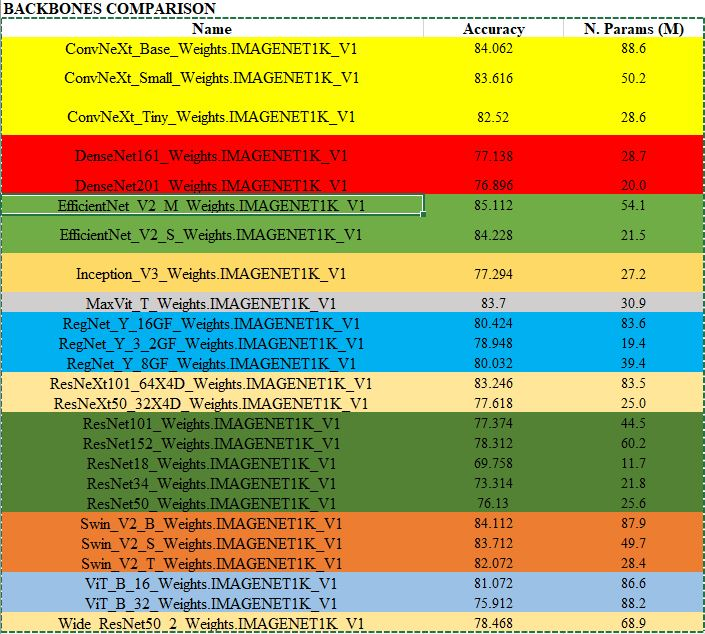

the model ordered by number of parameters

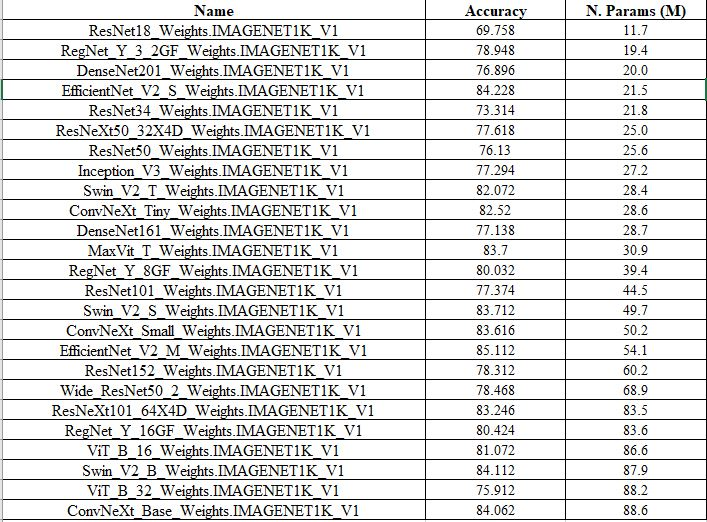

######7.1.2.1 ConvNeXt

In [106]:
class OurConvnext(nn.Module):
    '''
    Convnext class
      
    ...
        
    Public Methods:
    ----------
        forward(self, x: dict[str, torch.tensor]) -> List[torch.tensor]
            -- forward into architecture

        

    Usage:
    ----------
        >>> convnext = OurConvnext()
        >>> output = convnext(x)
     
          
    '''
    def __init__(self, pretrained: bool = True, num_classes: int = NUM_CLASSES, 
                submodel: str = "base", dropout: float = 0.5, 
                obtain_features: bool = False, 
                use_best_pretrained: Optional[str] = None) -> None:
        
        super().__init__()
        self.submodel: str = submodel
        self.obtain_features: bool = obtain_features
        
        if ((submodel != "our")and (submodel != "ourda")):
            self.name: str = "convnext"
        else:
            self.name: str = "our"
        
        # Check if we want pretrained model 
        if use_best_pretrained is None:
            if (pretrained == True):
                if(submodel == "base"):
                    model: nn.Module = torchvision.models.convnext_base(weights=torchvision.models.ConvNeXt_Base_Weights.IMAGENET1K_V1)
                elif(submodel == "small"):
                    model: nn.Module = torchvision.models.convnext_small(weights=torchvision.models.ConvNeXt_Small_Weights.IMAGENET1K_V1)
                elif(submodel == "tiny"):
                    model: nn.Module = torchvision.models.convnext_tiny(weights=torchvision.models.ConvNeXt_Tiny_Weights.IMAGENET1K_V1)
                else:
                    model: nn.Module = torchvision.models.convnext_base(weights=torchvision.models.ConvNeXt_Base_Weights.IMAGENET1K_V1)
            else:
                if(submodel == "base"):
                    model: nn.Module = torchvision.models.convnext_base(weights=None)
                elif(submodel == "small"):
                    model: nn.Module = torchvision.models.convnext_small(weights=None)
                elif(submodel == "tiny"):
                    model: nn.Module = torchvision.models.convnext_tiny(weights=None)
                else:
                    model: nn.Module = torchvision.models.convnext_base(weights=None)
        else:
            model: OurConvnext = OurConvnext(
                pretrained = False, num_classes = NUM_CLASSES, 
                submodel = "our", dropout = 0.5
                )
            model.load_state_dict(torch.load(
                "../Material/" + use_best_pretrained, map_location = DEVICE)) 
        # BACKBONE
        # Take layers we want to reuse
        self.features: nn.Module = model.features
        self.avgpool: nn.Module = model.avgpool
        # Take number input features
        self.classifier: nn.Module = model.classifier
        # CLASSIFIER
        in_features: int = model.classifier[2].out_features    
        if ((self.submodel == "our")or (self.submodel == "ourda")):
            # Take number input features
            fc: nn.Module = torch.nn.Linear(
                in_features = in_features, 
                out_features = in_features)
            nn.init.xavier_normal_(fc.weight)
            self.fc_1: nn.Module = fc if use_best_pretrained is None else model.fc_1
            self.batchnorm: nn.Module = torch.nn.BatchNorm1d(in_features) if use_best_pretrained is None else model.batchnorm
            if dropout is not None:
                self.dropout: nn.Module = torch.nn.Dropout(p = dropout) if use_best_pretrained is None else model.dropout
            fc: nn.Module = torch.nn.Linear(
                in_features = in_features, 
                out_features = NUM_CLASSES)
            nn.init.xavier_normal_(fc.weight)
            self.fc_2: nn.Module = fc if use_best_pretrained is None else model.fc_2
        else:
            self.classifier[2] = torch.nn.Linear(
                in_features = in_features, 
                out_features = NUM_CLASSES)
        return None

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        compute forward
        ...

        Keyword Arguments:
        ----------
          x : torch.tensor]
              -- input to convnext model
          
        Returns
        ----------
          tensor output (optional also feature before classifier)
          

        """
        # Forward pass
        x: torch.Tensor = self.features(x)
        x: torch.Tensor = self.avgpool(x)
        x: torch.Tensor = self.classifier(x)
        if ((self.submodel == "our") or (self.submodel == "ourda")):   
            y: torch.Tensor = self.fc_1(x)
            y: torch.Tensor = self.batchnorm(y)
            y: torch.Tensor = torch.nn.functional.relu(y)
            if self.dropout is not None:
                y: torch.Tensor = self.dropout(y)
            y: torch.Tensor = self.fc_2(y)
        else:
            y: torch.Tensor = x
        if self.obtain_features:
            return x, y
        else:
            return y


######7.1.2.2 DenseNet

In [107]:
class OurDensenet(nn.Module):
  '''
  Densenet class
    
  ...
      
  Public Methods:
  ----------
      forward(self, x: torch.tensor) -> torch.tensor
          -- forward into architecture 
  '''
  def __init__(
      self, pretrained: bool = True, 
      num_classes: int = NUM_CLASSES, 
      submodel: str = "161") -> None:

      super().__init__()
      self.name: str = "densenet"
      # Check if we want pretrained model 
      if (pretrained == True):
          if(submodel == "161"):
              model: nn.Module = torchvision.models.densenet161(weights = torchvision.models.DenseNet161_Weights.IMAGENET1K_V1)
          elif(submodel == "201"):
              model: nn.Module = torchvision.models.densenet201(weights = torchvision.models.DenseNet201_Weights.IMAGENET1K_V1)
      else:
          if(submodel == "161"):
              model: nn.Module = torchvision.models.densenet161(weights = None)
          elif(submodel == "201"):
              model: nn.Module = torchvision.models.densenet201(weights = None)
      # Take layers we want to reuse
      self.features: nn.Module = model.features
      # Take number input features
      in_features: int = model.classifier.in_features
      self.classifier: nn.Module = torch.nn.Linear(
          in_features = in_features, 
          out_features = NUM_CLASSES)

  def forward(self, x: torch.Tensor) -> torch.Tensor:
      """
      forward into architecture
      ...

      Keyword Arguments:
      ----------

        x: torch.Tensor
            -- input data

      Returns
      ----------
        output of model

      """
      # Forward pass
      x: torch.Tensor = self.features(x)
      x: torch.Tensor = torch.nn.functional.relu(x, inplace = True)
      x: torch.Tensor = torch.nn.functional.adaptive_avg_pool2d(x, (1, 1))
      x: torch.Tensor = torch.flatten(x, 1)
      x: torch.Tensor = self.classifier(x)
      return x

######7.1.2.3 Inception_V3

In [108]:
class OurInceptionet(nn.Module):
    '''
    inceptionnet class
      
    ...
        
    Public Methods:
    ----------
        forward(self, x: torch.tensor) -> torch.tensor
            -- forward into architecture 
    '''
    def __init__(
        self, pretrained: bool = True, 
        num_classes: int = NUM_CLASSES) -> None:
        
        super().__init__()
        self.name: str = "inception"
        # Check if we want pretrained model 
        if (pretrained == True):
            model: nn.Module = torchvision.models.inception_v3(weights = torchvision.models.Inception_V3_Weights.IMAGENET1K_V1)
        else:
            model: nn.Module = torchvision.models.inception_v3(weights = None)
        # Take layers we want to reuse
        self.Conv2d_1a_3x3: nn.Module = model.Conv2d_1a_3x3
        self.Conv2d_2a_3x3: nn.Module = model.Conv2d_2a_3x3
        self.Conv2d_2b_3x3: nn.Module = model.Conv2d_2b_3x3
        self.Conv2d_3b_1x1: nn.Module = model.Conv2d_3b_1x1
        self.maxpool1: nn.Module = model.maxpool1
        self.Conv2d_4a_3x3: nn.Module = model.Conv2d_4a_3x3
        self.maxpool2: nn.Module = model.maxpool2
        self.Mixed_5b: nn.Module = model.Mixed_5b
        self.Mixed_5c: nn.Module = model.Mixed_5c
        self.Mixed_5d: nn.Module = model.Mixed_5d
        self.Mixed_6a: nn.Module = model.Mixed_6a
        self.Mixed_6b: nn.Module = model.Mixed_6b
        self.Mixed_6c: nn.Module = model.Mixed_6c
        self.Mixed_6d: nn.Module = model.Mixed_6d
        self.Mixed_6e: nn.Module = model.Mixed_6e
        self.Mixed_7a: nn.Module = model.Mixed_7a
        self.Mixed_7b: nn.Module = model.Mixed_7b
        self.Mixed_7c: nn.Module = model.Mixed_7c
        self.avgpool: nn.Module = model.avgpool
        self.dropout: nn.Module = model.dropout
        # Take number input features
        in_features: int = model.fc.in_features
        self.fc: nn.Module = torch.nn.Linear(
            in_features = in_features, 
            out_features = NUM_CLASSES)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        forward into architecture
        ...

        Keyword Arguments:
        ----------

          x: torch.Tensor
              -- input data

        Returns
        ----------
          output of model

        """
        x: torch.Tensor = self.Conv2d_1a_3x3(x)
        x: torch.Tensor = self.Conv2d_2a_3x3(x)
        x: torch.Tensor = self.Conv2d_2b_3x3(x)
        x: torch.Tensor = self.maxpool1(x)
        x: torch.Tensor = self.Conv2d_3b_1x1(x)
        x: torch.Tensor = self.Conv2d_4a_3x3(x)
        x: torch.Tensor = self.maxpool2(x)
        x: torch.Tensor = self.Mixed_5b(x)
        x: torch.Tensor = self.Mixed_5c(x)
        x: torch.Tensor = self.Mixed_5d(x)
        x: torch.Tensor = self.Mixed_6a(x)
        x: torch.Tensor = self.Mixed_6b(x)
        x: torch.Tensor = self.Mixed_6c(x)
        x: torch.Tensor = self.Mixed_6d(x)
        x: torch.Tensor = self.Mixed_6e(x)
        x: torch.Tensor = self.Mixed_7a(x)
        x: torch.Tensor = self.Mixed_7b(x)
        x: torch.Tensor = self.Mixed_7c(x)
        x: torch.Tensor = self.avgpool(x)
        x: torch.Tensor = self.dropout(x)
        x: torch.Tensor = torch.flatten(x, 1)
        x: torch.Tensor = self.fc(x)
        return x
      

######7.1.2.4 MaxVit

In [109]:
class OurMaxvit(nn.Module):
    '''
    maxvit class
      
    ...
        
    Public Methods:
    ----------
        forward(self, x: torch.tensor) -> torch.tensor
            -- forward into architecture 
    '''
    def __init__(
        self, pretrained: bool = True, 
        num_classes: int = NUM_CLASSES) -> None:
        
        super().__init__()
        self.name: str = "maxvit"
        # Check if we want pretrained model 
        if (pretrained == True):
            model: nn.Module = torchvision.models.maxvit_t(weights = torchvision.models.MaxVit_T_Weights.IMAGENET1K_V1)
        else:
            model: nn.Module = torchvision.models.maxvit_t(weights = None)
        # Take layers we want to reuse
        self.stem: nn.Module = model.stem
        self.blocks: nn.Module = model.blocks
        # Take number input features
        in_features: int = model.classifier[5].in_features
        self.classifier: nn.Module = model.classifier
        self.classifier[5] = torch.nn.Linear(
            in_features = in_features, 
            out_features = NUM_CLASSES)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        forward into architecture
        ...

        Keyword Arguments:
        ----------

          x: torch.Tensor
              -- input data

        Returns
        ----------
          output of model

        """
        x: torch.Tensor = self.stem(x)
        for block in self.blocks:
              x: torch.Tensor = block(x)
        x: torch.Tensor = self.classifier(x)
        return x
      

######7.1.2.5 ResNet

In [110]:
class OurResnet(nn.Module):
    '''
    resnet class
      
    ...
        
    Public Methods:
    ----------
        forward(self, x: torch.tensor) -> torch.tensor
            -- forward into architecture 
    '''
    def __init__(
        self, pretrained: bool = True, 
        num_classes: int = NUM_CLASSES, 
        submodel: str = "50", dropout: float = 0.2) -> None:
        super().__init__()
        if submodel != "our":
            self.name: str = "resnet"
        else:
            self.name: str = "our"
        # Check if we want pretrained model 
        if (pretrained == True):
            if(submodel == "34"):
                model: nn.Module = torchvision.models.resnet34(weights = torchvision.models.ResNet34_Weights.IMAGENET1K_V1)
            elif(submodel == "50"):
                model: nn.Module = torchvision.models.resnet50(weights = torchvision.models.ResNet50_Weights.IMAGENET1K_V1)
            elif(submodel == "101"):
                model: nn.Module = torchvision.models.resnet101(weights = torchvision.models.ResNet101_Weights.IMAGENET1K_V1)
            elif(submodel == "152"):
                model: nn.Module = torchvision.models.resnet152(weights = torchvision.models.ResNet152_Weights.IMAGENET1K_V1) 
            else:
                model: nn.Module = torchvision.models.resnet152(weights = torchvision.models.ResNet152_Weights.IMAGENET1K_V1) 
        else:
            if(submodel == "34"):
                model: nn.Module = torchvision.models.resnet34(weights = None)
            elif(submodel == "50"):
                model: nn.Module = torchvision.models.resnet50(weights = None)
            elif(submodel == "101"):
                model: nn.Module = torchvision.models.resnet101(weights = None)
            elif(submodel == "152"):
                model: nn.Module = torchvision.models.resnet152(weights = None)
            else:
                model: nn.Module = torchvision.models.resnet152(weights = None)
        self.submodel: str = submodel
        #take layers we want to reuse
        self.conv1: nn.Module = model.conv1
        self.bn1: nn.Module = model.bn1
        self.relu: nn.Module = model.relu
        self.maxpool: nn.Module = model.maxpool
        self.layer1: nn.Module = model.layer1
        self.layer2: nn.Module = model.layer2
        self.layer3: nn.Module = model.layer3
        self.layer4: nn.Module = model.layer4
        self.avgpool: nn.Module = model.avgpool
        # Re-initalize the output layer
        if (self.submodel == "our"):
            # Take number input features
            in_features: int = model.fc.in_features
            fc: nn.Module = torch.nn.Linear(
                in_features = in_features, 
                out_features = in_features)
            nn.init.xavier_normal_(fc.weight)
            self.fc_1: nn.Module = fc
            self.batchnorm: nn.Module = torch.nn.BatchNorm1d(in_features)
            if dropout is not None:
                self.dropout: nn.Module = torch.nn.Dropout(p = dropout)
            fc: nn.Module = torch.nn.Linear(
                in_features = in_features, 
                out_features = NUM_CLASSES)
            nn.init.xavier_normal_(fc.weight)
            self.fc_2: nn.Module = fc
        else:
            in_features: int = model.fc.in_features
            fc: nn.Module = torch.nn.Linear(
                in_features = in_features, 
                out_features = NUM_CLASSES)
            nn.init.xavier_normal_(fc.weight)
            self.fc: nn.Module = fc

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        forward into architecture
        ...

        Keyword Arguments:
        ----------

          x: torch.Tensor
              -- input data

        Returns
        ----------
          output of model

        """
        x: torch.Tensor = self.conv1(x)
        x: torch.Tensor = self.bn1(x)
        x: torch.Tensor = self.relu(x)
        x: torch.Tensor = self.maxpool(x)
        x: torch.Tensor = self.layer1(x)
        x: torch.Tensor = self.layer2(x)
        x: torch.Tensor = self.layer3(x)
        x: torch.Tensor = self.layer4(x)
        x: torch.Tensor = self.avgpool(x)
        x: torch.Tensor = torch.flatten(x, 1)
        if (self.submodel == "our"):   
            y: torch.Tensor = self.fc_1(x)
            y: torch.Tensor = self.batchnorm(y)
            y: torch.Tensor = torch.nn.functional.relu(y)
            if self.dropout is not None:
                y: torch.Tensor = self.dropout(y)
            y: torch.Tensor = self.fc_2(y)
        else:
            y: torch.Tensor = self.fc(x)
        return y
      

######7.1.2.6 ViT_B

In [111]:
class OurVit(nn.Module):
  '''
  vit class
    
  ...
      
  Public Methods:
  ----------
      forward(self, x: torch.tensor) -> torch.tensor
          -- forward into architecture 
  '''
  def __init__(
      self, pretrained: bool = True, 
      num_classes: int = NUM_CLASSES, 
      submodel: str = "16", dropout: float = 0.5) -> None:

      super().__init__()
      self.submodel=submodel
      if (submodel != "our"):
          self.name: str = "vit"
      else:
          self.name: str = "our"
      # Check if we want pretrained model 
      if (pretrained == True):
          if(submodel == "16"):
              model: nn.Module = torchvision.models.vit_b_16(weights = torchvision.models.ViT_B_16_Weights.IMAGENET1K_V1)
          elif(submodel == "32"):
              model: nn.Module = torchvision.models.vit_b_32(weights = torchvision.models.ViT_B_32_Weights.IMAGENET1K_V1)
          else:
              model: nn.Module = torchvision.models.vit_b_32(weights = torchvision.models.ViT_B_32_Weights.IMAGENET1K_V1)
      else:
          if(submodel == "16"):
              model: nn.Module = torchvision.models.vit_b_16(weights = None)
          elif(submodel == "32"):
              model: nn.Module = torchvision.models.vit_b_32(weights = None)
          else:
              model: nn.Module = torchvision.models.vit_b_32(weights = None)
      # Take layers we want to reuse
      self.conv_proj: nn.Module = model.conv_proj
      self.encoder: nn.Module = model.encoder
      # Take number input features
      in_features: int = model.heads[0].in_features
      self.heads: nn.Module = model.heads
      if (self.submodel == "our"):
          # Take number input features
          fc: nn.Module = torch.nn.Linear(
              in_features = in_features, 
              out_features = in_features)
          nn.init.xavier_normal_(fc.weight)
          self.fc_1: nn.Module = fc
          self.batchnorm: nn.Module = torch.nn.BatchNorm1d(in_features)
          if dropout is not None:
              self.dropout: nn.Module = torch.nn.Dropout(p = dropout)
          fc: nn.Module = torch.nn.Linear(
              in_features = in_features, 
              out_features = NUM_CLASSES)
          nn.init.xavier_normal_(fc.weight)
          self.fc_2: nn.Module = fc
      else:
          self.heads[0] = torch.nn.Linear(
              in_features = in_features, 
              out_features = NUM_CLASSES)
      self.hidden_dim = model.hidden_dim
      self.class_token = model.class_token
      self.patch_size = model.patch_size
      self.image_size = model.image_size
    
  def _process_input(self, x: torch.Tensor) -> torch.Tensor:
        n, c, h, w = x.shape
        p = self.patch_size
        torch._assert(h == self.image_size, f"Wrong image height! Expected {self.image_size} but got {h}!")
        torch._assert(w == self.image_size, f"Wrong image width! Expected {self.image_size} but got {w}!")
        n_h = h // p
        n_w = w // p
        # (n, c, h, w) -> (n, hidden_dim, n_h, n_w)
        x = self.conv_proj(x)
        # (n, hidden_dim, n_h, n_w) -> (n, hidden_dim, (n_h * n_w))
        x = x.reshape(n, self.hidden_dim, n_h * n_w)
        # (n, hidden_dim, (n_h * n_w)) -> (n, (n_h * n_w), hidden_dim)
        # The self attention layer expects inputs in the format (N, S, E)
        # where S is the source sequence length, N is the batch size, E is the
        # embedding dimension
        x = x.permute(0, 2, 1)
        return x

  def forward(self, x: torch.Tensor) -> torch.Tensor:
      """
      forward into architecture
      ...

      Keyword Arguments:
      ----------

        x: torch.Tensor
            -- input data

      Returns
      ----------
        output of model

      """
      # Reshape and permute the input tensor
      x = self._process_input(x)
      n = x.shape[0]
      # Expand the class token to the full batch
      batch_class_token = self.class_token.expand(n, -1, -1)
      x = torch.cat([batch_class_token, x], dim=1)
      x = self.encoder(x)
      # Classifier "token" as used by standard language architectures
      x = x[:, 0]
      if (self.submodel == "our"):   
          y: torch.Tensor = self.fc_1(x)
          y: torch.Tensor = self.batchnorm(y)
          y: torch.Tensor = torch.nn.functional.relu(y)
          if self.dropout is not None:
              y: torch.Tensor = self.dropout(y)
          y: torch.Tensor = self.fc_2(y)
      else:
          y = self.heads(x)
      return y
      

######7.1.2.7 Wide_ResNet

In [112]:
class OurWideresnet(nn.Module):
  '''
  wideresnet class
    
  ...
      
  Public Methods:
  ----------
      forward(self, x: torch.tensor) -> torch.tensor
          -- forward into architecture 
  '''
  def __init__(self, pretrained: bool = True, num_classes: int = NUM_CLASSES, submodel: str = "our", dropout: float = 0.5) -> None:
      super().__init__()
      self.submodel=submodel
      if (submodel != "our"):
          self.name: str= "wideresnet"
      else:
          self.name: str = "our"
      # Check if we want pretrained model 
      if (pretrained == True):
          model: nn.Module = torchvision.models.wide_resnet50_2(weights = torchvision.models.Wide_ResNet50_2_Weights.IMAGENET1K_V1)
      else:
          model: nn.Module = torchvision.models.wide_resnet50_2(weights = None)   
      # Take layers we want to reuse
      self.conv1: nn.Module = model.conv1
      self.bn1: nn.Module = model.bn1
      self.relu: nn.Module = model.relu
      self.maxpool: nn.Module = model.maxpool
      self.layer1: nn.Module = model.layer1
      self.layer2: nn.Module = model.layer2
      self.layer3: nn.Module = model.layer3
      self.layer4: nn.Module = model.layer4
      self.avgpool: nn.Module = model.avgpool
      # Re-initalize the output layer
      if (self.submodel == "our"):
          # Take number input features
          in_features: int = model.fc.in_features
          fc: nn.Module = torch.nn.Linear(
              in_features = in_features, 
              out_features = in_features)
          nn.init.xavier_normal_(fc.weight)
          self.fc_1: nn.Module = fc
          self.batchnorm: nn.Module = torch.nn.BatchNorm1d(in_features)
          if dropout is not None:
              self.dropout: nn.Module = torch.nn.Dropout(p = dropout)
          fc: nn.Module = torch.nn.Linear(
              in_features = in_features, 
              out_features = NUM_CLASSES)
          nn.init.xavier_normal_(fc.weight)
          self.fc_2: nn.Module = fc
      else:
          in_features: int = model.fc.in_features
          fc: nn.Module = torch.nn.Linear(
              in_features = in_features, 
              out_features = NUM_CLASSES)
          nn.init.xavier_normal_(fc.weight)
          self.fc: nn.Module = fc

  def forward(self, x) -> torch.Tensor:
      """
      forward into architecture
      ...

      Keyword Arguments:
      ----------

        x: torch.Tensor
            -- input data

      Returns
      ----------
        output of model

      """
      # Forward pass
      x: torch.Tensor = self.conv1(x)
      x: torch.Tensor = self.bn1(x)
      x: torch.Tensor = self.relu(x)
      x: torch.Tensor = self.maxpool(x)
      x: torch.Tensor = self.layer1(x)
      x: torch.Tensor = self.layer2(x)
      x: torch.Tensor = self.layer3(x)
      x: torch.Tensor = self.layer4(x)
      x: torch.Tensor = self.avgpool(x)
      x: torch.Tensor = torch.flatten(x, 1)
      if (self.submodel == "our"):   
          y: torch.Tensor = self.fc_1(x)
          y: torch.Tensor = self.batchnorm(y)
          y: torch.Tensor = torch.nn.functional.relu(y)
          if self.dropout is not None:
              y: torch.Tensor = self.dropout(y)
          y: torch.Tensor = self.fc_2(y)
      else:
          y: torch.Tensor = self.fc(x)
      return y
      


######7.1.2.8 ResNeXt

In [113]:
class OurResnext(nn.Module):
    """
    resnexxt class
      
    ...
        
    Public Methods:
    ----------
        forward(self, x: torch.tensor) -> torch.tensor
            -- forward into architecture 
    """
    def __init__(
        self, pretrained: bool = True, 
        num_classes: int = NUM_CLASSES, submodel: str = "50", 
        dropout: float = 0.5, obtain_features=False
        ) -> None:

        super().__init__()
        if ((submodel != "our") and (submodel != "ourda")):
            self.name: str = "resnext"
        else:
            self.name: str = "our"
        self.obtain_features=obtain_features
        # Check if we want pretrained model 
        if (pretrained == True):
            if(submodel == "50"):
              model: nn.Module = torchvision.models.resnext50_32x4d(weights = torchvision.models.ResNeXt50_32X4D_Weights.IMAGENET1K_V1)
            elif(submodel == "101"):
              model: nn.Module = torchvision.models.resnext101_64x4d(weights = torchvision.models.ResNeXt101_64X4D_Weights.IMAGENET1K_V1)
            else:
              model: nn.Module = torchvision.models.resnext101_64x4d(weights = torchvision.models.ResNeXt101_64X4D_Weights.IMAGENET1K_V1)
        else:
            if(submodel == "50"):
              model: nn.Module = torchvision.models.resnext50_32x4d(weights = None)
            elif(submodel == "101"):
              model: nn.Module = torchvision.models.resnext101_64X4d(weights = None)
            else:
                model: nn.Module = torchvision.models.resnext101_64x4d(weights = None)
        self.submodel: str = submodel
        # Take layers we want to reuse
        self.conv1: nn.Module = model.conv1
        self.bn1: nn.Module = model.bn1
        self.relu: nn.Module = model.relu
        self.maxpool: nn.Module = model.maxpool
        self.layer1: nn.Module = model.layer1
        self.layer2: nn.Module = model.layer2
        self.layer3: nn.Module = model.layer3
        self.layer4: nn.Module = model.layer4
        self.avgpool: nn.Module = model.avgpool
        # Take number input features
        # Re-initalize the output layer
        if ((self.submodel == "our") or (self.submodel == "ourda")):
          # Take number input features
          in_features: int = model.fc.in_features
          fc: nn.Module = torch.nn.Linear(
              in_features = in_features, 
              out_features = in_features)
          nn.init.xavier_normal_(fc.weight)
          self.fc_1: nn.Module = fc
          self.batchnorm: nn.Module = torch.nn.BatchNorm1d(2048)
          if dropout is not None:
            self.dropout: nn.Module = torch.nn.Dropout(p = dropout)
          fc: nn.Module = torch.nn.Linear(
              in_features = in_features, 
              out_features = NUM_CLASSES)
          nn.init.xavier_normal_(fc.weight)
          self.fc_2: nn.Module = fc
        else:
          in_features: int = model.fc.in_features
          fc: nn.Module = torch.nn.Linear(
              in_features = in_features, 
              out_features = NUM_CLASSES)
          nn.init.xavier_normal_(fc.weight)
          self.fc: nn.Module = fc

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        forward into architecture
        ...

        Keyword Arguments:
        ----------

          x: torch.Tensor
              -- input data

        Returns
        ----------
          output of model

        """
        # Forward pass
        x: torch.Tensor = self.conv1(x)
        x: torch.Tensor = self.bn1(x)
        x: torch.Tensor = self.relu(x)
        x: torch.Tensor = self.maxpool(x)
        x: torch.Tensor = self.layer1(x)
        x: torch.Tensor = self.layer2(x)
        x: torch.Tensor = self.layer3(x)
        x: torch.Tensor = self.layer4(x)
        x: torch.Tensor = self.avgpool(x)
        x: torch.Tensor = torch.flatten(x, 1)
        if ((self.submodel == "our") or (self.submodel == "ourda")):   
            y: torch.Tensor = self.fc_1(x)
            y: torch.Tensor = self.batchnorm(y)
            y: torch.Tensor = torch.nn.functional.relu(y)
            if self.dropout is not None:
                y: torch.Tensor = self.dropout(y)
            y: torch.Tensor = self.fc_2(y)
        else:
            y: torch.Tensor = self.fc(x)
        if self.obtain_features:
            return x, y
        else:
          return y
        


######7.1.2.9 Efficientnet_V2

In [114]:
class OurEfficientnet(nn.Module):
  '''
  efficientnet class
    
  ...
      
  Public Methods:
  ----------
      forward(self, x: torch.tensor) -> torch.tensor
          -- forward into architecture 
  '''
  def __init__(
      self, pretrained: bool = True, 
      num_classes: int = NUM_CLASSES, 
      submodel: str = "M") -> None :
        
        super().__init__()
        self.name: str = "efficientnet"
        # Check if we want pretrained model 
        if (pretrained == True):
            if(submodel == "M"):
                model: nn.Module = torchvision.models.efficientnet_v2_m(weights = torchvision.models.EfficientNet_V2_M_Weights.IMAGENET1K_V1)
            elif(submodel == "S"):
                model: nn.Module = torchvision.models.efficientnet_v2_s(weights = torchvision.models.EfficientNet_V2_S_Weights.IMAGENET1K_V1)
        else:
            if(submodel == "M"):
                model: nn.Module = torchvision.models.efficientnet_v2_m(weights = None)
            elif(submodel == "S"):
                model: nn.Module = torchvision.models.efficientnet_v2_s(weights = None)
        # Take layers we want to reuse
        self.features: nn.Module = model.features
        self.avgpool: nn.Module = model.avgpool
        # Take number input features
        in_features: int = model.classifier[1].in_features
        self.classifier: nn.Module = model.classifier
        # Re-initalize the output layer
        self.classifier[1] = torch.nn.Linear(
            in_features = in_features, 
            out_features = NUM_CLASSES)

  def forward(self, x: torch.Tensor) -> torch.Tensor:
      """
      forward into architecture
      ...

      Keyword Arguments:
      ----------

        x: torch.Tensor
            -- input data

      Returns
      ----------
        output of model

      """
      # Forward pass
      x: torch.Tensor = self.features(x)
      x: torch.Tensor = self.avgpool(x)
      x: torch.Tensor = torch.flatten(x, 1)
      x: torch.Tensor = self.classifier(x)
      return x
      



######7.1.2.10 RegNet_Y

In [115]:
class OurRegnet(nn.Module):
  '''
  regnet class
    
  ...
      
  Public Methods:
  ----------
      forward(self, x: torch.tensor) -> torch.tensor
          -- forward into architecture 
  '''
  def __init__(
      self, pretrained: bool = True, 
      num_classes: int = NUM_CLASSES, 
      submodel: str = "16gf", dropout: float = 0.5) -> None:
      
      super().__init__()
      self.submodel=submodel
      if submodel != "our":
          self.name: str = "regnet"
      else:
          self.name: str = "our"
      # Check if we want pretrained model 
      if (pretrained == True):
          if(submodel =="8gf"):
              model = torchvision.models.regnet_y_8gf(weights = torchvision.models.RegNet_Y_8GF_Weights.IMAGENET1K_V1)
          elif(submodel == "16gf"):
              model = torchvision.models.regnet_y_16gf(weights = torchvision.models.RegNet_Y_16GF_Weights.IMAGENET1K_V1)
          elif(submodel == "32gf"):
              model = torchvision.models.regnet_y_3_2gf(weights = torchvision.models.RegNet_Y_3_2GF_Weights.IMAGENET1K_V1)
          else:
              model = torchvision.models.regnet_y_3_2gf(weights = torchvision.models.RegNet_Y_3_2GF_Weights.IMAGENET1K_V1)  
      else:
          if(submodel == "8gf"):
              model = torchvision.models.regnet_y_8gf(weights = None)
          elif(submodel == "16gf"):
              model = torchvision.models.regnet_y_16gf(weights = None)
          elif(submodel == "32gf"):
              model = torchvision.models.regnet_y_3_2gf(weights = None)
          else:
              model = torchvision.models.regnet_y_3_2gf(weights = None)
      self.submodel: str = submodel
      # Take layers we want to reuse
      self.stem: nn.Module = model.stem
      self.trunk_output: nn.Module = model.trunk_output
      self.avgpool: nn.Module = model.avgpool
      # Re-initalize the output layer
      if (self.submodel == "our"):
          # Take number input features
          in_features: int = model.fc.in_features
          fc: nn.Module = torch.nn.Linear(
              in_features = in_features, 
              out_features = in_features)
          nn.init.xavier_normal_(fc.weight)
          self.fc_1: nn.Module = fc
          self.batchnorm: nn.Module = torch.nn.BatchNorm1d(in_features)
          if dropout is not None:
              self.dropout: nn.Module = torch.nn.Dropout(p = dropout)
          fc: nn.Module = torch.nn.Linear(
              in_features = in_features, 
              out_features = NUM_CLASSES)
          nn.init.xavier_normal_(fc.weight)
          self.fc_2: nn.Module = fc
      else:
          in_features: int = model.fc.in_features
          fc: nn.Module = torch.nn.Linear(
              in_features = in_features, 
              out_features = NUM_CLASSES)
          nn.init.xavier_normal_(fc.weight)
          self.fc: nn.Module = fc

  def forward(self, x: torch.Tensor) -> torch.Tensor:
      """
      forward into architecture
      ...

      Keyword Arguments:
      ----------

        x: torch.Tensor
            -- input data

      Returns
      ----------
        output of model

      """
      x = self.stem(x)
      x = self.trunk_output(x)
      x = self.avgpool(x)
      x = torch.flatten(x, 1)
      if (self.submodel == "our"):   
          y: torch.Tensor = self.fc_1(x)
          y: torch.Tensor = self.batchnorm(y)
          y: torch.Tensor = torch.nn.functional.relu(y)
          if self.dropout is not None:
              y: torch.Tensor = self.dropout(y)
          y: torch.Tensor = self.fc_2(y)
      else:
          y: torch.Tensor = self.fc(x)
      return y

#####**7.1.3 DA Model Classes**

structure of these models is explained more in detail in section 12

######7.1.3.1 RoszantsevModel

In [116]:
class RoszantsevModel(nn.Module):
    '''
    Roszsantev model class
      
    ...
        
    Public Methods:
    ----------
        forward(self, x: Dict[str, torch.tensor]) -> List[torch.tensor]
            -- forward into architecture

        

    Usage:
    ----------
        >>> model = RoszantsevModel()
        >>> features_s, out_s, features_t, out_t = model(x)
     
          
    '''
    def __init__(self, pretrained: bool = True, num_classes: int = NUM_CLASSES, 
                 dropout: float = 0.5, connected: List[str] = ["-", "-"],
                 use_best_pretrained: Optional[str] = None) -> None:
        super().__init__()
        self.name: str = "roszantev"
        self._connected: List[str] = connected
        #check if we want pretrained model
        if use_best_pretrained is None:
          if (pretrained == True):
              model: nn.Module = torchvision.models.convnext_base(
                  weights = torchvision.models.ConvNeXt_Base_Weights.IMAGENET1K_V1)
          else:
              model: nn.Module = torchvision.models.convnext_base(weights = None)
        else:
            model: OurConvnext = OurConvnext(
                pretrained = False, num_classes = NUM_CLASSES, 
                submodel = "our", dropout = 0.5
                )
            model.load_state_dict(torch.load(
                "../Material/" + use_best_pretrained, map_location = DEVICE)) 
        #BACKBONE
        self._features: nn.Module = model.features
        self._avgpool: nn.Module = model.avgpool
        self._classifier: nn.Module = model.classifier
        in_features: int = model.classifier[2].out_features
        # CLASSIFIER
        if((self._connected[0] == "-") and (self._connected[1] == "-")):   
            fc: torch.nn.Linear = torch.nn.Linear(
                in_features = in_features, 
                out_features = in_features)
            nn.init.xavier_normal_(fc.weight)
            self.fc_1_source: torch.nn.Linear = (
                fc if use_best_pretrained is None else copy.deepcopy(model.fc_1))
            self._batchnorm_source: torch.nn.BatchNorm1d = (
                torch.nn.BatchNorm1d(in_features) if use_best_pretrained is None else copy.deepcopy(model.batchnorm))
            fc: torch.nn.Linear = torch.nn.Linear(
                in_features = in_features, 
                out_features = NUM_CLASSES)
            nn.init.xavier_normal_(fc.weight)
            self.fc_2_source: torch.nn.Linear = (
                fc if use_best_pretrained is None else copy.deepcopy(model.fc_2))
            fc: torch.nn.Linear = torch.nn.Linear(
                in_features = in_features, 
                out_features = in_features)
            nn.init.xavier_normal_(fc.weight)
            self.fc_1_target: torch.nn.Linear = (
                fc if use_best_pretrained is None else copy.deepcopy(model.fc_1))
            self._batchnorm_target: torch.nn.BatchNorm1d = (
                torch.nn.BatchNorm1d(in_features) if use_best_pretrained is None else copy.deepcopy(model.batchnorm))
            fc: torch.nn.Linear = torch.nn.Linear(
                in_features = in_features, 
                out_features = NUM_CLASSES)
            nn.init.xavier_normal_(fc.weight)
            self.fc_2_target: torch.nn.Linear = (
                fc if use_best_pretrained is None else copy.deepcopy(model.fc_2))
            #to not penalize linear trasformation
            self.a1: nn.Parameter = nn.Parameter(torch.randn(in_features))
            self.b1: nn.Parameter = nn.Parameter(torch.randn(in_features))
            self.a2: nn.Parameter = nn.Parameter(torch.randn(in_features))
            self.b2: nn.Parameter = nn.Parameter(torch.randn(in_features))
        elif((self._connected[0] == "+") and (self._connected[1] == "+")):
            fc: torch.nn.Linear = torch.nn.Linear(
                in_features = in_features, 
                out_features = in_features)
            nn.init.xavier_normal_(fc.weight)
            self._fc_1: torch.nn.Linear = (
                fc if use_best_pretrained is None else copy.deepcopy(model.fc_1))
            self._batchnorm: torch.nn.BatchNorm1d = (
                torch.nn.BatchNorm1d(in_features) if use_best_pretrained is None else copy.deepcopy(model.batchnorm))
            fc: torch.nn.Linear = torch.nn.Linear(
                in_features = in_features, 
                out_features = NUM_CLASSES)
            nn.init.xavier_normal_(fc.weight)
            self._fc_2: torch.nn.Linear = (
                fc if use_best_pretrained is None else copy.deepcopy(model.fc_2))
        elif((self._connected[0] == "+") and (self._connected[1] == "-")):
            fc: torch.nn.Linear = torch.nn.Linear(
                in_features = in_features, 
                out_features = in_features)
            nn.init.xavier_normal_(fc.weight)
            self._fc_1: torch.nn.Linear = (
                fc if use_best_pretrained is None else copy.deepcopy(model.fc_1))
            self._batchnorm: torch.nn.BatchNorm1d = (
                torch.nn.BatchNorm1d(in_features) if use_best_pretrained is None else copy.deepcopy(model.batchnorm))
            fc: torch.nn.Linear = torch.nn.Linear(
                in_features = in_features, 
                out_features = NUM_CLASSES)
            nn.init.xavier_normal_(fc.weight)
            self.fc_2_source: torch.nn.Linear = (
                fc if use_best_pretrained is None else copy.deepcopy(model.fc_2))
            fc: torch.nn.Linear = torch.nn.Linear(
                in_features = in_features, 
                out_features = NUM_CLASSES)
            nn.init.xavier_normal_(fc.weight)
            self.fc_2_target: torch.nn.Linear = (
                fc if use_best_pretrained is None else copy.deepcopy(model.fc_2))
            #to not penalize linear trasformation
            self.a2: nn.Parameter = nn.Parameter(torch.randn(in_features))
            self.b2: nn.Parameter = nn.Parameter(torch.randn(in_features))
        elif((self._connected[0] == "-") and (self._connected[1] == "+")):
            fc: torch.nn.Linear = torch.nn.Linear(
                in_features = in_features, 
                out_features = in_features)
            nn.init.xavier_normal_(fc.weight)
            self.fc_1_source: torch.nn.Linear = (
                fc if use_best_pretrained is None else copy.deepcopy(model.fc_1))
            self._batchnorm_source:torch.nn.BatchNorm1d = (
                torch.nn.BatchNorm1d(in_features) if use_best_pretrained is None else copy.deepcopy(model.batchnorm))
            fc: torch.nn.Linear = torch.nn.Linear(
                in_features = in_features, 
                out_features = in_features)
            nn.init.xavier_normal_(fc.weight)
            self.fc_1_target = (
                fc if use_best_pretrained is None else copy.deepcopy(model.fc_1))
            self._batchnorm_target: torch.nn.BatchNorm1d = (
                torch.nn.BatchNorm1d(in_features) if use_best_pretrained is None else copy.deepcopy(model.batchnorm))
            fc: torch.nn.Linear = torch.nn.Linear(
                in_features = in_features, 
                out_features = NUM_CLASSES)
            nn.init.xavier_normal_(fc.weight)
            self._fc_2: torch.nn.Linear = (
                fc if use_best_pretrained is None else copy.deepcopy(model.fc_2))
            #to not penalize linear trasformatio
            self.a1: nn.Parameter = nn.Parameter(torch.randn(in_features))
            self.b1: nn.Parameter = nn.Parameter(torch.randn(in_features))
        # other layers
        self._dropout: torch.nn.Dropout = torch.nn.Dropout(p = dropout)
        return None

    def forward(self, x: Dict[str, torch.tensor]) -> List[torch.tensor]:
        """
        compute forward
        ...

        Keyword Arguments:
        ----------
          x : dict[str, torch.tensor]
              -- input to roszantev model as dict of source and output
          
        Returns
        ----------
          features_s hidden features backbone source,
          out_s output label classifier source, 
          features_t hidden features backbone target, 
          out_t output label classifier target , 
          

        """
        # SOURCE
        features_s: torch.tensor = None
        out_s: torch.tensor = None
        if x["source"] is not None:
            features_s: torch.Tensor = self._features(x["source"])
            features_s: torch.Tensor = self._avgpool(features_s)
            features_s: torch.Tensor = self._classifier(features_s)
            if((self._connected[0] == "-") and (self._connected[1] == "-")):
                out_s: torch.tensor = self.fc_1_source(features_s)
                out_s: torch.tensor = self._batchnorm_source(out_s)
                out_s: torch.tensor = torch.nn.functional.relu(out_s)
                out_s: torch.tensor = self._dropout(out_s)
                out_s: torch.tensor = self.fc_2_source(out_s)
            elif((self._connected[0] == "+") and (self._connected[1] == "+")):
                out_s: torch.tensor = self._fc_1(features_s)
                out_s: torch.tensor = self._batchnorm(out_s)
                out_s: torch.tensor = torch.nn.functional.relu(out_s)
                out_s: torch.tensor = self._dropout(out_s)
                out_s: torch.tensor = self._fc_2(out_s)
            elif((self._connected[0] == "+") and (self._connected[1] == "-")):
                out_s: torch.tensor = self._fc_1(features_s)
                out_s: torch.tensor = self._batchnorm(out_s)
                out_s: torch.tensor = torch.nn.functional.relu(out_s)
                out_s: torch.tensor = self._dropout(out_s)
                out_s: torch.tensor = self.fc_2_source(out_s)
            elif((self._connected[0] == "-") and (self._connected[1] == "+")):
                out_s: torch.tensor = self.fc_1_source(features_s)
                out_s: torch.tensor = self._batchnorm_source(out_s)
                out_s: torch.tensor = torch.nn.functional.relu(out_s)
                out_s: torch.tensor = self._dropout(out_s)
                out_s: torch.tensor = self._fc_2(out_s)
        # TARGET
        features_t: torch.tensor = None
        out_t: torch.tensor = None
        if x["target"] is not None:
            features_t: torch.Tensor = self._features(x["target"])
            features_t: torch.Tensor = self._avgpool(features_t)
            features_t: torch.Tensor = self._classifier(features_t)
            if((self._connected[0]=="-") and (self._connected[1]=="-")):
                out_t: torch.tensor = self.fc_1_target(features_t)
                out_t: torch.tensor = self._batchnorm_target(out_t)
                out_t: torch.tensor = torch.nn.functional.relu(out_t)
                out_t: torch.tensor = self._dropout(out_t)
                out_t: torch.tensor = self.fc_2_target(out_t) 
            elif((self._connected[0] == "+") and (self._connected[1] == "+")):
                out_t: torch.tensor = self._fc_1(features_t)
                out_t: torch.tensor = self._batchnorm(out_t)
                out_t: torch.tensor = torch.nn.functional.relu(out_t)
                out_t: torch.tensor = self._dropout(out_t)
                out_t: torch.tensor = self._fc_2(out_t)
            elif((self._connected[0] == "+") and (self._connected[1] == "-")):
                out_t: torch.tensor = self._fc_1(features_t)
                out_t: torch.tensor = self._batchnorm(out_t)
                out_t: torch.tensor = torch.nn.functional.relu(out_t)
                out_t: torch.tensor = self._dropout(out_t)
                out_t: torch.tensor = self.fc_2_target(out_t)
            elif((self._connected[0] == "-") and (self._connected[1] == "+")):
                out_t: torch.tensor = self.fc_1_target(features_t)
                out_t: torch.tensor = self._batchnorm_target(out_t)
                out_t: torch.tensor = torch.nn.functional.relu(out_t)
                out_t: torch.tensor = self._dropout(out_t)
                out_t: torch.tensor = self._fc_2(out_t)
        return features_s, out_s, features_t, out_t
      

######7.1.3.2 XuModel

In [117]:
class XuModel(nn.Module):
    '''
    Xu model class
      
    ...
        
    Public Methods:
    ----------
        forward(self, x: dict[str, torch.tensor]) -> List[torch.tensor]
            -- forward into architecture

        

    Usage:
    ----------
        >>> xu = XuModel()
        >>> output = xu(x)
     
          
    '''
    def __init__(self, pretrained: bool = True, num_classes: int = NUM_CLASSES, 
                 dropout: float = 0.5, use_best_pretrained: Optional[str] = None) -> None:
      super().__init__()
      self.name: str = "xu"

      #check if we want pretrained model 
      if use_best_pretrained is None:
          if (pretrained == True):
              model: nn.Module = torchvision.models.convnext_base(weights = torchvision.models.ConvNeXt_Base_Weights.IMAGENET1K_V1)
          else:
              model: nn.Module = torchvision.models.convnext_base(weights = None)
      else:
          model: OurConvnext = OurConvnext(
              pretrained = False, num_classes = NUM_CLASSES, 
              submodel = "our", dropout = 0.5
              )
          model.load_state_dict(torch.load(
              "../Material/" + use_best_pretrained, map_location = DEVICE)) 
      # BACBONE
      self._features: nn.Module = model.features
      self._avgpool: nn.Module = model.avgpool
      self._classifier: nn.Module = model.classifier
      # CLASSIFIER
      in_features: int = model.classifier[2].out_features
      # source bottleneck
      fc = torch.nn.Linear(
          in_features = in_features, 
          out_features = in_features)
      nn.init.xavier_normal_(fc.weight)
      self._fc_1_source: torch.nn.Linear = fc if use_best_pretrained is None else copy.deepcopy(model.fc_1)
      self._batchnorm_source: torch.nn.BatchNorm1d = torch.nn.BatchNorm1d(in_features) if use_best_pretrained is None else copy.deepcopy(model.batchnorm)
      # target bottleneck
      fc = torch.nn.Linear(
          in_features = in_features, 
          out_features = in_features)
      nn.init.xavier_normal_(fc.weight)
      self._fc_1_target: torch.nn.Linear = fc if use_best_pretrained is None else copy.deepcopy(model.fc_1)
      self._batchnorm_target: torch.nn.BatchNorm1d = torch.nn.BatchNorm1d(in_features) if use_best_pretrained is None else copy.deepcopy(model.batchnorm)
      # common classifier
      fc = torch.nn.Linear(
          in_features = in_features, 
          out_features = NUM_CLASSES)
      nn.init.xavier_normal_(fc.weight)
      self._fc_2: torch.nn.Linear = fc if use_best_pretrained is None else copy.deepcopy(model.fc_2)
      # other modules
      self._dropout: torch.nn.Dropout = torch.nn.Dropout(p = dropout)
      return None

    def forward(self, x: torch.tensor) -> List[torch.tensor]:
        """
        compute forward
        ...

        Keyword Arguments:
        ----------
          x : dict[str, torch.tensor]
              -- input to xu model as dict of source and output
          
        Returns
        ----------
          features_s hidden features backbone source,
          out_s output label classifier source, 
          features_t hidden features backbone target, 
          out_t output label classifier target, 
          

        """
        # SOURCE
        features_s: torch.tensor = None
        out_s: torch.tensor = None
        if x["source"] is not None:
            features_s: torch.Tensor = self._features(x["source"])
            features_s: torch.Tensor = self._avgpool(features_s)
            features_s: torch.Tensor = self._classifier(features_s)
            features_s: torch.tensor = self._fc_1_source(features_s)
            features_s: torch.tensor = self._batchnorm_source(features_s)
            features_s: torch.tensor = torch.nn.functional.relu(features_s)
            features_s: torch.tensor = self._dropout(features_s)
            out_s: torch.tensor = self._fc_2(features_s)
        # TARGET
        features_t: torch.tensor = None
        out_t: torch.tensor = None
        if x["target"] is not None:
            features_t: torch.Tensor = self._features(x["target"])
            features_t: torch.Tensor = self._avgpool(features_t)
            features_t: torch.Tensor = self._classifier(features_t)
            features_t: torch.tensor = self._fc_1_target(features_t)
            features_t: torch.tensor = self._batchnorm_target(features_t)
            features_t: torch.tensor = torch.nn.functional.relu(features_t)
            features_t: torch.tensor = self._dropout(features_t)
            out_t: torch.tensor = self._fc_2(features_t)
        return features_s, out_s,  features_t, out_t

######7.1.3.3 DengModel

result cumulator

implementatio of temporal ensembling of [107] 

the output of the temporal after having cumulated all batch prediction

$Z \leftarrow \alpha Z+(1-\alpha) z$

in fact output of temporal ensembling is corrected (because of initial epoch non existing predictions)

$\tilde{z} \leftarrow Z /\left(1-\alpha^t\right)$ 

where alfa è l accumulation constant si veda dopo


In [118]:
class ResultAccumulator():
    '''
    Result accumulator to realize temporal ensemble
      
    ...

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _alfa: float (deafult: 0.6)
            -- how much account for last prediction
        
        _mem: List[torch.tensor]
            -- memory of current epoch
        
        _result: List[torch.tensor]
            -- temporal ensemble cumulator
        
        _current_epoch: int
            -- curent epoch 

        _current_batch: int
            -- current batch

        _num_batch: int
            -- number total batch in a epoch
        
    Public Methods:
    ----------
        update(self, result: torch.tensor) -> torch.tensor
            -- update result with current bathc, recover temporal ensemble result
        

    Usage:
    ----------
        >>> cumulator = ResultAccumulator(num_batch)
        >>> batch = cumulator(batch)
     
          
    '''
    def __init__(self, num_batch: int, batch_size: int, alfa: float = 0.6):
        self._alfa: float = alfa
        self._mem: List[torch.tensor] = []
        self._result: List[torch.tensor] = [torch.zeros(
            [batch_size, NUM_CLASSES]).to(DEVICE) for i in range(num_batch)]
        self._current_epoch: int = 1  # Used to calculate result
        self._current_batch: int = 0
        self._num_batch: int = num_batch  # Number of batch before next epoch
        return None

    def _add_epoch(self) -> None:
        """
        add epoch, reset memory, update result
        ...

        Keyword Arguments:
        ----------
          None
          
        Returns
        ----------
          None

        """
        self._update_result() # At end batch cycle update epoch reset batch
        self._mem: List[torch.tensor] = []  # Reset memory
        self._current_epoch += 1  # Add one epoch
        self._current_batch: int = 0  # Reset batch
        return None

    def _add_batch(self, result: torch.tensor) -> None:
        """
        add batch, update memory
        ...

        Keyword Arguments:
        ----------
          result: torch.Tensor
            -- batch provided by caller
          
        Returns
        ----------
          None

        """
        self._current_batch += 1  # update batch
        self._mem.append(result) # append current batch to memory
        return None

    def _update_result(self) -> None:
        """
        update stored previosu result with batch of previous passed epoch
        ...

        Keyword Arguments:
        ----------
          None
          
        Returns
        ----------
          None

        """
        # Cycle for each each batch
        for i in range(self._num_batch):
            self._result[i] = self._alfa*self._result[i] + (1 - self._alfa)*self._mem[i]
        return None

    def _return_batch(self) -> torch.tensor:
        """
        return temporal ensemble
        ...

        Keyword Arguments:
        ----------
          None
          
        Returns
        ----------
          the temporal ensemble with formula provided before

        """
        # take current batch (previous index given counter of batch is already increased)
        first_t = self._alfa*self._result[self._current_batch-1]
        # take cumulated result weighted with alfa
        second_t = (1-self._alfa)*self._mem[self._current_batch-1]
        # temporal ensemble correction
        correction = (1-self._alfa**self._current_epoch)
        return (first_t + second_t)/correction
    
    def update(self, result: torch.tensor) -> torch.tensor:
        """
        return temporal ensemble to caller, update current epoch and batch
        ...

        Keyword Arguments:
        ----------
          result: torch.tensor
             -- caller provided batch
          
        Returns
        ----------
          the temporal ensemble with formula provided before

        """
        self._add_batch(result)  # add current batch to memory
        returned_batch = self._return_batch() # return result with our formula
        # if had terminated epoch update result
        if self._current_batch==self._num_batch:
            self._add_epoch()
        return returned_batch

    

deng model implementation

In [119]:
class DengModel(nn.Module):
    '''
    Deng class
      
    ...
        
    Public Methods:
    ----------
        forward(self, x: dict[str, torch.tensor]) -> List[torch.tensor]
            -- forward into architecture

        

    Usage:
    ----------
        >>> deng = DengModel()
        >>> output = deng(x)
     
          
    '''
    def __init__(self, pretrained: bool = True, num_classes: int = NUM_CLASSES, 
                 dropout: float = 0.5, alfa: float = 0.6, num_batch: int = 0, 
                 batch_size: int = 0,  
                 use_best_pretrained: Optional[str] = None) -> None:
        super().__init__()
        self.name: str = "deng"
        #check if we want pretrained model 
        if use_best_pretrained is None:
            if (pretrained == True):
                model: nn.Module = torchvision.models.convnext_base(
                    weights = torchvision.models.ConvNeXt_Base_Weights.IMAGENET1K_V1)
            else:
                model: nn.Module = torchvision.models.convnext_base(
                    weights = None)
        else:
            model: OurConvnext = OurConvnext(
                pretrained = False, num_classes = NUM_CLASSES, 
                submodel = "our", dropout = 0.5
                )
            model.load_state_dict(torch.load(
                "../Material/" + use_best_pretrained, map_location = DEVICE)) 
        # ACCUMULATOR
        self._accumulator: ResultAccumulator = ResultAccumulator(num_batch, batch_size, alfa = alfa)
        # BACKBONE
        self._features: nn.Module = model.features
        self._avgpool: nn.Module = model.avgpool
        self._classifier: nn.Module = model.classifier
        # CLASSIFIER
        # first fully connected
        in_features: int = model.classifier[2].out_features 
        fc: torch.nn.Linear = torch.nn.Linear(
            in_features = in_features, 
            out_features = in_features)
        nn.init.xavier_normal_(fc.weight)
        self._fc_1: torch.nn.Linear = fc if use_best_pretrained is None else model.fc_1
        self._batchnorm: torch.nn.BatchNorm1d = (
            torch.nn.BatchNorm1d(in_features) if use_best_pretrained is None else model.batchnorm)
        # second fully connected
        fc: torch.nn.Linear = torch.nn.Linear(
            in_features = in_features, 
            out_features = NUM_CLASSES)
        nn.init.xavier_normal_(fc.weight)
        self._fc_2: torch.nn.Linear = fc if use_best_pretrained is None else model.fc_2
        # other layers
        self._dropout: torch.nn.Dropout = (
            torch.nn.Dropout(p=dropout) if use_best_pretrained is None else model.dropout)

    def forward(self, x: torch.tensor) -> List[torch.tensor]:
        """
        compute forward
        ...

        Keyword Arguments:
        ----------
          x : dict[str, torch.tensor]
              -- input to debng model as dict of source and output
          
        Returns
        ----------
          features_s hidden features backbone source,
          out_s output label classifier source, 
          features_t hidden features backbone target, 
          out_t output label classifier target with temporal ensemble, 
          

        """
        # SOURCE
        features_s: torch.tensor = None
        out_s: torch.tensor = None
        if x["source"] is not None:
            features_s: torch.Tensor = self._features(x["source"])
            features_s: torch.Tensor = self._avgpool(features_s)
            features_s: torch.Tensor = self._classifier(features_s)
            out_s: torch.tensor = self._fc_1(features_s)
            out_s: torch.tensor = self._batchnorm(out_s)
            out_s: torch.tensor = torch.nn.functional.relu(out_s)
            out_s: torch.tensor = self._dropout(out_s)
            out_s: torch.tensor = self._fc_2(out_s)
        # TARGET
        features_t: torch.tensor = None
        out_t: torch.tensor = None
        if x["target"] is not None:
            features_t: torch.Tensor = self._features(x["target"])
            features_t: torch.Tensor = self._avgpool(features_t)
            features_t: torch.Tensor = self._classifier(features_t)
            out_t: torch.tensor = self._fc_1(features_t)
            out_t: torch.tensor = self._batchnorm(out_t)
            out_t: torch.tensor = torch.nn.functional.relu(out_t)
            out_t: torch.tensor = self._dropout(out_t)
            out_t: torch.tensor = self._fc_2(out_t)
            # cumulator output
            out_t: torch.tensor = self._accumulator.update(out_t)
        return features_s, out_s,  features_t, out_t

######7.1.3.4 ChengModel

original architecture of cheng autoencoder is formed by two encoding and decoding weights shared between source e target domains
- first encoding layer is called embedding layer which minimizes KL divergence for make similar distro source and target domain 
- second encoding layer employ softmax to produce labels

however in present work implementation
-  employ convolutional autoencoders not linear autoencoders (given better performances for denoising porpose over images [2])
-  place autoencoder over hidden representation of convnext backbone features
- number of hidden convolutional layers is extended to 4, last convolutional encoding layer is used as features for a classification bottleneck
- encoding last layer is linear over which labels are computed


in this convolutional denoising autoencoder implementation
- Use strided convolution because is a learnable operation [104]
-  latent dim must be fixed to number of labels. Other considerations on dimension is inspired by [2] 





In [120]:
class Encoder(nn.Module):
    '''
    Encoder class
      
    ...
        
    Public Methods:
    ----------
        forward(self, x: torch.tensor) -> torch.tensor
            -- forward into architecture

        

    Usage:
    ----------
        >>> encoder = Encoder()
        >>> hidden, label = encoder(x)
     
          
    '''
    def __init__(self,
                 num_input_channels : int,
                 num_hidden_channels : int,
                 latent_dim : int = NUM_CLASSES) -> None:
        """
        init function
        ...

        Keyword Arguments:
        ----------
          num_input_channels : 
              -- Number of input channels of the image
          
          num_hidden_channels : 
              -- Number of channels we use in the first convolutional layers
          
          latent_dim : 
              -- Dimensionality of latent representation z
          
        Returns
        ----------
          None

        """
        super().__init__()
        self._relu = torch.nn.ReLU()
        # convolutional layers
        self._hidden1 = nn.Conv2d(
            num_input_channels, num_hidden_channels,
            kernel_size=(3,3), padding=3
            )
        self._hidden2 = nn.Conv2d(
            num_hidden_channels, num_hidden_channels, 
            kernel_size=(3,3), padding=0, stride=2
            )
        self._hidden3 = nn.Conv2d(
            num_hidden_channels, int(num_hidden_channels/2), 
            kernel_size=(1,1), padding=0
            )
        self._hidden4 = nn.Conv2d(
            int(num_hidden_channels/2), int(num_hidden_channels/2), 
            kernel_size=(1,1), padding=0, stride=2
            )
        # linear to hidden label representation
        self._linear = nn.Linear(int(num_hidden_channels/2), latent_dim) 

    def forward(self, x: torch.tensor) -> torch.tensor:
        """
        compute forward
        ...

        Keyword Arguments:
        ----------
          x : torch.tensor
              -- input to encoder
          
        Returns
        ----------
          encoder hidden representation and label

        """
        # first conv
        hidden = self._hidden1(x)
        hidden = self._relu(hidden)
        # second conv
        hidden = self._hidden2(hidden)
        hidden = self._relu(hidden)
        # third conv
        hidden = self._hidden3(hidden)
        hidden = self._relu(hidden)
        # fourt conv
        hidden = self._hidden4(hidden)
        hidden = self._relu(hidden)     
        # linear to label   
        label = self._linear(torch.flatten(hidden, 1))
        return hidden, label





In [121]:
class Decoder(nn.Module):
    '''
    Decoder class
      
    ...

        
    Public Methods:
    ----------
        forward(self, x: torch.tensor) -> torch.tensor
            -- forward into architecture

        

    Usage:
    ----------
        >>> decoder = Decoder()
        >>> hidden, label = decoder(x)
     
          
    '''
    def __init__(self,
                 num_input_channels : int =1000,
                 num_hidden_channels : int= 1000,
                 latent_dim : int = NUM_CLASSES) -> None:
        """
        init function
        ...

        Keyword Arguments:
        ----------
          num_input_channels : 
              -- Number of channels of the image to reconstruct
          
          num_hidden_channels : 
              -- Number of channels we use in the last convolutional layers
          
          latent_dim : 
              -- Dimensionality of latent representation z
          
        Returns
        ----------
          None

        """
        super().__init__()
        self._linear = nn.Linear(latent_dim, int(num_hidden_channels/2))
        self._relu = torch.nn.ReLU() 
        # deconvolutional layers
        self._hidden1 = nn.ConvTranspose2d(
            int(num_hidden_channels/2), int(num_hidden_channels/2), 
            kernel_size=(2,2)
            )
        self._hidden2 = nn.ConvTranspose2d(
            int(num_hidden_channels/2), num_hidden_channels,  
            kernel_size=(1,1), padding=0, stride=1
            )
        self._hidden3 = nn.ConvTranspose2d(
            num_hidden_channels, num_hidden_channels,
            kernel_size=(4,4), stride=1
            )
        self._hidden4 = nn.ConvTranspose2d(
            num_hidden_channels, num_input_channels,  
            kernel_size=(3,3), padding=3
            )

    def forward(self, x: torch.tensor) -> torch.tensor:
        """
        compute forward
        ...

        Keyword Arguments:
        ----------
          x : torch.tensor
              -- input to encoder
          
        Returns
        ----------
          decoder reconstructed representation 

        """
        reconstructed = self._linear(x)
        reconstructed = self._relu(reconstructed)
        reconstructed = reconstructed.reshape(reconstructed.shape[0], -1, 1, 1)
        # first deconv
        reconstructed = self._hidden1(reconstructed)
        reconstructed = self._relu(reconstructed)
        # second deconv
        reconstructed = self._hidden2(reconstructed)
        reconstructed = self._relu(reconstructed)
        # third deconv
        reconstructed = self._hidden3(reconstructed)
        reconstructed = self._relu(reconstructed)
        # fourt deconv
        reconstructed = self._hidden4(reconstructed)
        reconstructed = self._relu(reconstructed)
        return reconstructed

In [122]:
class Autoencoder(nn.Module):
    '''
    Encoder class
      
    ...

    Class Variables:
    ----------
        None

        
    Public Methods:
    ----------
        forward(self, x: torch.tensor) -> torch.tensor
            -- forward into architecture

        

    Usage:
    ----------
        >>> autoencoder = Autoencoder()
        >>> hidden, label, x_hat = autoencoder(x)
     
          
    '''
    def __init__(self,
                 num_input_channels: int = 1000,
                 num_hidden_channels: int =1000,
                 latent_dim: int  = NUM_CLASSES,
                 ) -> None:
      
        super().__init__()
        # Creating encoder and decoder
        self._encoder: Encoder = Encoder(
            num_input_channels, num_hidden_channels, latent_dim
            )
        self._decoder: Decoder = Decoder(
            num_input_channels, num_hidden_channels, latent_dim
            )


    def forward(self, x: torch.tensor) -> List[torch.tensor]:
        """
        compute forward
        ...

        Keyword Arguments:
        ----------
          x : torch.tensor
              -- input to autoencoder
          
        Returns
        ----------
          hidden representation of encoder, label encoder, reconstruction decoder

        """
        hidden, label = self._encoder(x)
        x_hat: torch.Tensor = self._decoder(label)
        return hidden, label, x_hat

   

Cheng model 




Note here  Batch Normalization is not applied  here. This is because   want the encoding of each image to be independent of all the other images. Otherwise,  might introduce correlations into the encoding or decoding   [96] 

In [347]:
class ChengModel(nn.Module):
    '''
    Cheng class
      
    ...
        
    Public Methods:
    ----------
        forward(self, x: dict[str, torch.tensor]) -> List[torch.tensor]
            -- forward into architecture

        

    Usage:
    ----------
        >>> cheng = Cheng()
        >>> output = cheng(x)
     
          
    '''
    def __init__(self, pretrained=True, 
                 num_classes=NUM_CLASSES, dropout=0.5,
                 use_best_pretrained=None) -> None:
        super().__init__()
        self.name = "cheng"
        # check if we want pretrained model 
        if use_best_pretrained is None:
            if (pretrained==True):
                model: nn.Module = torchvision.models.convnext_base(
                    weights=torchvision.models.ConvNeXt_Base_Weights.IMAGENET1K_V1
                    )
            else:
                model: nn.Module = torchvision.models.convnext_base(weights = None)
        else:
          model = OurConvnext(pretrained = False, 
                              num_classes= NUM_CLASSES, 
                              submodel = "our", dropout = 0.5)
          model.load_state_dict(
              torch.load(
                  "../Material/" + use_best_pretrained, map_location=DEVICE)) 
        # BACKBONE
        # retrieve layers backbone
        self._features: nn.Module = model.features
        self._avgpool: nn.Module = model.avgpool
        self._classifier: nn.Module = model.classifier
        # AUTOENCODER
        self._autoencoder = Autoencoder(
            num_input_channels=1024, latent_dim = NUM_CLASSES,  
            num_hidden_channels=2048)
        # CLASSIFIER
        # first fully connected layer
        _in_features = model.classifier[2].out_features
        fc = torch.nn.Linear(
            in_features = _in_features, 
            out_features = _in_features
            )
        nn.init.xavier_normal_(fc.weight)
        self._fc_1 = fc if use_best_pretrained is None else model.fc_1
        # second fully connected layer
        fc = torch.nn.Linear(
            in_features = _in_features, 
            out_features = NUM_CLASSES
            )
        nn.init.xavier_normal_(fc.weight)
        self._fc_2 = fc if use_best_pretrained is None else model.fc_2
        # other layers
        self._dropout = torch.nn.Dropout(p=dropout) if use_best_pretrained is None else model.dropout

    def forward(self, x: dict[str, torch.tensor]) -> List[torch.tensor]:
        """
        compute forward
        ...

        Keyword Arguments:
        ----------
          x : dict[str, torch.tensor]
              -- input to cheng model as dict of source and output
          
        Returns
        ----------
          features_s hidden features autoencoder source,
          out_s output label classifier source, 
          features_t hidden features autoencoder target, 
          out_t output label classifier target, 
          x_hat_s reconstructed source autoencoder, 
          label_aut_s label autoencoder source, 
          x_hat_t reconstructed target autoencoder, 
          label_aut_t label autoencoder target,
          before_aut_s feature before autoencoder,
          before_aut_t feature output autoencoder

        """
        if type(x)==dict:
            # SOURCE
            features_s: torch.tensor = None
            out_s: torch.tensor = None
            label_aut_s: torch.tensor = None
            x_hat_s: torch.tensor = None
            before_aut_s: torch.tensor = None
            if x["source"] is not None:
                # backbone
                before_aut_s: torch.Tensor = self._features(x["source"])
                before_aut_s: torch.Tensor = self._avgpool(before_aut_s)
                # encoder
                features_s, label_aut_s, x_hat_s = self._autoencoder(before_aut_s)
                # classifier
                out_s: torch.Tensor = self._classifier(features_s)
                features_s = torch.flatten(features_s, 1)
                out_s: torch.tensor = self._fc_1(out_s)
                out_s: torch.tensor = torch.nn.functional.relu(out_s)
                out_s: torch.tensor = self._dropout(out_s)
                out_s: torch.tensor = self._fc_2(out_s)
            # TARGET
            features_t: torch.tensor = None
            out_t: torch.tensor = None
            label_aut_t: torch.tensor = None
            x_hat_t: torch.tensor = None
            before_aut_t: torch.tensor = None
            if x["target"] is not None:
                # backbone
                before_aut_t: torch.Tensor = self._features(x["target"])
                before_aut_t: torch.Tensor = self._avgpool(before_aut_t)
                # encoder
                features_t, label_aut_t, x_hat_t = self._autoencoder(before_aut_t)
                # classifier
                out_t: torch.Tensor = self._classifier(features_t)
                features_t = torch.flatten(features_t, 1)
                out_t: torch.tensor = self._fc_1(out_t)
                out_t: torch.tensor = torch.nn.functional.relu(out_t)
                out_t: torch.tensor = self._dropout(out_t)
                out_t: torch.tensor = self._fc_2(out_t)
            return (
                features_s, out_s, features_t, out_t, x_hat_s, 
                label_aut_s, x_hat_t, label_aut_t, before_aut_s, before_aut_t
                )
        else:
            # backbone
            before_aut_s: torch.Tensor = self._features(x)
            before_aut_s: torch.Tensor = self._avgpool(before_aut_s)
            # encoder
            features_s, label_aut_s, x_hat_s = self._autoencoder(before_aut_s)
            # classifier
            out_s: torch.Tensor = self._classifier(features_s)
            features_s = torch.flatten(features_s, 1)
            out_s: torch.tensor = self._fc_1(out_s)
            out_s: torch.tensor = torch.nn.functional.relu(out_s)
            out_s: torch.tensor = self._dropout(out_s)
            out_s: torch.tensor = self._fc_2(out_s)
            return out_s

######7.1.3.5 LiModel

this is not properly part of model but is used in domain adaptation

In [124]:
class ReplayBuffer():
      '''
      Replay buffer
        
      ...
          
      Public Methods:
      ----------
          push_and_pop(self, data) -> torch.tensor
              -- push new data in buffer pop data and make it a differentiable variable

      '''
      def __init__(self, size: int = 50) -> None:
          self.size: int = size
          self.data: List[torch.tensor] = []
          return None

      def push_and_pop(self, data: List[torch.tensor]) -> torch.tensor:
          """
          push new data in buffer pop data and make it a differentiable variable
          ...

          Keyword Arguments:
          ----------

            data: List[torch.tensor]
              --feature to be pushed

          Returns
          ----------
            features to be popped

          """
          ret: List[torch.tensor] = []
          for element in data.data:
              el: torch.tensor = torch.unsqueeze(element, 0)
              if len(self.data) < self.size:
                  self.data.append(el)
                  ret.append(el)
              else:
                  if random.uniform(0, 1) > 0.5:
                      index: int = random.randint(0, self.size - 1)
                      ret.append(self.data[index].clone())
                      self.data[index] = el
                  else:
                      ret.append(el)
          return torch.autograd.Variable(torch.cat(ret))

Mulilinear map  condition discriminator D on generator g as  

$T_⊗ (f , g) = f ⊗ g$, 

where 
- $T_⊗$ is a multilinear map 
-  $D(f , g) = D(f ⊗ g)$.  

From [32] Random Multilinear Map is suggested.
Having that for multilinear map holds: 

$〈T_⊗ (f , g) , T_⊗ (f ′, g′)〉 = 〈f ⊗ g, f ′ ⊗ g′〉$  
$= 〈f , f ′〉 〈g, g′〉$  
$≈ 〈T_⊙ (f , g) , T_⊙ (f ′, g′)〉$ ,

where $T (f , g)$ is the explicit randomized multilinear map of dimension $d 
<< df × dg$, the following

$T_⊙ (f , g) = \frac{1}{√d} (R_f f ) ⊙ (R_g g)$ ,

where 
- $⊙$ is element-wise product
- $R_f$ and $R_g$ are random matrices sampled only once and fixed in training
- each element $R_{ij}$ follows a symmetric distribution with univariance.

In [125]:
class RandomLayer(nn.Module):
    '''
    Random layer class
      
    ...
        
    Public Methods:
    ----------
        forward(self, input_list: List[torch.tensor]) -> torch.tensor
            -- forward into architecture

          
    '''
    def __init__(self, input_dim_list: List[int] = [], 
                 output_dim: int = 1024) -> None:
        super().__init__()
        self.dim: int = len(input_dim_list)
        self.output_dim: int = output_dim
        self.rand_matr: List[torch.tensor] = [torch.randn(
            input_dim_list[i], output_dim).to(device=DEVICE) for i in range(self.dim)]
        return None

    def forward(self, input_list: List[torch.tensor]) -> torch.tensor:
        """
        forward in architecture
        ...

        Keyword Arguments:
        ----------

          input_list: List[torch.tensor]
            -- list of feature to which apply random multilinear map

        Returns
        ----------
          random multilinear map

        """
        ret_list: List[torch.tensor] = [torch.mm(input_list[i], self.rand_matr[i]) for i in range(self.dim)]
        ret_tens: torch.tensor = ret_list[0] / math.pow(float(self.output_dim), 1.0 / len(ret_list))
        for single in ret_list[1:]:
            ret_tens: torch.tensor = torch.mul(ret_tens, single)
        return ret_tens


In [126]:
class Predictor(nn.Module):
    '''
    Class predictor
      
    ...
        
    Public Methods:
    ----------
        forward(self, x: torch.tensor) -> torch.tensor
            -- forward into architecture

          
    '''
    def __init__(self, input_size: int) -> None:
        super().__init__()
        self.name: str = "li_predictor"
        self._fc_1: nn.Linear = nn.Linear(input_size, 240)
        nn.init.xavier_normal_(self._fc_1.weight)
        nn.init.zeros_(self._fc_1.bias)
        self._fc_2: nn.Linear = nn.Linear(240, 180)
        nn.init.xavier_normal_(self._fc_2.weight)
        nn.init.zeros_(self._fc_2.bias)
        self._fc_3: nn.Linear = nn.Linear(180, 120)
        nn.init.xavier_normal_(self._fc_3.weight)
        nn.init.zeros_(self._fc_3.bias)
        self._fc_4: nn.Linear = nn.Linear(120, NUM_CLASSES)
        nn.init.xavier_normal_(self._fc_4.weight)
        nn.init.zeros_(self._fc_4.bias)
        return None
        
    def forward(self, x: torch.tensor) -> torch.tensor:
        """
        forward in architecture
        ...

        Keyword Arguments:
        ----------

          x: torch.tensor
            -- features in input

        Returns
        ----------
          predicted class

        """
        x: torch.tensor = x.view(x.size(0),-1)
        x: torch.tensor = self._fc_1(x)
        x: torch.tensor = torch.nn.functional.relu(x)
        x: torch.tensor = self._fc_2(x)
        x: torch.tensor = torch.nn.functional.relu(x)
        x: torch.tensor = self._fc_3(x)
        x: torch.tensor = torch.nn.functional.relu(x)
        x: torch.tensor = self._fc_4(x)
        return x

In [127]:
class SourceAndTargetDiscriminator(nn.Module):
    '''
    Discriminator source and target domain
      
    ...
        
    Public Methods:
    ----------
        forward(self, x: torch.tensor) -> torch.tensor
            -- forward into architecture

          
    '''
    def __init__(self, feature_dim: int) -> None:
        super().__init__()
        self.name: str = "li_sourcetarget_discriminator"
        self._fc_3: nn.Linear = nn.Linear(feature_dim, 256)
        nn.init.xavier_normal_(self._fc_3.weight)
        nn.init.zeros_(self._fc_3.bias)
        self._conv_1: nn.Conv2d = nn.Conv2d(1, 32, 5, padding = 2)  
        self._conv_2: nn.Conv2d = nn.Conv2d(32, 64, 5, padding = 2)   
        self._avg: nn.AvgPool2d = nn.AvgPool2d(2, stride = 2)  
        self._fc_1: nn.Linear = nn.Linear(64 * 8 * 8, 1024)
        nn.init.xavier_normal_(self._fc_1.weight)
        nn.init.zeros_(self._fc_1.bias)
        self._fc_2: nn.Linear = nn.Linear(1024, 1)
        nn.init.xavier_normal_(self._fc_2.weight)
        nn.init.zeros_(self._fc_2.bias)
        return None
  
    def forward(self, x: torch.tensor) -> torch.tensor:
        """
        forward in architecture
        ...

        Keyword Arguments:
        ----------

          x: torch.tensor
            -- features in input

        Returns
        ----------
          discriminate source and target

        """
        x: torch.tensor = self._fc_3(x)
        x: torch.tensor = x.view(x.size(0), 1, 16, 16)
        x: torch.tensor = self._conv_1(x)
        x: torch.tensor = torch.nn.functional.leaky_relu(x, negative_slope=0.2, inplace=True)
        x: torch.tensor = self._conv_2(x)
        x: torch.tensor = torch.nn.functional.leaky_relu(x, negative_slope=0.2, inplace=True)
        x: torch.tensor = self._avg(x)
        x: torch.tensor = x.view(x.size(0), -1)
        x: torch.tensor = self._fc_1(x)
        x: torch.tensor = torch.nn.functional.leaky_relu(x, negative_slope=0.2, inplace=True)
        x: torch.tensor = self._fc_2(x)
        x: torch.tensor = torch.nn.functional.sigmoid(x)
        return x

In [128]:
class Generator(nn.Module):
    '''
    Source and target generator
      
    ...
        
    Public Methods:
    ----------
        forward(self, x: torch.tensor) -> torch.tensor
            -- forward into architecture

          
    '''
    def __init__(self, input_size: int) -> None:
        super().__init__()
        self.name: str = "li_generator"
        self._fc_1: nn.Linear = nn.Linear(input_size, 1024)  
        nn.init.xavier_normal_(self._fc_1.weight)
        nn.init.zeros_(self._fc_1.bias)
        self._batchnorm1: nn.BatchNorm2d = nn.BatchNorm2d(1)
        self._conv_1: nn.Conv2d = nn.Conv2d(1, 50, 3, stride=1, padding=1)  
        self._batchnorm2: nn.BatchNorm2d = nn.BatchNorm2d(50)
        self._conv_2: nn.Conv2d = nn.Conv2d(50, 25, 3, stride=1, padding=1)   
        self._batchnorm3: nn.BatchNorm2d = nn.BatchNorm2d(25)
        self._conv_3: nn.Conv2d = nn.Conv2d(25, 1, 2, stride=1)  
        self._fc_2: nn.Linear = nn.Linear(961, input_size)  # return to input size
        nn.init.xavier_normal_(self._fc_2.weight)
        nn.init.zeros_(self._fc_2.bias)
        return None

    def forward(self, x: torch.tensor) -> torch.tensor:
        """
        forward in architecture
        ...

        Keyword Arguments:
        ----------

          x: torch.tensor
            -- features in input

        Returns
        ----------
          feature generated

        """
        x: torch.tensor = self._fc_1(x)
        x: torch.tensor = x.view(x.size(0), 1, 32, 32)
        x: torch.tensor = self._batchnorm1(x)
        x: torch.tensor = torch.nn.functional.relu(x)
        x: torch.tensor = self._conv_1(x)
        x: torch.tensor = self._batchnorm2(x)
        x: torch.tensor = torch.nn.functional.relu(x)
        x: torch.tensor = self._conv_2(x)
        x: torch.tensor = self._batchnorm3(x)
        x: torch.tensor = torch.nn.functional.relu(x)
        x: torch.tensor = self._conv_3(x)
        x: torch.tensor = torch.nn.functional.tanh(x)
        x: torch.tensor = x.view(x.size(0),-1)
        x: torch.tensor = self._fc_2(x)
        x: torch.tensor = torch.nn.functional.tanh(x)

        return x

The $λ$ coefficient from [32]

$\lambda = \frac{2(hi-lo)}{1+\exp(- α \frac{i}{N})} - (hi-lo) + lo$  

standard value for this parameter are
- hi=1.0
- lo = 0.0
- alpha = 10.0
- N = 10000

In [129]:
def coefficient(iter_num: int):
    """
    compute lambda coefficient value
    ...

    Keyword Arguments:
    ----------

      iter_num: int
          -- actual number of forward call 

    Returns
    ----------
      lambda value

    """
    return float(2.0  / (1.0 + np.exp(-10.0 * iter_num / 10000.0)) - 1.0)

here a standard implementation of gradient reversal in pytorch

In [130]:
# gradient reverse
def grad_rev(coeff: float) -> any:
    """
    gradient reversal function
    ...

    Keyword Arguments:
    ----------

      coeff: float
        -- coefficient multiply reversed gradient

    Returns
    ----------
      backward hook for gradient reversal

    """
    def fun1(grad: torch.tensor) -> torch.tensor:
        return -coeff * grad.clone()
    return fun1

In [131]:
class DomainDiscriminator(nn.Module):
    '''
    Domain discriminator
      
    ...
        
    Public Methods:
    ----------
        forward(self, x: torch.tensor) -> torch.tensor
            -- forward into architecture

          
    '''
    def __init__(self, in_feature: int, hidden_size: int) -> None:
        super().__init__()
        self.name: str = "li_domain_discriminator"
        self._iter: int = 0  # parameter inizialization for gradient reverse
        self.fc_1: nn.Linear = nn.Linear(in_feature, hidden_size)
        nn.init.xavier_normal_(self.fc_1.weight)
        nn.init.zeros_(self.fc_1.bias)
        #nn.BatchNorm1d(hidden_size),
        self._dropout1: nn.Dropout = nn.Dropout(0.5)
        self._fc_2: nn.Linear = nn.Linear(hidden_size, hidden_size)
        nn.init.xavier_normal_(self._fc_2.weight)
        nn.init.zeros_(self._fc_2.bias)
        #nn.BatchNorm1d(hidden_size),
        self._dropout2: nn.Dropout = nn.Dropout(0.5)
        self._fc_3: nn.Linear = nn.Linear(hidden_size, 1)
        nn.init.xavier_normal_(self._fc_3.weight)
        nn.init.zeros_(self._fc_3.bias)
        return None
        
    def forward(self, x: torch.tensor) -> torch.tensor:
        """
        forward in architecture
        ...

        Keyword Arguments:
        ----------

          x: torch.tensor
            -- features in input

        Returns
        ----------
          source or target domain

        """
        # update by 1 the iteration number used in gradient reverse at each forward pass 
        self._iter += 1
        # compute lambda and udpate input value to the network
        coeff: float = coefficient(self._iter)
        x: torch.tensor = x * 1.0
        x.register_hook(grad_rev(coeff))
        # forward pass through the network
        x: torch.tensor = self.fc_1(x)
        x: torch.tensor = torch.nn.functional.relu(x)
        x: torch.tensor = self._dropout1(x)
        x: torch.tensor = self._fc_2(x)
        x: torch.tensor = torch.nn.functional.relu(x)
        x: torch.tensor = self._dropout2(x)
        y: torch.tensor = self._fc_3(x)
        y: torch.tensor = torch.nn.functional.sigmoid(y)
        return y


In [324]:
class LiModel(nn.Module):
    '''
    Li model backbone class
      
    ...
        
    Public Methods:
    ----------
        forward(self, x: Dict[str, torch.tensor]) -> List[torch.tensor]
            -- forward into architecture

        

    Usage:
    ----------
        >>> li_backbone = LiModel()
        >>> features_s, out_s,  features_t, out_t = li_backbone(x)
      
          
    '''
    def __init__(self, pretrained: bool = True, num_classes: int = NUM_CLASSES, 
                dropout: float = 0.5, bottleneck_dim: int = 1000, 
                use_best_pretrained: str = None):
      super().__init__()
      self.name: str = "li_backbone"
      self.bottleneck_dim: int = bottleneck_dim
      #check if we want pretrained model 
      if use_best_pretrained is None:
        if (pretrained==True):
          model: nn.Module = torchvision.models.convnext_base(
              weights = torchvision.models.ConvNeXt_Base_Weights.IMAGENET1K_V1)
        else:
          model: nn.Module = torchvision.models.convnext_base(weights = None)
      else:
              model: OurConvnext = OurConvnext(
                  pretrained = False, num_classes = NUM_CLASSES, 
                  submodel = "our", dropout = 0.5
                  )
              model.load_state_dict(torch.load(
                  "../Material/" + use_best_pretrained, map_location = DEVICE)) 
      #layers backbone
      self._features: nn.Module = model.features
      self._avgpool: nn.Module = model.avgpool
      self._classifier: nn.Module = model.classifier
      in_features=model.classifier[2].out_features
      fc: torch.nn.Linear = torch.nn.Linear(
              in_features = in_features, 
              out_features = self.bottleneck_dim)
      nn.init.xavier_normal_(fc.weight)
      self.fc_1 = fc if use_best_pretrained is None else model.fc_1
      fc: torch.nn.Linear = torch.nn.Linear(
              in_features = self.bottleneck_dim, 
              out_features = NUM_CLASSES)
      nn.init.xavier_normal_(fc.weight)
      self._fc_2 = fc if use_best_pretrained is None else model.fc_2
      #others
      self._batchnorm = (
          torch.nn.BatchNorm1d(self.bottleneck_dim) if use_best_pretrained is None else model.batchnorm)
      self._dropout = (
          torch.nn.Dropout(p = dropout) if use_best_pretrained is None else model.dropout)

    def forward(self, x: Dict[str, torch.tensor]) -> List[torch.tensor]:
        """
        forward in architecture
        ...

        Keyword Arguments:
        ----------

          x: Dict[str, torch.tensor]
            -- Dict of tensor indexed source and target

        Returns
        ----------
          return features and output for source and target

        """
        if type(x)==dict:
            #for source
            features_s: torch.tensor = None
            out_s: torch.tensor = None
            if x["source"] is not None:
              features_s: torch.Tensor = self._features(x["source"])
              features_s: torch.Tensor = self._avgpool(features_s)
              features_s: torch.Tensor = self._classifier(features_s)
              features_s = self.fc_1(features_s)
              features_s: torch.tensor = self._batchnorm(features_s)
              features_s: torch.tensor = torch.nn.functional.relu(features_s)
              out_s: torch.tensor = self._dropout(features_s)
              out_s: torch.tensor = self._fc_2(out_s)
            #for target
            features_t: torch.tensor = None
            out_t: torch.tensor = None
            if x["target"] is not None:
              features_t: torch.Tensor = self._features(x["target"])
              features_t: torch.Tensor = self._avgpool(features_t)
              features_t: torch.Tensor = self._classifier(features_t)
              features_t = self.fc_1(features_t)
              features_t: torch.tensor = self._batchnorm(features_t)
              features_t: torch.tensor = torch.nn.functional.relu(features_t)
              out_t: torch.tensor = self._dropout(features_t)
              out_t: torch.tensor = self._fc_2(out_t)
            return features_s, out_s,  features_t, out_t
        else:
            features_s: torch.Tensor = self._features(x)
            features_s: torch.Tensor = self._avgpool(features_s)
            features_s: torch.Tensor = self._classifier(features_s)
            features_s = self.fc_1(features_s)
            features_s: torch.tensor = self._batchnorm(features_s)
            features_s: torch.tensor = torch.nn.functional.relu(features_s)
            out_s: torch.tensor = self._dropout(features_s)
            out_s: torch.tensor = self._fc_2(out_s)
            return out_s


####7.2 FUNCTIONS

#####**7.2.1 Obtain model function**

simple function to obtain requested model

In [133]:
def initialize_net(
    model: str = "resnet_18", pretrained: bool = True, 
    weight_dict = None, num_classes: int = NUM_CLASSES, 
    dropout: Optional[float] = 0.5, params: Optional[List[float]] = None, 
    use_best_pretrained: str = None) ->  nn.Module:
    """
    initialize requested network
    ...

    Keyword Arguments:
    ----------

      model: str
          -- model name
    
     pretrained: bool 
          -- if pretrained

     weight_dict  
          -- weight dict previous stored

     num_classes: int 
          -- number of classes to be classified

     dropout: Optional[float] 
          -- dropout value if used

     params: Optional[List[float]]
          -- if other params have to passed to net

     use_best_pretrained: str  
          -- if load dict best model founded so far 

    Returns
    ----------
      requested network

    """
  
    model: str = model.split("_")
    greatmodel: str = model[0]
    if (len(model) > 1):
        submodel: str = model[1]
    else:
        submodel: Optional[str] = None
    if weight_dict is None:
        if(greatmodel == "efficientnet"):
            net: nn.Module = OurEfficientnet(num_classes = NUM_CLASSES, submodel = submodel, pretrained = pretrained)
        elif(greatmodel == "regnet"):
            net: nn.Module = OurRegnet(num_classes = NUM_CLASSES, submodel = submodel, dropout = dropout, pretrained = pretrained)
        elif(greatmodel == "convnext"):
            net: nn.Module = OurConvnext(num_classes = NUM_CLASSES, submodel = submodel, dropout=dropout, pretrained = pretrained)
        elif(greatmodel == "densenet"):
            net: nn.Module = OurDensenet(num_classes = NUM_CLASSES, submodel = submodel, pretrained = pretrained)
        elif(greatmodel == "inceptionet"):
            net: nn.Module = OurInceptionet(num_classes = NUM_CLASSES, pretrained = pretrained)
        elif(greatmodel == "resnext"):
            net: nn.Module = OurResnext(num_classes = NUM_CLASSES, submodel = submodel, dropout = dropout, pretrained = pretrained)
        elif(greatmodel == "resnet"):
            net: nn.Module = OurResnet(num_classes = NUM_CLASSES, submodel = submodel, dropout = dropout, pretrained = pretrained)
        elif(greatmodel == "vit"):
            net: nn.Module = OurVit( num_classes = NUM_CLASSES, submodel = submodel, dropout = dropout, pretrained = pretrained) 
        elif(greatmodel == "wideresnet"):
            net: nn.Module = OurWideresnet(num_classes = NUM_CLASSES, submodel = submodel, dropout = dropout, pretrained = pretrained)
        elif(greatmodel == "maxvit"):
            net: nn.Module = OurMaxvit(num_classes = NUM_CLASSES, pretrained = pretrained)
        elif(greatmodel == "roszantev"): 
            net: nn.Module = RoszantsevModel(num_classes = NUM_CLASSES, connected = params[0], use_best_pretrained = use_best_pretrained, pretrained = pretrained)
        elif(greatmodel == "xu"): 
            net: nn.Module = XuModel(num_classes = NUM_CLASSES, use_best_pretrained = use_best_pretrained, pretrained = pretrained)
        elif(greatmodel == "deng"):
            net: nn.Module = DengModel(num_classes = NUM_CLASSES, num_batch = params[0], batch_size = params[1], alfa = params[2], use_best_pretrained = use_best_pretrained, pretrained = pretrained)
        elif(greatmodel == "cheng"): 
            net: nn.Module = ChengModel(num_classes = NUM_CLASSES, use_best_pretrained = use_best_pretrained, pretrained = pretrained)
        elif(greatmodel == "our"):
          net: nn.Module = OurConvnext( num_classes = NUM_CLASSES, submodel = greatmodel, pretrained = pretrained)
        elif(greatmodel == "ourda"):
          net: nn.Module = OurConvnext(num_classes = NUM_CLASSES, submodel = greatmodel, obtain_features=True,  use_best_pretrained=use_best_pretrained, pretrained = pretrained)
        elif(greatmodel == "li"):
            net = []
            net.append(LiModel(num_classes = NUM_CLASSES, bottleneck_dim=params[0], use_best_pretrained=use_best_pretrained, pretrained = pretrained)) 
            net.append(DomainDiscriminator(net[0].bottleneck_dim*NUM_CLASSES, 1024))
            net.append(Generator(net[0].bottleneck_dim))
            net.append(Generator(net[0].bottleneck_dim))
            net.append(SourceAndTargetDiscriminator(net[0].bottleneck_dim))
            net.append(SourceAndTargetDiscriminator(net[0].bottleneck_dim))
            net.append(Predictor(net[0].bottleneck_dim))
            net.append(RandomLayer([net[0].bottleneck_dim, NUM_CLASSES], net[0].bottleneck_dim*NUM_CLASSES))
    else:  # Load previous model
        net: nn.Module = torch.load(weight_dict)
    return net

#####**7.2.2 Cost function definition**

to evaluate multiclass classification performances crossentropy loss is used [57]
cross entropy is known to be more confident than bcewithlogits [8] while multimargin loss not accepts softlabels not allowing to exploit symultaneous modern images and labels trasformations

is already known target distro is uniform (because balanced) so it does not make sense  employ
- PoisonNLLLoss
- GaussianNLLLoss

other losses are not used because not inherent to multiclass classification task like
- Hinge embedding loss and cosine loss is used for embedding 
- Margin Ranking Loss is used for GAN or ranking task
- SoftMarginLoss and BCEwithLogitsLoss  are a binary classification losses
- triplet margin loss is  employed more for information retrieval[15][58]
- not mentioned losses are used more to match representation 

or in case of Kullback-Leibler divergence, minimizing cross entropy is the same of minimizing kullback but with less computation [8]

label smoothing is also taken in consideration as sometimes improving performances [98]



In [134]:
def get_cost_function(
    label_smoothing: float = 0.0, da: Optional[str] = None, 
    params: Optional[List[float]] = None) -> nn.Module:
    """
    get requested cost function
    ...

    Keyword Arguments:
    ----------

      label_smoothing: float
        -- label smoothing value

      da: Optional[str] 
        -- which da approach is employed

      params: Optional[List[float]] 
        -- eventual other parameters to loss function

    Returns
    ----------
      requested loss

    """
    loss = None
    if label_smoothing is None:
        label_smoothing = 0.0
    if da is None:
        loss = torch.nn.CrossEntropyLoss(label_smoothing = label_smoothing)
    elif(da == "cheng"):
        net = params.pop(len(params) - 1)
        params.append(label_smoothing)
        loss = ChengLossAutoencoder(*params)
    elif(da == "li"):
        loss = []
        total_loss=TotalLoss(*params)
        loss.append(total_loss)
        loss.append(DiscriminatorLoss(total_loss.criterion_GAN))
        loss.append(DiscriminatorLoss(total_loss.criterion_GAN))
    elif((da == "yan") or (da == "xu") or (da == "roszantev") or (da == "deng")):
        params.append(label_smoothing)
        if(da == "yan"):
            loss = YanLoss(*params) 
        elif(da == "xu"):
            loss = XuLoss(*params) 
        elif(da == "roszantev"):
            loss = RoszantsevLoss(*params)
        elif(da == "deng"):
            loss = DengLoss(*params) 
    return loss


#####**7.2.3 Optimizer definition**

In this work to reduce optimization space dimension, two parameter groups are defined 
- pretrained weights (the lr  of this group is reduced by factor 10)
- not pretrained weights

here author does not decide to limit which optimizer use, relying instead to SMAC3 optimizer to find best optimizer. in fact 
- SGD
- Adamax
- Adam
- AdamW
- Nadam 
- Radam

In [135]:
def get_optimizer(
    model: nn.Module, optimizer: str = "SGD", 
    lr: float = 0.1,  wd: float = 0, 
    momentum: float = 0.9, nesterov: bool = False, 
    betas: Tuple[float, float] = (0.9, 0.999), eps: float = 1e-8, 
    momentum_decay: float = 0, decaying_factor: float = 10) -> torch.optim.Optimizer:
    """
    return optimizer necessary to provided network
    ...

    Keyword Arguments:
    ----------

      model: nn.Module
        -- model to be optimized
    
      optimizer: str = "SGD"
        -- optimizer requested
      
      lr: float 
        -- learning rate
    
      wd: float 
        -- weight decay
    
      momentum: float 
        -- momentum value for SGD
      
      nesterov: bool 
        -- if employ nesterov momentum for SGD
      
      betas: Tuple[float, float]
        -- betas for adam like optimizers
     
      eps: float 
        -- eps for adam like optimizer
    
      momentum_decay: float 
        -- only for nadam
      
      decaying_factor: float 
        -- factor of reduction for pretrained part of network

    Returns
    ----------
      optimizer requested

    """
    if type(model) == list:
      optimizer_list = []
      #backbone and discriminator
      final_layer_weights = []
      rest_of_the_net_weights = []
      for name, param in model[0].named_parameters():
          if(name.startswith("_features") or name.startswith("_avgpool") or name.startswith("_classifier")):
              rest_of_the_net_weights.append(param)
          else:
              final_layer_weights.append(param)      
      if optimizer == "SGD":
          optimizer: torch.optim.Optimizer = torch.optim.SGD([
              {"params": rest_of_the_net_weights},
              {"params": final_layer_weights, "lr": lr},
              {"params": model[1].parameters(), "lr": lr}
          ], lr = (lr / decaying_factor), weight_decay = wd, momentum = momentum, nesterov = nesterov)
          optimizer_list.append(optimizer)
          #generator source and atarget
          optimizer_list.append(torch.optim.SGD(itertools.chain(model[2].parameters(), model[3].parameters()), lr=lr, weight_decay = wd, momentum = momentum, nesterov = nesterov))  
          #discriminator source
          optimizer_list.append(torch.optim.SGD(model[4].parameters(), lr = lr, weight_decay = wd, momentum = momentum, nesterov = nesterov))
          #discriminator target
          optimizer_list.append(torch.optim.SGD(model[5].parameters(), lr = lr, weight_decay = wd, momentum = momentum, nesterov = nesterov))
          #predictor
          optimizer_list.append(torch.optim.SGD(model[6].parameters(), lr = lr, weight_decay = wd, momentum = momentum, nesterov = nesterov))
      elif optimizer == "adam":
          optimizer: torch.optim.Optimizer = torch.optim.Adam([
              {"params": rest_of_the_net_weights},
              {"params": final_layer_weights, "lr": lr},
              {"params": model[1].parameters(), "lr_mult": 10, 'decay_mult': 2}
          ], lr = (lr / decaying_factor), weight_decay = wd, betas = betas, eps = eps)
          optimizer_list.append(optimizer)
          #generator source and atarget
          optimizer_list.append(torch.optim.Adam(itertools.chain(model[2].parameters(), model[3].parameters()), lr=lr, weight_decay = wd, betas = betas, eps = eps))  
          #discriminator source
          optimizer_list.append(torch.optim.Adam(model[4].parameters(), lr = lr, weight_decay = wd, betas = betas, eps = eps))
          #discriminator target
          optimizer_list.append(torch.optim.Adam(model[5].parameters(), lr = lr, weight_decay = wd, betas = betas, eps = eps))
          #predictor
          optimizer_list.append(torch.optim.Adam(model[6].parameters(), lr = lr, weight_decay = wd, betas = betas, eps = eps))
      elif optimizer == "adamw":
          optimizer: torch.optim.Optimizer = torch.optim.AdamW([
              {"params": rest_of_the_net_weights},
              {"params": final_layer_weights, "lr": lr},
              {"params": model[1].parameters(), "lr_mult": 10, 'decay_mult': 2}
          ], lr = (lr / decaying_factor), weight_decay = wd, betas=betas, eps = eps)   
          optimizer_list.append(optimizer)
          #generator source and atarget
          optimizer_list.append(torch.optim.AdamW(itertools.chain(model[2].parameters(), model[3].parameters()), lr=lr, weight_decay = wd, betas = betas, eps = eps))   
          #discriminator source
          optimizer_list.append(torch.optim.AdamW(model[4].parameters(), lr = lr, weight_decay = wd, betas = betas, eps = eps))
          #discriminator target
          optimizer_list.append(torch.optim.AdamW(model[5].parameters(), lr = lr, weight_decay = wd, betas = betas, eps = eps))
          #predictor
          optimizer_list.append(torch.optim.AdamW(model[6].parameters(), lr = lr, weight_decay = wd, betas = betas, eps = eps))
      elif optimizer == "nadam":
          optimizer: torch.optim.Optimizer = torch.optim.NAdam([
              {"params": rest_of_the_net_weights},
              {"params": final_layer_weights, "lr": lr},
              {"params": model[1].parameters(), "lr_mult": 10, 'decay_mult': 2}
          ], lr = (lr / decaying_factor), weight_decay = wd, betas = betas, eps = eps, momentum_decay = momentum_decay)
          optimizer_list.append(optimizer)
          #generator source and atarget
          optimizer_list.append(torch.optim.NAdam(itertools.chain(model[2].parameters(), model[3].parameters()), lr=lr, weight_decay = wd, betas = betas, eps = eps, momentum_decay = momentum_decay))
          #discriminator source
          optimizer_list.append(torch.optim.NAdam(model[4].parameters(), lr = lr, weight_decay = wd, betas = betas, eps = eps, momentum_decay = momentum_decay))
          #discriminator target
          optimizer_list.append(torch.optim.NAdam(model[5].parameters(), lr = lr, weight_decay = wd, betas = betas, eps = eps, momentum_decay = momentum_decay))
          #predictor
          optimizer_list.append(torch.optim.NAdam(model[6].parameters(), lr = lr, weight_decay = wd, betas = betas, eps = eps, momentum_decay = momentum_decay))
      elif optimizer == "radam":
          optimizer: torch.optim.Optimizer = torch.optim.RAdam([
              {"params": rest_of_the_net_weights},
              {"params": final_layer_weights, "lr": lr},
              {"params": model[1].parameters(), "lr_mult": 10, 'decay_mult': 2}
          ], lr = (lr / decaying_factor), weight_decay = wd, betas = betas, eps = eps)
          optimizer_list.append(optimizer)
          #generator source and atarget
          optimizer_list.append(torch.optim.RAdam(itertools.chain(model[2].parameters(), model[3].parameters()), lr=lr, weight_decay = wd, betas = betas, eps = eps))
          #discriminator source
          optimizer_list.append(torch.optim.RAdam(model[4].parameters(), lr = lr, weight_decay = wd, betas = betas, eps = eps))
          #discriminator target
          optimizer_list.append(torch.optim.RAdam(model[5].parameters(), lr = lr, weight_decay = wd, betas = betas, eps = eps))
          #predictor
          optimizer_list.append(torch.optim.RAdam(model[6].parameters(), lr = lr, weight_decay = wd, betas = betas, eps = eps))
      elif optimizer == "adamax":
          optimizer: torch.optim.Optimizer = torch.optim.Adamax([
              {"params": rest_of_the_net_weights},
              {"params": final_layer_weights, "lr": lr},
              {"params": model[1].parameters(), "lr_mult": 10, 'decay_mult': 2}
          ], lr = (lr / decaying_factor), weight_decay = wd, betas = betas, eps = eps)
          optimizer_list.append(optimizer)
          #generator source and atarget
          optimizer_list.append(torch.optim.Adamax(itertools.chain(model[2].parameters(), model[3].parameters()), lr=lr, weight_decay = wd, betas = betas, eps = eps))
          #discriminator source
          optimizer_list.append(torch.optim.Adamax(model[4].parameters(), lr = lr, weight_decay = wd, betas = betas, eps = eps))
          #discriminator target
          optimizer_list.append(torch.optim.Adamax(model[5].parameters(), lr = lr, weight_decay = wd, betas = betas, eps = eps))
          #predictor
          optimizer_list.append(torch.optim.Adamax(model[6].parameters(), lr = lr, weight_decay = wd, betas = betas, eps = eps))
      return optimizer_list
    else:
      final_layer_weights = []
      rest_of_the_net_weights = []
      # Set rest of the net weights
      for name, param in model.named_parameters():
          if model.name == "convnext" or model.name == "densenet" or model.name == "maxvit" or model.name == "efficientnet" or model.name == "mnasnet" or model.name == "mobilenet":
              if (name.startswith("classifier")):
                  final_layer_weights.append(param)
              else:
                  rest_of_the_net_weights.append(param)
          elif model.name == "shufflenet" or model.name == "regnet" or model.name == "googlenet" or model.name == "inception" or model.name == "resnet" or model.name == "wideresnet" or model.name == "resnext":
              if (name.startswith("fc")):
                  final_layer_weights.append(param)
              else:
                  rest_of_the_net_weights.append(param)
          elif model.name == "vit" :
              if (name.startswith("heads")):
                  final_layer_weights.append(param)
              else:
                  rest_of_the_net_weights.append(param)
          elif model.name == "swin" :
              if (name.startswith("head")):
                  final_layer_weights.append(param)
              else:
                  rest_of_the_net_weights.append(param)
          elif model.name == "our" :
              if (name.startswith("fc_1") or name.startswith("fc_2")):
                  final_layer_weights.append(param)
              else:
                  rest_of_the_net_weights.append(param)
          elif ((model.name=="cheng") or (model.name=="deng") or (model.name == "roszantev") or (model.name == "xu") or (model.name=="li_backbone")):
              if (name.startswith("_features") or name.startswith("_avgpool") or name.startswith("_classifier")):
                  rest_of_the_net_weights.append(param)
              else:
                  final_layer_weights.append(param)
      if optimizer == "SGD":
          optimizer: torch.optim.Optimizer = torch.optim.SGD([
              {"params": rest_of_the_net_weights},
              {"params": final_layer_weights, "lr": lr}
          ], lr = (lr / decaying_factor), weight_decay = wd, momentum = momentum, nesterov = nesterov)
      elif optimizer == "adam":
          optimizer: torch.optim.Optimizer = torch.optim.Adam([
              {"params": rest_of_the_net_weights},
              {"params": final_layer_weights, "lr": lr}
          ], lr = (lr / decaying_factor), weight_decay = wd, betas = betas, eps = eps)
      elif optimizer == "adamw":
          optimizer: torch.optim.Optimizer = torch.optim.AdamW([
              {"params": rest_of_the_net_weights},
              {"params": final_layer_weights, "lr": lr}
          ], lr = (lr / decaying_factor), weight_decay = wd, betas=betas, eps = eps)
      elif optimizer == "nadam":
          optimizer: torch.optim.Optimizer = torch.optim.NAdam([
              {"params": rest_of_the_net_weights},
              {"params": final_layer_weights, "lr": lr}
          ], lr = (lr / decaying_factor), weight_decay = wd, betas = betas, eps = eps, momentum_decay = momentum_decay)
      elif optimizer == "radam":
          optimizer: torch.optim.Optimizer = torch.optim.RAdam([
              {"params": rest_of_the_net_weights},
              {"params": final_layer_weights, "lr": lr}
          ], lr = (lr / decaying_factor), weight_decay = wd, betas = betas, eps = eps)
      elif optimizer == "adamax":
          optimizer: torch.optim.Optimizer = torch.optim.Adamax([
              {"params": rest_of_the_net_weights},
              {"params": final_layer_weights, "lr": lr}
          ], lr = (lr / decaying_factor), weight_decay = wd, betas = betas, eps = eps)
      return optimizer 


###**8. ANALYSIS TOOLS**

This section collects all analysis tools employed. Only functions are defined in this section (8.1). 
- 8.1.1 define visualization functions in particular visualization of gradients, convolutional feature maps and T-sne
- 8.1.2 define metrics employed for evaluating performances. For completeness a classification matrix metrics extractor is created containing several but common metrics for multiclass classification tasks

#### 8.1 FUNCTIONS DEFINED

#####**8.1.1 Visualization functions**

following subsections implement different type of visualization tools useful for debugging (visualize gradients, convolution) or performance analysis (T-sne)

######8.1.1.1 Visualize gradients

This function is relevant to spot overfitting as long as vanishing gradients.
Take inspiration from [54][89]

In [136]:
def plot_grad_flow(net: nn.Module) -> None:
    """
    Plots the gradients flowing through different layers in the net during training.
    ...

    Keyword Arguments:
    ----------

      net: nn.Module
          -- network from which extract gradients

    Returns
    ----------
      None

    """
    ave_grads: List[float] = []
    max_grads: List[float] = []
    layers: List[nn.Module] = []
    for n, p in net.named_parameters():
        if(p.requires_grad) and ("bias" not in n):
            layers.append(n)
            ave_grads.append(p.grad.cpu().abs().mean().cpu())
            max_grads.append(p.grad.cpu().abs().max().cpu())
    plt.bar(np.arange(len(max_grads)), max_grads, alpha = 0.1, lw = 1, color = "c")
    plt.bar(np.arange(len(max_grads)), ave_grads, alpha = 0.1, lw = 1, color = "b")
    plt.hlines(0, 0, len(ave_grads) + 1, lw = 2, color = "k" )
    plt.xticks(range(0, len(ave_grads), 1), layers, rotation = "vertical")
    plt.xlim(left = 0, right = len(ave_grads))
    plt.ylim(bottom = -0.001, top = 0.02)  # Zoom in on the lower gradient regions
    plt.xlabel("Layers")
    plt.ylabel("average gradient")
    plt.title("Gradient flow")
    plt.grid(True)
    plt.legend([Line2D([0], [0], color = "c", lw = 4),
                Line2D([0], [0], color = "b", lw = 4),
                Line2D([0], [0], color = "k", lw = 4)], ["max-gradient", "mean-gradient", "zero-gradient"])
    plt.rcParams["figure.figsize"] = (160,40)
    plt.show()
    return None

######8.1.1.2 Conv layer visualization

for activation plotting [120][119]

for retrieving all convolution inspiration from [74]

In [137]:
def print_activation(net: nn.Module, data="product") -> None:
    """
    Print feature maps
    ...

    Keyword Arguments:
    ----------

      net: nn.Module
          -- network from which print convolutional feature maps
      
      data: str
          -- from which domain visualize feature maps

    Returns
    ----------
      None

    """
    # RETRIEVE ACTIVATIONS
    activation = {}
    # itnernal function to set forward hook to retrieve action
    def get_activation(name, activation):
        def hook(model, input, output):
            activation[name] = output.detach()
        return hook
    # append list of convolutional layer of network passed
    def obtain_conv(net: nn.Module, conv_list, names) -> None:
        for name, layer in net.named_modules() : 
              if type(layer) == nn.Conv2d:
                  conv_list.append(layer)
                  names.append(name)
    # CONSTRUCTION OF PLOTS
    train_loader, test_loader  = get_data(data=data, batch_size=1)
    image, softtargets, hardtargets = next(iter(test_loader))
    conv_list: List[nn.Module] = []
    names=[]
    obtain_conv(net, conv_list, names)
    i: int = 0
    for layer in conv_list:
        name="conv"+str(i)
        layer.register_forward_hook(get_activation(name, activation))
        i = i + 1
    net.eval()
    net(image.to(DEVICE))
    processed = []
    for label in activation:
        feature_map=activation[label]
        feature_map = feature_map.squeeze(0)
        gray_scale = torch.sum(feature_map,0)
        gray_scale = gray_scale / feature_map.shape[0]
        processed.append(gray_scale.data.cpu().numpy())
    fig = plt.figure(figsize=(30, 50))
    row=int(len(processed)/4)+1
    for i in range(len(processed)):
        a = fig.add_subplot(row, 4, i+1)
        imgplot = plt.imshow(processed[i])
        a.axis("off")
        a.set_title(names[i], fontsize=30)
    plt.savefig(str('feature_maps.jpg'), bbox_inches='tight')
    plt.show()


######8.1.1.3 T-sne

Code inspired by [106]

In [138]:
# Color coding for classes
label_color: Dict[str, List[int]] = {
    "0" : [254, 202, 87],
    "1" : [255, 107, 107],
    "2" : [10, 189, 227],
    "3" : [255, 159, 243],
    "4" : [16, 172, 132],
    "5" : [128, 80, 128],
    "6" : [87, 101, 116],
    "7" : [52, 31, 151],
    "8" : [0, 0, 0],
    "9" : [39, 42, 60],
    "10" : [50, 202, 87],
    "11" : [90, 107, 16],
    "12" : [110, 189, 35],
    "13" : [155, 159, 79],
    "14" : [180, 172, 59],
    "15" : [198, 80, 125],
    "16" : [220, 101, 178],
    "17" : [240, 31, 133],
    "18" : [140, 0, 0],
    "19" : [127, 42, 199]
    }

In [139]:
# scale and move the coordinates so they fit [0; 1] range
def scale_to_01_range(x) -> float:
    # compute distro range
    value_range: float = (np.max(x) - np.min(x))
    # move distro
    starts_from_zero: float = x - np.min(x)
    # make the distribution fit [0; 1] by dividing by its range
    return starts_from_zero / value_range

In [140]:
@torch.no_grad()
def T_sne(net: nn.Module, batch_size: int = 16, data: str = "product") -> None:
  """
  create TSNE plot
  ...

  Keyword Arguments:
  ----------

    net: nn.Module
        -- input tensor
    
    batch_size: int 
        -- batch size for data loader used to retrieve data to be plotted
    
    data: str
        -- domain from which retrieve data 

  Returns
  ----------
    tensor with shape 1

  """
  net.eval() # necessary for handle batchnorm layers
  train_loader, test_loader  = get_data(batch_size, data=data)
  # store image label for subsequent visualization
  labels: List[int] = []
  features: List[torch.tensor] = None
  for batch_idx, (inputs, softtargets, hardtargets) in enumerate(test_loader):
      if(
          (net.name == "roszantev") or (net.name == "xu") 
          or (net.name == "deng") or (net.name == "cheng") 
          or (net.name == "li_backbone")):
          input_dict={}
          # Load data into GPU
          input_dict["source"]=None
          input_dict["target"] = inputs.to(device = DEVICE, memory_format = torch.channels_last)
      else:    
        inputs: torch.Tensor = inputs.to(DEVICE)
      hardtargets: torch.Tensor = hardtargets.to(DEVICE)
      labels = labels + hardtargets.tolist()
      if(
                (net.name == "roszantev") or (net.name == "xu") 
                or (net.name == "deng")  or (net.name == "li_backbone")):
                # Forward pass
                features_s, out_s, features_t, outputs = net(input_dict)
      elif(net.name=="ourda"):
         fet, outputs = net(inputs)
      elif(net.name=="cheng"):
         features_s, out_s, features_t, outputs, x_hat_s, label_aut_s, x_hat_t, label_aut_t, before_aut_s, before_aut_t = net(input_dict)
      else:
          outputs: torch.Tensor = net(inputs)
      current_outputs = outputs.cpu().numpy()
      # construction of features matrix to be visualized by tsne
      if features is not None:
            features = np.concatenate((features, current_outputs))
      else:
            features = current_outputs
  tsne: TSNE = TSNE(n_components=2).fit_transform(features)
  # Extract x and y coordinates representing the positions of the images on T-SNE plot
  tx: int = tsne[:, 0]
  ty: int = tsne[:, 1]
  tx: int = scale_to_01_range(tx)
  ty: int = scale_to_01_range(ty)
  # initialize a matplotlib plot
  fig = plt.figure()
  ax = fig.add_subplot(111)
  # for every class, we"ll add a scatter plot separately
  for label in label_color:
      # find the samples of the current class in the data
      indices: List[int] = [i for i, l in enumerate(labels) if l == int(label)]
      # extract the coordinates of the points of this class only
      current_tx: int = np.take(tx, indices)
      current_ty: int = np.take(ty, indices)
      # convert the class color to matplotlib format
      color: np.ndarray = np.array(label_color[label], dtype=np.float64) / 255
      ax.scatter(current_tx, current_ty, c=color, label=label)
  ax.legend(loc="best")  
  plt.rcParams["figure.figsize"] = (4,40)
  plt.show()


    


#####**8.1.2 Performance metrics**

here performance metrics are defined. to better analyze results also a class to extract classification matrix based metrics common in multiclass classification is provided

Note:
For input of crossentropy function throughout the work softtargets will be used given symultaneous target and image transformation are suggested to modify softtlabels, however in  performance metrics hardttargets are employed, this because
- changing labels, not using originary labels, is a practice not shared by all authors
- accuracy with softlabels makes the problem a regression problem not allowing considering common multiclass classification metrics 
-  crosentropy over softlabels lead classifier to smoother boundary but this not alter the fact that metrics could be evaluated with hardtargets (in fact in the task proposed no images has softtlabels provided by annotators and so an hard classification is supposed to be given as output)

loss and accuracy

In [141]:
class LossMetric():
    '''
    Simple loss metric implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        cumulative_total_loss: float
            -- cumulative loss till current batch
        
        loss: float
            -- last loss computed
        
        samples: int
            --  samples for which loss is computed till current batch


    Public Methods:
    ----------
        calculate_loss_metric(self, loss: torch.tensor, new_samples: int) -> float
            -- calculate loss and output it

    '''
    def __init__(self) -> None:
        self._cumulative_total_loss: float = 0.
        self.loss: float = 0.
        self._samples: int = 0
        return None

    def calculate_loss_metric(self, loss: torch.tensor, new_samples: int) -> float:
        """
        compute loss metric given value stored till current batch
        ...

        Keyword Arguments:
        ----------

          loss: torch.tensor
              -- last loss computed by train function
          
          
          new_samples: int
              -- last samples computed

        Returns
        ----------
          float value of loss

        """
        self._samples: int = self._samples + new_samples
        self._cumulative_total_loss: float = self._cumulative_total_loss  + loss.item()
        self.loss: float = self._cumulative_total_loss / self._samples
        return self.loss


For following metrics treshold for classification is fixed to higher probability predicted class. This approach is the same followed by common machine learning and deep learning libraries like scikit learn (function predict [100]) or tensorflow [109]. 

Metrics as calculated below are in a microaveraging approach, which is not a problem in present case of balanced classes [70] (balanced accuracy cold have been used in other case ) . classification matrix from which this metrics are calculated is also provided as useful in general to spot first type and second type errors [28]

typical performance measures provided also here
- accuracy
- precision
- recall
- f1
- f1 negative

however this classical metrics do not take into account all confusion matrix information [126]. so here is provided also
- unified performance measure

  armonic mean of f1 and negative f1  and is high only if ppv, tpr, pnr and npv are high[117][126]

- Markedness e Bookmaker informedness

  first one is defined as distance from sum of precision and npv fom 1 while second one is the complement of the first one (they are not appropiated for imbalanced data but is not present case)
  [126][44]
- cohen k

  Cohen’s kappa coefficient (κ) is a statistic that is used to measure inter-rater reliability (and also intra-rater reliability) for qualitative (categorical) items. It is generally thought to be a  robust measure  [31]
  Here is implemented its multiclass version [metrics for multiclass classification, grandini, M., Bagli, E., Visani, G., 2020]

- Matthew’s correlation coefficient

  It represents the correlation between true values and the predicted ones. It is perfectly symmetric and Unlike precision and recall, swapping positive and negative classes give the same score. [31]. Here its multiclass version is used [30]. mathew coefficient seem to be more consistent of other indicators for multiclass classification [3] but not tipically more stable than unified performance measure[117]

- Fowlkes-mallows index (FM)

  geometric mean of sensititvity and precision, is zero when random classification [78]


In [142]:
class AccuracyMetric():
    '''
    Simple loss metric implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _cumulative_accuracy: float
            -- cumulative accuracy till current batch
        
        _accuracy: float
            -- last accuracy computed
        
        samples: int
            --  samples for which accuracy is computed till current batch


    Public Methods:
    ----------
        calculate_accuracy_metric(self, outputs: torch.tensor,
                                  targets: torch.tensor, 
                                  new_samples: int) -> float
            -- calculate accuracy metric and output it

    '''
    def __init__(self) -> None:
        self._cumulative_accuracy: float = 0
        self.accuracy: float = 0.
        self._samples: int = 0
        return None

    def calculate_accuracy_metric(self, outputs: torch.tensor,
                                  targets: torch.tensor, 
                                  new_samples: int) -> float:
        """
        compute accuracy metric given value stored till current batch
        ...

        Keyword Arguments:
        ----------

          outputs: torch.tensor
              -- last outputs of network
          
          targets: torch.tensor
              -- tagets of last outputs of network
          
          new_samples: int
              -- number last samples computed

        Returns
        ----------
          float value of loss

        """
        self._samples: int = self._samples + new_samples
        _, predicted = outputs.max(1)
        self._cumulative_accuracy: float = (
            self._cumulative_accuracy + predicted.eq(targets).sum().item())
        self.accuracy: float = 100 * (self._cumulative_accuracy / self._samples)
        return self.accuracy

**altre metriche per classification**

In some cv works some specific metrics are employed, but are advantageous only for imbalance classes [6][85][88]. A macroaveraged approach of common multiclass classification matrix is consequently employed


In [143]:
class ClassificationMatrix():
    '''
    Classification matrix class able to provided classification matrix derived metrics
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
      samples: int 
          -- number samples stored

      num_classes: int
          -- number of classes in classification matrix

      matrix: List[List[int]] 
          -- multiclass classification matrix

      accuracy: float 
          -- macro averaged accuracy

      accuracy_pc: List[float] 
          -- accuracy per class as list

      precision: float = 0
          -- macro averaged pricision

      precision_pc: List[float]  
          -- precision per class as list

      recall: float
          -- macro averaged recall

      recall_pc: List[float] 
          -- recall per class as list

      f1: float 
          -- macro averaged f1

      f1_pc: List[float]  

      f1_neg: float 
          -- macro averaged f1 negative

      f1_neg_pc: List[float] 
          -- f1_neg per class as list

      cohen: float 
          -- mutliclass cohonen

      cohen_pc: List[float] 
          -- cohen per class as list

      mathew: float 
           -- multiclass mathew

      mathew_pc: List[float]
          -- mathew per class as list
      
      FM: float = 0
           -- macroaveraged FM

      FM_pc: List[float]
          -- FM per class as list

      markedness: float 
           -- macroaveraged markedness

      markedness_pc: List[float]
      
      bookmaker: float = 0
           -- macroaveraged bookmaker

      bookmaker_p: List[float]
          -- bookmaker per class as list

      upm: float = 0
          -- macroaveraged upm

      upm_pc: List[float]
          -- upm per class as list

      geometric: float = 0
          -- macroaveraged geometric f1 and f1 negative

      geometric_pc: List[float] 
          -- geometric eman f1 and f1 negative per class as list
        

    Public Methods:
    ----------
        update_classification_matrix(self, outputs: torch.tensor, 
                                    targets: torch.tensor, new_samples: int) -> None
            -- update content stored classification matrix
        
        compress(self, i: int) -> List[List[int]]
            -- compress classification matrix for i class to compute metrics for a specific class
        
        get_accuracy(self) -> float
            -- obtain accuracy
        
        get_precision(self) -> float
            -- obtain precision
        
        get_recall(self) -> float
            -- obtain recall
        
        get_f1(self) -> float
            -- obtain f1
        
        get_f1_neg(self) -> float
            -- obtain f1 negative
        
        get_cohen(self) -> float
            -- obtain cohen 
        
        get_mathew(self) -> float
            -- obtain mathew score
        
        get_geometric(self) -> float
            -- obtain geometric mean f1 and f1
        
        get_FM(self) -> float
            -- obtain FM
        
        get_markedness(self) -> float
            -- obtain markedness
        
        get_bookmaker(self) -> float
            -- bookmaker
        
        get_upm(self) -> float
            -- obtain upm
        
        print(self) -> None
            -- print all metrics

        
    '''
    def __init__(self) -> None:
      self.samples: int = 0
      self.num_classes: int = NUM_CLASSES
      self.matrix: List[List[int]] = [[0 for i in range(self.num_classes)] for i in range(self.num_classes)]
      self.accuracy: float = 0
      self.accuracy_pc: List[float] = [0 for i in range(self.num_classes)]
      self.precision: float = 0
      self.precision_pc = [0 for i in range(self.num_classes)]
      self.recall: float = 0
      self.recall_pc: List[float] = [0 for i in range(self.num_classes)]
      self.f1: float = 0
      self.f1_pc = [0 for i in range(self.num_classes)]
      self.f1_neg: float = 0
      self.f1_neg_pc: List[float] = [0 for i in range(self.num_classes)]
      self.cohen: float = 0
      self.cohen_pc: List[float] = [0 for i in range(self.num_classes)]
      self.mathew: float = 0
      self.mathew_pc: List[float] = [0 for i in range(self.num_classes)]
      self.FM: float = 0
      self.FM_pc: List[float] = [0 for i in range(self.num_classes)]
      self.markedness: float = 0
      self.markedness_pc: List[float] = [0 for i in range(self.num_classes)]
      self.bookmaker: float = 0
      self.bookmaker_pc: List[float] = [0 for i in range(self.num_classes)]
      self.upm: float = 0
      self.upm_pc: List[float] = [0 for i in range(self.num_classes)]
      self.geometric: float = 0
      self.geometric_pc: List[float] = [0 for i in range(self.num_classes)]

    def update_classification_matrix(self, outputs: torch.tensor, 
                                    targets: torch.tensor, new_samples: int) -> None:
        """
        update classification matrix
        ...

        Keyword Arguments:
        ----------

          outputs: torch.tensor
              -- provided classification outputs

          targets: torch.tensor
              -- provided classification targets
          
          new_samples: int
              -- number of new samples

        Returns
        ----------
          None

        """
        self.samples = self.samples + new_samples
        _, predicted = outputs.max(1)
        i: int = 0
        for elem in predicted:
            if elem.item() == targets[i].item():
              self.matrix[elem.item()][elem.item()] = (
                  self.matrix[elem.item()][elem.item()] + 1)
            else:
              self.matrix[elem.item()][targets[i].item()] = (
                  self.matrix[elem.item()][targets[i].item()] + 1
              )
            i: int = i + 1
        return None
    
    def compress(self, i: int) -> List[List[int]]:
        """
        compress classification matrix to extract classification matrix for
        different classes (used as utility for computing metrics)
        ...

        Keyword Arguments:
        ----------

          i: int
              -- index of class that is used as pivot for new matrix


        Returns
        ----------
          compressed matrix

        """
        matrix: List[List[int]] = [[0,0], [0,0]]
        matrix[0][0] = self.matrix[i][i]
        matrix[0][1] = sum(
            self.matrix[i][n] for n in range(self.num_classes)) - self.matrix[i][i]
        matrix[1][0] = sum(
            row[i] for row in self.matrix) - self.matrix[i][i]
        matrix[1][1] = sum(
            self.matrix[l][n] for n in range(self.num_classes) for l in range(self.num_classes)
            ) - matrix[0][1] - matrix[1][0] - self.matrix[i][i]
        return matrix

    def get_accuracy(self) -> float:
        """
        calculate accuracy with stored matrix 
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          accuracy

        """
        for i in range(self.num_classes):
            matrix: List[List[int]] = self.compress(i)
            self.accuracy_pc[i]=((matrix[0][0] + matrix[1][1]) / (self.samples))
        new_list = [item for item in self.accuracy_pc if item > 0]
        if len(new_list)!=0: 
            self.accuracy: float = statistics.mean(new_list)
        else:
             self.accuracy = 0
        return self.accuracy
    
    def get_precision(self) -> float:
        """
        calculate precision with stored matrix 
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          precision

        """
        for i in range(self.num_classes):
            matrix: List[List[int]] = self.compress(i)
            if (matrix[0][0] + matrix[1][0]) == 0:
                self.precision_pc[i] = 0
            else:
                self.precision_pc[i] = ((matrix[0][0]) / (matrix[0][0] + matrix[1][0]))
        new_list = [item for item in self.precision_pc if item > 0]
        if len(new_list)!=0: 
            self.precision: float = statistics.mean(new_list)
        else:
             self.precision = 0
        return self.precision
    
    def get_recall(self) -> float:
        """
        calculate recall with stored matrix 
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          recall

        """
        for i in range(self.num_classes):
            matrix: List[List[int]] = self.compress(i)
            if (matrix[0][0] + matrix[0][1]) == 0:
                self.recall_pc[i] = 0
            else:
                self.recall_pc[i] = ((matrix[0][0]) / (matrix[0][0] + matrix[0][1]))
        new_list = [item for item in self.recall_pc if item > 0]
        if len(new_list)!=0: 
            self.recall: float = statistics.mean(new_list)
        else:
            self.recall = 0
        return self.recall
    

    def get_f1(self) -> float:
        """
        calculate f1 with stored matrix 
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          f1

        """
        for i in range(self.num_classes):
            matrix: List[List[int]] = self.compress(i)
            if (2 * matrix[0][0] + matrix[0][1] + matrix[1][0]) == 0:
                self.f1_pc[i] = 0
            else:
                self.f1_pc[i] = (
                    (2 * matrix[0][0]) 
                    / (2 * matrix[0][0] + matrix[0][1] + matrix[1][0]))
        new_list = [item for item in self.f1_pc if item > 0]
        if len(new_list)!=0: 
            self.f1: float = statistics.mean(new_list)
        else:
            self.f1 = 0
        return self.f1

    def get_f1_neg(self) -> float:
        """
        calculate negative f1 with stored matrix 
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          negative f1

        """
        for i in range(self.num_classes):
            matrix: List[List[int]] = self.compress(i)
            if (
                (((matrix[1][1] + matrix[0][1]) * (matrix[1][1] + matrix[1][0]))!=0) 
                and (((matrix[1][1] / (matrix[1][1] + matrix[1][0])) 
                    + ((matrix[1][1]) / (matrix[1][1] + matrix[0][1])))!= 0)
                ):
                self.f1_neg_pc[i] = (
                    ((2 * matrix[1][1] * matrix[1][1]) 
                    / (
                        (matrix[1][1] + matrix[0][1]) 
                        * (matrix[1][1] + matrix[1][0]))) 
                    / ((matrix[1][1] / (matrix[1][1] + matrix[1][0])) 
                    + ((matrix[1][1]) / (matrix[1][1] + matrix[0][1]))))
            else:
                self.f1_neg_pc[i] = 0
        new_list = [item for item in self.f1_neg_pc if item > 0]
        if len(new_list)!=0: 
            self.f1_neg = statistics.mean(new_list)
        else:
            self.f1_neg = 0
        return self.f1_neg

    def get_cohen(self) -> float:
        """
        calculate cohen with stored matrix 
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          cohen

        """
        for i in range(self.num_classes):
            matrix: List[List[int]] = self.compress(i)
            if (math.sqrt(
                    (matrix[0][0] + matrix[1][0]) 
                    * (matrix[0][0] + matrix[0][1]) 
                    * (matrix[1][1] + matrix[1][0]) 
                    * (matrix[1][1] + matrix[0][1])))==0:
                self.cohen_pc[i] = 0
            else:
                self.cohen_pc[i] = (
                    (matrix[0][0] * matrix[1][1] - matrix[1][0] * matrix[0][1]) 
                    / (math.sqrt(
                        (matrix[0][0] + matrix[1][0]) 
                        * (matrix[0][0] + matrix[0][1]) 
                        * (matrix[1][1] + matrix[1][0]) 
                        * (matrix[1][1] + matrix[0][1]))))
        numerator: float = (
            self.samples 
            * sum(
                [self.matrix[i][i] for i in range(self.num_classes)]) 
            - sum([sum([self.matrix[i][j] for j in range(self.num_classes)])
            *sum([self.matrix[j][i] for j in range(self.num_classes)]) for i in range(self.num_classes)]
            )
        )
        denominator: float = (
            self.samples*self.samples  
            - sum(
                [sum([self.matrix[i][j] for j in range(self.num_classes)])
                *sum([self.matrix[j][i] for j in range(self.num_classes)]) for i in range(self.num_classes)]
                )
        )
        if denominator != 0:
            self.cohen: float = numerator / denominator
        else:
            self.cohen: float = 0
        return self.cohen

    def get_mathew(self) -> float:
        """
        calculate mathew correlation coeff with stored matrix 
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          mathew correlation coeff

        """
        for i in range(self.num_classes):
            matrix: List[List[int]] = self.compress(i)
            if(((matrix[0][0] + matrix[1][0] + matrix[1][1] + matrix[0][1])!=0)
                and ((2*(matrix[0][0] * matrix[1][1] - matrix[0][1] * matrix[1][0]))!=0)
                and ((matrix[0][0] + matrix[1][1])!=0)
                and (((matrix[0][0] * matrix[1][1]) * (matrix[1][0] + matrix[0][1]))!=0)):
                
                self.mathew_pc[i]=(
                    (
                        ((matrix[0][0] + matrix[1][1]) 
                        / (matrix[0][0] + matrix[1][0] + matrix[1][1] + matrix[0][1])) 
                        / (((matrix[0][0] + matrix[1][1]) / 
                            (matrix[0][0] + matrix[1][0] + matrix[1][1] + matrix[0][1])) 
                            + (((matrix[0][0] * matrix[1][1]) * (matrix[1][0] + matrix[0][1])) 
                              / (2*(matrix[0][0] * matrix[1][1] - matrix[0][1] * matrix[1][0]))))
                    )
                )
            else:
                self.mathew_pc[i]=0
        new_list = [item for item in self.mathew_pc if item > 0]  
        if len(new_list)!=0:   
            self.mathew = statistics.mean(new_list)
        else: 
            self.mathew = 0
        return self.mathew

    def get_geometric(self) -> float:
        """
        calculate geometric mean f1 and f1 negative with stored matrix 
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          geometric mean f1 and f1 negative

        """
        self.get_f1()
        self.get_f1_neg()
        for i in range(self.num_classes):
            matrix: List[List[int]] = self.compress(i)
            self.geometric_pc[i] = (math.sqrt(self.f1_pc[i]+self.f1_neg_pc[i]))
        new_list = [item for item in self.geometric_pc if item > 0]  
        if len(new_list)!=0:
            self.geometric: float = statistics.mean(new_list)
        else:
            self.geometric = 0
        return self.geometric

    def get_FM(self) -> float:
        """
        calculate fm score with stored matrix 
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          fm score

        """
        for i in range(self.num_classes):
            matrix: List[List[int]] = self.compress(i)
            if(((matrix[1][0] + matrix[0][0])!=0) and ((matrix[0][0] + matrix[0][1])!=0)):
                self.FM_pc[i] = (
                    math.sqrt((matrix[0][0] / (matrix[1][0] + matrix[0][0])) 
                    + (matrix[0][0] / (matrix[0][0] + matrix[0][1]))))
            else:
                self.FM_pc[i] = 0
        new_list = [item for item in self.FM_pc if item > 0]  
        if len(new_list)!=0:
            self.FM: float = statistics.mean(new_list)
        else:
            self.FM = 0
        return self.FM
    
    def get_markedness(self) -> float:
        """
        calculate markedness with stored matrix 
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          markedness

        """
        for i in range(self.num_classes):
            matrix: List[List[int]] = self.compress(i)
            if(((matrix[1][0] + matrix[0][0])!=0) and ((matrix[1][1] + matrix[0][1])!=0)):
                self.markedness_pc[i] = (
                    (matrix[0][0] / (matrix[1][0] + matrix[0][0])) 
                    + (matrix[1][1] / (matrix[1][1] + matrix[0][1])) - 1)
            else:
                self.markedness_pc[i] = 0
        new_list = [item for item in self.markedness_pc if item > 0]  
        if len(new_list)!=0:
            self.markedness: float = statistics.mean(new_list)
        else:
            self.markedness: float = 0
        return self.markedness
    
    def get_bookmaker(self) -> float:
        """
        calculate bookmaker with stored matrix 
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          bookmaker

        """
        for i in range(self.num_classes):
            matrix: List[List[int]] = self.compress(i)
            if(((matrix[0][1] + matrix[0][0]) != 0) and ((matrix[1][1] + matrix[1][0])!=0)):
                self.bookmaker_pc[i] = (
                    (matrix[0][0] / (matrix[0][1] + matrix[0][0])) 
                    + (matrix[1][1] / (matrix[1][1] + matrix[1][0])) - 1)
            else:
                self.bookmaker_pc[i] = 0
        new_list = [item for item in self.bookmaker_pc if item > 0]  
        if len(new_list)!=0:
            self.bookmaker: float = statistics.mean(new_list)
        else:
            self.bookmaker = 0
        return self.bookmaker

    def get_upm(self) -> float:
        """
        calculate upm with stored matrix 
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          upm

        """
        for i in range(self.num_classes):
            matrix: List[List[int]] = self.compress(i)
            if((self.f1_pc[i] + self.f1_neg_pc[i])==0):
                self.upm_pc[i] = 0
            else:
                self.upm_pc[i] = (
                    (2 * self.f1_pc[i] * self.f1_neg_pc[i])
                    / (self.f1_pc[i] + self.f1_neg_pc[i]))
        new_list = [item for item in self.upm_pc if item > 0] 
        if len(new_list)!=0:
            self.upm: float = statistics.mean(new_list)
        else:
           self.upm =0
        return self.upm
    
    def print(self) -> None:
        """
        print all statistics
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          None

        """
        print("CLASSIFICATION MATRIX")
        for i in range(self.num_classes):
            print(self.matrix[i])
        print("\n")
        print("ACCURACY")
        self.get_accuracy()
        print("overall")
        print(self.accuracy)
        print("per class")
        print(self.accuracy_pc)
        print("\n")
        print("PRECISION")
        self.get_precision()
        print("overall")
        print(self.precision)
        print("per class")
        print(self.precision_pc)
        print("\n")
        print("RECALL")
        self.get_recall()
        print("overall")
        print(self.recall)
        print("per class")
        print(self.recall_pc)
        print("\n")
        print("F1")
        self.get_f1()
        print("overall")
        print(self.f1)
        print("per class")
        print(self.f1_pc)
        print("\n")
        print("F1 NEGATIVO")
        self.get_f1_neg()
        print("overall")
        print(self.f1_neg)
        print("per class")
        print(self.f1_neg_pc)
        print("\n")
        print("GEOMETRIC MEAN")
        self.get_geometric()
        print("overall")
        print(self.geometric)
        print("per class")
        print(self.geometric_pc)
        print("________________________________________________________________________")
        print("MARKEDNESS")
        self.get_markedness()
        print("overall")
        print(self.markedness)
        print("per class")
        print(self.markedness_pc)
        print("\n")
        print("UPM")
        self.get_upm()
        print("overall")
        print(self.upm)
        print("per class")
        print(self.upm_pc)
        print("\n")
        print("COHEN K")
        self.get_cohen()
        print("overall")
        print(self.cohen)
        print("per class")
        print(self.cohen_pc)
        print("\n")
        print("FM")
        self.get_FM()
        print("overall")
        print(self.FM)
        print("per class")
        print(self.FM_pc)
        print("\n")
        print("MATHEW")
        self.get_mathew()
        print("overall")
        print(self.mathew)
        print("per class")
        print(self.mathew_pc)
        print("\n")
        return None

**altre metriche specifiche per domain adaptation**

There are not so much  work about specific metrics over domain adapatation (except for divergence between features of n layer of network or coverage, see later). So gain is extended to previous defined metrics 

In [144]:
class GainClassificationMatrix():
    '''
    Gain classification matrix class able to provided gain for all 
    classification matrix derived metrics. It acts as wrapper of classification
    matrix
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
      self.cl_matr_so: ClassificationMatrix 
          -- source only classification matrix stored
      
      self.cl_matr: ClassificationMatrix
          -- adaptation classification matrix

      gain_accuracy: float 
          -- macro averaged accuracy

      gain_accuracy_pc: List[float] 
          -- accuracy per class as list

      gain_precision: float = 0
          -- macro averaged pricision

      gain_precision_pc: List[float]  
          -- precision per class as list

      gain_recall: float
          -- macro averaged recall

      gain_recall_pc: List[float] 
          -- recall per class as list

      gain_f1: float 
          -- macro averaged f1

      gain_f1_pc: List[float]  

      gain_f1_neg: float 
          -- macro averaged f1 negative

      gain_f1_neg_pc: List[float] 
          -- f1_neg per class as list

      gain_cohen: float 
          -- mutliclass cohonen

      gain_cohen_pc: List[float] 
          -- cohen per class as list

      gain_mathew: float 
           -- multiclass mathew

      gain_mathew_pc: List[float]
          -- mathew per class as list
      
      gain_FM: float = 0
           -- macroaveraged FM

      gain_FM_pc: List[float]
          -- FM per class as list

      gain_markedness: float 
           -- macroaveraged markedness

      gain_markedness_pc: List[float]
      
      gain_bookmaker: float = 0
           -- macroaveraged bookmaker

      gain_bookmaker_p: List[float]
          -- bookmaker per class as list

      gain_upm: float = 0
          -- macroaveraged upm

      gain_upm_pc: List[float]
          -- upm per class as list

      gain_geometric: float = 0
          -- macroaveraged geometric f1 and f1 negative

      gain_geometric_pc: List[float] 
          -- geometric eman f1 and f1 negative per class as list
        

    Public Methods:
    ----------
        update_classification_matrix(self, outputs: torch.tensor, 
                                    targets: torch.tensor, new_samples: int) -> None
            -- update content stored classification matrix
        
        
        get_gain_accuracy(self) -> float
            -- obtain accuracy
        
        get_gain_precision(self) -> float
            -- obtain precision
        
        get_gain_recall(self) -> float
            -- obtain recall
        
        get_gain_f1(self) -> float
            -- obtain f1
        
        get_gain_f1_neg(self) -> float
            -- obtain f1 negative
        
        get_gain_cohen(self) -> float
            -- obtain cohen 
        
        get_gain_mathew(self) -> float
            -- obtain mathew score
        
        get_gain_geometric(self) -> float
            -- obtain geometric mean f1 and f1
        
        get_gain_FM(self) -> float
            -- obtain FM
        
        get_gain_markedness(self) -> float
            -- obtain markedness
        
        get_gain_bookmaker(self) -> float
            -- bookmaker
        
        get_gain_upm(self) -> float
            -- obtain upm
        
        print(self) -> None
            -- print all metrics

        
    '''
    def __init__(self, cl_matr) -> None:
        self.cl_matr_so: ClassificationMatrix = cl_matr
        self.cl_matr: ClassificationMatrix = ClassificationMatrix()
        self.gain_accuracy: float = 0
        self.gain_accuracy_pc: List[float] = None
        self.gain_precision: float = 0
        self.gain_precision_pc = None
        self.gain_recall: float = 0
        self.gain_recall_pc: List[float] = None
        self.gain_f1: float = 0
        self.gain_f1_pc = None
        self.gain_f1_neg: float = 0
        self.gain_f1_neg_pc: List[float] = None
        self.gain_cohen: float = 0
        self.gain_cohen_pc: List[float] = None
        self.gain_mathew: float = 0
        self.gain_mathew_pc: List[float] = None
        self.gain_FM: float = 0
        self.gain_FM_pc: List[float] = None
        self.gain_markedness: float = 0
        self.gain_markedness_pc: List[float] = None
        self.gain_bookmaker: float = 0
        self.gain_bookmaker_p: List[float] = None
        self.gain_upm: float = 0
        self.gain_upm_pc: List[float] = None
        self.gain_geometric: float = 0
        self.gain_geometric_pc: List[float] = None

    def update_classification_matrix(self, out: torch.tensor, target: torch.tensor, 
                                     inputs: torch.tensor) -> None:
        """
        update stored classification matrices
        ...

        Keyword Arguments:
        ----------
          out: torch.tensor
             -- network output
          
          target: torch.tensor 
             -- network target
          
          inputs: torch.tensor
             -- number of new input provided

        Returns
        ----------
          None

        """
        self.cl_matr.update_classification_matrix(out, target, inputs)
        return None

    def get_gain_accuracy(self) -> float:
        """
        calculate accuracy  gain
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          accuracy  gain

        """
        self.gain_accuracy = (
            self.cl_matr.get_accuracy() - self.cl_matr_so.get_accuracy())
        self.gain_accuracy_pc = ( 
            np.array(self.cl_matr.accuracy_pc)
            - np.array(self.cl_matr_so.accuracy_pc)).tolist()
        return self.gain_accuracy

    def get_gain_precision(self) -> float:
        """
        calculate precision  gain
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          precision  gain

        """
        self.gain_precision = (
            self.cl_matr.get_precision() - self.cl_matr_so.get_precision())
        self.gain_precision_pc = (
            np.array(self.cl_matr.precision_pc)
            - np.array(self.cl_matr_so.precision_pc)).tolist()
        return self.gain_precision

    
    def get_gain_recall(self) -> float:
        """
        calculate recall  gain
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          recall  gain

        """
        self.gain_recall = (
            self.cl_matr.get_recall() - self.cl_matr_so.get_recall())
        self.gain_recall_pc = (
            np.array(self.cl_matr.recall_pc) 
            - np.array(self.cl_matr_so.recall_pc)).tolist()
        return self.gain_recall
    

    def get_gain_f1(self) -> float:
        """
        calculate f1  gain
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          f1  gain

        """
        self.gain_f1 = (
            self.cl_matr.get_f1() - self.cl_matr_so.get_f1())
        self.gain_f1_pc = (
            np.array(self.cl_matr.f1_pc) 
            - np.array(self.cl_matr_so.f1_pc)).tolist()
        return self.gain_f1

    def get_gain_f1_neg(self) -> float:
        """
        calculate f1 negative gain
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          f1 negative gain

        """
        self.gain_f1_neg = (
            self.cl_matr.get_f1_neg() - self.cl_matr_so.get_f1_neg())
        self.gain_f1_neg_pc=(
            np.array(self.cl_matr.f1_neg_pc)
            - np.array(self.cl_matr_so.f1_neg_pc)).tolist()
        return self.gain_f1_neg

    def get_gain_cohen(self) -> float:
        """
        calculate cohen gain
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          cohen  gain

        """
        self.gain_cohen = (
            self.cl_matr.get_cohen() - self.cl_matr_so.get_cohen())
        self.gain_cohen_pc = (
            np.array(self.cl_matr.cohen_pc)
            - np.array(self.cl_matr_so.cohen_pc)).tolist()
        return self.gain_cohen

    def get_gain_mathew(self) -> float:
        """
        calculate mathew gain
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          mathew  gain

        """
        self.gain_mathew = (
            self.cl_matr.get_mathew() - self.cl_matr_so.get_mathew())
        self.gain_mathew_pc = (
            np.array(self.cl_matr.mathew_pc)
            - np.array(self.cl_matr_so.mathew_pc)).tolist()
        return self.gain_mathew

    def get_gain_geometric(self) -> float:
        """
        calculate geometric f1 and negative f1 gain
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          geometric f1 and negative f1  gain

        """
        self.gain_geometric = (
            self.cl_matr.get_geometric() - self.cl_matr_so.get_geometric())
        self.gain_geometric_pc = (
            np.array(self.cl_matr.geometric_pc) 
            - np.array(self.cl_matr_so.geometric_pc)).tolist()
        return self.gain_geometric

    def get_gain_FM(self) -> float:
        """
        calculate FM gain
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          FM gain

        """
        self.gain_FM = (
            self.cl_matr.get_FM() - self.cl_matr_so.get_FM())
        self.gain_FM_pc = (
            np.array(self.cl_matr.FM_pc) 
            - np.array(self.cl_matr_so.FM_pc)).tolist()
        return self.gain_FM
    
    def get_gain_markedness(self) -> float:
        """
        calculate markedness gain
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          markedness gain

        """
        self.gain_markedness = (
            self.cl_matr.get_markedness() - self.cl_matr_so.get_markedness())
        self.gain_markedness_pc=(
            np.array(self.cl_matr.markedness_pc)
            - np.array(self.cl_matr_so.markedness_pc)).tolist()
        return self.gain_markedness
    
    def get_gain_bookmaker(self) -> float:
        """
        calculate bookmaker gain
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          bookmaker gain

        """
        self.gain_bookmaker = (
            self.cl_matr.get_bookmaker() - self.cl_matr_so.get_bookmaker())
        self.gain_bookmaker_pc = (
            np.array(self.cl_matr.bookmaker_pc)
            - np.array(self.cl_matr_so.bookmaker_pc)).tolist()
        return self.gain_bookmaker

    def get_gain_upm(self) -> float:
        """
        calculate upm gain
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          upm gain

        """
        self.gain_upm = self.cl_matr.get_upm() - self.cl_matr_so.get_upm()
        self.gain_upm_pc = (
            np.array(self.cl_matr.upm_pc)
            - np.array(self.cl_matr_so.upm_pc)).tolist()
        return self.gain_upm

    def print(self) -> None:
        """
        print all statistics
        ...

        Keyword Arguments:
        ----------
          None

        Returns
        ----------
          None

        """
        print("ACCURACY")
        self.get_gain_accuracy()
        print("overall")
        print(self.gain_accuracy)
        print("per class")
        print(self.gain_accuracy_pc)
        print("\n")
        print("PRECISION")
        self.get_gain_precision()
        print("overall")
        print(self.gain_precision)
        print("per class")
        print(self.gain_precision_pc)
        print("\n")
        print("RECALL")
        self.get_gain_recall()
        print("overall")
        print(self.gain_recall)
        print("per class")
        print(self.gain_recall_pc)
        print("\n")
        print("F1")
        self.get_gain_f1()
        print("overall")
        print(self.gain_f1)
        print("per class")
        print(self.gain_f1_pc)
        print("\n")
        print("F1 NEGATIVO")
        self.get_gain_f1_neg()
        print("overall")
        print(self.gain_f1_neg)
        print("per class")
        print(self.gain_f1_neg_pc)
        print("\n")
        print("GEOMETRIC MEAN")
        self.get_gain_geometric()
        print("overall")
        print(self.gain_geometric)
        print("per class")
        print(self.gain_geometric_pc)
        print("________________________________________________________________________")
        print("MARKEDNESS")
        self.get_gain_markedness()
        print("overall")
        print(self.gain_markedness)
        print("per class")
        print(self.gain_markedness_pc)
        print("\n")
        print("UPM")
        self.get_gain_upm()
        print("overall")
        print(self.gain_upm)
        print("per class")
        print(self.gain_upm_pc)
        print("\n")
        print("COHEN K")
        self.get_gain_cohen()
        print("overall")
        print(self.gain_cohen)
        print("per class")
        print(self.gain_cohen_pc)
        print("\n")
        print("FM")
        self.get_gain_FM()
        print("overall")
        print(self.gain_FM)
        print("per class")
        print(self.gain_FM_pc)
        print("\n")
        print("MATHEW")
        self.get_gain_mathew()
        print("overall")
        print(self.gain_mathew)
        print("per class")
        print(self.gain_mathew_pc)
        print("\n")
        return None

from [20]  coverage is introduced to measure of much label information is sufficient transferred from source to target as 

$ coverage = (accuracy_{adaptation} - accuracy_{source only}) / (accuracy_{target only} - accuracy_{source only})$

In [145]:
class Coverage():
    '''
    Coverage metric implementation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _cumulative_coverage: float
            -- cumulative coverage till current batch
        
        _coverage: float
            -- last coverage computed
        
        _iter: int
            --  iteration called till now
        
        -acc_so: float
            -- accuracy source only
        
        _acc_to: float
            -- accuracy target only


    Public Methods:
    ----------
        calculate_coverage_metric(self, accuracy: float) -> float
            -- ccalculate_coverage_metric and output it

    '''
    def __init__(self, acc_so: float = 0.0, acc_to: float = 0.0) -> None:
        self.coverage: float = 0.
        self._cumulative_coverage: float = 0.
        self._iter: float = 0
        self._acc_so: float = acc_so
        self._acc_to: float = acc_to
        return None

    def calculate_coverage_metric(self, accuracy: float) -> float:
        """
        compute coverage metric
        ...

        Keyword Arguments:
        ----------

          accuracy: float
              -- accuracy from da model

        Returns
        ----------
          coverage value

        """
        self._iter: int = self._iter + 1
        self._cumulative_coverage: float = (
            self._cumulative_coverage 
            + ((accuracy-self._acc_so)/(self._acc_to-self._acc_so)))
        self.coverage: float = 100 * (self._cumulative_coverage / self._iter)
        return self.coverage

###**9. OPERATIVE CODE**

#### 9.1 UTILITY FUNCTIONS

**patience**

this implementation is based on [42]

In [146]:
class GenericPatience():
    '''
    Generic patience class
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        patience: int 
           -- patience as number epoch

         min_delta: float 
           -- minimum inprovement to exit patience counter

        counter: int 
            -- counter till patience treshold 

        best_score: Optional[float] 
            -- best score founded so far

        exit: bool
            -- bool value to choose if exit
        

    Public Methods:
    ----------
        update(self, score: float) -> None
            -- update patience class

        
    '''
    def __init__(
        self,
        patience: int,
        min_delta: float = 0.0,
        cumulative_delta: bool = False,
    ) -> None:

        self.patience: int = patience
        self.min_delta: float = min_delta
        self.cumulative_delta: float = cumulative_delta
        self.counter: int = 0
        self.best_score: Optional[float] = None  
        self.exit: bool = False

    def update(self, score: float) -> None:
        """
        update score and set if exit based on patience
        ...

        Keyword Arguments:
        ----------

          score: float
              -- score retrieved last epoch

        Returns
        ----------
          None

        """
        if self.best_score is None:
            self.best_score: float = score
        elif score <= self.best_score + self.min_delta:
            if not self.cumulative_delta and score > self.best_score:
                self.best_score: float = score
            self.counter += 1
            if self.counter >= self.patience:
                self.exit: bool = True
        else:
            self.best_score: float = score
            self.counter: int = 0
        return None


following type of patience is used for stop training if there are some sign of overfitting. overfit is a difficoult phenomena to spot. One of sign of overfitting is increasing of test loss value in spite of train loss however this is only a neccessary not sufficient condition  

this code do not take in count
- training stabilization phenomena
- absolute value of validation

In [147]:
class OverfitPatience():
    '''
    Patience value to exit in case of sign of overfitting meaning
    - validation score not decreasing
    - validation - training score not decreasing more than minimum treshold
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        patience: int 
           -- patience as number epoch

         min_delta: float 
           -- minimum inprovement to exit patience counter

        counter: int 
            -- counter till patience treshold 

        best_score: Optional[float] 
            -- best score founded so far

        exit: bool
            -- bool value to choose if exit
        

    Public Methods:
    ----------
        update(self, score_train: float, score_val: float) -> None
            -- update patience class and decide if exit

        
    '''
    def __init__(
        self,
        patience: int = 5,
    ):
        self.patience: int = patience
        self.counter: int = 0
        self.delta: float = None
        self.exit: bool = False
        self.best_val: Optional[float] = None

    def update(self, score_train: float, score_val: float) -> None:
        """
        update score and set if exit based on patience
        ...

        Keyword Arguments:
        ----------

          score: float
              -- score retrieved last epoch

        Returns
        ----------
          None

        """
        if self.delta is None:
            self.delta: float = score_val - score_train
        if self.best_val is None:
            self.best_val: float = score_val
        if((score_val - score_train > self.delta) and (score_val > self.best_val)):
            self.counter += 1
            if self.counter >= self.patience:
                self.exit: bool = True
        else:
            self.delta: float = score_val - score_train
            self.counter: int = 0
            if(self.best_val > score_val):
                self.best_val: float = score_val
        
        
          
        
        


#### 9.2 TEST AND TRAIN FUNCTION

Here is used mixed precision. [52] underline performance boost (at least 2x) in using FP16-TC arithmetic of last GPU NVIDIA. mixed precision improve forward and backward error when low precision (leading to high performance) in tensor is used.

#####**9.1.1 Test**

gradients aren’t needed for validation or inference so here we use torch.no_grad()  as a function decorator. This approach speed up computations [55][82]


In [375]:
@torch.no_grad()
def test(
    net: nn.Module, data_loader: DataLoader, 
    cost_function: any = None, bar: any = None, 
    all_metrics: bool = False, da: bool = False, 
    acc_so: float = None, acc_to: float = None, 
    cl_matr = None, 
    only_classify: bool = False) -> Union[torch.tensor, List[Union[float, any]]]:
    """
    test function
    ...

    Keyword Arguments:
    ----------

      net: nn.Module  
          -- network have to be tested
      
      data_loader: DataLoader
          -- data loader that provide data

      cost_function: any 
          -- cost function if want to output loss
      
      bar: any 
          -- progress bar
    
      all_metrics: bool 
          -- if want to obtain classification matrix
      
      da: bool 
          -- which type domain adaptation is applied

      acc_so: float
          -- accuracy source only only id da is not non
      
      acc_to: float 
          -- accuracy target only only id da is not non
      
      cl_matr: any 
          -- classification matrix source only if da is not none
      
      only_classify: bool 
          -- if only want classiciation results as output

    Returns
    ----------
      if only classify provide prediction in torch.tensor fashin, if all metrics
      provide classifcation matrix as long as other metrics, if domain adaptation
      provide coverage and loss if not domain adaptation accuracy and loss

    """
    if not(only_classify):  # if  want only classify not compute metric
      # loss is created for not da setting, coverage is created for da setting
        if (not(da)):  # not domain adaptation step
            loss_metric: LossMetric = LossMetric()  # simply create loss matrix
            if (all_metrics):  # create classification matrix if needed
                classification_matrix = ClassificationMatrix()
        else:  # if in domain adaptation
            coverage_metric=Coverage(acc_so = acc_so, acc_to = acc_to)  # instantiate converage metric
            if (all_metrics):  # create gain classification matrix if needed
                gain_classification_matrix = GainClassificationMatrix(cl_matr = cl_matr)
        # accuracy is always created
        accuracy_metric = AccuracyMetric()
    else:
        all_output = []
    # set network to eval
    net.eval() 
    # iterate over data
    for batch_idx, (inputs, softtargets, hardtargets) in enumerate(data_loader):
        # Load data into GPU
        if(not(da)):  # not da
            # different network require different input type
            if(
                (net.name == "roszantev") or (net.name == "xu") 
                or (net.name == "deng") or (net.name == "li_backbone")):
                input_dict = {}
                input_dict["source"] = inputs.float().to(
                    device = DEVICE, memory_format = torch.channels_last)
                input_dict["target"] = None
                hardtargets = hardtargets.to(DEVICE)
                softtargets: torch.Tensor = torch.stack(softtargets).transpose(0, 1).type(torch.FloatTensor).to(device = DEVICE)
            else:
                inputs: torch.Tensor = inputs.float().to(
                    device = DEVICE, memory_format = torch.channels_last)
                hardtargets: torch.Tensor = hardtargets.to(device = DEVICE)
                softtargets: torch.Tensor = torch.stack(softtargets).transpose(0, 1).type(torch.FloatTensor).to(device = DEVICE)
        else:  #da employed
            if(
                (net.name == "roszantev") or (net.name == "xu") 
                or (net.name == "deng") or (net.name == "cheng") 
                or (net.name == "li_backbone")):
                input_dict={}
                # Load data into GPU
                input_dict["source"]=None
                input_dict["target"] = inputs.to(device = DEVICE, memory_format = torch.channels_last)
                hardtargets = hardtargets.to(DEVICE)
            else:
                inputs: torch.Tensor = inputs.to(device = DEVICE, memory_format = torch.channels_last)
                hardtargets: torch.Tensor = hardtargets.to(device = DEVICE)
        # Forward pass
        if(not(da)):
            if(
                (net.name == "roszantev") or (net.name == "xu") 
                or (net.name == "deng")  or (net.name == "li_backbone")):
                # Forward pass
                features_s, out_s, features_t, out_t = net(input_dict)
                if(only_classify):
                    all_output.append(out_s)
            else:
                outputs: torch.Tensor = net(inputs.float())
                if(only_classify):
                    all_output.append(outputs)
                
        else:
            if(
                (net.name == "roszantev") or (net.name == "xu") 
                or (net.name == "deng")  or (net.name == "li_backbone")):
                # Forward pass
                features_s, out_s, features_t, out_t = net(input_dict)
                if(only_classify):
                    all_output.append(out_t)
            elif(net.name == "cheng"):
                features_s, out_s, features_t, out_t, x_hat_s, label_aut_s, x_hat_t, label_aut_t, before_aut_s, before_aut_t = net(input_dict)
                if(only_classify):
                    all_output.append(out_t)
            else:
                features, outputs = net(inputs)
                if(only_classify):
                    all_output.append(outputs)
        # If not only clasify provide metric calculation in output
        if(not(only_classify)):
            if(not(da)):
                if(
                    (net.name == "roszantev") or (net.name == "xu") 
                    or (net.name == "deng")  or (net.name == "li_backbone")):
                    loss: torch.tensor = cost_function(out_s, softtargets)
                    loss: torch.tensor = loss_metric.calculate_loss_metric(
                        loss, input_dict["source"].shape[0])
                    accuracy = accuracy_metric.calculate_accuracy_metric(
                        out_s, hardtargets, input_dict["source"].shape[0])
                    if(all_metrics):
                        classification_matrix.update_classification_matrix(
                            out_s, hardtargets, input_dict["source"].shape[0])
                else:
                    loss: torch.tensor = cost_function(outputs, softtargets)
                    loss: torch.tensor = loss_metric.calculate_loss_metric(
                        loss, inputs.shape[0])
                    accuracy = accuracy_metric.calculate_accuracy_metric(
                        outputs, hardtargets, inputs.shape[0])
                    if(all_metrics):
                        classification_matrix.update_classification_matrix(
                            outputs, hardtargets, inputs.shape[0])
            else:
              if(
                  (net.name == "roszantev") or (net.name == "xu") 
                  or (net.name == "deng") or (net.name == "cheng") 
                  or (net.name == "li_backbone")):
                  accuracy = accuracy_metric.calculate_accuracy_metric(
                      out_t, hardtargets, input_dict["target"].shape[0])
                  coverage = coverage_metric.calculate_coverage_metric(accuracy)
                  if(all_metrics):
                      gain_classification_matrix.update_classification_matrix(
                          out_t, hardtargets, input_dict["target"].shape[0])
              else:
                  accuracy = accuracy_metric.calculate_accuracy_metric(
                      outputs, hardtargets, inputs.shape[0])
                  coverage = coverage_metric.calculate_coverage_metric(accuracy)
                  if(all_metrics):
                      gain_classification_matrix.update_classification_matrix(
                          outputs, hardtargets, inputs.shape[0])     
        # update progress bar
        if bar is not None:
            bar.update()
    # return function output
    if(not(only_classify)):
        if(not(da)):
            if(all_metrics):
                return loss_metric.loss, accuracy_metric.accuracy, classification_matrix
            else:
                return loss_metric.loss, accuracy_metric.accuracy
        else:
            if(all_metrics):
                return accuracy_metric.accuracy, coverage, gain_classification_matrix
            else:
                return accuracy_metric.accuracy, coverage
    else:
        return all_output
   

#####**9.1.2 Train**

In [341]:
def training(
    net: nn.Module, data_loader: Union[DataLoader, List[DataLoader]], 
    optimizer: any, cost_function: any, 
    bar: any = None, plot_gradients: bool = False, 
    accumulation_steps: int = 1, all_metrics: bool = False, 
    amp: bool = False, provided_labels: any = None, 
    da: bool = False, scheduler: any = None, 
    dynamic_batch: any = None, 
    epoch: int = 1) -> Union[float, List[Union[float, any]]]:
    """
    train function
    ...

    Keyword Arguments:
    ----------
      net: nn.module
          -- network to be trained

      data_loader: Union[DataLoader, List[DataLoader]]
          -- data loader in which data are stored
      
      optimizer: any
          -- optimizer
      
      cost_function: any
          -- cost function
      
      bar: any  
          -- eventual progress bar
      
      plot_gradients: bool  
          -- if want to plot gradient after each backward step
      
      accumulation_steps: int  
          -- number of batch of gradient accumulation 
      
      all_metrics: bool  
          -- if want to provide classification matrix in output
      
      amp: bool
          -- if use amp
      
      provided_labels: any  
          -- if want to provide labels as target instead of dataloader ones
      
      da: bool  
          -- da technique employed
      
      scheduler: any
          -- if and which scheduler employ
      
      dynamic_batch:
          -- if dynamic batch is used pass the reference to relative object
      
      epoch: int  
          -- number epochs to be trained
      

    Returns
    ----------
      if all metrics provide classifcation matrix as long as other metrics, if domain adaptation
      provide accuracy and loss

    """
    iters: int = len(data_loader)
    # set metric
    loss_metric: LossMetric = LossMetric()
    accuracy_metric: AccuracyMetric = AccuracyMetric()
    if not(da):
        if all_metrics:
            classification_matrix: ClassificationMatrix = ClassificationMatrix()
    # basic setting for network and training utility variable
    if type(net) == list: # sottinteso è da altrimenti non sarebbe lista
        li_backbone, domain_discr, generator_s2t, generator_t2s, discr_s, discr_t, predictor, random_layer = net #extract all network
        optimizer_backbone_discr, optimizer_s2t_t2s, optimizer_discr_source, optimizer_discr_target, optimizer_predictor=optimizer
        total_loss, discr_loss_s, discr_loss_t=cost_function
        predictor.train(True)
        li_backbone.train(True)
        domain_discr.train(True)
        fake_S_buffer = ReplayBuffer()
        fake_T_buffer = ReplayBuffer()
    else:
        net.train() 
    if type(net)!=list:  # if not li set optimizer, else it will be done in the rest of the code
        optimizer.zero_grad(set_to_none = True) 
    # Creates a GradScaler once at the beginning of training.
    if(amp):
        scaler: torch.cuda.amp.GradScaler = torch.cuda.amp.GradScaler()
    # note that in case not da there is not necessity to handle all different networks type (p.e li is nondifferent if da is not used from base case)
    if(not(da)):
        total_batch: int = len(data_loader)
        for batch_idx, (inputs, softtargets, hardtargets) in enumerate(data_loader):
            # Handle data
            if ((net.name == "roszantev") or (net.name == "xu") or (net.name == "deng")):
                input_dict = {}
                input_dict["source"] = inputs.float().to(device = DEVICE, memory_format = torch.channels_last) 
                input_dict["target"] = None
            else: 
                # Load data into GPU
                inputs: torch.Tensor = inputs.float().to(device = DEVICE, memory_format = torch.channels_last) 
            softtargets: torch.Tensor = torch.stack(softtargets).transpose(0, 1).type(torch.FloatTensor).to(device = DEVICE) if provided_labels is None else provided_labels[batch_idx * data_loader.batch_size : batch_idx * data_loader.batch_size + data_loader.batch_size]
            hardtargets: torch.Tensor = hardtargets.to(device = DEVICE) 
            # Forward pass
            if(amp):
                with torch.autocast(device_type = "cuda", dtype = torch.float16):
                    if((net.name == "roszantev") or (net.name == "xu") or (net.name == "deng")):
                        features_s, out_s, features_t, out_t = net(input_dict)
                        # compute loss
                        loss = cost_function(
                            out_s, softtargets  if provided_labels is None else provided_labels[batch_idx * data_loader.batch_size : batch_idx * data_loader.batch_size + data_loader.batch_size])
                    else:
                        outputs: torch.Tensor = net(inputs.float())
                        # compute loss
                        loss = cost_function(
                            outputs, 
                            softtargets  if provided_labels is None else provided_labels[batch_idx * data_loader.batch_size : batch_idx * data_loader.batch_size + data_loader.batch_size])
                    loss = loss / accumulation_steps 
            else:
                if((net.name == "roszantev") or (net.name == "xu") or (net.name == "deng")):
                    features_s, out_s, features_t, out_t = net(input_dict)
                    # compute loss
                    loss = cost_function(
                        out_s, 
                        softtargets  if provided_labels is None else provided_labels[batch_idx * data_loader.batch_size : batch_idx * data_loader.batch_size + data_loader.batch_size])
                    loss = loss / accumulation_steps 
                else:
                    outputs: torch.Tensor = net(inputs)
                    # compute loss
                    loss = cost_function(
                        outputs, 
                        softtargets  if provided_labels is None else provided_labels[batch_idx * data_loader.batch_size : batch_idx * data_loader.batch_size + data_loader.batch_size])
                    loss = loss / accumulation_steps    
            # Backward pass
            if(amp):
                scaler.scale(loss).backward()    
            else:
                loss.backward()
            if (batch_idx + 1) % accumulation_steps == 0: 
                if (amp):
                    # Parameters update
                    scaler.step(optimizer)
                    scaler.update()
                    if(plot_gradients == True) and (batch_idx == total_batch - 1):
                        plot_grad_flow(net)
                    if dynamic_batch is not None:
                        dynamic_batch.call_batch()
                    optimizer.zero_grad(set_to_none = True)
                else:
                    optimizer.step()
                    if(plot_gradients == True)and(batch_idx == total_batch-1):
                        plot_grad_flow(net)
                    if dynamic_batch is not None:
                        dynamic_batch.call_batch()
                    optimizer.zero_grad(set_to_none = True)
            # the burden to handle the scheduler when accumulation step is more than one is lead to the caller function https://discuss.pytorch.org/t/gradient-accumulation-and-scheduler/69077
            if scheduler is not None:
                if type(scheduler) == torch.optim.lr_scheduler.CosineAnnealingWarmRestarts:
                    scheduler.step(epoch + batch_idx / iters)
                elif type(scheduler) == torch.optim.lr_scheduler.CyclicLR:
                    scheduler.step()
                elif  type(scheduler) == torch.optim.lr_scheduler.ReduceLROnPlateau:
                    scheduler.step(loss)
            if((net.name == "roszantev") or (net.name == "xu")or (net.name == "deng")):
                loss_metric.calculate_loss_metric(
                    loss, input_dict["source"].shape[0])
                accuracy_metric.calculate_accuracy_metric(
                    out_s, hardtargets, input_dict["source"].shape[0])
            else:  
                loss_metric.calculate_loss_metric(loss, inputs.shape[0])
                accuracy_metric.calculate_accuracy_metric(
                    outputs, hardtargets, inputs.shape[0])
            if(all_metrics):
                if((net.name == "roszantev") or (net.name == "xu")or (net.name == "deng")):
                    classification_matrix.update_classification_matrix(
                        out_s, hardtargets, input_dict["source"].shape[0])
                else:
                    classification_matrix.update_classification_matrix(
                        outputs, hardtargets, inputs.shape[0])
            if bar is not None:
                bar.update()
    else: # if da is employed
        for batch_idx_source, (inputs_source, softtargets_source, hardtargets_source) in enumerate(data_loader[0]):
            # Load data into GPU
            inputs_target, softtargets_target, hardtargets_target = next(iter(data_loader[1]))
            input_dict={}
            input_dict["source"] = inputs_source.to(
                device = DEVICE, memory_format = torch.channels_last) 
            input_dict["target"] = inputs_target.to(
                device = DEVICE, memory_format = torch.channels_last) 
            hardtargets_source = hardtargets_source.to(device=DEVICE) 
            softtargets_source: torch.Tensor = (
                torch.stack(softtargets_source).transpose(0, 1).type(torch.FloatTensor).to(device = DEVICE))
            hardtargets_target = hardtargets_target.to(device=DEVICE) 
            # Forward pass
            if((type(net) != list) and ((net.name == "roszantev") or (net.name == "xu") or (net.name == "deng"))):
                features_s, out_s, features_t, out_t = net(input_dict)
                loss = cost_function.compute(
                    softtargets_source, hardtargets_source, out_s, 
                    out_t, features_s, features_t)
            elif((type(net) != list) and (net.name == "cheng")):
                features_s, out_s, features_t, out_t, x_hat_s, label_aut_s, x_hat_t, label_aut_t, before_aut_s, before_aut_t = net(input_dict)
                loss = cost_function.compute(
                    softtargets_source, hardtargets_source, out_s, out_t, 
                    features_s, features_t, x_hat_s, label_aut_s, x_hat_t, 
                    label_aut_t, before_aut_s, before_aut_t)
            elif((type(net) == list) and (net[0].name == "li_backbone")):  # Li train is way more complex
                #CALCULATE FEATURE BACKBONE E PREDICTOR PART
                optimizer_backbone_discr.zero_grad() # zero grad general optimizer
                # extract feature source and output  
                features_source, outputs_source, features_target, outputs_target = li_backbone(input_dict)
                num_feature = features_source.size(0)
                # cat features source and target
                features = torch.cat((features_source, features_target), dim=0)
                outputs = torch.cat((outputs_source, outputs_target), dim=0)
                # compute domain classifier output
                output_source_pred = predictor(features_source.detach())
                output_target_pred = predictor(features_target.detach())
                outputs1 = torch.cat((output_source_pred,output_target_pred),dim=0) #li concateno
                #CALCULATE FEATURE CYCLE PART (it compute also backbone part)
                optimizer_s2t_t2s.zero_grad() # set zero grad optimizer generator
                # create pytorch variables for dynamic graph computation
                real_label = torch.autograd.Variable(torch.ones(num_feature)).cuda()
                fake_label = torch.autograd.Variable(torch.zeros(num_feature)).cuda()
                # Bidirection loss -  Identity loss / first term
                gen_t = generator_s2t(features_target.detach())
                gen_s = generator_t2s(features_source.detach())
                # Bidirection loss -  second term
                fake_t = generator_s2t(features_source.detach())
                d_pred_fake_t = discr_t(fake_t)
                fake_s = generator_t2s(features_target.detach())
                d_pred_fake_s = discr_s(fake_s)
                # cycle consistent loss
                rec_s = generator_t2s(fake_t)
                rec_t = generator_s2t(fake_s)
                # semantic loss 
                pred_rec_s = li_backbone.fc_1(rec_s)
                pred_fake_t = li_backbone.fc_1(fake_t)
                pred_rec_t = li_backbone.fc_1(rec_t)
                pred_fake_s = li_backbone.fc_1(fake_s)
                # compute loss using function
                outputs_fake = predictor(fake_t.detach())
                total_loss_value, classifier_loss1=total_loss.compute(
                    softtargets_source, features_source, features_target, 
                    outputs_source, hardtargets_source, outputs_target, 
                    output_source_pred, output_target_pred, rec_s, 
                    rec_t, d_pred_fake_s, d_pred_fake_t, gen_s, gen_t, 
                    pred_rec_s, pred_rec_t, pred_fake_t, 
                    pred_fake_s, outputs_fake)
                # STEP PREDICTOR  (vs backbone and domain discr  )
                optimizer_predictor.zero_grad() # set zero grad optimizer predictor
                classifier_loss1.backward()
                optimizer_predictor.step()
                # STEP BACKBONE, DOMAIN DISCRIMINATOR e DOMAIN GENRATOR
                # substitute eq 9 Long et al. (2017) that  not have args.cyc_loss_weight*loss_G
                total_loss_value.backward()
                optimizer_backbone_discr.step()
                if dynamic_batch is not None:
                    dynamic_batch.call_batch()
                optimizer_s2t_t2s.step()
                # CALCULATE FEATURE DISCRIMINATOR SOURCE
                optimizer_discr_source.zero_grad()
                # Real loss 
                pred_real = discr_s(features_source.detach())
                # Fake loss
                fake_s = fake_S_buffer.push_and_pop(fake_s)
                pred_fake = discr_s(fake_s.detach())
                # STEP DISCRIMINATOR SOURCE (vs generator source)
                loss=discr_loss_s.compute(
                    pred_real, real_label, pred_fake, fake_label)
                loss.backward()
                optimizer_discr_source.step()
                # CALCULATE FEATURE DISCRIMINATOR TARGET
                # Discriminator target
                optimizer_discr_target.zero_grad()
                # Real loss
                pred_real = discr_t(features_target.detach())
                # Fake loss
                fake_t = fake_T_buffer.push_and_pop(fake_t)
                pred_fake = discr_t(fake_t.detach())
                # STEP DISCRIMINATOR TARGET (vs generator target)
                loss=discr_loss_t.compute(
                    pred_real, real_label, pred_fake, fake_label)
                loss.backward()
                optimizer_discr_target.step()
            else:
                # Forward pass
                features_s, out_s = net(input_dict["source"])
                features_t, out_t = net(input_dict["target"])
                loss = cost_function.compute(
                    softtargets_source, hardtargets_source, 
                    out_s, out_t, features_s, features_t)
            # Backward pass
            if(type(net)!=list):   
                loss.backward()
                optimizer.step()
                if dynamic_batch is not None:
                    dynamic_batch.call_batch()
                optimizer.zero_grad(set_to_none = True) 
                if scheduler is not None:
                    if  type(scheduler) == torch.optim.lr_scheduler.CosineAnnealingWarmRestarts:
                        scheduler.step(epoch + batch_idx / iters)
                    elif type(scheduler) == torch.optim.lr_scheduler.CyclicLR:
                        scheduler.step()
                    elif  type(scheduler) == torch.optim.lr_scheduler.ReduceLROnPlateau:
                        scheduler.step(loss)
                loss_metric.calculate_loss_metric(loss, input_dict["source"].shape[0])
                accuracy_metric.calculate_accuracy_metric(
                    out_s, hardtargets_source, input_dict["source"].shape[0])
            else:
                loss_metric.calculate_loss_metric(
                    torch.nn.functional.cross_entropy(
                        outputs_source, hardtargets_source), 
                    input_dict["source"].shape[0])
                accuracy_metric.calculate_accuracy_metric(
                    outputs_source, hardtargets_source, 
                    input_dict["source"].shape[0])
            bar.update()
    if(not(da)):
        if(all_metrics):
            return loss_metric.loss, accuracy_metric.accuracy, classification_matrix
        else:
            return loss_metric.loss, accuracy_metric.accuracy
    else:
        return loss_metric.loss, accuracy_metric.accuracy

#####**9.1.3 Reverse validation**

reverse validation is a way to estimate capability of a model to classify in a different domain for which we do not have labels.  [35] 

the following code implements reverse validation as defined in the following section. Given
- S_trn source train split
- S_tst source test split
- T_trn target source split
- T_tst target test split
- f1 model to be tested
do:
1. train model f1 on S_trn
2. use f1 to classify T_trn
3. use predicted label of point 2 to train a model f2 (with same parameter of f1)  
4. classify S_tst with f2

sum of module of difference between predicted labels by f2 and true S_tst label is an indicator of the difference of conditional probability 

P(y|target_domain, f1)- P(y|source_domain, f1)

This function is supposed to be called from a pretrained network

In [150]:
def revalidation(
    data: str,
    net: nn.Module,
    optimizer: any,
    epochs: int,
    cost_function: any,
    scheduler: any = None, 
    dynamic: any = False,
    da = False
    ) -> float:
    """
    reverse validation function 
    ...

    Keyword Arguments:
    ----------
       data: str
          -- if resvalidation employ product or real as source domain

        net: nn.Module
          -- pretrained net

        optimizer: any
          -- optimizer employed for passed train net 

        epochs: int
          -- number of epochs

        cost_function: any
          -- cost function employed to train passed network

        scheduler: any 
          -- if scheduler employed is passed here

        dynamic: any
          -- dynamic batch if employed
      

    Returns
    ----------
        reverse validation score
 

    """
    # ie poechs is not define retrieve maximum int as epoch
    if epochs is None:
        epochs: int = sys.maxsize 
    model = net.name
    # dynamic batch if needed
    dynamic_batch = None
    if dynamic:
      batch_size = 32
    else:
      batch_size=batch_size = DATA_PARAM_CALL["batch_size"]
    # instantiates dataloaders
    train_loader_source, test_loader_source, train_loader_target, test_loader_target  = get_data(
        batch_size = batch_size, image_root = DATA_PARAM_CALL["image_root"],  
        data = "all_real" if data == "real" else "all_product", shuffle = False,
        N_train=DATA_PARAM_CALL["N_train"], N_valid=DATA_PARAM_CALL["N_valid"])
    print("predict labels")
    print("-----------------------------------------------------")
    progress_bar = tqdm(total = len(train_loader_target))
    progress_bar.set_description(f"classyfing")
    # classfying target train data
    hardtargets_list = test(net, train_loader_target, bar = progress_bar, only_classify=True, da=da)
    one_hot_trasf = transforms.Compose([OneHot()]) # transformation to one hot encoding
    one_hot_list=[] # one hot list
    for elem in hardtargets_list:
        elem.to("cpu")
        _, predicted = elem.max(1)
        target_list = predicted.tolist()
        for elem1 in target_list:
            one_hot_list.append(torch.tensor(one_hot_trasf(elem1)).float())
    hardtargets_founded: torch.Tensor = torch.stack(one_hot_list).to(device = DEVICE) # stack it as needed (shape [batch, NUM_CLASSES])  
    # perform final test step and print the final metrics
    print("Predicting target finished")
    print("\n")
    print("train network over predicted class")
    print("-----------------------------------------------------") 
    progress_bar = tqdm(total = len(test_loader_source) + len(train_loader_target))
    progress_bar.set_description(f"Epoch {1}")
    # train over test data
    # dynamic batch
    if dynamic_batch is not None:
        dynamic_batch = DynamicBatch(net, min_batch=16, max_batch=64, old_factor=0.95, new_factor=0.05)
    best_proxy = sys.float_info.max
    softmax = nn.Softmax(dim=1)  # used to sum up to one the prediction
    for e in range(epochs):
        train_loss, train_accuracy = training(
            net, train_loader_target, optimizer, 
            cost_function, bar = progress_bar, 
            accumulation_steps = 1, plot_gradients = False, 
            amp = False, provided_labels = hardtargets_founded, 
            scheduler=scheduler)
        proxy_pred = test(
            net, test_loader_source,  
            bar = progress_bar, only_classify = True,
            da = da)
        proxy_pred= [softmax(elem) for elem in proxy_pred]
        proxy_pred = torch.cat(proxy_pred)
        # proxy score calculation
        label=[]
        for batch_idx, (inputs, softtargets, hardtargets) in enumerate(test_loader_source):
            label.append(torch.stack(softtargets).transpose(0, 1).type(torch.FloatTensor).to(device = DEVICE))
        label = torch.cat(label)
        proxy_score = torch.sum(torch.abs(torch.sub(proxy_pred, label))).item()
        if proxy_score < best_proxy:
            best_proxy = proxy_score
        print("Epoch: {:d}".format(e+1))
        print("\t Training loss {:.5f}, Training accuracy {:.2f}".format(
            train_loss, train_accuracy))
        print("\t Proxy score {:.5f}".format(proxy_score))
        print("-----------------------------------------------------")
        # update progress bar
        progress_bar = tqdm(total = len(test_loader_source) + len(train_loader_target))
        progress_bar.set_description(f"Epoch {e + 2}")
        # call dynamic epoch
        if dynamic:
            train_loader_source, test_loader_source, train_loader_target, test_loader_target = dynamic_batch.call_epoch()
    return proxy_score

#### 9.3 WRAPPER CALLED FOR OPERATIVE CODE

##### **9.3.1 wrapper non-da**

for the progress bar see [112]

In [151]:
def non_da_train(
    model: str = "convnext_our",
    collect: bool = True,
    data: str = "product",
    optimizer: str = "SGD",
    optimizer_params: List[Union[float, str]] = [0.9, 0],
    epochs: int = 10,
    batch_size: Union[str, int] = 32,
    sample_transformation: any = None,
    lr: float = 0.001,
    wd: float = 0.0001,
    N_train: int = None,
    N_valid: int = None,
    amp: bool = True, 
    accumulation_steps: int = 10,
    label_smoothing: float = 0.0,
    decaying_factor: int = 10,
    schedule: any = None,
    schedule_params: List[float] = [],
    all_metrics: bool = False,
    save_name: str = "TEMPORANEOUS_NET.pt",
    print_all: bool = True,
    plot_gradients: bool = False,
    pretrained: bool = True,
    image_root: Dict[str, str] = IMAGE_ROOT,
    num_classes: int = NUM_CLASSES,
    patience: OverfitPatience = None,
    log_dir: str = "../Material/runs/no_da_base_model",
    save_best: bool = True,
    passed_cost_function: any = None,
    passed_network: any = None,
    passed_optimizer: any = None,
    previous_data: bool = False,
    net_params: any = None,
    return_loss: bool = False, #ritorna l ultima loss train calcolata 
    return_loss_test: bool = False, #ritorna l ultima loss test calcolata 
    trasformations: any = None
    ) -> List[Union[float, nn.Module]]:
    """
    wrapper for non domain adaptation 
    ...

    Keyword Arguments:
    ----------
       model: str = "convnext_our"
         -- which model want to train

      collect: bool 
         -- if want graph of loss or accuracy

      data: str 
         -- if product or real data

      optimizer: str 
         -- which optimizer employ

      optimizer_params: List[Union[float, str]] = [0.9, 0]
         -- params optimizer

      epochs: int 
         -- number of train epoch

      batch_size: Union[str, int] = "dynamic"
         -- batch size number or dynamic

      sample_transformation: any 
         -- if want to sample trasformation

      lr: float 
         -- learning rate

      wd: float 
         -- weight decay

      N_train: int 
         -- number of train data

      N_valid: int 
         -- number valid data
       
      amp: bool 
         -- if use amp

      accumulation_steps: int 
         -- number of gradient cumulation step

      label_smoothing: float 
         -- label smoothing magnitude

      decaying_factor: int 
          -- how much decay lr for pretrained layers

      schedule: any
          -- eventually scheduler

      schedule_params: List[float] = []
          -- schedule parameters

      all_metrics: bool 
          -- if want classification matrix

      save_name: str = "TEMPORANEOUS_NET.pt"
          -- path were save network result

      print_all: bool
          -- print everything

      plot_gradients: bool 
          -- if plot gradients

      pretrained: bool 
          -- if want imagenet pretrained architecture

      image_root: Dict[str, str] 
           -- image root

      num_classes: int 
           -- number of classes

      patience: OverfitPatience 
           -- if employ patience

      log_dir: str = "../Material/runs/no_da_base_model"
           -- log dir for graph

      save_best: bool
           --  if want to return best test accuracy network

      passed_cost_function: any 
           -- if want to pass a previous used cost function

      passed_network: any 
           -- if want to pass a previous used ntwork

      passed_optimizer: any 
           -- if want to pass an optimizer

      previous_data: bool 
           -- if previous dat have to be passed

      net_params: any 
           -- passed network parameters

      return_loss: bool 
           -- if want to return last train loss

      return_loss_test: bool  
           -- if wat to return last test loss

      trasformations: any 
           -- if want to provide directly transformations
      

    Returns
    ----------
        score and trained net
 

    """
    if epochs is None:
        epochs: int = sys.maxsize # retrieve maximum int 
    if collect:
        writer: SummaryWriter = SummaryWriter(log_dir)
    # dynamic batch
    dynamic_batch = None
    if batch_size == "dynamic":
        batch_size = 32
        accumulation_steps = 1
        amp = False
        dynamic_batch = True
    # to handle transformation sampling if needed
    if sample_transformation is not None:
        trasf_sampl = transformation_sampler(
            prob_dict = sample_transformation[0], 
            list_purged = sample_transformation[1],
            data_trasf = IMAGE_TRANSFORMS["std_product_data"] if data == "product" else IMAGE_TRANSFORMS["std_real_data"],
            prod_trasf = IMAGE_TRANSFORMS["std_product_label"] if data == "product" else IMAGE_TRANSFORMS["std_real_label"],
            sim_trasf = IMAGE_TRANSFORMS["std_product_sim"] if data == "product" else IMAGE_TRANSFORMS["std_real_sim"])
    # if had to employ a previous function dataloader
    if previous_data == False:
        train_loader_source, test_loader_source = get_data(
            batch_size = batch_size, use_workers = True,  
            image_root = IMAGE_ROOT,  data = data, 
            selected_transf = True if sample_transformation is not None else False, 
            N_train = N_train, N_valid = N_valid, trasformations = trasformations)
    else:
        train_loader_source, test_loader_source = get_data(
            batch_size = DATA_PARAM_CALL["batch_size"], 
            image_root = DATA_PARAM_CALL["image_root"],  
            data = data, shuffle = DATA_PARAM_CALL["shuffle"],
            N_train = DATA_PARAM_CALL["N_train"], N_valid = DATA_PARAM_CALL["N_valid"])
    # if previous network have to be employed
    if passed_network is None:
        net: nn.Module = initialize_net(
            model = model, pretrained = pretrained,  
            num_classes = NUM_CLASSES, params = net_params).to(
                device = DEVICE, memory_format = torch.channels_last)
    else:
      net = passed_network
    if dynamic_batch is not None:
      dynamic_batch = DynamicBatch(net, min_batch = 16, max_batch = 64, 
                                   old_factor = 0.95, new_factor = 0.05)
    # instantiates the optimizer
    if passed_optimizer is None:
        opt = get_optimizer(
            net, 
            optimizer, 
            lr, 
            wd, 
            momentum = optimizer_params[0] if optimizer=="SGD" else None,
            momentum_decay = optimizer_params[3]  if optimizer=="nadam" else None,
            nesterov= optimizer_params[1] if optimizer=="SGD" else None,       
            betas=(optimizer_params[0], optimizer_params[1]) if optimizer!="SGD" else None,
            eps=optimizer_params[2] if optimizer!="SGD" else None,
            )
    else:
        opt=passed_optimizer
    # instantiates the cost function
    if passed_cost_function is None:
        cost_function = get_cost_function(
            label_smoothing = label_smoothing if label_smoothing is not None else None)
    else:  # if want employ previous cost function
        cost_function = passed_cost_function  
    # handle accumulation step
    if accumulation_steps is None:
        accumulation_steps: int = len(train_loader_source)
    if print_all:
        # perform a preliminar step
        print("Before training:")
        progress_bar = tqdm(
            total = len(test_loader_source) + len(train_loader_source))
        progress_bar.set_description("before training")
        train_loss, train_accuracy = test(
            net, train_loader_source, cost_function, bar = progress_bar)
        test_loss, test_accuracy = test(
            net, test_loader_source, cost_function, bar = progress_bar)
        print("\t Training loss {:.5f}, Training accuracy {:.2f}".format(train_loss, train_accuracy))
        print("\t Test loss {:.5f}, Test accuracy {:.2f}".format(test_loss, test_accuracy))
        if patience is not None:
            patience.update(train_loss, test_loss)
            print(
                "Delta: " + str(patience.delta) + " " + "Best_val: " 
                + str(patience.best_val) + " " 
                + "Counter: " + str(patience.counter))
        print("-----------------------------------------------------")
    # add values to logger
    if collect: 
        writer.add_scalar("Loss/train_loss", train_loss, 0)
        writer.add_scalar("Loss/test_loss", test_loss, 0)
        writer.add_scalar("Accuracy/train_accuracy", train_accuracy, 0)
        writer.add_scalar("Accuracy/test_accuracy", test_accuracy, 0)
    progress_bar = tqdm(total = len(test_loader_source) + len(train_loader_source))
    progress_bar.set_description(f"Epoch {1}")
    # define scheduler
    # for handling scheduler with cumulation see https://discuss.pytorch.org/t/gradient-accumulation-and-scheduler/69077/2
    scheduler=None
    if schedule != None:
        if schedule == "cosine":
            scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
                opt, T_0 = schedule_params[0] // accumulation_steps, 
                T_mult = schedule_params[1], eta_min = schedule_params[2])
        elif schedule == "cyclic":
            scheduler = torch.optim.lr_scheduler.CyclicLR(
                opt, base_lr = MIN_LR_PRODUCT[model]  if data == "product" else MIN_LR_REAL[model], 
                max_lr = MAX_LR_PRODUCT[model] if data == "product" else MAX_LR_REAL[model], 
                step_size_up = schedule_params[0] // accumulation_steps , 
                step_size_down = schedule_params[1] // accumulation_steps, 
                gamma = schedule_params[2], 
                cycle_momentum = False if optimizer != "SGD" else True)
        elif schedule == "plateau":
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
                opt, "min", factor=schedule_params[0], 
                patience=schedule_params[1]//accumulation_steps)
    # range over the number of epochs
    best_acc = sys.float_info.min
    for e in range(epochs):
      if((patience is not None) and (patience.exit)):  #  Exit if patience reached
          break
      else:
          if sample_transformation is not None:
            trasf_sampl.sample_apply()
          train_loss, train_accuracy = training(
              net, train_loader_source, opt, cost_function, 
              plot_gradients=plot_gradients, bar = progress_bar,  
              accumulation_steps = accumulation_steps,  
              amp = amp, dynamic_batch = dynamic_batch, 
              scheduler = scheduler, epoch = e)
          test_loss, test_accuracy = test(
              net, test_loader_source, cost_function, bar = progress_bar)
          if((test_accuracy>best_acc) and save_best):
            best_acc = test_accuracy
            torch.save(net.state_dict(), "../Material/" + save_name)
          print("Epoch: {:d}".format(e+1))
          print("\t Training loss {:.5f}, Training accuracy {:.2f}".format(train_loss, train_accuracy))
          print("\t Test loss {:.5f}, Test accuracy {:.2f}".format(test_loss, test_accuracy))
          if patience is not None:
              patience.update(train_loss, test_loss)
              print(
                  "Delta: " + str(patience.delta) + " " + "Best_val: " 
                  + str(patience.best_val) + " " + "Counter: " 
                  + str(patience.counter))
          print("-----------------------------------------------------")
          # add values to logger
          if collect:
              writer.add_scalar("Loss/train_loss", train_loss, e + 1)
              writer.add_scalar("Loss/test_loss", test_loss, e + 1)
              writer.add_scalar("Accuracy/train_accuracy", train_accuracy, e + 1)
              writer.add_scalar("Accuracy/test_accuracy", test_accuracy, e + 1)
          # call dynamic epoch
          if dynamic_batch is not None:
              train_loader_source, test_loader_source = dynamic_batch.call_epoch()
          #update progress bar
          progress_bar = tqdm(
              total=len(test_loader_source) + len(train_loader_source))
          progress_bar.set_description(f"Epoch {e + 2}")
    # retrieve best performing net
    if save_best:
        net.load_state_dict(torch.load("../Material/" + save_name, map_location = DEVICE))
    if print_all:
        # perform final test step and print the final metrics
        print("After training:")
        progress_bar = tqdm(total = len(test_loader_source) + len(train_loader_source))
        progress_bar.set_description("after training")
        train_loss, train_accuracy = test(net, train_loader_source, 
                                          cost_function, bar=progress_bar)
        if all_metrics:
            test_loss, test_accuracy, cl_matrix = test(
                net, test_loader_source, cost_function, 
                bar = progress_bar, all_metrics = True)
        else:
            test_loss, test_accuracy = test(
                net, test_loader_source, 
                cost_function, bar = progress_bar, all_metrics = False)
        print("\t Training loss {:.5f}, Training accuracy {:.2f}".format(train_loss, train_accuracy))
        print("\t Test loss {:.5f}, Test accuracy {:.2f}".format(test_loss, test_accuracy))
        print("-----------------------------------------------------")
    else:
        test_accuracy = best_acc
    # close the logger
    if collect:
        writer.close()
    # construct returned items
    return_list=[net]
    if all_metrics:
        return_list.append(cl_matrix)
    if return_loss:
        return_list.append(train_loss)
    if return_loss_test:
        return_list.append(test_loss) 
    return_list.append(test_accuracy)
    return return_list

##### **9.3.1 wrapper da**

alias of non-da wrapper (is called in da wrapper)

In [152]:
non_da_call = partial(
    non_da_train,
    collect = False,
    print_all = True,
    save_best = True,
    return_loss_test = True
    )

if source and target only are precomputed retrieve it

In [153]:
TO_RESULTS_PROD = None
if(os.path.exists("../Material/TO_RESULTS_PROD.pickle")):
    with open('../Material/TO_RESULTS_PROD.pickle', 'rb') as f:
        TO_RESULTS_PROD = pickle.load(f)
NO_RESULTS_PROD = None
if(os.path.exists("../Material/NO_RESULTS_PROD.pickle")):
    with open('../Material/NO_RESULTS_PROD.pickle', 'rb') as f:
        NO_RESULTS_PROD = pickle.load(f)
TO_RESULTS_REAL = None
if(os.path.exists("../Material/TO_RESULTS_REAL.pickle")):
    with open('../Material/TO_RESULTS_REAL.pickle', 'rb') as f:
        TO_RESULTS_REAL = pickle.load(f)
NO_RESULTS_REAL = None
if(os.path.exists("../Material/NO_RESULTS_REAL.pickle")):
    with open('../Material/NO_RESULTS_REAL.pickle', 'rb') as f:
        NO_RESULTS_REAL = pickle.load(f)

wrapper of domain adaptation procedure

In [384]:
def domain_adaptation(
    model: str = "roszantev",
    pretrained: bool = True,
    optimizer: str = "SGD",
    optimizer_params: List[Union[float, str]] = [0.9, 0],
    lr: float = 0.1,
    wd: float = 0.00001,
    schedule: any = None,
    schedule_params: List[float] = [],
    batch_size: int = 16, 
    epochs_no_da: int = None, 
    epochs_to_da: int = None, 
    epochs_da: int = 1,
    image_root: Dict[str, str] = IMAGE_ROOT,
    num_clases: int = NUM_CLASSES,
    da_params: List[Union[float, int, str]] = None,
    data: str = "all_product",
    all_metrics: bool = False,
    log_dir: str = "../Material/runs/general_da_method",
    passed_to_results: any = None,
    passed_no_results: any = None,
    save_best: bool = True,
    save_name: str = "general_best_da_net",
    N_train: int = None,
    N_valid: int = None,
    label_smoothing: float = 0.0,
    sample_transformation: bool = None,
    trasformations: any = None,
    use_best_pretrained: bool = True,
    path_domain_trasform: str = False
    ) -> List[Union[nn.Module, float, any]]:
    """
    wrapper for domain adaptation procedure
    ...

    Keyword Arguments:
    ----------
        model: str 
           -- model want to be trained
           
        pretrained: bool 
           -- if want use pretrained backbone

        optimizer: str 
           -- optimizer

        optimizer_params: List[Union[float, str]] 
           -- optimizer params

        lr: float 
           -- learning rate

        wd: float
            -- weight decay

        schedule: any
            -- scheduler if used

        schedule_params: List[float] 
            -- schedule params

        batch_size: int 
            -- batch size

        epochs_no_da: int 
            -- epochs source only training

        epochs_to_da: int 
            -- epochs target only training

        epochs_da: int 
            -- epoch for domain adaptation

        image_root: Dict[str, str]
            -- where retrieve images

        num_clases: int
            -- number of classes

        da_params: List[Union[float, int str]] 
            -- domain adaptation parameters

        data: str 
            -- if source domain have to be product or real

        all_metrics: bool
            -- if want return gain classification matrix

        log_dir: str = "../Materials/runs/general_da_method"
            -- where store graph loss and accuracy

        passed_to_results: any 
            -- if want to pass previous target only result

        passed_no_results: any
            -- if want to pass source only result

        save_best: bool 
            -- if wanto to store best accuracy results

        save_name: str 
            -- save name for network

        N_train: int
            -- n train data  sampled

        N_valid: int 
            -- n valid data sampled

        label_smoothing: float 
            -- magnitude label smoothing

        sample_transformation: bool 
            -- sample parameter for sampling trasfromation

        trasformations: any
            -- if want directly provide trasformation

        use_best_pretrained: bool 
            -- use best pretrained baseline net as starting point

        path_domain_trasform: str
          -- different path for domain trasformation image  sampled by symultaneous trasformation
      

    Returns
    ----------
        score and trained net
 

    """
    if passed_to_results is None:
        if data == "all_product":
            passed_to_results = TO_RESULTS_PROD
        else:
            passed_to_results = TO_RESULTS_REAL
    if passed_no_results is None:
      if data == "all_product":
          passed_no_results = NO_RESULTS_PROD
      else:
          passed_no_results = NO_RESULTS_REAL
    if path_domain_trasform:
        if data == "all_product":
            path_domain_trasform = "adaptiope_small/real_life/"
        else:
            path_domain_trasform = "adaptiope_small/product_images/"
    else:
        path_domain_trasform = None
    
    #get params if none
    if da_params is None:
        da_params = DA_STD_PARAMS[model].copy()
    
    # NONDA PART
    # source only
    if passed_no_results is None:
        print("Before da source only")
        print("*********************************************************************")
        log_dir_so_non_da = log_dir+"/net_so_non_da"
        if all_metrics:
            net_so_non_da, loss_so, acc_so, cl_matr = non_da_call(
                model = "our",
                log_dir = log_dir_so_non_da,
                pretrained = pretrained,
                num_classes = NUM_CLASSES,
                optimizer = optimizer,
                lr = lr,
                wd = wd,
                optimizer_params = optimizer_params,
                schedule = schedule,
                schedule_params = schedule_params,
                batch_size = batch_size,
                epochs = epochs_no_da,
                net_params = da_params,
                data = "product" if data == "all_product" else "real",
                label_smoothing = label_smoothing,
                sample_transformation = sample_transformation,
                all_metrics=True,
                trasformations = trasformations
                )
        else:
            net_so_non_da, loss_so, acc_so = non_da_call(
                model = "our",
                log_dir = log_dir_so_non_da,
                pretrained = pretrained,
                num_classes = NUM_CLASSES,
                optimizer = optimizer,
                lr = lr,
                wd = wd,
                optimizer_params = optimizer_params,
                schedule = schedule,
                schedule_params = schedule_params,
                batch_size = batch_size,
                epochs = epochs_no_da,
                net_params = da_params,
                data = "product" if data == "all_product" else "real",
                N_train = N_train,
                N_valid = N_valid,
                label_smoothing = label_smoothing,
                sample_transformation = sample_transformation,
                trasformations = trasformations
                )
    else:
        if all_metrics:
            loss_so, acc_so, cl_matr = passed_no_results
        else:
            loss_so, acc_so, cl_matr = passed_no_results
    # target only
    if passed_to_results is None:
        print("Before da target only")
        print("*********************************************************************")
        log_dir_to_non_da = log_dir+"/net_to_non_da"
        net_to_non_da, loss_to, acc_to = non_da_call(
            model="our",
            log_dir = log_dir_to_non_da,
            pretrained = pretrained,
            num_classes = NUM_CLASSES,
            optimizer = optimizer,
            lr = lr,
            wd = wd,
            optimizer_params = optimizer_params,
            schedule = schedule,
            schedule_params = schedule_params,
            batch_size = batch_size,
            epochs = epochs_to_da,
            net_params = da_params,
            data = "real" if data == "all_product" else "product",
            N_train = N_train,
            N_valid = N_valid,
            label_smoothing = label_smoothing,
            sample_transformation = sample_transformation,
            trasformations = trasformations
            )
    else:
        loss_to, acc_to = passed_to_results
    #DA PART
    #dynamic batch
    dynamic_batch = None
    if ((batch_size == "dynamic") and (model != "deng") and (model != "xu")):
        batch_size = 32
        accumulation_steps = 1
        amp = False
        dynamic_batch = True
    elif((batch_size == "dynamic") and ((model == "deng") or (model == "xu"))):
        batch_size = 32
    if sample_transformation is not None:
        trasf_sampl = transformation_sampler(
            prob_dict = sample_transformation[0], 
            list_purged = sample_transformation[1],
            data_trasf = IMAGE_TRANSFORMS["std_product_data"] if data == "all_product" else IMAGE_TRANSFORMS["std_real_data"],
            prod_trasf = IMAGE_TRANSFORMS["std_product_label"] if data == "all_product" else IMAGE_TRANSFORMS["std_real_label"],
            sim_trasf = IMAGE_TRANSFORMS["std_product_sim"] if data == "all_product" else IMAGE_TRANSFORMS["std_real_sim"])
    # instantiates dataloaders
    train_loader_source, test_loader_source, train_loader_target, test_loader_target  = get_data(
        batch_size = batch_size, image_root = IMAGE_ROOT,  
        selected_transf = True if sample_transformation is not None else False, 
        data = data, shuffle = True if model != "deng" else False, 
        N_train = N_train, N_valid = N_valid, trasformations = trasformations, 
        path_domain_trasform = path_domain_trasform)
    if epochs_da is None:
        epochs_da = sys.maxsize 
    #writer
    writer = SummaryWriter(log_dir)
    if use_best_pretrained:
        if data=="all_product":
            use_best_pretrained = "MODEL_AFTER_OPT_BEST_PRODUCT.pt"
        else:
            use_best_pretrained = "MODEL_AFTER_OPT_BEST_REAL.pt"
    else:
        use_best_pretrained = None
    if model=="li":
        net_da = initialize_net(
            model = "li", pretrained = pretrained, num_classes = NUM_CLASSES, 
            params = [da_params.pop()], use_best_pretrained = use_best_pretrained)
        #put to device
        for net in net_da:
            net.to(device = DEVICE)
        net_da[7].rand_matr = [val.to(device = DEVICE) for val in net_da[7].rand_matr]
    else:
        net_da = initialize_net(
            model="ourda" if (
                (model!="roszantev") and (model!="xu") and (model != "deng") 
                and (model != "cheng")) else model, 
                pretrained=pretrained, num_classes=NUM_CLASSES, 
                params = da_params if (model!="deng")  else [len(train_loader_target), 
                                                             batch_size, da_params.pop()], 
                use_best_pretrained=use_best_pretrained ).to(
                    device=DEVICE, memory_format=torch.channels_last)
    if dynamic_batch is not None:
      dynamic_batch=DynamicBatch(
          net_da[0] if model=="li" else net_da, 
          min_batch=16, max_batch=64, old_factor=0.95, new_factor=0.05)
    # instantiates the optimizer
    optimizer = get_optimizer(net_da, optimizer, lr, wd, optimizer_params[0]) 
    # instantiates the cost function
    if model == "xu":
        da_params.insert(0, net_da) # decide to mantain insert instead of append to underline that is a necessary param
        da_params.append(CENTROID_PRODUCT if data == "all_product" else CENTROID_REAL)
    elif model == "roszantev":
        da_params.insert(0, net_da)   # decide to mantain insert instead of append to underline that is a necessary param
    elif model == "deng":
        da_params.extend([epochs_da, len(train_loader_target)])
    elif model == "cheng":
        da_params.append(net_da)
    elif model == "li":
        da_params.extend([net_da[1], net_da[7]])
    cost_function = get_cost_function(
        label_smoothing = label_smoothing, da = model, params = da_params)
    if model != "li":
        net_da.name = model  # change name of model
    # progress bar
    progress_bar = tqdm(total = len(train_loader_target) + len(test_loader_target))
    progress_bar.set_description(f"Epoch {1}")
    # range over the number of epochs
    best_acc = sys.float_info.min
    print("Domain adaptation")
    print("*******************************************************************")
    # range over the number of epochs
    for e in range(epochs_da): 
        if sample_transformation is not None:
            trasf_sampl.sample_apply()
        train_loss, train_accuracy = training(
            net_da, [train_loader_source,  train_loader_target], 
            optimizer, cost_function, bar = progress_bar, 
            da = True, dynamic_batch = dynamic_batch)
        test_accuracy, coverage = test(
            net_da if model != "li" else net_da[0], 
            test_loader_target, None, bar = progress_bar, 
            da = True, acc_so = acc_so, acc_to = acc_to, 
            cl_matr = None if all_metrics == False else cl_matr)
        if((test_accuracy>best_acc) and save_best):
            best_acc = test_accuracy
            torch.save(
                net_da.state_dict() if model!="li" else net_da[0].state_dict(),
                "../Material/" + save_name)
        print("Epoch: {:d}".format(e+1))
        print("\t Training loss {:.5f}".format(train_loss))
        print("\t Test accuracy {:.2f}".format(test_accuracy))
        print("\t Gain {:.2f}".format(test_accuracy - acc_so))
        print("\t Coverage {:.2f}".format(coverage))
        print("-----------------------------------------------------")
        # add values to logger
        writer.add_scalar("Loss_da/train_loss", train_loss, e + 1)
        writer.add_scalar("Accuracy_da/test_accuracy", test_accuracy, e + 1)
        writer.add_scalar("Gain_acc_da/gain", test_accuracy-acc_so, e + 1)
        writer.add_scalar("Coverage_da/gain", coverage, e + 1)
        # call dynamic epoch
        if dynamic_batch is not None:
            train_loader_source, test_loader_source, train_loader_target, test_loader_target = dynamic_batch.call_epoch()
        #update progress bar
        progress_bar = tqdm(total = len(train_loader_target) + len(test_loader_target))
        progress_bar.set_description(f"Epoch {e + 2}")
    # perform final test step and print the final metrics
    # retrieve best performing net
    if save_best:
        if model == "li":
            net_da = net_da[0]
        net_da.load_state_dict(
            torch.load("../Material/" + save_name, map_location = DEVICE)) 
    elif(not(save_best) and (model == "li")):
        net_da = net_da[0]
    print("After training:")
    progress_bar = tqdm(total = len(test_loader_target))
    progress_bar.set_description("after training da")
    if all_metrics:
        test_accuracy, coverage, gain_cl_matrix = test(
            net_da, test_loader_target, 
            cost_function if (model != "li") else  get_cost_function(), 
            all_metrics = all_metrics, bar = progress_bar, da = True, 
            acc_so = acc_so, acc_to = acc_to, 
            cl_matr = None if all_metrics == False else cl_matr)
    else:
        test_accuracy, coverage = test(
            net_da, test_loader_target, 
            cost_function if (model != "li" ) else  get_cost_function(), 
            all_metrics = all_metrics, bar = progress_bar, da = True,
            acc_so = acc_so, acc_to = acc_to, 
            cl_matr = None if all_metrics == False else cl_matr)
    print("\t Test accuracy {:.2f}".format(test_accuracy))
    print("\t Gain {:.2f}".format(test_accuracy - acc_so))
    print("\t Coverage {:.2f}".format(coverage))
    print("-----------------------------------------------------")
    # close the logger
    writer.close()
    if not(all_metrics):
        return net_da, test_accuracy, coverage 
    else:
        return net_da, test_accuracy, coverage, gain_cl_matrix

####9.4 OTHER FUNCTIONS

#####**9.4.1 lr range test**

learning rate is commonly consider most important hyperparameter [59]
[79]
so a particular attention is payed on this hyperparameter and lr range test is implemented following [4] (in respect of lr finder this approach is slower but more precise)

in this tests following [91] lr range from 1 to 10-6 with default value 0.01


In [155]:
def lr_range_test(
    num_exp: int = 1,
    data: str = "product",
    model: str = "regnet_our",
    optimizer: str = "SGD",
    lr: bool = 1e-9,
    wd: float = 0,
    batch_size: int = 32, 
    epochs: int = 5, 
    image_root: Dict[str, str] = IMAGE_ROOT,
    num_clases: int = NUM_CLASSES,
    steps: int = 21,
    mult: float = 1.5
    ) -> None:
    """
    lr range test
    ...

    Keyword Arguments:
    ----------

       num_exp: int 
         -- number auxiliary for saving plots

      data: str 
         -- domain from where take data

      model: str 
         -- model to be tested

      

      optimizer: str
         -- which optimizer employ

      lr: bool 
         -- lr rate to be employed

      wd: float 
         -- wd value to be employed


      batch_size: int
         -- batch size

      epochs: int
         -- number epoch of test

      image_root: Dict[str, str] 
         -- root where take the images

      num_clases: int 
         -- number of classes 

      steps: int
         -- how much steps of increasing of learning rate

      mult: float
         -- multiplier to increase learning rate

    Returns
    ----------
      None

    """
    # writer definition
    log_dir: str = "../Material/runs/LRrangetest/" + model + "/exp" + str(num_exp)
    writer: SummaryWriter = SummaryWriter(log_dir)
    # instantiates dataloaders
    train_loader_source, test_loader_source  = get_data(batch_size = batch_size, image_root = IMAGE_ROOT, data = data)
    # instantiates the cost function
    cost_function = get_cost_function()
    # Print learning rate annotation
    print("********************************")
    print(f"LEARNING RATE FROM {lr}")
    print("--------------------------------")
    # instantiates the model
    net: nn.Module = initialize_net(model = model, pretrained = True, weight_dict = None, num_classes = NUM_CLASSES).to(device = DEVICE, memory_format = torch.channels_last)
    # instantiates the optimizer
    optimizer = get_optimizer(net, optimizer, lr, wd)
    #scheduler
    scheduler = StepLR(optimizer, step_size = 1, gamma = mult)
    net.train() 
    for batch_idx, (inputs, softtargets, hardtargets) in enumerate(train_loader_source):
        print("\n")
        print("--------------------------------")
        print("ITERATION " + str(batch_idx))
        optimizer.zero_grad(set_to_none = True)
        # Load data into GPU
        inputs: torch.Tensor = inputs.to(device = DEVICE, memory_format = torch.channels_last)
        softtargets: torch.Tensor = torch.stack(softtargets).transpose(0, 1).type(torch.FloatTensor).to(device = DEVICE)
        hardtargets: torch.Tensor = hardtargets.to(device = DEVICE)
        # Forward pass
        outputs: torch.Tensor = net(inputs)
        # Backward pass
        loss: float = cost_function(outputs, softtargets)
        loss.backward()
        optimizer.step()
        scheduler.step()
        #compute test loss
        progress_bar = tqdm(total = len(test_loader_source))
        progress_bar.set_description(f"testing")
        test_loss, test_accuracy = test(net, test_loader_source, cost_function, bar = progress_bar)
        lr = lr * mult
        writer.add_scalar("Loss", test_loss, batch_idx)
        progress_bar.update()
        print("LR " + str(lr))
        print("LOSS " + str(test_loss))
        print("--------------------------------")
    # Closes the logger
    writer.close()
    return None



#####**9.4.1 other things for architecture comparison**

This is used to run a fast grid search over best architecture to filter out which architecture employ, after hinton methodology could not find best architecture.
for this experiment 
- SGD as standard optimization algorithm is used
- no scheduler is used
- batch size is set to 32 as standard
- pretrained network

In [156]:
comparison_train = partial(non_da_train, 
                          accumulation_steps = 1,  
                          amp = False,
                          save_best = True,
                          save_name = "TEMPORANEOUS_NET.pt",
                          print_all = False,
                          previous_data = True,
                          collect = False
                          )

In [157]:
def comparison_wrapper(
    params_dict: Dict[str, any],
    result_dict: Dict[str, any],
    data: str = "product",
    epochs_train: int = 10,
    epochs_resval: int = 5, 
    optimizer: str = "SGD", 
    batch_size: int = 32,
    N_train: int = None,
    N_valid: int = None
    ):
    """
    a very simple grid search
    ...

    Keyword Arguments:
    ----------

      params_dict: Dict[str, any]
          -- parameter to be tested

      result_dict: Dict[str, any]
          -- dict where store results

      data: str 
          -- domain that is tested

      epochs_train: int 
          -- epochs to be trained

      epochs_resval: int
          -- epochs for reverse validation

      pretrained: bool
          -- if use pretrained architecture

      optimizer: str 
          -- which optimizer employ

      batch_size: int 
          -- batch size dimension

    Returns
    ----------
      Result dict containing for every provided parameter config, accuracy on source, resval accuracy, 
      accuracy on target

    """
    DATA_PARAM_CALL["batch_size"] = batch_size
    DATA_PARAM_CALL["image_root"] = IMAGE_ROOT
    DATA_PARAM_CALL["N_train"] = N_train
    DATA_PARAM_CALL["N_valid"] = N_valid
    DATA_PARAM_CALL["shuffle"] = True
    for model in params_dict:
        print("*******************************************************************")
        print("EVALUATE " + model)
        print("*******************************************************************")
        for lr_value in params_dict[model]["lr"]:
            for wd_value in params_dict[model]["wd"]:
                print("lr " + str(lr_value))
                print("wd " + str(wd_value))
                print("_______________________________________________________________")
                net: nn.Module = initialize_net(
                    model = model, pretrained = True, 
                    num_classes = NUM_CLASSES).to(
                        device = DEVICE, memory_format = torch.channels_last)
                # instantiates the optimizer
                sel_optimizer = get_optimizer(net, optimizer, lr_value, wd_value)
                # instantiates the cost function
                cost_function = get_cost_function()
                net, result_dict[model][lr_value][wd_value]["source_acc"] = comparison_train(
                    data = data,  passed_network = net,  
                    passed_optimizer = sel_optimizer, 
                    epochs = epochs_train, 
                    passed_cost_function = cost_function,
                    N_train = N_train, N_valid  = N_valid)
                print("_______________________________________________________")
                train_loader_target, test_loader_target   = get_data(
                     batch_size = DATA_PARAM_CALL["batch_size"], 
                     image_root = DATA_PARAM_CALL["image_root"],  
                     data = data, shuffle = DATA_PARAM_CALL["shuffle"], 
                     N_train = DATA_PARAM_CALL["N_train"],
                     N_valid = DATA_PARAM_CALL["N_valid"]) 
                progress_bar = tqdm(total = len(test_loader_target))
                progress_bar.set_description(f"testing")
                test_loss, result_dict[model][lr_value][wd_value]["target_acc"] = test(
                    net, test_loader_target, cost_function, bar = progress_bar )         
                print("_______________________________________________________")
                result_dict[model][lr_value][wd_value]["reval"]=revalidation( 
                    data, net, sel_optimizer, 
                    epochs_resval,  
                    cost_function )
                print("_______________________________________________________")
                print("_______________________________________________________")
    return result_dict

###**10. OPTIMIZATION CODE**

in this section are contained classes and function that are employed to optimize architectures
- section 10.1 contain differentiable augmentation search [40]
- section 10.2 contain automatic batch optimization code [18]
- section 10.4 contain SMAC BOHB optimization utility code
- section 10.5 contain fANOVA analysis utility code

#### 10.1 AUGMENTATION OPTIMIZATION

in section 10.1 some general observations are used to define a start dictionary containing all possible interesting combination for transformation and magnitude. after that are provided function able to filter these transformations  based on diversity and affinity.

in section 10.2 methods and modules to apply direct differentiable augmentation search [40] are defined

######**10.1.1 Best augmentation transformation search**

useful type of transformation for cv tasks that are tested here are known to be
- gaussian noise 

[5] help to have robust features
- color jitter/shifting/whitening 

 general useful on natural image [125].  color space/photometric transformation are also safe transformation in cv tipically [5]
- horizzontal flip  

useful on natural image [65] [125] 
- random cropping 

 useful on natural image [125]  
- random rotation 

 useful on natural image [5][65] [125] 

-  shifting 

allow avoid  positional bias [65] [5]
- symultaneous transform are generally considered very useful [5]


on natural image  are tipically not used [125]
- elastic distortion
scale translation
- rotation


[124] propose to discretize magnitude of transformation (10 magnitude in their case). So In this work 5 possible magnitude for each augmentation is considered.
(similiar to [21] subpolicy in next section is formed by 2 transformations are considered. However in this work subpolicy and not policy (sets of subpolicy) are directly tested to be applied.)

these observations are used to define a start dictionary containing all possible interesting combination for transformation and magnitude. after that this transformation are filtered based on diversity and affinity

In [158]:
#store single PARAM image trasform
single_param_transform: Set[str] = {"RandomColumnInterval", "RandomRowInterval", 
                                    "SamplePairing", "ColorJitter", 
                                    "RandomRotate90"}
#store single IMAGE image trasform
single_image_transform: Set[str] = {"ColorJitter", "RandomRotate90", 
                                    "ShiftScaleRotate", "RandomCrop", 
                                    "GaussNoise"}


In [159]:
TRANSFORMATION_RESULT_DICT: Dict[str, Union[Dict[str, Union[float, int]]]]= {
    "VerticalConcat":{
            "0.4":0.0,
            "0.8":0.0
    },
    "HorizzontalConcat":{
            "0.4":0.0,
            "0.8":0.0
    },
    "MixedConcat":{
            "0.4":0.0,
            "0.8":0.0
    },
    "Random2x2":{
            "0.4":0.0,
            "0.8":0.0
    },
    "VHMixup":{
            "0.4":0.0,
            "0.8":0.0
    },
    "VHBC":{

            "0.4":0.0,
            "0.8":0.0
    },
    "RandomColumnInterval":0.0,
    "RandomRowInterval":0.0,
    "RandomRows":{
            "0.4":0.0,
            "0.8":0.0
    },
    "RandomColumn":{
            "0.4":0.0,
            "0.8":0.0
    },
    "RandomPixels":{
            "0.4":0.0,
            "0.8":0.0
    },
    "NoisyMixup":{
            "0.4":0.0,
            "0.8":0.0
    },
    "SamplePairing":0.0,
    "CutOut":{
            "300":0.0,
            "700":0.0
    },
    "CopyOut":{
            "300":0.0,
            "700":0.0
    },
    "CutMix":{
            "0.4":0.0,
            "0.8":0.0
    },
    "MixUp":{
            "0.4":0.0,
            "0.8":0.0
    },
    "HideAndSeek":{
            "0.4":0.0,
            "0.8":0.0
    },
    "PatchShuffle":{
            "0.4":0.0,
            "0.8":0.0
    },
    "SoundMixup":{
            "0.4":0.0,
            "0.8":0.0
    },
    "GaussNoise":{
            "20.0":0.0,
            "40.0":0.0
    },
    "ColorJitter":0.0,
    "RandomCrop":{
            "50":0.0,
            "100":0.0
    },
    "RandomRotate90":0.0,
    "ShiftScaleRotate":{
            "0.4":0.0,
            "0.8":0.0
    }
}

from  [Tradeoffs in Data Augmentation: An Emprical Study, Gontijo-Lopes, R., Cubuk, E., Smullin, S., D., E., 2021] to find most interesting combo of transformation two metrics are useful
- affinity 

ratio between accuracy on trasformed batch valid set batch and accuracy on non trasformed valid batch with a model trained on non transformed traininig data 
- diversity 

ratio between train loss with augmentation and train loss without augmentation
as suggested in paper use loss computed after 5 epoch of train (in original paper, 10 epoch were used but 5 were sufficient to find elbow of loss changing) 



In [160]:
def extract_affinity(
    ref_dict,
    data: str = "product",
    model: str = "convnext_our",
    pretrained: bool = True,
    optimizer: str = "SGD",
    lr: float = 0.001,
    wd: float = 0.0001,
    optimizer_params=[0.9, 0],
    batch_size = 32, 
    epochs: int = 5, 
    image_root: Dict[str, str] = IMAGE_ROOT,
    num_classes: int = NUM_CLASSES,
    amp: bool = True,
    accumulation_steps: int = 1,
    schedule: str = None,
    schedule_params: List[float] = [],
    label_smoothing: float = None,
    N_train: int = None,
    N_valid: int = None
    ) -> Dict[Union[Dict[str, Union[float, int]]], Union[float, int]]:
    """
    extract affinity for each transformation of provided dictionary
    ...

    Returns
    ----------
      dictionary with affinity computed

    """

    #train model without augmentation
    net, no_trasformation_accuracy = non_da_train(
      model = model,
      collect = False,
      data = data,
      optimizer = optimizer,
      optimizer_params = optimizer_params,
      epochs = epochs,
      batch_size = batch_size,
      lr = lr,
      wd = wd,
      amp = amp, 
      accumulation_steps = accumulation_steps,
      schedule = schedule,
      schedule_params = schedule_params,
      print_all = False,
      pretrained = True,
      image_root = image_root,
      num_classes = num_classes,
      save_best = True,
      N_train = N_train,
      N_valid = N_valid,
      label_smoothing = label_smoothing
      )
    cost_function = get_cost_function()
    for trasf in ref_dict:
        if  trasf not in single_param_transform:
            for param in ref_dict[trasf]:
                function = None
                if trasf == "VerticalConcat":
                    function=VerticalConcat(prob = 1.0, alpha = float(param))
                elif trasf == "HorizzontalConcat":
                    function = HorizzontalConcat(prob = 1.0, alpha = float(param))
                elif trasf == "MixedConcat":
                    function = MixedConcat(prob = 1.0, alpha = float(param))
                elif trasf == "Random2x2":
                    function = Random2x2(prob = 1.0, alpha = float(param))
                elif trasf == "VHMixup":
                    function = VHMixup(prob = 1.0, alpha = float(param))
                elif trasf == "VHBC":
                    function = VHBC(prob = 1.0, alpha = float(param))      
                elif trasf == "RandomRows":
                    function = RandomRows(prob = 1.0, row_prob = float(param))    
                elif trasf == "RandomColumn":
                    function = RandomColumn(prob = 1.0, row_prob = float(param))    
                elif trasf == "RandomPixels":
                    function = RandomPixels(prob = 1.0, pixel_prob = float(param))   
                elif trasf == "NoisyMixup":
                    function = NoisyMixup(prob = 1.0, alpha = float(param))  
                elif trasf == "CutOut":
                    function = CutOut(prob = 1.0, r = int(param))  
                elif trasf == "CopyOut":
                    function = CopyOut(prob = 1.0, r = int(param))  
                elif trasf == "CutMix":
                    function = CutMix(prob = 1.0, alpha = float(param))  
                elif trasf == "MixUp":
                    function = MixUp(prob = 1.0, alpha = float(param))  
                elif trasf == "HideAndSeek":
                    function = HideAndSeek(prob = 1.0, tile_prob = float(param))  
                elif trasf == "PatchShuffle":
                    function = PatchShuffle(prob = 1.0, tile_prob = float(param))  
                elif trasf == "SoundMixup":
                    function = SoundMixup(prob = 1.0, alpha = float(param)) 
                elif trasf == "GaussNoise":
                    function = albumentations.augmentations.transforms.GaussNoise(
                        p = 1.0, var_limit = float(param))
                elif trasf == "RandomCrop":
                    function = albumentations.augmentations.crops.transforms.RandomCrop(
                        p = 1.0, height = int(param), width = int(param))
                elif trasf == "ShiftScaleRotate":
                    function = albumentations.augmentations.geometric.transforms.ShiftScaleRotate(
                        p = 1.0, shift_limit = float(param))
                if trasf in single_image_transform:
                    new_trasf=albumentations.Compose([# Composes  transformations 
                      albumentations.augmentations.geometric.resize.Resize(224,224),
                      function,
                      albumentations.Normalize(
                          [0.485, 0.456, 0.406], 
                          [0.229, 0.224, 0.225])  
                      ])
                    trasform_list = (
                        [new_trasf, IMAGE_TRANSFORMS["std_product_label"], None, new_trasf, IMAGE_TRANSFORMS["std_real_label"], None])
                else:
                    trasform_list = (
                        [IMAGE_TRANSFORMS["std_product_data"], IMAGE_TRANSFORMS["std_product_label"], EnhancedCompose([function]), IMAGE_TRANSFORMS["std_real_data"], IMAGE_TRANSFORMS["std_real_label"], EnhancedCompose([function])])
                train_loader_source, test_loader_source  = get_data(batch_size = batch_size, image_root = IMAGE_ROOT,  data = data, trasformations = trasform_list, apply_both_trasf = True)
                progress_bar = tqdm(total = len(test_loader_source))
                progress_bar.set_description("trasf " + trasf + " param " + param) 
                test_loss, trasformation_accuracy = test(net, test_loader_source, cost_function, bar = progress_bar)
                ref_dict[trasf][param] = trasformation_accuracy / no_trasformation_accuracy
        else:
            if trasf == "RandomColumnInterval":
                function = RandomColumnInterval(prob = 1.0)
            elif trasf == "RandomRowInterval":
                function = RandomRowInterval(prob = 1.0)
            elif trasf == "SamplePairing":
                function=SamplePairing(prob = 1.0)
            elif trasf == "RandomRotate90":
                function = albumentations.augmentations.geometric.rotate.RandomRotate90(p = 1.0)
            elif trasf == "ColorJitter":
                function = albumentations.augmentations.transforms.ColorJitter(p = 1.0)
            if trasf in single_image_transform:
                new_trasf = albumentations.Compose([ 
                  albumentations.augmentations.geometric.resize.Resize(224,224),
                  function,
                  albumentations.Normalize(
                      [0.485, 0.456, 0.406], 
                      [0.229, 0.224, 0.225])  
                  ])
                trasform_list = (
                    [new_trasf, IMAGE_TRANSFORMS["std_product_label"], None, new_trasf, IMAGE_TRANSFORMS["std_real_label"], None])
            else:
                trasform_list = (
                    [IMAGE_TRANSFORMS["std_product_data"], IMAGE_TRANSFORMS["std_product_label"], EnhancedCompose([function]), IMAGE_TRANSFORMS["std_real_data"], IMAGE_TRANSFORMS["std_real_label"], EnhancedCompose([function])])
            train_loader_source, test_loader_source  = get_data(batch_size = batch_size, image_root = IMAGE_ROOT,  data = data, trasformations = trasform_list, apply_both_trasf = True)
            progress_bar = tqdm(total = len(test_loader_source))
            progress_bar.set_description("trasf " + trasf)
            test_loss, trasformation_accuracy = test(net, test_loader_source, cost_function, bar=progress_bar)
            ref_dict[trasf] = trasformation_accuracy / no_trasformation_accuracy
    return ref_dict

In [161]:
def extract_diversity(
    ref_dict,
    data: str = "product",
    model: str = "convnext_our",
    pretrained: bool = True,
    optimizer: str = "SGD",
    lr: float = 0.001,
    wd: float = 0.0001,
    optimizer_params: List[float] = [0.9, 0],
    batch_size: int = 32, 
    epochs: int = 5, 
    image_root: Dict[str, str] = IMAGE_ROOT,
    num_classes: int = NUM_CLASSES,
    amp: bool = True,
    accumulation_steps: int = 1,
    schedule: str = None,
    schedule_params: List[float] = [],
    label_smoothing: Optional[float] = None,
    N_train: int = None,
    N_valid: int = None) -> Dict[Union[Dict[str, Union[float, int]]], Union[float, int]]:
    """
    extract diversity for each transformation of provided transformati dictionary
    ...

    Returns
    ----------
      dictionary with diversity computed

    """

    #train model without augmentation
    net, no_trasformation_accuracy, no_trasformation_loss  = non_da_train(
      model = model,
      collect = False,
      data = data,
      optimizer = optimizer,
      optimizer_params = optimizer_params,
      epochs = epochs,
      batch_size = batch_size,
      lr = lr,
      wd = wd,
      amp = amp, 
      accumulation_steps = accumulation_steps,
      schedule = schedule,
      schedule_params = schedule_params,
      print_all = False,
      pretrained = True,
      image_root = image_root,
      num_clases = num_classes,
      save_best = True,
      return_loss = True,
      N_train = N_train,
      N_valid = N_valid,
      label_smoothing = label_smoothing,
      )
    for trasf in ref_dict:
      if trasf not in single_param_transform: 
          for param in ref_dict[trasf]:
              function = None
              if trasf == "VerticalConcat":
                  function = VerticalConcat(prob = 1.0, alpha = float(param))
              elif trasf=="HorizzontalConcat":
                  function = HorizzontalConcat(prob = 1.0, alpha = float(param))
              elif trasf == "MixedConcat":
                  function = MixedConcat(prob = 1.0, alpha = float(param))
              elif trasf == "Random2x2":
                  function = Random2x2(prob = 1.0, alpha = float(param))
              elif trasf == "VHMixup":
                  function = VHMixup(prob = 1.0, alpha = float(param))
              elif trasf == "VHBC":
                  function = VHBC(prob = 1.0, alpha = float(param))      
              elif trasf == "RandomRows":
                  function = RandomRows(prob = 1.0, row_prob = float(param))    
              elif trasf == "RandomColumn":
                  function = RandomColumn(prob = 1.0, row_prob = float(param))    
              elif trasf == "RandomPixels":
                  function = RandomPixels(prob = 1.0, pixel_prob = float(param))   
              elif trasf == "NoisyMixup":
                  function = NoisyMixup(prob = 1.0, alpha = float(param))  
              elif trasf == "CutOut":
                  function = CutOut(prob = 1.0, r = int(param))  
              elif trasf == "CopyOut":
                  function = CopyOut(prob = 1.0, r = int(param))  
              elif trasf == "CutMix":
                  function = CutMix(prob = 1.0, alpha = float(param))  
              elif trasf == "MixUp":
                  function = MixUp(prob = 1.0, alpha = float(param))  
              elif trasf == "HideAndSeek":
                  function = HideAndSeek(prob = 1.0, tile_prob = float(param))  
              elif trasf == "PatchShuffle":
                  function = PatchShuffle(prob = 1.0, tile_prob = float(param))  
              elif trasf == "SoundMixup":
                  function = SoundMixup(prob = 1.0, alpha = float(param))  
              elif trasf == "GaussNoise":
                  function = albumentations.augmentations.transforms.GaussNoise(
                      p = 1.0, var_limit = float(param))
              elif trasf == "RandomCrop":
                  function = albumentations.augmentations.crops.transforms.RandomCrop(
                      p = 1.0, height = int(param), width = int(param))
              elif trasf == "ShiftScaleRotate":
                  function = albumentations.augmentations.geometric.transforms.ShiftScaleRotate(
                      p = 1.0, shift_limit = float(param))
              if trasf in single_image_transform:
                  new_trasf = albumentations.Compose([ 
                      albumentations.augmentations.geometric.resize.Resize(224, 224),
                      function,
                      albumentations.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize with ImageNet mean
                      ])
                  trasform_list = (
                      [new_trasf, IMAGE_TRANSFORMS["std_product_label"], None, new_trasf, IMAGE_TRANSFORMS["std_real_label"], None])
              else:
                  trasform_list = (
                      [IMAGE_TRANSFORMS["std_product_data"], IMAGE_TRANSFORMS["std_product_label"], EnhancedCompose([function]), IMAGE_TRANSFORMS["std_real_data"], IMAGE_TRANSFORMS["std_real_label"], EnhancedCompose([function])])
              print("trasf " + trasf + " param " + param)  
              _, no_trasformation_accuracy, trasformation_loss  = non_da_train(
                  model = model,
                  collect = False,
                  data = data,
                  optimizer = optimizer,
                  optimizer_params = optimizer_params,
                  epochs = epochs,
                  batch_size = batch_size,
                  lr = lr,
                  wd = wd,
                  amp = amp, 
                  accumulation_steps = accumulation_steps,
                  schedule = schedule,
                  schedule_params = schedule_params,
                  print_all = False,
                  pretrained = True,
                  image_root = image_root,
                  num_classes = num_classes,
                  save_best = True,
                  return_loss = True,
                  N_train = N_train,
                  N_valid = N_valid,
                  label_smoothing = label_smoothing,
                  trasformations = trasform_list
                  )
              ref_dict[trasf][param] = trasformation_loss / no_trasformation_loss
      else:
          if trasf == "RandomColumnInterval":
              function = RandomColumnInterval(prob = 1.0)
          elif trasf == "RandomRowInterval":
              function = RandomRowInterval(prob = 1.0)
          elif trasf == "SamplePairing":
              function = SamplePairing(prob = 1.0)
          elif trasf == "RandomRotate90":
              function = albumentations.augmentations.geometric.rotate.RandomRotate90(p = 1.0)
          elif trasf == "ColorJitter":
              function = albumentations.augmentations.transforms.ColorJitter(p = 1.0)
          if trasf in single_image_transform:
              new_trasf = albumentations.Compose([
                albumentations.augmentations.geometric.resize.Resize(224,224),
                function,
                albumentations.Normalize(
                    [0.485, 0.456, 0.406], 
                    [0.229, 0.224, 0.225])  
                ])
              trasform_list =(
                  [new_trasf, IMAGE_TRANSFORMS["std_product_label"], None, new_trasf, IMAGE_TRANSFORMS["std_real_label"], None])
          else:
              trasform_list = (
                  [IMAGE_TRANSFORMS["std_product_data"], IMAGE_TRANSFORMS["std_product_label"], EnhancedCompose([function]), IMAGE_TRANSFORMS["std_real_data"], IMAGE_TRANSFORMS["std_real_label"], EnhancedCompose([function])])
          _, no_trasformation_accuracy, trasformation_loss = non_da_train(
              model = model,
              collect = False,
              data = data,
              optimizer = optimizer,
              optimizer_params = optimizer_params,
              epochs = epochs,
              batch_size = batch_size,
              lr = lr,
              wd = wd,
              amp = amp, 
              accumulation_steps = accumulation_steps,
              schedule = schedule,
              schedule_params = schedule_params,
              print_all = False,
              pretrained = True,
              image_root = image_root,
              num_classes = num_classes,
              save_best = True,
              return_loss = True,
              N_train = N_train,
              N_valid = N_valid,
              label_smoothing = label_smoothing,
              trasformations = trasform_list            
              )
          ref_dict[trasf] = trasformation_loss / no_trasformation_loss
    return ref_dict

in general fixed an affinity treshold, more diversity is better (the symmetric holds). so here transformations with high affinity/diversity are searched

In [162]:
def calculate_threshold(ref_dict_div: Dict[str, Union[Dict[str, Union[float, int]]]], 
                        ref_dict_aff: Dict[str, Union[Dict[str, Union[float, int]]]], 
                        data: str = "real") -> List[any]:
    """
    find transformation which overcome mean of affinity and diversity. put it into a list
    ...

    Returns
    ----------
      List of transformation which have overcomed treshold

    """

    treshold: float = 0
    iter: int = 0
    for trasf in ref_dict_div:
        if trasf not in single_param_transform:
            for param in ref_dict_div[trasf]:
                treshold += (ref_dict_div[trasf][param]*ref_dict_aff[trasf][param])
                iter += 1
        else:
            treshold += (ref_dict_div[trasf]*ref_dict_aff[trasf])
            iter += 1
    treshold /= iter  # mean product aff e div per ogni trasf
    purged_list: List[str] = []
    for trasf in ref_dict_div:
        if trasf not in single_param_transform:
            for param in ref_dict_div[trasf]:
                if treshold<=(ref_dict_div[trasf][param]*ref_dict_aff[trasf][param]):
                    purged_list.append((trasf, param))
        else:
            if treshold <= (ref_dict_div[trasf]*ref_dict_aff[trasf]):
                purged_list.append((trasf, None))
    return purged_list


###### **10.1.2 Diffentiable augmentation**

 from literature is known that [5] combine more augmentation method could cause overfitting. 

 [127] it also known that sometimes augmentation policy lead to more improvement than architecture.

a good augmentation policy also give robustness to adversarial example[5] 
 
 So a search method for best augmentation is needed


learning policy give best gains if [65]
- dataset is small (this work case)
- if task is difficoult (like domain adaptation)

here author search for and select a method that
- is fast
- is the most accurate possible
- do not introduce architectural complexity
- could be used with reverse crosvalidation

method selected is differentiable data augmentation search 
[40] which allow to
- direct search for predefined policy
- do not require additional architectural elements
- use differentiable search which could be handled with pytorch optimizers

this method is reimplemented ex novo and applied to learn an ad hoc policy on source and target domain ( in this context policies are than reproposed in  domain adaptation scenario exploiting reusability of the policy [21] ). 


other methods seem more time consuming
- [5] require lot of data that are lacking in present case. neural style transfer have same problem
- [124] several automatic augmentation policy require proxy task which is detrimental to performance
- several approaches introduce architectural complexity
  - [129] require a policy projection network
  - [21]
  require a controller algorithm in reinforcement learning approach
- some other approach learn dirrectly transformation and are not present work case  [130] 






DEFINING
- p_tp probability to apply transformation at all
- p_0 probability to  apply a policy  (defined over all possible policies)

BEFORE EXECUTING

choose max_iter_esterno

choose max_iter_interno

choose max_sample

EXECUTION

- iterate untill max_iter_esterno

- - iterate untill max_iter_interno

- - - sample from train set without transformation computing gradient

- - - sample from validation set

- - - iterate over max_sample

- - - - sample policy

- - - - apply  policy over train data

- - - - compute gradient on train data with policy

- - -  update using gradient computed on batch without augmentation

- - - comput gradient on validation set

- - - update p0 and pt

- - insert p0 and pt in arrays (having as index the most external cycle)

- smooth out arrays with mean filter 1d with Fs dimension 


gradients for policy   are calculated as 

$\begin{gathered}
\mathbf{g}_{p_o^{o_k}}=\frac{1}{Z \cdot Z_g} \cdot \sum_{l=1}^{\hat{L}} \eta \cdot \hat{\mathbf{g}}_{\text {val }}^t{ }^{\top} \cdot\left(\hat{\mathbf{g}}_0^t-\hat{\mathbf{g}}_l^t\right) \cdot p_{t p} \cdot \frac{\partial P\left(\varphi_l\right)}{\partial p_o^{o_k}}, \\
\mathbf{g}_{p_{t p}}=\frac{1}{Z \cdot Z_g} \cdot \sum_{\hat{l}=\hat{1}}^{\hat{L}} \eta \cdot \hat{\mathbf{g}}_{\text {val }}^t{ }^{\top} \cdot\left(\hat{\mathbf{g}}_0^t-\hat{\mathbf{g}}_l^t\right) \cdot P\left(\varphi_l\right) .
\end{gathered}$

where

- $Z_g=\sum_{l=1}^{\hat{L}}\left|\hat{\mathbf{g}}_{\text {val }}^t{ }^{\top} \cdot\left(\hat{\mathbf{g}}_0^t-\hat{\mathbf{g}}_l^t\right)\right|$
- $ϕ_l$ rappresent a single policy
- $o_k$ is a single transformation
- L^ is number of policy sampled

For semplicity here nn.Module is employed to handle differentiation of data augmentation policy gradients. Here backward is not directly called so is not necessary to customize backward method

In [163]:
class DifferentiableDataAugmentationModule(nn.Module):
    def __init__(self, domain_list: List[str], p_tp: float = 0.35, L: int = 2, N_o: int = 2):
        super().__init__()
        self.tp = nn.Parameter(torch.tensor(math.log(p_tp/(1-p_tp))))  # parameter of no transformation
        self.p_tp = nn.Sigmoid()  # module for probability of no trasformation
        self.K = len(domain_list)  # total number of transformation in domain
        self.o = nn.Parameter(torch.tensor([1.0 for i in range(self.K)]))  # parameter of transformation
        self.p_o = nn.Softmax(dim=0)  # module for probability of trasformations
        self.L = L  # number sampled seq
        self.N_o = N_o  # number sampled ops
        self.last_sampled_coupled_index = None 

    def forward(self) -> List[List[int]]:
        """
        sample transformation index
        ...

        Returns
        ----------
           list of list of index
        """
        extracted_p_o = self.p_o(self.o)
        sampled_coupled_index = []  # lista di liste del tipo (L*N_o)
        for i in range(self.L):
            sampled_coupled_index.append(choices([i for i in range(self.K)], [extracted_p_o[i].item() for i in range(self.K)], k = self.N_o))
        self.last_sampled_coupled_index = sampled_coupled_index
        return sampled_coupled_index

    def update_grad(self, g_val: torch.tensor, g_0: torch.tensor, g_l: torch.tensor) -> None:
      """
      update gradient with formula defined before
      ...

      Returns
      ----------
          None
      """
      #Z_g value
      Z_g = 0
      for i in range(self.L):
          diff = g_0 - g_l[i] 
          diff = torch.nan_to_num(diff, nan = 0.0, posinf = sys.float_info.max, neginf = sys.float_info.min)
          Z_g = Z_g + abs(torch.dot(g_val, (diff)).item()) 
      # Z value
      Z = 0
      for i in range(self.L):
          prob = 1
          for k in self.last_sampled_coupled_index[i]:
              prob = prob*self.p_o(self.o)[k].item() 
          Z += prob
      # set graident
      for name, param in self.named_parameters():
          #update o
          if name == "o": 
              new_o_list = []          
              for i in range(self.K): # itero su tutti i parametri (ovvero su tutte le possibili trasformazioni)
                  res = 0
                  for j in range(self.L): # su tutte le policy sampled
                      check = False
                      deriv = 0 #deriv è zero di base (caso parametro non presente nelle trasformazioni dentro alla sampled policy)
                      for l in range(self.N_o): # itero su tutte le trasformazioni dentro la policy
                          if i == self.last_sampled_coupled_index[j][l]: #se ce l'indice corrente del parametro in questo
                              check = True #setto check a true
                          
                      if check: #se presente
                          deriv = 1 # deriv 1
                          for k in range(self.N_o): #cumulo la derivata
                              if self.last_sampled_coupled_index[j][k] != i:#se non è il parametro attuale
                                  deriv = deriv*self.p_o(self.o)[self.last_sampled_coupled_index[j][k]].item() #moltiplico la derivata per probabiltà altri parametri
                      diff = g_0 - g_l[j] 
                      diff = torch.nan_to_num(diff, nan = 0.0, posinf = sys.float_info.max, neginf = sys.float_info.min)
                      res += (torch.dot(g_val, (diff)).item())*self.p_tp(self.tp).item()*deriv
                  new_o_list.append((1/(Z_g*Z))*(res))
              param.grad = torch.FloatTensor(new_o_list)
          else:  # update tp
              sumz = 0
              for i in range(self.L):
                  prob = 1
                  for k in self.last_sampled_coupled_index[i]:
                      prob = prob*self.p_o(self.o)[k].item()
                  diff = g_0 - g_l[i] 
                  diff = torch.nan_to_num(diff, nan=0.0, posinf=sys.float_info.max, neginf=sys.float_info.min)
                  sumz += (torch.dot(g_val, diff).item())*prob
              res = (1/(Z_g*Z))*sumz
              param.grad = torch.tensor(res)
      return None

In [164]:
SUBPOLICY_DICT: Dict[str, transforms.Compose] = {}
SUBPOLICY_DICT["data"] = None
SUBPOLICY_DICT["label"] = transforms.Compose([
        OneHot()
        ])
SUBPOLICY_DICT["sym"] = None

In [165]:
def differentiable_augmentation_search(
    list_purged,
    max_iter_esterno: int = 10, 
    batch_size: int = 32,
    max_sample_train = 320, 
    max_sample_test: int = 32,
    L: int = 2, #policy sampled,
    data: str = "product",
    model: str = "convnext_our",
    pretrained: bool = True,
    optimizer: str = "SGD",
    lr: float = 0.001,
    wd: float = 0.0001 ) -> Dict[str, List[torch.tensor]]:
    """
    implemented differentiable augmentation search as defined before
    ...

    Returns
    ----------
      probability dictionary for p_tp and p_0

    """

    #model instantiation
    #instantiate differentiable augmetnation module
    aug_module: DifferentiableDataAugmentationModule = DifferentiableDataAugmentationModule(domain_list = list_purged, L=L, N_o = 2)
    # Instantiates the model
    net: nn.Module = initialize_net(model = model, pretrained = pretrained, num_classes = NUM_CLASSES).to(device = DEVICE, memory_format = torch.channels_last)
    
    #optimizer instantiation
    # instnatiate augmentation optimizer
    aug_optimizer: torch.optim.SGD = torch.optim.SGD(aug_module.parameters(), lr = lr)
    # instantiates the model optimizer
    net_optimizer = get_optimizer(net, optimizer, lr, wd)
    # instantiates the cost function
    cost_function = get_cost_function()
    #use this to store some intermediate results
    epoch_dict: Dict[str, float] = {}
    epoch_dict["p_o"] = []
    epoch_dict["p_t"] = []
    for i in range(max_iter_esterno):
        train_loader_source, test_loader_source = get_data(shuffle = False, batch_size = batch_size, image_root = IMAGE_ROOT,  data = data, selected_transf = True, N_train = max_sample_train, N_valid = max_sample_test)      
        loader_list = [copy.deepcopy(train_loader_source) for j in range(L)]
        loader_list.append(train_loader_source)  # append the last one which should be without augmentation
        progress_bar = tqdm(total = len(train_loader_source))
        progress_bar.set_description(f"Iteration number {i}")
        for k in range(len(train_loader_source)):
            net.train()  # set network to train
            #samplo policy
            sampled_coupled_index=aug_module()
            #g_l
            g_l: List[torch.tensor] = []
            for l in range(L):
                # extract l policy sampled
                policy: List[int] = sampled_coupled_index[l]
                # create function transformation
                functions: List[any] = [None, None]
                print("\n")
                print("--------------------------------------------------------------")
                print("extracting policy " + str(l) + " ...")
                for j in range(2):
                    if list_purged[policy[j]][0] not in single_param_transform:
                        if list_purged[policy[j]][0] == "VerticalConcat":
                            functions[j] = VerticalConcat(prob = 1.0, alpha = float(list_purged[policy[j]][1]))
                        elif list_purged[policy[j]][0] == "HorizzontalConcat":
                            functions[j] = HorizzontalConcat(prob = 1.0, alpha = float(list_purged[policy[j]][1]))
                        elif list_purged[policy[j]][0]=="MixedConcat":
                            functions[j] = MixedConcat(prob = 1.0, alpha = float(list_purged[policy[j]][1]))
                        elif list_purged[policy[j]][0] == "Random2x2":
                            functions[j] = Random2x2(prob=1.0, alpha=float(list_purged[policy[j]][1]))
                        elif list_purged[policy[j]][0] == "VHMixup":
                            functions[j] = VHMixup(prob = 1.0, alpha = float(list_purged[policy[j]][1]))
                        elif list_purged[policy[j]][0] == "VHBC":
                            functions[j] = VHBC(prob = 1.0, alpha = float(list_purged[policy[j]][1]))      
                        elif list_purged[policy[j]][0] == "RandomRows":
                            functions[j] = RandomRows(prob = 1.0, row_prob = float(list_purged[policy[j]][1]))    
                        elif list_purged[policy[j]][0] == "RandomColumn":
                            functions[j] = RandomColumn(prob = 1.0, row_prob = float(list_purged[policy[j]][1]))    
                        elif list_purged[policy[j]][0] == "RandomPixels":
                            functions[j] = RandomPixels(prob = 1.0, pixel_prob = float(list_purged[policy[j]][1]))   
                        elif list_purged[policy[j]][0] == "NoisyMixup":
                            functions[j] = NoisyMixup(prob = 1.0, alpha = float(list_purged[policy[j]][1]))  
                        elif list_purged[policy[j]][0] == "CutOut":
                            functions[j] = CutOut(prob = 1.0, r = int(list_purged[policy[j]][1]))  
                        elif list_purged[policy[j]][0] == "CopyOut":
                            functions[j] = CopyOut(prob = 1.0, r = int(list_purged[policy[j]][1]))  
                        elif list_purged[policy[j]][0] == "CutMix":
                            functions[j] = CutMix(prob = 1.0, alpha = float(list_purged[policy[j]][1]))  
                        elif list_purged[policy[j]][0] == "MixUp":
                            functions[j] = MixUp(prob = 1.0, alpha = float(list_purged[policy[j]][1]))  
                        elif list_purged[policy[j]][0] == "HideAndSeek":
                            functions[j] = HideAndSeek(prob = 1.0, tile_prob = float(list_purged[policy[j]][1]))  
                        elif list_purged[policy[j]][0] == "PatchShuffle":
                            functions[j] = PatchShuffle(prob = 1.0, tile_prob = float(list_purged[policy[j]][1]))  
                        elif list_purged[policy[j]][0] == "SoundMixup":
                            functions[j] = SoundMixup(prob = 1.0, alpha = float(list_purged[policy[j]][1])) 
                        elif list_purged[policy[j]][0] == "GaussNoise":
                            functions[j] = albumentations.augmentations.transforms.GaussNoise(p = 1.0, var_limit = float(list_purged[policy[j]][1]))
                        elif list_purged[policy[j]][0] == "RandomCrop":
                            functions[j] = albumentations.augmentations.crops.transforms.RandomCrop(p = 1.0, height = int(list_purged[policy[j]][1]), width = int(list_purged[policy[j]][1]))
                        elif list_purged[policy[j]][0] == "ShiftScaleRotate":
                            functions[j] = albumentations.augmentations.geometric.transforms.ShiftScaleRotate(p = 1.0, shift_limit = float(list_purged[policy[j]][1]))
                    else:
                        if list_purged[policy[j]][0] == "RandomColumnInterval":
                            functions[j] = RandomColumnInterval(prob = 1.0)
                        elif list_purged[policy[j]][0] == "RandomRowInterval":
                            functions[j] = RandomRowInterval(prob = 1.0)
                        elif list_purged[policy[j]][0] == "SamplePairing":
                            functions[j] = SamplePairing(prob = 1.0)
                        elif list_purged[policy[j]][0] == "RandomRotate90":
                            functions[j] = albumentations.augmentations.geometric.rotate.RandomRotate90(p = 1.0)
                        elif list_purged[policy[j]][0] == "ColorJitter":
                            functions[j] = albumentations.augmentations.transforms.ColorJitter(p = 1.0)
                #create transformation dictionary
                new_dict: Dict[str, albumentations.Compose] = copy.deepcopy(SUBPOLICY_DICT)
                if ((list_purged[policy[0]][0]  not in single_image_transform) and  (list_purged[policy[1]][0] not in single_image_transform)):
                    new_dict["data"] = albumentations.Compose([
                        albumentations.augmentations.geometric.resize.Resize(224, 224),
                        albumentations.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  
                        ]) 
                    new_dict["sym"] = EnhancedCompose([
                        functions[0], 
                        functions[1]
                        ])  
                elif (( list_purged[policy[0]][0] not in single_image_transform) and  (list_purged[policy[1]][0] in single_image_transform)):
                    new_dict["data"] = albumentations.Compose([
                        albumentations.augmentations.geometric.resize.Resize(224, 224),
                        functions[1],
                        albumentations.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  
                        ]) 
                    new_dict["sym"]=EnhancedCompose([
                        functions[0]
                        ]) 
                elif (( list_purged[policy[0]][0] in single_image_transform) and  ( list_purged[policy[1]][0]  not in single_image_transform)):
                    new_dict["data"]=albumentations.Compose([
                        albumentations.augmentations.geometric.resize.Resize(224, 224),
                        functions[0],
                        albumentations.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  
                        ]) 
                    new_dict["sym"]=EnhancedCompose([
                        functions[1]
                        ]) 
                elif (( list_purged[policy[0]][0] in single_image_transform) and  (list_purged[policy[1]][0] in single_image_transform)):
                    new_dict["data"] = albumentations.Compose([
                        albumentations.augmentations.geometric.resize.Resize(224, 224),
                        functions[0],
                        functions[1],
                        albumentations.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  
                        ]) 
                    new_dict["sym"] = None
                #applico su train batch 
                OurDataset.sampled_transform = new_dict["data"]
                OurDataset.sampled_target_transform = new_dict["label"]
                OurDataset.sampled_simultaneous_transform = new_dict["sym"]
                print("\n")
                print("computing forward with policy " + str(l) + " ...")
                #scaler
                #estraggo la batch
                img, softtargets, hardtarget = next(iter(loader_list[l]))
                img: torch.tensor= img.to(device=DEVICE, memory_format = torch.channels_last) 
                softtargets: torch.Tensor = torch.stack(softtargets).transpose(0, 1).type(torch.FloatTensor).to(device = DEVICE)
                #calcolo gradiente su poliicy
                # Forward pass
                outputs: torch.tensor = net(img.float())
                # Backward pass
                loss: torch.tensor = cost_function(outputs, softtargets)
                loss.backward()
                print("\n")
                print("saving parameters with policy " + str(l) + " ...")
                g: torch.tensor = None
                for param in net.parameters():
                    extracted = torch.flatten(param.grad.clone().detach())
                    if g is not None:
                        torch.cat([g, extracted])
                    else:
                        g = extracted
                net_optimizer.zero_grad(set_to_none = True)
                g: torch.tensor = torch.nan_to_num(g, nan = 0.0, posinf = sys.float_info.max, neginf = sys.float_info.min)
                g_l.append(g)
            print("\n")
            print("--------------------------------------------------------------")
            print("computing forward with no trasformation..")
            #calcolo gradiente su poliicy E UPDATO
            #ripristino situa standard trasformazioni su classe
            OurDataset.sampled_transform = IMAGE_TRANSFORMS["std_product_data"] if data == "product" else IMAGE_TRANSFORMS["std_real_data"]
            OurDataset.sampled_target_transform_product = IMAGE_TRANSFORMS["std_product_label"]  if data == "product" else IMAGE_TRANSFORMS["std_real_label"]
            OurDataset.sampled_simultaneous_transform_product = IMAGE_TRANSFORMS["std_product_sim"] if data == "product" else IMAGE_TRANSFORMS["std_real_sim"]
            #scaler
            #estraggo batch
            img, softtargets, hardtarget = next(iter(loader_list[len(loader_list) - 1]))
            img: torch.tensor = img.to(device=DEVICE, memory_format = torch.channels_last) 
            softtargets: torch.tensor = torch.stack(softtargets).transpose(0, 1).type(torch.FloatTensor).to(device = DEVICE)
            #updato network su batch senza policy
            # Forward pass
            outputs: torch.tensor = net(img.float())
            # Backward pass
            loss: torch.tensor = cost_function(outputs, softtargets)
            loss.backward()
            net_optimizer.step()
            print("\n")
            print("saving parameters without transformations ")
            g_0: torch.tensor = None
            for param in net.parameters():
                extracted: torch.tensor = torch.flatten(param.grad.clone().detach())
                if  g_0 is not None:
                  torch.cat([g_0, extracted])
                else:
                    g_0: torch.tensor = extracted
            g_0: torch.tensor = torch.nan_to_num(g_0, nan = 0.0, posinf = sys.float_info.max, neginf = sys.float_info.min)
            net_optimizer.zero_grad(set_to_none = True)
            print("\n")
            print("--------------------------------------------------------------")
            print("computing validation...")
            #calcolo gradiente su validation
            img, softtargets, hardtarget = next(iter(test_loader_source))
            img: torch.tensor = img.to(device = DEVICE, memory_format = torch.channels_last) 
            softtargets: torch.Tensor = torch.stack(softtargets).transpose(0, 1).type(torch.FloatTensor).to(device = DEVICE)
            #calcolo gradiente su poliicy
            # Forward pass
            outputs: torch.Tensor = net(img.float())
            # Backward pass
            loss: torch.tensor = cost_function(outputs, softtargets )
            loss.backward()
            print("\n")
            print("saving parameters validation set")
            g_val: torch.tensor = None
            for param in net.parameters():
                extracted: torch.tensor = torch.flatten(param.grad.clone().detach())
                if g_val is not None:
                    torch.cat([g_val, extracted])
                else:
                    g_val: torch.tensor = extracted
            g_val: torch.tensor = torch.nan_to_num(g_val, nan = 0.0, posinf = sys.float_info.max, neginf = sys.float_info.min)  
            net_optimizer.zero_grad(set_to_none = True)
            #aggiorno p_o e pt
            aug_module.update_grad(g_val, g_0, g_l)
            aug_optimizer.step()
            aug_optimizer.zero_grad(set_to_none = True)
            # update progress bar
            if progress_bar is not None:
                progress_bar.update()
        #inserisco p0 e pt in vettori
        epoch_dict["p_o"].append(aug_module.p_o(aug_module.o))
        epoch_dict["p_t"].append(aug_module.p_tp(aug_module.tp))
    return epoch_dict


However, the re-training typically takes
more epochs than search, we further propose to upsample
the policy with nearest neighbor interpolation. When applied to training stage, we use 1-D mean filter with size Fs equal to 3 (half paper size)

here is supposed till 20 epoch of possible improvement

meanfilter 1d implementation inspired by https://gist.github.com/nickv2002/459e4dfd94ae2b221c7d

In [166]:
def meanfilt (x: np.ndarray, k: int) -> np.ndarray:
    """
    Apply a length-k mean filter to a 1D array x. Boundaries are extended by repeating endpoints.
    ...

    Returns
    ----------
      filtered ndarray
  
    """
    k2 = (k - 1) // 2
    y = np.zeros ((len (x), k), dtype=x.dtype)
    y[:,k2] = x
    for i in range (k2):
        j = k2 - i
        y[j:,i] = x[:-j]
        y[:j,i] = x[0]
        y[:-j,-(i+1)] = x[j:]
        y[-j:,-(i+1)] = x[-1]
    return np.mean(y, axis=1)

In [167]:
def smooth_dict(prob_dict: Dict[str, float], 
                F_s: int = 7, max_epoch: int = 20) -> Dict[str, List[List[float]]]:
    """
    smooth and transform dictionary to be employed during training and testing phase
    ...

    Returns
    ----------
      smoothed and transformed dictionary
  
    """
    # padding to reach max epoch
    pad_dim: int = (max_epoch - len(prob_dict["p_t"])) // 2
    new_dict: Dict[str, List[torch.tensor]] = {} # new dictionary returned
    # for p_t
    new_dict["p_t"] = None
    p_t_list: List[float] = [prob_dict["p_t"][i].item() for i in range(len(prob_dict["p_t"]))]
    for i in range(pad_dim):
        p_t_list.append(0.35)
        p_t_list.insert(0, 0.35)
    new_dict["p_t"] = meanfilt(np.array(p_t_list), F_s).tolist() 
    # for p_o  
    # prepare new dict output
    new_dict["p_o"] = [[] for i in range(len(prob_dict["p_t"]))]
    for i in range(pad_dim):
        new_dict["p_o"].append([])
        new_dict["p_o"].insert(0, [])
    #copy old dictionary and create new 
    prob_dict_copy: Dict[str, List[torch.tensor]] = copy.deepcopy(prob_dict)
    value: float = 1 / len(prob_dict["p_o"][0])
    for i in range(len(prob_dict["p_o"])):
        prob_dict_copy["p_o"][i] = prob_dict_copy["p_o"][i].tolist()
    for i in range(pad_dim):
        prob_dict_copy["p_o"].append([value for j in range(prob_dict["p_o"][0].shape[0])])
        prob_dict_copy["p_o"].insert(0, [value for j in range(prob_dict["p_o"][0].shape[0])])
    for i in range(len(prob_dict_copy["p_o"][0])):
        prob_array: np.ndarray = np.array([prob_dict_copy["p_o"][j][i] for j in range(len(prob_dict_copy["p_o"]))])
        prob_list: List[float] = meanfilt(prob_array, F_s).tolist()
        for j in range(len(prob_dict_copy["p_o"])):
            new_dict["p_o"][j].append(prob_list[j])
    return new_dict

after all this to apply dynamically transformations

In [168]:
class transformation_sampler():
  def __init__(self,  
               prob_dict: Dict[str, List[List[float]]], 
               list_purged: List[any],
               N_o: int = 2,
               data_trasf = IMAGE_TRANSFORMS["std_product_data"],
               prod_trasf = IMAGE_TRANSFORMS["std_product_label"],
               sim_trasf = IMAGE_TRANSFORMS["std_product_sim"]) -> None:
      self.prob_dict: Dict[str, List[List[float]]] = prob_dict
      self.list_purged: List[any] = list_purged
      self.epoch: int = 0
      self.N_o: int = N_o
      self.data_trasf: Dict[any] = data_trasf
      self.prod_trasf: Dict[any] = prod_trasf
      self.sim_trasf: Dict[any] = sim_trasf
      return None

  def sample_apply(self) -> None:
      """
      sample transformation and assign to dataset classes
      ...

      Returns
      ----------
        None
      """
      # sample random number to see if apply transformation
      p_t: float = random.random()
      if (p_t >= self.prob_dict["p_t"][self.epoch]):
          policy=choices([i for i in range(len(self.list_purged))], [self.prob_dict["p_o"][self.epoch][i] for i in range(len(self.list_purged))], k=self.N_o)
          #create function transformation
          functions: List[any] = [None for i in range(self.N_o)]
          for j in range(self.N_o):
              if self.list_purged[policy[j]][0] not in single_param_transform:
                  if self.list_purged[policy[j]][0] == "VerticalConcat":
                      functions[j] = VerticalConcat(prob = 1.0, alpha = float(self.list_purged[policy[j]][1]))
                  elif self.list_purged[policy[j]][0] == "HorizzontalConcat":
                      functions[j] = HorizzontalConcat(prob = 1.0, alpha = float(self.list_purged[policy[j]][1]))
                  elif self.list_purged[policy[j]][0] == "MixedConcat":
                      functions[j] = MixedConcat(prob = 1.0, alpha = float(self.list_purged[policy[j]][1]))
                  elif self.list_purged[policy[j]][0] == "Random2x2":
                      functions[j] = Random2x2(prob = 1.0, alpha = float(self.list_purged[policy[j]][1]))
                  elif self.list_purged[policy[j]][0] == "VHMixup":
                      functions[j] = VHMixup(prob = 1.0, alpha = float(self.list_purged[policy[j]][1]))
                  elif self.list_purged[policy[j]][0] == "VHBC":
                      functions[j] = VHBC(prob = 1.0, alpha = float(self.list_purged[policy[j]][1]))      
                  elif self.list_purged[policy[j]][0] == "RandomRows":
                      functions[j] = RandomRows(prob = 1.0, row_prob = float(self.list_purged[policy[j]][1]))    
                  elif self.list_purged[policy[j]][0] == "RandomColumn":
                      functions[j] = RandomColumn(prob = 1.0, row_prob = float(self.list_purged[policy[j]][1]))    
                  elif self.list_purged[policy[j]][0] == "RandomPixels":
                      functions[j] = RandomPixels(prob = 1.0, pixel_prob = float(self.list_purged[policy[j]][1]))   
                  elif self.list_purged[policy[j]][0] == "NoisyMixup":
                      functions[j] = NoisyMixup(prob = 1.0, alpha = float(self.list_purged[policy[j]][1]))  
                  elif self.list_purged[policy[j]][0] == "CutOut":
                      functions[j] = CutOut(prob = 1.0, r = int(self.list_purged[policy[j]][1]))  
                  elif self.list_purged[policy[j]][0] == "CopyOut":
                      functions[j] = CopyOut(prob = 1.0, r = int(self.list_purged[policy[j]][1]))  
                  elif self.list_purged[policy[j]][0] == "CutMix":
                      functions[j] = CutMix(prob = 1.0, alpha = float(self.list_purged[policy[j]][1]))  
                  elif self.list_purged[policy[j]][0] == "MixUp":
                      functions[j] = MixUp(prob = 1.0, alpha = float(self.list_purged[policy[j]][1]))  
                  elif self.list_purged[policy[j]][0] == "HideAndSeek":
                      functions[j] = HideAndSeek(prob = 1.0, tile_prob = float(self.list_purged[policy[j]][1]))  
                  elif self.list_purged[policy[j]][0] == "PatchShuffle":
                      functions[j] = PatchShuffle(prob = 1.0, tile_prob = float(self.list_purged[policy[j]][1]))  
                  elif self.list_purged[policy[j]][0] =="SoundMixup":
                      functions[j] = SoundMixup(prob = 1.0, alpha = float(self.list_purged[policy[j]][1])) 
                  elif self.list_purged[policy[j]][0] == "GaussNoise":
                      functions[j] = albumentations.augmentations.transforms.GaussNoise(p = 1.0, var_limit = float(self.list_purged[policy[j]][1]))
                  elif self.list_purged[policy[j]][0] == "RandomCrop":
                      functions[j] = albumentations.augmentations.crops.transforms.RandomCrop(p = 1.0, height = int(self.list_purged[policy[j]][1]), width = int(self.list_purged[policy[j]][1]))
                  elif self.list_purged[policy[j]][0] == "ShiftScaleRotate":
                      functions[j] = albumentations.augmentations.geometric.transforms.ShiftScaleRotate(p = 1.0, shift_limit = float(self.list_purged[policy[j]][1]))
              else:
                  if self.list_purged[policy[j]][0] =="RandomColumnInterval":
                      functions[j] = RandomColumnInterval(prob = 1.0)
                  elif self.list_purged[policy[j]][0] =="RandomRowInterval":
                      functions[j] = RandomRowInterval(prob = 1.0)
                  elif self.list_purged[policy[j]][0] =="SamplePairing":
                      functions[j] = SamplePairing(prob = 1.0)
                  elif self.list_purged[policy[j]][0] == "RandomRotate90":
                      functions[j] = albumentations.augmentations.geometric.rotate.RandomRotate90(p = 1.0)
                  elif self.list_purged[policy[j]][0] == "ColorJitter":
                      functions[j] = albumentations.augmentations.transforms.ColorJitter(p = 1.0)
          #create transformation dictionary
          new_dict: Dict[any] = copy.deepcopy(SUBPOLICY_DICT)
          if ((self.list_purged[policy[0]][0]  not in single_image_transform) and  (self.list_purged[policy[1]][0] not in single_image_transform)):
              new_dict["data"] = albumentations.Compose([ 
                  albumentations.augmentations.geometric.resize.Resize(224, 224),
                  albumentations.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])   
                  ]) 
              new_dict["sym"] = EnhancedCompose([ 
                  functions[0], 
                  functions[1]
                  ])  
          elif (( self.list_purged[policy[0]][0] not in single_image_transform) and  ( self.list_purged[policy[1]][0] in single_image_transform)):
              new_dict["data"] = albumentations.Compose([ 
                  albumentations.augmentations.geometric.resize.Resize(224, 224),
                  functions[1],
                  albumentations.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  
                  ]) 
              new_dict["sym"] = EnhancedCompose([
                  functions[0]
                  ]) 
          elif ((self.list_purged[policy[0]][0] in single_image_transform) and  (self.list_purged[policy[1]][0]  not in single_image_transform)):
              new_dict["data"] = albumentations.Compose([ 
                  albumentations.augmentations.geometric.resize.Resize(224, 224),
                  functions[0],
                  albumentations.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])   
                  ]) 
              new_dict["sym"]=EnhancedCompose([ 
                  functions[1]
                  ]) 
          elif ((self.list_purged[policy[0]][0] in single_image_transform) and  (self.list_purged[policy[1]][0] in single_image_transform)):
              new_dict["data"] = albumentations.Compose([
                  albumentations.augmentations.geometric.resize.Resize(224, 224),
                  functions[0],
                  functions[1],
                  albumentations.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  
                  ]) 
              new_dict["sym"]=None
          # apply on batch
          OurDataset.sampled_transform = new_dict["data"]
          OurDataset.sampled_target_transform = new_dict["label"]
          OurDataset.sampled_simultaneous_transform = new_dict["sym"]
      else: 
          new_dict = copy.deepcopy(SUBPOLICY_DICT)
          new_dict["data"] = albumentations.Compose([ 
                albumentations.augmentations.geometric.resize.Resize(224, 224),
                albumentations.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  
                ]) 
          OurDataset.sampled_transform = new_dict["data"]
          OurDataset.sampled_target_transform = new_dict["label"]
          OurDataset.sampled_simultaneous_transform = new_dict["sym"]
      self.epoch: int = self.epoch + 1
      return None

#### 10.2 BATCH OPTIMIZATION

**authomatic batch optimization implementation**

[18]identify two regime of batch size dimension
- small batch regime, where if increase batch size there is a linear speed up traimimig due to better parallelization and the fact that the average and not single data push learning
- large batch regime, increase batch size do not speed up training
the switch between this two regimes happen when batch size is equal to noisce scale (averaged during training) meaning the value in which variance of gradient is in the order of magnitued of gradient itself 
(similiar approach in [34])

to compute batch size with B-simple approximation provided by McCandlish et al.:

batch size = trace_covariance_loss_per_sample_in_batch/gradient_norm

in the code for every batch covariance and gradients are computed with a temporal mean as suggessted by author

covariance = 0.95*(previous_epoch_covariance)+0.05*(actual_covariance)
gradient = 0.95*(squared_gradient_previous_epoch)+0.05*(squared_gradient_actual_epoch)






**Some theorical observation**

From [91]
given B number of averaged samples in a batch, n number of element in batch, N total number of data if
- B=1 online GD
- with B=n training sample batch GD

  when B is increased, less multiply add operation per second are implied  but number of update per computation is decreased tipically slowing down convergence, leading to a tradeoff U curve. A small n has a greater regularization effect (due to obscillation of learning) and allow  exploration (in nonconvex loss) due to noise injeced given more update steps (especially with high lr). 
- if B=N  training  true gradient is obtained. This is only the local steepest descent (local because of it depends on datascent). 

Most authors use a batch size that is a multiple of 8 Tensor Cores of Nvidia GPUs which is tought to  achieve the best performance for matrix multiplication when the matrix dimensions align to the multiples of powers of two. 
[82]
[49]
but further work (
[61]) show that multiples of 2 or 10 seem not influence performances and greater batch. This could support evidence for trying out if possible a range without worry about non 2 multiple batch size

regarding dimension a lot of works were produced
- [99] interpreting  update of weight vector with SGD as sum of local gradient lead to observation that large batch lead  to a less "up to date" gradient in respect of weights, less gradient variance and necessitate higher learning rate (more than linear increse with linear icnrease of batch size that was also previous underlined in [91] and [128] ).  batch normalizaion and group norm seem to function better with smal batch ( 8 to 64 ) leading to faster convergence
- [80] underline how small batch converge toward distant flat minimizers( set of eigenvlaues with low value, meaning small function increases around minimum that lead to more generalization performance).
- [19][110] values between  8 to 64 are tipically optimum and
32 is a good tradeoff 
- [91] best results have generally been obtained with batch sizes m = 32 or smaller, often as small as m = 2 or m = 4.

consequently in the present work dynamic batch size a minimum batch size of 16  and a maxiumum of 64 is used

note finally that [56][69] pytorch has lowest GPU usage when batch size increase that justify not go up over 64 element in a batch





**Note**

having a n number of batch for an epoch covariance matrix is constructed with average gradients of different batches.  This was necessary in the present work case because some domain adaptation losses and augmentation learning require calculation at batch size level (are undefined per sample). However number of batches is equivalent to dataset_dimension/batch_size that could possibly lead to a greater magnitude of the trace for small batch size given the fact covariance has more entries so to mitigate this effect  mean gradient is replicate  n-N where n is the actual batch size an N is minimum dimension of batch size

In [169]:
class DynamicBatch():
    '''
    Handle dynamic batch calculation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        _net: nn.Module 
            -- net which we want take gradient

        _prev_gradient: torch.tensor
            -- contains previous epoch gradient
        
        _gradient_cumulator: List[torch.tensor] 
            -- use to cumulate gradients within an epoch
        
        _prev_covariance: torch.tensor 
            -- contains previous epoch covariance
        
        _old_factor: float 
            -- percentage of old gradient retained
        
        _new_factor: float
            -- percentage of new graident retained
        
        _min_batch: int
            -- min batch allowed to be returned
        
        _max_batch: int
            -- max batch allowed to be returned
        
        _N: int
            -- number of batch in default dimension loader
        
        _n : int
            -- number of batch in minimum dimension loader
        
    Public Methods:
    ----------
        call_batch(self) -> None
            -- update gradient from net parameter

        call_epoch(self) -> List[torch.utils.data.DataLoader]
            -- calculate new batch and get new data loaders with new batch size

    Usage:
    ----------
        >>> dynamic_batch = DynamicBatch(net)
        >>> dynamic_batch.call_batch()
        >>> dynamic_batch.call_epoch()
          
    '''
    def __init__(
        self, net: nn.Module,  min_batch: int = 16, max_batch: int = 64, 
        old_factor: float = 0.95, new_factor: float = 0.05) -> None:
        
        # Save net
        self._net: nn.Module = net
        # Initial gradient
        self._prev_gradient: torch.tensor = None
        self._gradient_cumulator: List[torch.tensor] = None
        # initial covariance
        self._prev_covariance: torch.tensor = None
        # store factor
        self._old_factor: float = old_factor
        self._new_factor: float = new_factor
        # store minimum and maximum batch
        self._min_batch: int = min_batch
        self._max_batch: int = max_batch
        # get parameters to augment final matrix over which calculate covariance
        batch: int = DATA_PARAM_CALL["batch_size"]
        shuffle: bool = DATA_PARAM_CALL["shuffle"]
        image_root: Dict[str]  = DATA_PARAM_CALL["image_root"]
        data: str  =  DATA_PARAM_CALL["data"]
        N_train: int  =  DATA_PARAM_CALL["N_train"]
        N_valid: int  = DATA_PARAM_CALL["N_valid"] 
        trasformations: Dict[str, Optional[Union[albumentations.Compose, transforms.Compose]]] = (
            DATA_PARAM_CALL["trasformations"])
        path_domain_trasform = DATA_PARAM_CALL["path_domain_trasform"]
        loaders: torch.utils.data.DataLoader = get_data(
            batch_size = self._min_batch, shuffle=DATA_PARAM_CALL["shuffle"], 
            image_root  = DATA_PARAM_CALL["image_root"], 
            data  =  DATA_PARAM_CALL["data"],  
            N_train = DATA_PARAM_CALL["N_train"], 
            N_valid = DATA_PARAM_CALL["N_valid"], 
            trasformations  = DATA_PARAM_CALL["trasformations"])
        self._N: int = len(loaders[0])
        loaders: torch.utils.data.DataLoader = get_data(
            batch_size = batch, shuffle = shuffle, 
            image_root = image_root, data = data, 
            N_train = N_train, N_valid = N_valid, 
            trasformations = trasformations
            )
        self._n: int = len(loaders[0])
        return None

    def call_batch(self) -> None: 
        """
        collect gradients of a batch
          
        ...

        Keyword Arguments:
        ----------
          None
          
        Returns
        ----------
          None

        """
        grads = None
        for param in self._net.parameters():
            if param.grad is not None:
                extracted: torch.tensor = torch.flatten(
                    param.grad.clone().detach().cpu())
                if grads is not None:
                    grads: torch.tensor = torch.cat([grads, extracted])
                else:
                    grads: torch.tenso = extracted
        if self._gradient_cumulator is None:
            self._gradient_cumulator = []       
        self._gradient_cumulator.append(grads)
        return None
      
    def call_epoch(self) -> List[torch.utils.data.DataLoader]:
        """
        calculate new batch size having collected all data of a epoch
          
        ...

        Keyword Arguments:
        ----------
          None
          
        Returns
        ----------
          List of new sized data loaders

        """
        grad_stack=torch.stack(self._gradient_cumulator)
        # get gradient mean
        mean_gradient=torch.mean(grad_stack, 0)
        # cycle to cope with reducted number of elements due to batch average
        # (see note before class)
        for i in range(self._N - self._n):  
            self._gradient_cumulator.append(mean_gradient)
        grad_stack=torch.stack(self._gradient_cumulator)
        # get gradient covariance
        new_covariance=torch.cov(grad_stack)
        # calculate and update with formula seen before
        self._prev_gradient = (
            mean_gradient if self._prev_gradient is None else (
                self._old_factor*self._prev_gradient + self._new_factor*(mean_gradient))
        )
        self._prev_covariance = (
            new_covariance if self._prev_covariance is None else (
                self._old_factor*self._prev_covariance + self._new_factor*(new_covariance)
            )
        )
        self._gradient_cumulator = None
        # calculate new batch size 
        new_batch: int = int(
            torch.trace(self._prev_covariance) 
            / ((torch.norm(self._prev_gradient))**2)
            )
        if new_batch > self._max_batch:
            new_batch: int = self._max_batch
        if new_batch < self._min_batch:
            new_batch: int = self._min_batch
        # create new data loaders and return it as lists
        loaders: List[torch.utils.data.DataLoader] = []
        loaders = get_data(
            batch_size = new_batch, 
            path_domain_trasform = DATA_PARAM_CALL["path_domain_trasform"], 
            shuffle = DATA_PARAM_CALL["shuffle"], 
            image_root  = DATA_PARAM_CALL["image_root"], 
            data  =  DATA_PARAM_CALL["data"],  
            N_train  =  DATA_PARAM_CALL["N_train"], 
            N_valid  = DATA_PARAM_CALL["N_valid"], 
            trasformations  = DATA_PARAM_CALL["trasformations"],  
            selected_transf = DATA_PARAM_CALL["selected_transf"], 
            use_workers = DATA_PARAM_CALL["use_workers"], 
            apply_both_trasf = DATA_PARAM_CALL["apply_both_trasf"])
        self._n = len(loaders[0])
        return loaders

#### 10.4 SMAC

hyperparam neural network are divided in [23]
- regularization parameters
- learning parameter
- preprocessing parameters
- weight inizialization parameters

and tipically considered worth to be optimized
- nonlinearity
- number of epioch 
- optimizer iperparam
- label smoothing
- loss weights 
- drop out rate [59][79]

to define the present work configuration space values the following previous results are taken into account
-  lr schedule 
    
   from [91] use of plateau scheduler is suggested.
   
   [4][45]  suggest cyclical cyclical lr 
-  batch size
  [91]
  default 32  (10 is instead minimum for employing gpu)
- wd

  [4]
  suggest between 10-5 to 10-3 or 0 

- momentum

  [91]
  tipically left 0.9

- label smoothing
  [98]
  label smoothing around 0.1

here is empolyed bayesian optimization as state of the art , in particular BOHB optimization (SMAC3 implementation [102][103]) [79]


to achieve reproducible results, num workers have to be setted to one (see SMAC3 documentation). This is not optimal for high cost consuming function like deep network however here is decided to adopt this approach (reducing number of trial to achieve bearable computation time) prefering reproducibility over performances

In [170]:
NUM_WORKER_SMAC: int = 1

number of trials for optimization

In [171]:
NUM_TRIALS: int = 50

log level selected (only critical message displayed)

In [172]:
LOGGING_LEVEL_SELECTED: int = 0

custom callback to print results

In [173]:
if 'Callback' in locals():  # check if SMAC libraries are imported (uncommented)
    class CustomCallback(Callback):
        '''
        Custom callback to better print BOHB result
          
        .. .

        Class Variables:
        ----------
            None

        Instance Variables:
        ----------
            _trial_counter: int
                -- trial so far
            

        Public Methods:
        ----------
            on_start(self, smbo) -> None
                -- message at start of training
            
            on_tell_end(self, smbo, info: TrialInfo, value: TrialValue) -> bool | None:
                -- message at end of each trial test
          
              
        '''
        def __init__(self) -> None:
            self._trials_counter: int = 0

        def on_start(self, smbo) -> None:
            """
            at start of optimization process
            ...

            Keyword Arguments:
            ----------

              smbo
                 -- optimizer
              

            Returns
            ----------
              None

            """
            print("Start optimizing")
            print("**************************************************************")
            print("\n")

        def on_tell_end(self, smbo, info: TrialInfo, value: TrialValue) -> bool | None:
            """
            at end of testing configuration
            ...

            Keyword Arguments:
            ----------

              smbo
                 -- optimizer
              
              info: TrialInfo
                  -- configuration tested
              
              value: TrialValue
                  -- result of configuration

            Returns
            ----------
              None

            """
            self._trials_counter += 1
            print("****************************************************************")
            print(f"Evaluated {self._trials_counter} trials so far.")
            print("****************************************************************")
            print("\n")
            incumbent = smbo.intensifier.get_incumbent()
            if incumbent is not None:
                print(f"Current incumbent: {incumbent.get_dictionary()}")
                print(f"Current incumbent value: {smbo.runhistory.get_cost(incumbent)}")
                print("-------------------------------------------------------------")
                print("\n")
            return None

optimization function

In [174]:
# alias of wrapper of train and test function used in optimization phase
opt_train_non_da = partial(
    non_da_train, 
    all_metrics = False,
    model = "convnext_our"
    )

In [175]:
def optimize_net(optimizer, data: str = "product") -> None:
    """
    wrapper for optimization process in BOHB setting plus priors
    ...

    Keyword Arguments:
    ----------

      optimizer
         -- which optimizer employ in finding best parameters
      
      data: str 
         -- if product or real data have to be optimized

    Returns
    ----------
      tensor with shape 1

    """
    opt=optimizer(data = data)
    default_config = opt.configspace.get_default_configuration()
    # Scenario object specifying the optimization environment
    scenario: Scenario = Scenario(
        opt.configspace, 
        deterministic = True, # allow deterministic
        n_trials = NUM_TRIALS,  # Evaluate max NUM_TRIALS different trials
        min_budget = 2,  # Train the MLP using a hyperparameter configuration for at least 2 epochs (3 epochs as minimum to foreshadwo tendency)
        max_budget = 5,  # Train the MLP using a hyperparameter configuration for at most 5 epochs (as seen before is higly indicative of performances)
        n_workers = NUM_WORKER_SMAC
        )
    #  want to run five random configurations before starting the optimization.
    initial_design: MFFacade = MFFacade.get_initial_design(
        scenario, 
        n_configs = 5,
        additional_configs = [default_config]
        )
    intensifier: Hyperband = Hyperband(
        scenario,
        incumbent_selection = "highest_budget"
    )
    # define the prior acquisition function, which conduct the optimization using priors over the optimum
    acquisition_function : PriorAcquisitionFunction = PriorAcquisitionFunction(
        acquisition_function = MFFacade.get_acquisition_function(scenario),
        decay_beta = scenario.n_trials / 10,  # Proven solid value by SMAC3
    )
    # Use SMAC to find the best configuration/hyperparameters
    smac: MFFacade = MFFacade(
        scenario, 
        opt.compute,
        initial_design = initial_design,
        intensifier = intensifier,
        overwrite = True,  # Overrides any previous results that are found that are inconsistent with the meta-data
        callbacks = [CustomCallback()],  # passing our custom callback
        logging_level = LOGGING_LEVEL_SELECTED,  # all data logging level
        acquisition_function = acquisition_function, 
        )
    incumbent = smac.optimize()
    # Let's calculate the cost of the incumbent
    incumbent_cost = smac.validate(incumbent)
    print("\n")
    print(f"Incumbent cost ({intensifier.__class__.__name__}): {incumbent_cost}")
    print("Dictionary parameter")
    print(incumbent.get_dictionary())
    print("\n")
    return None


#### 10.5 FANOVA

It is known that is important to find most important hyperparameter(range of hyperparameter [23] should be small enaugh to lead to efficient optimization and large enaugh to allow for flexibility) and which hyperparameters could be optimized together [115]

tipically parameters are computed in the following order 
[121]
[67]
- Optimizer
- Learning rate, optimal value of learning rate is dependent on the dataset.
- batch size
- Input noise
- Network design -number of hidden layers and number of neurons
- Regularizers - (L1, L2, dropout etc.)

however this is only an approximate approach to determine it, so to better understand relationship between parameters FANOVA analysis is done
[131] which is implemented in [46]


fANOVA works on a previous search result for hyperparameter. In this case to limit number of paramete evaluation  
- only two extreme value for interval parameter
- not consider architectural parameter like dropout
- set optimizer and scheduler params to their standard value
- given wanting only to grasp relationships between parameters not best net use only 2 epoch and very small number of data

and here a breif grid search is applied

In [176]:
PARAM_DICT_REL: Dict[str, any] = {
    "lr":None,
    "wd": None,
    "scheduler": None,
    "optimizer": None,
    "smoothing": None
}

for relation grid search

In [177]:
def relation_grid_search(param_list: List[Union[float, int, str]], 
                         sample_transformation: bool, 
                         N_train: int = 320, N_valid: int = 32, 
                         epochs: int = 2, data: str = "product") -> Dict[Union[float, int, str], float]:
    """
    do a brief grid search and return result dictionaru
    ...

    Keyword Arguments:
    ----------

      param_list: List[Union[float, int, str]]
          -- list of parameter to be tested

      sample_transformation: bool
          -- if want to sample transformation

      N_train: int 
          -- subset of training data
      
      N_valid: int 
          -- subset of valid data

      epochs: int
          -- number of epoch for each grid config

      data: str
          -- if product data or real data have to be tested

    Returns
    ----------
      dictionary indexed with parameter values having as value accuracy of parameter config

    """
    res_dict: Dict[List[Union[float, int, str]], float] = {}
    for elem in param_list:
        schedule_params: List[Union[float, int, str]] = []
        if elem["scheduler"]=="cosine":
            schedule_params.append(25)
            schedule_params.append(1)
            schedule_params.append(1)
        elif elem["scheduler"]=="cyclic":
            schedule_params.append(2000)
            schedule_params.append(2000)
            schedule_params.append(1.0)
        elif elem["scheduler"]=="plateau":
            schedule_params.append(0.1)
            schedule_params.append(10)
        tuple_res = (elem["lr"], elem["wd"], elem["scheduler"], 
                    elem["optimizer"], elem["smoothing"])
        print(tuple_res)
        print("*******************************************************************")
        _, res_dict[tuple_res] = non_da_train(
            collect=False,
            data= data,
            optimizer = elem["optimizer"],
            epochs = epochs,
            lr=elem["lr"],
            wd=elem["wd"],
            N_train=N_train,
            N_valid=N_valid,
            label_smoothing=elem["smoothing"],
            schedule=elem["scheduler"],
            schedule_params=schedule_params,
            print_all=False
            )
    return res_dict

to elaborate fanova files

In [178]:
def write_fanova_file(
    rel_dict: Dict[List[Union[float, int, str]], float], 
    X_name: str = "../Material/X_PROD.csv", 
    Y_name: str = "../Material/Y_PROD.csv") -> None:
    """
    construct structure used to save result of previous search and save to location provided
    ...

    Keyword Arguments:
    ----------

      rel_dict: Dict[List[Union[float, int, str]], float]
          -- dict with parameter configuration as key and result of previous search as value
      
      X_name: str = "../Material/X_PROD.csv"
          -- where store parameter configuration

      Y_name: str = "../Material/Y_PROD.csv"
          -- where store parameter configuration result

    Returns
    ----------
      None

    """
    # construct structure to store result of search
    param: List[Union[float, str, int]]= []
    results: List[float] = []
    for key, value in rel_dict.items():
      row = []
      for elem in key:
        if elem is not None:
          if elem=="SGD":
            row.append(0)
          elif elem=="cosine" or elem=="adam":
            row.append(1)
          elif elem=="cyclic":
            row.append(2)
          elif elem=="plateau":
            row.append(3)
          else:
            row.append(elem)
        else: 
          row.append(0)
      param.append(row)
      results.append([value])
    # save result in csv
    with open(X_name, "w") as f:
        writer = csv.writer(f)
        writer.writerows(param)
    with open(Y_name, "w") as f:
        writer = csv.writer(f)
        writer.writerows(results)
    return None

###**11. BEFORE DA** 

####11.1 BRIEF ANALYSIS OVER POSSIBLE BACKBONES (HINTON METHODOLOGY)

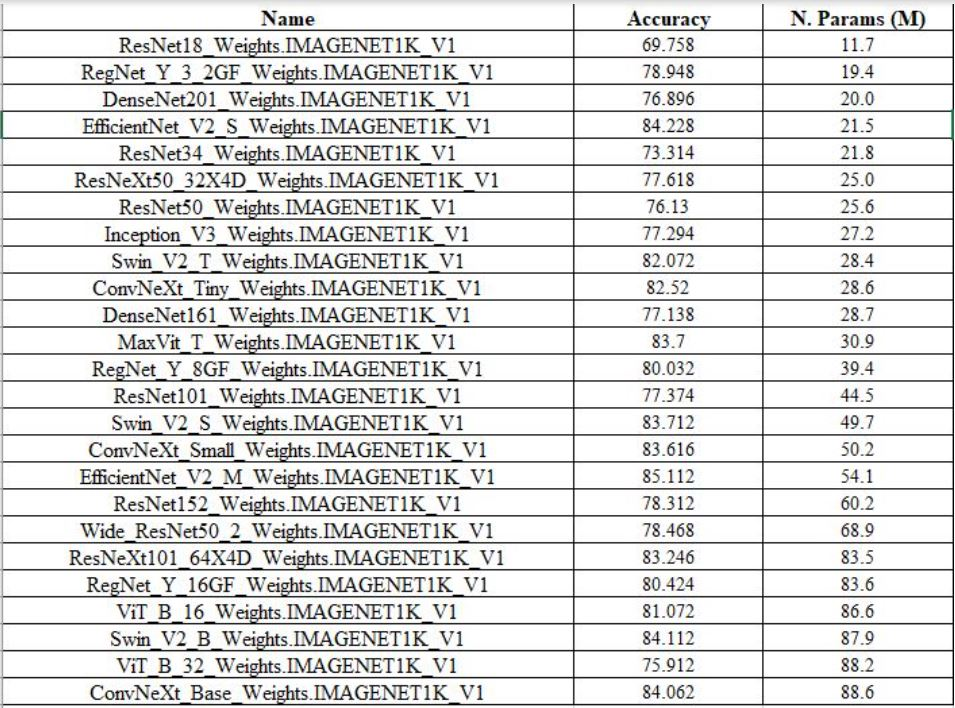

The first idea was tempted were to replicate hinton methodology to find suitable backbone [Hinton, Lecture 10.c dropout].A core component of hinton methodology is finding overfitting. Hinton methodology is the following
1. select a net in increasing order of number of hyperparameter (order of network tested is employed before, for ratio about selected network  see section 7.1.2)
2. train
   if at end of epoch network do not overfit classical hinton methodology stop, select next network in terms of dimension and add dropout. Having now a bunch of regularization technique the idea is to add a regularization technique and see if network no more overfit. in case restart from point one.
   regularization technique employed in order
      1. half batch size (64)
      2. half batch size (32)
      3. standard data augmentation abilitate
      4. reduce wd to 0.001
      5. allow for dropout
      6. allow for batchnorm
   
this approach allow to select "model design hyperparams" simpler at parity of performance as sugested in [123] 

Fixing range of epochs forget possibility of fast overfitting as long as necessitate a high range of epoch. So here overfit patience to spot sign of overfitting is employed (with a patience of 15 epochs) and a maximum of 50 epochs. 
Another factor that is changed here is 

configuration of hyperparameter of this test is:
-  adam 
  is typically faster to converge and request more regularization allowing to spot fast overfitting 
- lr

some work [4] sugest that low lr reduce overfit so here decide to start with very high leranrning rate(0.01)
- pretrain
  
  on imagenet given is configuration it will be used
- data augmentation, dato che funzionano come regularization e rallentano li sopprimiamo temporanemente
- regularization method

initially all suppressed
- 128 batch size

  this avoid regularization effect of small batch size
- betas standard 
 
  given this parameter help convergence but do not influence overfit
- wd = 0.00001
  
  very low given it is a regularization strategy



obviusly this process were repeated for real and product domain however **no network show clear sign of overfitting** so author have decided to select highest parameters network in list and do a simple grid search with standard parameters to select best backbone (see next sections)


In [179]:
find_overfitting = partial(non_da_train, 
                          pretrained=True, 
                          optimizer="adam",
                          lr = 0.01,
                          wd= 0,
                          optimizer_params=[0.9, 0.999, 1e-08],
                          batch_size= 128, 
                          epochs= 2, 
                          accumulation_steps = 10,
                          patience = OverfitPatience(patience=15),
                          save_best=False
                          )

note that this tests were not executed deterministically to improve performances

##### For P

In [180]:
if ALL_CODE:
    model: str="regnet_32gf"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

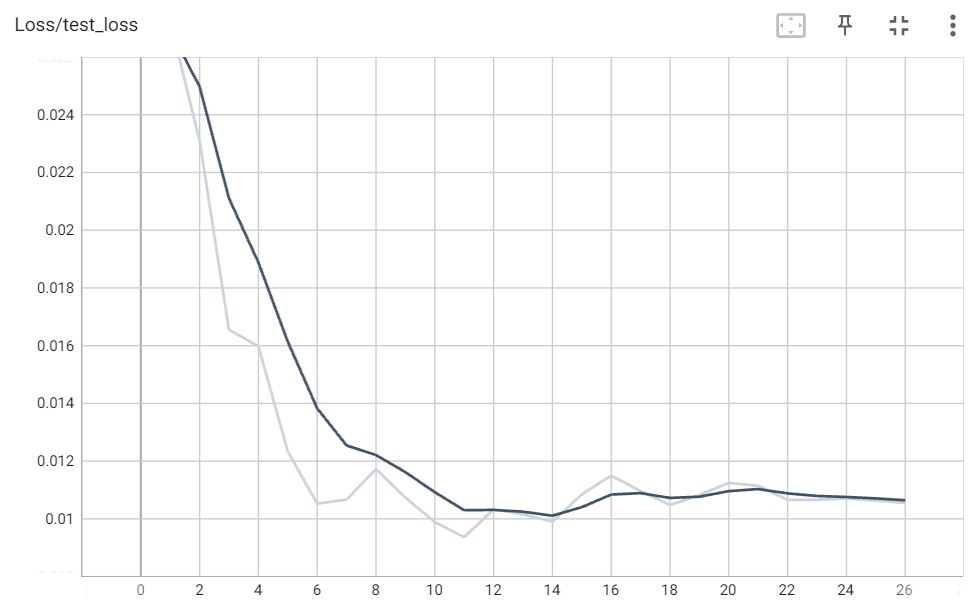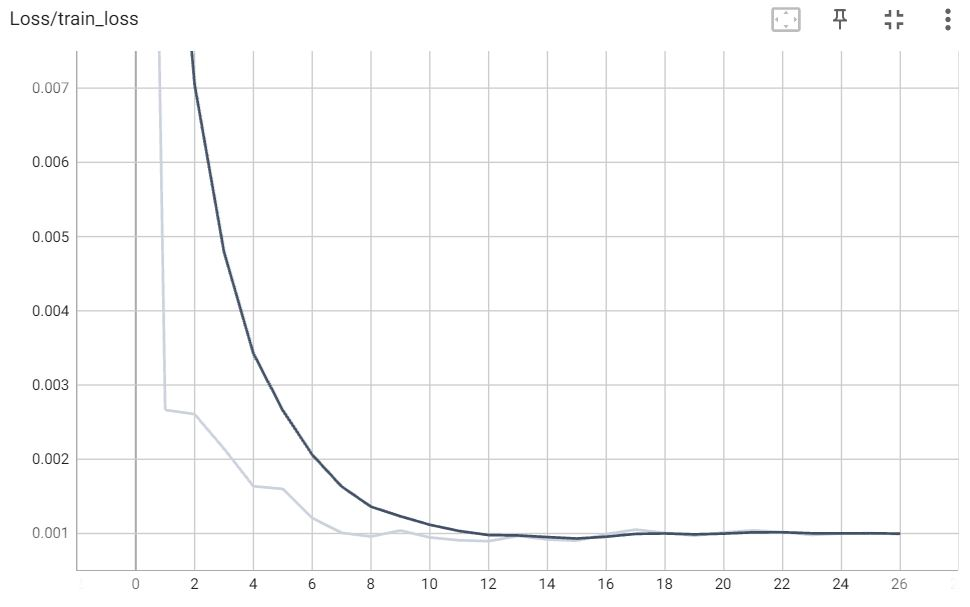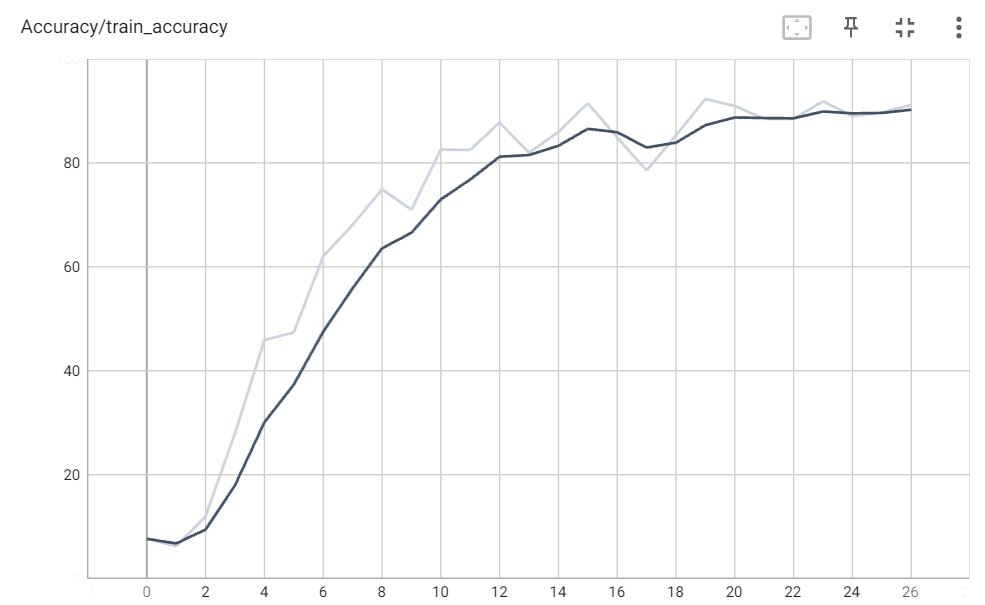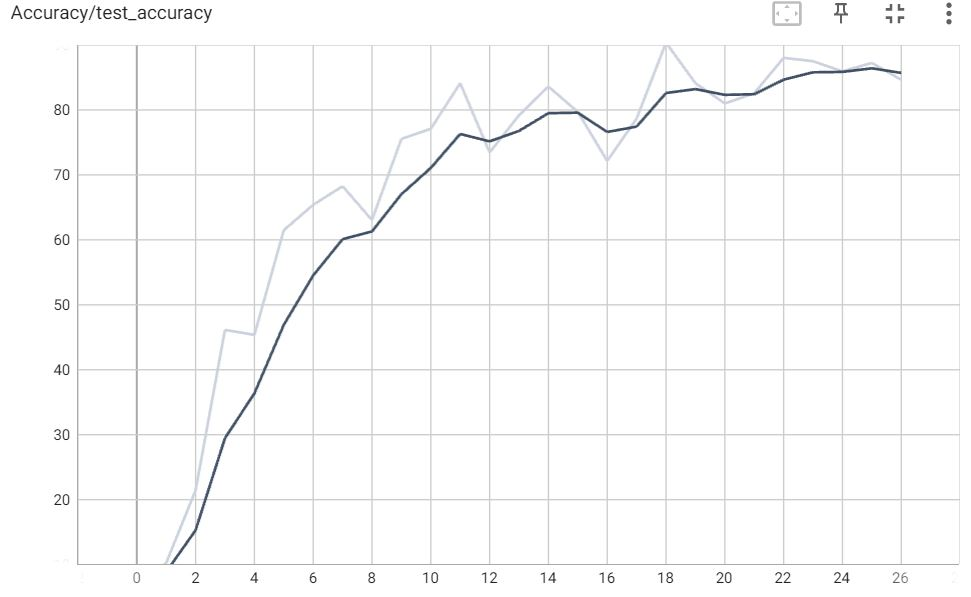

In [181]:
if ALL_CODE:
    model: str = "densenet_201"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

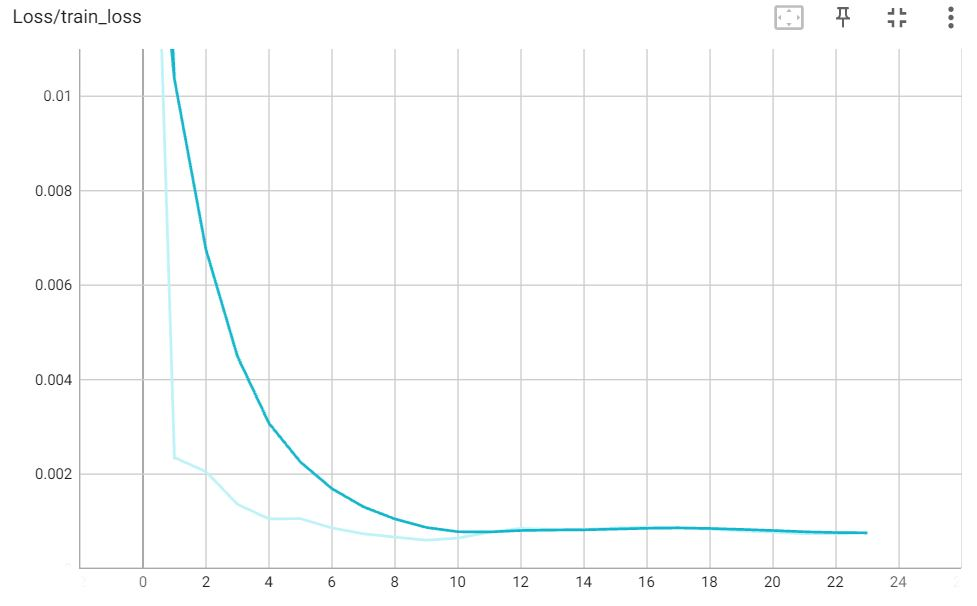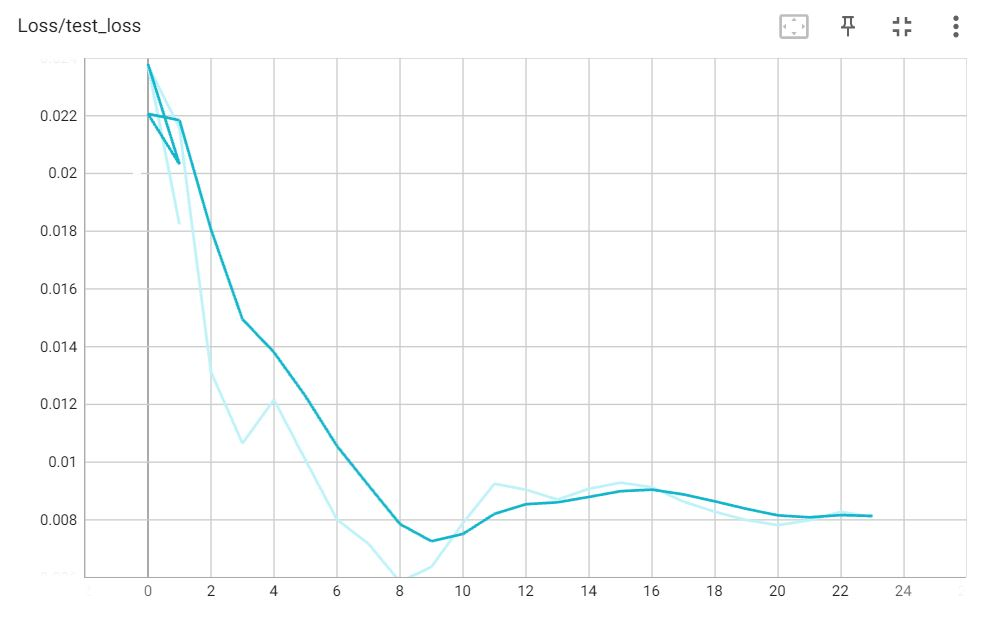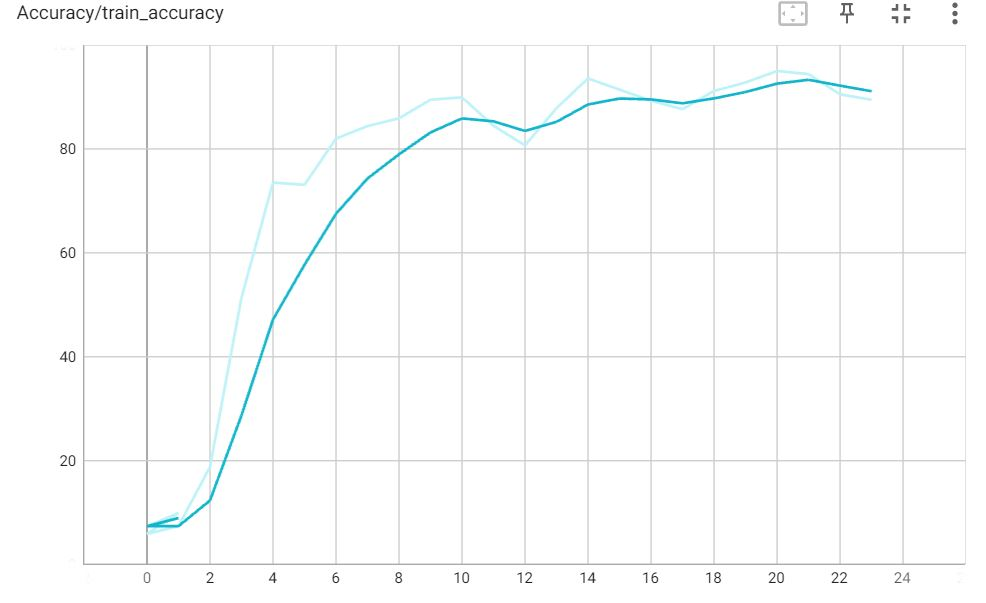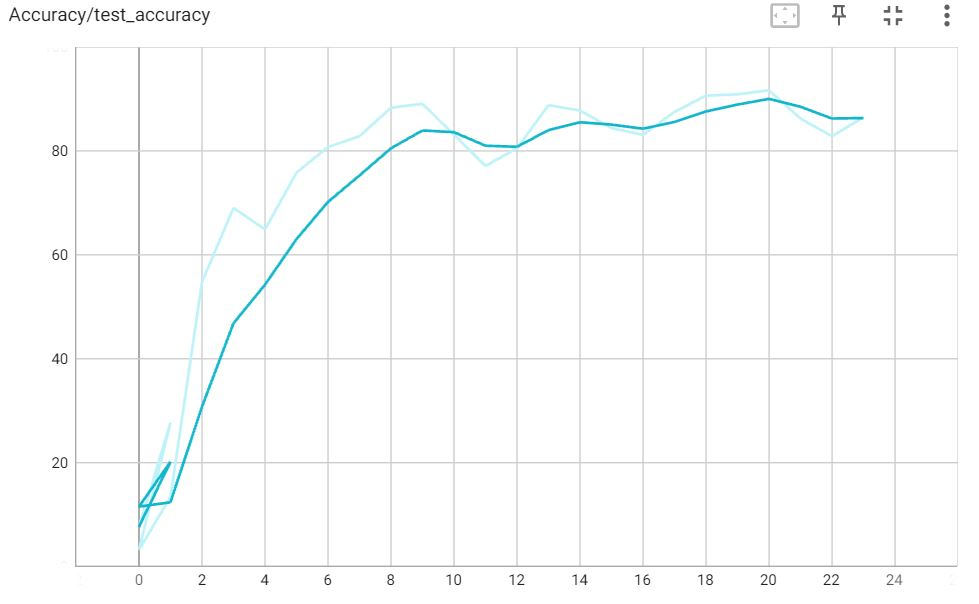

In [182]:
if ALL_CODE:
    model: str = "efficientnet_S"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

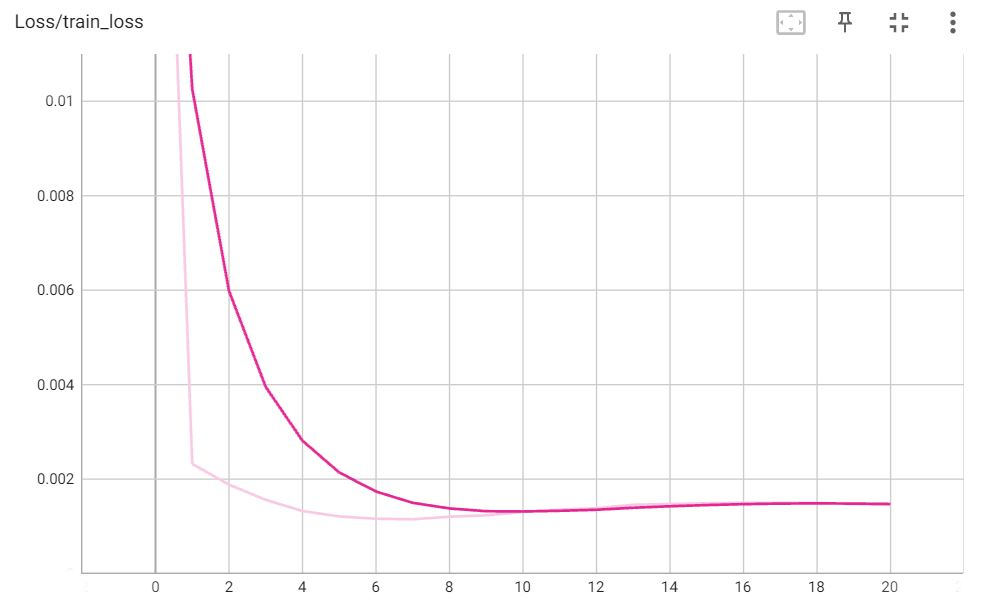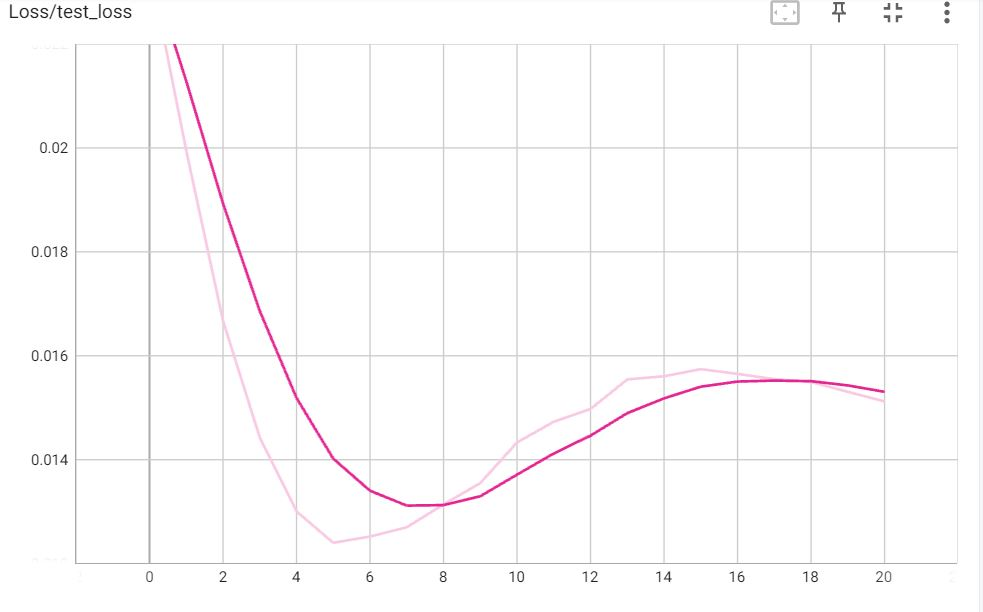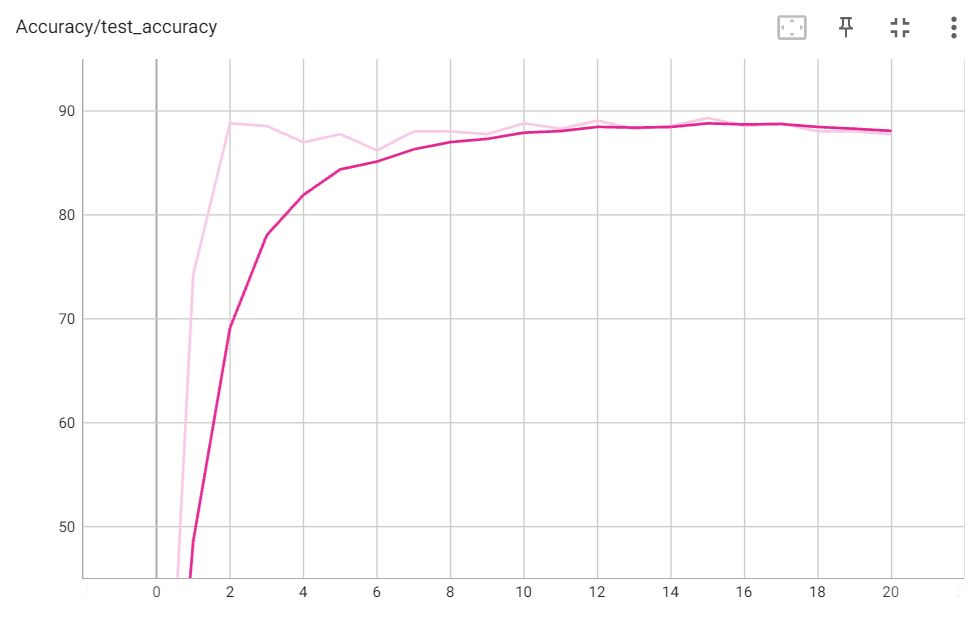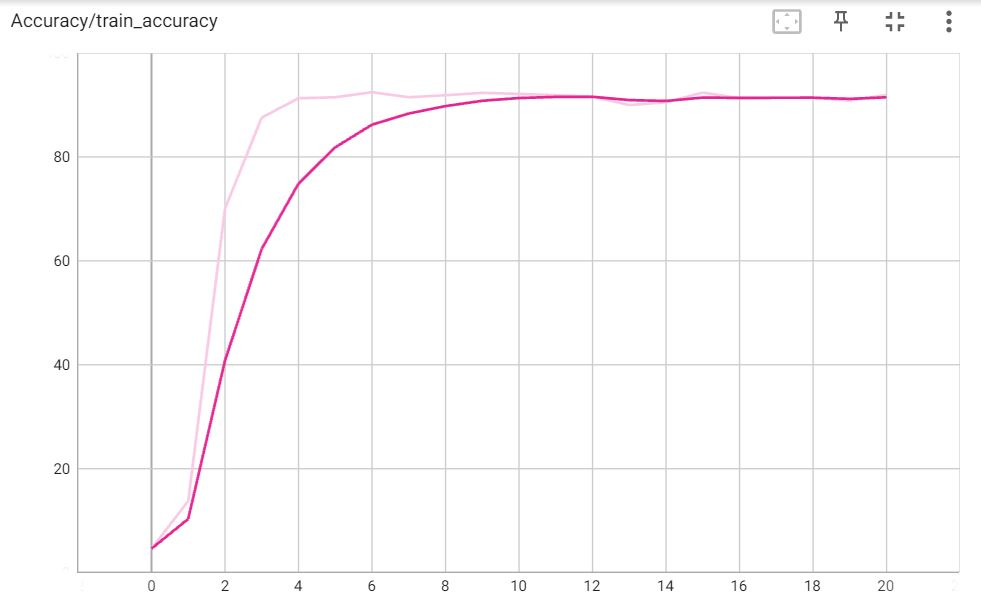

In [183]:
if ALL_CODE:
    model: str = "resnet_34"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

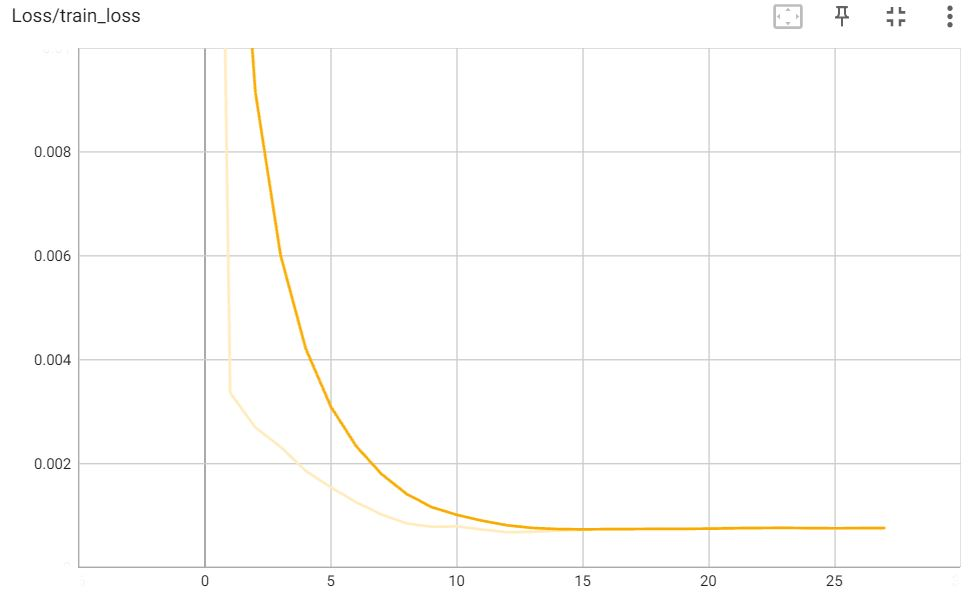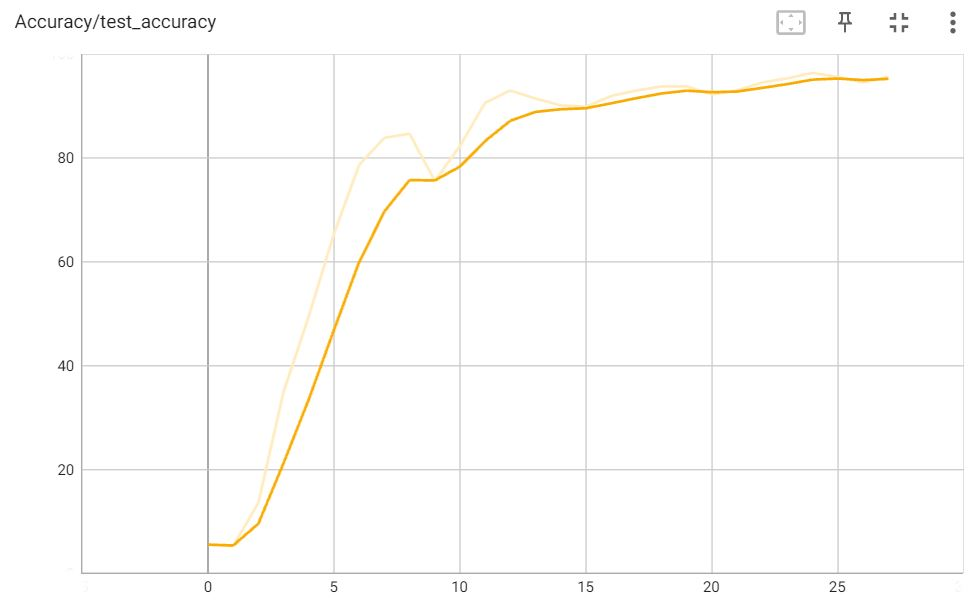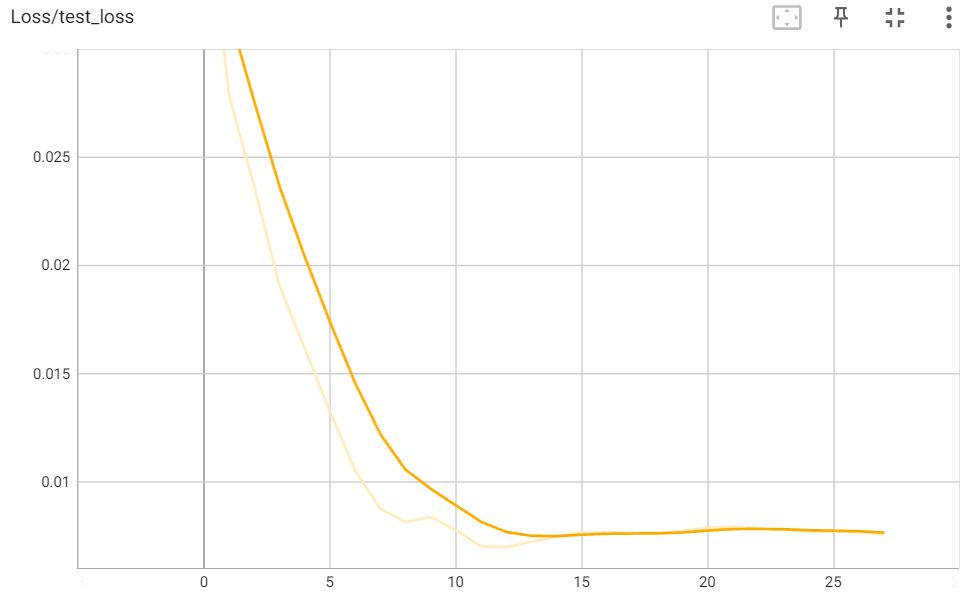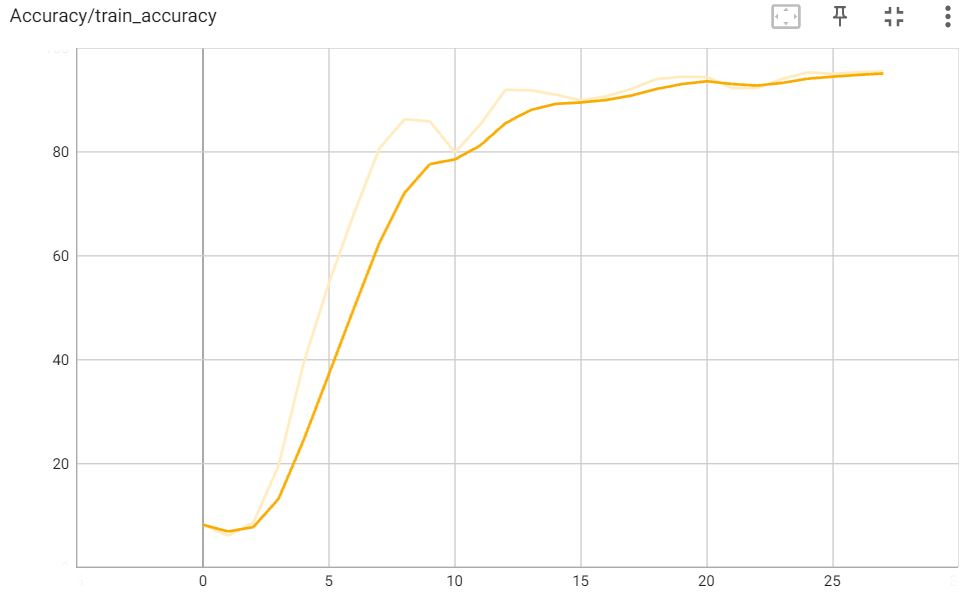

In [184]:
if ALL_CODE:
    model: str = "resnext_50"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

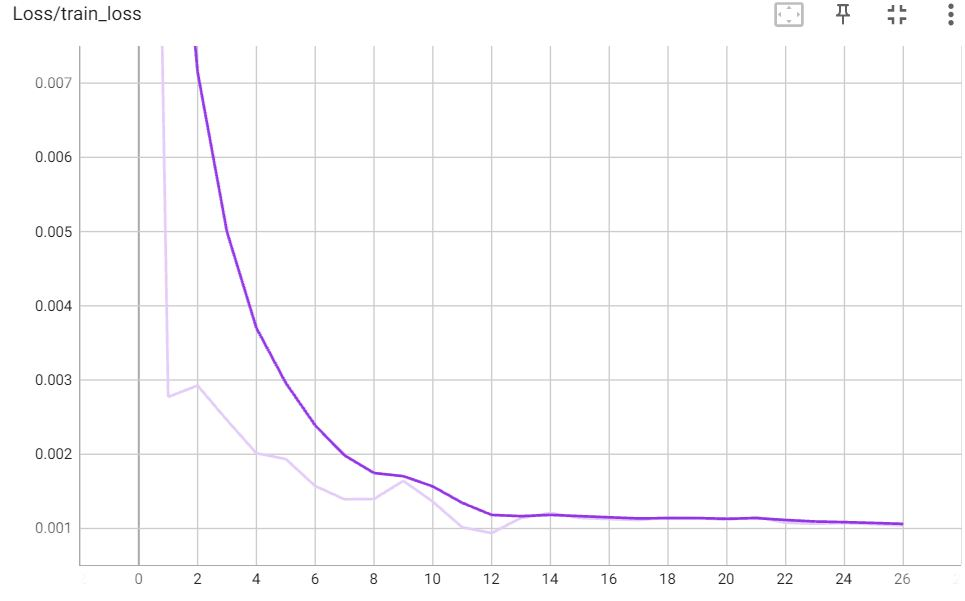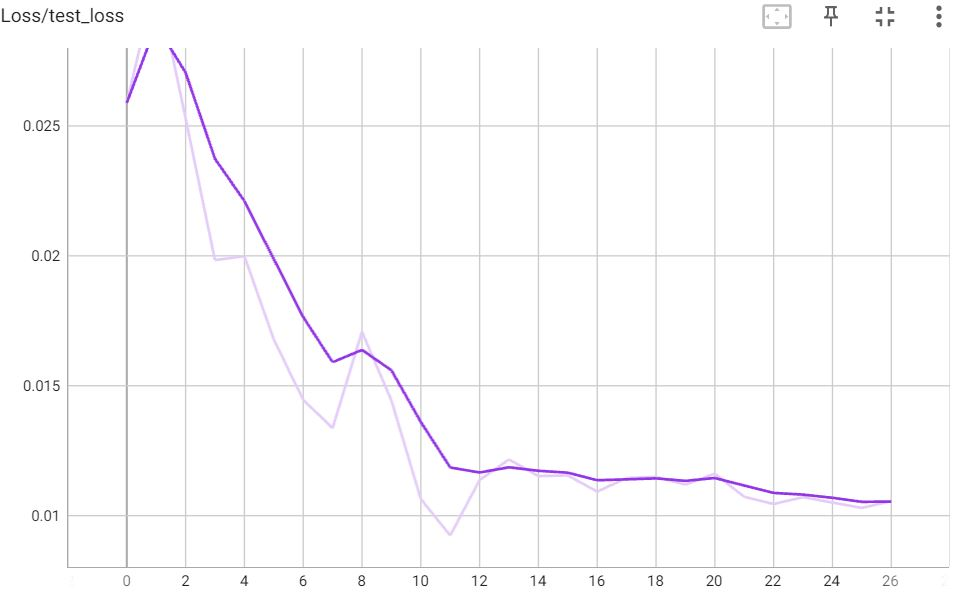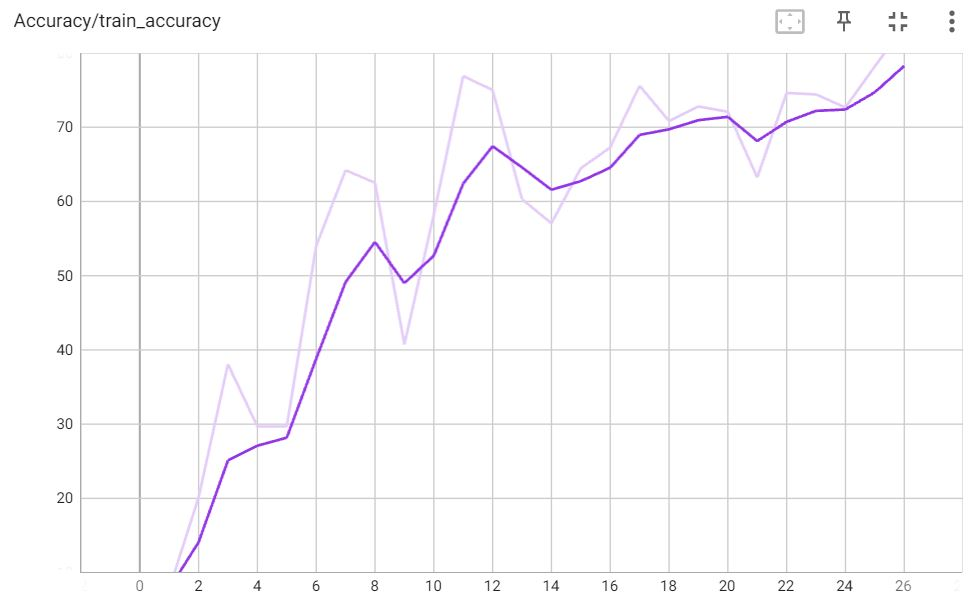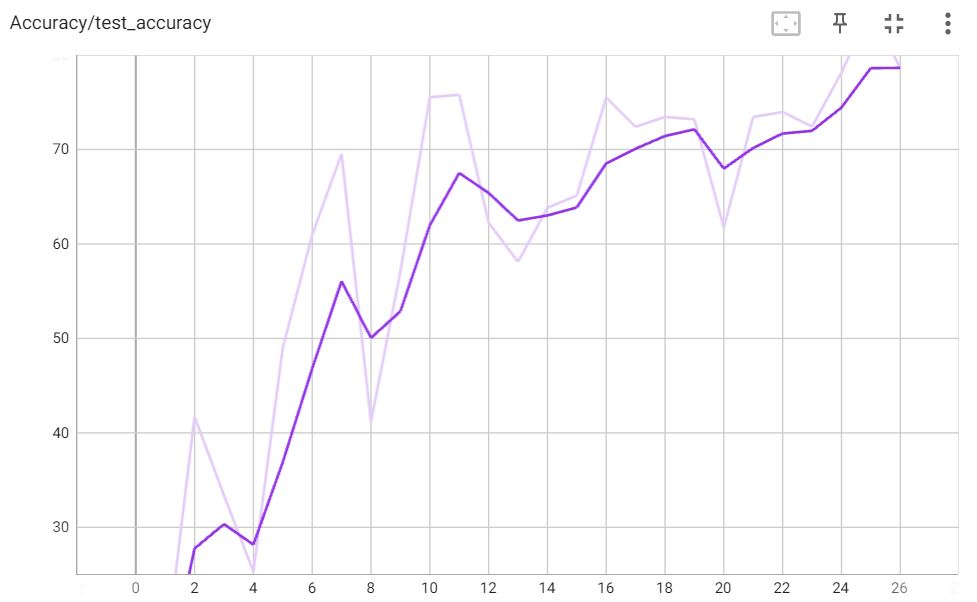

In [185]:
if ALL_CODE:
    model: str = "resnet_50"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

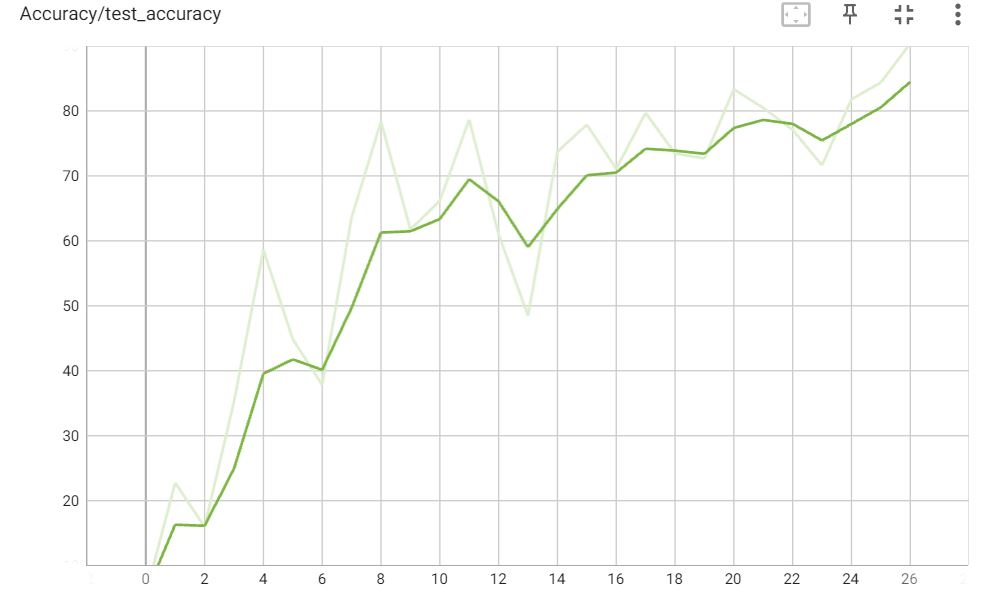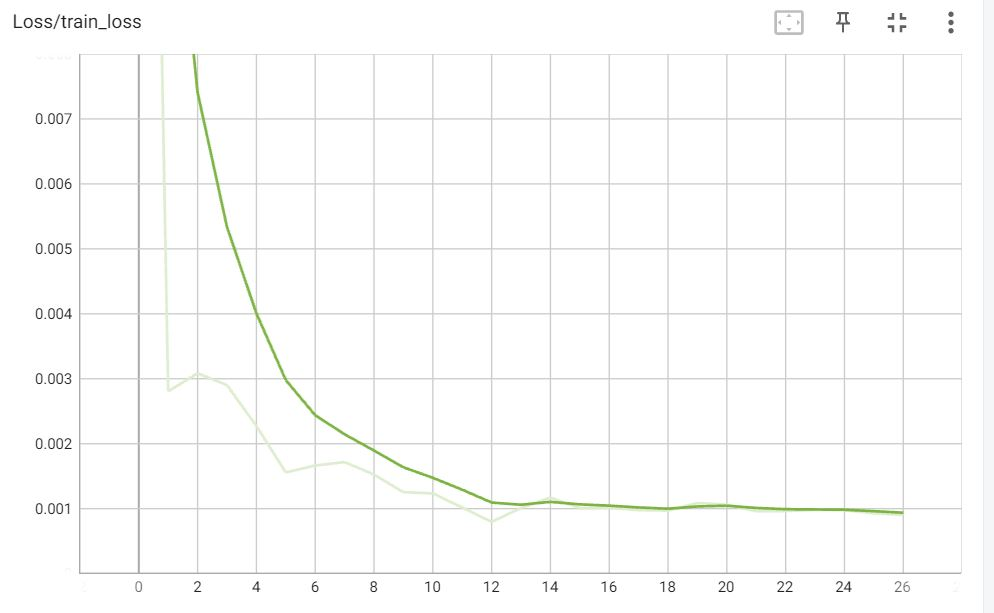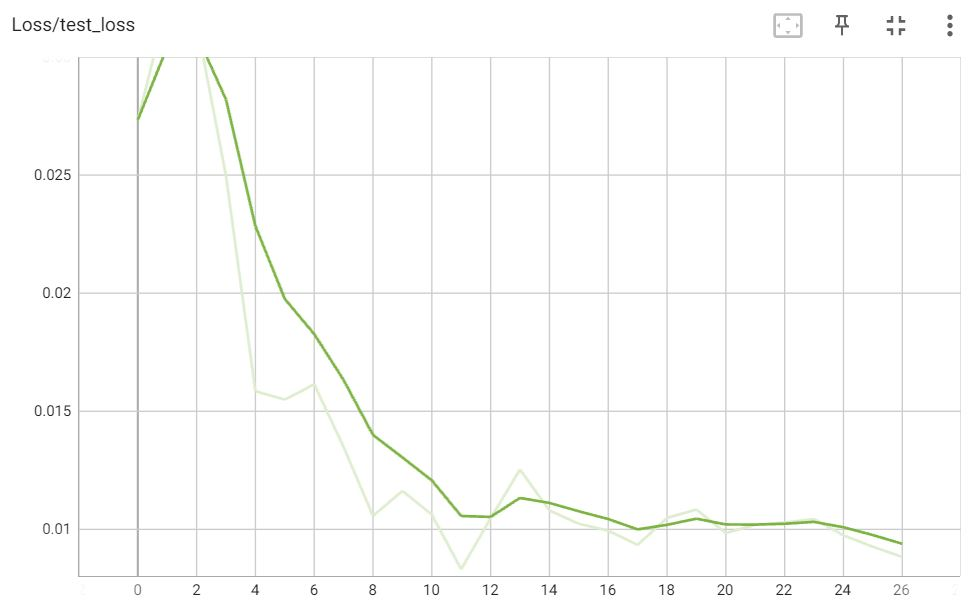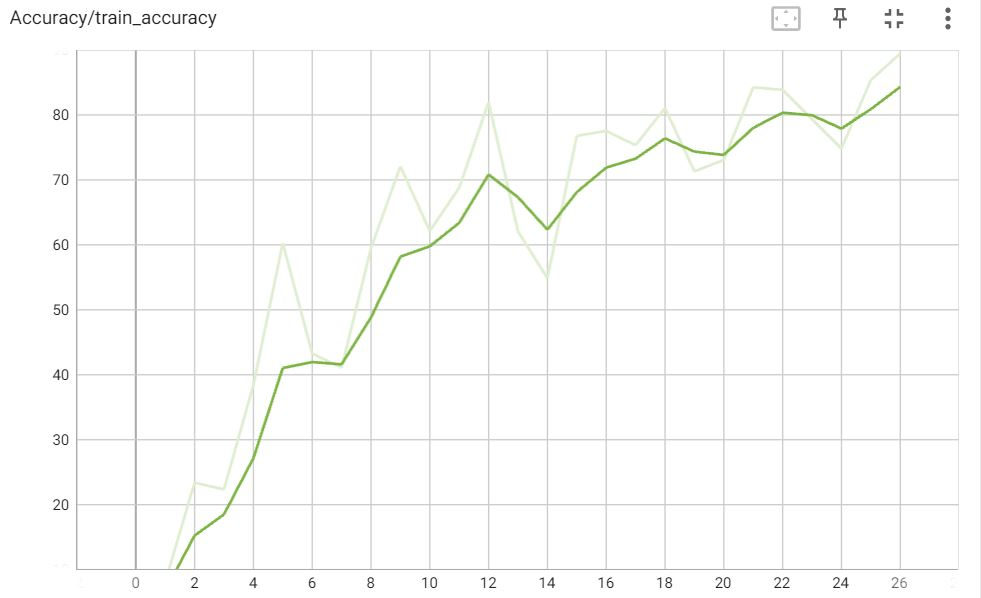

In [186]:
if ALL_CODE:
    model: str = "inceptionet"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

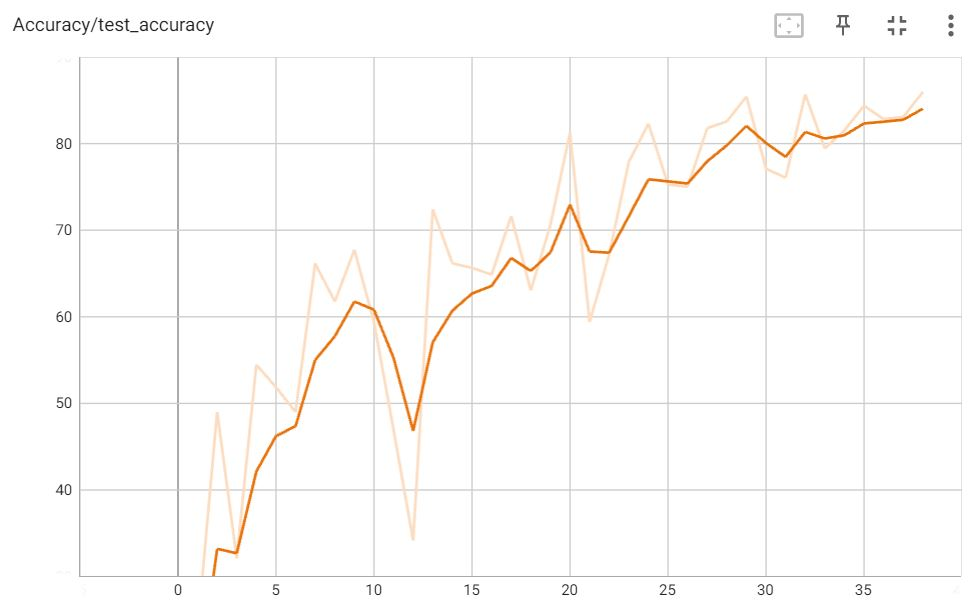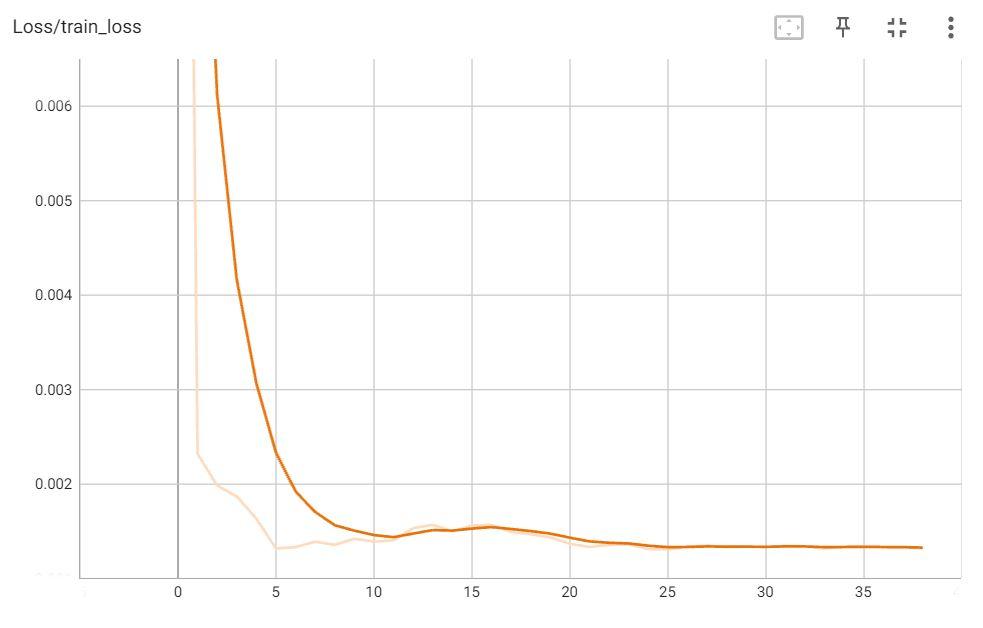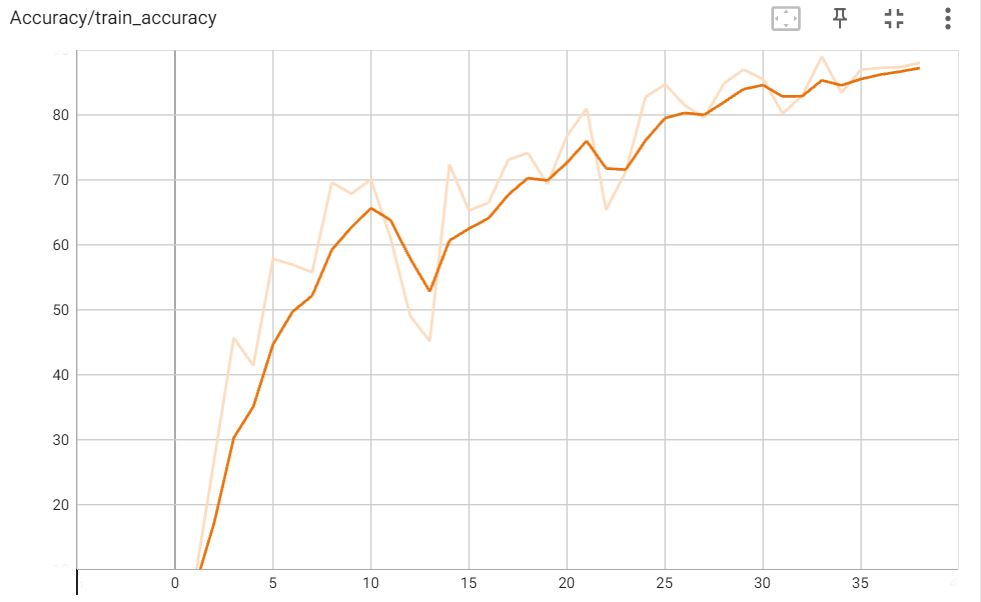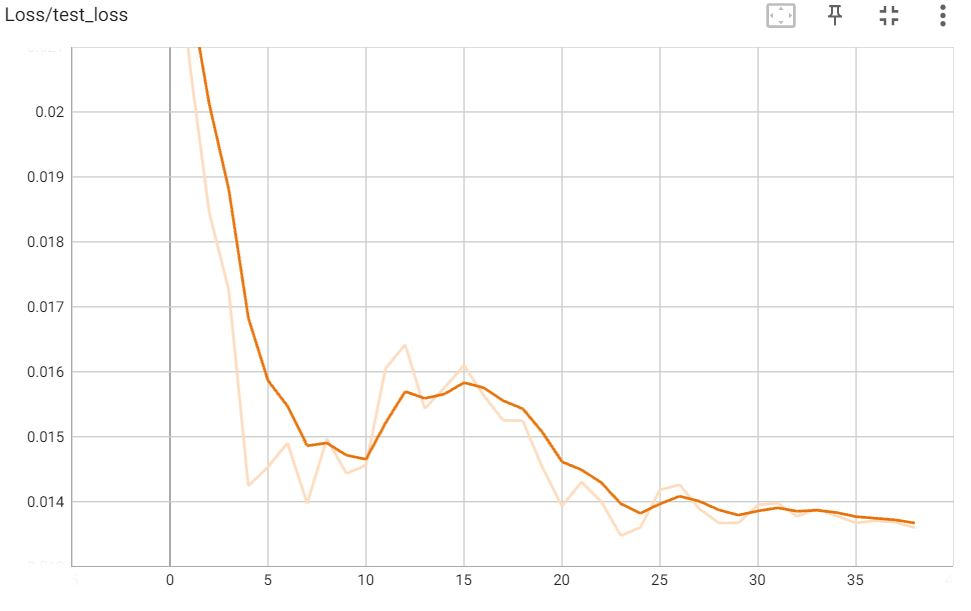

In [187]:
if ALL_CODE:
    model: str = "convnext_tiny"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

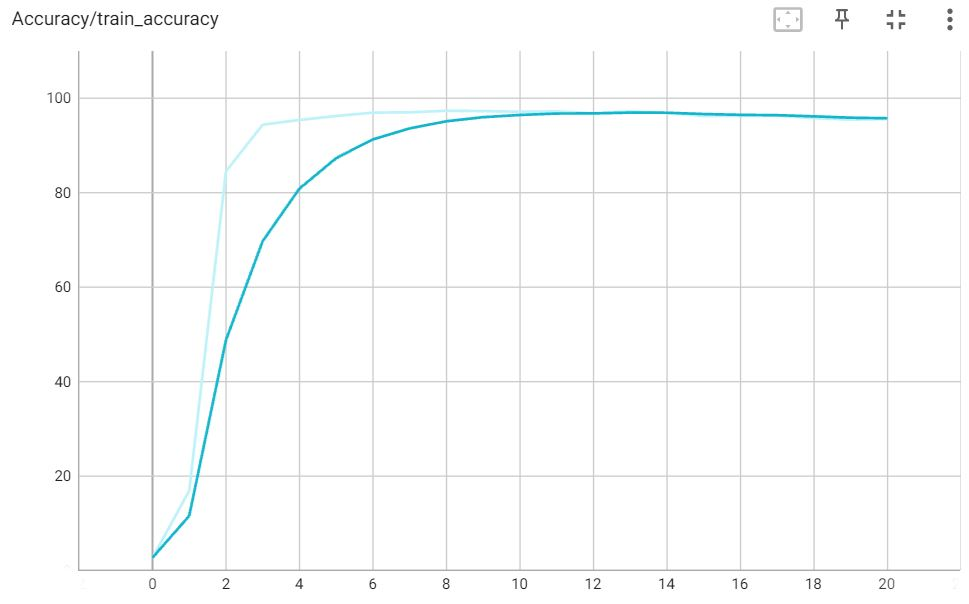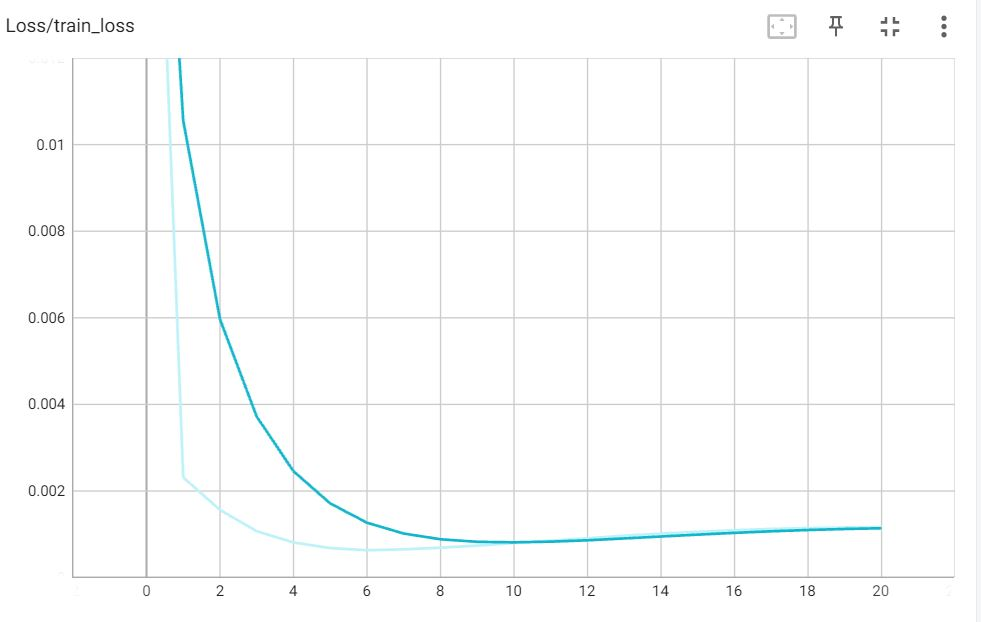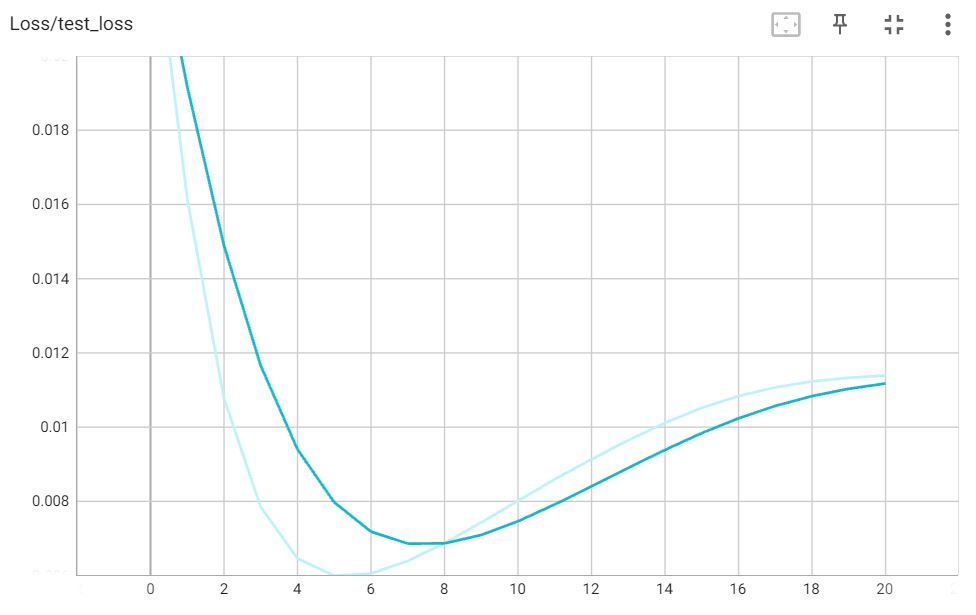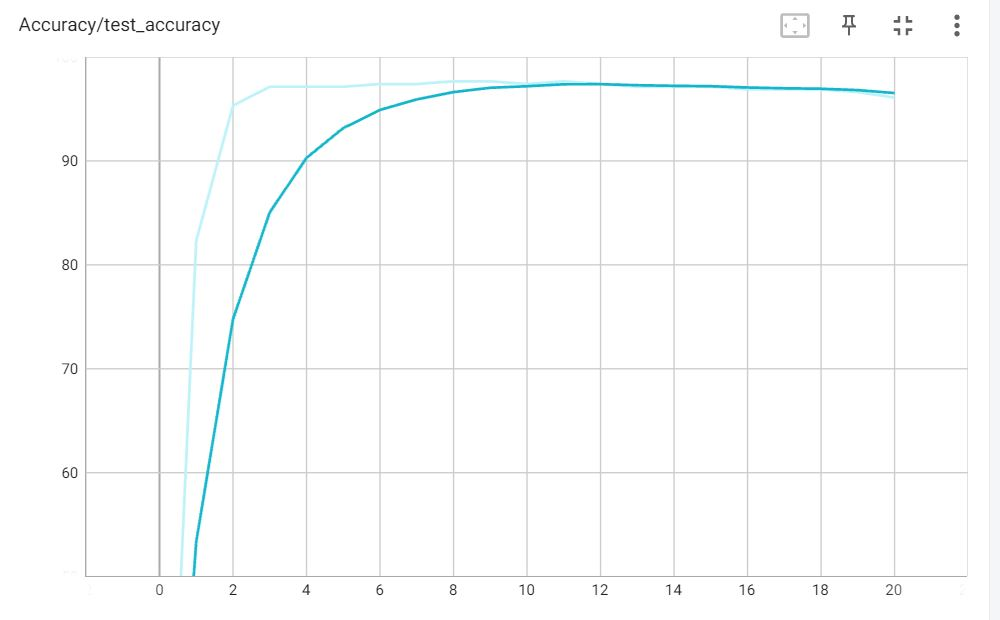

In [188]:
if ALL_CODE:
    model: str = "densenet_161"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

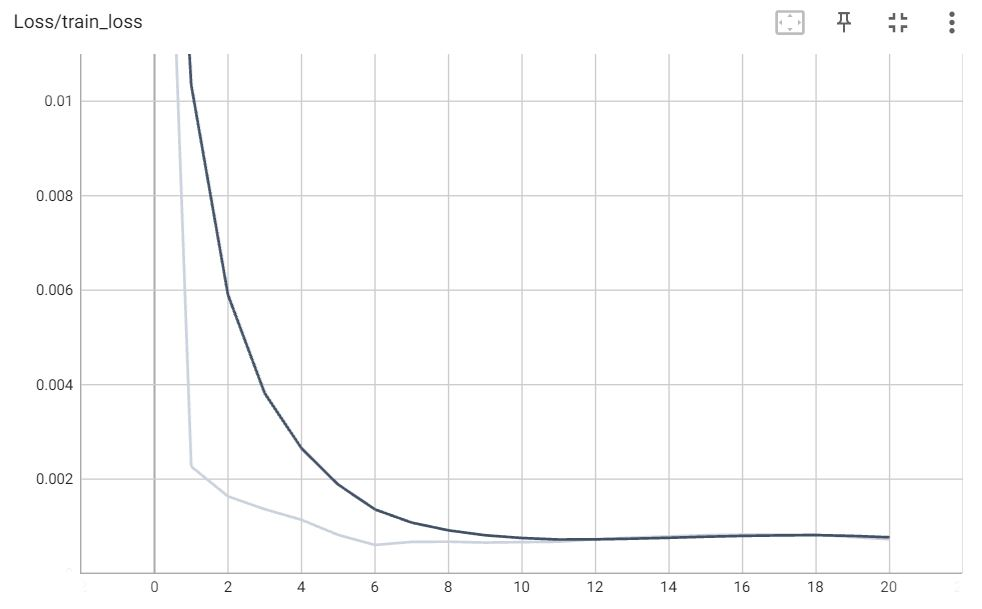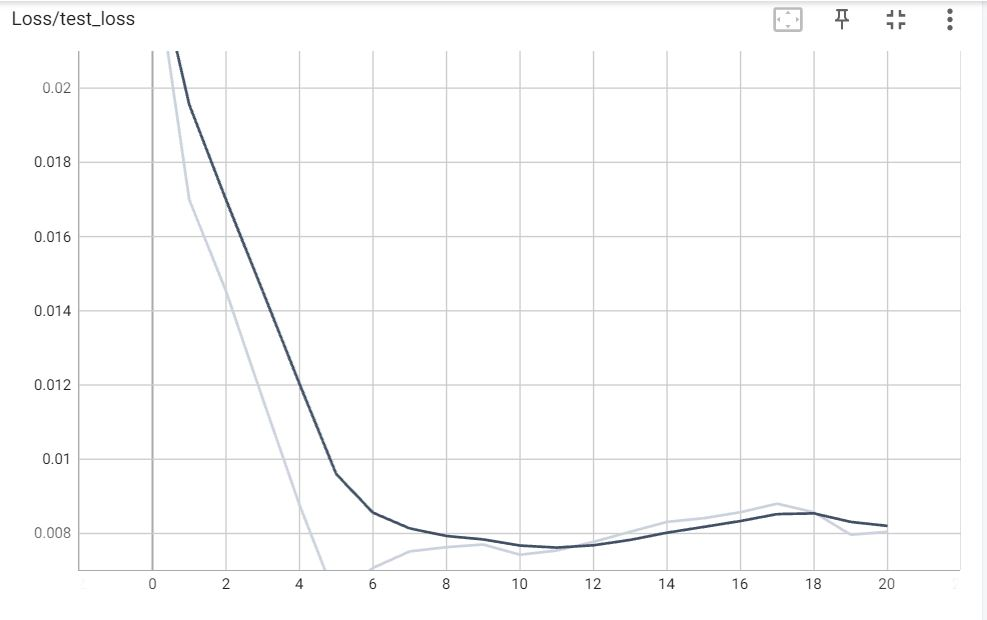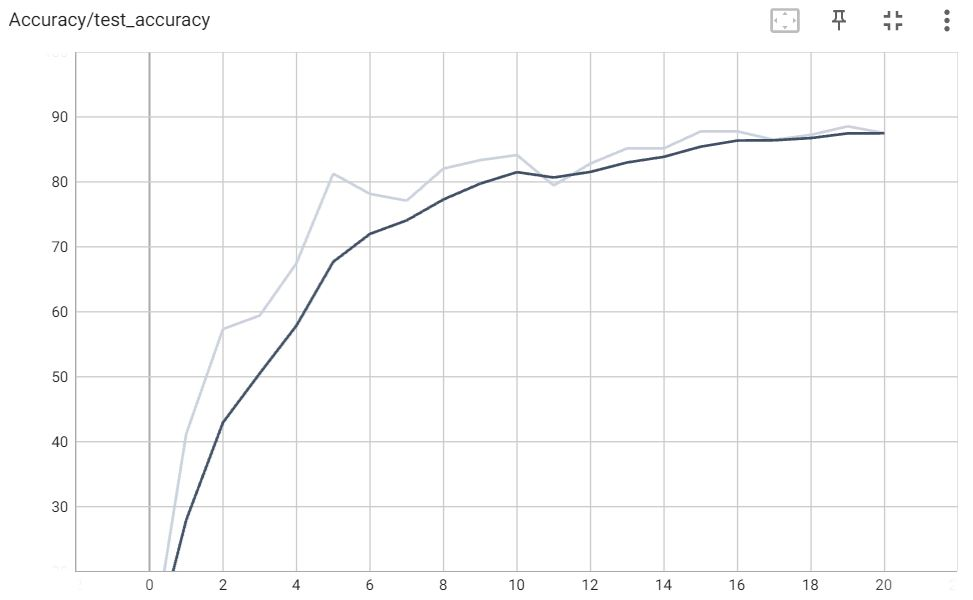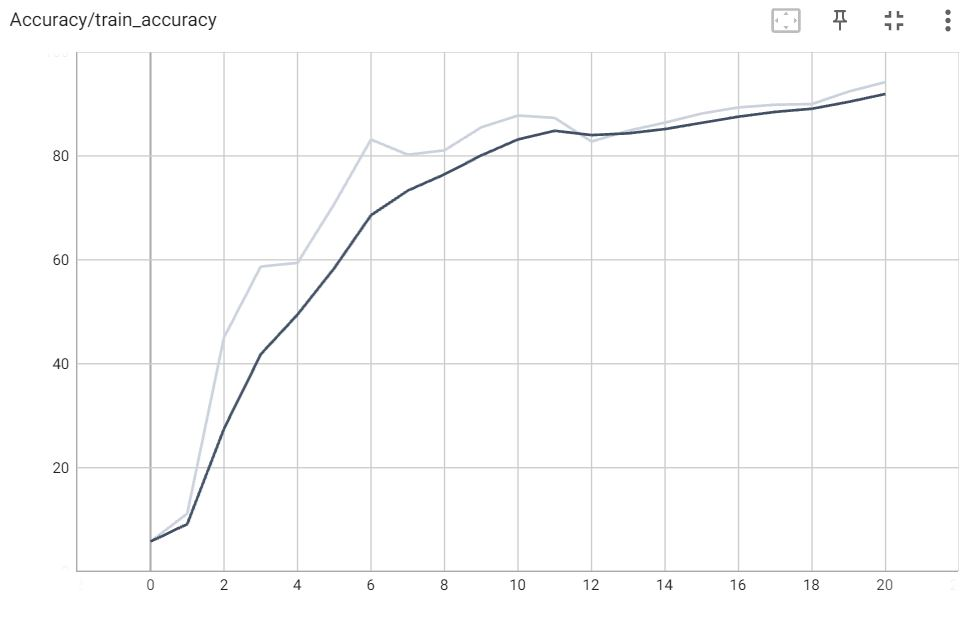

In [189]:
if ALL_CODE:
    model: str = "regnet_8gf"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

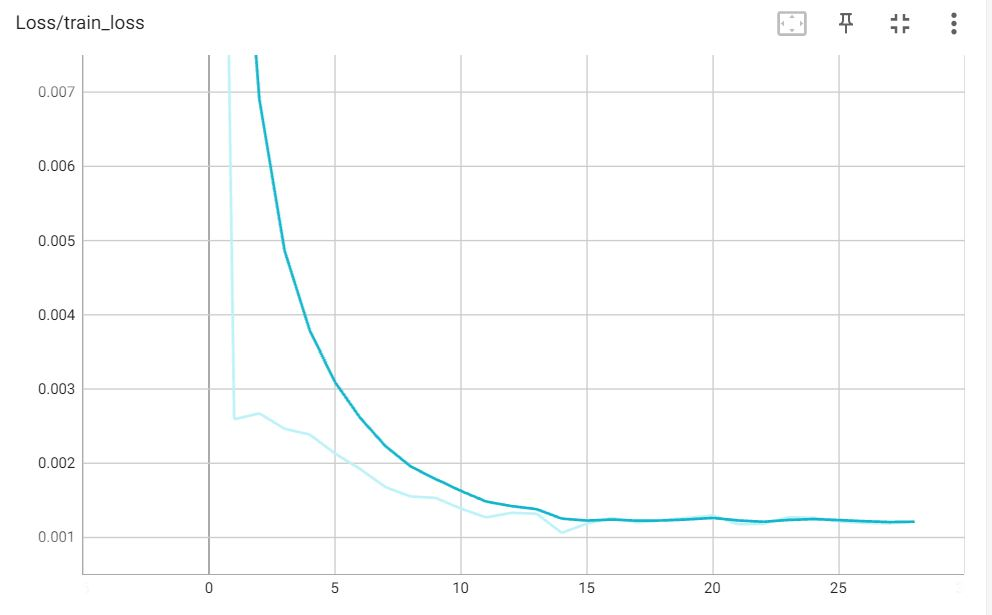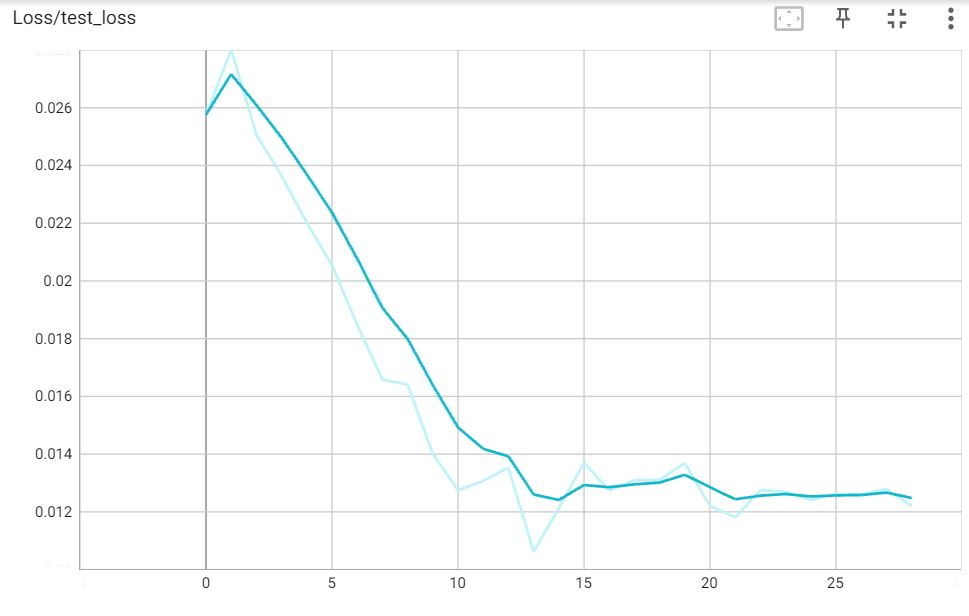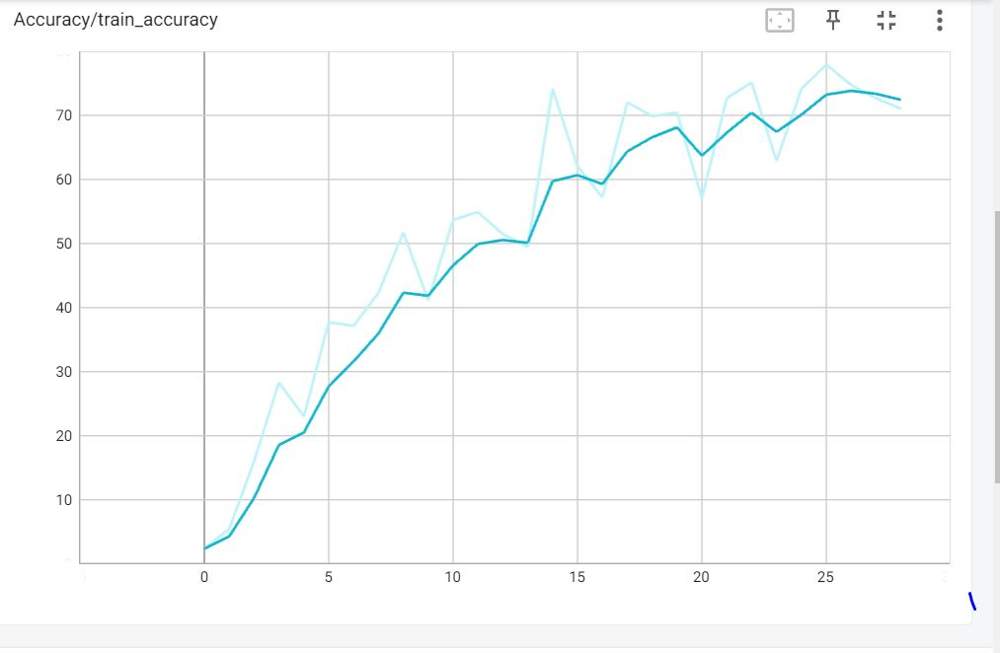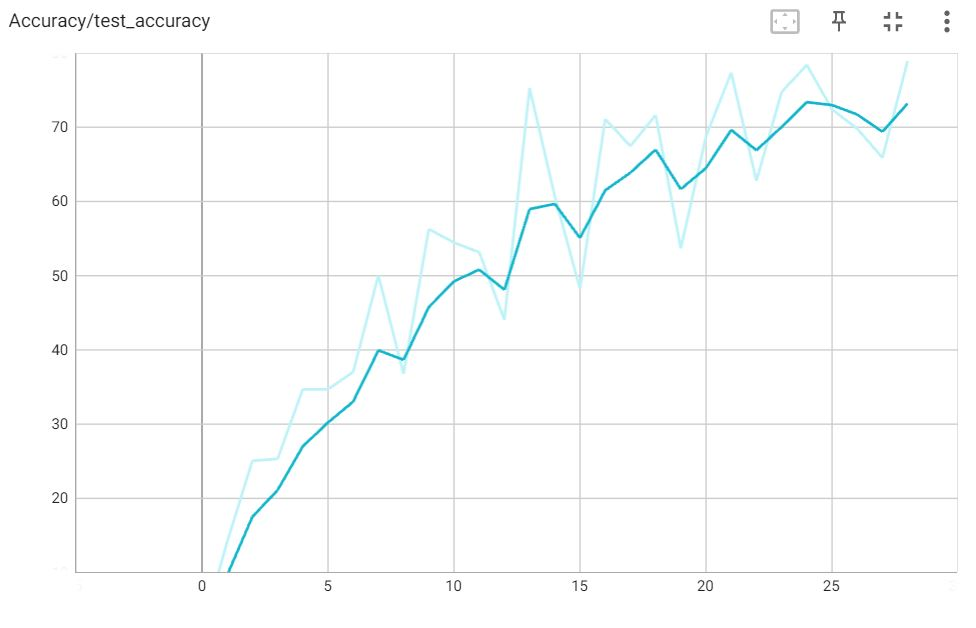

In [190]:
if ALL_CODE:
    model: str = "resnet_101"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

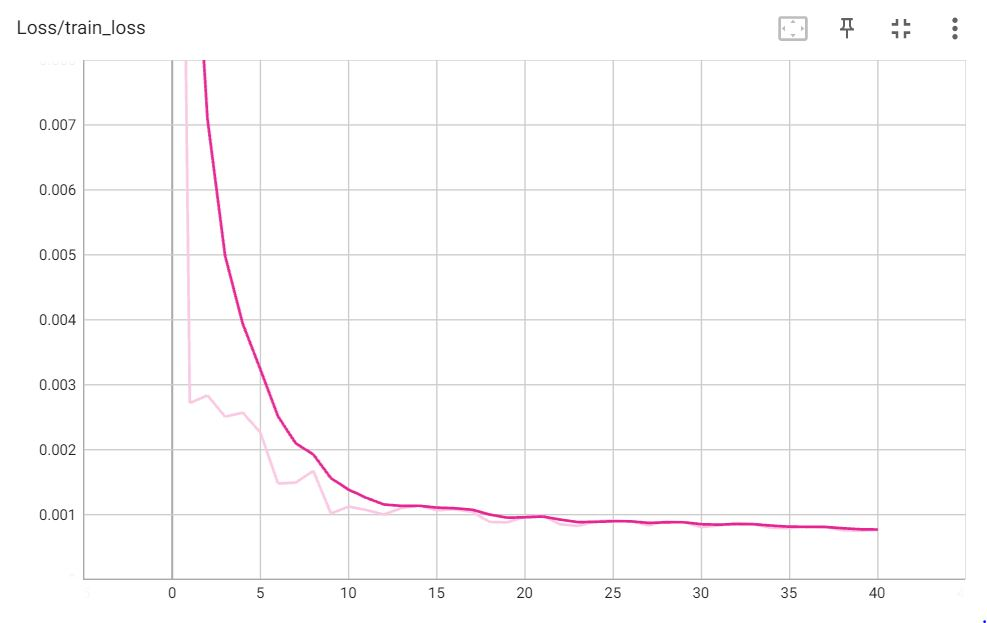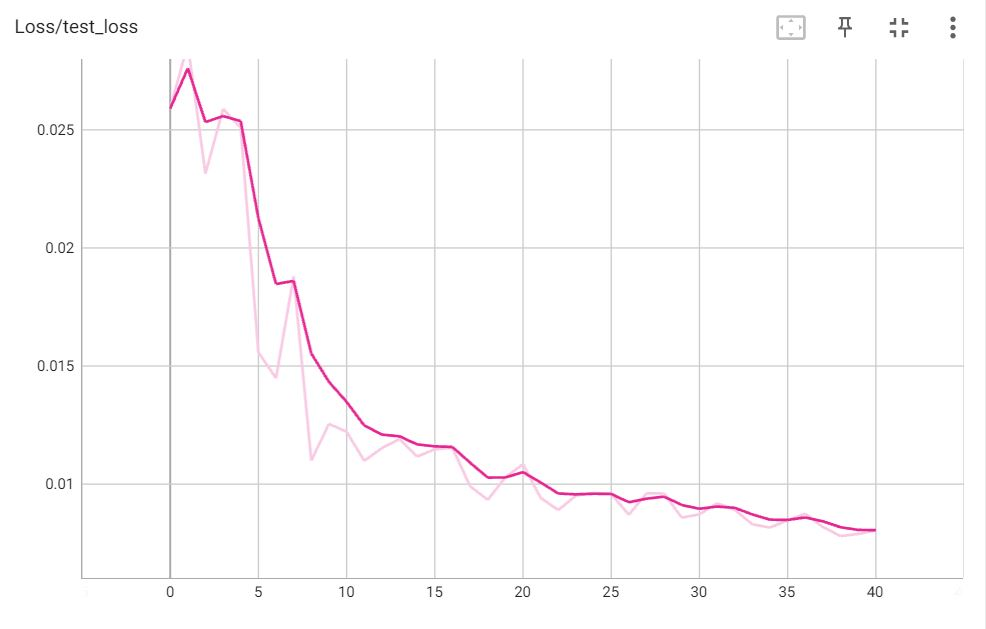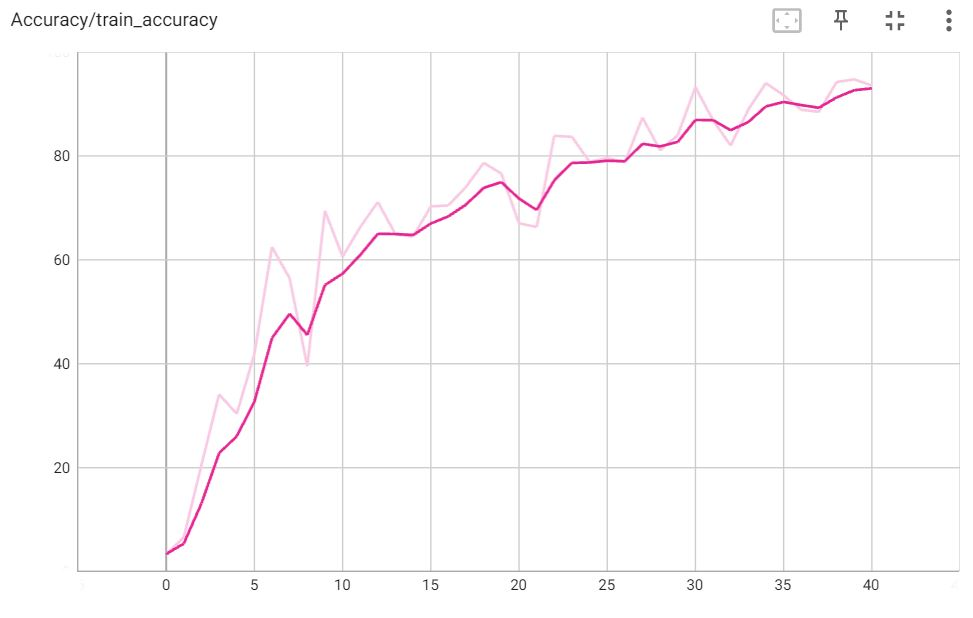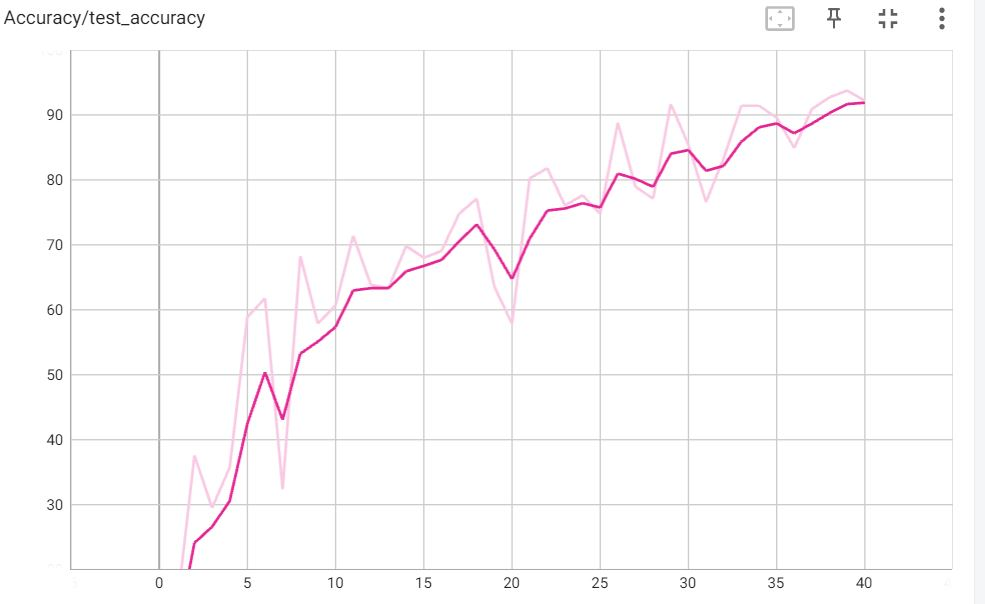

In [191]:
if ALL_CODE:
    model: str = "convnext_small"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

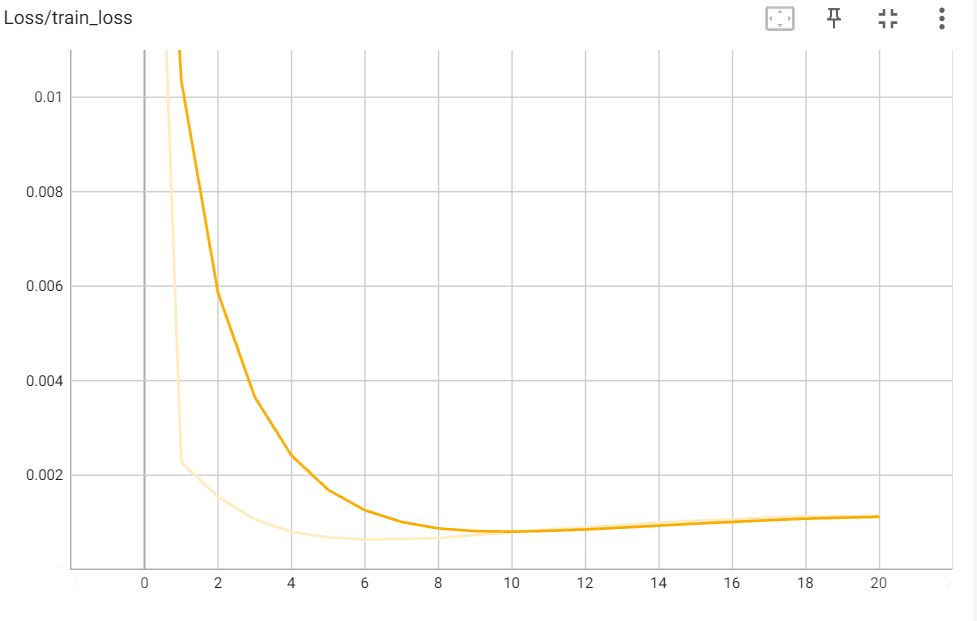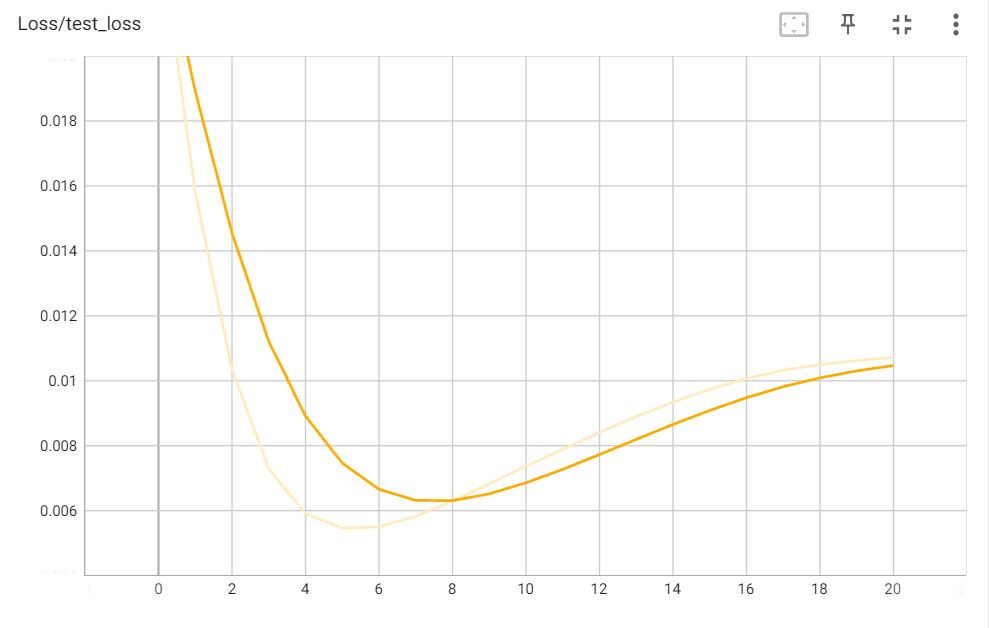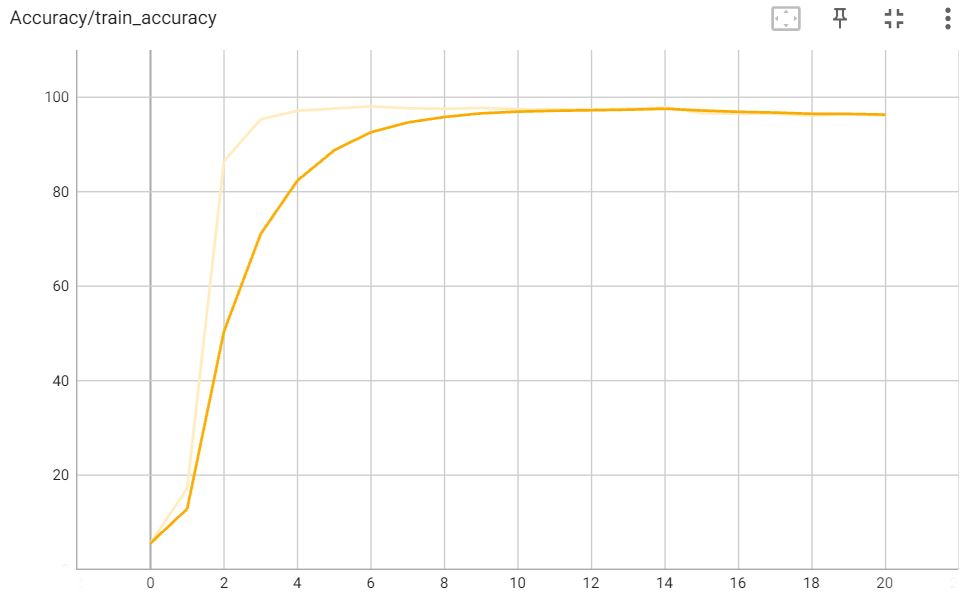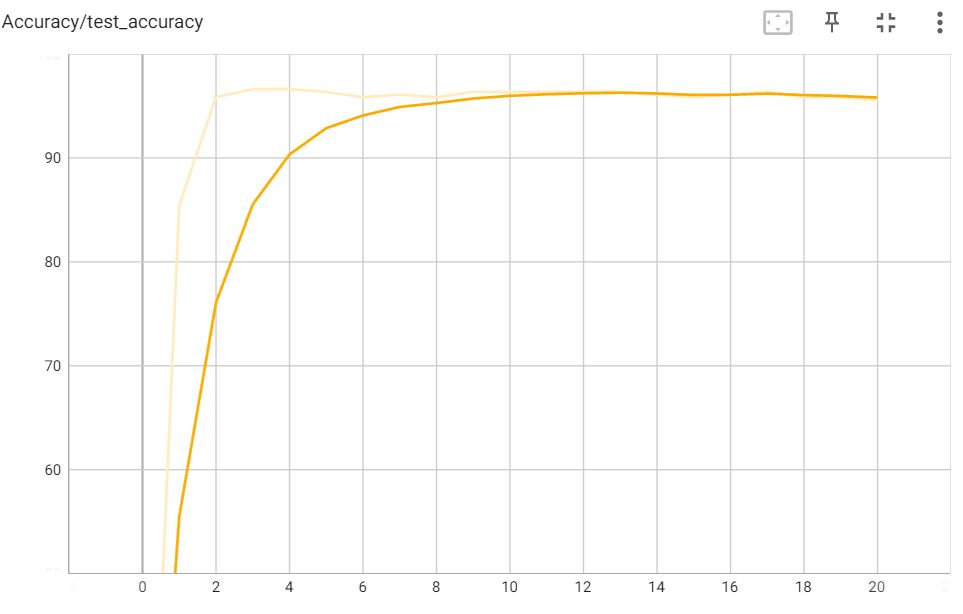

In [192]:
if ALL_CODE:
    model: str = "efficientnet_M"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

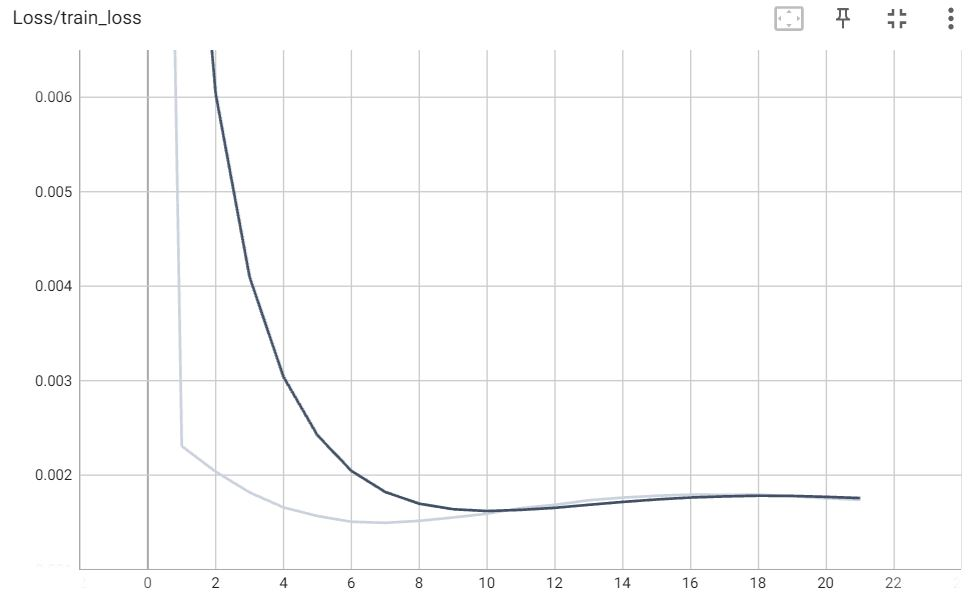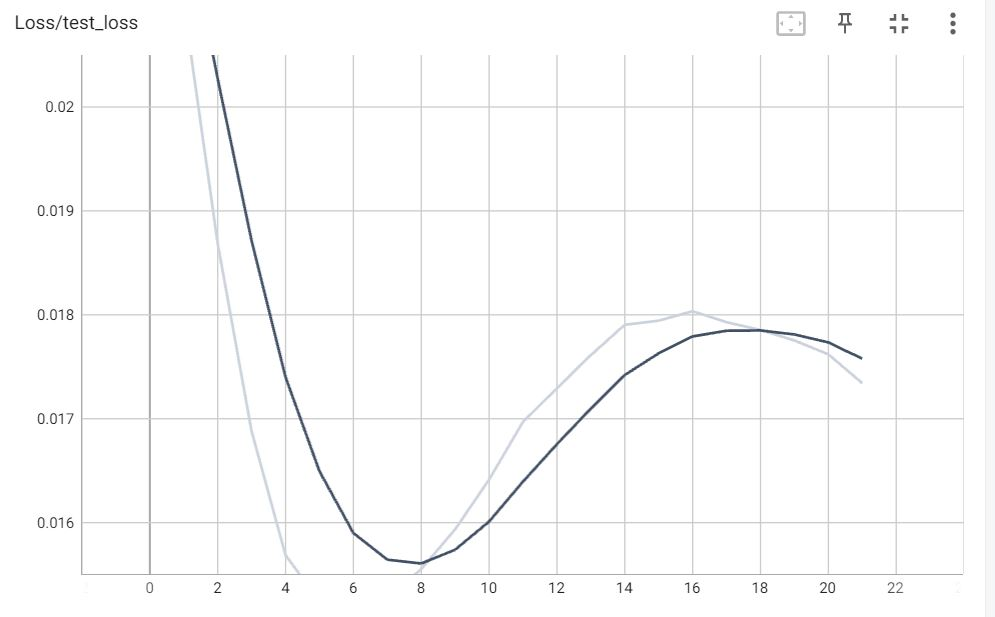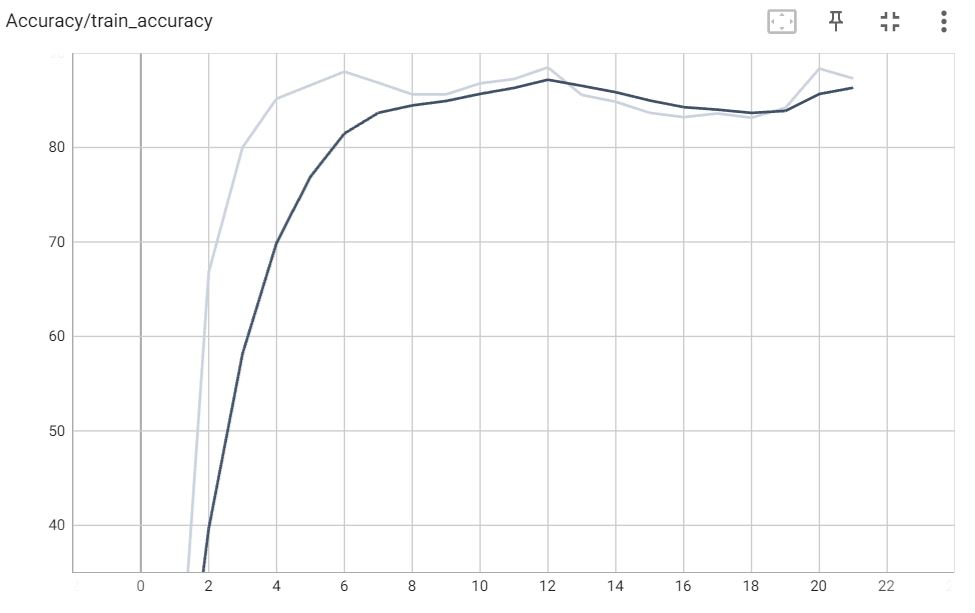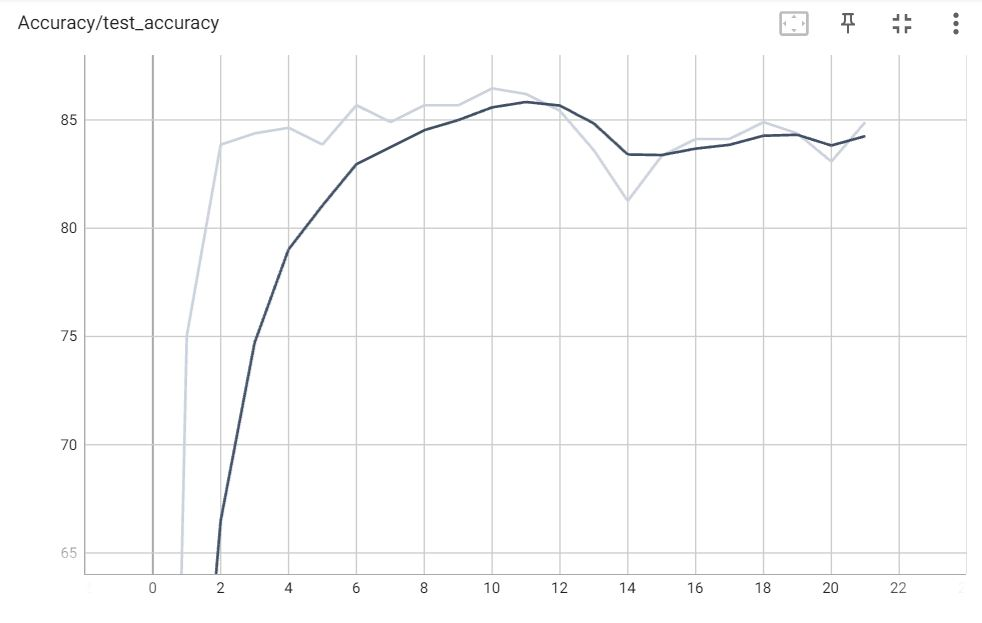

In [193]:
if ALL_CODE:
    model: str = "resnet_152"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

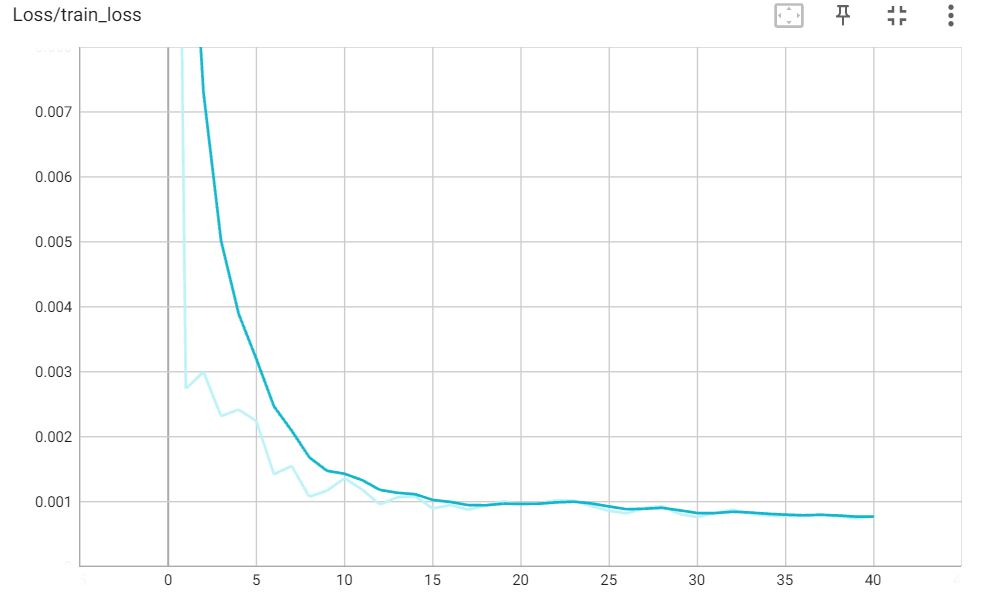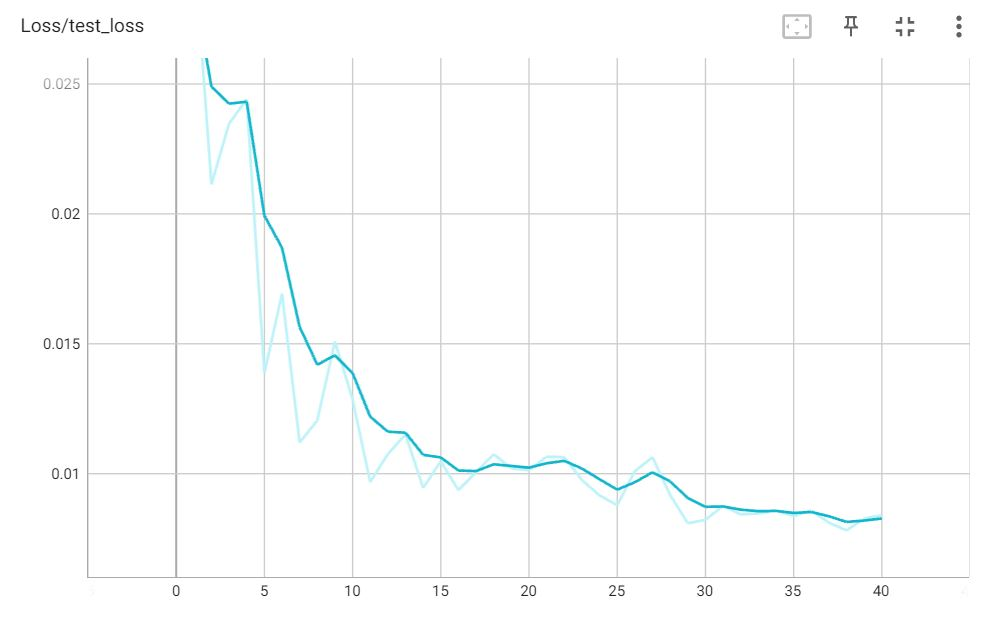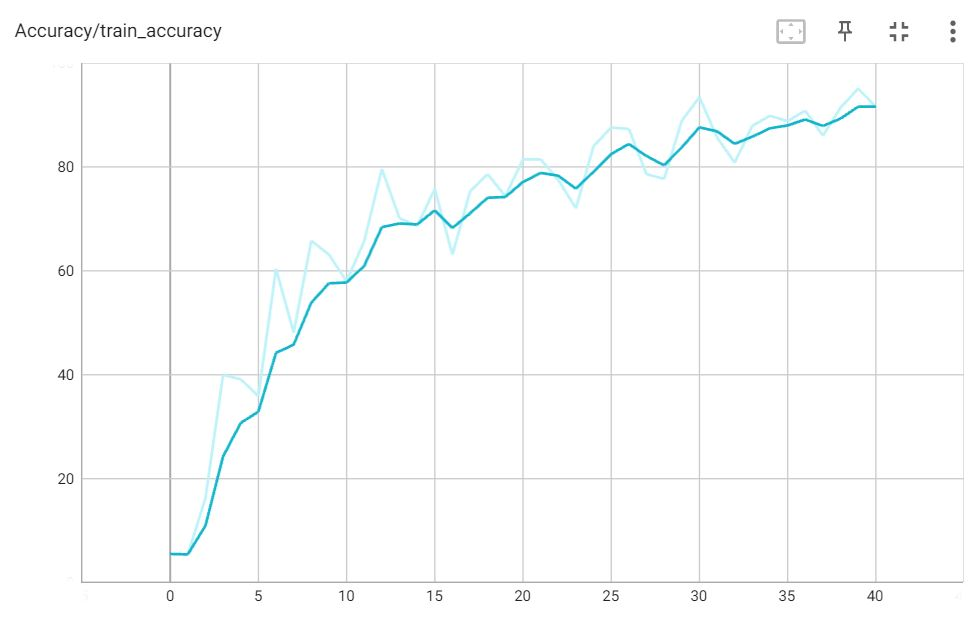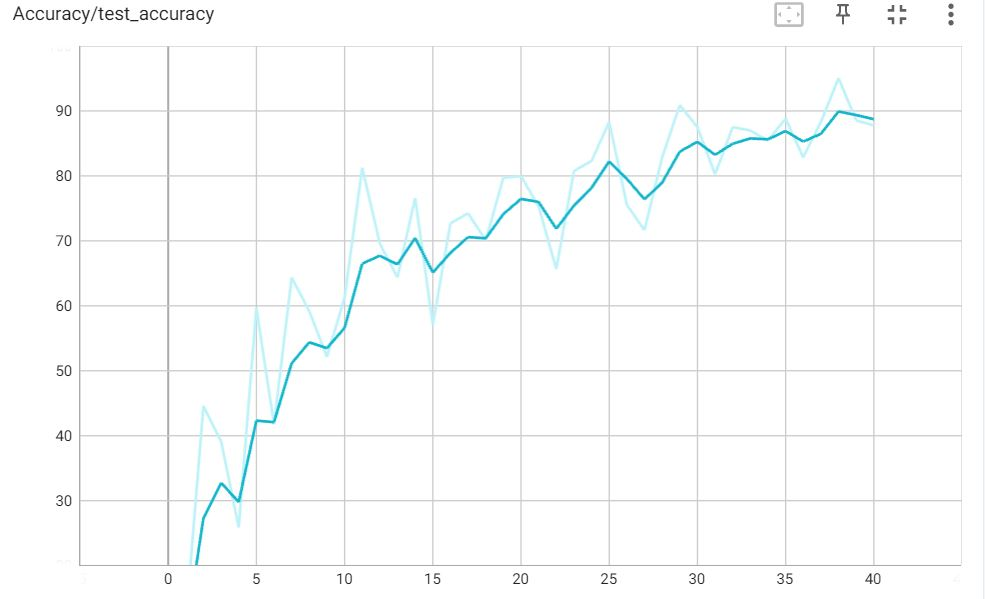

In [194]:
if ALL_CODE:
    model: str = "wideresnet_50"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

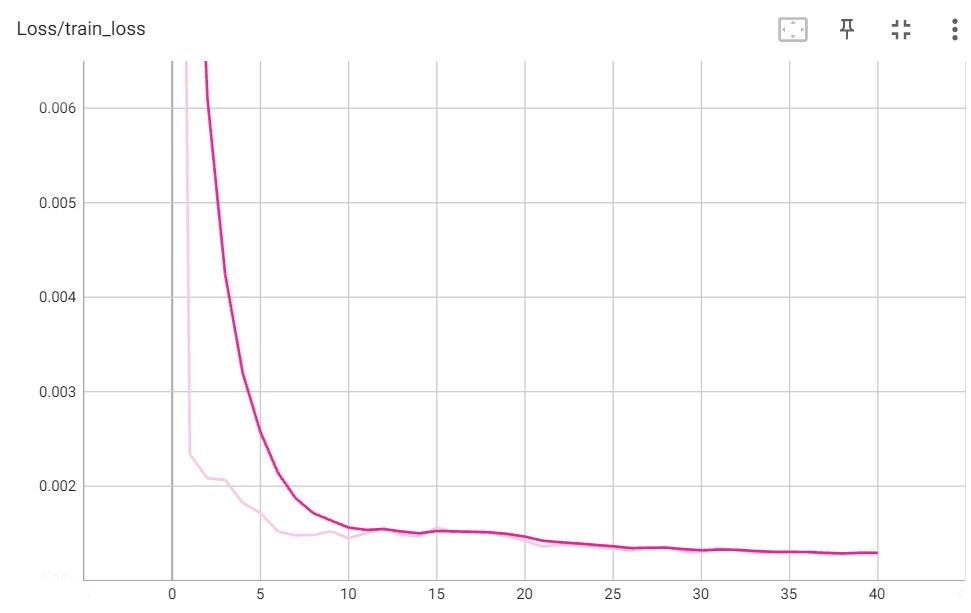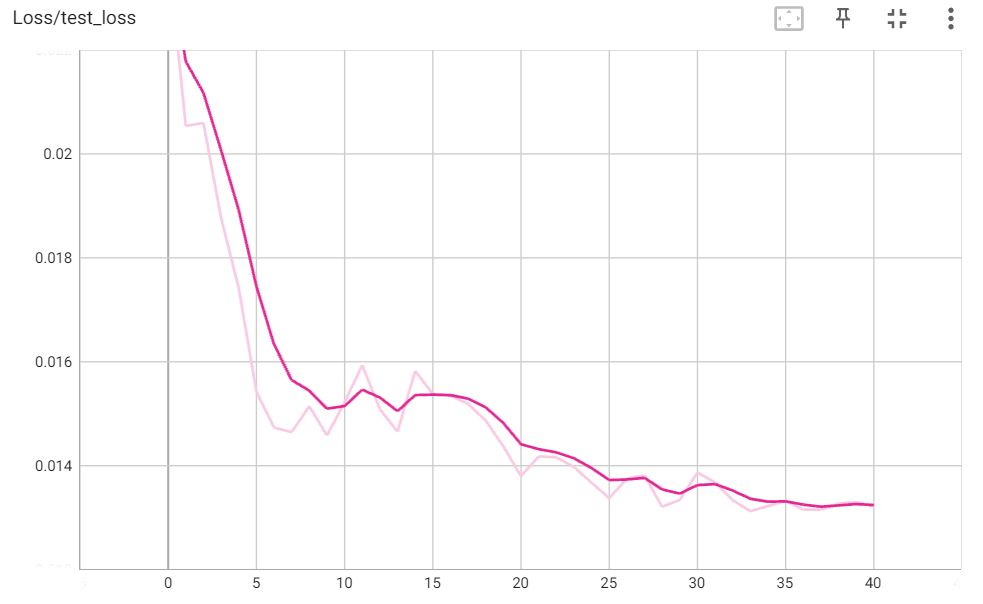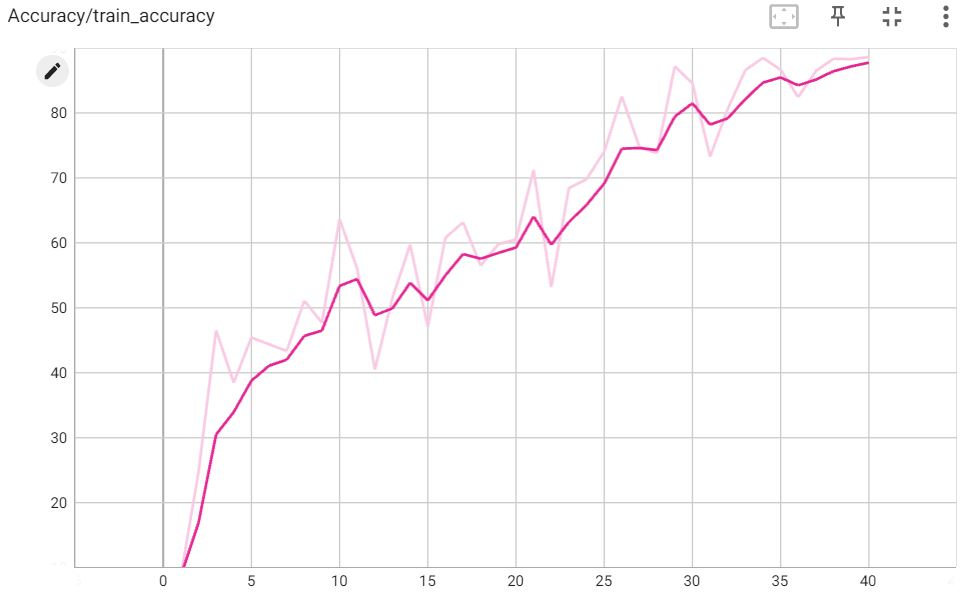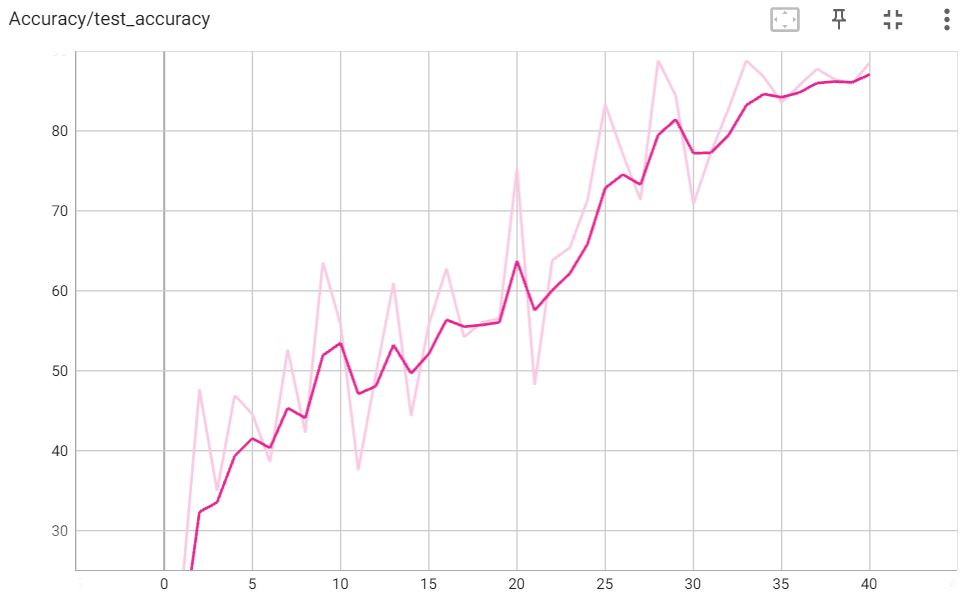

In [195]:
if ALL_CODE:
    model:str="resnext_101"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

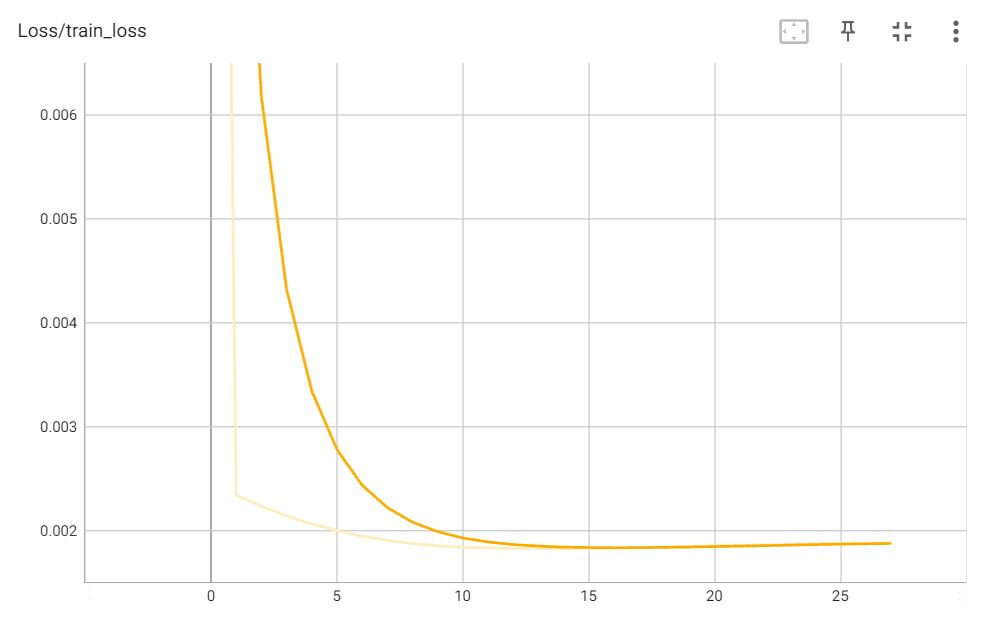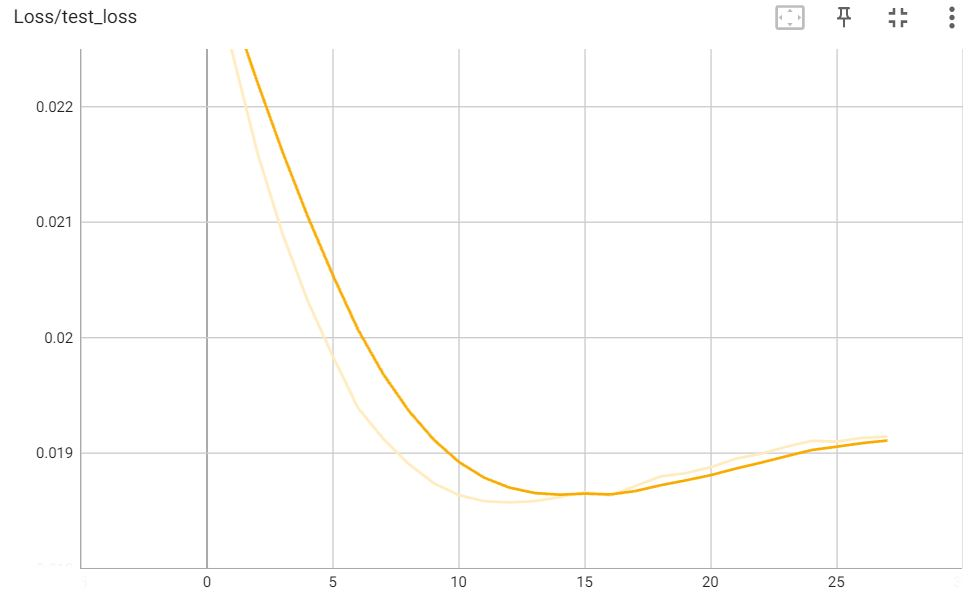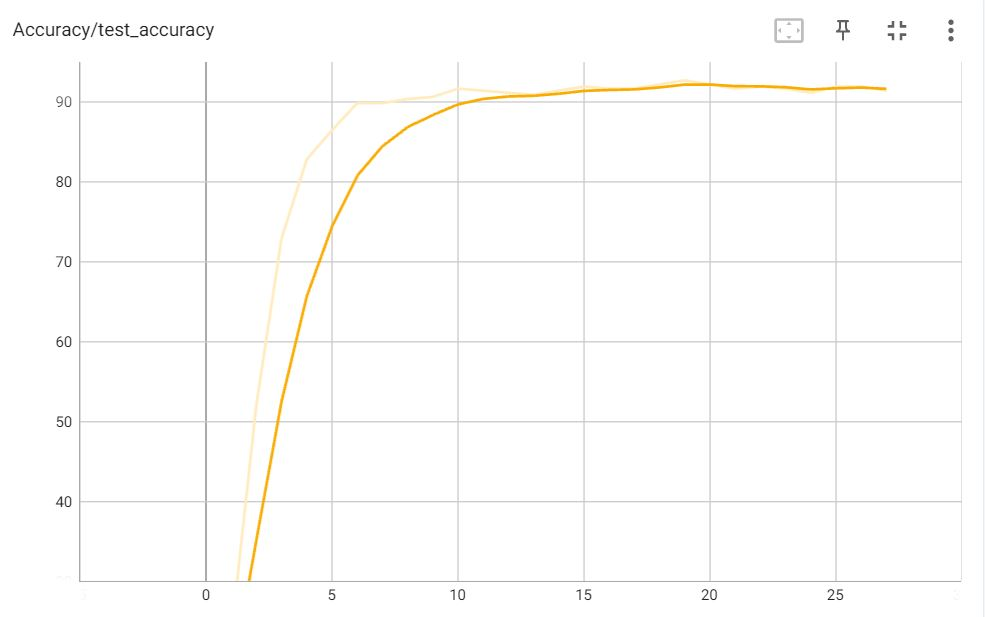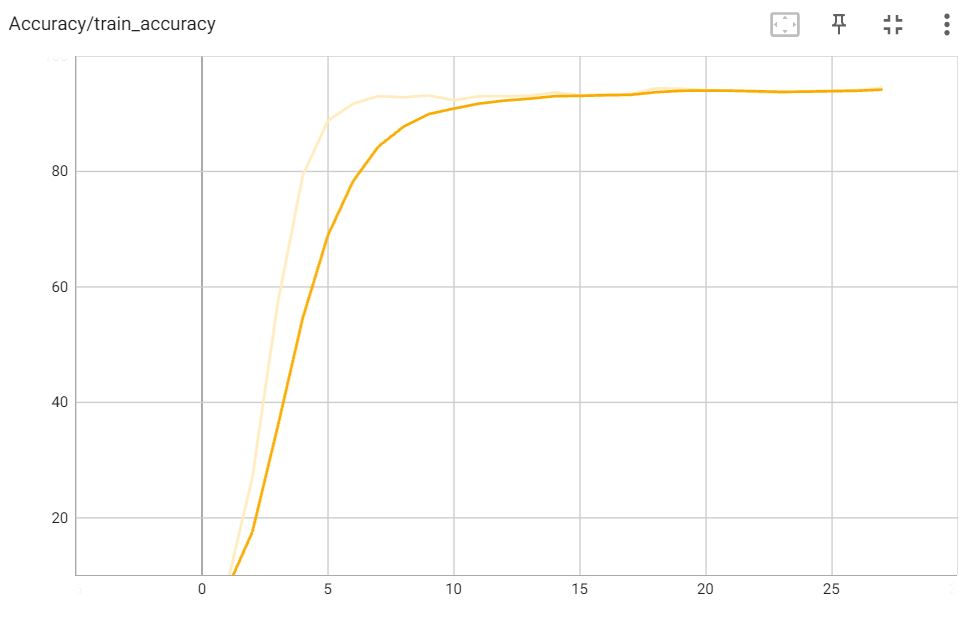

In [196]:
if ALL_CODE:
    model: str = "regnet_16gf"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

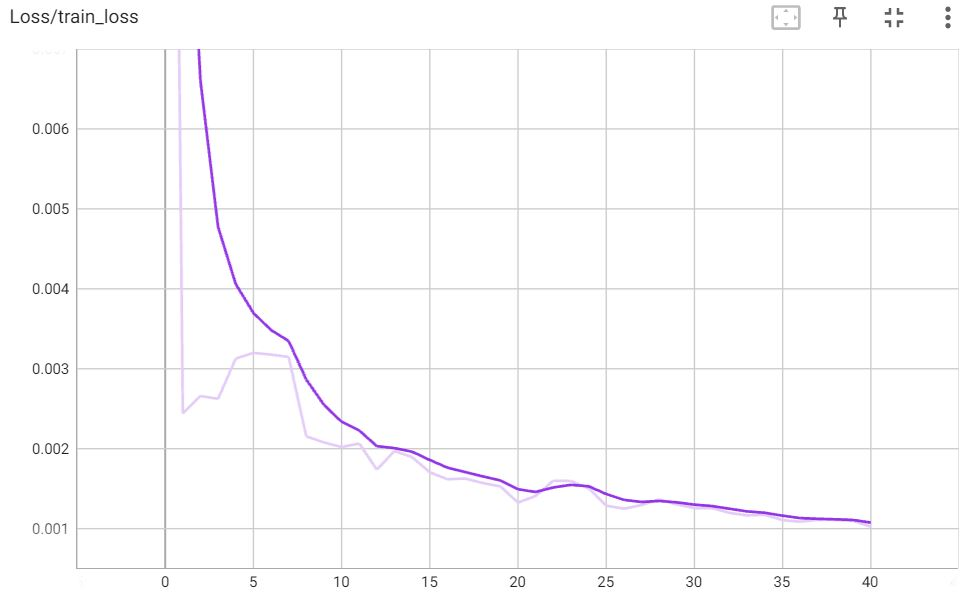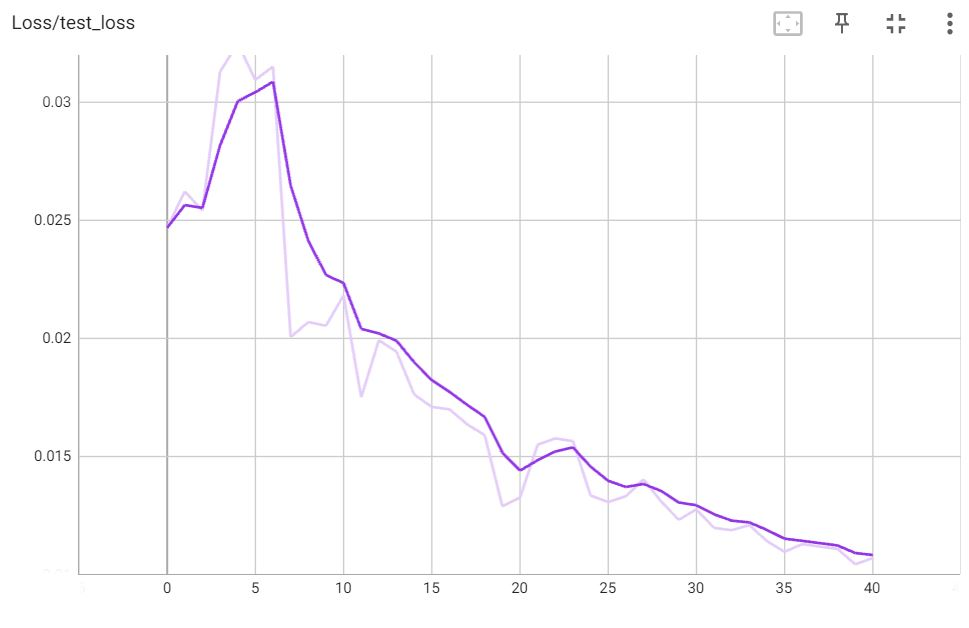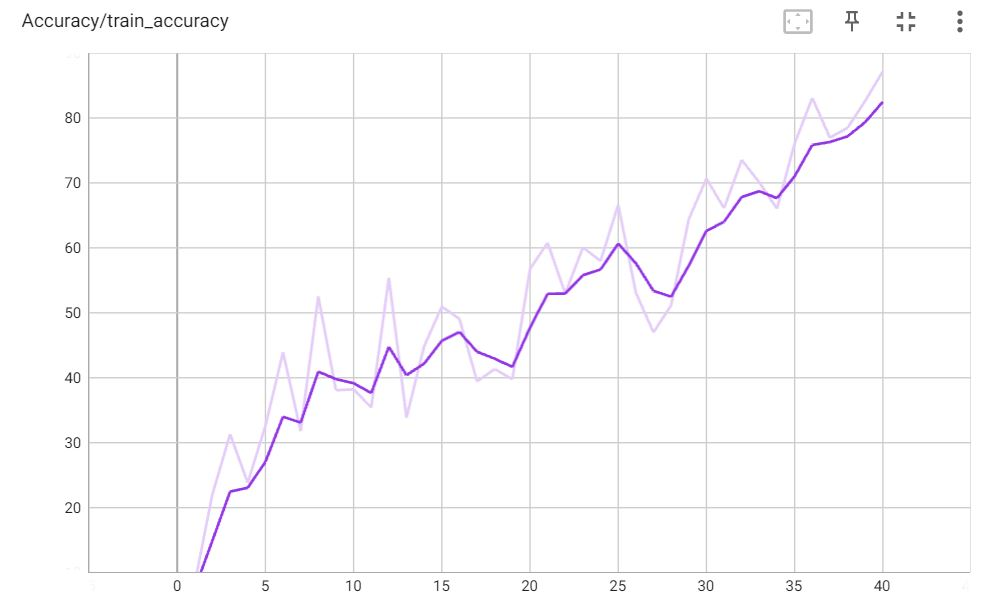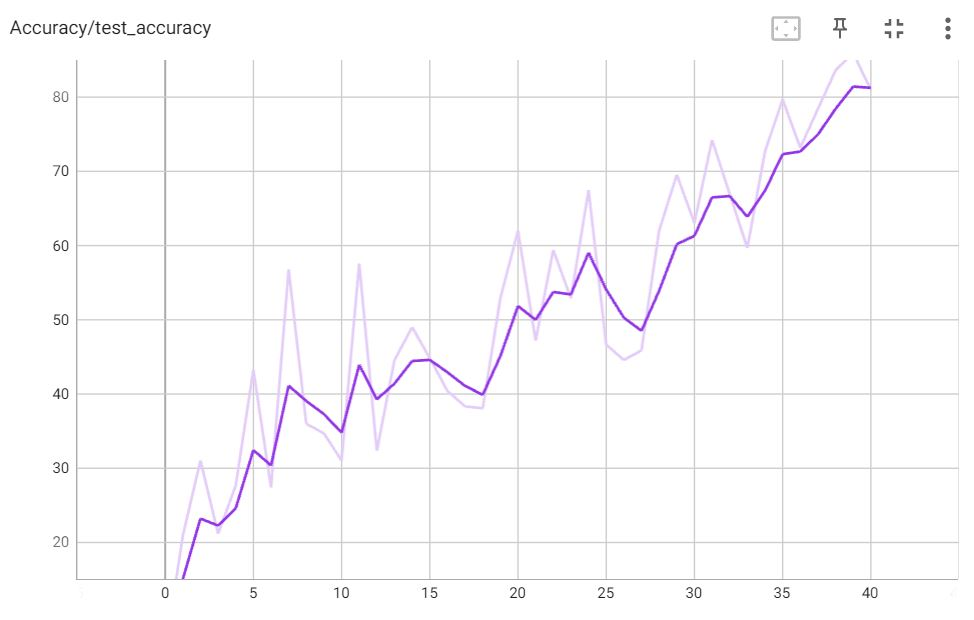

In [197]:
if ALL_CODE:
    model: str = "vit_16"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

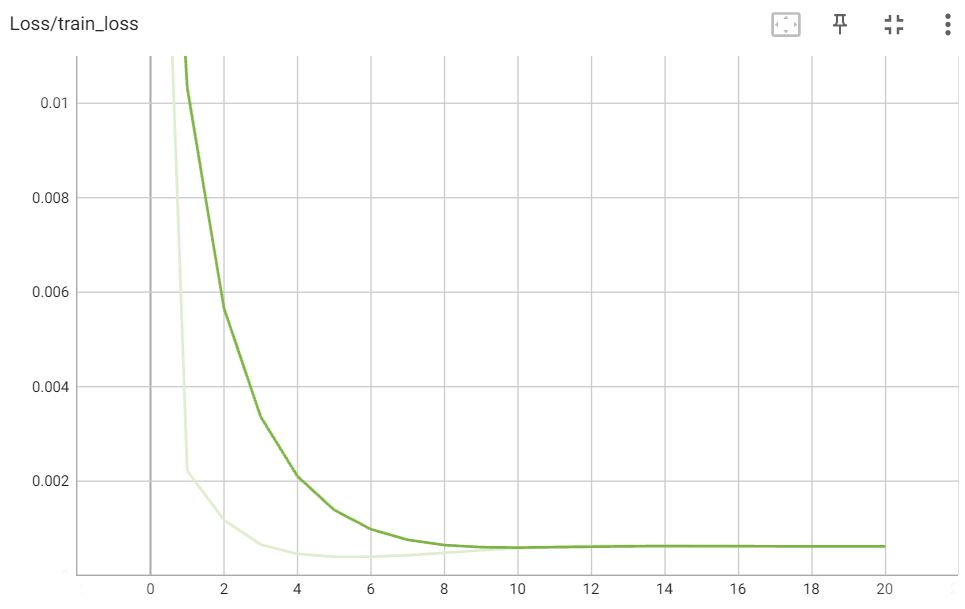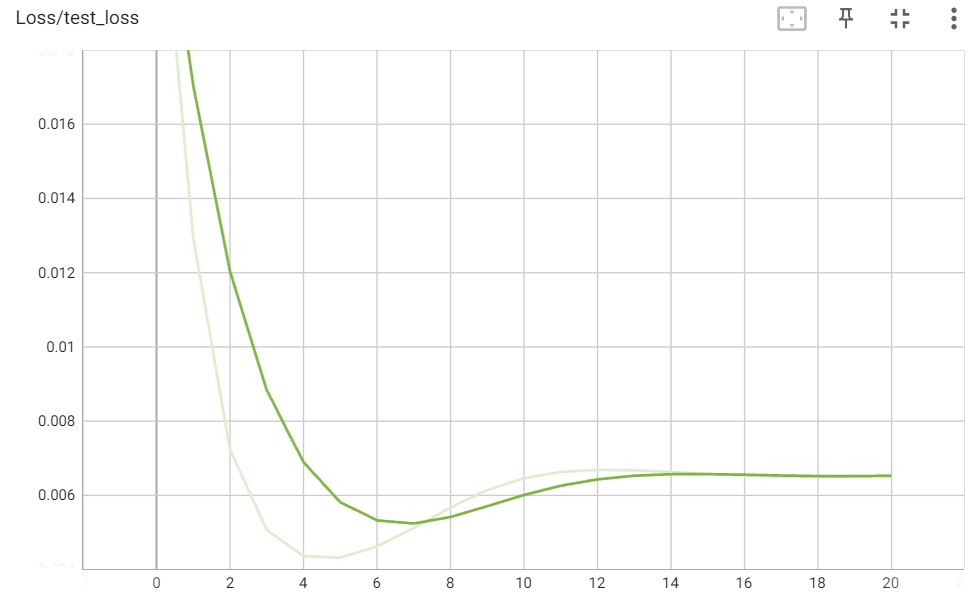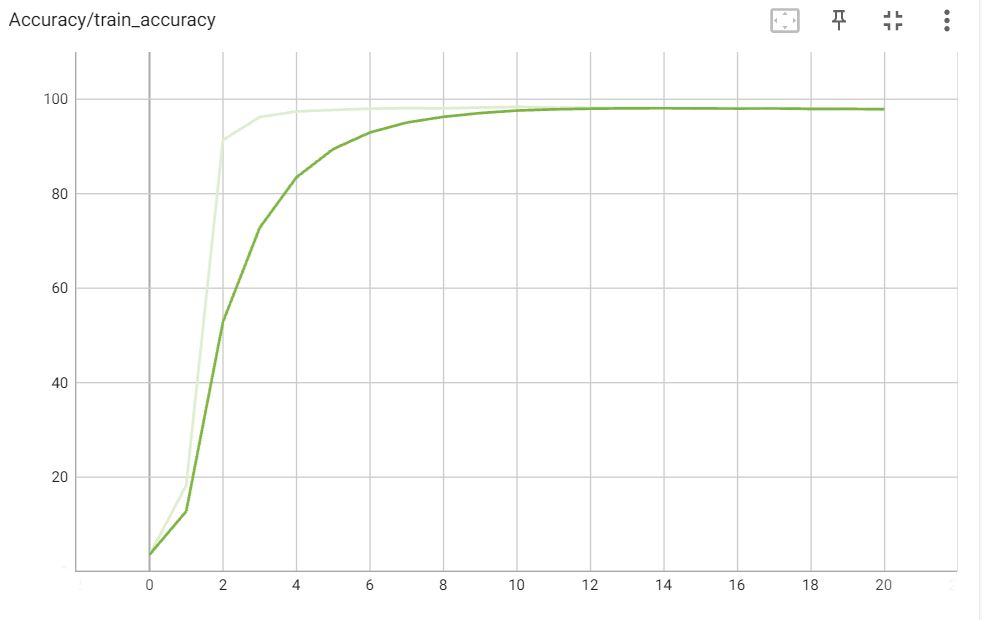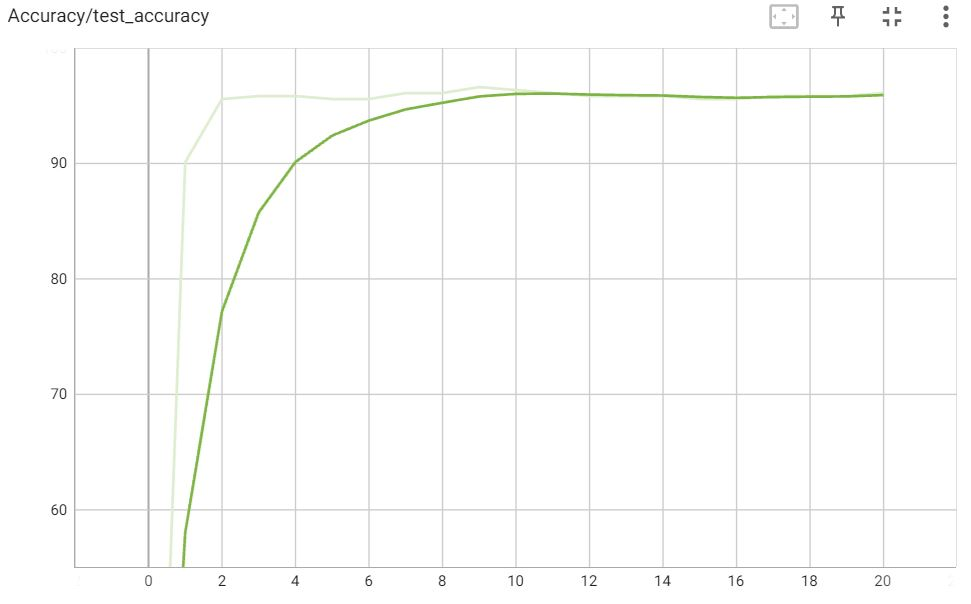

In [198]:
if ALL_CODE:
    model: str = "vit_32"
    num_exp = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

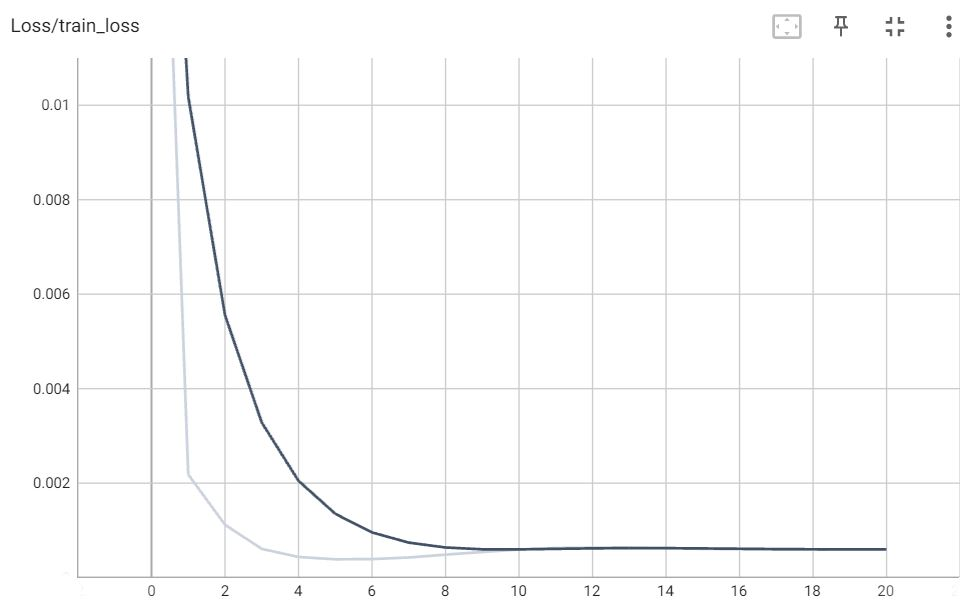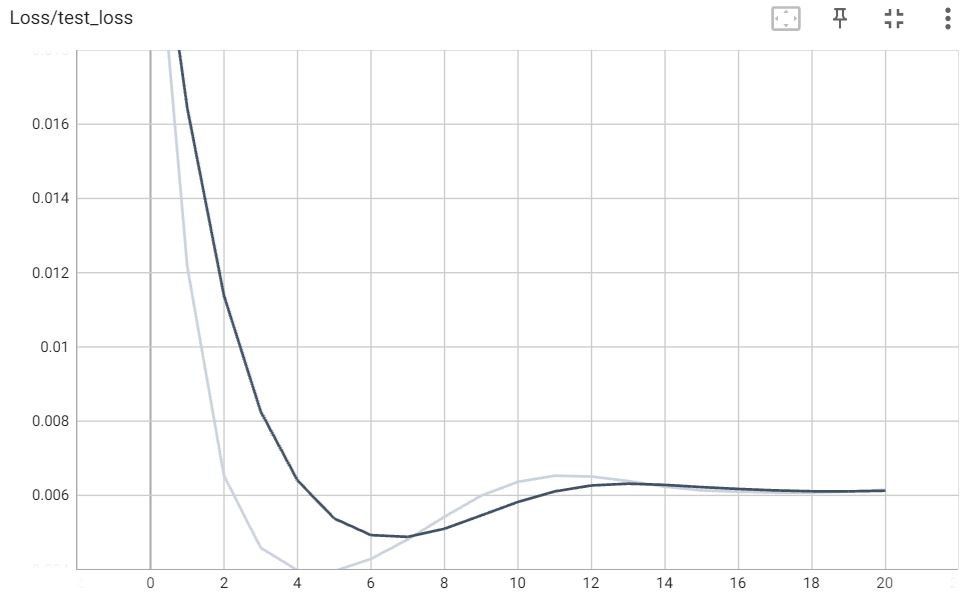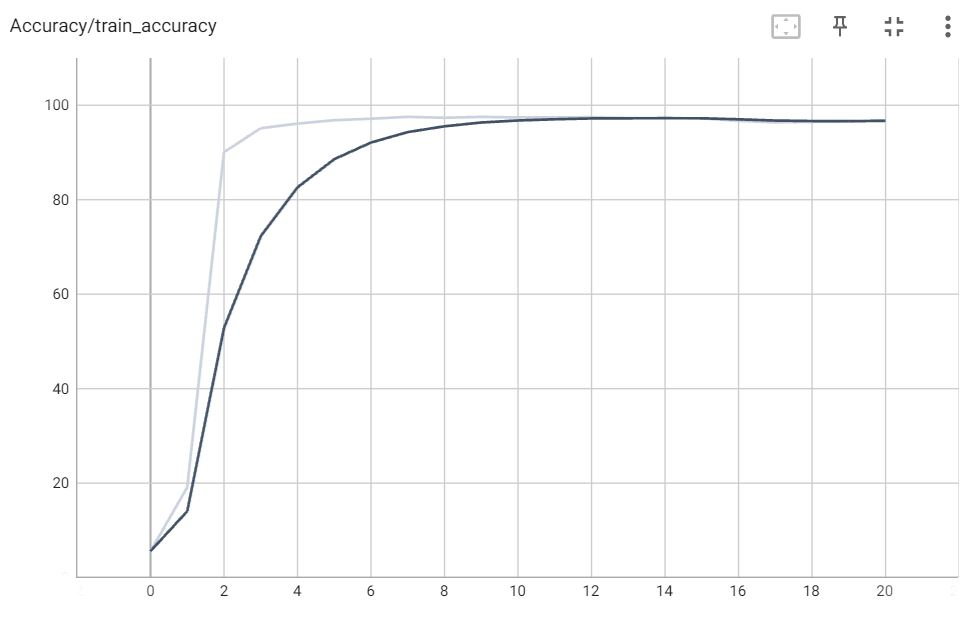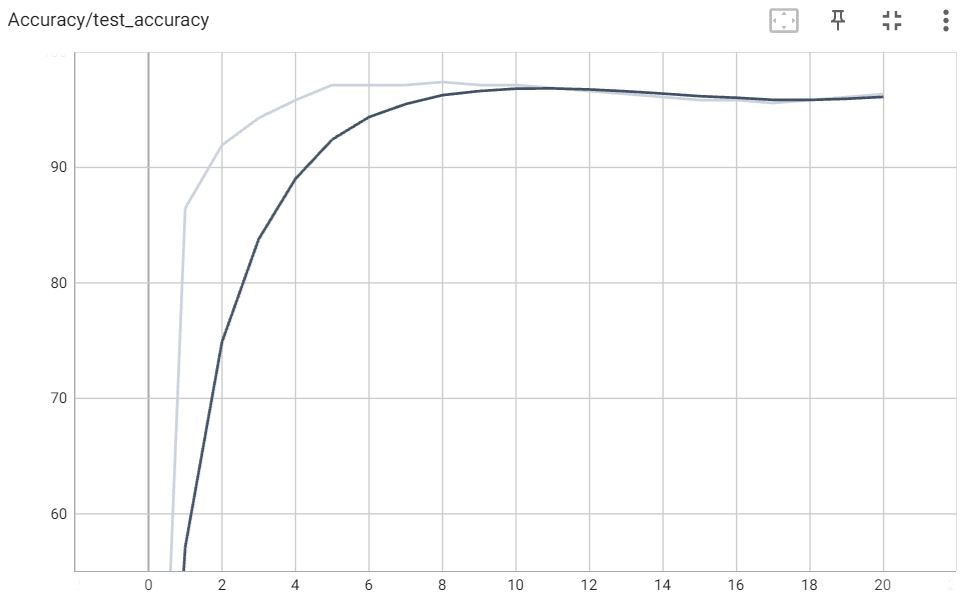

In [199]:
if ALL_CODE:
    model: str = "convnext_base"
    num_exp: int = 1
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model)

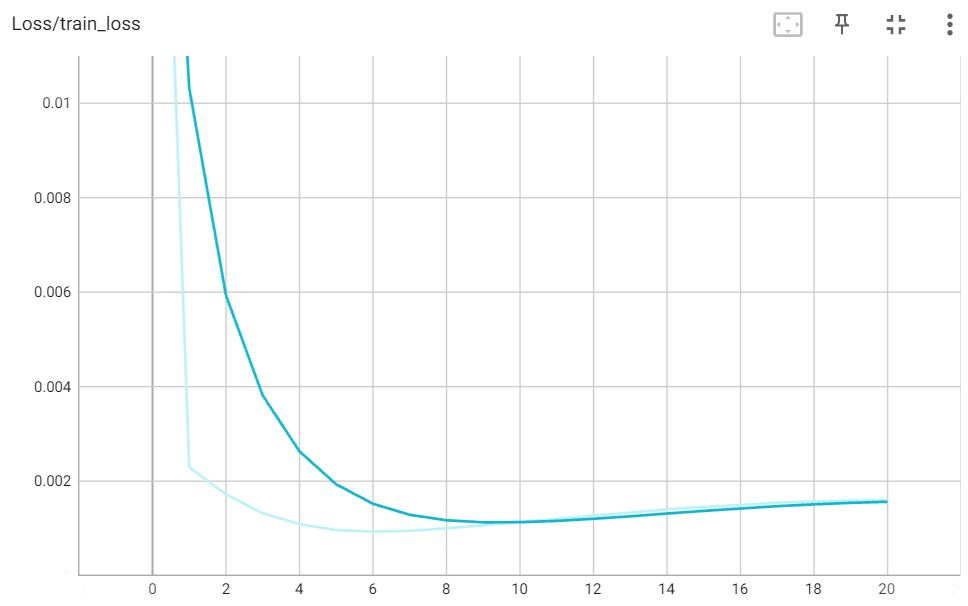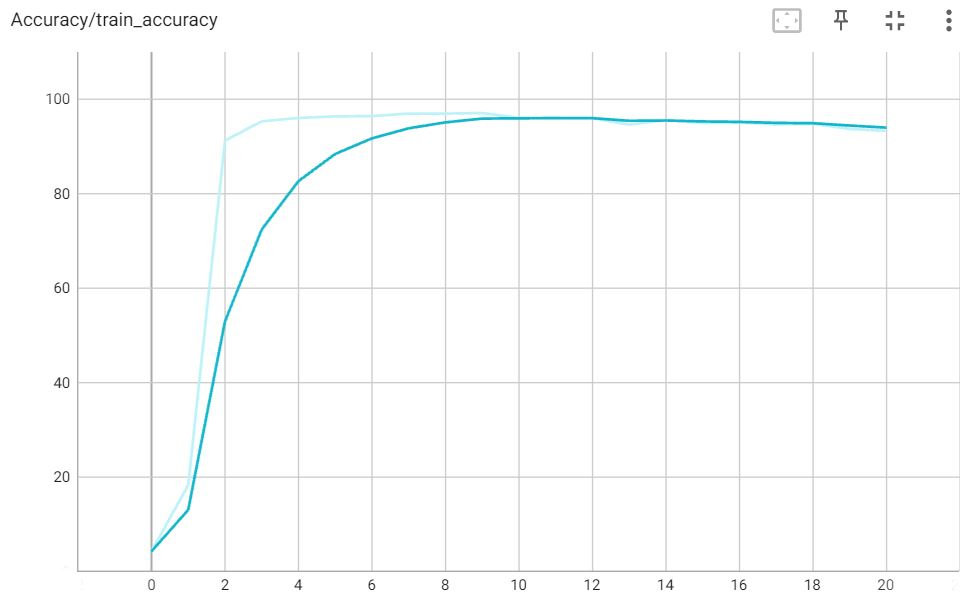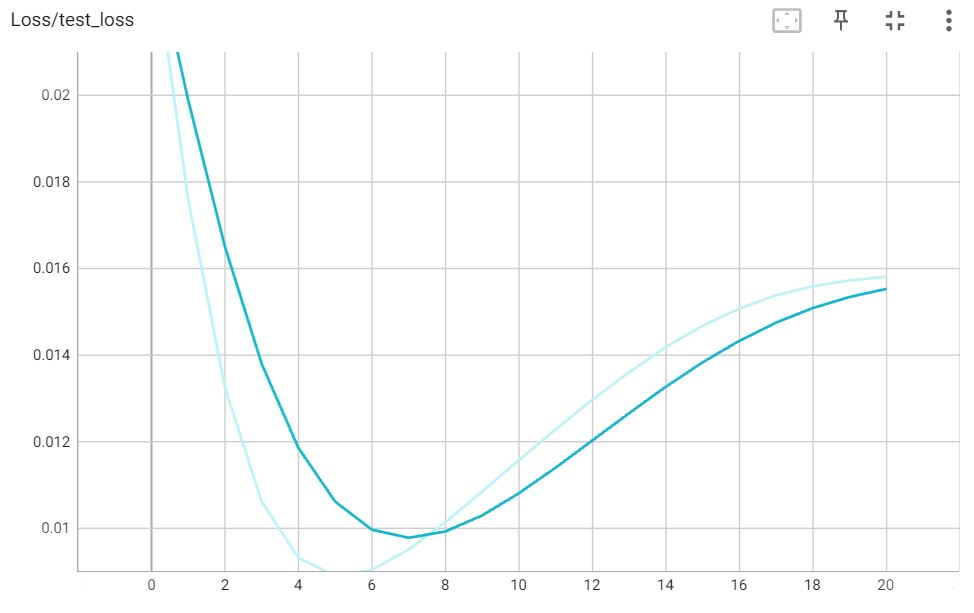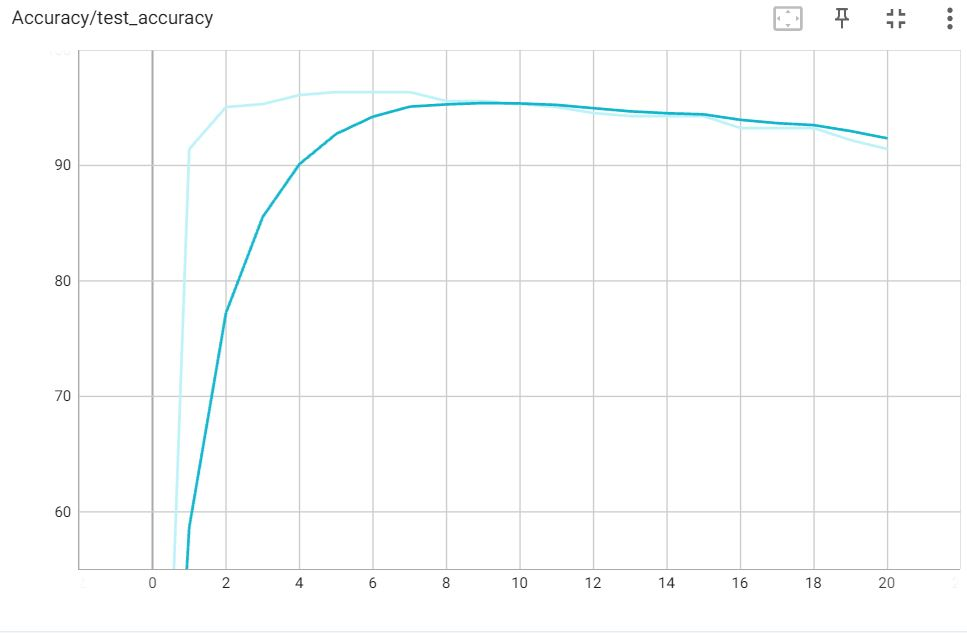

##### For R

In [200]:
if ALL_CODE:
    model: str = "regnet_32gf"
    num_exp: int  = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

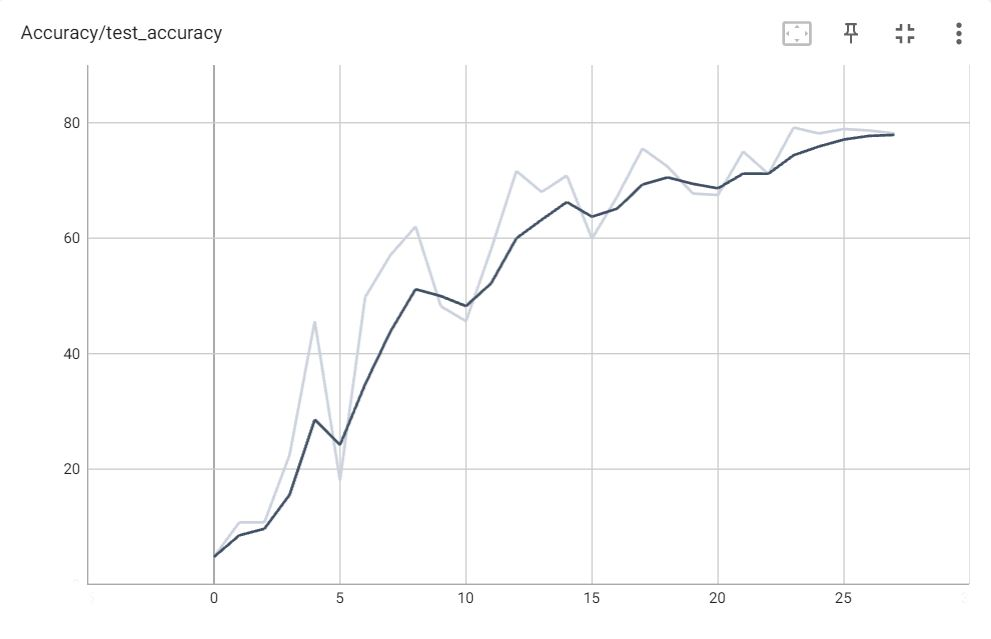

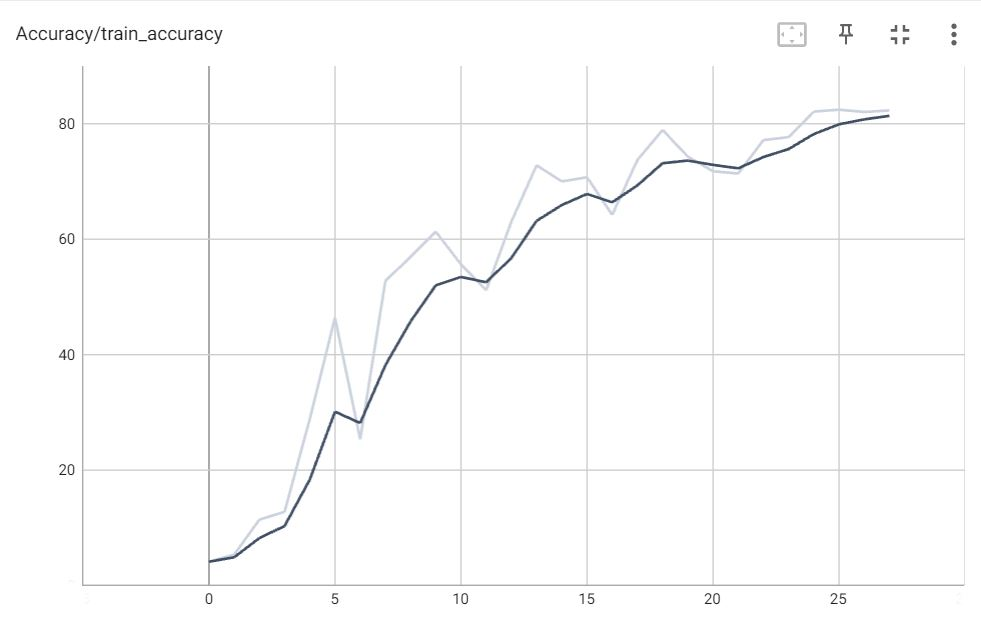

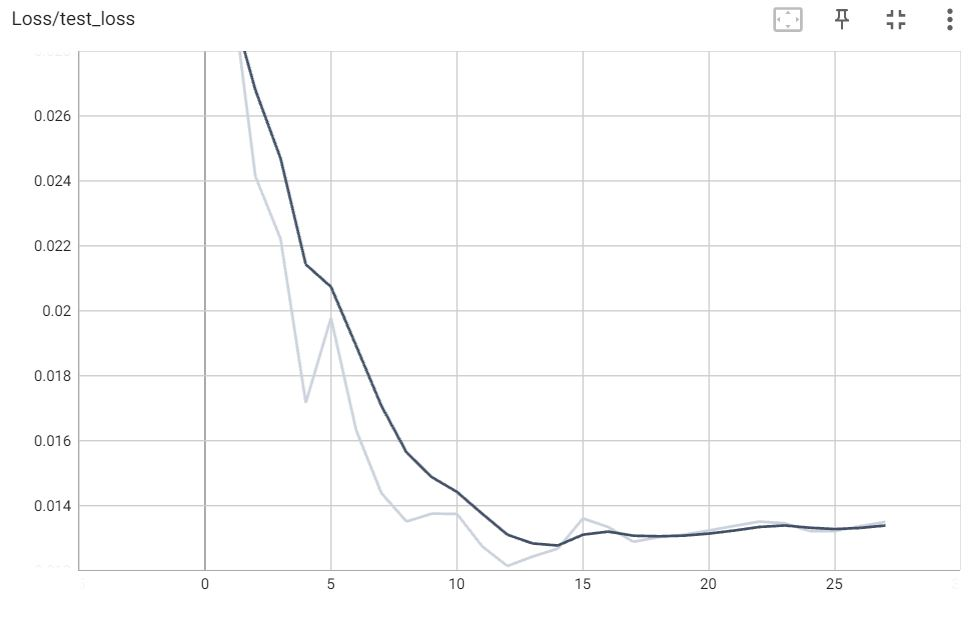

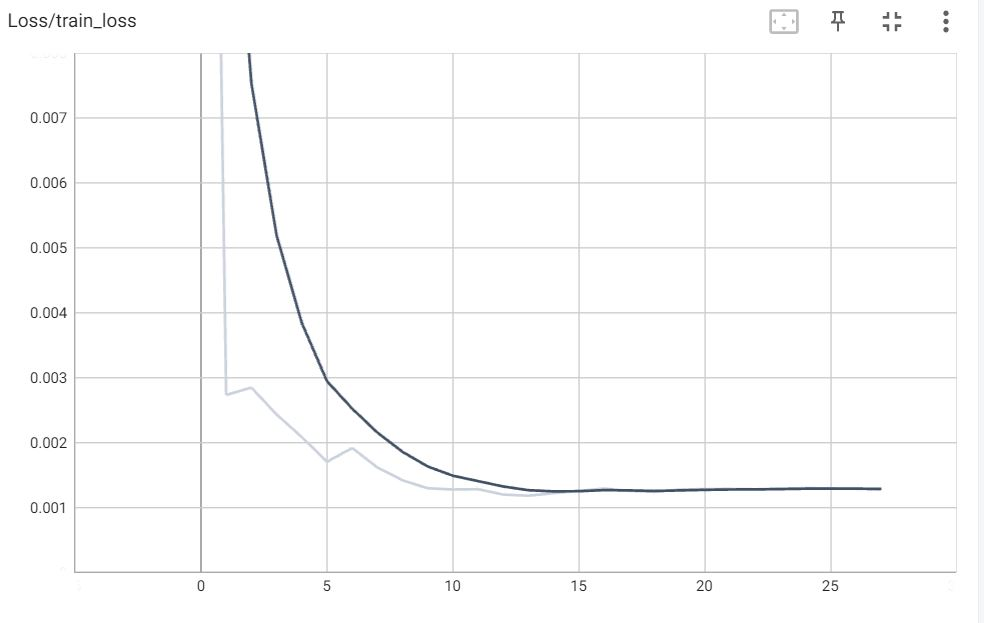

In [201]:
if ALL_CODE:
    model : str = "densenet_201"
    num_exp: int = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

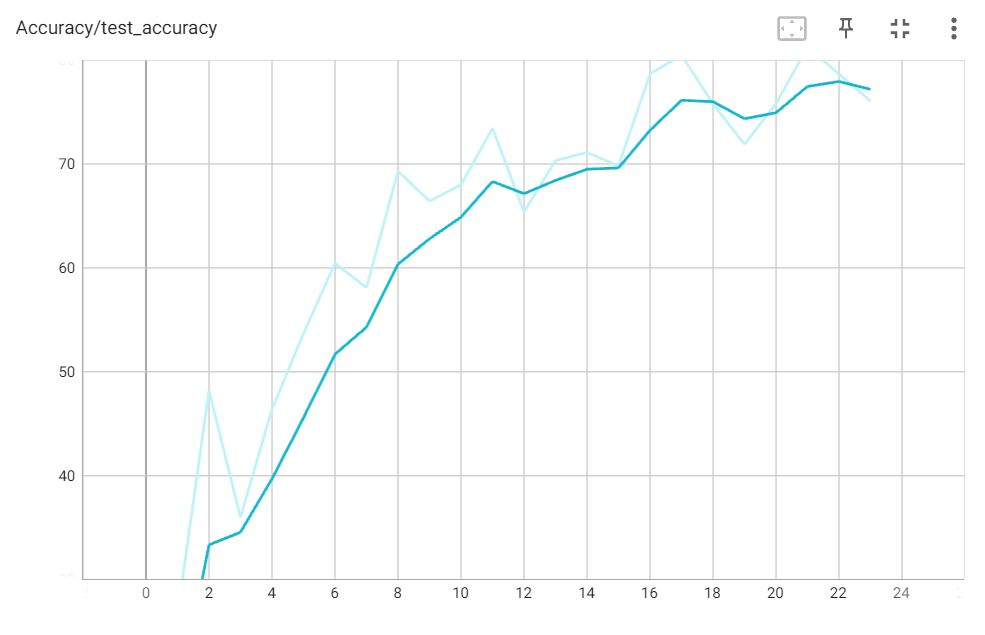

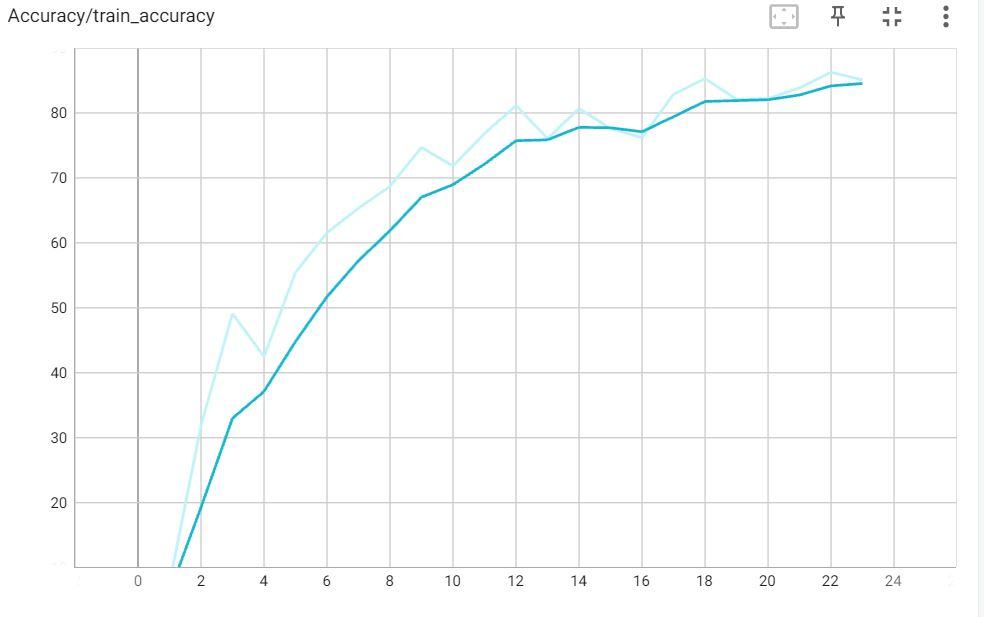

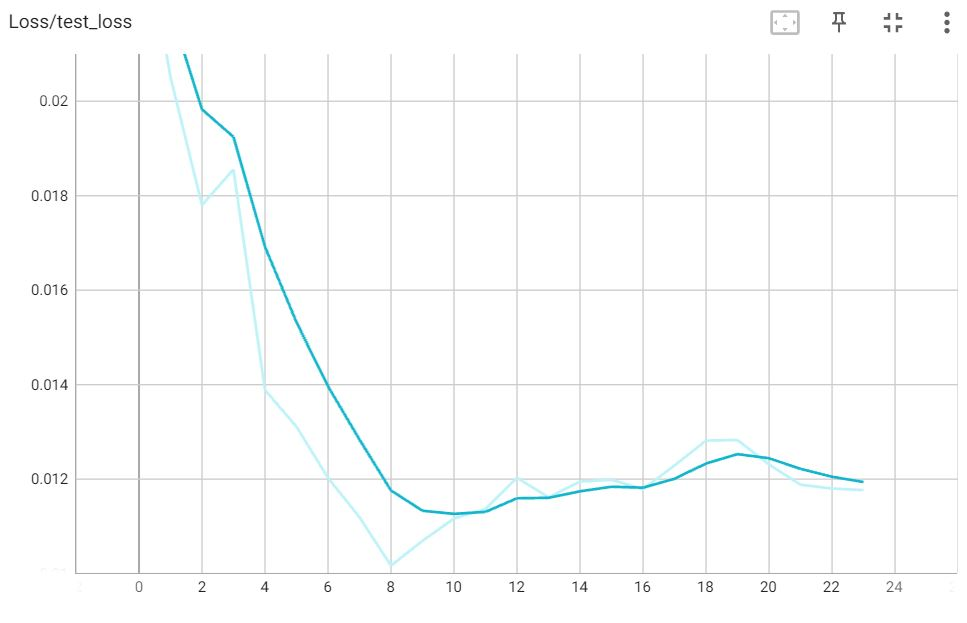

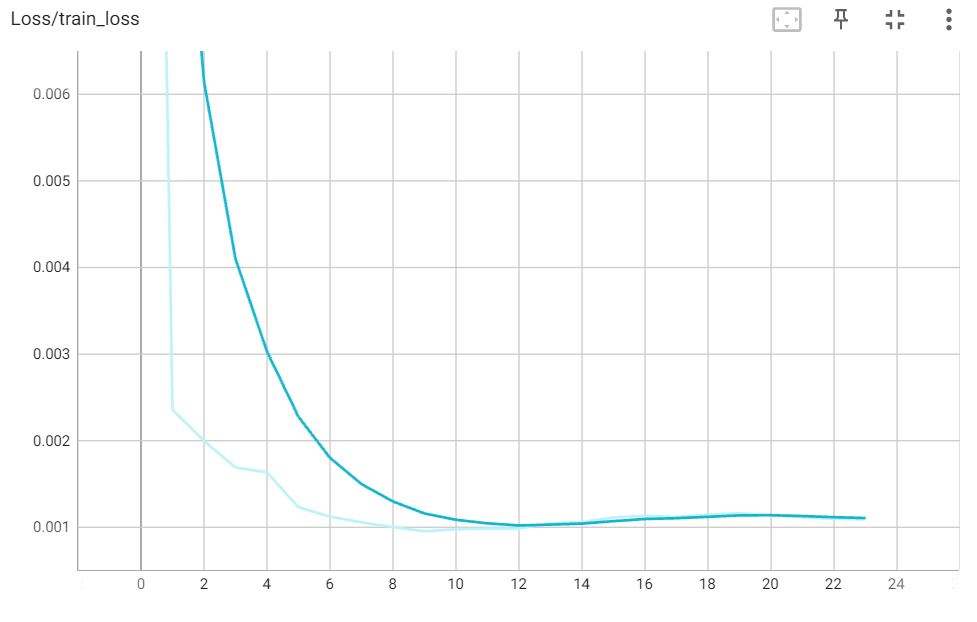

In [202]:
if ALL_CODE:
    model: str = "efficientnet_S"
    num_exp: int = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

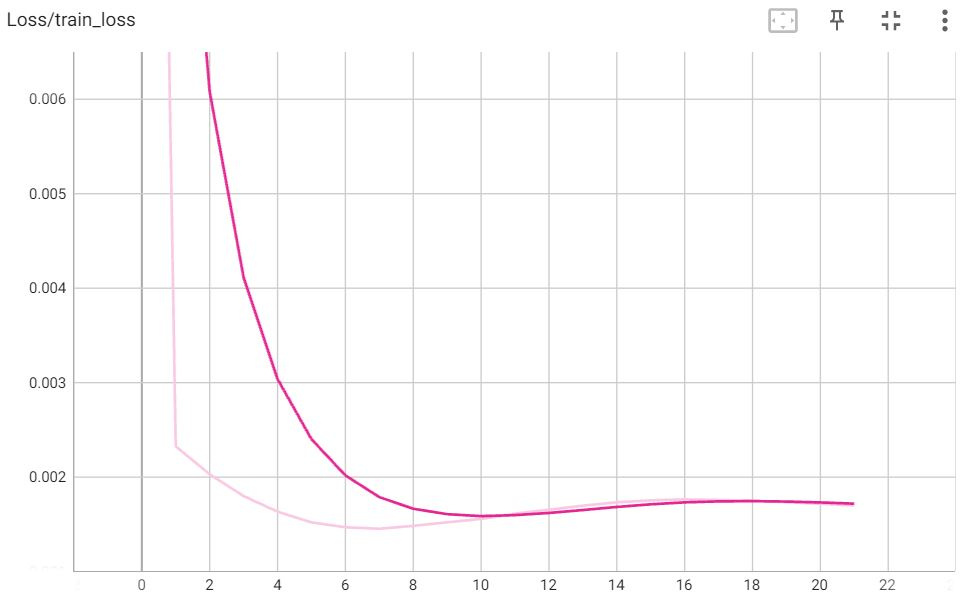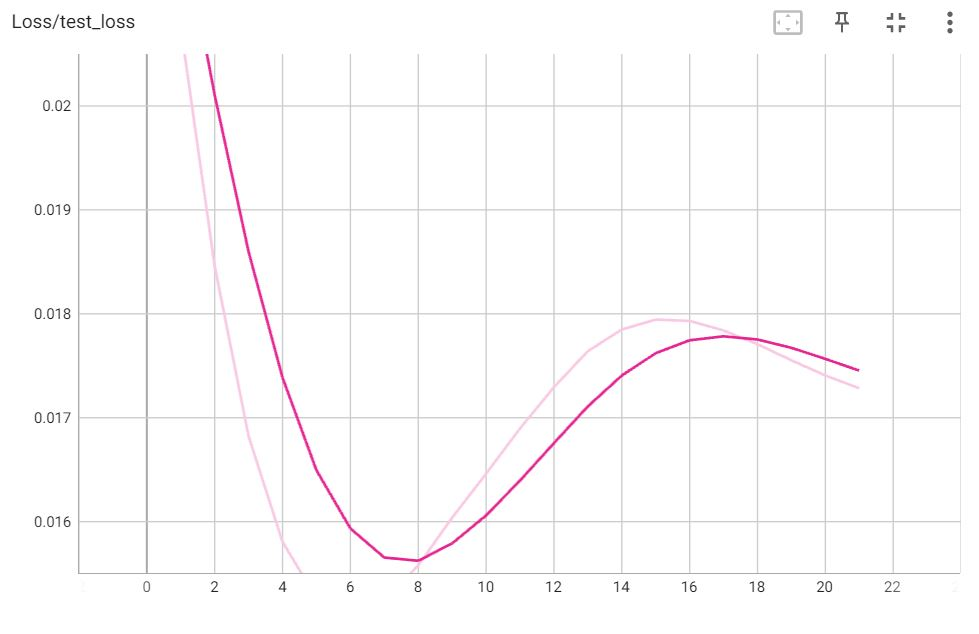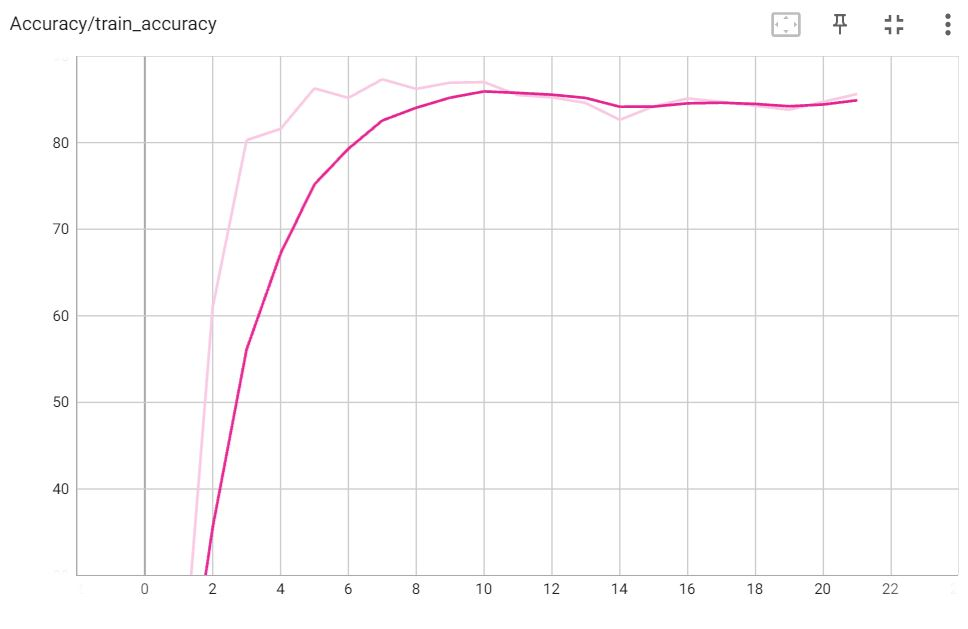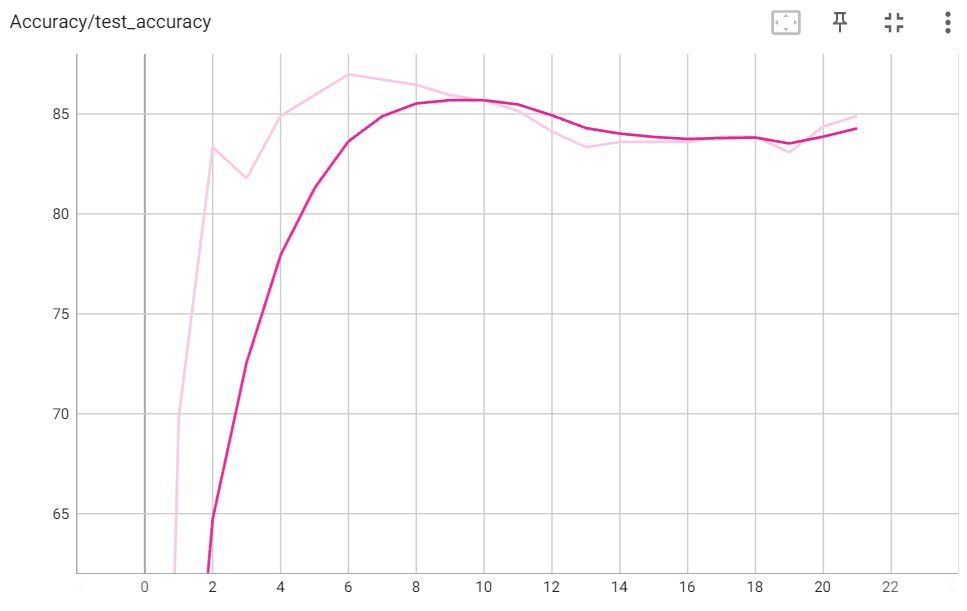

In [203]:
if ALL_CODE:
    model: str = "resnet_34"
    num_exp: int = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

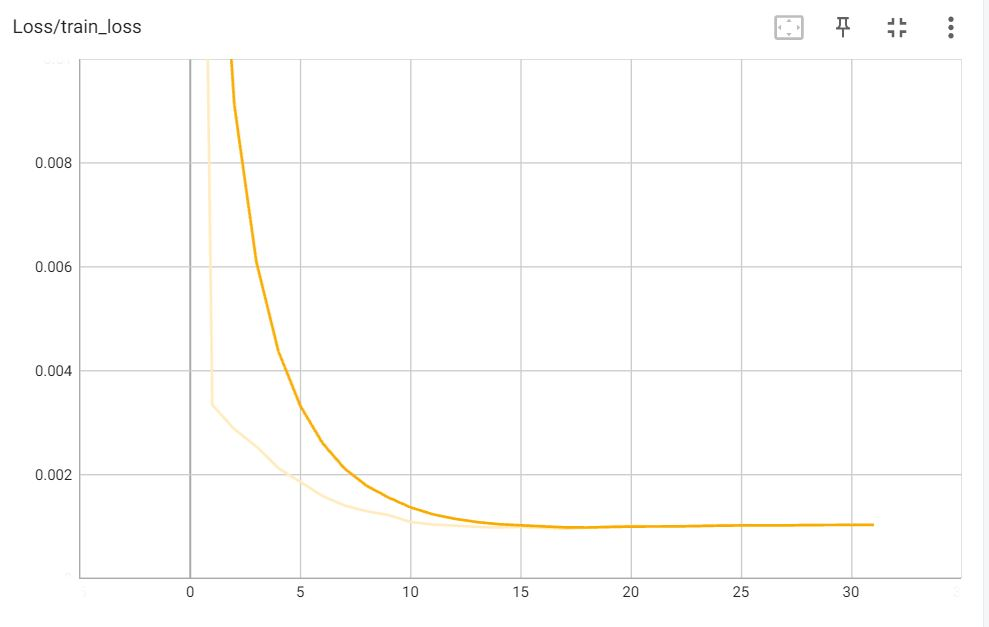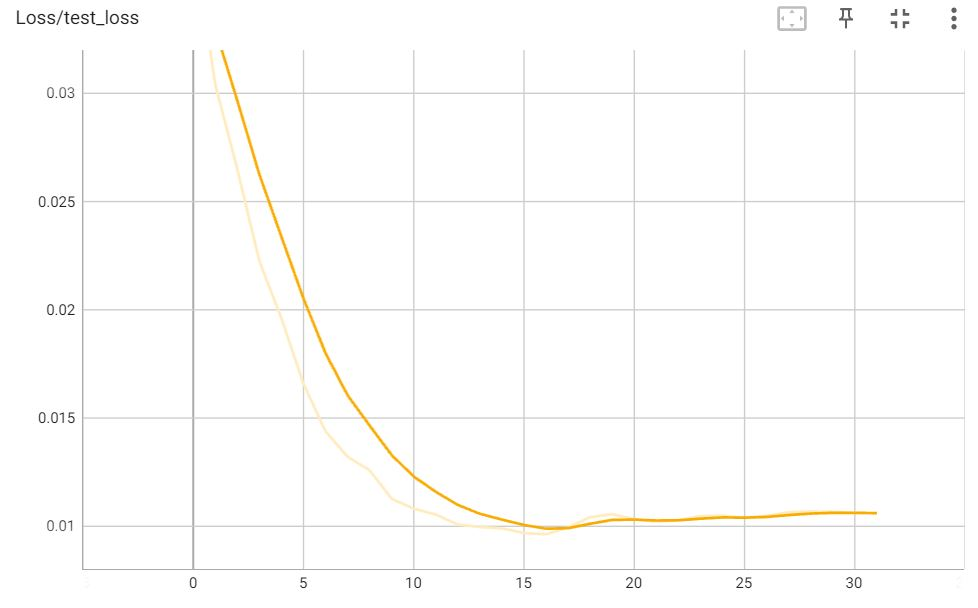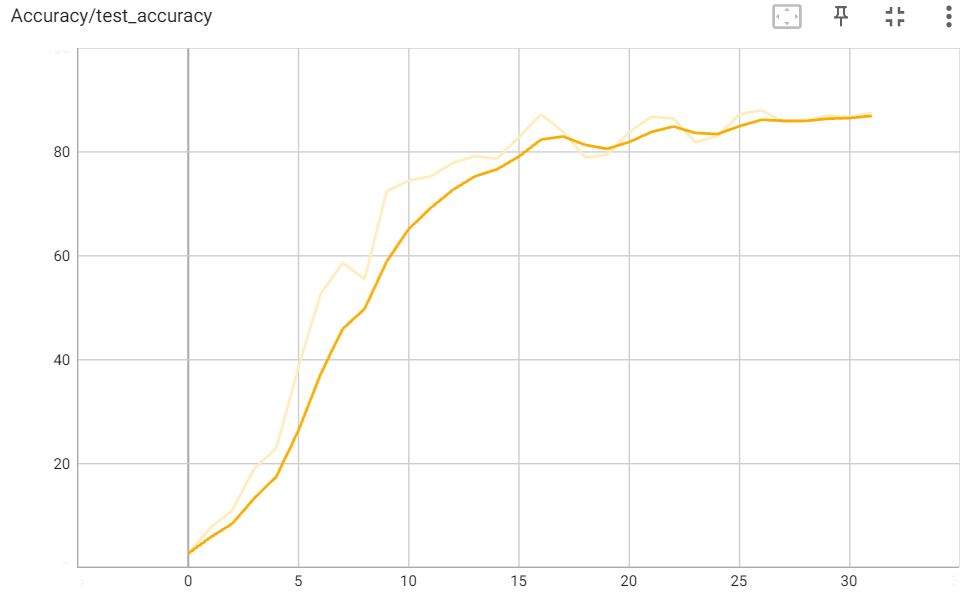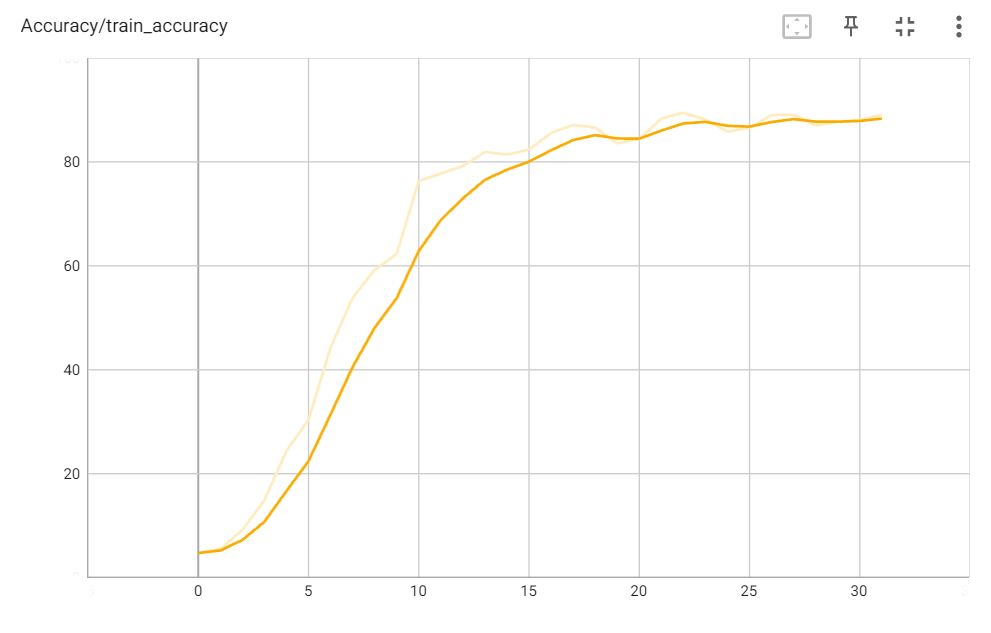

In [204]:
if ALL_CODE:
    model: str = "resnext_50"
    num_exp: int = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

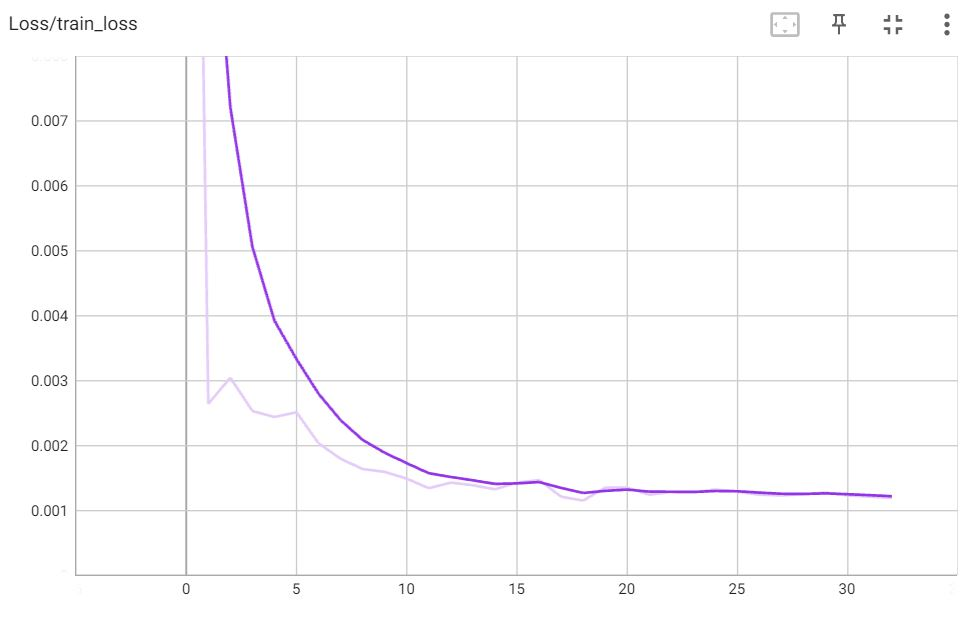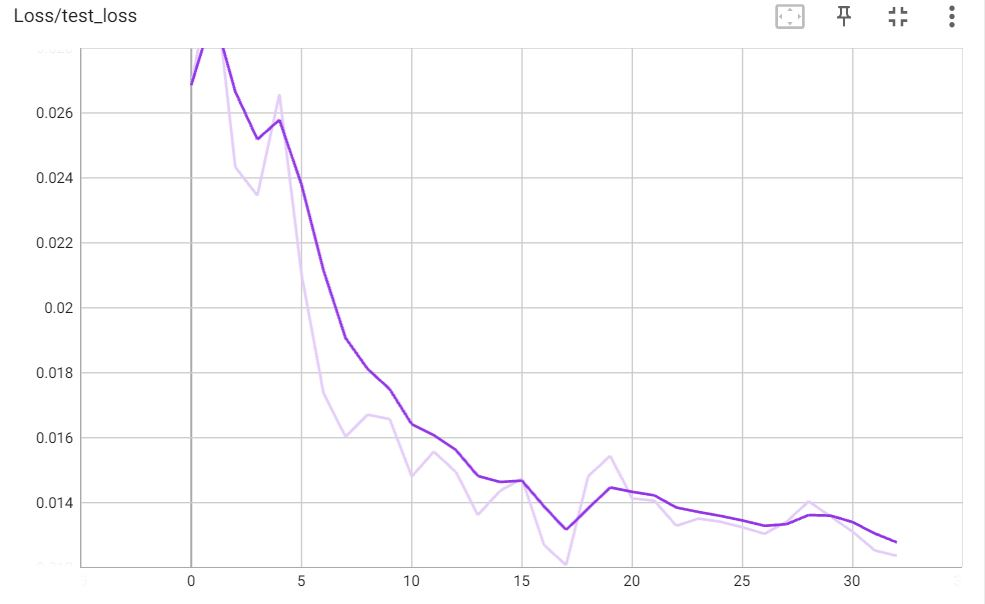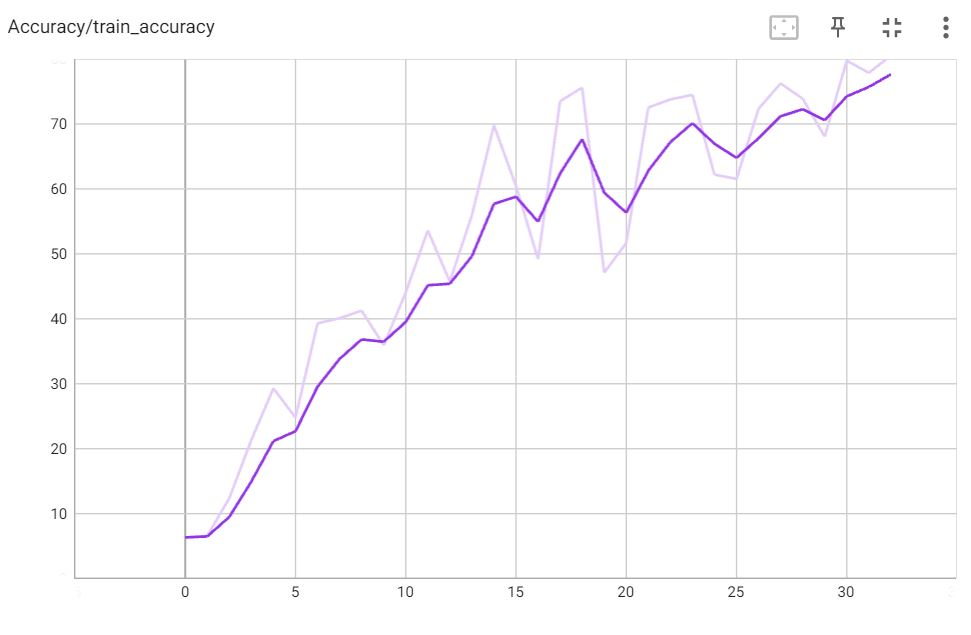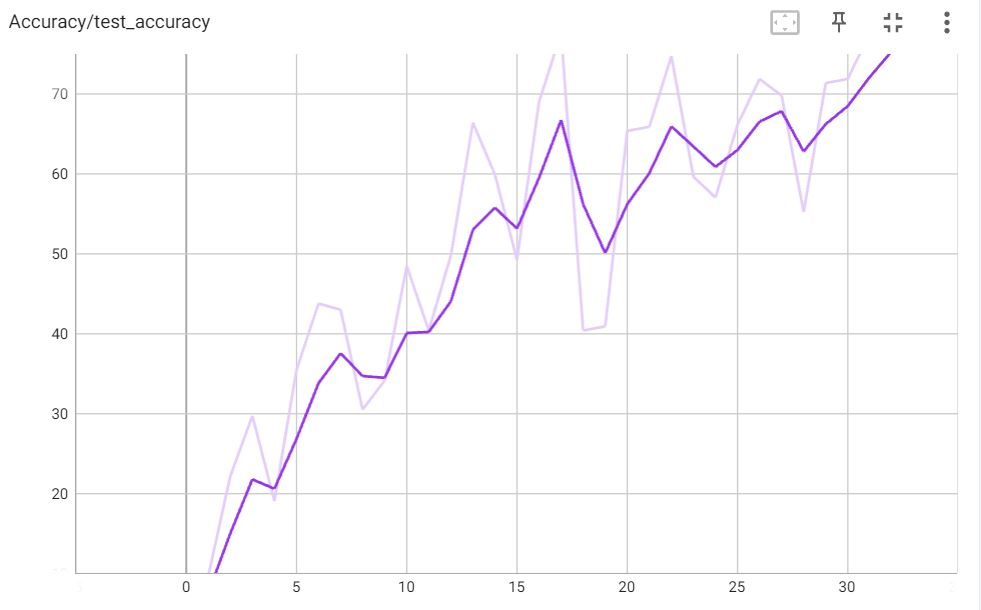

In [205]:
if ALL_CODE:
    model: str = "convnext_tiny"
    num_exp: int = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

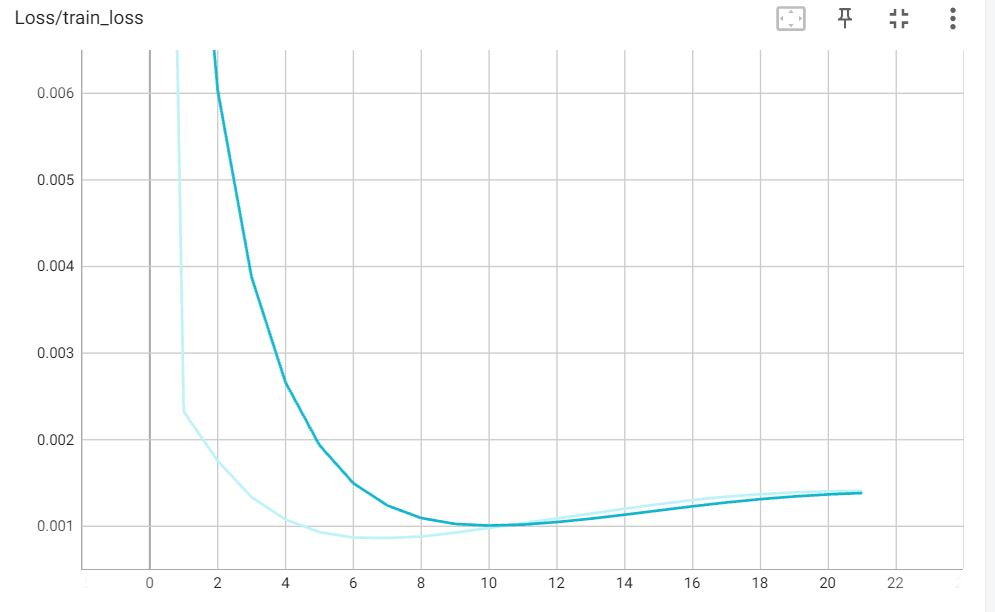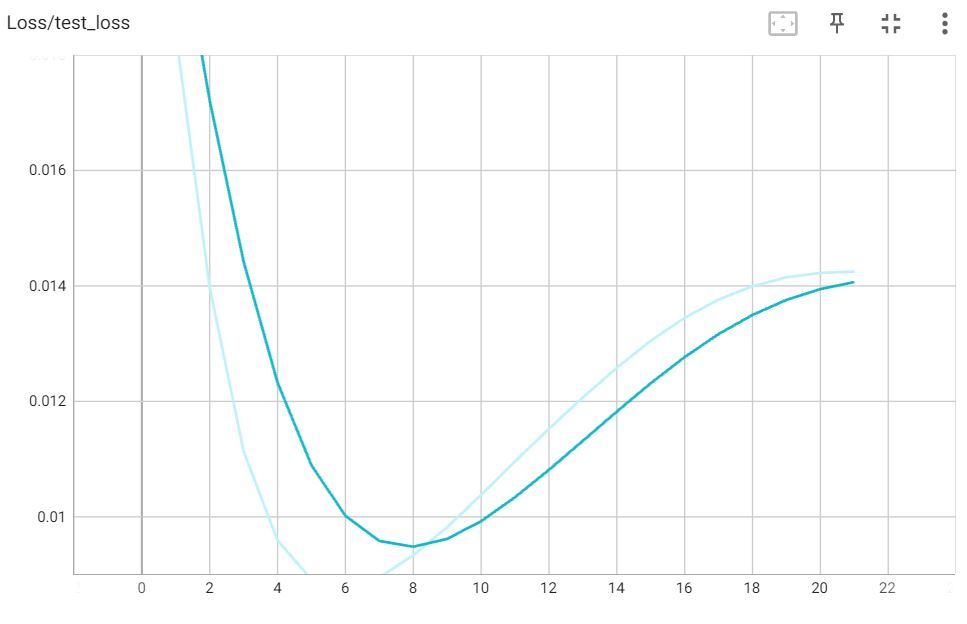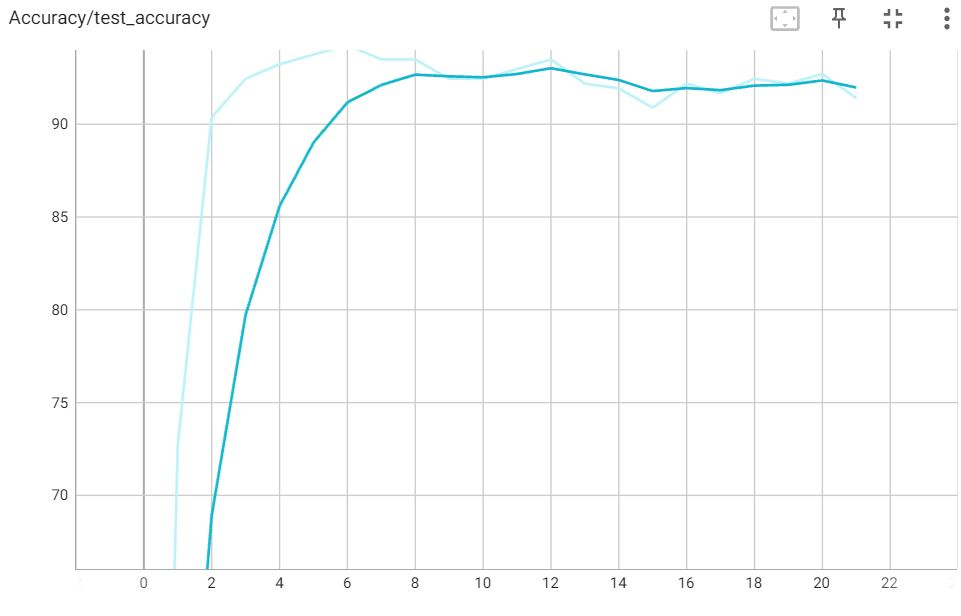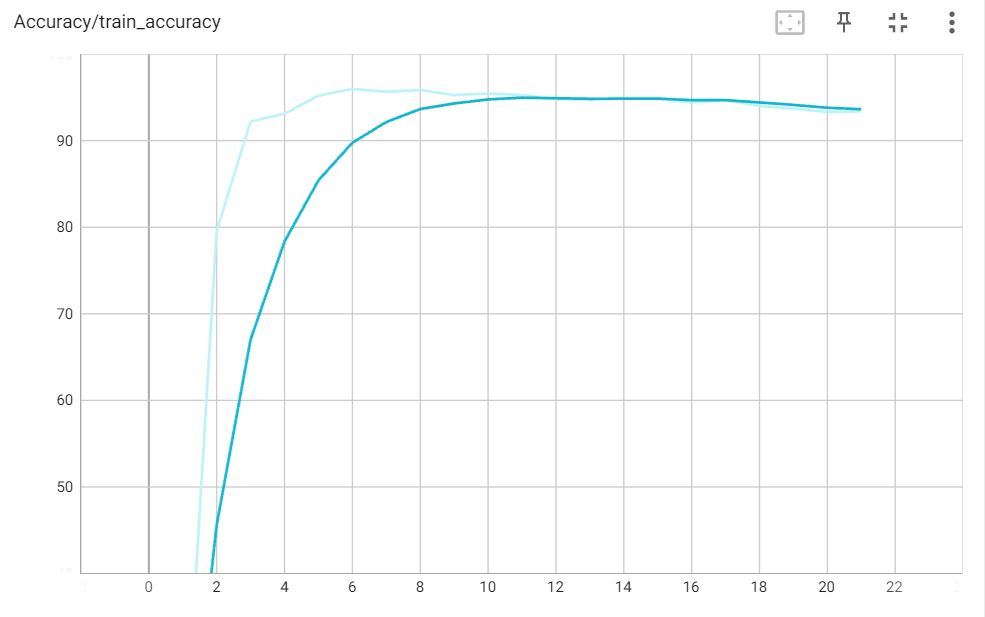

In [206]:
if ALL_CODE:
    model: str = "densenet_161"
    num_exp: int = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

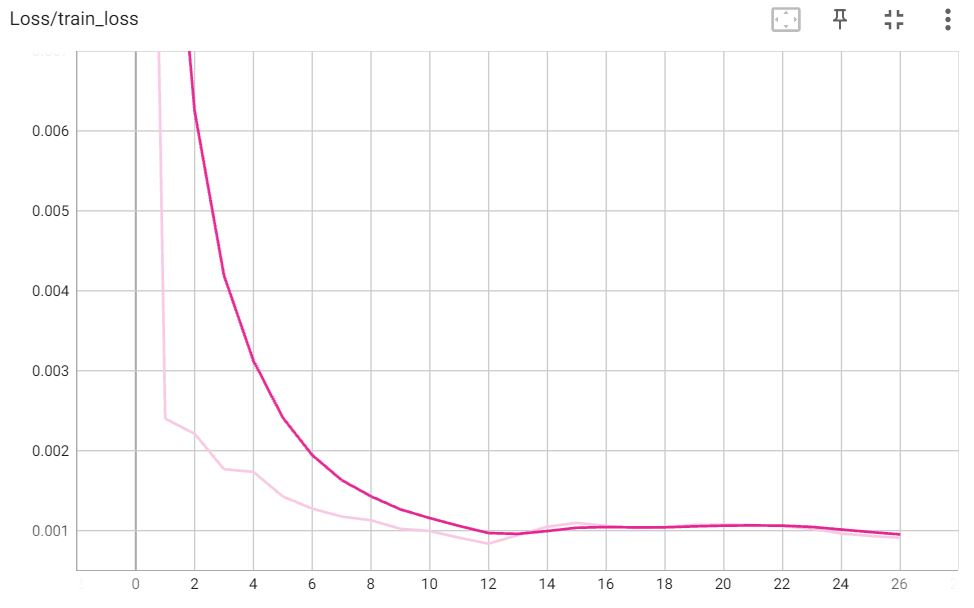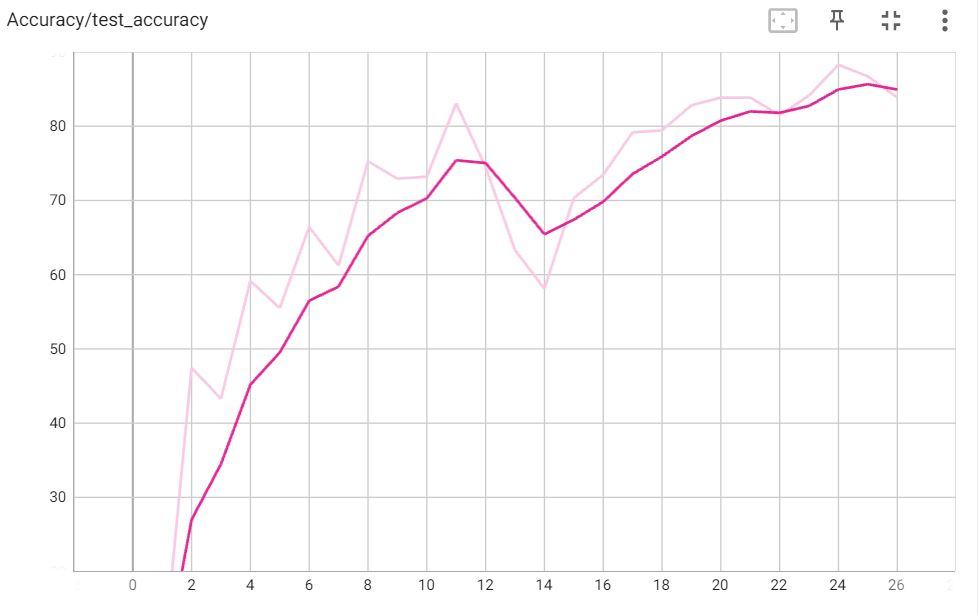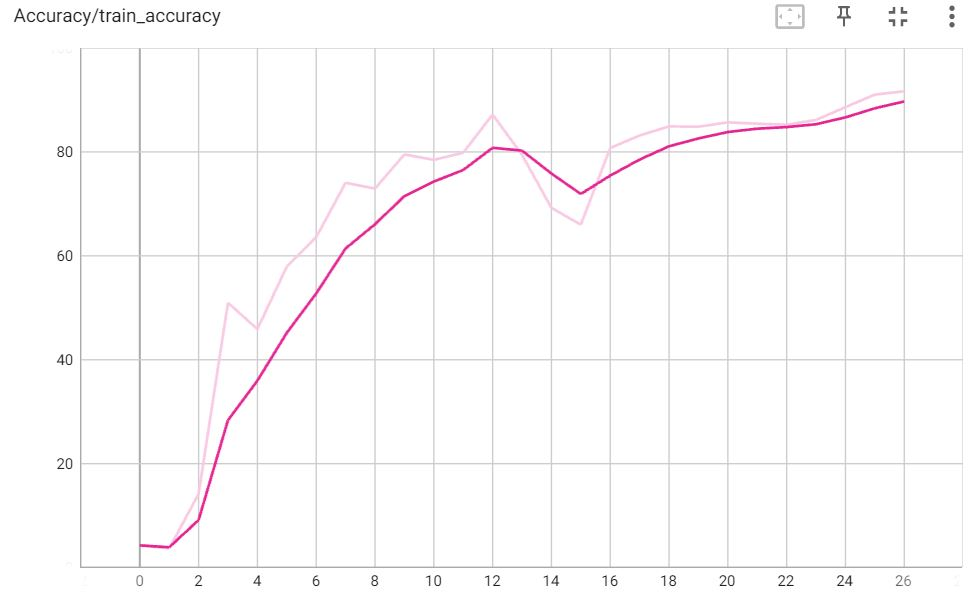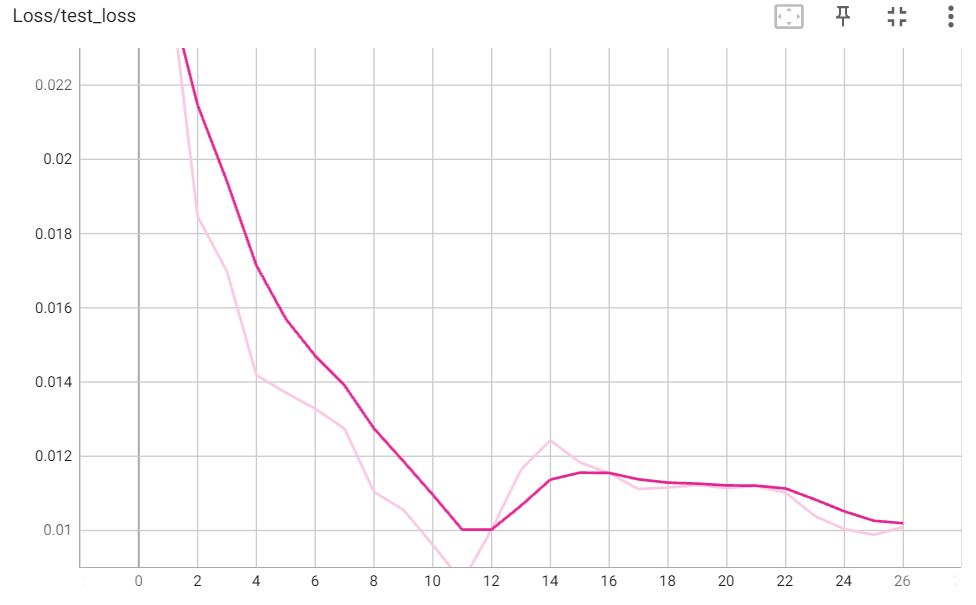

In [207]:
if ALL_CODE:
    model: str = "regnet_8gf"
    num_exp: int = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

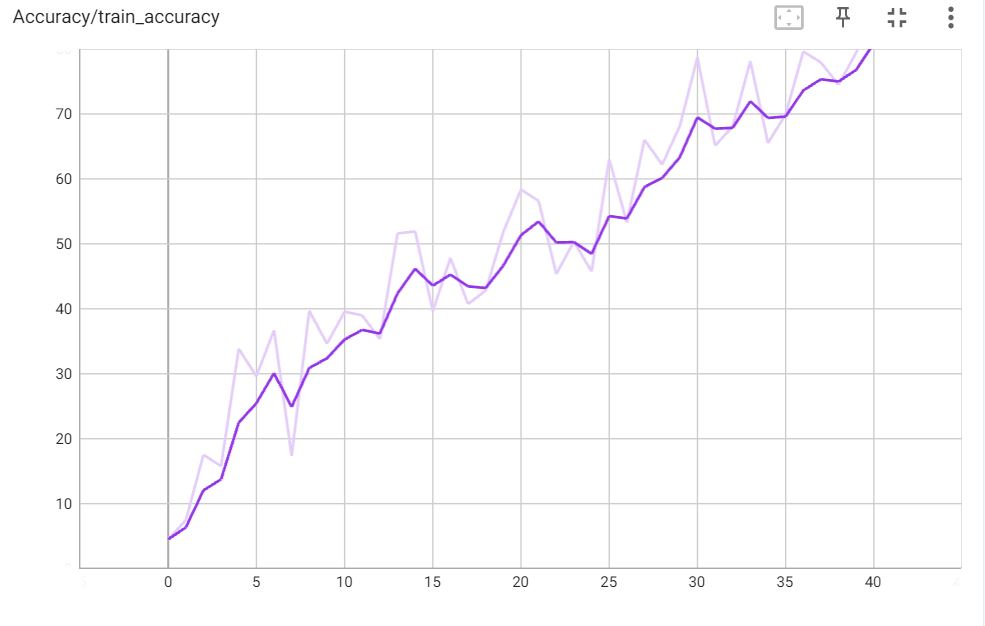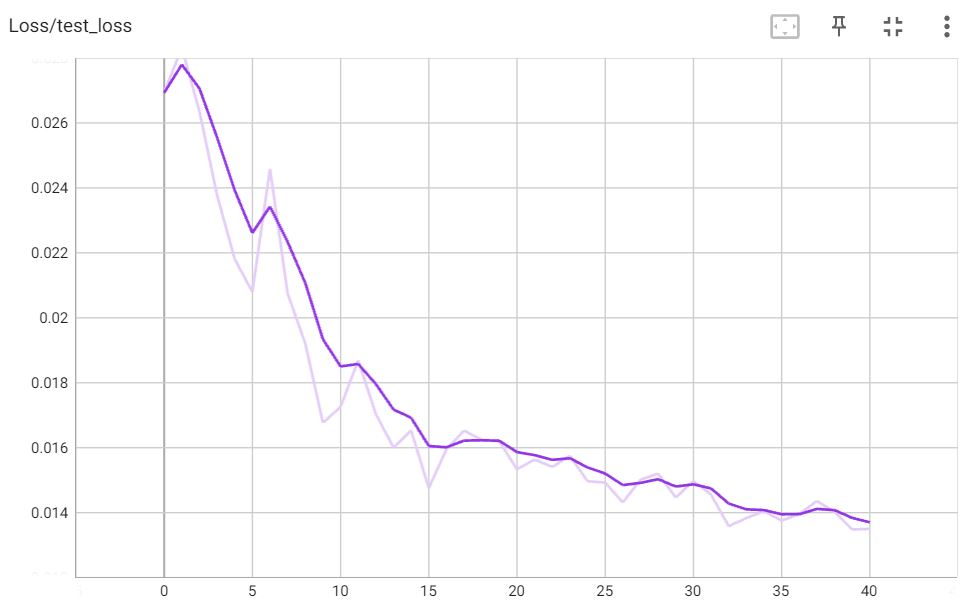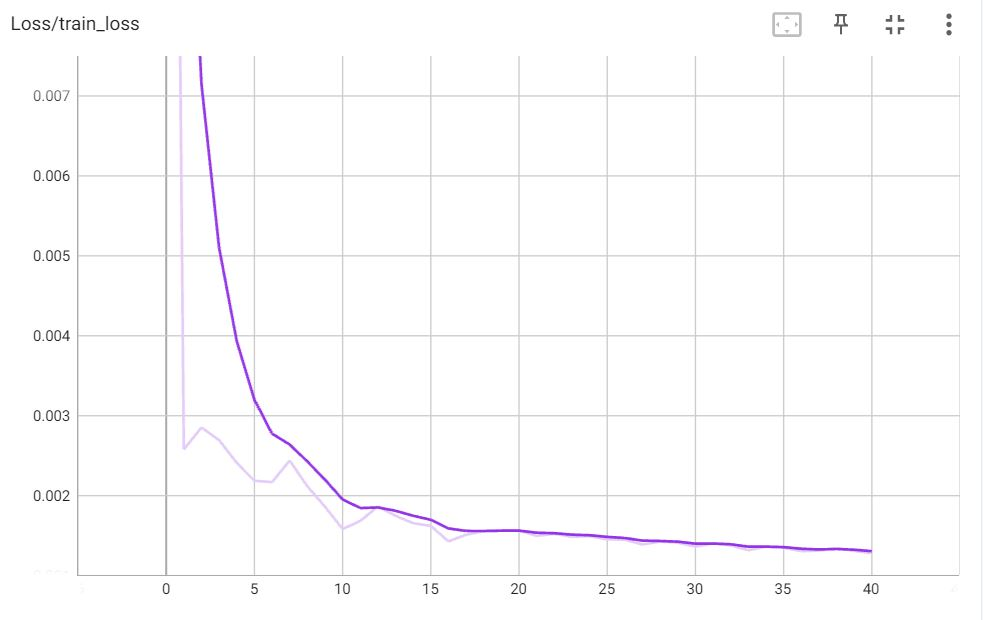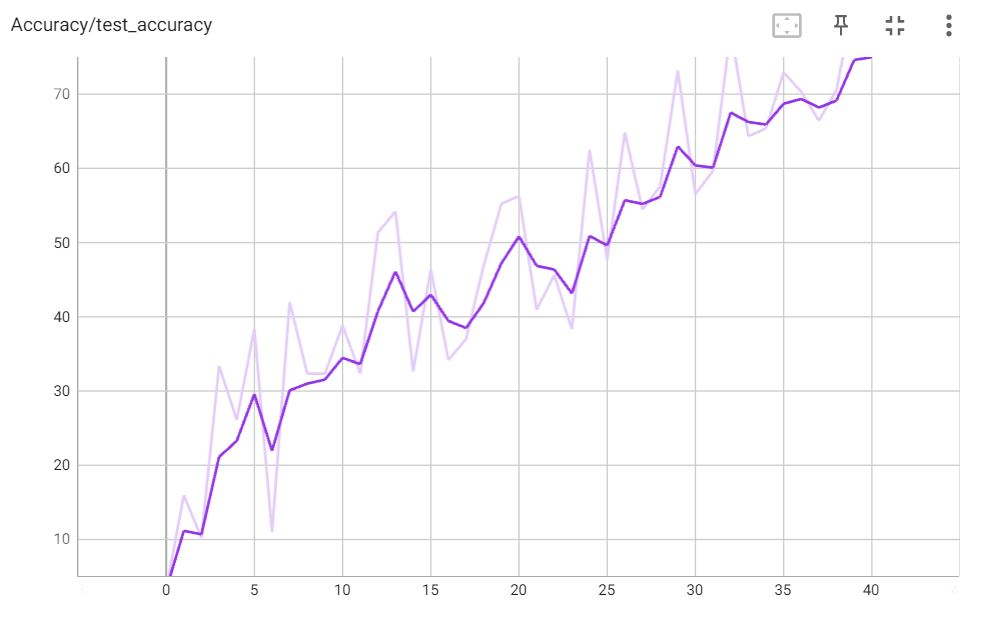

In [208]:
if ALL_CODE:
    model: str = "resnet_101"
    num_exp = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

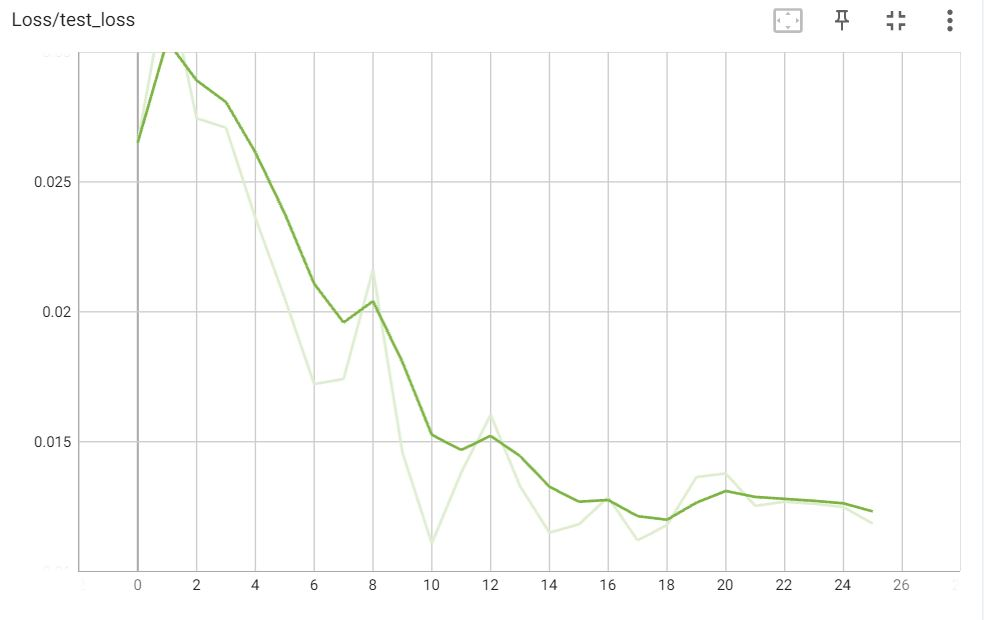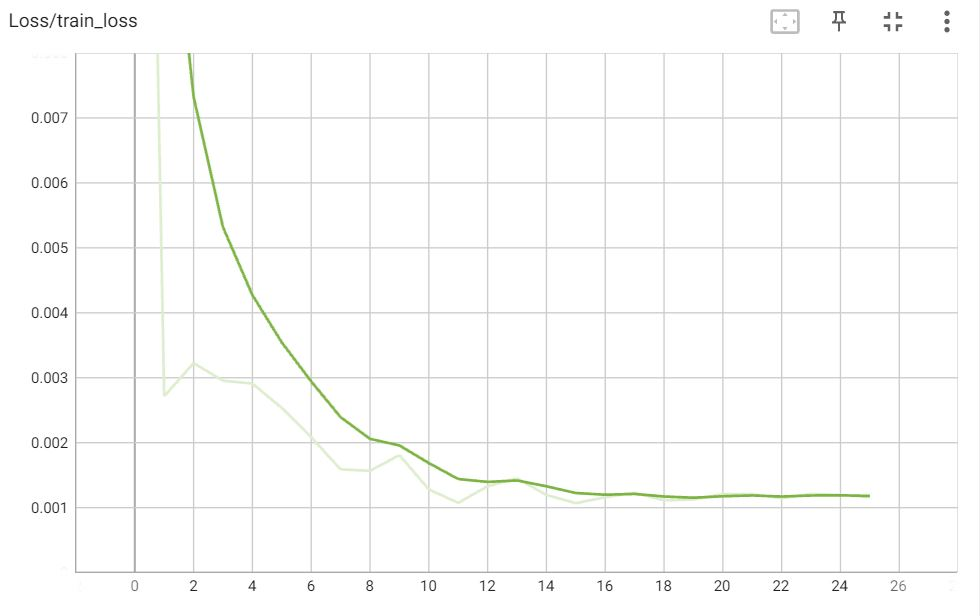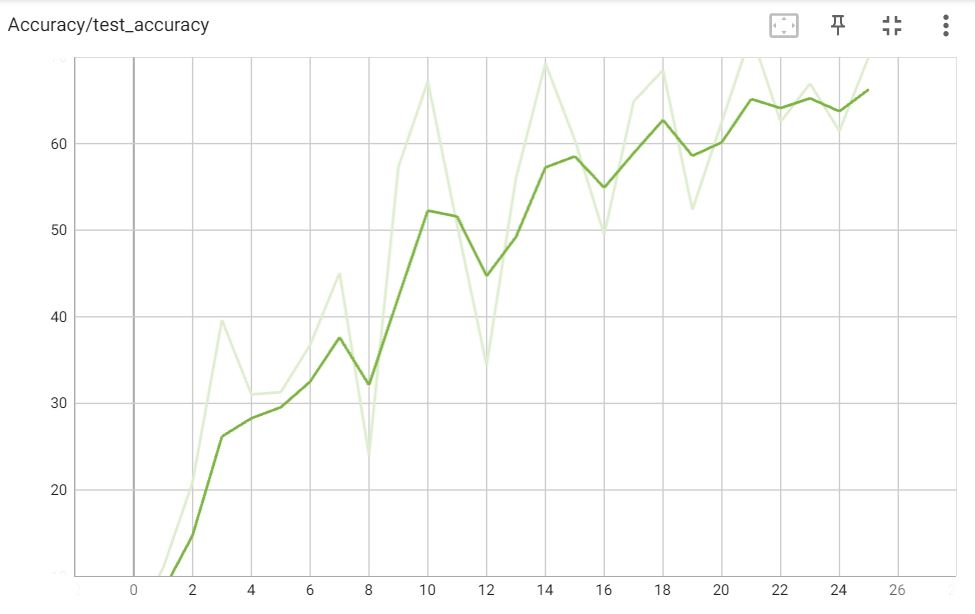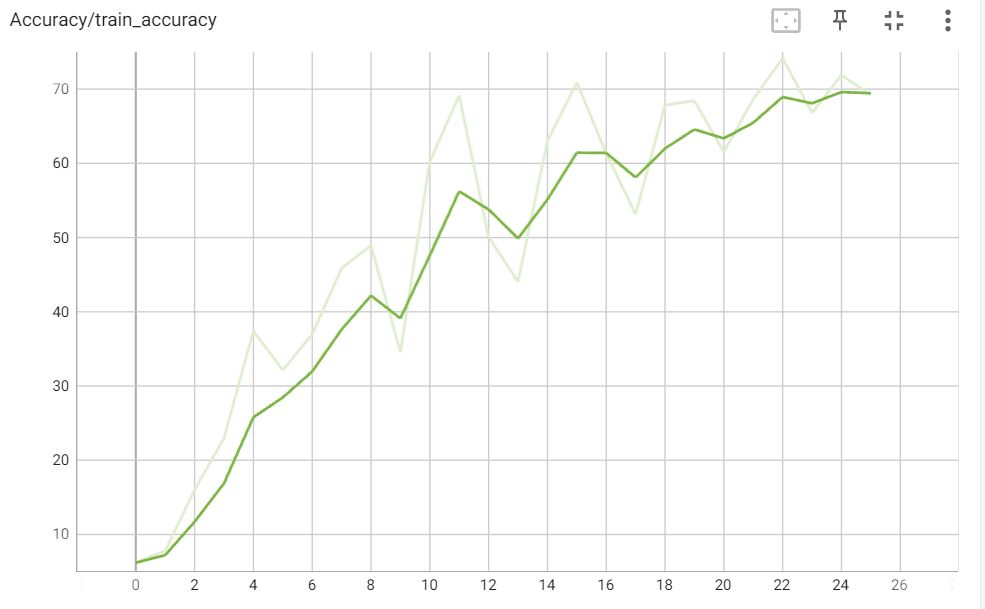

In [209]:
if ALL_CODE:
    model: str = "convnext_small"
    num_exp: int = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

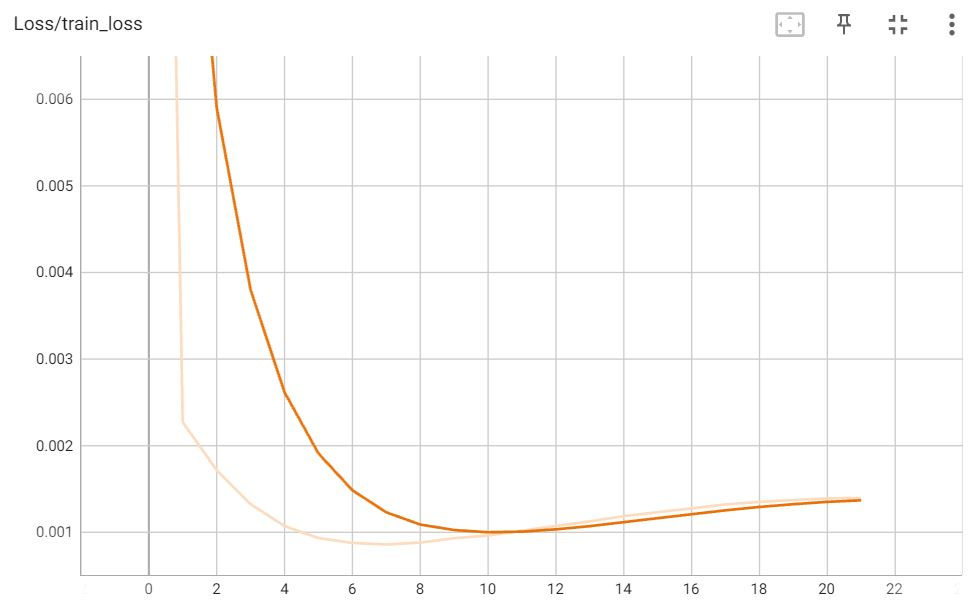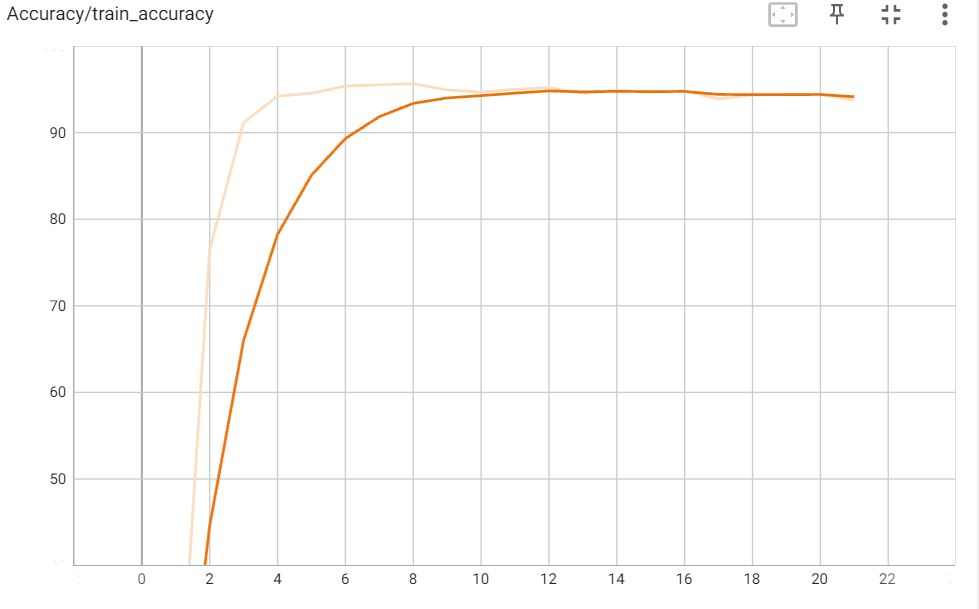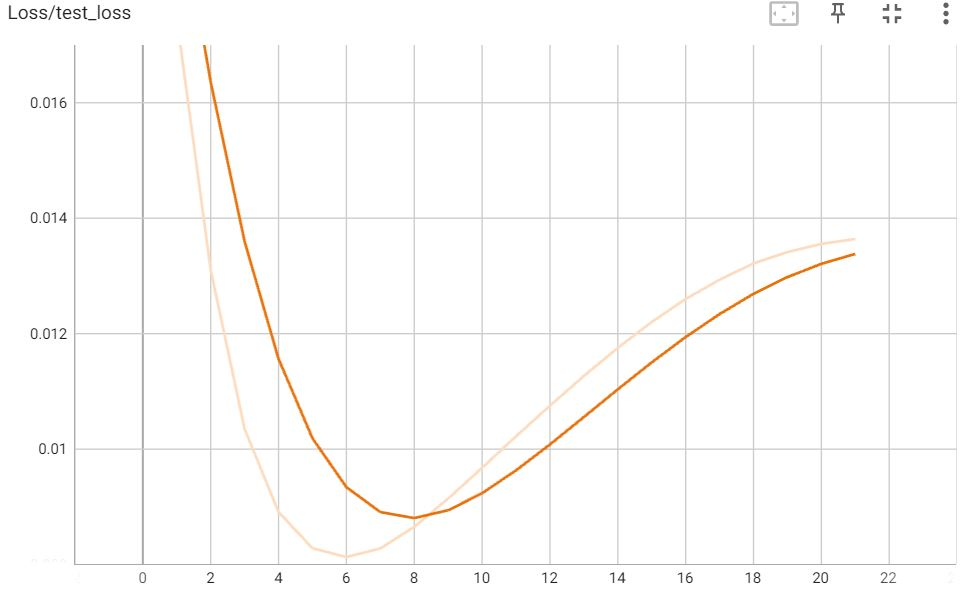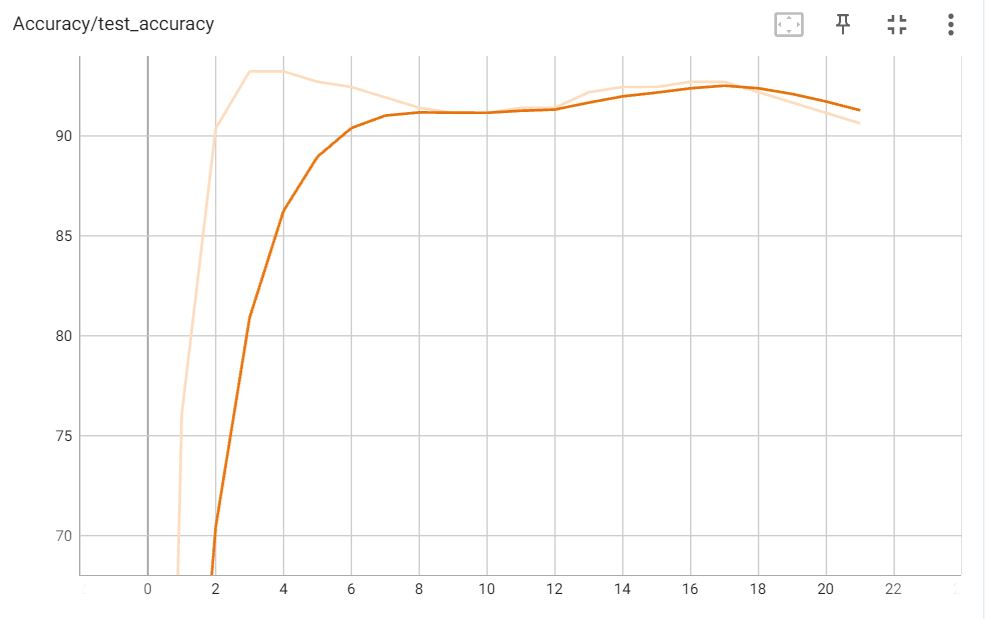

In [210]:
if ALL_CODE:
    model:str="efficientnet_M"
    num_exp: int = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

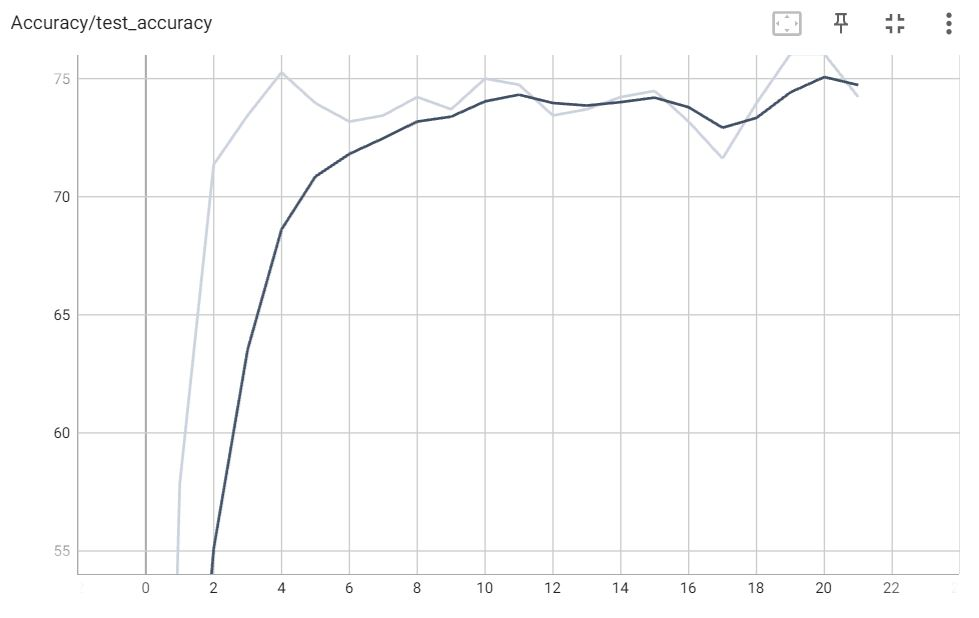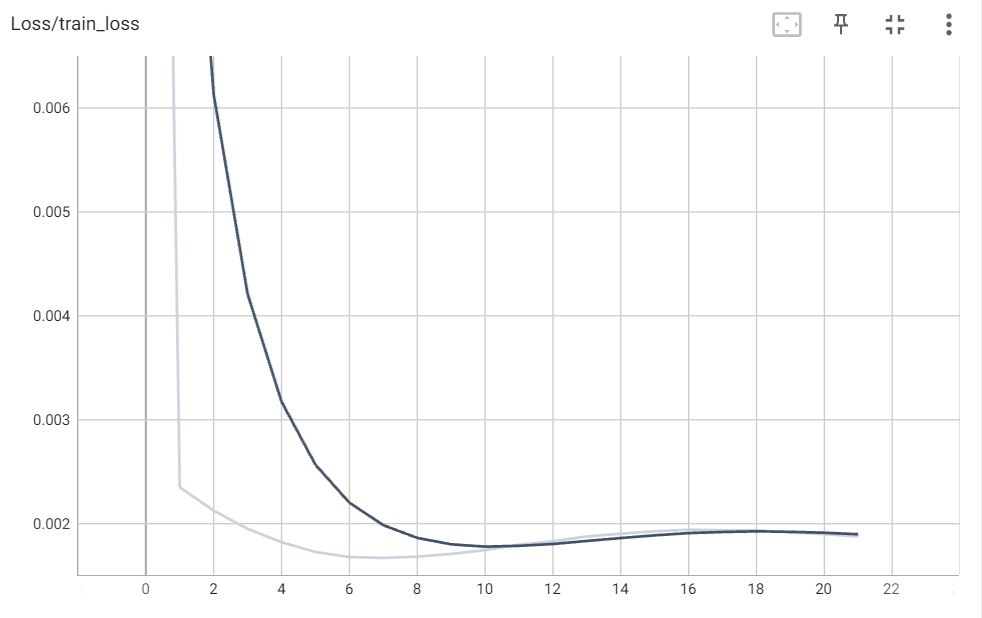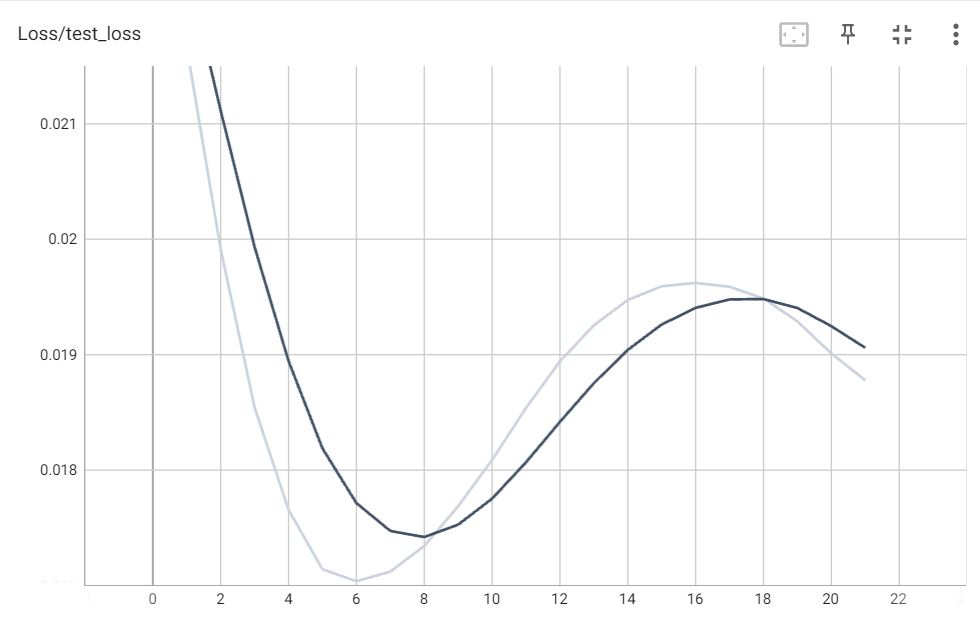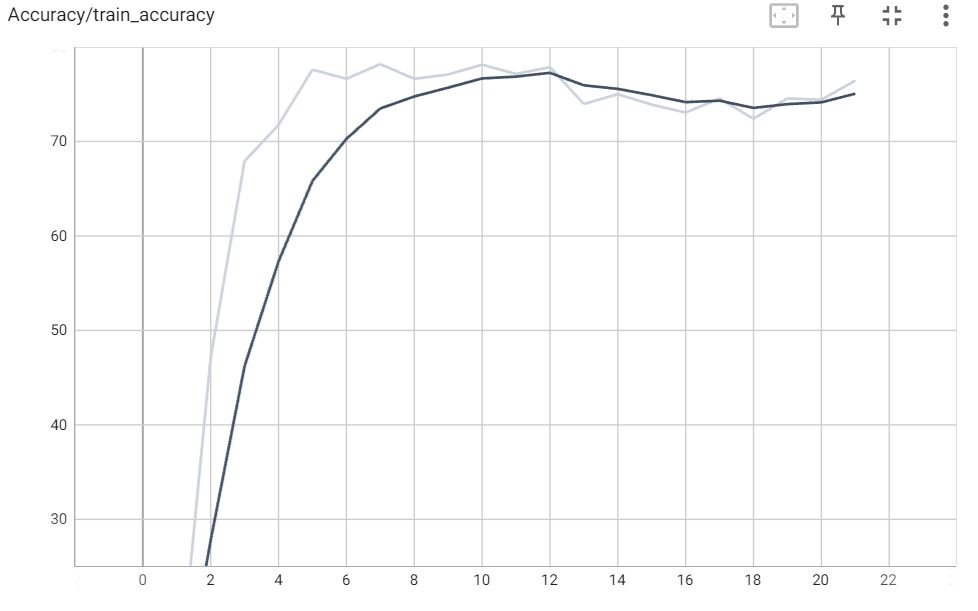

In [211]:
if ALL_CODE:
    model: str = "resnet_152"
    num_exp: int = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

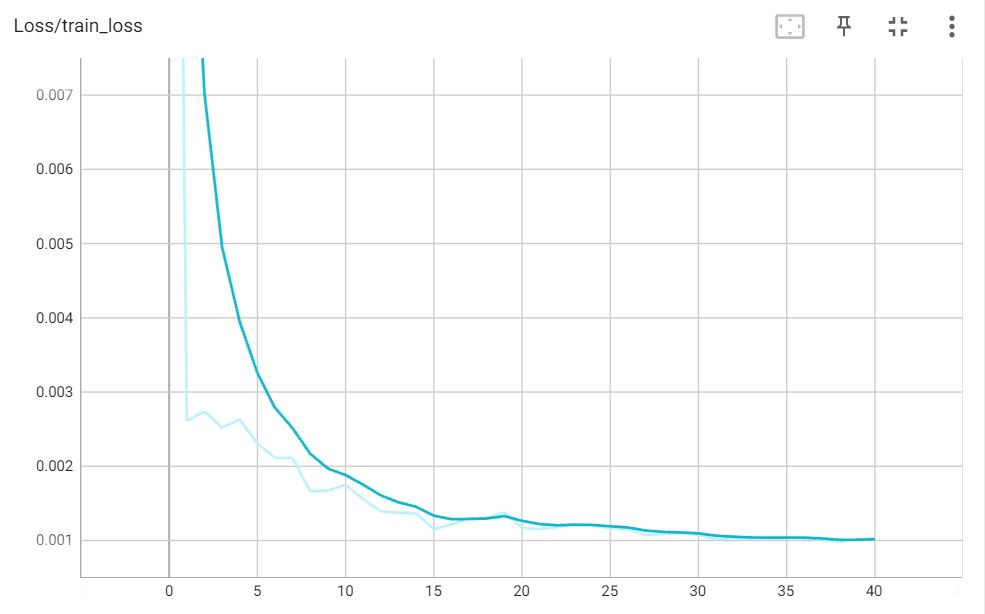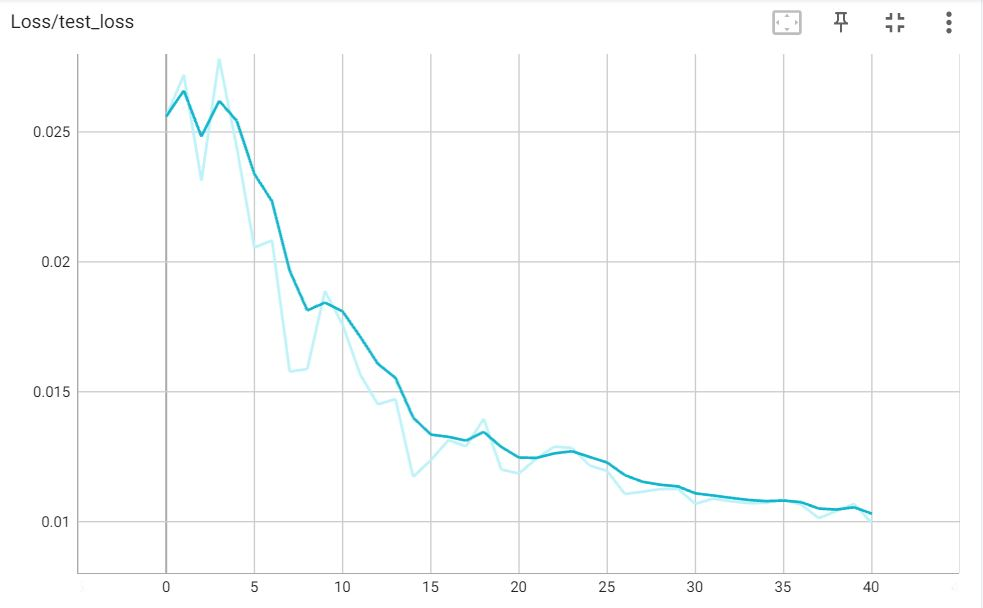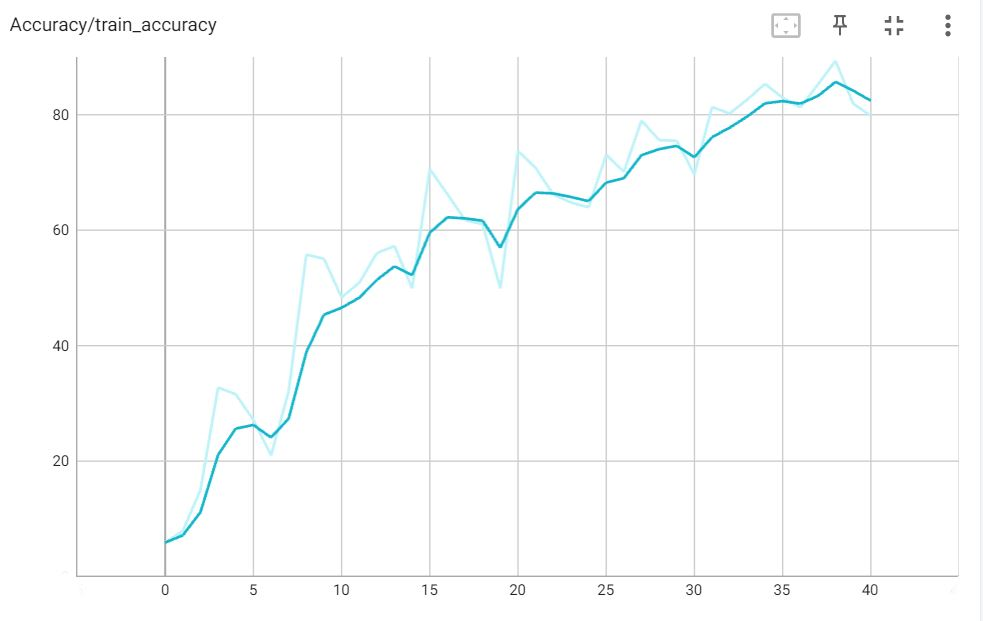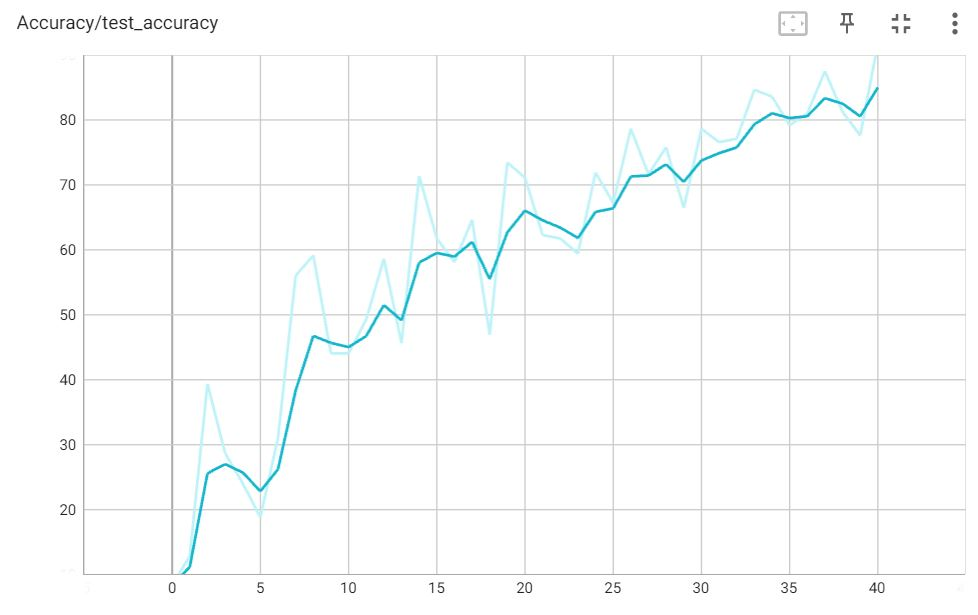

In [212]:
if ALL_CODE:
    model: str = "wideresnet_50"
    num_exp: int = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

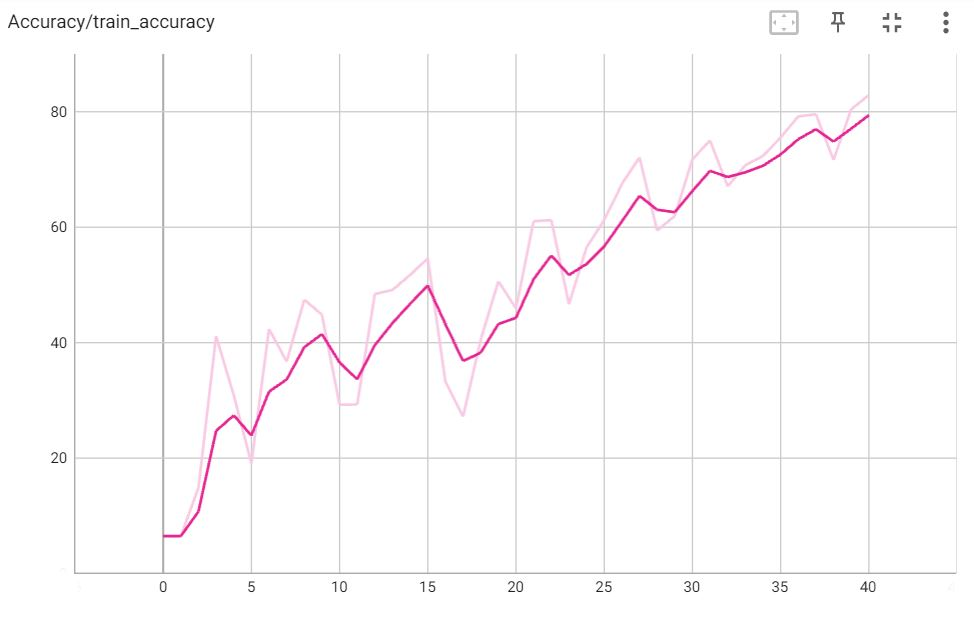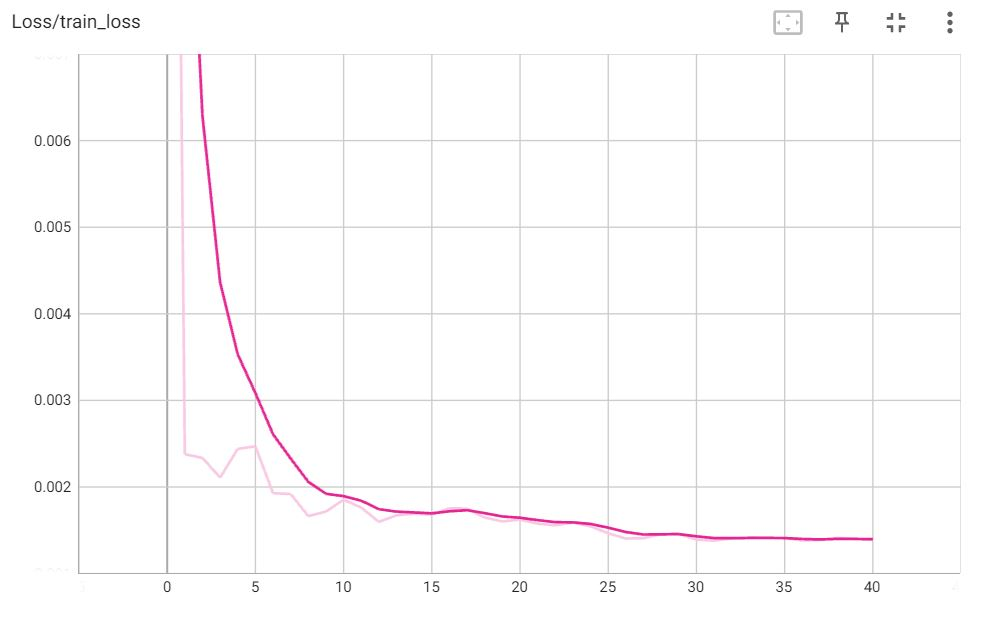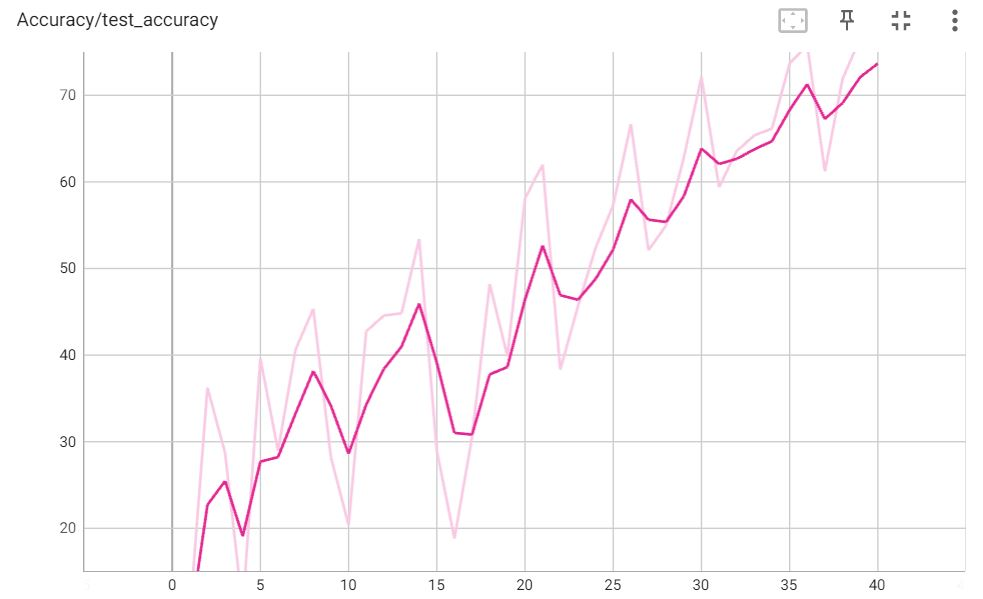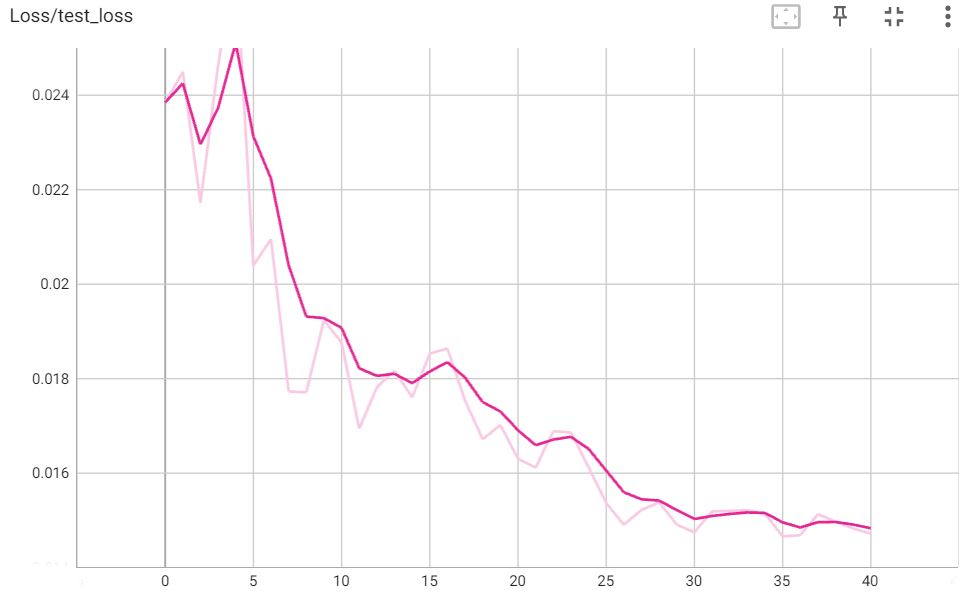

In [213]:
if ALL_CODE:
    model:str="resnext_101"
    num_exp: int = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

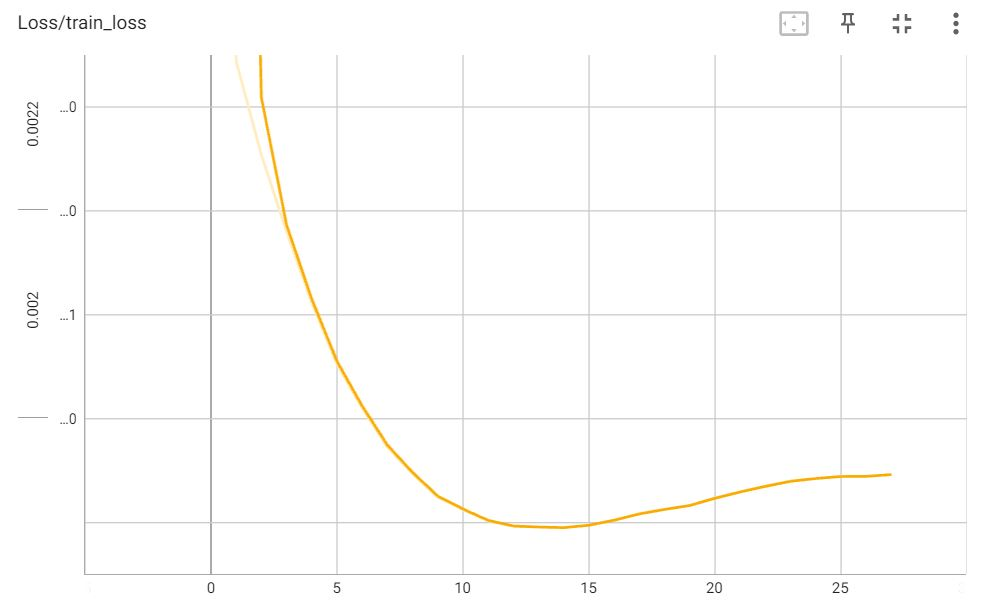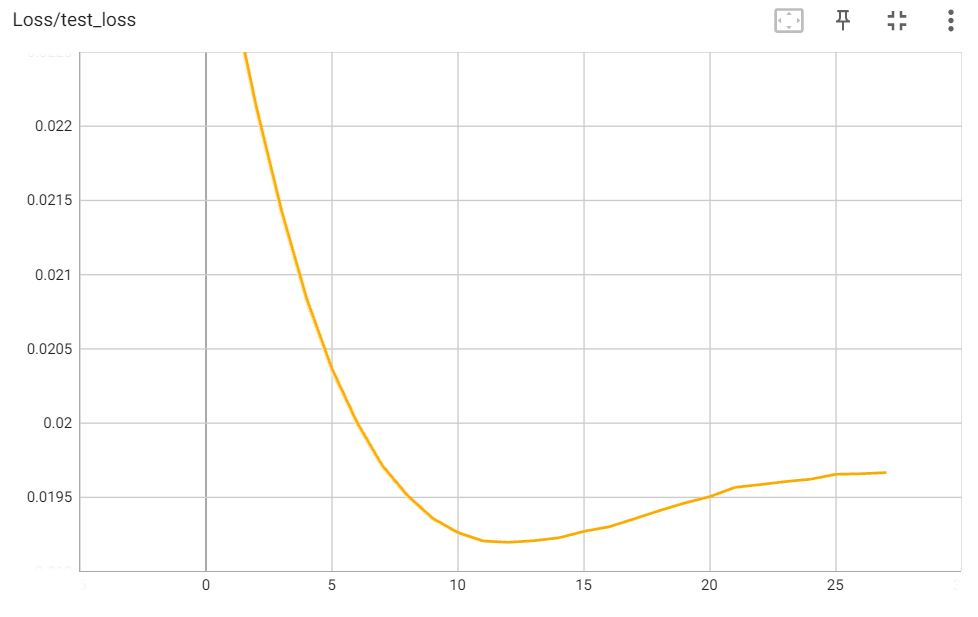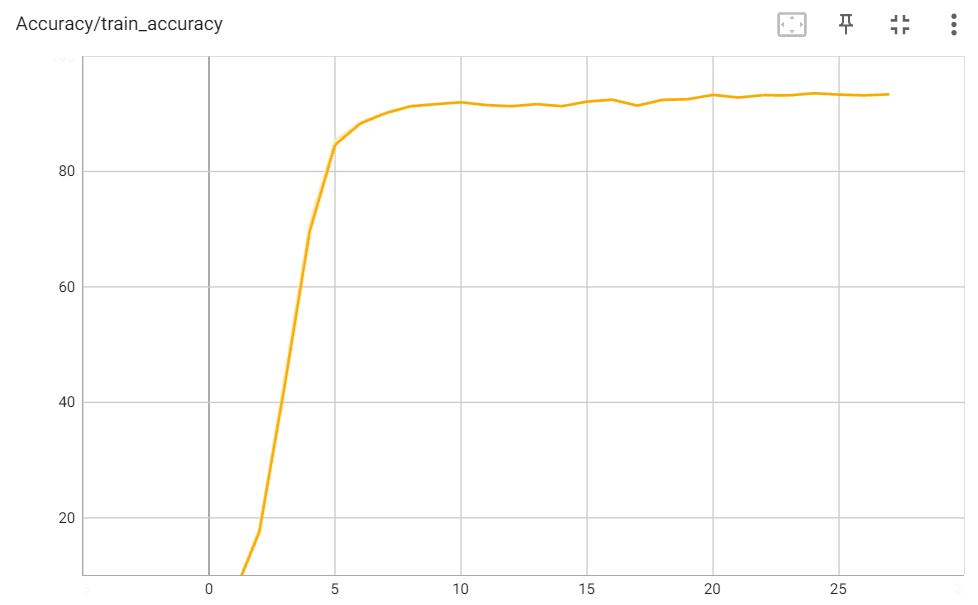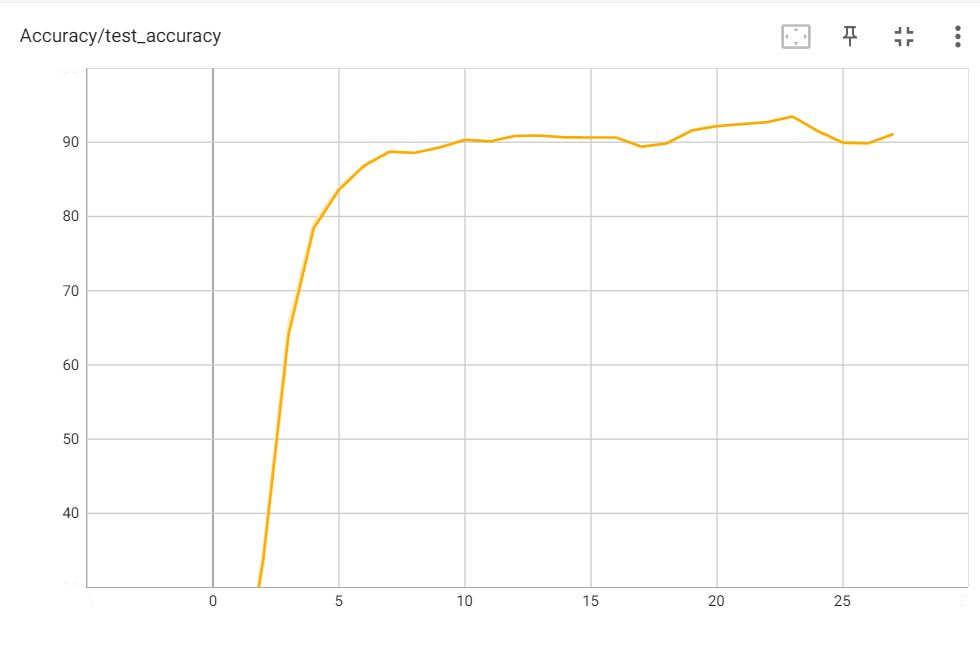

In [214]:
if ALL_CODE:
    model:str = "regnet_16gf"
    num_exp: int = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

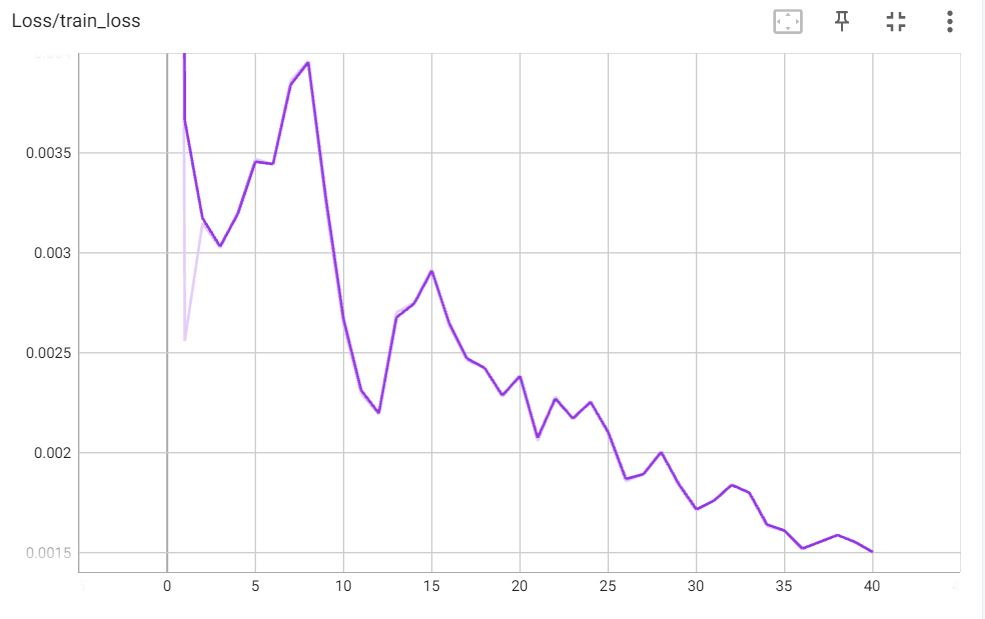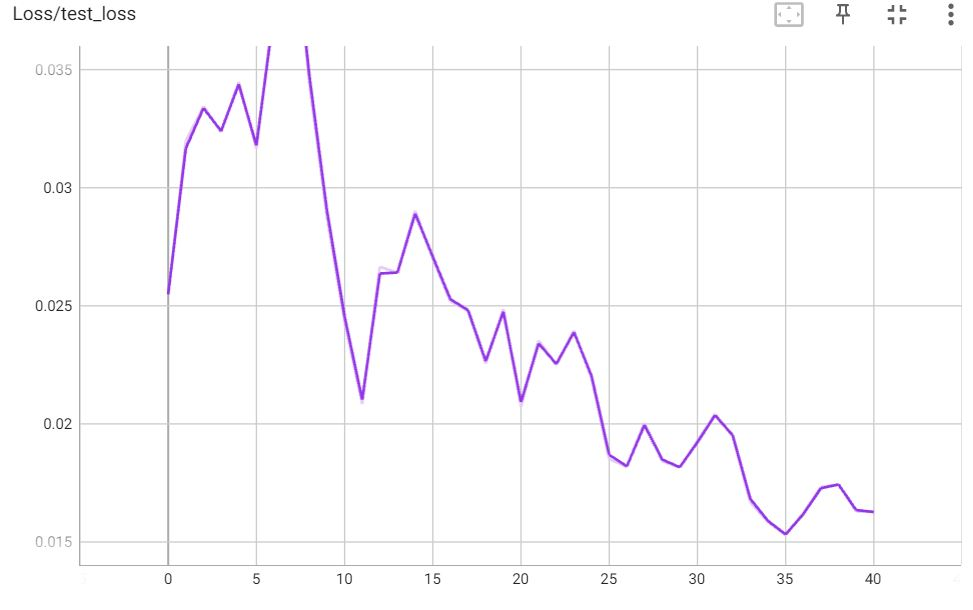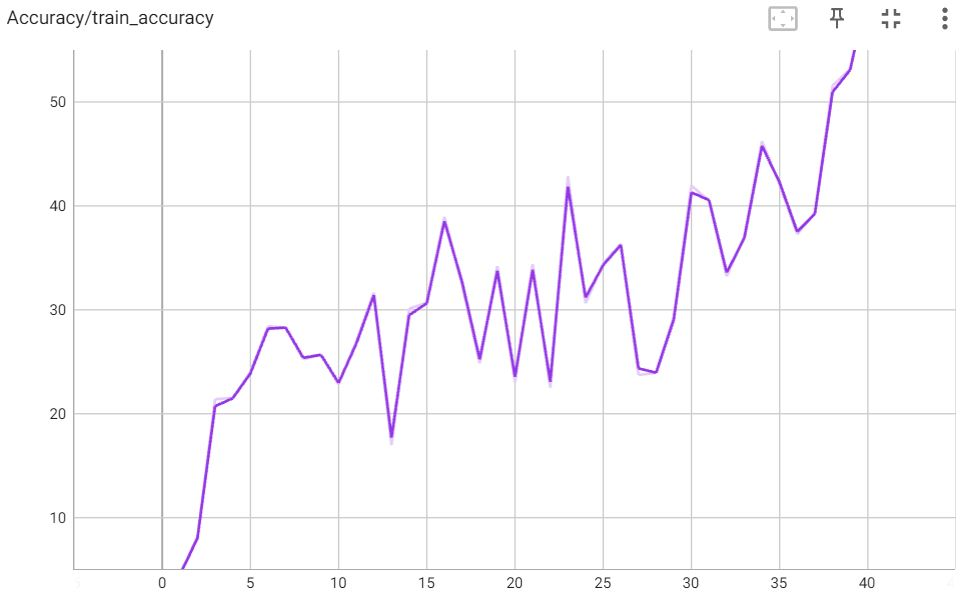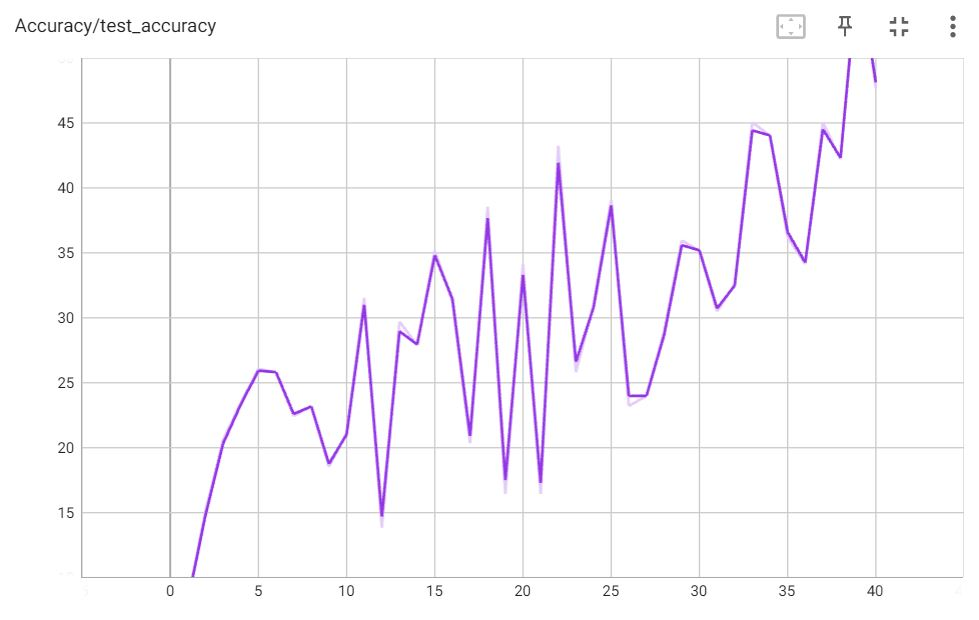

In [215]:
if ALL_CODE:
    model: str = "vit_16"
    num_exp: int = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

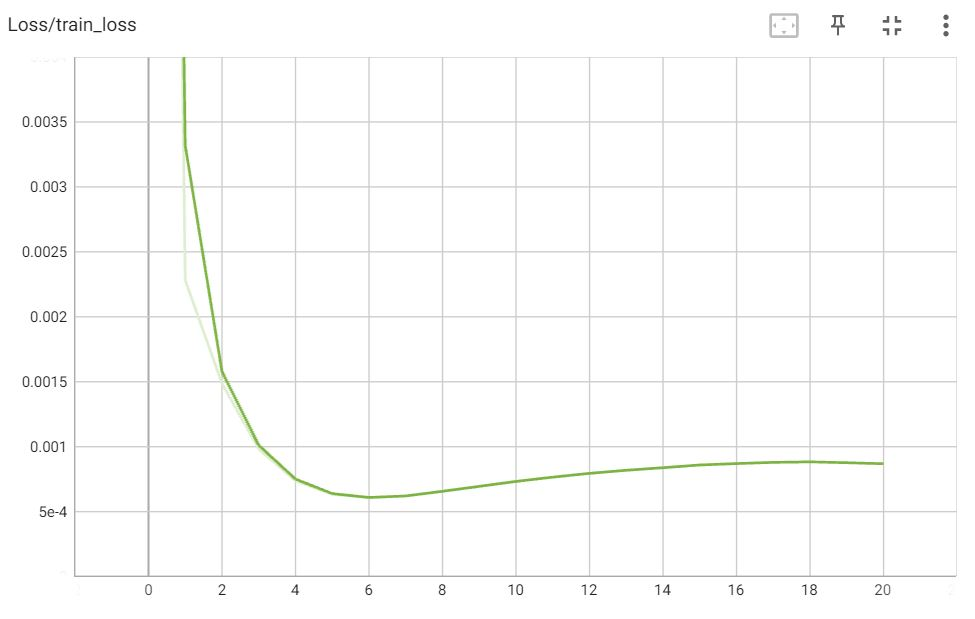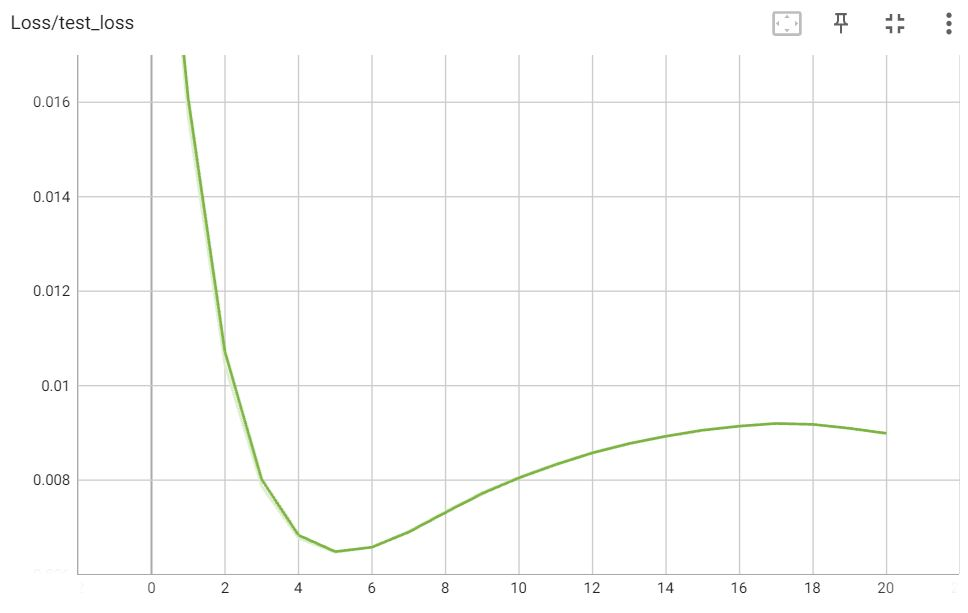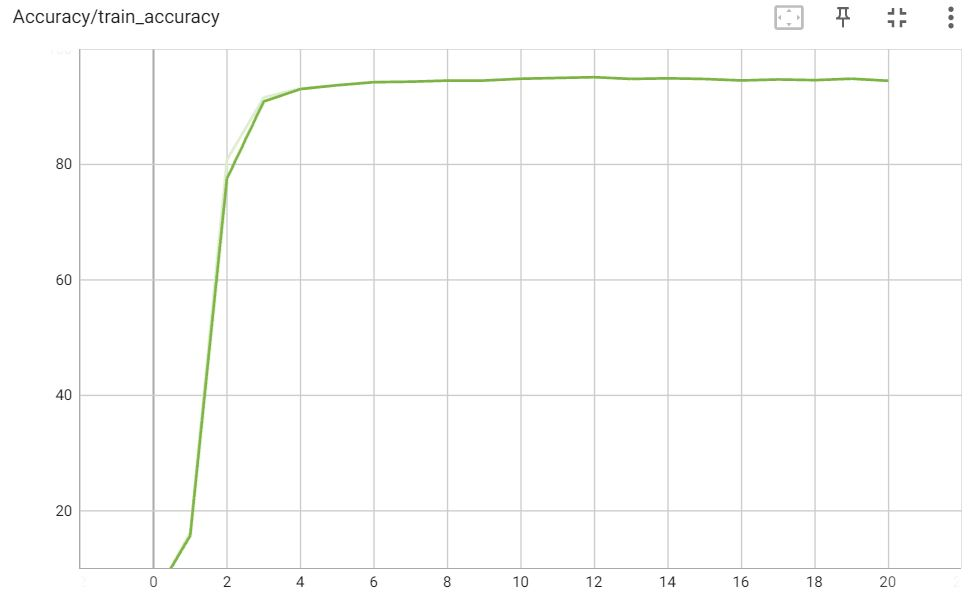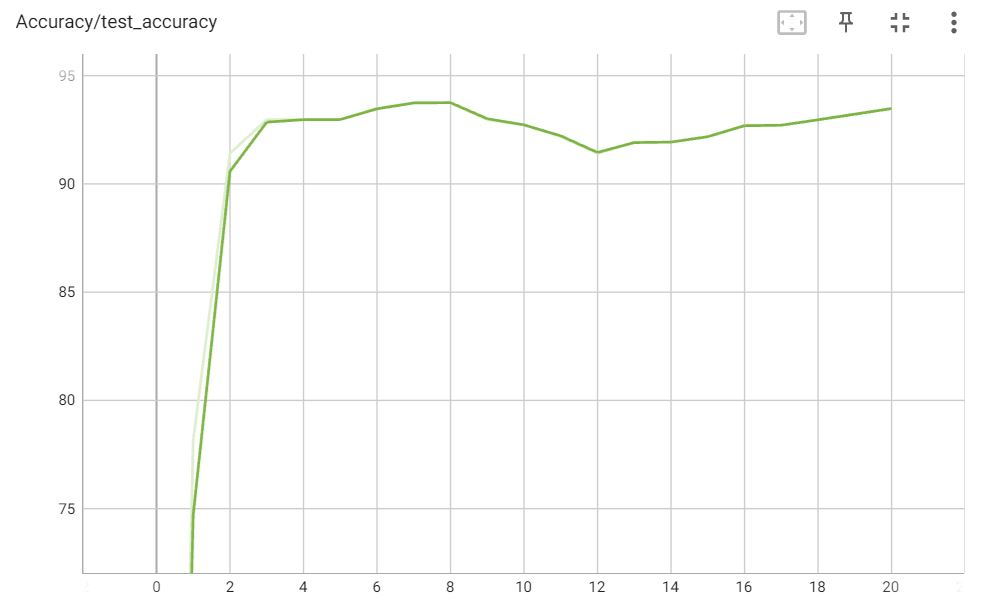

In [216]:
if ALL_CODE:
    model: str = "vit_32"
    num_exp: int = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

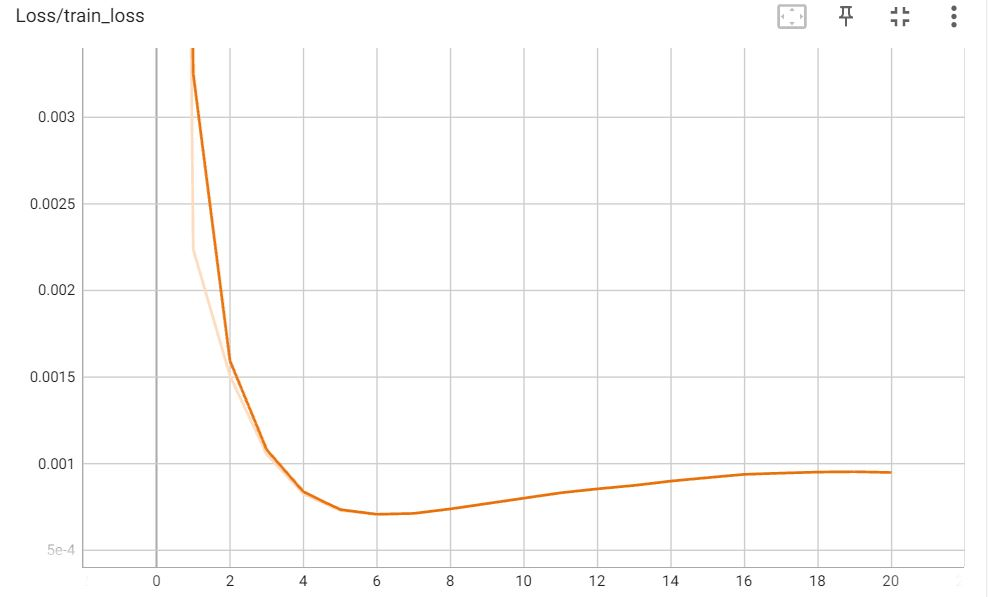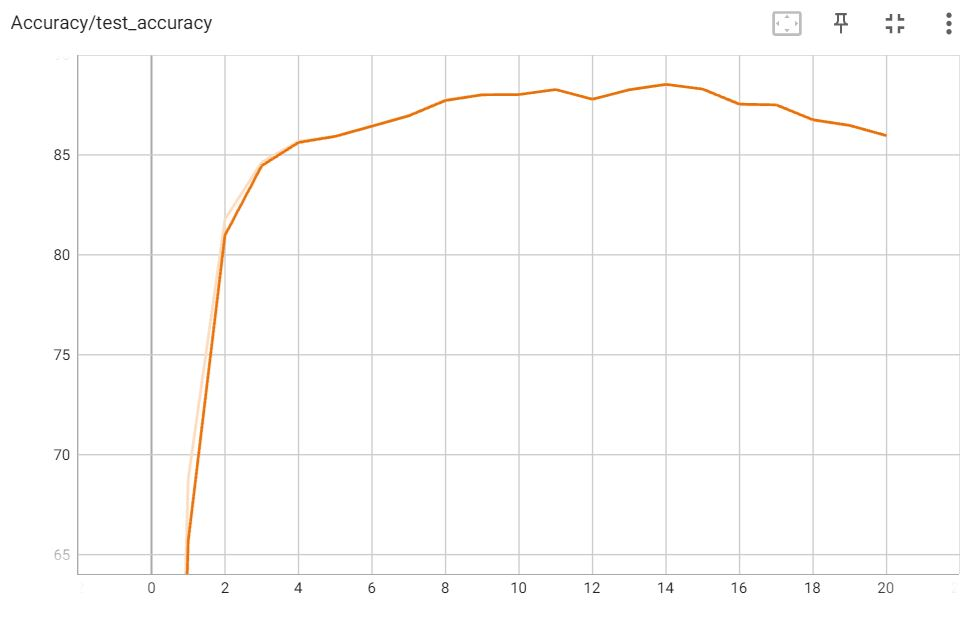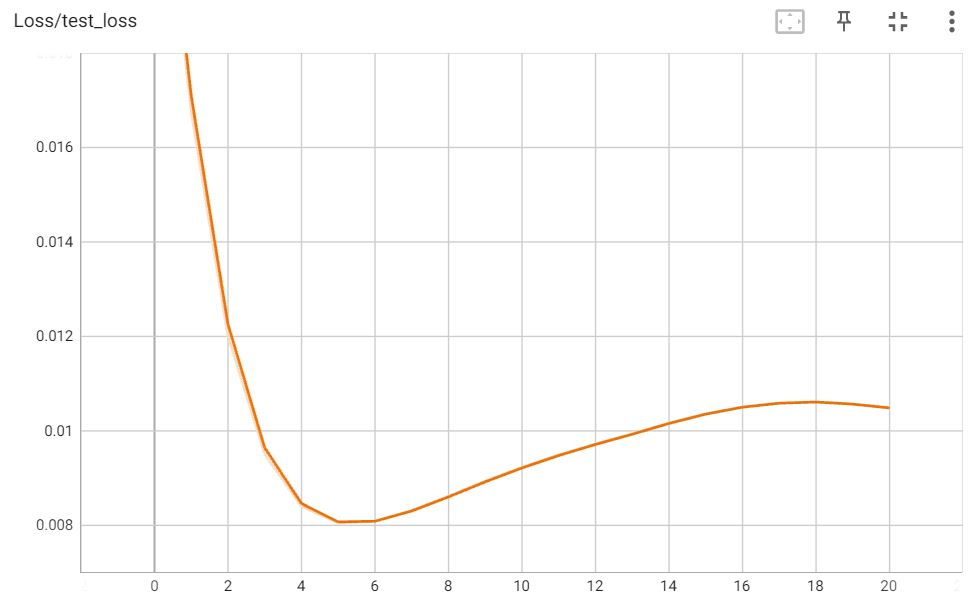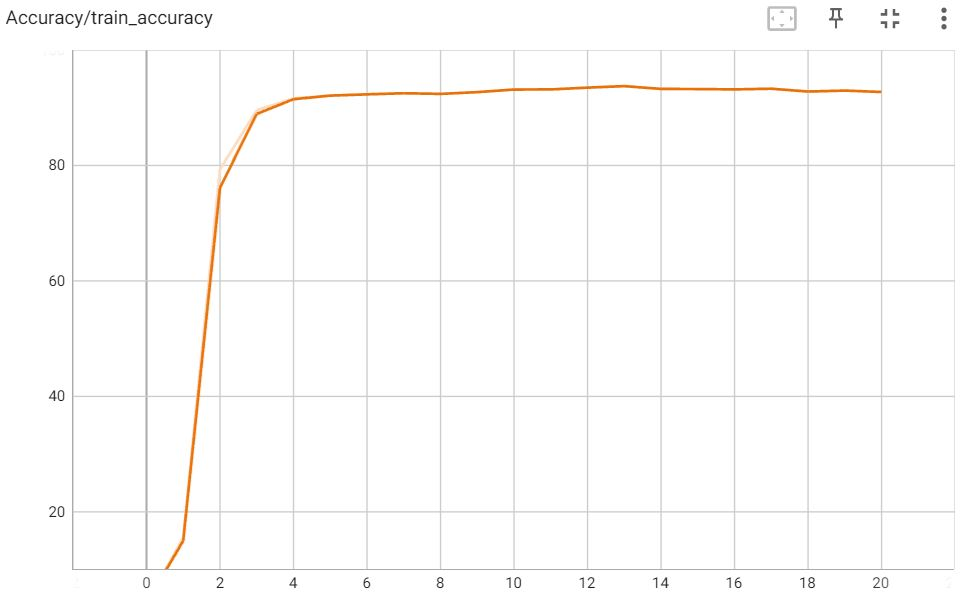

In [217]:
if ALL_CODE:
    model:str="convnext_base"
    num_exp: int = 0
    log_dir: str = "../Material/runs/find_overfitting/" + model + "/exp" + str(num_exp)
    find_overfitting(model = model, data = "real")

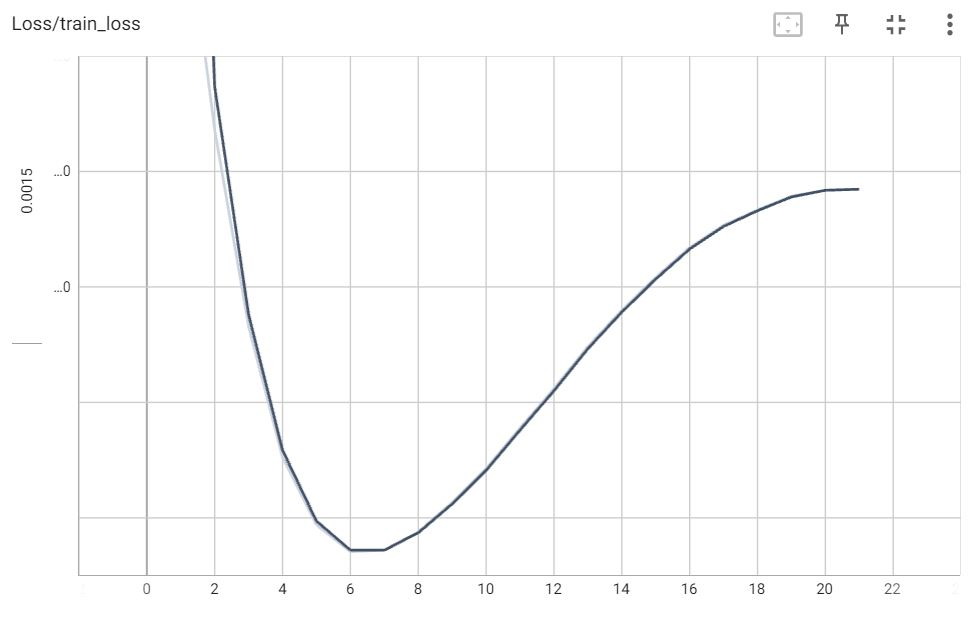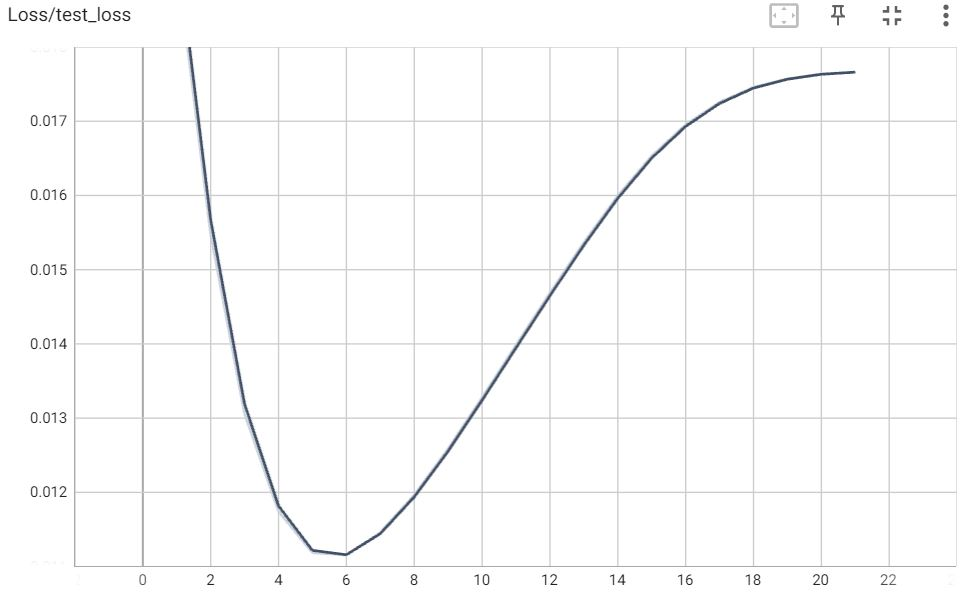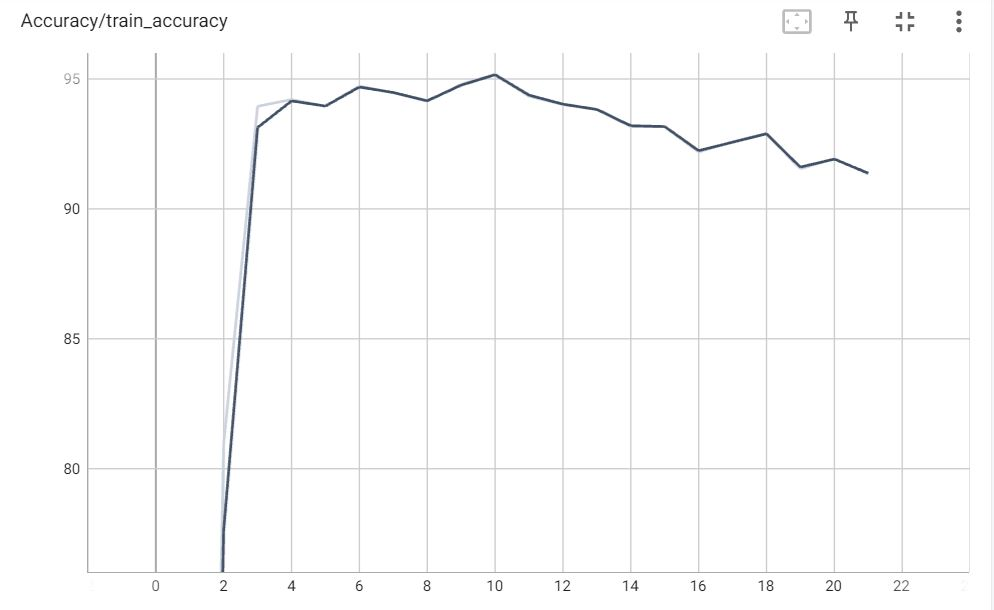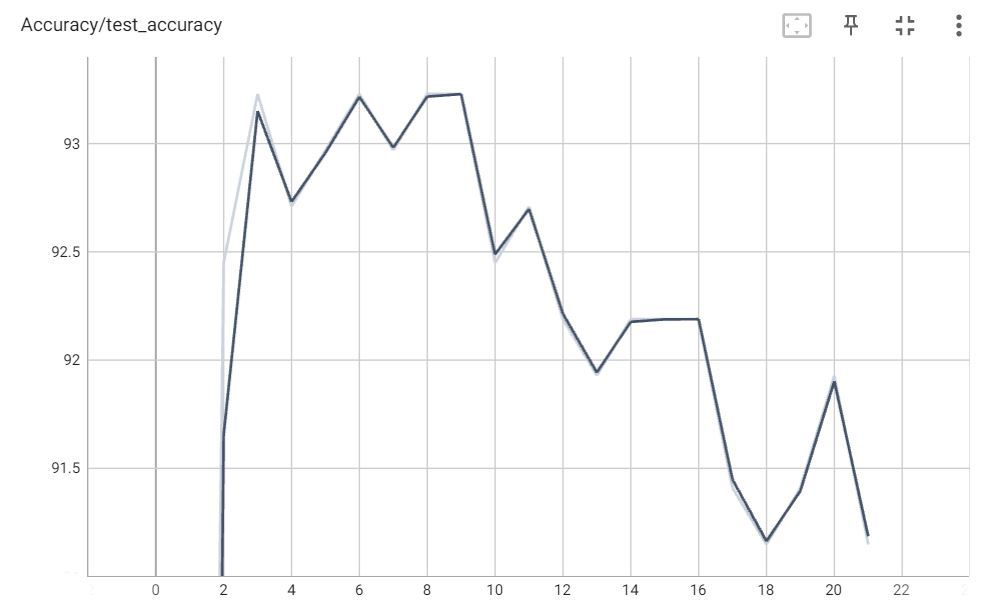

####11.2 SELECTING A BASELINE ARCHITECTURE

Here is emploid grid search to select a baseline architecture (given hinton methodology in previous section do not give us hint of which architecture employ).Not that disentangling architecture by other hyperparameters is nonoptimal but in present work given resource limitation is necessary

the following architecture are compared
- convnext_base
- regnet_y_16gf
- resnet_152
- vit_B_32
- resnext_101
- wide_resnet50

here decide to increase a litle bit representation capability adding after each architecture classifier
- two fuly connected layers

  

  following [116] initialise with torch.nn.init.xavier_normal_ 

- batchnorm 

are added after each fully connected last two layers as suggested in [76][75]

author are aware of supposedly better alternative (e.g. for small batch like group norm or coupled group norm + weight standardization or switchable normalization) however standard batch normalization is used in pretrained architecture and want to follow backbone architecture approach

- dropout

[122] suggest to insert dropout after second last layerand with half magnitdue after every convolution (this is not done given the fact pretrained backbone are employed and learned weight will lose sense)


#####**11.2.1 Lr and Lr range test**

######For P->R

In [218]:
MAX_LR_PRODUCT: Dict[str, float] = {}
MIN_LR_PRODUCT: Dict[str, float] = {}

regnet

In [219]:
if ALL_CODE:
    lr_range_test(model = "regnet_our")

In [220]:
MAX_LR_PRODUCT["regnet_our"] = 0.055977744874758796
MIN_LR_PRODUCT["regnet_our"] = 0.00019175105923288407

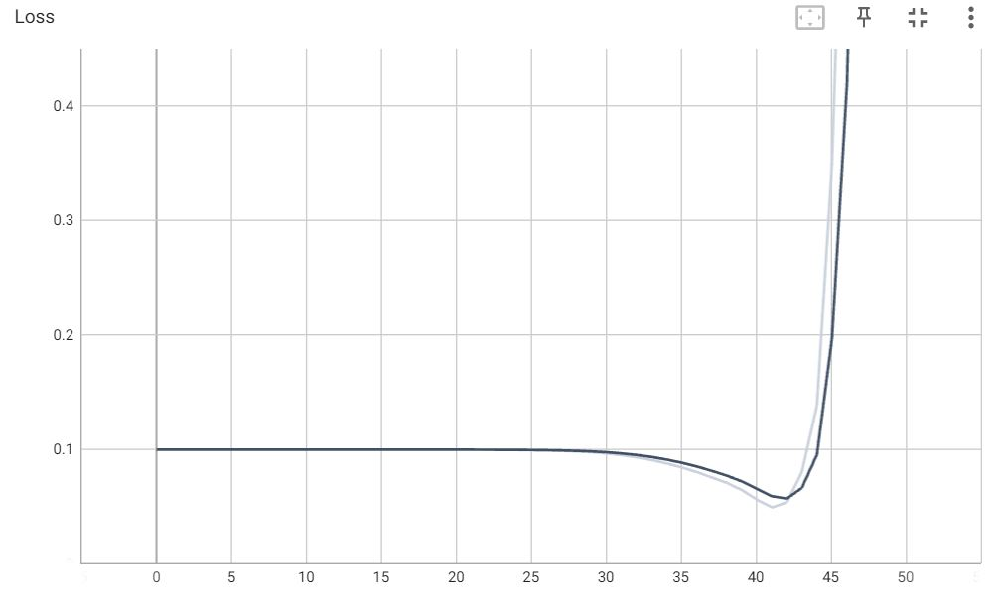

convnext

In [221]:
if ALL_CODE:
    lr_range_test(model = "convnext_our")

In [222]:
MAX_LR_PRODUCT["convnext_our"] = 0.055977744874758796
MIN_LR_PRODUCT["convnext_our"] = 0.00012783403948858938

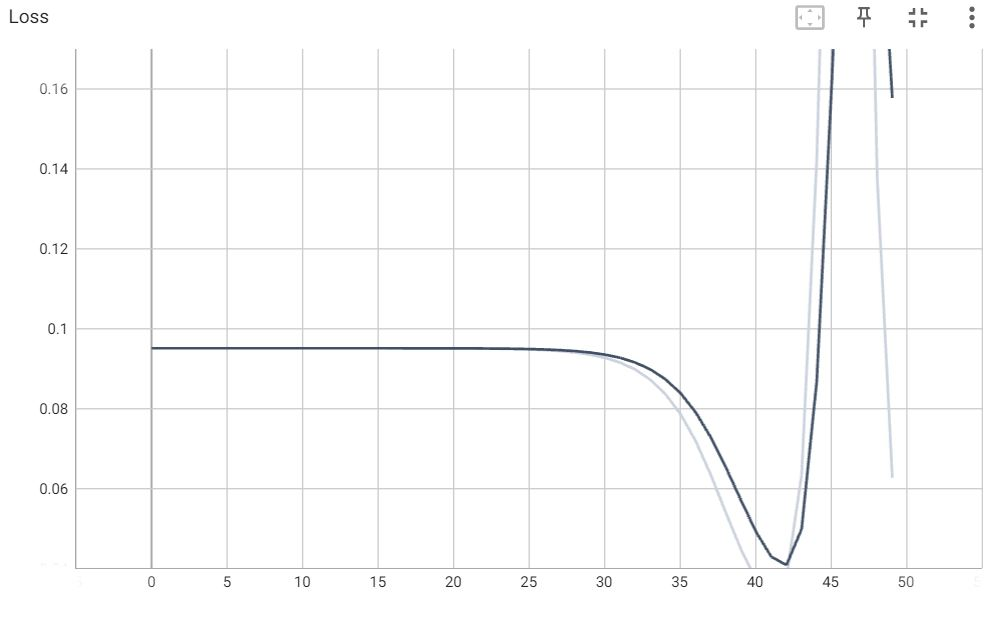

wideresnet

In [223]:
if ALL_CODE:
    lr_range_test(model = "wideresnet_our")

In [224]:
MAX_LR_PRODUCT["wideresnet_our"] = 0.055977744874758796
MIN_LR_PRODUCT["wideresnet_our"] = 0.0002876265888493261

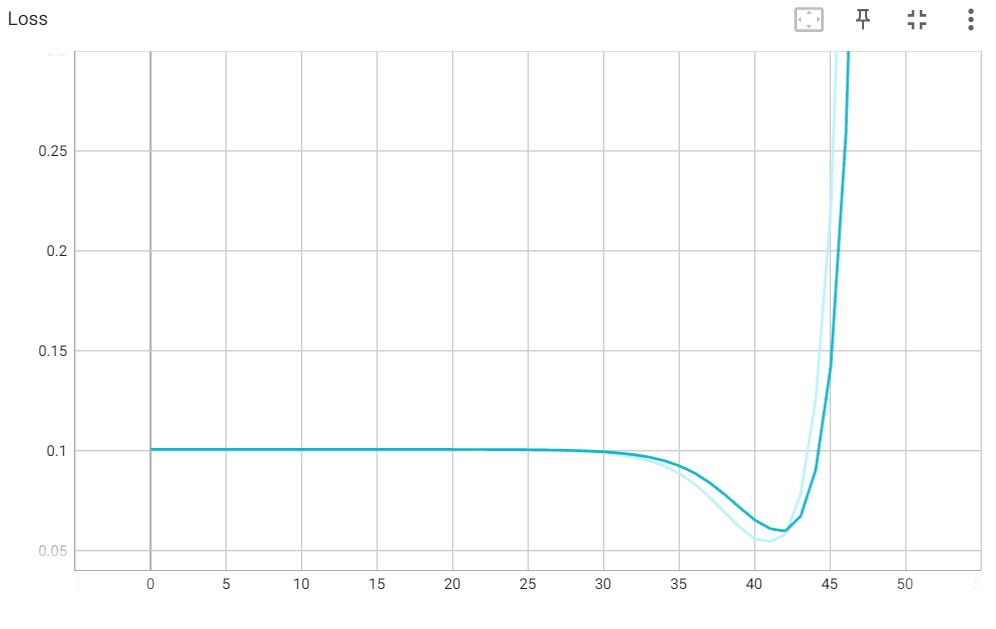

resnet

In [225]:
if ALL_CODE:
    lr_range_test(model = "resnet_our")

In [226]:
MAX_LR_PRODUCT["resnet_our"] = 0.055977744874758796
MIN_LR_PRODUCT["resnet_our"] = 0.00012783403948858938

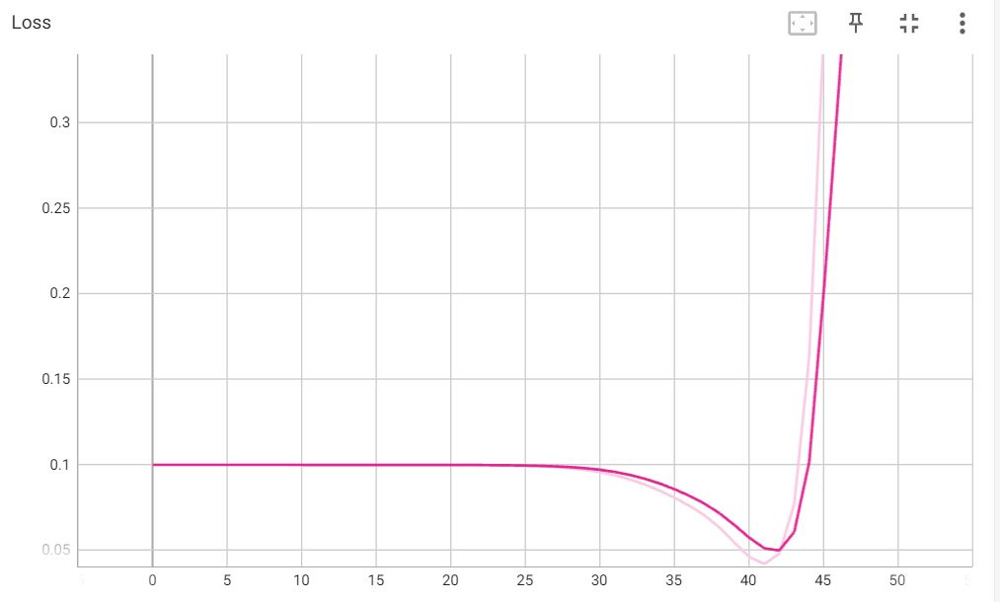

resnext

In [227]:
if ALL_CODE:
    lr_range_test(model = "resnext_our")

In [228]:
MAX_LR_PRODUCT["resnext_our"] = 0.055977744874758796
MIN_LR_PRODUCT["resnext_our"] = 0.00012783403948858938

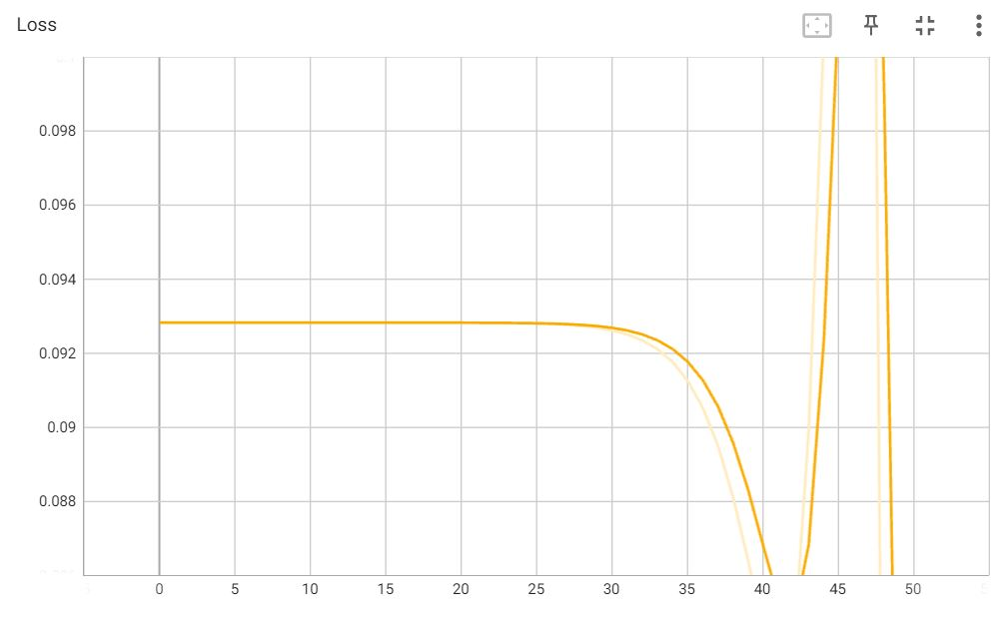

vit

In [229]:
if ALL_CODE:
    lr_range_test(model = "vit_our")

In [230]:
MAX_LR_PRODUCT["vit_our"] = 0.055977744874758796
MIN_LR_PRODUCT["vit_our"] = 0.00012783403948858938

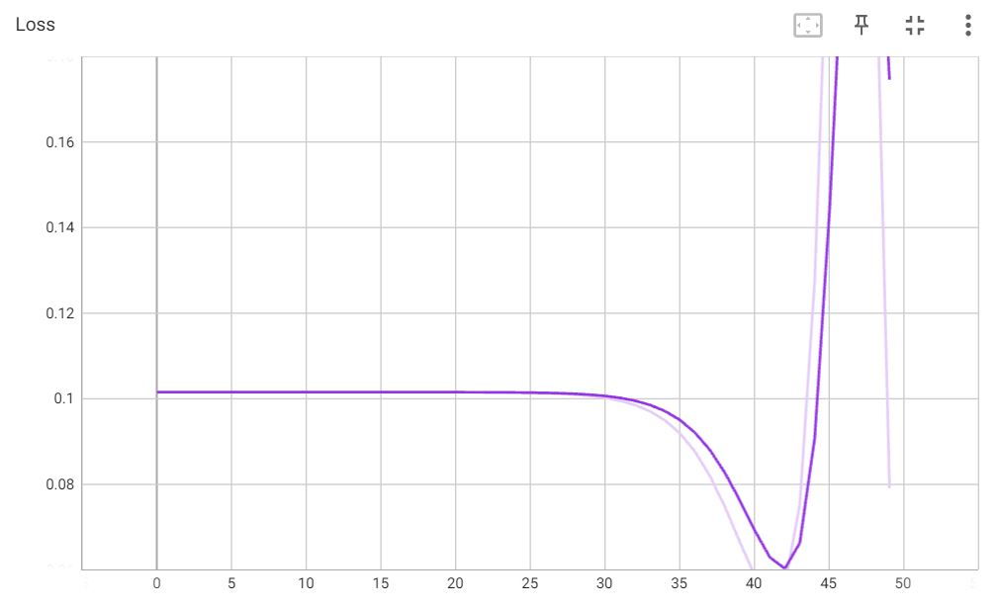

######For R->P

In [231]:
MAX_LR_REAL: Dict[str, float] = {}
MIN_LR_REAL: Dict[str, float] = {}

regnet

In [232]:
if ALL_CODE:
    lr_range_test(model = "regnet_our", data = "real")

In [233]:
MAX_LR_REAL["regnet_our"] = 0.055977744874758796
MIN_LR_REAL["regnet_our"] = 0.0002876265888493261

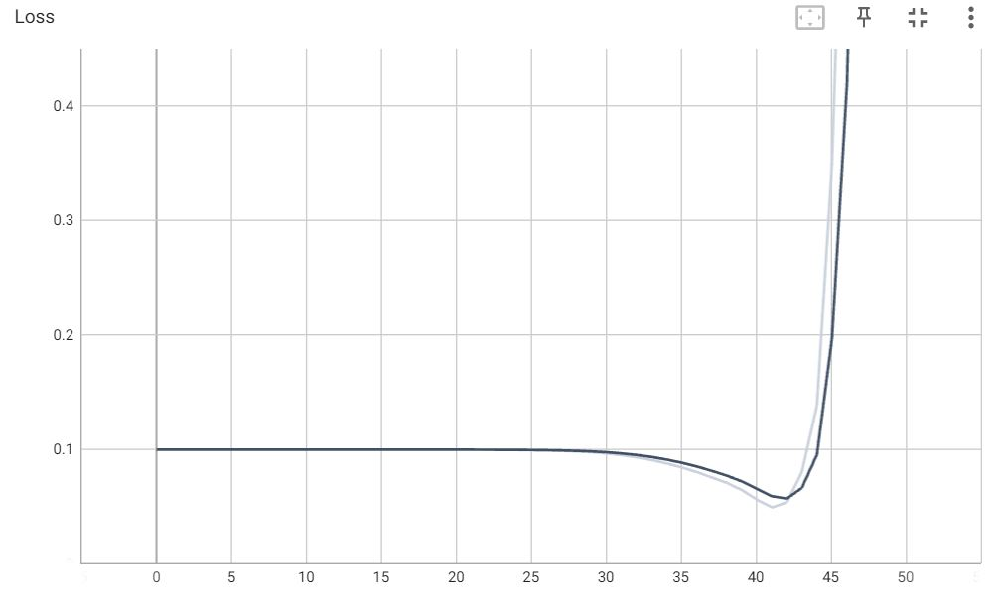

convnext

In [234]:
if ALL_CODE:
    lr_range_test(model = "convnext_our", data = "real")

In [235]:
MAX_LR_REAL["convnext_our"] = 0.055977744874758796
MIN_LR_REAL["convnext_our"] = 0.00012783403948858938

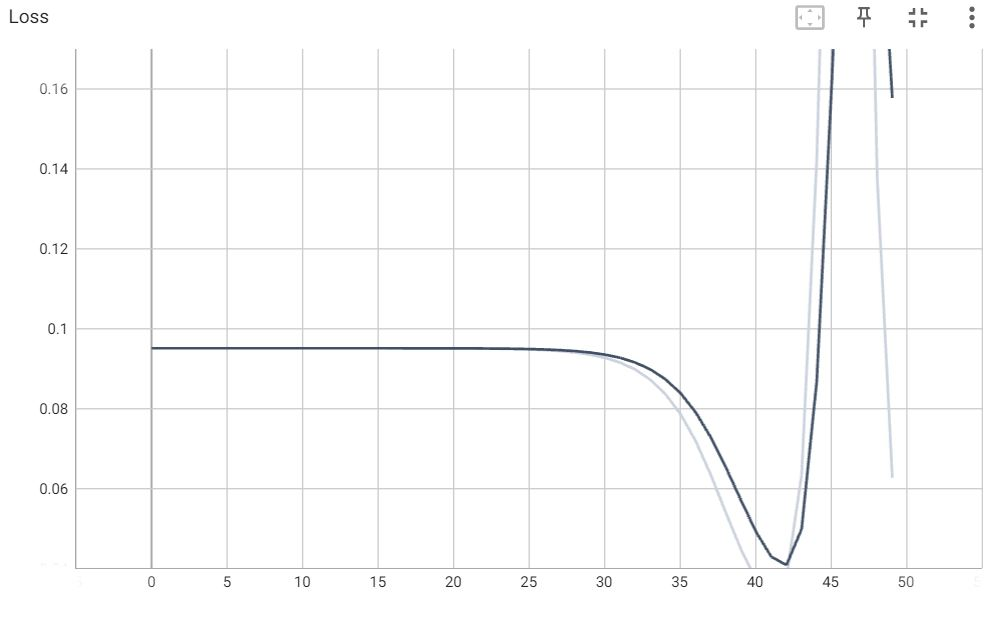

wideresnet

In [236]:
if ALL_CODE:
    lr_range_test(model = "wideresnet_our", data = "real")

In [237]:
MAX_LR_REAL["wideresnet_our"] = 0.055977744874758796
MIN_LR_REAL["wideresnet_our"] = 0.0002876265888493261

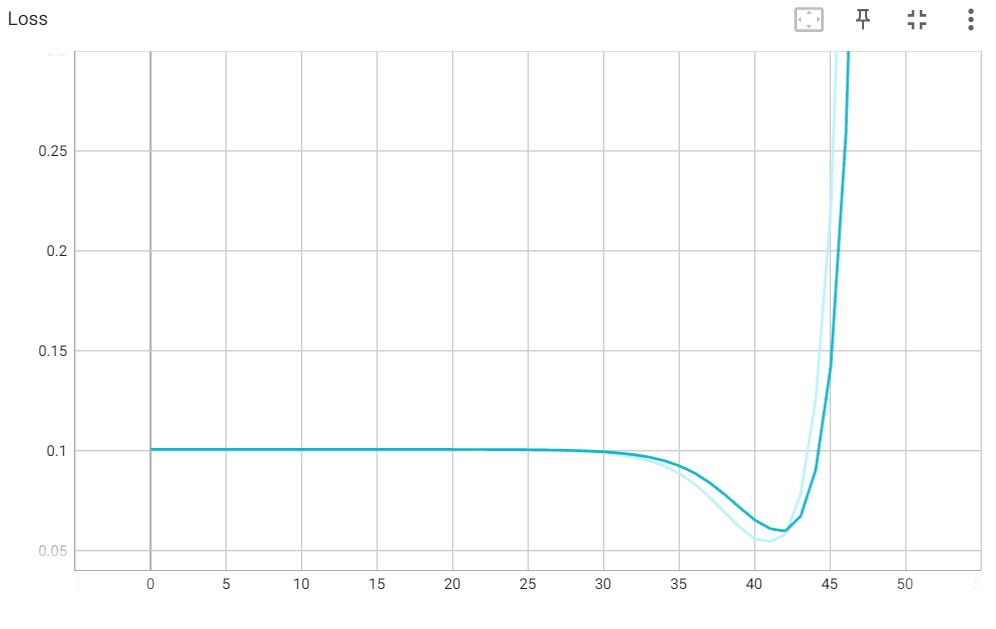

resnet

In [238]:
if ALL_CODE:
    lr_range_test(model = "resnet_our", data = "real")

In [239]:
MAX_LR_REAL["resnet_our"] = 0.055977744874758796
MIN_LR_REAL["resnet_our"] = 0.00012783403948858938

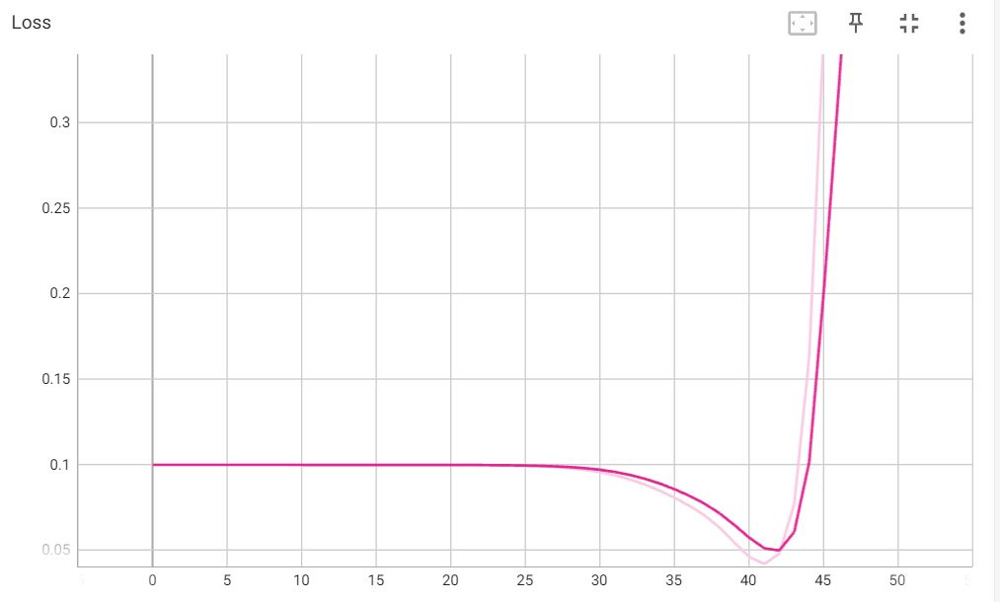

resnext

In [240]:
if ALL_CODE:
    lr_range_test(model = "resnext_our", data = "real")

In [241]:
MAX_LR_REAL["resnext_our"] = 0.055977744874758796
MIN_LR_REAL["resnext_our"] = 0.00012783403948858938

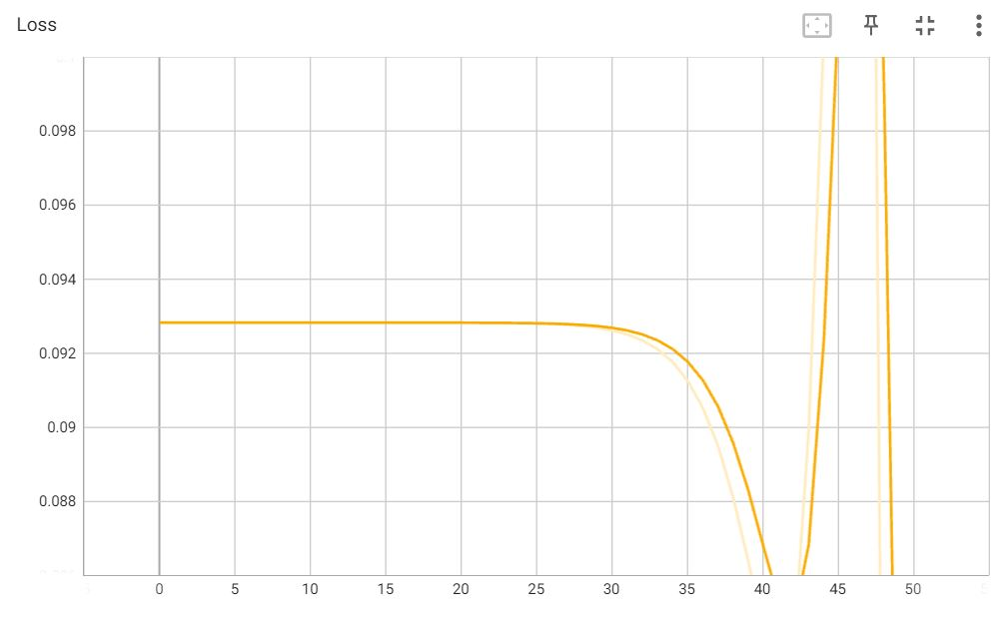

vit

In [242]:
if ALL_CODE:
    lr_range_test(model = "vit_our", data = "real")

In [243]:
MAX_LR_REAL["vit_our"] = 0.055977744874758796
MIN_LR_REAL["vit_our"] = 0.00012783403948858938

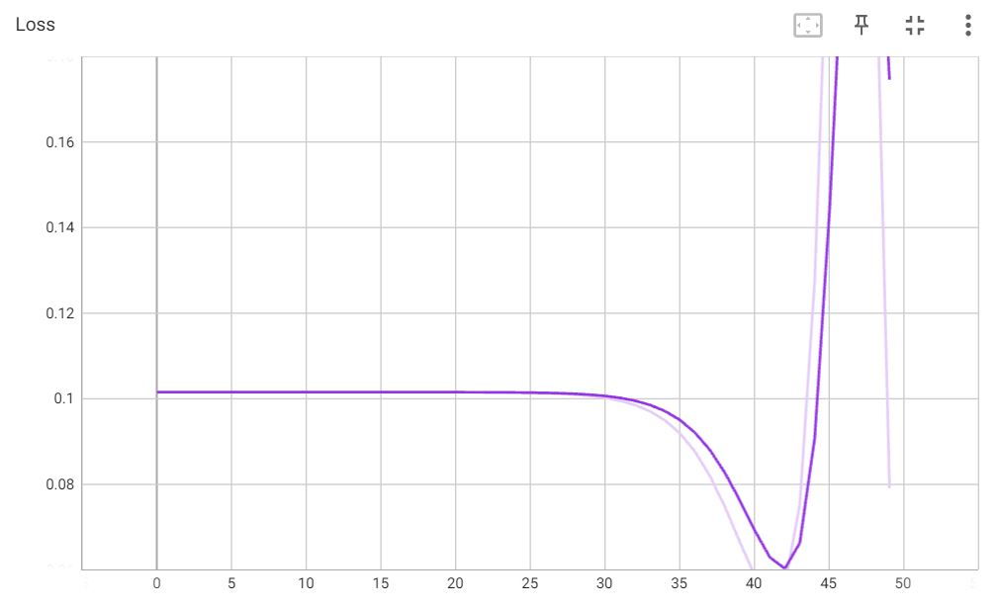

#####**11.2.2 Architecture comparisons**

Here a comparison of selected baseline architecture in a gird search manner with small configuration of hyperparameter is done. note that 
- use 10 epochs given also in previous experiments net converge to this number of epoch
- empirically (for all backbones) we found
 - lr
 -- less than 0.001 network diverge
 -- greater than 0.0001 network do not learn
 - wd
 a wd between 0.0001 and 0.00001 seem good to improve performance (value outsided this range do not seem alter performances). so the following tests are done with this value ranges

here a dictionary is implemented to store hyperparameters explored

In [244]:
ARCHITECTURE_COMPARISON_REAL_PARAMS: Dict[str,  Dict[str, float]] = {
    "convnext_our" : {},
    "regnet_our" : {},
    "resnet_our" : {},
    "vit_our" : {},
    "resnext_our" : {},
    "wideresnet_our" : {}
}

for label in ARCHITECTURE_COMPARISON_REAL_PARAMS:
  ARCHITECTURE_COMPARISON_REAL_PARAMS[label] = {
      "lr": [0.001, 0.0001],
      "wd": [0.0001, 0.00001]
  }

ARCHITECTURE_COMPARISON_PRODUCT_PARAMS: Dict[str,  Dict[str, float]] = copy.deepcopy(
    ARCHITECTURE_COMPARISON_REAL_PARAMS)

using dictionary to store results params

In [245]:
#metrics considered
METRICS: Dict[str, float] = {
    "source_acc": None,
    "target_acc": None,
    "reval": None
}

#name architecture
ARCHITECTURE_COMPARISON_REAL_RES: Dict[str, any] = {
    "convnext_our": {},
    "regnet_our": {},
    "resnet_our": {},
    "vit_our": {},
    "resnext_our": {},
    "wideresnet_our": {}
}

#wd value
VALUE: Dict[float, Dict[str, float]] = {
          0.0001: copy.deepcopy(METRICS),
          0.00001: copy.deepcopy(METRICS)
          
      }

#lr value
for label in ARCHITECTURE_COMPARISON_REAL_RES:
    ARCHITECTURE_COMPARISON_REAL_RES[label] = {
        0.001: copy.deepcopy(VALUE),
        0.0001: copy.deepcopy(VALUE)
    }

ARCHITECTURE_COMPARISON_PRODUCT_RES: Dict[str, any] = copy.deepcopy(
    ARCHITECTURE_COMPARISON_REAL_RES)

######For P->R

In [246]:
if(not(os.path.exists("../Material/ARCHITECTURE_COMPARISON_PRODUCT_RES.pickle"))):
    ARCHITECTURE_COMPARISON_PRODUCT_RES = comparison_wrapper(ARCHITECTURE_COMPARISON_PRODUCT_PARAMS, ARCHITECTURE_COMPARISON_PRODUCT_RES)
    with open("../Material/ARCHITECTURE_COMPARISON_PRODUCT_RES.pickle", 'wb') as f:
        pickle.dump(ARCHITECTURE_COMPARISON_PRODUCT_RES, f)
else:
    with open('../Material/ARCHITECTURE_COMPARISON_PRODUCT_RES.pickle', 'rb') as f:
        ARCHITECTURE_COMPARISON_PRODUCT_RES=pickle.load(f)



```
{'convnext_our': {0.001: {0.0001: {'source_acc': 98.95833333333334,
    'target_acc': 90.88541666666666,
    'reval': 21.327056884765625},
   1e-05: {'source_acc': 98.4375,
    'target_acc': 88.28125,
    'reval': 30.271547317504883}},
  0.0001: {0.0001: {'source_acc': 95.83333333333334,
    'target_acc': 83.07291666666666,
    'reval': 119.42778015136719},
   1e-05: {'source_acc': 96.09375,
    'target_acc': 83.85416666666666,
    'reval': 120.80139923095703}}},
 'regnet_our': {0.001: {0.0001: {'source_acc': 98.17708333333334,
    'target_acc': 59.375,
    'reval': 88.27104949951172},
   1e-05: {'source_acc': 96.875,
    'target_acc': 59.895833333333336,
    'reval': 89.47195434570312}},
  0.0001: {0.0001: {'source_acc': 91.92708333333334,
    'target_acc': 46.875,
    'reval': 248.50242614746094},
   1e-05: {'source_acc': 90.625,
    'target_acc': 46.09375,
    'reval': 258.53076171875}}},
 'resnet_our': {0.001: {0.0001: {'source_acc': 96.61458333333334,
    'target_acc': 79.16666666666666,
    'reval': 46.55865478515625},
   1e-05: {'source_acc': 97.39583333333334,
    'target_acc': 76.82291666666666,
    'reval': 49.42013931274414}},
  0.0001: {0.0001: {'source_acc': 94.53125,
    'target_acc': 72.65625,
    'reval': 122.23829650878906},
   1e-05: {'source_acc': 96.09375,
    'target_acc': 71.61458333333334,
    'reval': 129.8409423828125}}},
 'vit_our': {0.001: {0.0001: {'source_acc': 96.875,
    'target_acc': 79.16666666666666,
    'reval': 42.219825744628906},
   1e-05: {'source_acc': 96.61458333333334,
    'target_acc': 76.04166666666666,
    'reval': 51.341339111328125}},
  0.0001: {0.0001: {'source_acc': 91.14583333333334,
    'target_acc': 64.58333333333334,
    'reval': 169.92376708984375},
   1e-05: {'source_acc': 90.10416666666666,
    'target_acc': 61.458333333333336,
    'reval': 172.07537841796875}}},
 'resnext_our': {0.001: {0.0001: {'source_acc': 94.01041666666666,
    'target_acc': 72.65625,
    'reval': 86.81954956054688},
   1e-05: {'source_acc': 94.27083333333334,
    'target_acc': 75.0,
    'reval': 79.79049682617188}},
  0.0001: {0.0001: {'source_acc': 90.10416666666666,
    'target_acc': 59.895833333333336,
    'reval': 170.40487670898438},
   1e-05: {'source_acc': 91.40625,
    'target_acc': 61.197916666666664,
    'reval': 177.01065063476562}}},
 'wideresnet_our': {0.001: {0.0001: {'source_acc': 95.57291666666666,
    'target_acc': 66.66666666666666,
    'reval': 75.20571899414062},
   1e-05: {'source_acc': 95.05208333333334,
    'target_acc': 66.92708333333334,
    'reval': 76.35917663574219}},
  0.0001: {0.0001: {'source_acc': 89.58333333333334,
    'target_acc': 55.989583333333336,
    'reval': 216.63636779785156},
   1e-05: {'source_acc': 88.80208333333334,
    'target_acc': 49.21875,
    'reval': 215.60142517089844}}}}
```



######For R->P

In [247]:
if(not(os.path.exists("../Material/ARCHITECTURE_COMPARISON_REAL_RES.pickle"))):
    ARCHITECTURE_COMPARISON_REAL_RES = comparison_wrapper(ARCHITECTURE_COMPARISON_REAL_PARAMS, ARCHITECTURE_COMPARISON_REAL_RES, data = "real")
    with open("../Material/ARCHITECTURE_COMPARISON_REAL_RES.pickle", 'wb') as f:
        pickle.dump(ARCHITECTURE_COMPARISON_REAL_RES, f)
else:
    with open('../Material/ARCHITECTURE_COMPARISON_REAL_RES.pickle', 'rb') as f:
        ARCHITECTURE_COMPARISON_REAL_RES = pickle.load(f)



```
{'convnext_our': {0.001: {0.0001: {'source_acc': 95.83333333333334,
    'target_acc': 96.875,
    'reval': 54.89006805419922},
   1e-05: {'source_acc': 96.35416666666666,
    'target_acc': 95.57291666666666,
    'reval': 50.808746337890625}},
  0.0001: {0.0001: {'source_acc': 92.1875,
    'target_acc': 95.3125,
    'reval': 154.1890411376953},
   1e-05: {'source_acc': 90.625,
    'target_acc': 92.70833333333334,
    'reval': 161.64059448242188}}},
 'regnet_our': {0.001: {0.0001: {'source_acc': 91.14583333333334,
    'target_acc': 91.92708333333334,
    'reval': 220.3428497314453},
   1e-05: {'source_acc': 90.36458333333334,
    'target_acc': 91.14583333333334,
    'reval': 222.94007873535156}},
  0.0001: {0.0001: {'source_acc': 80.46875,
    'target_acc': 83.85416666666666,
    'reval': 465.7680969238281},
   1e-05: {'source_acc': 80.20833333333334,
    'target_acc': 84.11458333333334,
    'reval': 471.7410888671875}}},
 'resnet_our': {0.001: {0.0001: {'source_acc': 95.3125,
    'target_acc': 94.01041666666666,
    'reval': 108.5327377319336},
   1e-05: {'source_acc': 95.05208333333334,
    'target_acc': 93.48958333333334,
    'reval': 120.72630310058594}},
  0.0001: {0.0001: {'source_acc': 91.40625,
    'target_acc': 90.10416666666666,
    'reval': 253.40863037109375},
   1e-05: {'source_acc': 89.32291666666666,
    'target_acc': 90.36458333333334,
    'reval': 240.55648803710938}}},
 'vit_our': {0.001: {0.0001: {'source_acc': 88.80208333333334,
    'target_acc': 91.92708333333334,
    'reval': 134.8513946533203},
   1e-05: {'source_acc': 89.32291666666666,
    'target_acc': 91.40625,
    'reval': 112.87297821044922}},
  0.0001: {0.0001: {'source_acc': 77.08333333333334,
    'target_acc': 78.125,
    'reval': 333.8051452636719},
   1e-05: {'source_acc': 80.98958333333334,
    'target_acc': 83.07291666666666,
    'reval': 316.7286376953125}}},
 'resnext_our': {0.001: {0.0001: {'source_acc': 92.44791666666666,
    'target_acc': 93.48958333333334,
    'reval': 191.21229553222656},
   1e-05: {'source_acc': 92.1875,
    'target_acc': 94.27083333333334,
    'reval': 195.9724578857422}},
  0.0001: {0.0001: {'source_acc': 87.76041666666666,
    'target_acc': 89.84375,
    'reval': 373.39129638671875},
   1e-05: {'source_acc': 85.9375,
    'target_acc': 89.58333333333334,
    'reval': 370.96527099609375}}},
 'wideresnet_our': {0.001: {0.0001: {'source_acc': 90.36458333333334,
    'target_acc': 89.58333333333334,
    'reval': 200.90640258789062},
   1e-05: {'source_acc': 88.54166666666666,
    'target_acc': 88.02083333333334,
    'reval': 210.62185668945312}},
  0.0001: {0.0001: {'source_acc': 78.64583333333334,
    'target_acc': 80.20833333333334,
    'reval': 378.5450134277344},
   1e-05: {'source_acc': 78.90625,
    'target_acc': 83.59375,
    'reval': 394.0726318359375}}}}
```



####11.3 AUTOMATIC OPTIMIZATION OF AUGMENTATION AND BATCH SIZE

#####**11.3.1 Augmentation couplets formation**

In [248]:
TRANSFORMATION_AFFINITY_PRODUCT = copy.deepcopy(TRANSFORMATION_RESULT_DICT)


In [249]:
TRANSFORMATION_AFFINITY_REAL = copy.deepcopy(TRANSFORMATION_RESULT_DICT)

In [250]:
if(not(os.path.exists("../Material/TRANSFORMATION_AFFINITY_PRODUCT.pickle"))):
    TRANSFORMATION_AFFINITY_PRODUCT = extract_affinity(
        TRANSFORMATION_AFFINITY_PRODUCT, data = "product")
    with open("../Material/TRANSFORMATION_AFFINITY_PRODUCT.pickle", 'wb') as f:
        pickle.dump(TRANSFORMATION_AFFINITY_PRODUCT, f)
else:
    with open('../Material/TRANSFORMATION_AFFINITY_PRODUCT.pickle', 'rb') as f:
        TRANSFORMATION_AFFINITY_PRODUCT = pickle.load(f)



```
{'VerticalConcat': {'0.4': 0.8915343915343914, '0.8': 0.8783068783068784},
 'HorizzontalConcat': {'0.4': 0.9312169312169312, '0.8': 0.9391534391534391},
 'MixedConcat': {'0.4': 0.8306878306878308, '0.8': 0.8015873015873016},
 'Random2x2': {'0.4': 0.8941798941798943, '0.8': 0.9100529100529101},
 'VHMixup': {'0.4': 0.9417989417989419, '0.8': 0.947089947089947},
 'VHBC': {'0.4': 0.9100529100529101, '0.8': 0.9285714285714286},
 'RandomColumnInterval': 0.933862433862434,
 'RandomRowInterval': 0.8862433862433864,
 'RandomRows': {'0.4': 0.5502645502645502, '0.8': 0.06084656084656085},
 'RandomColumn': {'0.4': 0.48412698412698413, '0.8': 0.07407407407407408},
 'RandomPixels': {'0.4': 0.7142857142857143, '0.8': 0.28835978835978837},
 'NoisyMixup': {'0.4': 0.6243386243386244, '0.8': 0.6640211640211641},
 'SamplePairing': 1.0026455026455026,
 'CutOut': {'300': 0.9126984126984127, '700': 0.9312169312169312},
 'CopyOut': {'300': 0.9603174603174603, '700': 0.9814814814814816},
 'CutMix': {'0.4': 0.9894179894179895, '0.8': 0.9788359788359787},
 'MixUp': {'0.4': 0.9444444444444444, '0.8': 0.9629629629629629},
 'HideAndSeek': {'0.4': 0.9682539682539683, '0.8': 0.8544973544973546},
 'PatchShuffle': {'0.4': 0.8148148148148149, '0.8': 0.33862433862433855},
 'SoundMixup': {'0.4': 0.9682539682539683, '0.8': 0.9682539682539683},
 'GaussNoise': {'20.0': 1.0052910052910053, '40.0': 1.0052910052910053},
 'ColorJitter': 1.0,
 'RandomCrop': {'50': 0.3624338624338624, '100': 0.8439153439153438},
 'RandomRotate90': 0.9576719576719578,
 'ShiftScaleRotate': {'0.4': 0.9285714285714286, '0.8': 0.8756613756613756}}```



In [251]:
if(not(os.path.exists("../Material/TRANSFORMATION_AFFINITY_REAL.pickle"))):
    TRANSFORMATION_AFFINITY_REAL = extract_affinity(
        TRANSFORMATION_AFFINITY_REAL, data = "real", lr = 0.0001, wd = 0.0001)
    with open("../Material/TRANSFORMATION_AFFINITY_REAL.pickle", 'wb') as f:
        pickle.dump(TRANSFORMATION_AFFINITY_REAL, f)
else:
    with open('../Material/TRANSFORMATION_AFFINITY_REAL.pickle', 'rb') as f:
        TRANSFORMATION_AFFINITY_REAL=pickle.load(f)



```
{'VerticalConcat': {'0.4': 0.7721518987341772, '0.8': 0.759493670886076},
 'HorizzontalConcat': {'0.4': 0.7974683544303799, '0.8': 0.7531645569620253},
 'MixedConcat': {'0.4': 0.718354430379747, '0.8': 0.6740506329113924},
 'Random2x2': {'0.4': 0.7658227848101267, '0.8': 0.7753164556962027},
 'VHMixup': {'0.4': 0.8449367088607596, '0.8': 0.7500000000000001},
 'VHBC': {'0.4': 0.7531645569620253, '0.8': 0.7341772151898734},
 'RandomColumnInterval': 0.768987341772152,
 'RandomRowInterval': 0.708860759493671,
 'RandomRows': {'0.4': 0.29430379746835444, '0.8': 0.09810126582278483},
 'RandomColumn': {'0.4': 0.25949367088607594, '0.8': 0.12025316455696203},
 'RandomPixels': {'0.4': 0.27848101265822783, '0.8': 0.10443037974683546},
 'NoisyMixup': {'0.4': 0.49367088607594944, '0.8': 0.5063291139240508},
 'SamplePairing': 0.990506329113924,
 'CutOut': {'300': 0.8607594936708863, '700': 0.8417721518987344},
 'CopyOut': {'300': 0.8291139240506329, '700': 0.8227848101265824},
 'CutMix': {'0.4': 0.8734177215189874, '0.8': 0.8259493670886077},
 'MixUp': {'0.4': 0.9462025316455699, '0.8': 0.9746835443037977},
 'HideAndSeek': {'0.4': 0.8734177215189874, '0.8': 0.6075949367088608},
 'PatchShuffle': {'0.4': 0.458860759493671, '0.8': 0.17721518987341775},
 'SoundMixup': {'0.4': 0.718354430379747, '0.8': 0.8955696202531646},
 'GaussNoise': {'20.0': 0.9936708860759496, '40.0': 0.9810126582278481},
 'ColorJitter': 0.990506329113924,
 'RandomCrop': {'50': 0.25949367088607594, '100': 0.6677215189873418},
 'RandomRotate90': 0.8955696202531646,
 'ShiftScaleRotate': {'0.4': 0.8291139240506329, '0.8': 0.759493670886076}}```



In [252]:
TRANSFORMATION_DIVERSITY_PRODUCT = copy.deepcopy(TRANSFORMATION_RESULT_DICT)
TRANSFORMATION_DIVERSITY_REAL = copy.deepcopy(TRANSFORMATION_RESULT_DICT)

In [253]:
if(not(os.path.exists("../Material/TRANSFORMATION_DIVERSITY_PRODUCT.pickle"))):
    TRANSFORMATION_DIVERSITY_PRODUCT = extract_diversity(
        TRANSFORMATION_DIVERSITY_PRODUCT, data = "product")
    with open("../Material/TRANSFORMATION_DIVERSITY_PRODUCT.pickle", 'wb') as f:
        pickle.dump(TRANSFORMATION_DIVERSITY_PRODUCT, f)
else:
    with open('../Material/TRANSFORMATION_DIVERSITY_PRODUCT.pickle', 'rb') as f:
        TRANSFORMATION_DIVERSITY_PRODUCT = pickle.load(f)



```
{'VerticalConcat': {'0.4': 0.9841269841269841, '0.8': 0.9682539682539683},
 'HorizzontalConcat': {'0.4': 0.9603174603174603, '0.8': 0.9682539682539683},
 'MixedConcat': {'0.4': 0.925925925925926, '0.8': 0.9497354497354499},
 'Random2x2': {'0.4': 0.9656084656084657, '0.8': 0.9735449735449736},
 'VHMixup': {'0.4': 0.9708994708994708, '0.8': 0.9708994708994708},
 'VHBC': {'0.4': 0.9576719576719578, '0.8': 0.933862433862434},
 'RandomColumnInterval': 0.9708994708994708,
 'RandomRowInterval': 0.9788359788359787,
 'RandomRows': {'0.4': 0.626984126984127, '0.8': 0.10582010582010583},
 'RandomColumn': {'0.4': 0.4444444444444444, '0.8': 0.0582010582010582},
 'RandomPixels': {'0.4': 0.6507936507936508, '0.8': 0.2619047619047619},
 'NoisyMixup': {'0.4': 0.6693121693121692, '0.8': 0.6878306878306879},
 'SamplePairing': 0.9920634920634921,
 'CutOut': {'300': 0.8650793650793651, '700': 0.8756613756613756},
 'CopyOut': {'300': 0.9788359788359787, '700': 0.9735449735449736},
 'CutMix': {'0.4': 0.9841269841269841, '0.8': 0.9947089947089947},
 'MixUp': {'0.4': 0.9920634920634921, '0.8': 0.9920634920634921},
 'HideAndSeek': {'0.4': 0.9629629629629629, '0.8': 0.8253968253968254},
 'PatchShuffle': {'0.4': 0.7248677248677248, '0.8': 0.30423280423280424},
 'SoundMixup': {'0.4': 0.9656084656084657, '0.8': 0.9867724867724866},
 'GaussNoise': {'20.0': 0.9973544973544974, '40.0': 0.9947089947089947},
 'ColorJitter': 1.0,
 'RandomCrop': {'50': 0.4232804232804233, '100': 0.8253968253968254},
 'RandomRotate90': 0.9603174603174603,
 'ShiftScaleRotate': {'0.4': 0.9365079365079365, '0.8': 0.8677248677248677}}
```



In [254]:
if(not(os.path.exists("../Material/TRANSFORMATION_DIVERSITY_REAL.pickle"))):
  TRANSFORMATION_DIVERSITY_REAL = extract_diversity(
      TRANSFORMATION_DIVERSITY_REAL, data = "real", lr = 0.0001, wd = 0.0001)
  with open("../Material/TRANSFORMATION_DIVERSITY_REAL.pickle", 'wb') as f:
    pickle.dump(TRANSFORMATION_DIVERSITY_REAL, f)
else:
  with open('../Material/TRANSFORMATION_DIVERSITY_REAL.pickle', 'rb') as f:
    TRANSFORMATION_DIVERSITY_REAL=pickle.load(f)



```
{'VerticalConcat': {'0.4': 0.5540983606557377, '0.8': 0.5278688524590163},
 'HorizzontalConcat': {'0.4': 0.6262295081967212, '0.8': 0.6032786885245901},
 'MixedConcat': {'0.4': 0.37049180327868847, '0.8': 0.36393442622950817},
 'Random2x2': {'0.4': 0.5344262295081967, '0.8': 0.5442622950819672},
 'VHMixup': {'0.4': 0.6918032786885244, '0.8': 0.6950819672131147},
 'VHBC': {'0.4': 0.6524590163934425, '0.8': 0.7114754098360655},
 'RandomColumnInterval': 0.5540983606557377,
 'RandomRowInterval': 0.560655737704918,
 'RandomRows': {'0.4': 0.2688524590163934, '0.8': 0.12131147540983607},
 'RandomColumn': {'0.4': 0.23606557377049178, '0.8': 0.09508196721311474},
 'RandomPixels': {'0.4': 0.3540983606557377, '0.8': 0.21311475409836067},
 'NoisyMixup': {'0.4': 0.5540983606557377, '0.8': 0.5508196721311475},
 'SamplePairing': 0.9737704918032786,
 'CutOut': {'300': 0.7540983606557377, '700': 0.7540983606557377},
 'CopyOut': {'300': 0.6950819672131147, '700': 0.701639344262295},
 'CutMix': {'0.4': 0.8196721311475408, '0.8': 0.7901639344262293},
 'MixUp': {'0.4': 0.8721311475409836, '0.8': 0.8754098360655737},
 'HideAndSeek': {'0.4': 0.8754098360655737, '0.8': 0.5573770491803277},
 'PatchShuffle': {'0.4': 0.46885245901639333, '0.8': 0.24262295081967214},
 'SoundMixup': {'0.4': 0.30491803278688523, '0.8': 0.42622950819672134},
 'GaussNoise': {'20.0': 0.983606557377049, '40.0': 0.9901639344262295},
 'ColorJitter': 0.9868852459016391,
 'RandomCrop': {'50': 0.3245901639344262, '100': 0.6491803278688524},
 'RandomRotate90': 0.9377049180327867,
 'ShiftScaleRotate': {'0.4': 0.7737704918032786, '0.8': 0.662295081967213}}
```



In [255]:
LIST_REAL_PURGED = calculate_threshold(
    TRANSFORMATION_DIVERSITY_REAL, TRANSFORMATION_AFFINITY_REAL, data = "real")




```
[('HorizzontalConcat', '0.4'),
 ('VHMixup', '0.4'),
 ('VHMixup', '0.8'),
 ('VHBC', '0.4'),
 ('VHBC', '0.8'),
 ('SamplePairing', None),
 ('CutOut', '300'),
 ('CutOut', '700'),
 ('CopyOut', '300'),
 ('CopyOut', '700'),
 ('CutMix', '0.4'),
 ('CutMix', '0.8'),
 ('MixUp', '0.4'),
 ('MixUp', '0.8'),
 ('HideAndSeek', '0.4'),
 ('GaussNoise', '20.0'),
 ('GaussNoise', '40.0'),
 ('ColorJitter', None),
 ('RandomRotate90', None),
 ('ShiftScaleRotate', '0.4'),
 ('ShiftScaleRotate', '0.8')]
```



In [256]:
LIST_PRODUCT_PURGED = calculate_threshold(
    TRANSFORMATION_DIVERSITY_PRODUCT, 
    TRANSFORMATION_AFFINITY_PRODUCT, data = "product")



```
[('VerticalConcat', '0.4'),
 ('VerticalConcat', '0.8'),
 ('HorizzontalConcat', '0.4'),
 ('HorizzontalConcat', '0.8'),
 ('MixedConcat', '0.4'),
 ('MixedConcat', '0.8'),
 ('Random2x2', '0.4'),
 ('Random2x2', '0.8'),
 ('VHMixup', '0.4'),
 ('VHMixup', '0.8'),
 ('VHBC', '0.4'),
 ('VHBC', '0.8'),
 ('RandomColumnInterval', None),
 ('RandomRowInterval', None),
 ('SamplePairing', None),
 ('CutOut', '300'),
 ('CutOut', '700'),
 ('CopyOut', '300'),
 ('CopyOut', '700'),
 ('CutMix', '0.4'),
 ('CutMix', '0.8'),
 ('MixUp', '0.4'),
 ('MixUp', '0.8'),
 ('HideAndSeek', '0.4'),
 ('SoundMixup', '0.4'),
 ('SoundMixup', '0.8'),
 ('GaussNoise', '20.0'),
 ('GaussNoise', '40.0'),
 ('ColorJitter', None),
 ('RandomRotate90', None),
 ('ShiftScaleRotate', '0.4'),
 ('ShiftScaleRotate', '0.8')]
```



#####**11.3.2. Differentiable augmentation search**

necessary to execute deterministic setting in this phase

In [257]:
torch.backends.cudnn.deterministic = True

In [258]:
AUG_PROB_DICT_PRODUCT=None
if(not(os.path.exists("../Material/AUG_PROB_DICT_PRODUCT.pickle"))):
    AUG_PROB_DICT_PRODUCT = differentiable_augmentation_search(LIST_PRODUCT_PURGED)
    with open("../Material/AUG_PROB_DICT_PRODUCT.pickle", 'wb') as f:
       pickle.dump(AUG_PROB_DICT_PRODUCT, f)
else:
    with open("../Material/AUG_PROB_DICT_PRODUCT.pickle", 'rb') as f:
        AUG_PROB_DICT_PRODUCT=pickle.load(f)



```
{'p_o': [tensor([0.0299, 0.0306, 0.0296, 0.0300, 0.0301, 0.0310, 0.0323, 0.0302, 0.0310,
          0.0305, 0.0305, 0.0305, 0.0305, 0.0305, 0.0296, 0.0305, 0.0306, 0.0307,
          0.0305, 0.0305, 0.0305, 0.0546, 0.0306, 0.0310, 0.0305, 0.0305, 0.0306,
          0.0309, 0.0304, 0.0310, 0.0299, 0.0299], requires_grad=True),
  tensor([0.0287, 0.0307, 0.0280, 0.0285, 0.0286, 0.0300, 0.0320, 0.0424, 0.0293,
          0.0297, 0.0297, 0.0296, 0.0297, 0.0293, 0.0283, 0.0290, 0.0306, 0.0291,
          0.0297, 0.0297, 0.0297, 0.0610, 0.0299, 0.0307, 0.0470, 0.0290, 0.0302,
          0.0302, 0.0295, 0.0221, 0.0289, 0.0287], requires_grad=True),
  tensor([0.0285, 0.0296, 0.0275, 0.0268, 0.0270, 0.0285, 0.0293, 0.0775, 0.0261,
          0.0283, 0.0280, 0.0291, 0.0286, 0.0274, 0.0271, 0.0275, 0.0259, 0.0278,
          0.0285, 0.0285, 0.0281, 0.0550, 0.0286, 0.0291, 0.0675, 0.0278, 0.0289,
          0.0292, 0.0285, 0.0157, 0.0274, 0.0269], requires_grad=True),
  tensor([0.0286, 0.0285, 0.0270, 0.0248, 0.0254, 0.0279, 0.0268, 0.1110, 0.0245,
          0.0275, 0.0173, 0.0288, 0.0277, 0.0266, 0.0263, 0.0265, 0.0237, 0.0268,
          0.0282, 0.0278, 0.0269, 0.0528, 0.0275, 0.0279, 0.0757, 0.0269, 0.0277,
          0.0292, 0.0276, 0.0136, 0.0268, 0.0256], requires_grad=True),
  tensor([0.0282, 0.0277, 0.0275, 0.0234, 0.0246, 0.0274, 0.0257, 0.1329, 0.0242,
          0.0275, 0.0097, 0.0285, 0.0275, 0.0266, 0.0258, 0.0253, 0.0226, 0.0265,
          0.0277, 0.0269, 0.0268, 0.0531, 0.0276, 0.0269, 0.0770, 0.0262, 0.0266,
          0.0287, 0.0269, 0.0127, 0.0265, 0.0247], requires_grad=True),
  tensor([0.0293, 0.0274, 0.0282, 0.0222, 0.0242, 0.0271, 0.0252, 0.1412, 0.0242,
          0.0285, 0.0081, 0.0285, 0.0269, 0.0260, 0.0257, 0.0229, 0.0223, 0.0268,
          0.0276, 0.0257, 0.0264, 0.0531, 0.0285, 0.0265, 0.0758, 0.0260, 0.0259,
          0.0286, 0.0272, 0.0124, 0.0270, 0.0245], requires_grad=True),
  tensor([0.0275, 0.0258, 0.0266, 0.0205, 0.0226, 0.0256, 0.0233, 0.1376, 0.0232,
          0.0269, 0.0074, 0.0269, 0.0247, 0.0242, 0.0238, 0.0208, 0.0215, 0.0252,
          0.0252, 0.0237, 0.0239, 0.0473, 0.0271, 0.0250, 0.0701, 0.0250, 0.0844,
          0.0270, 0.0268, 0.0116, 0.0256, 0.0230], requires_grad=True),
  tensor([0.0266, 0.0246, 0.0254, 0.0194, 0.0216, 0.0249, 0.0221, 0.1310, 0.0239,
          0.0262, 0.0070, 0.0258, 0.0234, 0.0231, 0.0226, 0.0214, 0.0211, 0.0241,
          0.0236, 0.0220, 0.0221, 0.0437, 0.0256, 0.0242, 0.0671, 0.0243, 0.1222,
          0.0266, 0.0260, 0.0110, 0.0254, 0.0220], requires_grad=True),
  tensor([0.0265, 0.0242, 0.0251, 0.0189, 0.0213, 0.0247, 0.0215, 0.1298, 0.0237,
          0.0264, 0.0069, 0.0255, 0.0227, 0.0227, 0.0221, 0.0218, 0.0217, 0.0238,
          0.0231, 0.0219, 0.0220, 0.0411, 0.0251, 0.0239, 0.0659, 0.0235, 0.1325,
          0.0274, 0.0261, 0.0111, 0.0255, 0.0216], requires_grad=True),
  tensor([0.0269, 0.0231, 0.0255, 0.0189, 0.0214, 0.0247, 0.0215, 0.1397, 0.0241,
          0.0286, 0.0069, 0.0255, 0.0226, 0.0223, 0.0210, 0.0222, 0.0221, 0.0238,
          0.0231, 0.0223, 0.0217, 0.0400, 0.0260, 0.0239, 0.0655, 0.0233, 0.1206,
          0.0276, 0.0269, 0.0111, 0.0257, 0.0215], requires_grad=True)],
 'p_t': [tensor(0.3504, requires_grad=True),
  tensor(0.3485, requires_grad=True),
  tensor(0.3478, requires_grad=True),
  tensor(0.3496, requires_grad=True),
  tensor(0.3536, requires_grad=True),
  tensor(0.3539, requires_grad=True),
  tensor(0.3531, requires_grad=True),
  tensor(0.3528, requires_grad=True),
  tensor(0.3522, requires_grad=True),
  tensor(0.3516, requires_grad=True)]}
```



In [259]:
AUG_PROB_DICT_REAL=None
if(not(os.path.exists("../Material/AUG_PROB_DICT_REAL.pickle"))):
    AUG_PROB_DICT_REAL = differentiable_augmentation_search(LIST_REAL_PURGED, data = "real", lr  = 0.0001, wd  = 0.0001)
    with open("../Material/AUG_PROB_DICT_REAL.pickle", 'wb') as f:
        pickle.dump(AUG_PROB_DICT_REAL, f)
else:
    with open("../Material/AUG_PROB_DICT_REAL.pickle", 'rb') as f:
        AUG_PROB_DICT_REAL=pickle.load(f)



```
{'p_o': [tensor([0.0479, 0.0477, 0.0476, 0.0476, 0.0476, 0.0475, 0.0476, 0.0476, 0.0476,
          0.0476, 0.0477, 0.0477, 0.0476, 0.0475, 0.0477, 0.0476, 0.0476, 0.0476,
          0.0476, 0.0476, 0.0477], requires_grad=True),
  tensor([0.0481, 0.0478, 0.0476, 0.0475, 0.0476, 0.0474, 0.0476, 0.0476, 0.0475,
          0.0475, 0.0476, 0.0478, 0.0477, 0.0474, 0.0478, 0.0477, 0.0475, 0.0476,
          0.0472, 0.0477, 0.0478], requires_grad=True),
  tensor([0.0483, 0.0479, 0.0477, 0.0477, 0.0476, 0.0474, 0.0477, 0.0476, 0.0476,
          0.0475, 0.0476, 0.0479, 0.0477, 0.0474, 0.0479, 0.0477, 0.0475, 0.0477,
          0.0457, 0.0478, 0.0479], requires_grad=True),
  tensor([0.0485, 0.0481, 0.0478, 0.0479, 0.0476, 0.0474, 0.0479, 0.0476, 0.0477,
          0.0475, 0.0476, 0.0479, 0.0473, 0.0475, 0.0480, 0.0476, 0.0476, 0.0480,
          0.0451, 0.0479, 0.0475], requires_grad=True),
  tensor([0.0486, 0.0483, 0.0477, 0.0489, 0.0480, 0.0475, 0.0480, 0.0478, 0.0478,
          0.0474, 0.0477, 0.0480, 0.0458, 0.0475, 0.0480, 0.0475, 0.0476, 0.0481,
          0.0449, 0.0479, 0.0471], requires_grad=True),
  tensor([0.0485, 0.0483, 0.0477, 0.0494, 0.0488, 0.0475, 0.0479, 0.0477, 0.0478,
          0.0474, 0.0474, 0.0479, 0.0452, 0.0478, 0.0480, 0.0474, 0.0477, 0.0481,
          0.0449, 0.0478, 0.0468], requires_grad=True),
  tensor([0.0486, 0.0483, 0.0478, 0.0497, 0.0492, 0.0476, 0.0479, 0.0478, 0.0478,
          0.0474, 0.0472, 0.0480, 0.0436, 0.0480, 0.0481, 0.0474, 0.0480, 0.0481,
          0.0451, 0.0479, 0.0468], requires_grad=True),
  tensor([0.0487, 0.0482, 0.0478, 0.0496, 0.0493, 0.0475, 0.0478, 0.0477, 0.0478,
          0.0490, 0.0471, 0.0479, 0.0422, 0.0480, 0.0481, 0.0472, 0.0481, 0.0482,
          0.0452, 0.0478, 0.0466], requires_grad=True),
  tensor([0.0487, 0.0481, 0.0478, 0.0496, 0.0494, 0.0476, 0.0477, 0.0476, 0.0479,
          0.0495, 0.0470, 0.0481, 0.0417, 0.0480, 0.0480, 0.0470, 0.0482, 0.0482,
          0.0452, 0.0478, 0.0466], requires_grad=True),
  tensor([0.0487, 0.0482, 0.0479, 0.0495, 0.0494, 0.0477, 0.0478, 0.0477, 0.0479,
          0.0497, 0.0469, 0.0482, 0.0416, 0.0477, 0.0481, 0.0469, 0.0483, 0.0482,
          0.0453, 0.0478, 0.0467], requires_grad=True)],
 'p_t': [tensor(0.3503, requires_grad=True),
  tensor(0.3502, requires_grad=True),
  tensor(0.3501, requires_grad=True),
  tensor(0.3501, requires_grad=True),
  tensor(0.3502, requires_grad=True),
  tensor(0.3505, requires_grad=True),
  tensor(0.3505, requires_grad=True),
  tensor(0.3507, requires_grad=True),
  tensor(0.3509, requires_grad=True),
  tensor(0.3510, requires_grad=True)]}
```



In [260]:
AUG_PROB_DICT_PRODUCT_SMOOTH = smooth_dict(AUG_PROB_DICT_PRODUCT)
AUG_PROB_DICT_REAL_SMOOTH = smooth_dict(AUG_PROB_DICT_REAL)

In [261]:
PARAM_SAMPLE_TRASF_PRODUCT = [AUG_PROB_DICT_PRODUCT_SMOOTH, LIST_PRODUCT_PURGED]
PARAM_SAMPLE_TRASF_REAL = [AUG_PROB_DICT_REAL_SMOOTH, LIST_REAL_PURGED]

retrieve configuration specified by user

In [262]:
torch.backends.cudnn.deterministic = DETERMINISTIC

####11.4 OPTIMIZATION BASELINE ARCHITECTURE 

section 11.4.1 contains fanova analysisi while 11.4.2 contains BOHB SMAC3 optimization

#####**11.4.1 Hyperparam order and dependencies**

here dictionary to store result of grid search over hyperparameters are defined

In [263]:
PARAM_LIST_PRODUCT_REL: Dict[str, any] = []
for lr in [MIN_LR_PRODUCT["convnext_our"], MAX_LR_PRODUCT["convnext_our"]]:
    for wd in [0.00001, 0.001]:
        for scheduler in [None, "cosine", "cyclic", "plateau"]:
            for optimizer in ["SGD", "adam"]:
                for smoothing in [0., 0.2]:
                    new_dict=copy.deepcopy(PARAM_DICT_REL)
                    new_dict["lr"]=lr
                    new_dict["wd"]=wd
                    new_dict["scheduler"]=scheduler
                    new_dict["optimizer"]=optimizer
                    new_dict["smoothing"]=smoothing
                    PARAM_LIST_PRODUCT_REL.append(new_dict)



In [264]:
PARAM_LIST_REAL_REL: Dict[str, any] = []
for lr in [MIN_LR_REAL["convnext_our"], MAX_LR_REAL["convnext_our"]]:
    for wd in [0.00001, 0.001]:
        for scheduler in [None, "cosine", "cyclic", "plateau"]:
            for optimizer in ["SGD", "adam"]:
                for smoothing in [0., 0.2]:
                    new_dict=copy.deepcopy(PARAM_DICT_REL)
                    new_dict["lr"] = lr
                    new_dict["wd"] = wd
                    new_dict["scheduler"] = scheduler
                    new_dict["optimizer"] = optimizer
                    new_dict["smoothing"] = smoothing
                    PARAM_LIST_REAL_REL.append(new_dict)

Here a general configuration space is defined

In [265]:
#define configuration space
GENERAL_CONFIG_SPACE = CS.ConfigurationSpace()
#architecture hyperparam
#training hyperparam
#lr rate schedule
schedule = CSH.CategoricalHyperparameter("3_schedule", ["cosine", "cyclic", "plateau", "None"])
GENERAL_CONFIG_SPACE.add_hyperparameters([schedule])
#optimizer
optimizer = CSH.CategoricalHyperparameter("4_optimizer", ["adam", "SGD"])
GENERAL_CONFIG_SPACE.add_hyperparameters([optimizer])
#regularization param
#label smoothing
label_smoothing = CSH.UniformFloatHyperparameter("5_label_smoothing", lower = 0.0, upper = 0.2, default_value = 0.0)
GENERAL_CONFIG_SPACE.add_hyperparameters([label_smoothing])
#weight decay
#10-5 a 10-2 o 0
weight_decay = CSH.UniformFloatHyperparameter("2_weight_decay", lower = 1e-5, upper = 1e-2, default_value = 1e-4)
GENERAL_CONFIG_SPACE.add_hyperparameters([weight_decay])

[2_weight_decay, Type: UniformFloat, Range: [1e-05, 0.01], Default: 0.0001]

In [266]:
GENERAL_CONFIG_SPACE_REAL = copy.deepcopy(GENERAL_CONFIG_SPACE)
#learning rate
lr = CSH.UniformFloatHyperparameter("1_lr", lower=MIN_LR_REAL["convnext_our"], upper= MAX_LR_REAL["convnext_our"], default_value=0.001)
GENERAL_CONFIG_SPACE_REAL.add_hyperparameters([lr])

[1_lr, Type: UniformFloat, Range: [0.00012783403948858938, 0.055977744874758796], Default: 0.001]

In [267]:
GENERAL_CONFIG_SPACE_PRODUCT = copy.deepcopy(GENERAL_CONFIG_SPACE)
#learning rate
lr = CSH.UniformFloatHyperparameter("1_lr", lower=MIN_LR_PRODUCT["convnext_our"], upper= MAX_LR_PRODUCT["convnext_our"], default_value=0.001)
GENERAL_CONFIG_SPACE_PRODUCT.add_hyperparameters([lr])

[1_lr, Type: UniformFloat, Range: [0.00012783403948858938, 0.055977744874758796], Default: 0.001]

######For P->R

In [268]:
REL_DICT_PRODUCT = None
if(not(os.path.exists("../Material/REL_DICT_PRODUCT.pickle"))):
    REL_DICT_PRODUCT = relation_grid_search(PARAM_LIST_PRODUCT_REL, PARAM_SAMPLE_TRASF_PRODUCT)
    with open("../Material/REL_DICT_PRODUCT.pickle", 'wb') as f:
        pickle.dump(REL_DICT_PRODUCT, f)
else:
    with open('../Material/REL_DICT_PRODUCT.pickle', 'rb') as f:
        REL_DICT_PRODUCT = pickle.load(f)
write_fanova_file(REL_DICT_PRODUCT)

brief fanova analysis [https://github.com/automl/fanova]

In [269]:
X = np.genfromtxt("../Material/X_PROD.csv", delimiter=",")
Y = np.genfromtxt("../Material/Y_PROD.csv", delimiter=",")
if ALL_CODE:
    f = fANOVA(X,Y, config_space=GENERAL_CONFIG_SPACE_PRODUCT)
    for i in range(X.shape[1]):
        print("PARAM " + list(PARAM_DICT_REL.keys())[i])
        print(f.quantify_importance((i, )))



```
PARAM lr
{(0,): {'individual importance': 0.09178993142452802, 'total importance': 0.09178993142452802, 'individual std': 0.08197760553156516, 'total std': 0.08197760553156516}}
PARAM wd
{(1,): {'individual importance': 0.0015603286120231352, 'total importance': 0.0015603286120231352, 'individual std': 0.002603107840942852, 'total std': 0.002603107840942852}}
PARAM scheduler
{(2,): {'individual importance': 0.3790488670109479, 'total importance': 0.3790488670109479, 'individual std': 0.14736211510364225, 'total std': 0.14736211510364225}}
PARAM optimizer
{(3,): {'individual importance': 0.11178524797262909, 'total importance': 0.11178524797262909, 'individual std': 0.10663023506262385, 'total std': 0.10663023506262385}}
PARAM smoothing
{(4,): {'individual importance': 0.008930253717820517, 'total importance': 0.008930253717820517, 'individual std': 0.010245740365358054, 'total std': 0.010245740365358054}}
```



important parameter seems
- scheduler
- optmizer

in particular we see that optimizer seem more important than batch size
optimizer seems more important than lr but we know for sure that lr is most important hyperparam so this result is fairly related to small number of tests done

In [270]:
if ALL_CODE:
    vis = fanova.visualizer.Visualizer(f, GENERAL_CONFIG_SPACE_PRODUCT, "../Material/")

**some marginal of lr**

learning rate value seem to be correlated with schedule however it has similiar trends between them, this allow us to separate it

In [271]:
if ALL_CODE:
    vis.plot_pairwise_marginal([0,2])

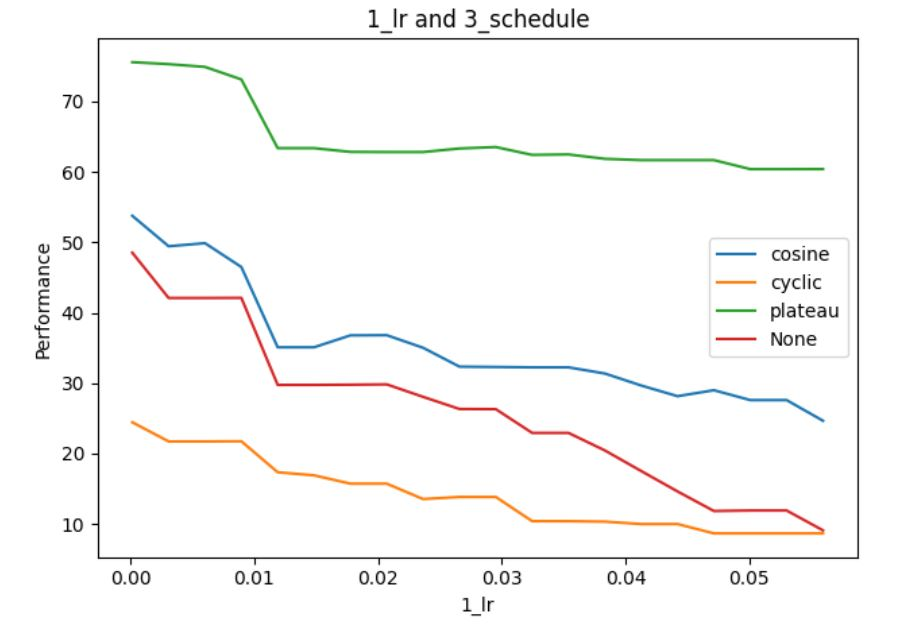

however learning rate seem (as expected highly correlated with optimizer choice)

In [272]:
if ALL_CODE:  
    vis.plot_pairwise_marginal([0,3])

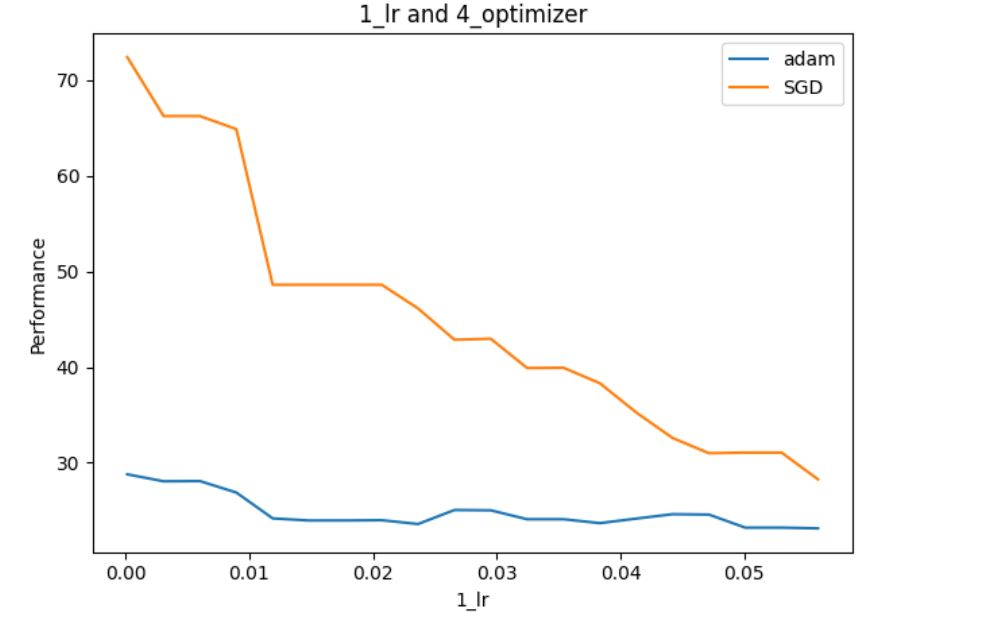

**weight decay**

weight decay seem being correlated with schedule

In [273]:
if ALL_CODE:
    vis.plot_pairwise_marginal([1,2])

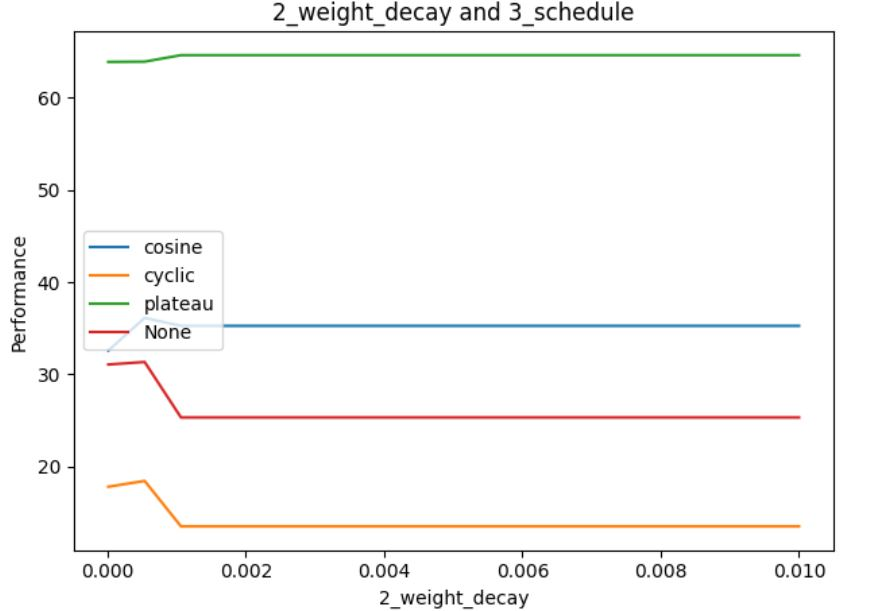

weight decay is correlated in similiar way with both optimizer

In [274]:
if ALL_CODE:
    vis.plot_pairwise_marginal([1,3])

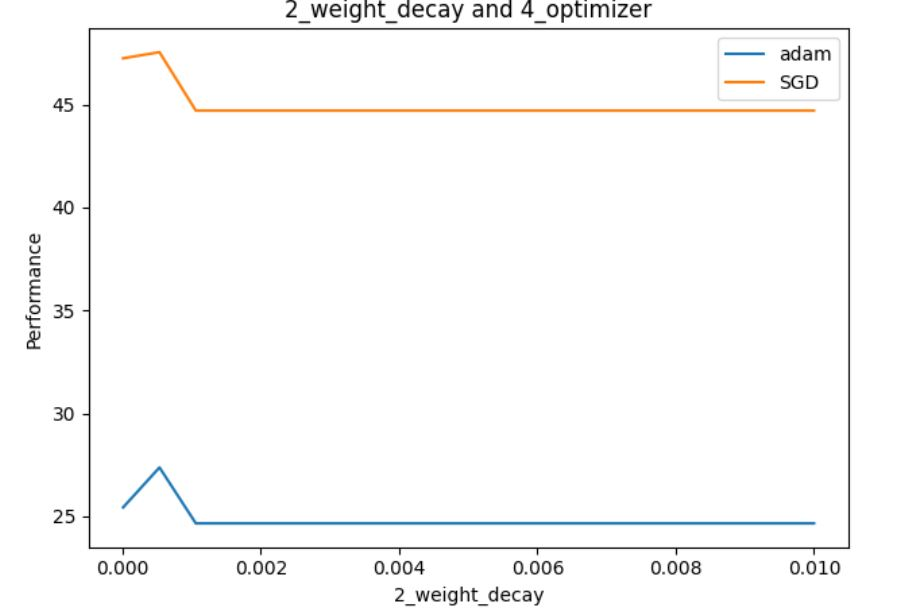

**label smoothing**

schedule seem weakly correlated with label smoothing (however with not so great differences)

In [275]:
if ALL_CODE:
    vis.plot_pairwise_marginal([2,4])

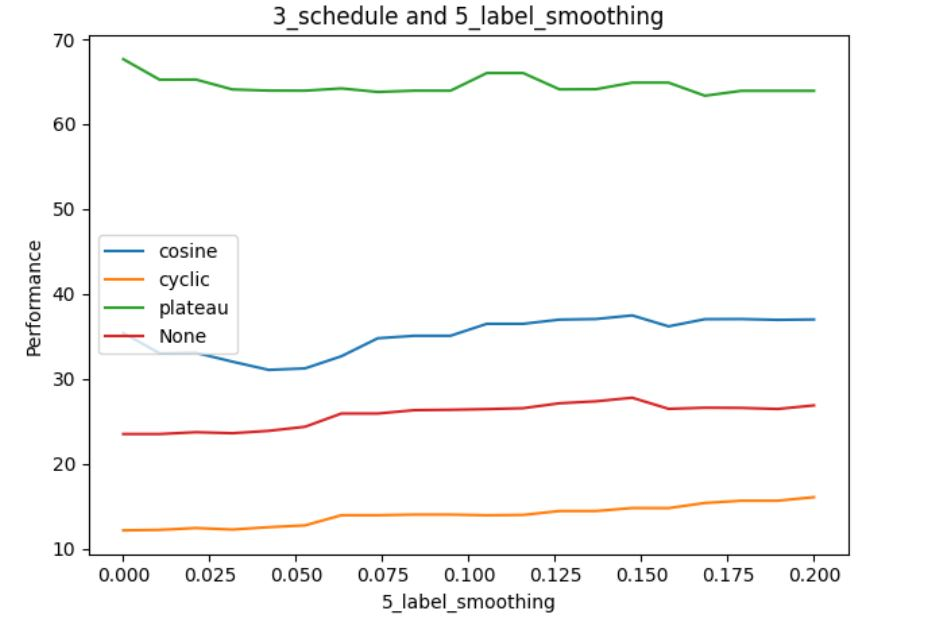

label smoothing seem weakly correlated with optimizer (however with not so great differences)

In [276]:
if ALL_CODE:
    vis.plot_pairwise_marginal([3,4])

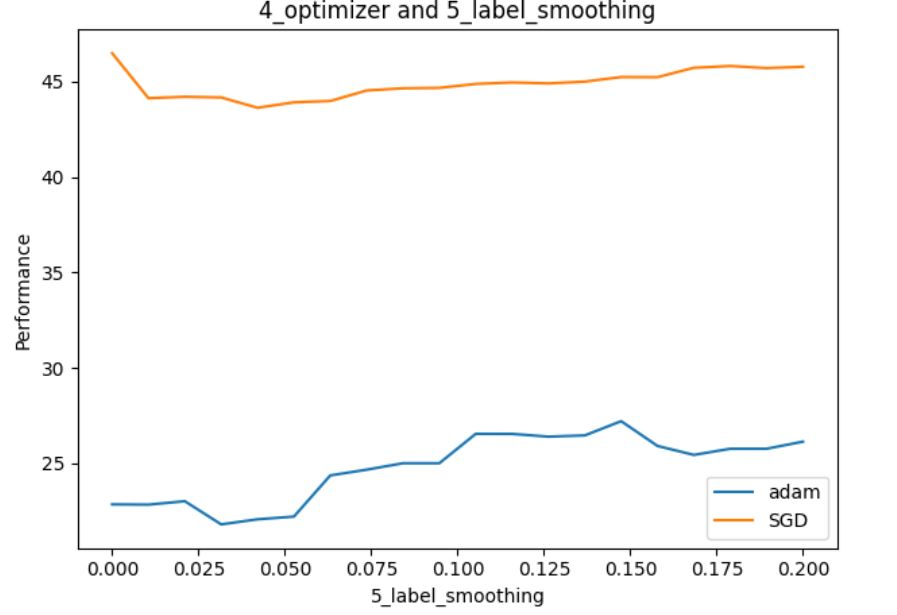

**scheduler**

as expected scheduler is correlated with optimizer

In [277]:
if ALL_CODE:
    vis.plot_pairwise_marginal([2,3])

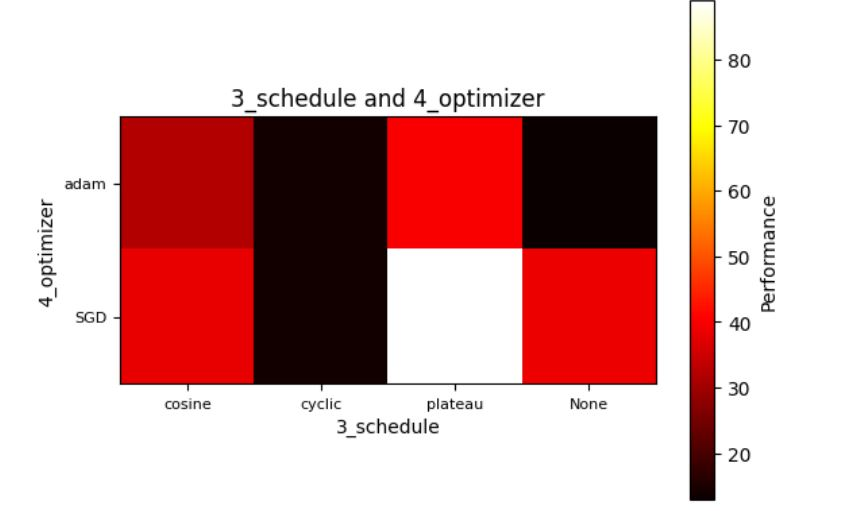

**summing up**

- wd correlated with scheduler
- scheduler correlated with optimizer
- learning rate correlated with optimizer

so they could be optimized together
- wd + scheduler + lr + optimizer
- label smoothing

######For R->P

In [278]:
REL_DICT_REAL = None
if(not(os.path.exists("../Material/REL_DICT_REAL.pickle"))):
    REL_DICT_REAL=relation_grid_search(PARAM_LIST_REAL_REL, PARAM_SAMPLE_TRASF_REAL, data = "real")
    with open("../Material/REL_DICT_REAL.pickle", 'wb') as f:
        pickle.dump(REL_DICT_REAL, f)
else:
    with open('../Material/REL_DICT_REAL.pickle', 'rb') as f:
        REL_DICT_REAL=pickle.load(f)
write_fanova_file(rel_dict = REL_DICT_REAL, X_name = "../Material/X_REAL.csv", Y_name = "../Material/Y_REAL.csv")

In [279]:
X = np.genfromtxt("../Material/X_REAL.csv", delimiter = ",")
Y = np.genfromtxt("../Material/Y_REAL.csv", delimiter = ",")
if ALL_CODE:
  f = fANOVA(X,Y, config_space = GENERAL_CONFIG_SPACE_REAL)
  for i in range(X.shape[1]):
      print("PARAM " + list(PARAM_DICT_REL.keys())[i])
      print(f.quantify_importance((i, )))



```
PARAM lr
{(0,): {'individual importance': 0.06831621728500689, 'total importance': 0.06831621728500689, 'individual std': 0.0609077040297422, 'total std': 0.0609077040297422}}
PARAM wd
{(1,): {'individual importance': 0.0019939167816792475, 'total importance': 0.0019939167816792475, 'individual std': 0.003950378359308636, 'total std': 0.003950378359308636}}
PARAM scheduler
{(2,): {'individual importance': 0.24698145837997046, 'total importance': 0.24698145837997046, 'individual std': 0.12848888622487797, 'total std': 0.12848888622487797}}
PARAM optimizer
{(3,): {'individual importance': 0.28822373582139227, 'total importance': 0.28822373582139227, 'individual std': 0.13692513092860098, 'total std': 0.13692513092860098}}
PARAM smoothing
{(4,): {'individual importance': 0.0032690760841439085, 'total importance': 0.0032690760841439085, 'individual std': 0.0031292153257170495, 'total std': 0.0031292153257170495}}```



In [280]:
if ALL_CODE:
    vis = fanova.visualizer.Visualizer(f, GENERAL_CONFIG_SPACE_REAL, "../Material/")

**learning rate**

lr seem highly correlated with schedule

In [281]:
if ALL_CODE:
    vis.plot_pairwise_marginal([0,2])

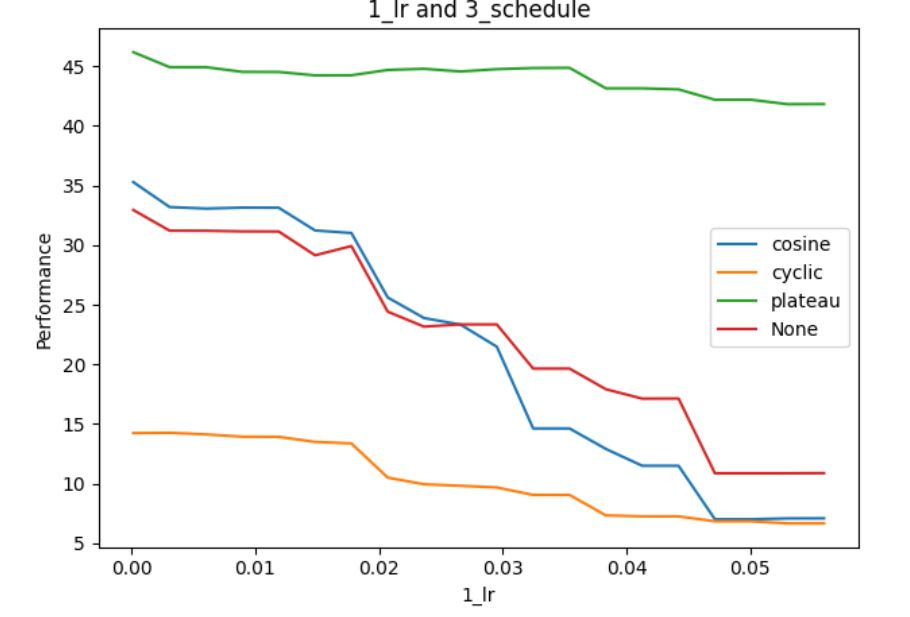

similiar consideration previous domain

In [282]:
if ALL_CODE:    
    vis.plot_pairwise_marginal([0,3])

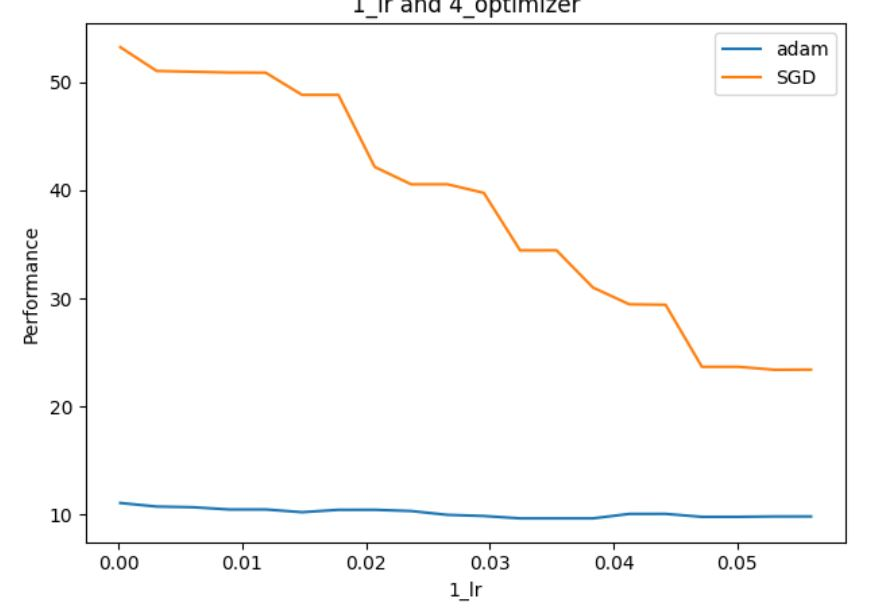

**weight decay**

there are some sign of weak correlation betwen wd and optimizer

In [283]:
if ALL_CODE:
    vis.plot_pairwise_marginal([1,3])

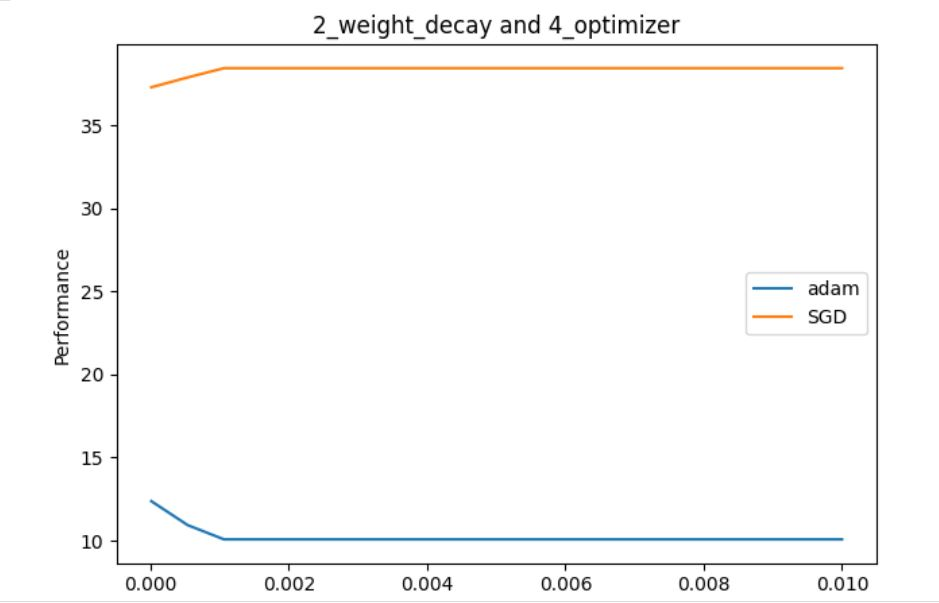

In [284]:
if ALL_CODE:
    vis.plot_pairwise_marginal([1,2])

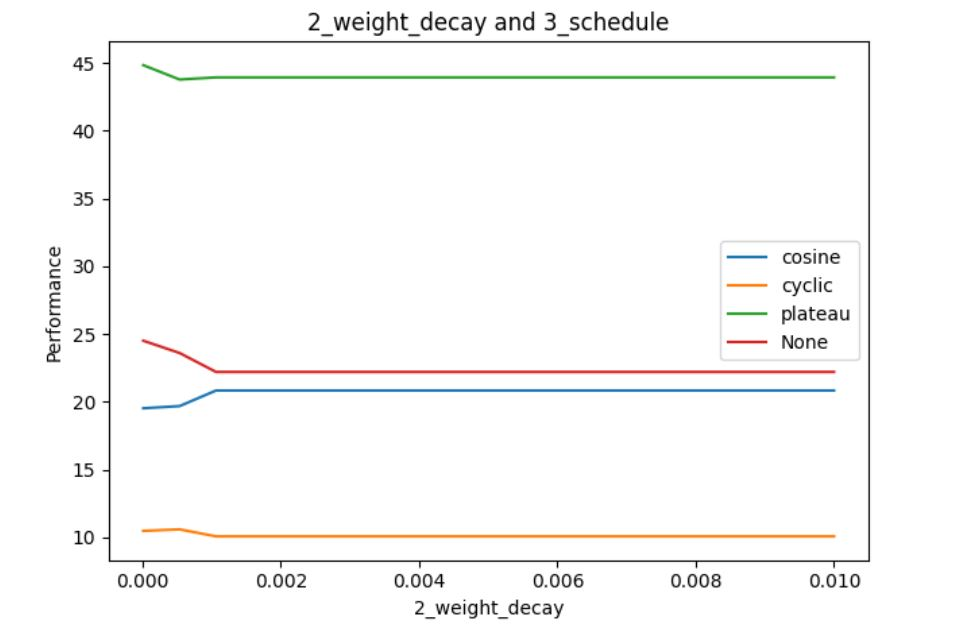

**label smoothing**

similiar consideration to previous domain

In [285]:
if ALL_CODE:
    vis.plot_pairwise_marginal([2,4])

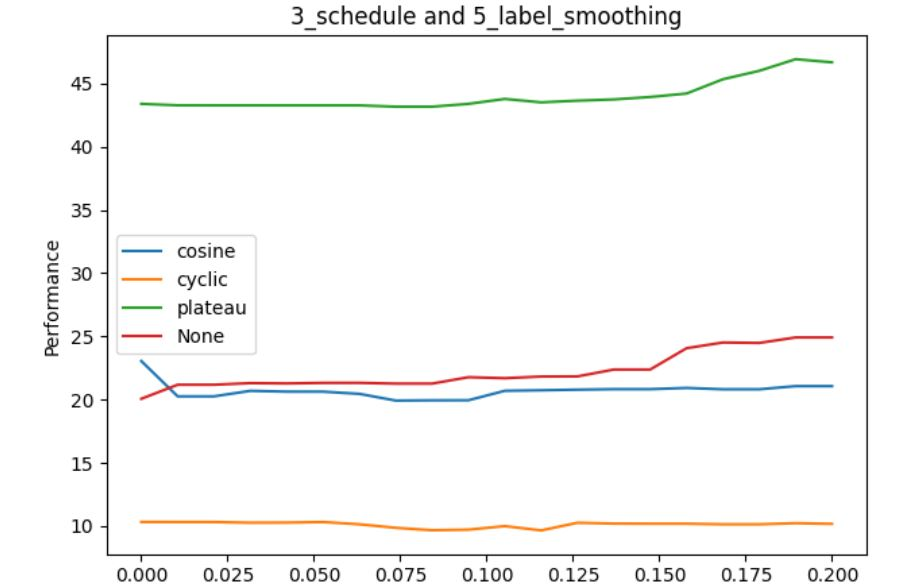

In [286]:
if ALL_CODE:
    vis.plot_pairwise_marginal([3,4])

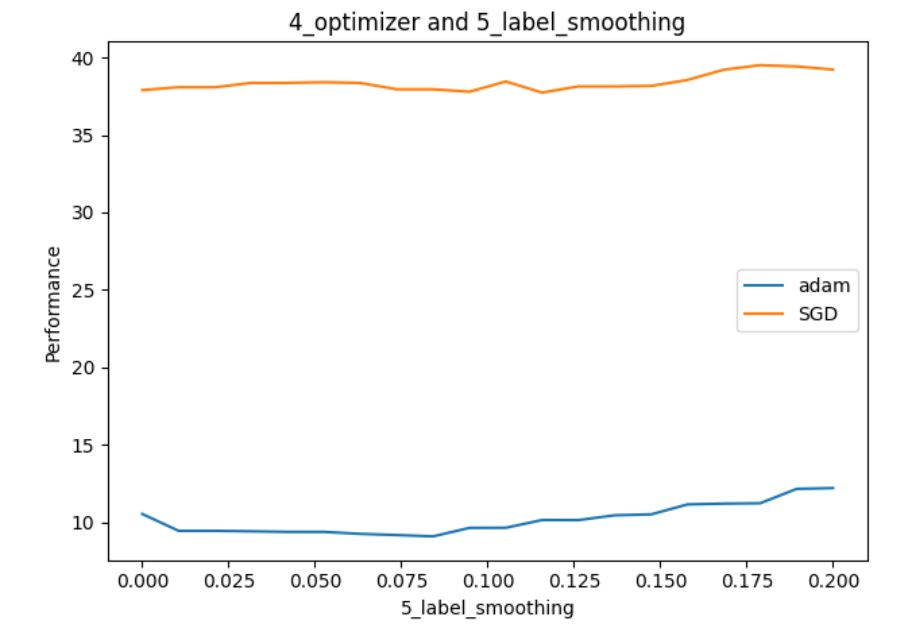

**scheduler**

similiar results for other domain

In [287]:
if ALL_CODE:
    vis.plot_pairwise_marginal([2,3])

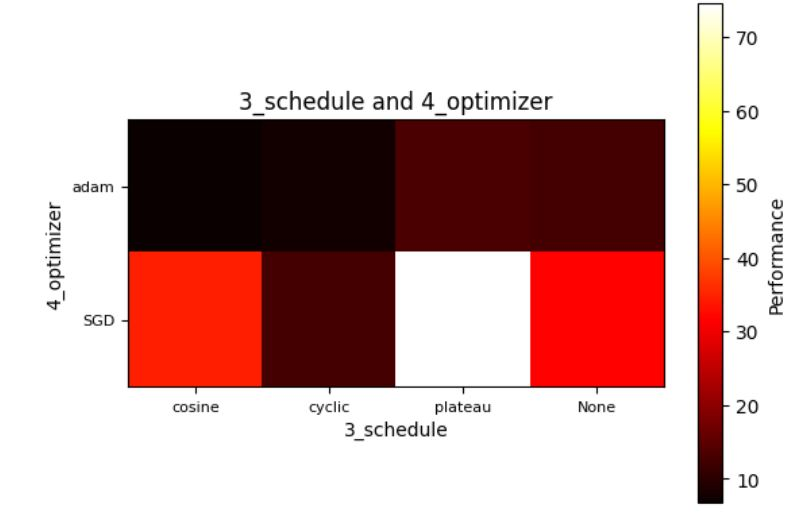

**summing up**

similiar consideration of other domain

#####**11.4.2 Optimization**

here BOHB optimization via SMAC3 is done

######11.4.2.1 lr + wd + scheduler + optimizer

here is considered
- adam
- sgd
- nadam
- radam
- adamw

adamax is not considered cause is used for time varying processes [https://keras.io/api/optimizers/adamax/]

In [288]:
#Is responsible to evaluate a hyperparameter setting and returning the associated loss that is minimized.
class ParamsOptimizerLrWdSchedulerOptimizer():
    '''
    Class to handle optimization of lr wd scheduler and optimizer
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        model: str 
            -- name of model want to be optimize

        data: str 
            -- if product or real data are to be optimized

        amp: bool 
            -- if amp have to be used

        self.accumulation_steps: int
            -- accumulation steps
            
        self.N_data_train: int 
            -- number of train data set

        N_data_valid:int
            -- number of data validation set

        save_name: str 
            -- name where save temporary net results
        

    Public Methods:
    ----------
        compute(
        self,  config: Configuration, 
        seed: int = RANDOM_SEED, budget: int = 10) -> float
            -- compute current incumbent value

        configspace(self) -> ConfigurationSpace
            -- retrieve current configuration space

        
    
    '''
    #allows to perform inital computations, e.g. loading the dataset, when the worker is started
    def __init__(
        self, save_name: str = "TEMPORANEOUS_NET.pt",  
        data: str = "product", model: str = "convnext_our", 
        N_train: int = 1000, N_valid: int = 200, 
        amp: bool = True, accumulation_steps: int = 10) -> None:
      
        self.model: str = model
        self.data: str = data
        self.amp: bool = amp
        self.accumulation_steps: int = accumulation_steps
        self.N_data_train: int = N_train
        self.N_data_valid:int = N_valid
        self.save_name: str = save_name
        return None

    #repeatedly called during the optimization and evaluates a given configuration yielding the associated loss.
    def compute(
        self,  config: Configuration, 
        seed: int = RANDOM_SEED, budget: int = 10) -> float:
        """
        compute current incumbent value
        ...

        Keyword Arguments:
        ----------

          config: Configuration
              -- incumbent sampled config
          
          seed: int
               -- random seed for optimizer
          
          budget: int
                -- number epoch allowed to be evaluated

        Returns
        ----------
          value of 1-accuracy to be minimized

        """
        schedule_params: List[Union[float, str]] = []
        if config["scheduler"] == "cosine":
            schedule_params.append(config["T_0"])
            schedule_params.append(config["T_mult"])
            schedule_params.append(config["eta_min"])
        elif config["scheduler"] == "cyclic":
            schedule_params.append(config["step_up"])
            schedule_params.append(config["step_down"])
            schedule_params.append(config["gamma"])
        elif config["scheduler"] == "plateau":
            schedule_params.append(config["factor"])
            schedule_params.append(config["patience"])
        else:
            schedule_params = []
        optimizer_params: List[Union[str, int]] = []
        if config["optimizer"]=="SGD":
            optimizer_params.append(config["momentum"])
            optimizer_params.append(config["nesterov"])
        elif config["optimizer"]=="nadam":
            optimizer_params.append(config["beta1"])
            optimizer_params.append(config["beta2"])
            optimizer_params.append(config["eps_a"])
            optimizer_params.append(config["momentum_decay"])
        else:
            optimizer_params.append(config["beta1"])
            optimizer_params.append(config["beta2"])
            optimizer_params.append(config["eps_a"])
        net, test_accuracy = opt_train_non_da(
            data = self.data,
            collect=False,
            optimizer = config["optimizer"],
            optimizer_params = optimizer_params,
            epochs = int(np.ceil(budget)),
            batch_size = "dynamic",
            sample_transformation = PARAM_SAMPLE_TRASF_PRODUCT if self.data == "product" else PARAM_SAMPLE_TRASF_REAL,
            lr = config["lr"],
            wd = config["wd"],
            N_train = self.N_data_train,
            N_valid = self.N_data_valid,
            amp = self.amp, 
            accumulation_steps = self.accumulation_steps,
            label_smoothing = None,
            decaying_factor = 10,
            schedule = config["scheduler"],
            schedule_params = schedule_params,
            all_metrics = False,
            save_name = self.save_name,
            print_all = False
          )
        
        # SMAC always minimize
        return  1 - (test_accuracy/100) 
    
    #ConfigurationSpace-object defining all hyperparameters, their ranges, and potential dependencies between them.
    @property
    def configspace(self) -> ConfigurationSpace:
        """
        configuration space definition
        ...

        Keyword Arguments:
        ----------
            None

        Returns
        ----------
          configuration space

        """
        # Build Configuration Space which defines all parameters and their ranges.  
        cs: ConfigurationSpace = ConfigurationSpace()
        # place a log-normal prior on the learning rate, so that it is centered on 10^-3,
        #with one unit of standard deviation per multiple of 10 (in log space)
        learning_rate = NormalFloatHyperparameter(
           "lr",
            lower = MIN_LR_REAL["convnext_our"] if self.data == "real" else MIN_LR_PRODUCT["convnext_our"],
            upper = MAX_LR_REAL["convnext_our"] if self.data == "real" else MAX_LR_PRODUCT["convnext_our"],
            mu = np.log(0.001), #value used in standard test
            sigma = np.log(100),
            log = True,
        )
        #weight decay
        #10-5 a 10-2 o 0
        weight_decay=NormalFloatHyperparameter(
            "wd", 
            lower = 1e-5, 
            upper = 1e-2, 
            mu = np.log(0.0001),  # value used in standard test
            sigma = np.log(10),
            log = True
        )
        
        # Add all hyperparameters at once:
        cs.add_hyperparameters([learning_rate, weight_decay])
        # Moreover, we believe None is the most likely schedule
        schedule = CategoricalHyperparameter(
            "scheduler",
            ["cosine", "cyclic", "plateau", "none"],
            weights = [1, 1, 1, 3],
            default_value = "none",
        )
        cs.add_hyperparameters([schedule])
        T_0 = CSH.UniformIntegerHyperparameter(
            "T_0", lower = 5, upper = 50, default_value = 5)
        T_mult = CSH.UniformIntegerHyperparameter(
            "T_mult", lower = 1, upper = 10, default_value = 1)
        eta_min = CSH.UniformFloatHyperparameter(
            "eta_min", lower = 0, upper = 0.1, default_value = 0)
        cs.add_hyperparameters([T_0, T_mult, eta_min])
        cond10 = CS.EqualsCondition(
            T_mult, schedule, "cosine")
        cs.add_condition(cond10)
        cond11 = CS.EqualsCondition(
            T_0, schedule, "cosine")
        cs.add_condition(cond11)
        cond12 = CS.EqualsCondition(
            eta_min, schedule, "cosine")
        cs.add_condition(cond12)
        step_size_up = CSH.UniformIntegerHyperparameter(
            "step_up", lower = 1000, upper = 3000, default_value = 2000)
        step_size_down = CSH.UniformIntegerHyperparameter(
            "step_down", lower = 1000, upper = 3000, default_value = 2000)
        gamma=CSH.UniformFloatHyperparameter(
            "gamma", lower = 0.5, upper = 1.0, default_value = 1.0)
        cs.add_hyperparameters([step_size_up, step_size_down, gamma])
        cond13 = CS.EqualsCondition(step_size_up, schedule, "cyclic")
        cs.add_condition(cond13)
        cond14 = CS.EqualsCondition(step_size_down, schedule, "cyclic")
        cs.add_condition(cond14)
        cond15 = CS.EqualsCondition(gamma, schedule, "cyclic")
        cs.add_condition(cond15)
        factor = CSH.UniformFloatHyperparameter(
            "factor", lower = 0.01, upper = 0.5, default_value = 0.1)
        patience = CSH.UniformIntegerHyperparameter(
            "patience", lower = 1, upper = 20, default_value = 10)
        cs.add_hyperparameters([factor, patience])
        cond16 = CS.EqualsCondition(factor, schedule, "plateau")
        cs.add_condition(cond16)
        cond17 = CS.EqualsCondition(patience, schedule, "plateau")
        cs.add_condition(cond17)
        # consider SGD as general porpose every time useful optimizer
        optimizer = CategoricalHyperparameter(
            "optimizer",
            ["SGD", "adam", "nadam", "radam", "adamw"],
            weights=[4, 1, 1, 1, 1],
            default_value="SGD",
        )
        cs.add_hyperparameters([optimizer])
        #SGD
        momentum = CSH.UniformFloatHyperparameter(
            "momentum", lower = 0.5, upper = 0.99, default_value = 0.9)
        cs.add_hyperparameters([momentum])
        cond = CS.EqualsCondition(momentum, optimizer, "SGD")
        cs.add_condition(cond)
        nesterov = CSH.UniformIntegerHyperparameter(
            "nesterov", lower = 0, upper = 1, default_value = 0)
        cs.add_hyperparameters([nesterov])
        cond1 = CS.EqualsCondition(nesterov, optimizer, "SGD")
        cs.add_condition(cond1)
        #Adam
        beta1=CSH.UniformFloatHyperparameter(
            "beta1", lower = 0.5, upper = 0.9, default_value = 0.9)
        beta2=CSH.UniformFloatHyperparameter(
            "beta2", lower = 0.5, upper = 0.999, default_value = 0.999)
        eps_a=CSH.UniformFloatHyperparameter(
            "eps_a", lower = 1e-9, upper = 1e-6, default_value = 1e-8)
        cs.add_hyperparameters([beta1,beta2, eps_a])
        cond3 = CS.NotEqualsCondition(beta1, optimizer, "SGD")
        cs.add_condition(cond3)
        cond4 = CS.NotEqualsCondition(beta2, optimizer, "SGD")
        cs.add_condition(cond3)
        cond5 = CS.NotEqualsCondition(eps_a, optimizer, "SGD")
        cs.add_condition(cond4)
        #Nadam
        momentum_decay=CSH.UniformFloatHyperparameter(
            "momentum_decay", lower = 0, upper = 0.5, default_value = 0)
        cs.add_hyperparameters([momentum_decay])
        cond2 = CS.EqualsCondition(momentum_decay, optimizer, "nadam")
        cs.add_condition(cond2)
        return cs

For P->R

In [289]:
if ALL_CODE:
    optimize_net(ParamsOptimizerLrWdSchedulerOptimizer, data="product")


```
Dictionary parameter
{
  'eps_a': 2.901166868542539e-07, 
  'lr': 0.00878248760630914, 
  'optimizer': 'SGD', 
  'scheduler': 'none', 
  'wd': 1.1559820780617287e-05, 
  'momentum': 0.669001748815815, 
  'nesterov': 1
}
```



For R->P

In [290]:
if ALL_CODE:
    optimize_net(ParamsOptimizerLrWdSchedulerOptimizer, data="real")



```
{
  'beta1': 0.5318330865086823,
  'beta2': 0.972314731793811,
  'eps_a': 7.58742552859644e-07,
  'lr': 0.00033582372793957484,
  'momentum_decay': 0.019467161096021354,
  'optimizer': 'nadam',
  'scheduler': 'none',
  'wd': 0.0004903049898644513,
}
```



######11.4.2.2 label smoothing

In [291]:
class ParamsOptimizerSmoothing():
    def __init__(
        self, save_name: str = "TEMPORANEOUS_NET.pt",  
        data: str = "product", model: str = "convnext_our", 
        N_train: int = 1000, N_valid: int = 200, amp: bool = True,
        accumulation_steps: int = 10) -> None:

        self.model: str = model
        self.data: str = data
        self.amp: bool = amp
        self.accumulation_steps: int = accumulation_steps
        self.N_data_train: int = N_train
        self.N_data_valid: int = N_valid
        self.save_name: str = save_name

    '''
    Class to handle optimization of label smoothing
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        model: str 
            -- name of model want to be optimize

        data: str 
            -- if product or real data are to be optimized

        amp: bool 
            -- if amp have to be used

        self.accumulation_steps: int
            -- accumulation steps
            
        self.N_data_train: int 
            -- number of train data set

        N_data_valid:int
            -- number of data validation set

        save_name: str 
            -- name where save temporary net results
        

    Public Methods:
    ----------
        compute(
        self,  config: Configuration, 
        seed: int = RANDOM_SEED, budget: int = 10) -> float
            -- compute current incumbent value

        configspace(self) -> ConfigurationSpace
            -- retrieve current configuration space

        
    
    '''
    #repeatedly called during the optimization and evaluates a given configuration yielding the associated loss.
    def compute(
        self,  config: Configuration, seed: int = RANDOM_SEED, 
        budget: int = 5) -> float:
        """
        compute current incumbent value
        ...

        Keyword Arguments:
        ----------

          config: Configuration
              -- incumbent sampled config
          
          seed: int
               -- random seed for optimizer
          
          budget: int
                -- number epoch allowed to be evaluated

        Returns
        ----------
          value of 1-accuracy to be minimized

        """
        net, test_accuracy = opt_train_non_da(
            data = self.data,
            collect = False,
            optimizer = "SGD" if self.data == "product" else "nadam",
            optimizer_params = [0.669001748815815, 1] if self.data == "product" else [0.5318330865086823,0.972314731793811,7.58742552859644e-07,0.019467161096021354],
            epochs = int(np.ceil(budget)),
            batch_size = "dynamic",
            sample_transformation = PARAM_SAMPLE_TRASF_PRODUCT if self.data == "product" else PARAM_SAMPLE_TRASF_REAL,
            lr = 0.00878248760630914 if self.data == "product" else 0.00033582372793957484,
            wd = 1.1559820780617287e-05 if self.data == "product" else 0.0004903049898644513,
            N_train = self.N_data_train,
            N_valid = self.N_data_valid,
            amp = self.amp, 
            accumulation_steps = self.accumulation_steps,
            label_smoothing = config["smoothing"],
            decaying_factor = 10,
            schedule = None,
            schedule_params = [],
            all_metrics = False,
            save_name = self.save_name,
            print_all = False
            )
        return  1 - (test_accuracy/100) 

    @property
    def configspace(self) -> ConfigurationSpace:
        """
        configuration space definition
        ...

        Keyword Arguments:
        ----------
            None

        Returns
        ----------
          configuration space

        """
        # Build Configuration Space which defines all parameters and their ranges.  
        cs = ConfigurationSpace()
        smoothing = CSH.UniformFloatHyperparameter(
            "smoothing",
            lower= 0.0,
            upper= 0.5,
            default_value=0.0
        )
        # Add all hyperparameters at once:
        cs.add_hyperparameters([smoothing])
        return cs

For P->R

In [292]:
if ALL_CODE:
    optimize_net(ParamsOptimizerSmoothing, data="product")



```
Incumbent cost (Hyperband): 0.015625
Dictionary parameter
{'smoothing': 0.2850983852089398}
```



For R->P

In [293]:
if ALL_CODE:
    optimize_net(ParamsOptimizerSmoothing, data="real")



```
Incumbent cost (Hyperband): 0.03125
Dictionary parameter
{'smoothing': 0.2744067519636624}
```



#### 11.5 FINAL BASELINE ARCHITECTURE 

in section 11.5.1 classification matrix performance metrics are printed for final baseline architecture

in section 11.5.2 source only and target only classification matrix and accuracy is computed and stored (if not already done)

in section 11.5.3 visualization over winning architecture is done (TSNE, feature map visualization and gradient visualization)

#####**11.5.1 Final Baseline architecture performances**

the only parameter was seen to underperform in practice is label smoothing which is set to zero. here are proposed final architecture performances

###### For P->R

In [294]:
if ALL_CODE:
    net, cl_matrix, _ = opt_train_non_da(
        data = "product",
        collect = False,
        optimizer = "SGD",
        optimizer_params = [0.669001748815815, 1],
        epochs = 10,
        batch_size = "dynamic",
        sample_transformation = PARAM_SAMPLE_TRASF_PRODUCT,
        lr = 0.00878248760630914,
        wd = 1.1559820780617287e-05,
        amp = True, 
        label_smoothing = 0.0,
        all_metrics = True,
        save_name = "MODEL_AFTER_OPT_BEST_PRODUCT.pt",
        print_all = True
        )
    cl_matrix.print()



```
CLASSIFICATION MATRIX
[20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0]
[0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 19, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 18, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20]


ACCURACY
overall
0.99925
per class
[0.995, 1.0, 1.0, 1.0, 1.0, 1.0, 0.9975, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.9975, 0.995, 1.0, 1.0]


PRECISION
overall
0.9925
per class
[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.95, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.9, 1.0, 1.0]


RECALL
overall
0.9930735930735931
per class
[0.9090909090909091, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.9523809523809523, 1.0, 1.0, 1.0]


F1
overall
0.992485905194506
per class
[0.9523809523809523, 1.0, 1.0, 1.0, 1.0, 1.0, 0.9743589743589743, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.975609756097561, 0.9473684210526315, 1.0, 1.0]


F1 NEGATIVO
overall
0.992485905194506
per class
[0.9973614775725593, 1.0, 1.0, 1.0, 1.0, 1.0, 0.9986859395532194, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.9986824769433464, 0.9973753280839895, 1.0, 1.0]


GEOMETRIC MEAN
overall
1.4114017869118476
per class
[1.396331776460563, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4046511716124377, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4050950975079612, 1.3945406946864696, 1.4142135623730951, 1.4142135623730951]
________________________________________________________________________
MARKEDNESS
overall
0.9921052631578947
per class
[0.9947368421052631, 1.0, 1.0, 1.0, 1.0, 1.0, 0.95, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.9973684210526317, 0.8999999999999999, 1.0, 1.0]


UPM
overall
0.9959732542552457
per class
[0.9743523649954892, 1.0, 1.0, 1.0, 1.0, 1.0, 0.9863724853990915, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.9870112959406231, 0.9717289387697116, 1.0, 1.0]


COHEN K
overall
0.8976190476190476
per class
[0.950950166988625, 1.0, 1.0, 1.0, 1.0, 1.0, 0.973399487199264, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.9746151480029396, 0.946196574774599, 1.0, 1.0]


FM
overall
1.4090610349491248
per class
[1.381698559415515, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.396424004376894, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.3972762620115438, 1.378404875209022, 1.4142135623730951, 1.4142135623730951]


MATHEW
overall
0.9164857050807319
per class
[0.49874686716791977, 1.0, 1.0, 1.0, 1.0, 1.0, 0.666110183639399, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.666110183639399, 0.49874686716791977, 1.0, 1.0]

```



######For R->P

In [295]:
if ALL_CODE:
    net, cl_matrix, _ = opt_train_non_da(
        data = "real",
        collect=False,
        optimizer =  "nadam",
        optimizer_params=[0.5318330865086823, 0.972314731793811, 7.58742552859644e-07, 0.019467161096021354],
        epochs = 10,
        batch_size = "dynamic",
        sample_transformation = PARAM_SAMPLE_TRASF_REAL,
        lr = 0.00033582372793957484,
        wd = 0.0004903049898644513,
        amp = True, 
        label_smoothing = 0.0,
        all_metrics = True,
        save_name = "MODEL_AFTER_OPT_BEST_REAL.pt",
        print_all = True
        )
    cl_matrix.print()



```
CLASSIFICATION MATRIX
[18, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]
[0, 20, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 19, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]
[0, 0, 0, 0, 0, 19, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 1, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 19, 0, 0, 0, 0, 0, 0, 1, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 18, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 20, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 20, 0, 0, 0]
[2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 17, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20]


ACCURACY
overall
0.9975
per class
[0.9925, 0.995, 0.9975, 1.0, 0.9975, 0.9975, 1.0, 1.0, 1.0, 0.9975, 0.995, 0.995, 1.0, 1.0, 1.0, 0.9975, 0.9975, 0.9875, 1.0, 1.0]


PRECISION
overall
0.975
per class
[0.9, 1.0, 0.95, 1.0, 1.0, 0.95, 1.0, 1.0, 1.0, 1.0, 0.95, 0.9, 1.0, 1.0, 1.0, 1.0, 1.0, 0.85, 1.0, 1.0]


RECALL
overall
0.9755359990886306
per class
[0.9473684210526315, 0.9090909090909091, 1.0, 1.0, 0.9523809523809523, 1.0, 1.0, 1.0, 1.0, 0.9523809523809523, 0.95, 1.0, 1.0, 1.0, 1.0, 0.9523809523809523, 0.9523809523809523, 0.8947368421052632, 1.0, 1.0]


F1
overall
0.9747889070706786
per class
[0.9230769230769231, 0.9523809523809523, 0.9743589743589743, 1.0, 0.975609756097561, 0.9743589743589743, 1.0, 1.0, 1.0, 0.975609756097561, 0.95, 0.9473684210526315, 1.0, 1.0, 1.0, 0.975609756097561, 0.975609756097561, 0.8717948717948718, 1.0, 1.0]


F1 NEGATIVO
overall
0.9747889070706786
per class
[0.9960578186596584, 0.9973614775725593, 0.9986859395532194, 1.0, 0.9986824769433464, 0.9986859395532194, 1.0, 1.0, 1.0, 0.9986824769433464, 0.9973684210526316, 0.9973753280839895, 1.0, 1.0, 1.0, 0.9986824769433464, 0.9986824769433464, 0.9934296977660972, 1.0, 1.0]


GEOMETRIC MEAN
overall
1.404750966497849
per class
[1.3853283876888474, 1.396331776460563, 1.4046511716124377, 1.4142135623730951, 1.4050950975079612, 1.4046511716124377, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4050950975079612, 1.3954814298487213, 1.3945406946864696, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.4050950975079612, 1.4050950975079612, 1.3657322466578026, 1.4142135623730951, 1.4142135623730951]
________________________________________________________________________
MARKEDNESS
overall
0.9736842105263158
per class
[0.8973684210526316, 0.9947368421052631, 0.95, 1.0, 0.9973684210526317, 0.95, 1.0, 1.0, 1.0, 0.9973684210526317, 0.9473684210526314, 0.8999999999999999, 1.0, 1.0, 1.0, 0.9973684210526317, 0.9973684210526317, 0.844736842105263, 1.0, 1.0]


UPM
overall
0.9863402771961293
per class
[0.9581797113662699, 0.9743523649954892, 0.9863724853990915, 1.0, 0.9870112959406231, 0.9863724853990915, 1.0, 1.0, 1.0, 0.9870112959406231, 0.9731081081081081, 0.9717289387697116, 1.0, 1.0, 1.0, 0.9870112959406231, 0.9870112959406231, 0.928646266122331, 1.0, 1.0]


COHEN K
overall
0.8809523809523809
per class
[0.9194715377699418, 0.950950166988625, 0.973399487199264, 1.0, 0.9746151480029396, 0.973399487199264, 1.0, 1.0, 1.0, 0.9746151480029396, 0.9473684210526315, 0.946196574774599, 1.0, 1.0, 1.0, 0.9746151480029396, 0.9746151480029396, 0.8655435883406197, 1.0, 1.0]


FM
overall
1.396422380890635
per class
[1.3591793189467796, 1.381698559415515, 1.396424004376894, 1.4142135623730951, 1.3972762620115438, 1.396424004376894, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.3972762620115438, 1.378404875209022, 1.378404875209022, 1.4142135623730951, 1.4142135623730951, 1.4142135623730951, 1.3972762620115438, 1.3972762620115438, 1.3208848708745449, 1.4142135623730951, 1.4142135623730951]


MATHEW
overall
0.7586977927723086
per class
[0.3981243217649844, 0.49874686716791977, 0.666110183639399, 1.0, 0.666110183639399, 0.666110183639399, 1.0, 1.0, 1.0, 0.666110183639399, 0.4987121475809258, 0.49874686716791977, 1.0, 1.0, 1.0, 0.666110183639399, 0.666110183639399, 0.28296454992802866, 1.0, 1.0]


```



#####**11.5.2 create some information for DA**

here source only and target only accuracy and classification matrix over target data are retrieved

###### For P->R

In [296]:
if(not(os.path.exists("../Material/NO_RESULTS_PROD.pickle"))):
    net: nn.Module = initialize_net(model = "convnext_our", pretrained = True,  num_classes = NUM_CLASSES).to(device = DEVICE, memory_format = torch.channels_last)
    net.load_state_dict(torch.load("../Material/MODEL_AFTER_OPT_BEST_PRODUCT.pt", map_location=DEVICE))
    train_loader_source, test_loader_source, train_loader_target, test_loader_target = get_data(batch_size = 16, use_workers = True,  image_root = IMAGE_ROOT,  data = "all_product")
    progress_bar = tqdm(total=len(test_loader_source))
    progress_bar.set_description(f"Epoch {1}")
    cost_function = get_cost_function(label_smoothing = 0.0)
    NO_RESULTS_PROD = []
    NO_RESULTS_PROD.extend(test(net, test_loader_target, cost_function, bar = progress_bar, all_metrics = True))
    with open("../Material/NO_RESULTS_PROD.pickle", 'wb') as f:
        pickle.dump(NO_RESULTS_PROD, f)

In [297]:
NO_RESULTS_PROD

[0.01839319746941328, 93.0, <__main__.ClassificationMatrix at 0x7f3d53b4fc10>]



```
[0.01839319746941328, 93.0, <__main__.ClassificationMatrix at 0x7fcbe8f92b30>]
```



In [298]:
if(not(os.path.exists("../Material/TO_RESULTS_PROD.pickle"))):
    TO_RESULTS_PROD=[]
    net_to_non_da, loss_to, acc_to = opt_train_non_da(
        data = "real",
        collect = False,
        optimizer = "SGD",
        optimizer_params = [0.669001748815815, 1],
        epochs = 10,
        batch_size = "dynamic",
        sample_transformation = PARAM_SAMPLE_TRASF_PRODUCT,
        lr = 0.00878248760630914,
        wd = 1.1559820780617287e-05,
        amp = True, 
        label_smoothing = 0.0,
        all_metrics = False,
        print_all = True,
        save_best = True,
        return_loss_test = True
        )
    TO_RESULTS_PROD.extend([loss_to, acc_to])
    with open("../Material/TO_RESULTS_PROD.pickle", 'wb') as f:
      pickle.dump(TO_RESULTS_PROD, f)

In [299]:
TO_RESULTS_PROD

[0.007523889459844213, 97.0]



```
[0.007523889459844213, 97.0]
```



######For R->P

In [300]:
if(not(os.path.exists("../Material/NO_RESULTS_REAL.pickle"))):
  net: nn.Module = initialize_net(model="convnext_our", pretrained=True,  num_classes=NUM_CLASSES).to(device=DEVICE, memory_format=torch.channels_last)
  net.load_state_dict(torch.load("../Material/MODEL_AFTER_OPT_BEST_REAL.pt", map_location=DEVICE))
  train_loader_source, test_loader_source, train_loader_target, test_loader_target  = get_data(batch_size=16, use_workers=True,  image_root=IMAGE_ROOT,  data="all_real")
  progress_bar = tqdm(total=len(test_loader_source))
  progress_bar.set_description(f"Epoch {1}")
  cost_function = get_cost_function(label_smoothing=0.0)
  NO_RESULTS_REAL=[]
  NO_RESULTS_REAL.extend(test(net, test_loader_target, cost_function, bar=progress_bar, all_metrics=True))
  with open("../Material/NO_RESULTS_REAL.pickle", 'wb') as f:
    pickle.dump(NO_RESULTS_PROD, f)

In [301]:
NO_RESULTS_REAL

[0.01839319746941328, 93.0, <__main__.ClassificationMatrix at 0x7f3d53b4ca00>]



```
[0.01839319746941328, 93.0, <__main__.ClassificationMatrix at 0x7fcbe8f914b0>]
```



In [302]:

if(not(os.path.exists("../Material/TO_RESULTS_REAL.pickle"))):
  TO_RESULTS_REAL=[]
  net_to_non_da, loss_to, acc_to = opt_train_non_da(
      data = "product",
      collect=False,
      optimizer = "nadam",
      optimizer_params=[0.5318330865086823,0.972314731793811,7.58742552859644e-07,0.019467161096021354],
      epochs = 10,
      batch_size="dynamic",
      sample_transformation=PARAM_SAMPLE_TRASF_REAL,
      lr=0.00033582372793957484,
      wd=0.0004903049898644513,
      amp=True, 
      label_smoothing=0.0,
      all_metrics=False,
      print_all=True,
      save_best=True,
      return_loss_test=True
      )
  TO_RESULTS_REAL.extend([loss_to, acc_to])
  with open("../Material/TO_RESULTS_REAL.pickle", 'wb') as f:
    pickle.dump(TO_RESULTS_REAL, f)

In [303]:
TO_RESULTS_REAL

[0.0019246114572661099, 99.5]



```
[0.0019246114572661099, 99.5]
```



#####**11.5.3 Visualization over winning architecture**

###### 11.5.3.1 TSNE over winning architecture

For P->R

In [304]:
if ALL_CODE:
    net: nn.Module = initialize_net(
        model = "convnext_our", pretrained = True, 
        num_classes = NUM_CLASSES).to(
            device = DEVICE, memory_format = torch.channels_last)
    if((os.path.exists("../Material/MODEL_AFTER_OPT_BEST_PRODUCT.pt"))):
        net.load_state_dict(
            torch.load("../Material/MODEL_AFTER_OPT_BEST_PRODUCT.pt", 
                       map_location = DEVICE))

**Product domain**

In [305]:
if ALL_CODE:
    T_sne(net, data = "product")

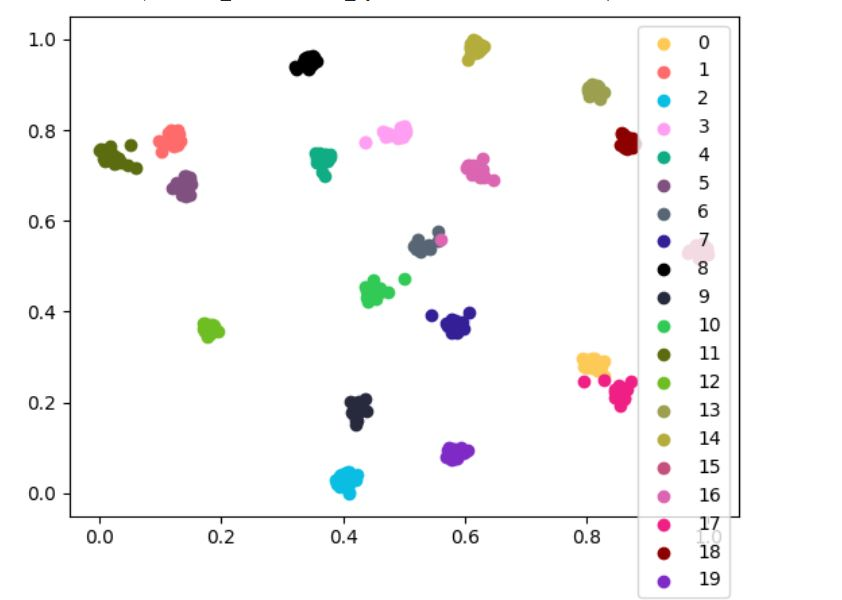

**Real domain**

as expected source data only classifier show not perfectly separated boundaries

In [306]:
if ALL_CODE:
    T_sne(net, data="real")

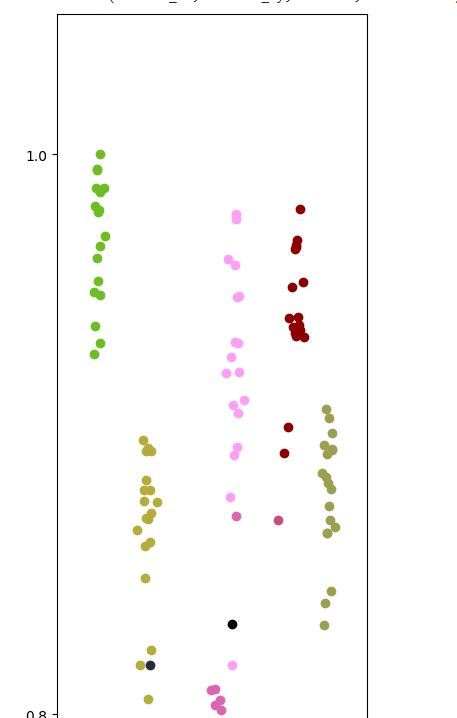

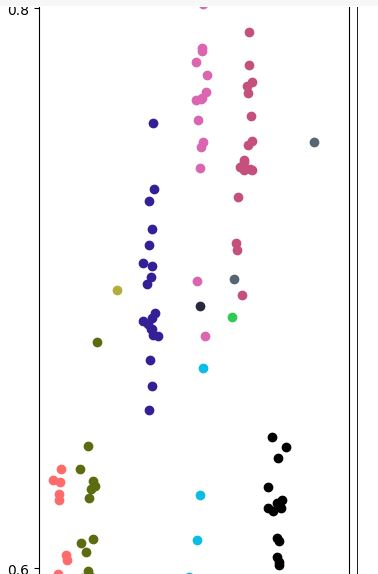

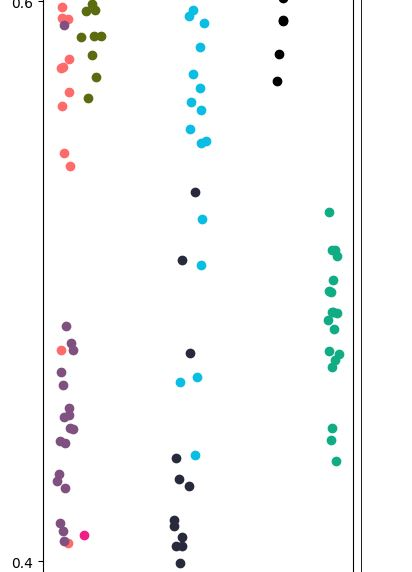

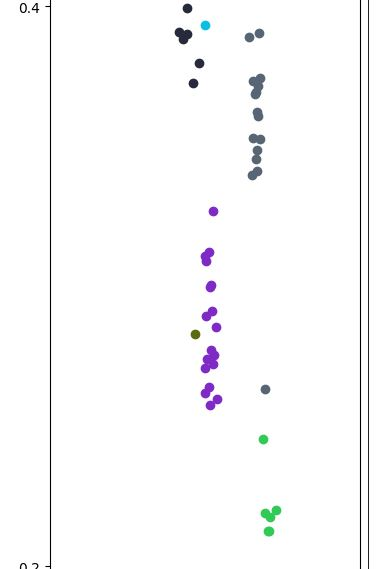

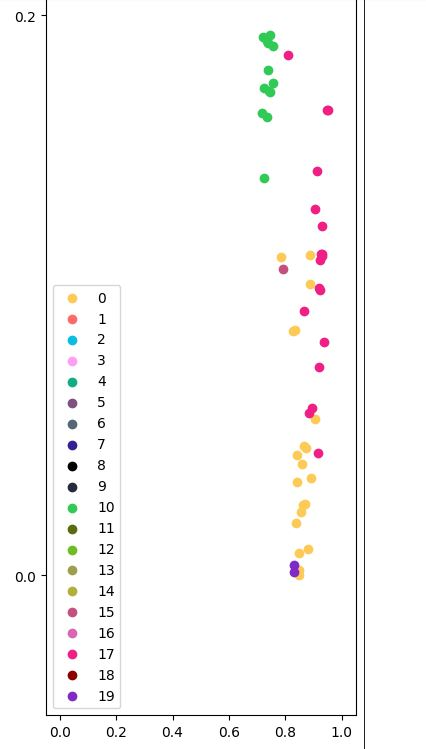

For R->P

In [307]:
if ALL_CODE:
    net: nn.Module = initialize_net(
        model = "convnext_our", pretrained = True,  num_classes = NUM_CLASSES).to(
            device = DEVICE, memory_format = torch.channels_last)
    if((os.path.exists("../Material/MODEL_AFTER_OPT_BEST_REAL.pt"))):
        net.load_state_dict(
            torch.load("../Material/MODEL_AFTER_OPT_BEST_REAL.pt", map_location = DEVICE))

**Real domain**

In [308]:
if ALL_CODE:
    T_sne(net, data="real")

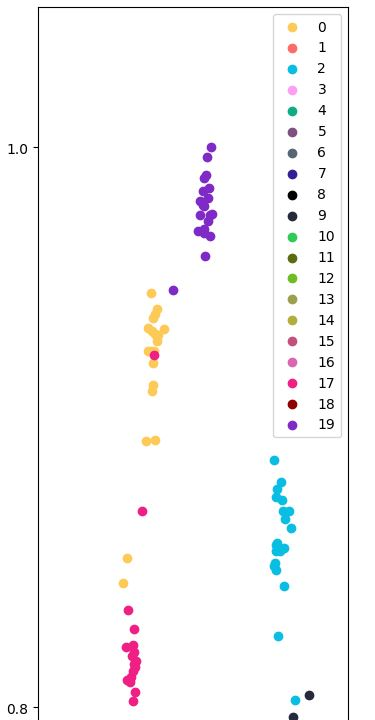

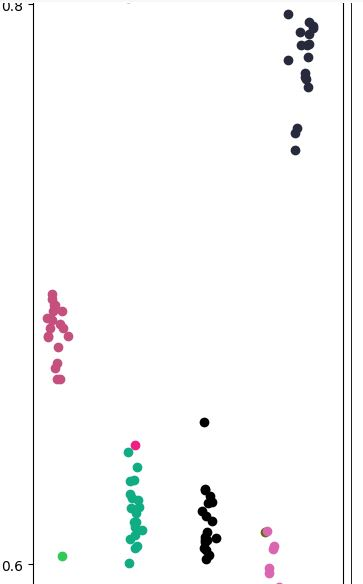

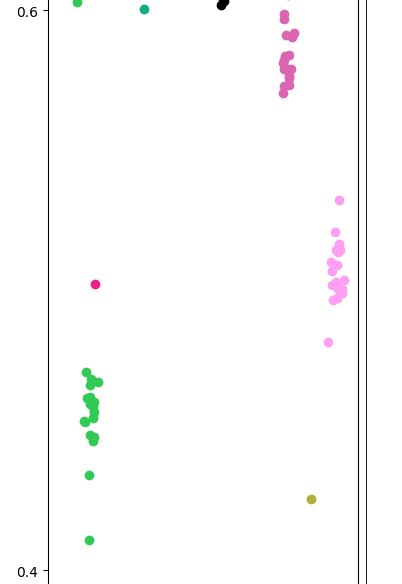

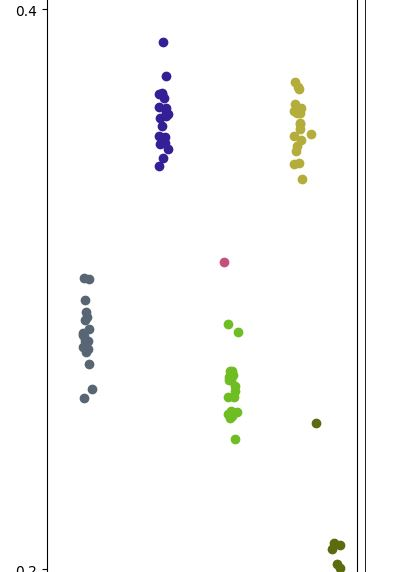

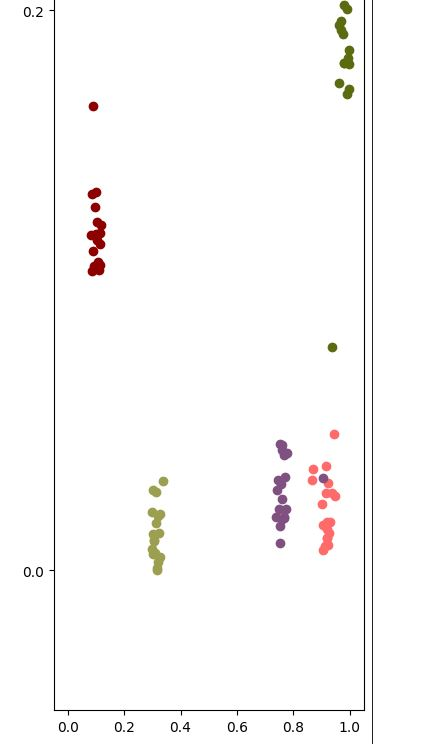

**Product domain**

In [309]:
if ALL_CODE:
    T_sne(net, data = "product")

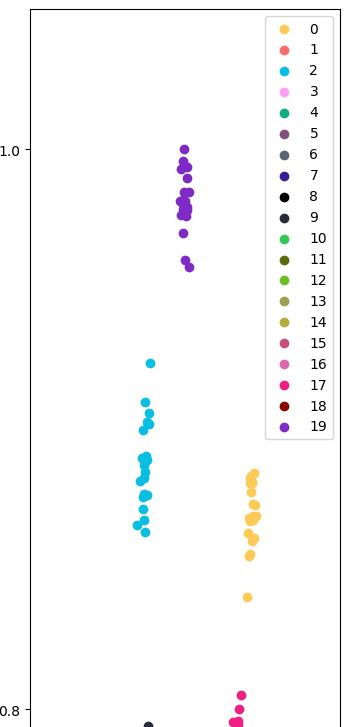

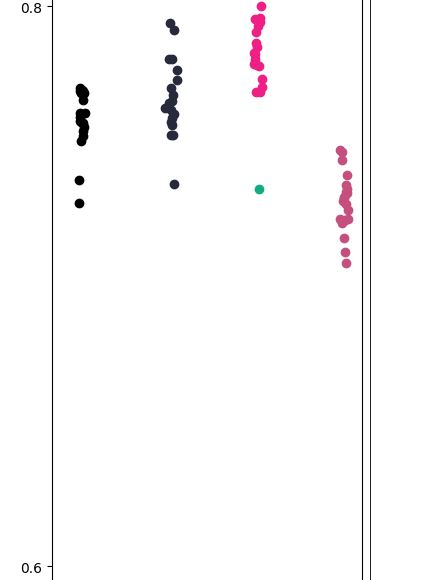

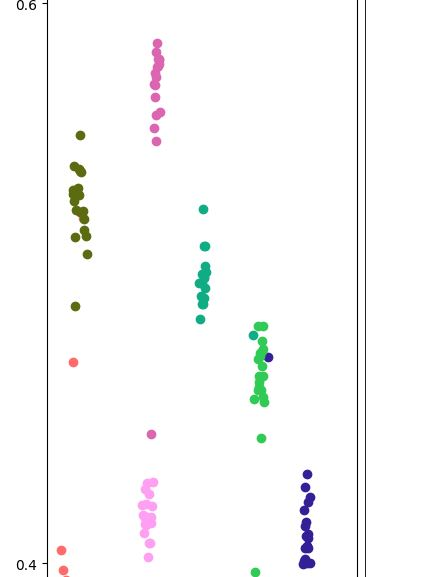

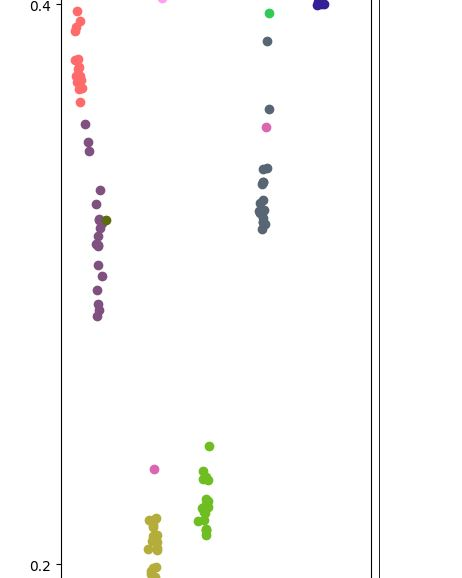

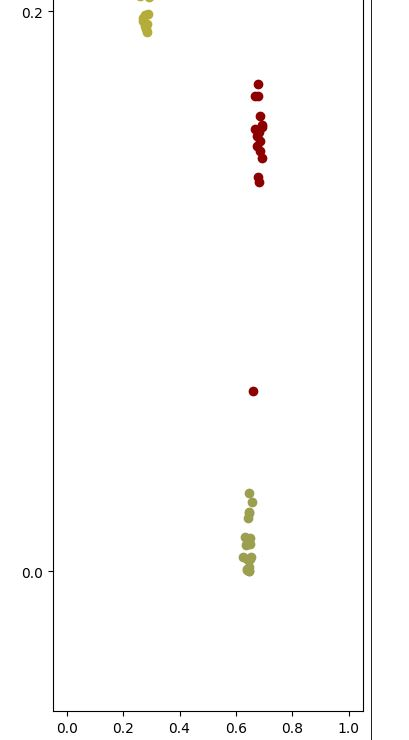

######11.5.3.2 gradient visualization

here plot gradient flows during last epoch of training. clear bar are maximum value, dark value are average value. Some parameters seems to be freezed however high performance do not suggest there is a problem of gradient flow

For P->R

In [310]:
if ALL_CODE:
    net, _ = opt_train_non_da(
        data = "product",
        collect=False,
        optimizer = "SGD",
        optimizer_params = [0.669001748815815, 1],
        epochs = 10,
        batch_size = "dynamic",
        sample_transformation = PARAM_SAMPLE_TRASF_PRODUCT,
        lr = 0.00878248760630914,
        wd = 1.1559820780617287e-05,
        amp = True, 
        label_smoothing = 0.0,
        all_metrics = False,
        save_name = "MODEL_AFTER_OPT_BEST_PRODUCT.pt",
        print_all = False,
        plot_gradients = True
        )

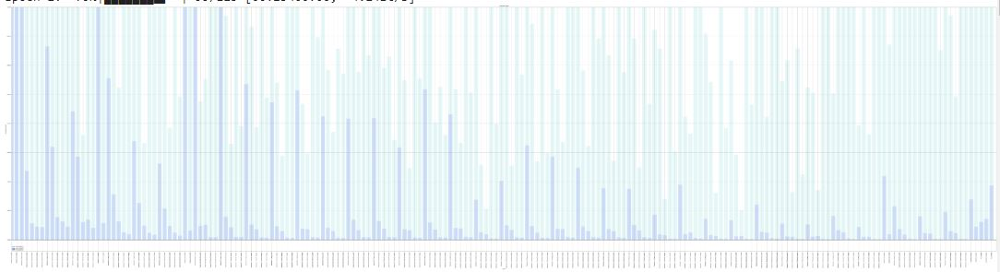

For R->P

In [311]:
if ALL_CODE: 
    net,  _ = opt_train_non_da(
        data = "real",
        collect=False,
        optimizer =  "nadam",
        optimizer_params=[0.5318330865086823, 0.972314731793811, 7.58742552859644e-07, 0.019467161096021354],
        epochs = 10,
        batch_size = "dynamic",
        sample_transformation = PARAM_SAMPLE_TRASF_REAL,
        lr = 0.00033582372793957484,
        wd = 0.0004903049898644513,
        amp = True, 
        label_smoothing = 0.0,
        all_metrics = False,
        save_name = "MODEL_AFTER_OPT_BEST_REAL.pt",
        print_all = False,
        plot_gradients = True
        )

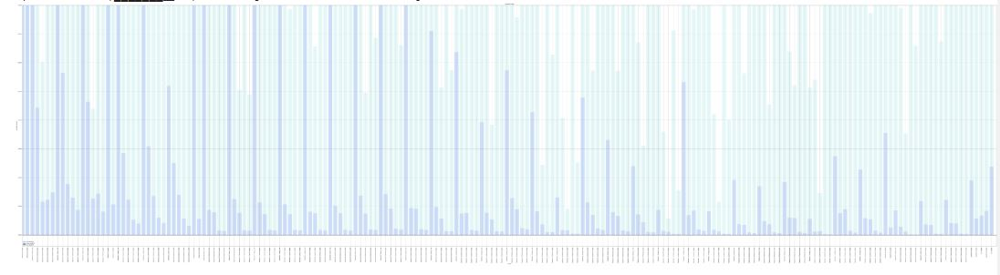

######11.5.3.3. visualize feature maps

here convolutional features are visualized. note that they seem to capture well semantic information

For R->P

In [312]:
if ALL_CODE:
    net: nn.Module = initialize_net(
        model = "convnext_our", pretrained = True,  num_classes = NUM_CLASSES).to(
            device = DEVICE, memory_format = torch.channels_last)
    if((os.path.exists("../Material/MODEL_AFTER_OPT_BEST_PRODUCT.pt"))):
      net.load_state_dict(
          torch.load("../Material/MODEL_AFTER_OPT_BEST_PRODUCT.pt", map_location = DEVICE))
    print_activation(net, data = "product")

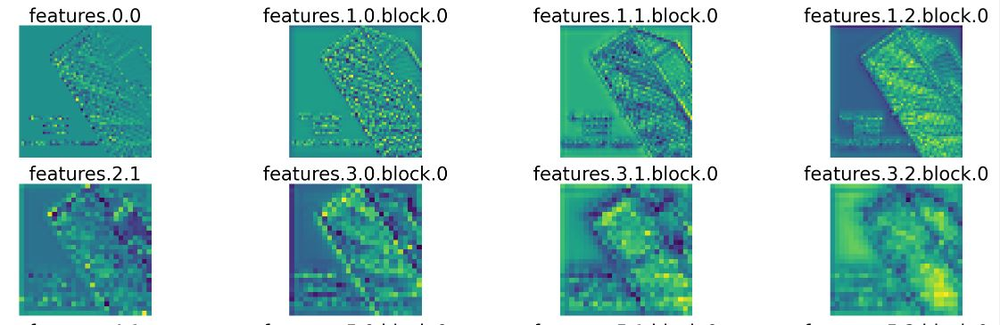

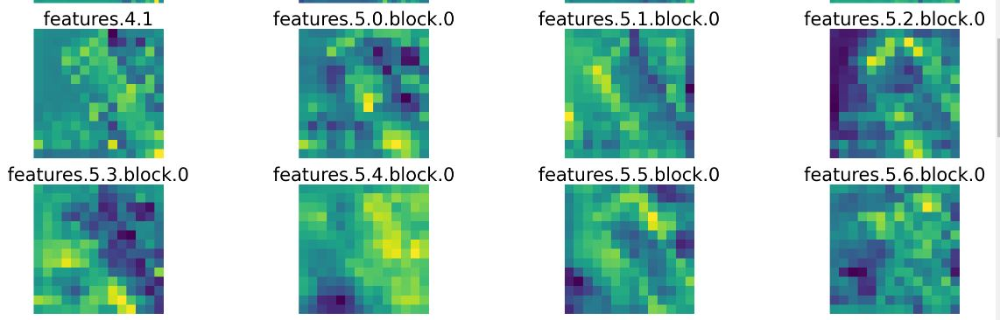

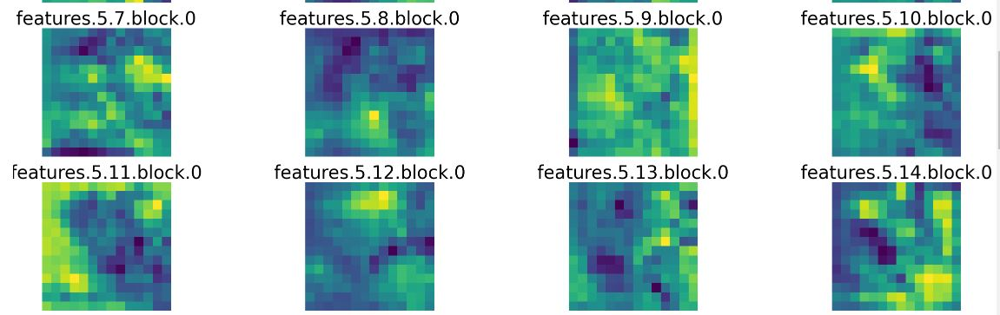

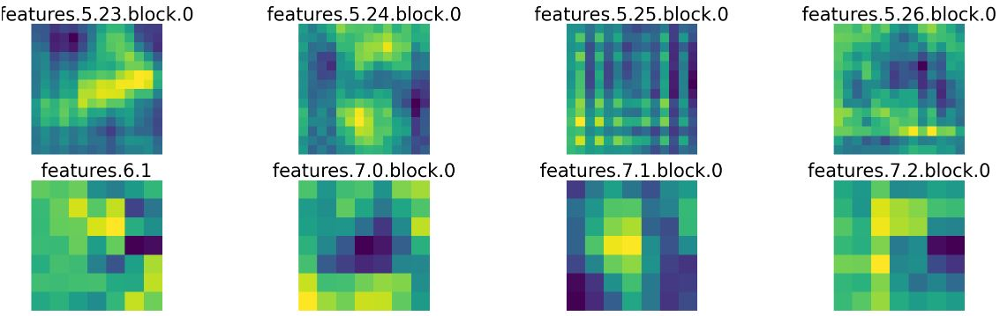

For R->P

In [313]:
if ALL_CODE:
    net: nn.Module = initialize_net(
        model = "convnext_our", pretrained = True,  num_classes = NUM_CLASSES).to(
            device = DEVICE, memory_format = torch.channels_last)
    if((os.path.exists("../Material/MODEL_AFTER_OPT_BEST_REAL.pt"))):
        net.load_state_dict(
            torch.load(
                "../Material/MODEL_AFTER_OPT_BEST_REAL.pt", map_location = DEVICE))
    print_activation(net, data="real")

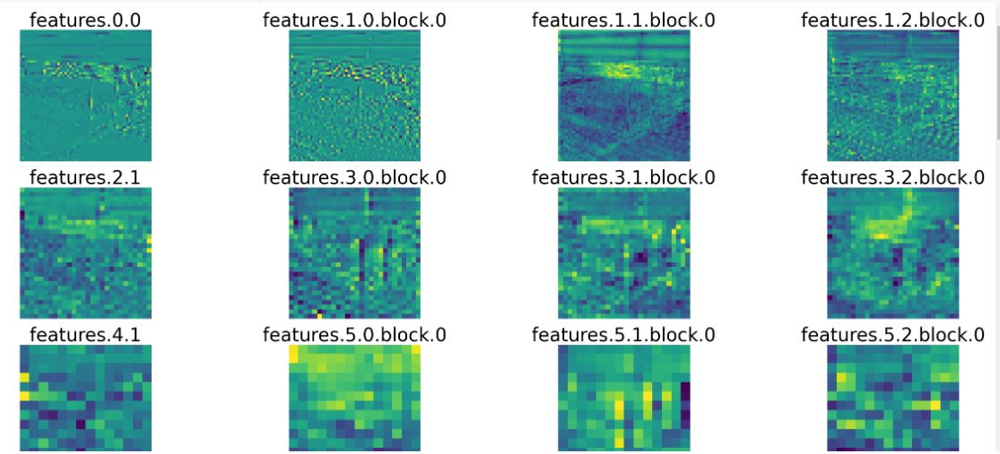

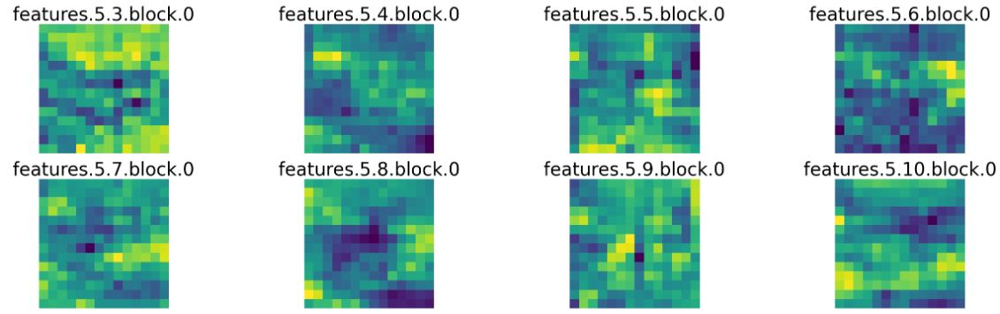

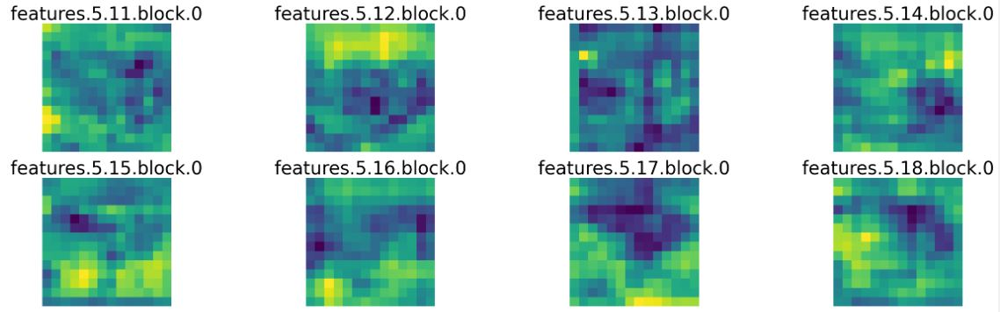

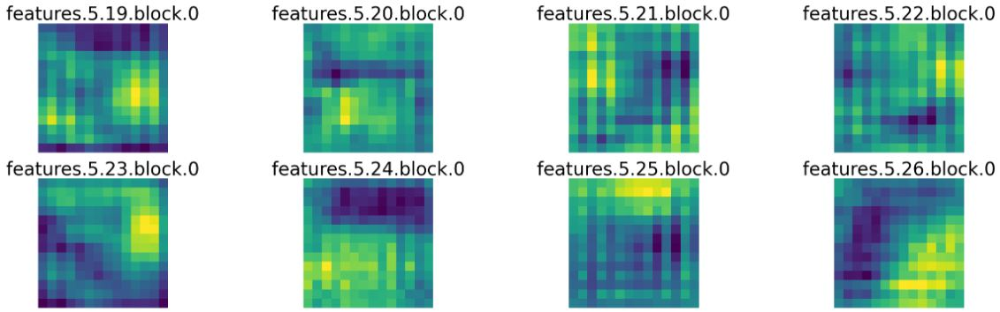

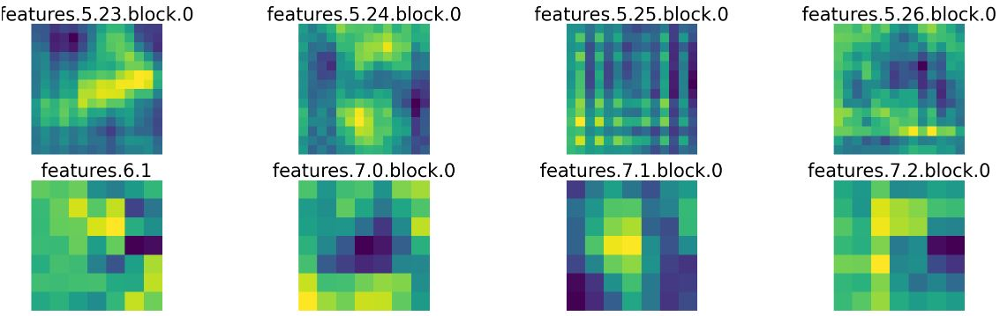

###**12. DOMAIN ADAPTATION**

here a breif analysis of several methods of DA is reported, divided by the macrocategory of DA which each of method belongs. Performances here are reported for office-31 dataset (given it's the dataset from which adaptiope derives) if presents in the original paper of the proposed methods. Following observations must be done:
- if performances are reported with more than on backbone author have select best backbone (tipically resnet-50 is used in comparison with alexnet)
- if the method is coupled with other methods, author have selected the performances only with the original method proposed by the paper itself (in this way  other factors rather than proposed method in performance reported is removed)

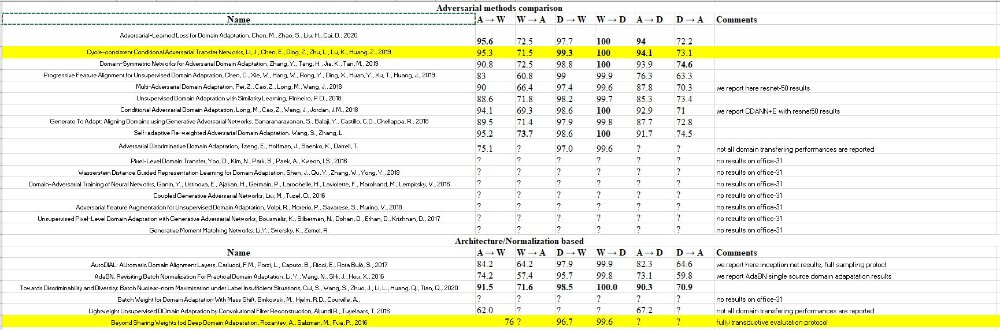

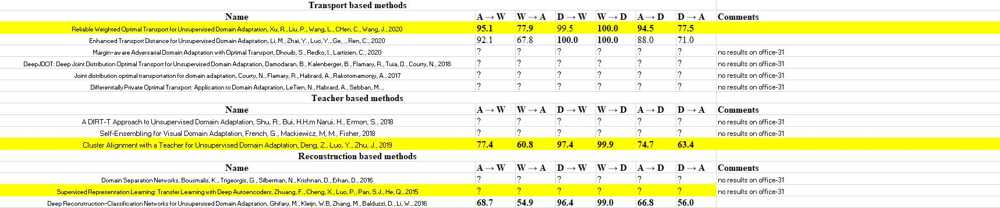

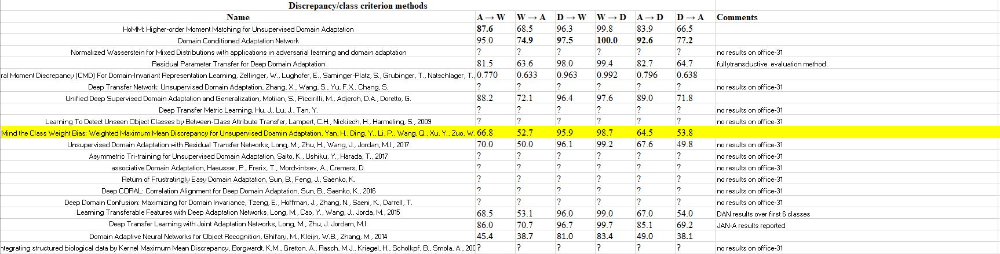

from each category author have selected a method to be implemented. Selections were based on
- presence of performances on office 31 (reconstruction based method is an exception, author have selected the reported paper because of it's diversity with other methods implemented)
- good results on office-31, author have tried selecting method which show good performances on Office-31 (or not least performing methods, as said before selecting best performance method per classes could be biased given differences in backbone or evaluation protocol of each paper)

best parameters founded are stored in the following dictionary

In [314]:
DA_STD_PARAMS: Dict[str, List[Union[float, nn.Module, List[int], str]]] = {}

unfortunatly dynamic batch take too much memory and time to be execute so here author resorts to 16 batch size as  dynamic batch size tend to select this value during training and given limitation in RAM memory

**Differentiable augmentation for domain adaptation**

using path_domain_trasform=True is possible to experiment another interesting approach of domain adaptation procedure. **could transformation that sample images used to boost da performance, sampling target domain images in trasformation?**.
here this possibility is test out for each network and employed if this improve performance (this was reported in section 13)

**Architectural DA hyperparameter optimization with SMAC3 +  reverse validation**

 optimize all network training parameter could be prohibitively computational demanding (DA add other hyperparameters other than architectural and learning parameters). instead author decides to take another approach :  optimize only domain adaptation parameter . However in the setting target labels are not avaiable. To cope with this here is employed SMAC +  reverse validation. **Reverse validation were never used till now to cope with parameter optimization of a DA architecture with SMAC3 tool.**

note how reverse validation results are linearly correlated with target accuracy (for both transfer learning setting) results suggesting that reverse validation is a good proxy in absence of target labels (data are taken from section 11.2.2). This lead to a good hint that use reverse validation in da hyperparameter optimization could cope with target label lacking

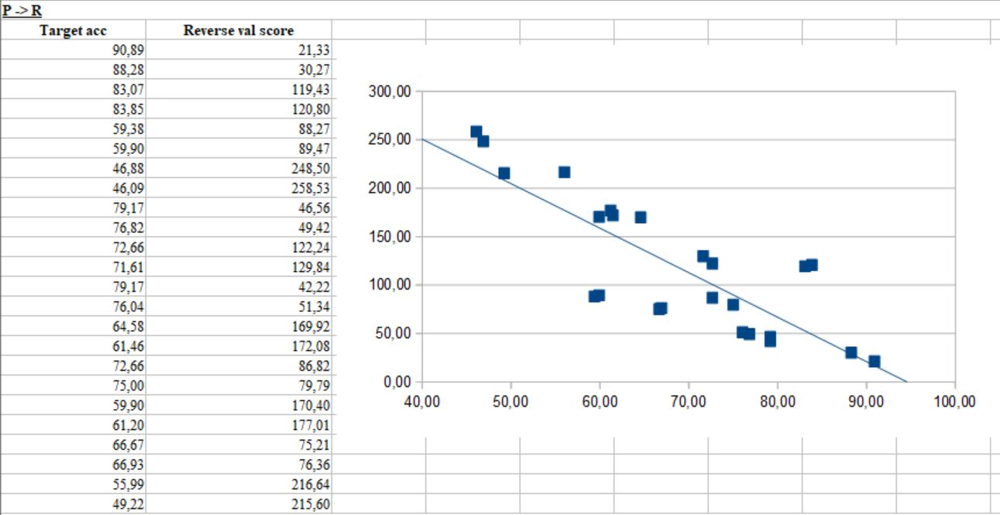

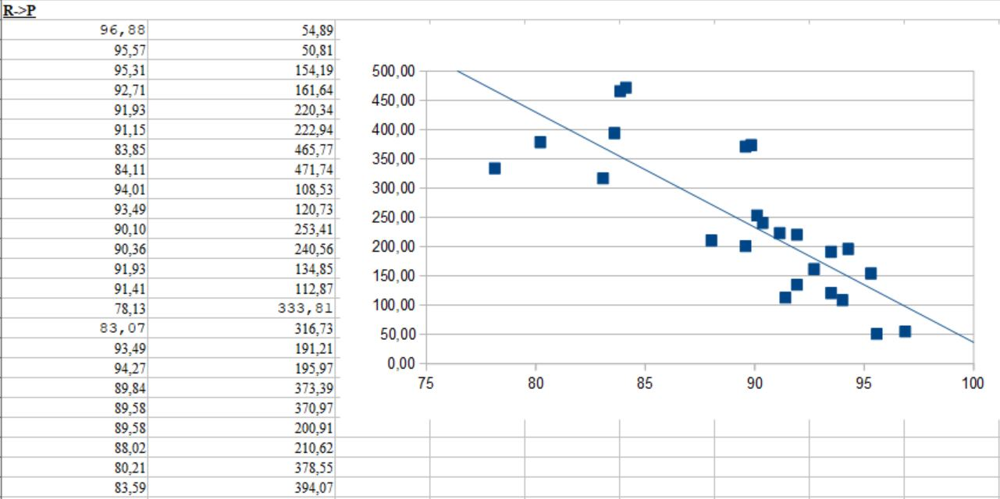

for each of the method's section there are two subsection
- optimization show SMAC3+reverse validation implementation for this type of network
- results show gain classification matrices, all metrics and TSNE over target domain

####**12.1 [24] Beyond Sharing Weights fod Deep Domain Adapatation, Rozantev, A., Salzman, M., Fua, P., 2016**

Authors of referenced paper propose employ two different networks for source and target domains not imposing domain invariant features. To account for domain shift, weights between two networks must be correlated but differents (resulting in not too much distant each other).  To constraint two networks weights,  MMD between source and target representation is encoded while to account for differences between network outputs MSE loss penalizing linear transformation between features layers is employed. 

Authors of paper employ small network allowing for sharing or separating high number of layer. **instead here convnext is employed so sharing or separating only classifier part of the network is proposed**.  this approach lead to possible two linear layer not shared which is motivated by the fact that original paper authors find this subset optimal on office dataset. **MMD is then applayed on features of convnext backbone not on classifier layer** (not having labels of target domain).



In [357]:
DA_STD_PARAMS["roszantev"] = [["-", "-"],  1, 1, False, [5, 10, 15, 20, 50]]

##### optimization

class for optimization

In [ ]:
class ParamsOptimizerRoz():
    def __init__(
        self, save_name: str = "TEMPORANEOUS_NET.pt",  
        data: str = "all_product",
        N_train: int = 1000, N_valid: int = 500) -> None:

        self.model: str = "roszantev"
        self.data: str = data
        self.N_train: int = N_train
        self.N_valid: int = N_valid
        self.save_name: str = save_name

    '''
    Class to handle optimization of Roszsantev domain adaptation via reverse validation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        model: str 
            -- name of model want to be optimize

        data: str 
            -- if product or real data are to be optimized

        N_train: int 
            -- number of train data set

        N_valid:int
            -- number of data validation set

        save_name: str 
            -- name where save temporary net results
        

    Public Methods:
    ----------
        compute(
        self,  config: Configuration, 
        seed: int = RANDOM_SEED, budget: int = 10) -> float
            -- compute current incumbent value

        configspace(self) -> ConfigurationSpace
            -- retrieve current configuration space

        
    
    '''
    #repeatedly called during the optimization and evaluates a given configuration yielding the associated loss.
    def compute(
        self,  config: Configuration, seed: int = RANDOM_SEED, 
        budget: int = 1) -> float:
        """
        compute current incumbent value
        ...

        Keyword Arguments:
        ----------

          config: Configuration
              -- incumbent sampled config
          
          seed: int
               -- random seed for optimizer
          
          budget: int
                -- number epoch allowed to be evaluated

        Returns
        ----------
          value of 1-accuracy to be minimized

        """
        
        net_da, _, __ = domain_adaptation(
          model="roszantev",
          optimizer="SGD"if self.data=="all_product" else "nadam",
          optimizer_params = [0.669001748815815, 1] if self.data=="all_product" else [0.5318330865086823, 0.972314731793811, 7.58742552859644e-07, 0.019467161096021354],
          lr = 0.00878248760630914 if self.data=="all_product" else  0.00033582372793957484,
          wd = 1.1559820780617287e-05 if self.data=="all_product" else 0.0004903049898644513,
          batch_size=16, 
          epochs_da=int(np.ceil(budget / 2)),
          data=self.data,
          da_params = [["-" if config["con_1"] == 0 else "+", "-" if config["con_2"] == 0 else "+"],  config["lambda_u"], config["lambda_o"], False, [5, 10, 15, 20, 50]],
          save_name = self.save_name,
          N_train = self.N_train,
          N_valid = self.N_valid
          )
        cost_function = get_cost_function(
            label_smoothing = None)
        optimizer = get_optimizer(
          net_da, optimizer = "SGD"if self.data=="all_product" else "nadam", 
          lr = 0.00878248760630914 if self.data=="all_product" else  0.00033582372793957484, 
          wd = 1.1559820780617287e-05 if self.data=="all_product" else 0.0004903049898644513,
          momentum = 0.669001748815815, nesterov = 1, 
          betas = (0.5318330865086823, 0.972314731793811), eps = 7.58742552859644e-07, 
          momentum_decay = 0.019467161096021354
          )
        rescore = revalidation(
            "product" if self.data=="all_product" else "real",
            net_da,
            optimizer, 
            int(np.ceil(budget / 2)),
            cost_function,
            da=True
            )
        return  rescore

    @property
    def configspace(self) -> ConfigurationSpace:
        """
        configuration space definition
        ...

        Keyword Arguments:
        ----------
            None

        Returns
        ----------
          configuration space

        """
        # Build Configuration Space which defines all parameters and their ranges.  
        cs = ConfigurationSpace()
        con_1 = CSH.UniformIntegerHyperparameter(
            "con_1",
            lower= 0,
            upper= 1,
            default_value=0
        )
        con_2 = CSH.UniformIntegerHyperparameter(
            "con_2",
            lower= 0,
            upper= 1,
            default_value=0
        )
        lambda_o = CSH.UniformFloatHyperparameter(
            "lambda_o",
            lower= 0.0001,
            upper= 1.0,
            default_value=1.0
        )
        lambda_u = CSH.UniformFloatHyperparameter(
            "lambda_u",
            lower= 0.0001,
            upper= 1.0,
            default_value=1.0
        )
        # Add all hyperparameters at once:
        cs.add_hyperparameters([con_1, con_2, lambda_u, lambda_o])
        return cs

###### P -> R

In [ ]:
if ALL_CODE:
    optimize_net(ParamsOptimizerRoz, data="all_product")

###### R -> P

In [ ]:
if ALL_CODE:
    optimize_net(ParamsOptimizerRoz, data="all_real")

##### results

###### P -> R

In [ ]:
ROZ_BEST_PRODUCT=RoszantsevModel(connected  = ["-", "-"]).to(
                    device=DEVICE, memory_format=torch.channels_last)
if(not(os.path.exists("../Material/ROZ_BEST_PRODUCT.pt"))):
    ROZ_BEST_PRODUCT, _, __ = domain_adaptation(
          model="roszantev",
          optimizer="SGD",
          optimizer_params = [0.669001748815815, 1],
          lr = 0.00878248760630914,
          wd = 1.1559820780617287e-05,
          batch_size=16, 
          epochs_da=10,
          data="all_product",
          save_name = "ROZ_BEST_PRODUCT.pt" 
          )
    
else:
    with open("../Material/ROZ_BEST_PRODUCT.pt", 'rb') as f:
        ROZ_BEST_PRODUCT.load_state_dict(
            torch.load("../Material/ROZ_BEST_PRODUCT.pt", map_location = DEVICE)) 

**Test**

In [ ]:
if ALL_CODE:
    loss_to, acc_to  = TO_RESULTS_PROD
    loss_so, acc_so, cl_matr = NO_RESULTS_PROD
    train_loader_source, test_loader_source, train_loader_target, test_loader_target  = get_data(
            batch_size = 16, 
            data = "all_product", shuffle = False, 
            )
    progress_bar = tqdm(total = len(test_loader_target))
    progress_bar.set_description("after training da")
    test_accuracy, coverage, gain_cl_matrix = test(
                ROZ_BEST_PRODUCT, test_loader_target, 
                get_cost_function(), 
                all_metrics = True, bar = progress_bar, da = True, 
                acc_so = acc_so, acc_to = acc_to, 
                cl_matr =cl_matr)
    print("\t Test accuracy {:.2f}".format(test_accuracy))
    print("\t Gain {:.2f}".format(test_accuracy - acc_so))
    print("\t Coverage {:.2f}".format(coverage))
    print("-----------------------------------------------------")
    gain_cl_matrix.print()



```
	 Test accuracy 91.75
	 Gain -1.25
	 Coverage -15.55
-----------------------------------------------------
ACCURACY
0.99175
overall
-0.0012499999999999734
per class
[-0.010000000000000009, -0.0025000000000000577, 0.0050000000000000044, 0.0, 0.0, -0.0024999999999999467, 0.0025000000000000577, 0.0024999999999999467, 0.0, 0.0025000000000000577, 0.0, -0.0050000000000000044, 0.0, 0.0024999999999999467, -0.007499999999999951, -0.0050000000000000044, 0.0024999999999999467, -0.0025000000000000577, -0.0024999999999999467, -0.0050000000000000044]


PRECISION
overall
-0.012499999999999956
per class
[-0.19999999999999996, -0.050000000000000044, 0.09999999999999998, -0.050000000000000044, 0.0, 0.0, 0.0, 0.0, 0.0, -0.04999999999999993, 0.04999999999999993, 0.0, 0.0, 0.0, -0.09999999999999998, 0.04999999999999993, 0.09999999999999998, -0.04999999999999993, -0.050000000000000044, 0.0]


RECALL
overall
-0.011997670417107753
per class
[-0.03619909502262442, -0.0029239766081871066, 0.006191950464396245, 0.04761904761904767, 0.0, -0.03754940711462451, 0.050000000000000044, 0.04761904761904767, 0.0, 0.0911764705882353, -0.04260651629072676, -0.09523809523809523, 0.0, 0.04761904761904767, -0.05526315789473679, -0.13636363636363635, -0.023809523809523725, -0.010000000000000009, 0.0, -0.09022556390977443]


F1
overall
-0.013951913368950741
per class
[-0.14414414414414423, -0.028340080971659964, 0.058212058212058215, -0.001250781738586615, 0.0, -0.021040974529346612, 0.024358974358974383, 0.024390243902439046, 0.0, 0.014864864864864935, 0.0037523452157598447, -0.047529706066291366, 0.0, 0.024390243902439046, -0.07820512820512815, -0.04260651629072676, 0.03104212860310418, -0.02626262626262621, -0.02564102564102566, -0.04502814258911825]


F1 NEGATIVO
overall
0.06578713693039295
per class
[-0.005167278686171506, -0.0013071624916792812, 0.002610898607233736, 3.4626098729395594e-06, 0.0, -0.0013279749601781132, 0.001317518500587811, 0.0013175230566535578, 0.0, 0.001341656894529919, -1.0387829618707656e-05, -0.002638508723179722, 0.0, 0.0013175230566535578, -0.003938723286534329, -0.002652372938870773, 0.00129660999226211, -0.0013104874032024982, -0.0013140604467806183, -0.0026454339429258233]


GEOMETRIC MEAN
overall
-0.005433651341510526
per class
[-0.05682256117768625, -0.010742086915686677, 0.022129288174293826, -0.0004439258955235559, 0.0, -0.008139204433715852, 0.009169741763716432, 0.009118464865133902, 0.0, 0.005957314437961214, 0.0013499092216950892, -0.017972874701895236, 0.0, 0.009118464865133902, -0.029749183190918682, -0.01632269309636425, 0.011768973003388083, -0.010215459006382765, -0.009562390760657458, -0.017314803982699578]
________________________________________________________________________
MARKEDNESS
overall
-0.013157894736842146
per class
[-0.19999999999999996, -0.050000000000000044, 0.10000000000000009, -0.047368421052631726, 0.0, -0.0026315789473685403, 0.0026315789473685403, 0.002631578947368318, 0.0, -0.044736842105263186, 0.047368421052631504, -0.0052631578947368585, 0.0, 0.002631578947368318, -0.10263157894736841, 0.04210526315789487, 0.09736842105263155, -0.04999999999999982, -0.050000000000000044, -0.0052631578947368585]


UPM
overall
-0.008711459300944968
per class
[-0.09645408062426186, -0.01608291358881697, 0.03347230410005808, -0.000638810541531587, 0.0, -0.012258119772563303, 0.013264377290983398, 0.01298870405937691, 0.0, 0.00913597869478322, 0.0020128084371996424, -0.026179965595621968, 0.0, 0.01298870405937691, -0.04446184198577707, -0.024116820764684466, 0.01779986607203521, -0.016067018534744015, -0.013627514600908497, -0.026004842723802768]


COHEN K
overall
-0.013157894736842146
per class
[-0.1350863047175891, -0.028608096023097218, 0.05799792311058738, -0.0012156608036756333, 0.0, -0.021092857790079522, 0.02603106614663242, 0.02538485199706042, 0.0, 0.01936835150145977, 0.003712731710415196, -0.05021521771890691, 0.0, 0.02538485199706042, -0.0818248327120118, -0.04556123143616575, 0.03630024375152607, -0.029683222209599958, -0.026600512800736054, -0.04771814681216735]


FM
overall
-0.009521075173870575
per class
[-0.09604614189219896, -0.019610565786104983, 0.039642858447019425, -0.0008522576346496891, 0.0, -0.014014045984667156, 0.01801912916787196, 0.01693730036155139, 0.0, 0.015695979459230402, 0.0027171179242126975, -0.0345275675059018, 0.0, 0.01693730036155139, -0.05752000433447724, -0.03169170469483884, 0.028433748239855117, -0.023146425195689213, -0.017789557996201077, -0.03360666641397447]


MATHEW
overall
-0.0033852375464885065
per class
[-0.06918577154093691, -0.06712378183060724, 0.11510411532588155, 0.0, 0.0, -0.04797045412523182, 0.1673980360584732, -0.666110183639399, 0.0, 0.03610469196650093, 3.5222946496715757e-06, -0.2679823395797649, 0.0, -0.666110183639399, -0.21574759765289714, -0.16773595862040036, 0.048129069616677456, -0.02253589010516982, 0.666110183639399, -0.11514971245189604]


```



**T-sne**

In [ ]:
if ALL_CODE:
    T_sne(ROZ_BEST_PRODUCT, data = "real")

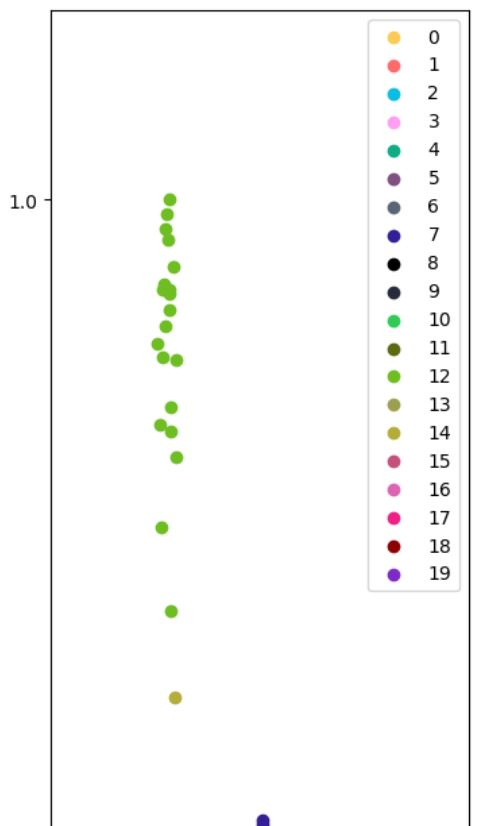

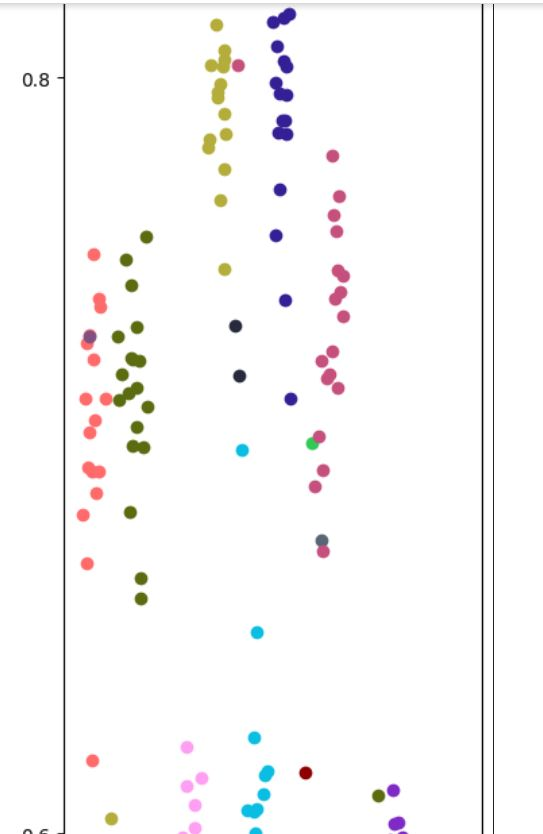

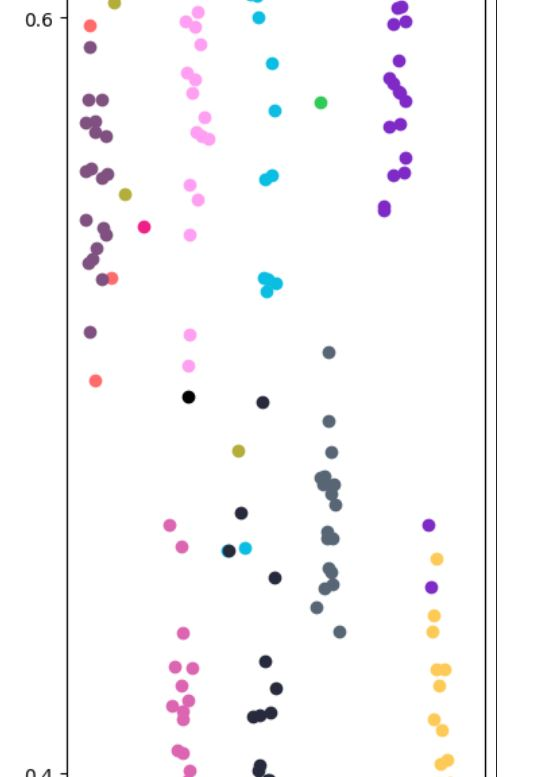

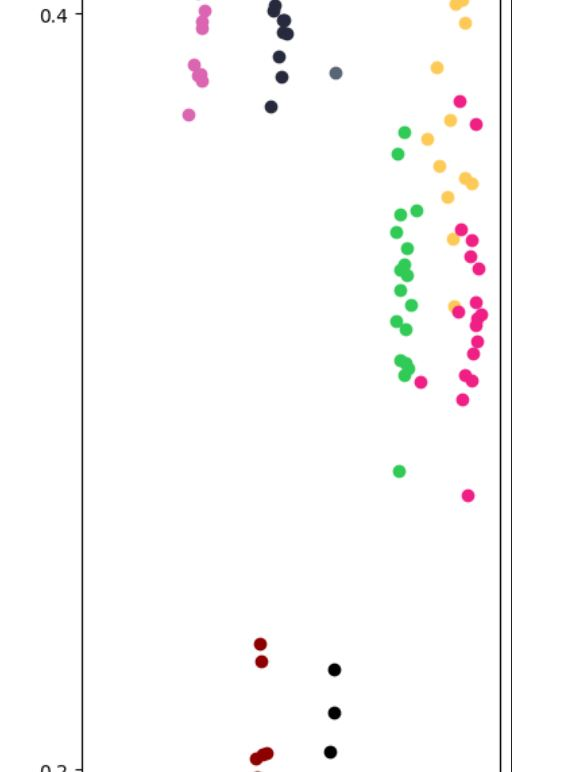

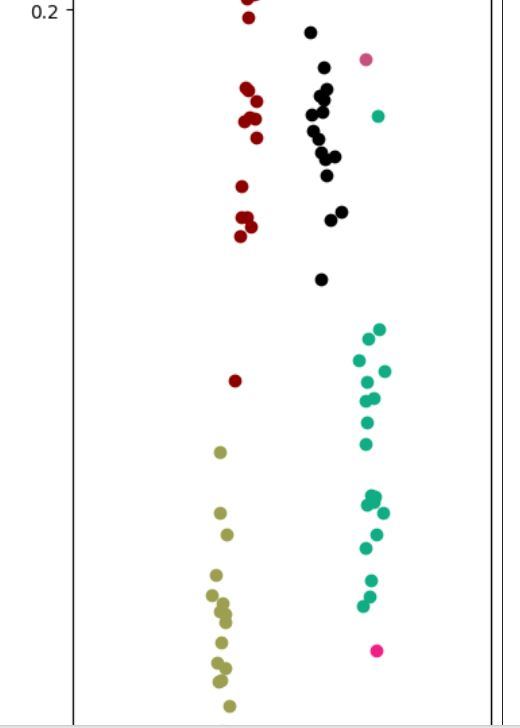

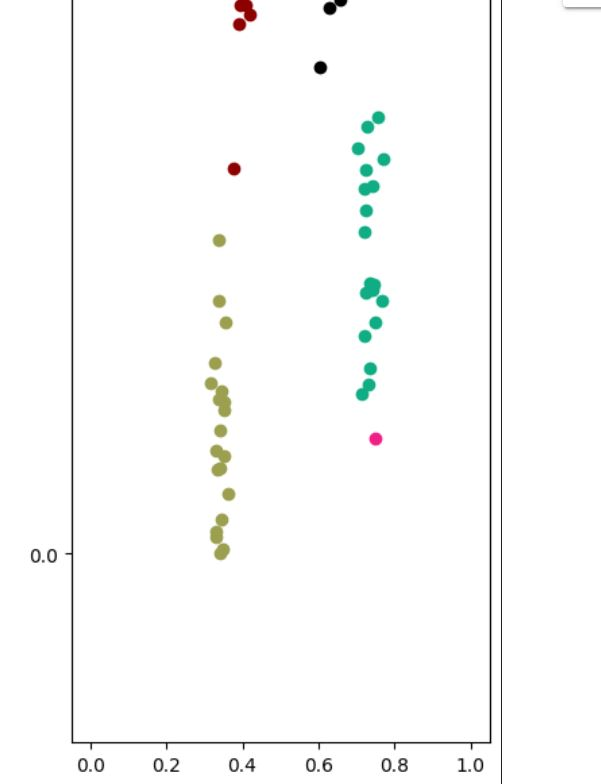

###### R -> P

In [ ]:
ROZ_BEST_REAL = RoszantsevModel(connected  = ["-", "-"]).to(
                    device=DEVICE, memory_format=torch.channels_last)
if(not(os.path.exists("../Material/ROZ_BEST_REAL.pt"))):
    ROZ_BEST_REAL, _, __ = domain_adaptation(
          model="roszantev",
          optimizer="nadam",
          optimizer_params = [0.5318330865086823, 0.972314731793811, 7.58742552859644e-07, 0.019467161096021354],
          lr = 0.00033582372793957484,
          wd = 0.0004903049898644513,
          batch_size=16, 
          epochs_da=10,
          data="all_real",
          save_name = "ROZ_BEST_REAL.pt"
          )
    
else:
    with open("../Material/ROZ_BEST_REAL.pt", 'rb') as f:
        ROZ_BEST_REAL.load_state_dict(
            torch.load("../Material/ROZ_BEST_REAL.pt", map_location = DEVICE)) 

**Train and gain**

In [ ]:
if ALL_CODE:
    loss_to, acc_to  = TO_RESULTS_REAL
    loss_so, acc_so, cl_matr = NO_RESULTS_REAL
    train_loader_source, test_loader_source, train_loader_target, test_loader_target  = get_data(
            batch_size = 16, 
            data = "all_real", shuffle = False, 
            )
    progress_bar = tqdm(total = len(test_loader_target))
    progress_bar.set_description("after training da")
    test_accuracy, coverage, gain_cl_matrix = test(
                ROZ_BEST_REAL, test_loader_target, 
                get_cost_function(), 
                all_metrics = True, bar = progress_bar, da = True, 
                acc_so = acc_so, acc_to = acc_to, 
                cl_matr =cl_matr)
    print("\t Test accuracy {:.2f}".format(test_accuracy))
    print("\t Gain {:.2f}".format(test_accuracy - acc_so))
    print("\t Coverage {:.2f}".format(coverage))
    print("-----------------------------------------------------")
    gain_cl_matrix.print()



```
Test accuracy 98.50
	 Gain 5.50
	 Coverage 94.71
-----------------------------------------------------
ACCURACY
0.9985
overall
0.00550000000000006
per class
[0.01749999999999996, 0.0024999999999999467, 0.012499999999999956, 0.0, 0.0025000000000000577, 0.007500000000000062, 0.0025000000000000577, 0.0, 0.0024999999999999467, 0.015000000000000013, 0.0024999999999999467, 0.0, 0.0, 0.0024999999999999467, 0.0050000000000000044, 0.0050000000000000044, 0.007499999999999951, 0.01749999999999996, 0.0, 0.007499999999999951]


PRECISION
overall
0.05500000000000005
per class
[0.25, 0.04999999999999993, 0.19999999999999996, 0.0, -0.050000000000000044, 0.0, 0.050000000000000044, -0.050000000000000044, 0.050000000000000044, 0.15000000000000002, 0.09999999999999998, 0.050000000000000044, 0.0, 0.0, 0.050000000000000044, 0.09999999999999998, 0.0, 0.050000000000000044, 0.0, 0.09999999999999998]


RECALL
overall
0.052679305214908934
per class
[0.11764705882352944, 0.0026315789473684292, 0.05882352941176472, 0.0, 0.09090909090909094, 0.13636363636363635, 0.0023809523809523725, 0.04761904761904767, 0.0, 0.15000000000000002, -0.038277511961722466, -0.04761904761904767, 0.0, 0.04761904761904767, 0.050000000000000044, 0.0, 0.1428571428571429, 0.24, 0.0, 0.052631578947368474]


F1
overall
0.05510986998791867
per class
[0.18918918918918914, 0.026923076923076827, 0.1351351351351351, 0.0, 0.02197802197802201, 0.06959706959706957, 0.025609756097561, -0.001250781738586615, 0.02564102564102566, 0.15000000000000002, 0.0293040293040292, 0.001250781738586615, 0.0, 0.024390243902439046, 0.050000000000000044, 0.052631578947368474, 0.06931964056482665, 0.15555555555555556, 0.0, 0.07692307692307687]


F1 NEGATIVO
overall
0.06933761555770313
per class
[0.00917431192660545, 0.0013106023929732036, 0.006553079947575369, 0.0, 0.0013244619806600522, 0.003962984408100612, 0.0013140558907148714, 3.4626098729395594e-06, 0.0013140604467806183, 0.007894736842105288, 0.0013036589129009624, -3.4626098729395594e-06, 0.0, 0.0013175230566535578, 0.0026315789473684292, 0.002624671916010457, 0.003962943367256999, 0.009271523178807972, 0.0, 0.003942181340341633]


GEOMETRIC MEAN
overall
0.020874904589364585
per class
[0.07196302730737747, 0.010153042159873893, 0.05101446285854161, 0.0, 0.008319395151874742, 0.026433170022332364, 0.009613667659239988, -0.0004439258955235559, 0.009562390760657458, 0.056971777296502824, 0.011003388771715583, 0.0004439258955235559, 0.0, 0.009118464865133902, 0.01873213252437389, 0.019672867686625573, 0.02652711098032179, 0.059528019058471715, 0.0, 0.028885174684247783]
________________________________________________________________________
MARKEDNESS
overall
0.05789473684210522
per class
[0.25526315789473686, 0.04999999999999982, 0.2026315789473685, 0.0, -0.044736842105263186, 0.007894736842105177, 0.050000000000000266, -0.047368421052631726, 0.050000000000000044, 0.1578947368421053, 0.09736842105263155, 0.047368421052631726, 0.0, 0.002631578947368318, 0.052631578947368585, 0.10000000000000009, 0.007894736842105177, 0.06578947368421062, 0.0, 0.10263157894736841]


UPM
overall
0.03075391338617639
per class
[0.10817506193228732, 0.014928396741838212, 0.07529259273378819, 0.0, 0.012020120403602341, 0.03876036739406441, 0.013903187832514985, -0.000638810541531587, 0.013627514600908497, 0.08442857142857141, 0.01617265362921927, 0.000638810541531587, 0.0, 0.01298870405937691, 0.026891891891891895, 0.02827106123028844, 0.039554070127244434, 0.08824378508420216, 0.0, 0.04182028863373011]


COHEN K
overall
0.05789473684210522
per class
[0.19538933020264915, 0.02789688328268969, 0.13852638534064554, 0.0, 0.022449320210638946, 0.07276414386083074, 0.027246726950308053, -0.0012156608036756333, 0.026600512800736054, 0.1578947368421053, 0.03147862921868316, 0.0012156608036756333, 0.0, 0.02538485199706042, 0.052631578947368474, 0.05380342522540105, 0.07444318381682447, 0.15886459358208893, 0.0, 0.08052846223005816]


FM
overall
0.039371755098932315
per class
[0.136577878315832, 0.019225556262242538, 0.094677101873335, 0.0, 0.014725444961379175, 0.0497108338627108, 0.01887138680252165, -0.0008522576346496891, 0.017789557996201077, 0.1103730813325654, 0.022519240468735324, 0.0008522576346496891, 0.0, 0.01693730036155139, 0.03580868716407304, 0.03580868716407304, 0.05283222267621701, 0.10654387931089304, 0.0, 0.05503424342631558]


MATHEW
overall
0.205234148419079
per class
[-0.21888376541715623, 0.10058782581594139, -0.28302020643910286, 0.0, 0.16736331647147923, 0.3350992750918796, 0.1673980360584732, 0.0, -0.666110183639399, -0.24691551447260193, 0.10062254540293536, 0.0, 0.0, -0.666110183639399, -0.4987121475809258, -0.49874686716791977, 0.2157722578548314, -0.21904118944633283, 0.0, -0.3981243217649844]


```



**T-sne**

In [ ]:
if ALL_CODE:
    T_sne(ROZ_BEST_REAL, data = "product")

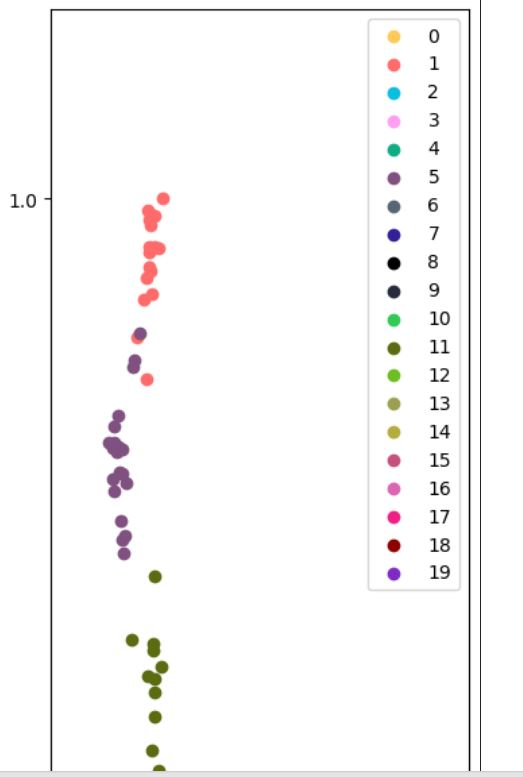

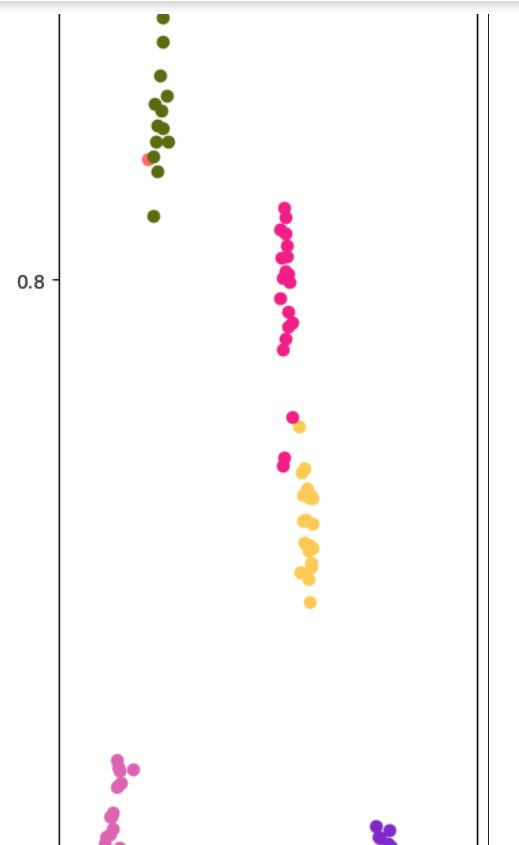

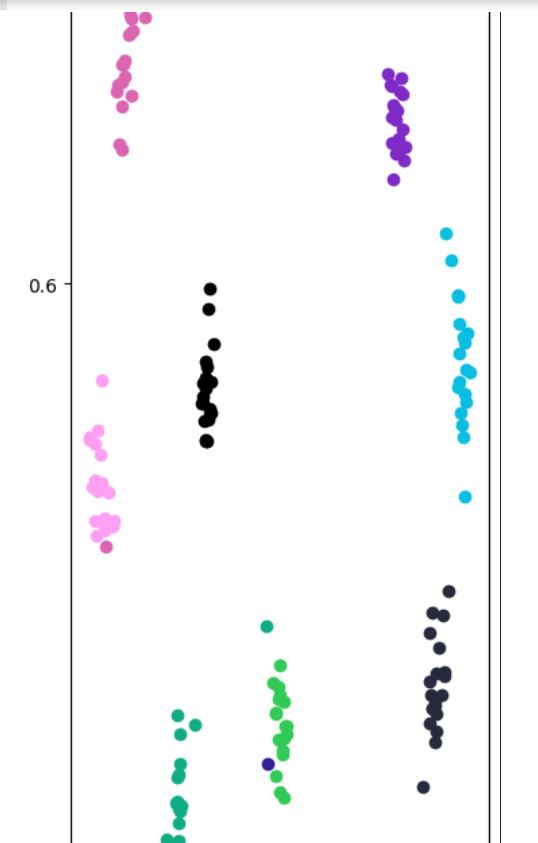

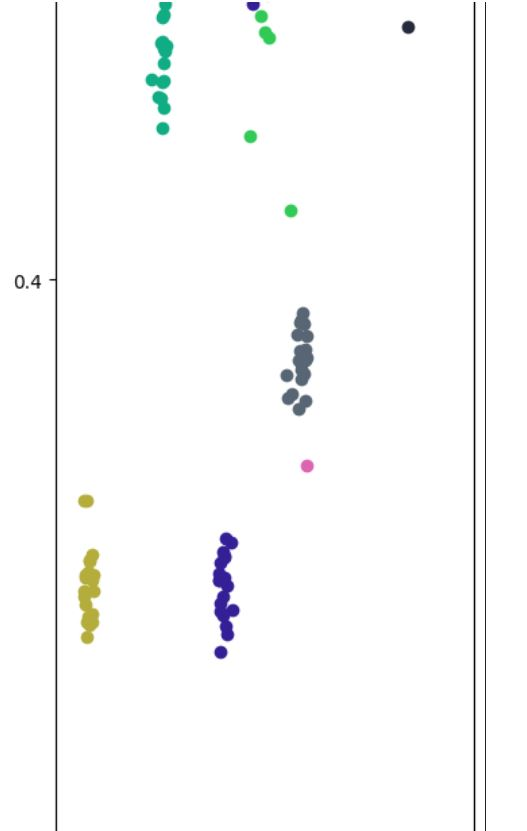

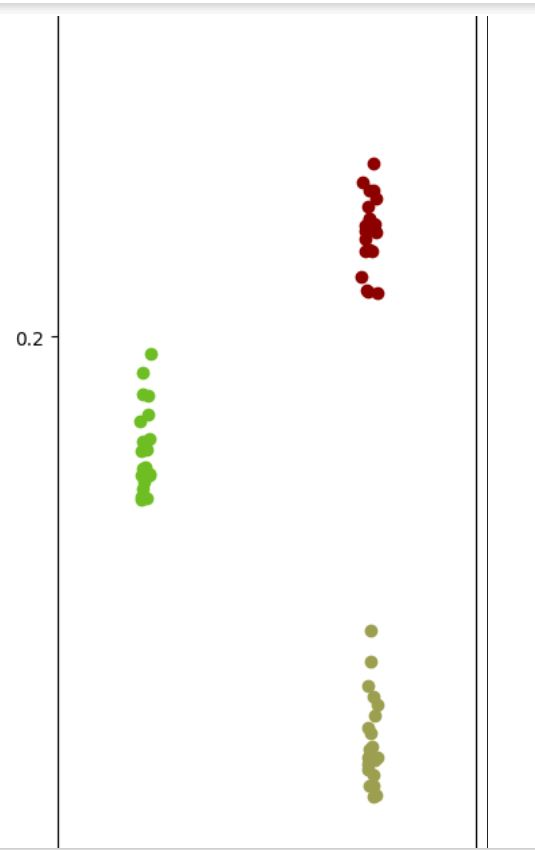

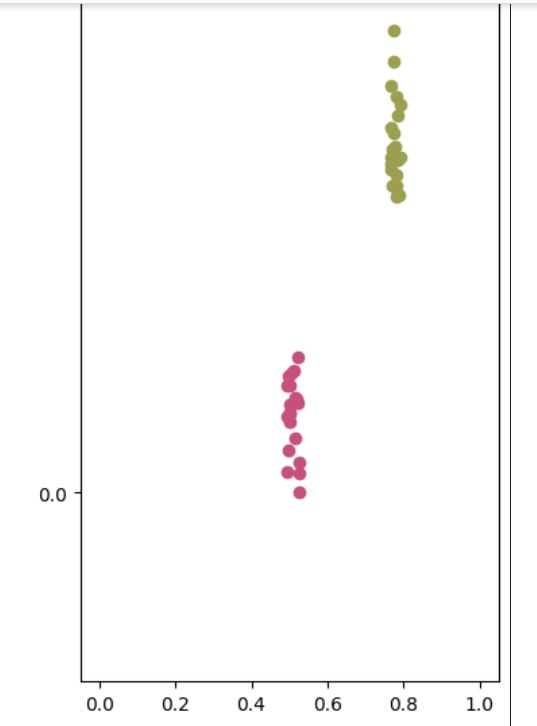

####**12.2 [36] Cycle-consistent Conditional Adversarial Transfer Networks, Li, J., Chen, E., Ding, Z., Zhu, L., Lu, K., Huang, Z., 2019**

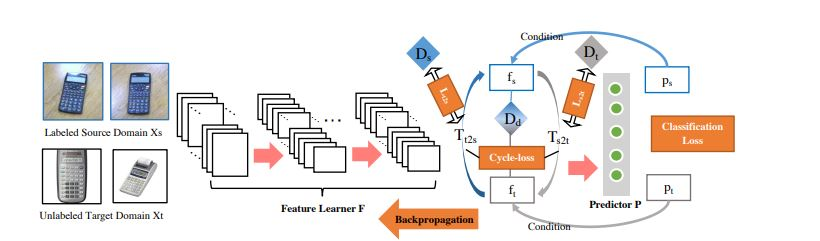

*network depiction from [36]*

network as depicted in figure above is composed by
- feature learner 

  learn domain invariant features

- feature predictor 

  classification layer which have to predict labels

- dd 

  domain discrimator,  three fc layers in original paper

- p 

 labels predicted

- Ds e Dt 

  domain source and target discriminator
  two conv layers and one fc layer in original paper

- Tt2s e Ts2t 

  feature translator, respectively target to source and source to target  implemented by one fc layer and three conv layers in original paper

Here is explained the loss employed (for clarity given is not simple to explain it decomposing it in components as done in other networks in corrispondent loss section).
this network interact reciprocally in two players adversarial games as following
- feature learner vs. domain discriminator

  $\begin{aligned}
\min _{F, P} \max _{D_d} \mathcal{L}_{c o n}= & -\mathbb{E}\left[\sum_{c=1}^C \mathbf{1}_{\left[y_s=c\right]} \log \sigma\left(F\left(x_s\right)\right)\right] \\
& +\lambda\left(\mathbb{E}\left[\log D_d\left(\delta\left(\mathrm{h}_s\right)\right)\right]+\mathbb{E}\left[\log \left(1-D_d\left(\delta\left(\mathrm{h}_t\right)\right)\right)\right]\right)
\end{aligned}$

 where 1 is an indicator function, sigma is a  softmax. First E represents crossentropy. Second and third E represent conditional loss similar to conditional gan. lambda tradeoff param.

  delta is a conditioning strategy and is defined as following

  $\delta(\mathrm{h})= \begin{cases}\delta_{\otimes}(\mathrm{f}, \mathrm{p}) & \text { if } \operatorname{dim}_{\mathrm{f}} \times \operatorname{dim}_{\mathrm{p}} \leq 4096 \\ \delta_{\odot}(\mathrm{f}, \mathrm{p}) & \text { otherwise }\end{cases}$

  first term  is a multilinear map while second term of system is randomized multilinear map (which is employed for capability of spare memory). Multilinear map convert two tensors to a single one.

- Ts2t vs Dt, Tt2s vs Ds
  
  this employs two bidirection loss

  $\begin{aligned}
\min _{P, T_{s 2 t}} \max _{D_t} \mathcal{L}_{s 2 t} & =\mathrm{E}\left[\log D_t\left(\mathrm{f}_t\right)\right]+\mathbb{E}\left[\log \left(1-D_t\left(T_{s 2 t}\left(\mathrm{f}_s\right)\right)\right)\right] \\
& -\beta \mathbb{B}\left[\sum_{c=1}^C \mathbf{1}_{\left[\hat{y}_t=c\right]} \log \sigma\left(\hat{\mathrm{f}}_t\right)\right] .
\end{aligned}$

  where f^ è supervised classification  con f^t = Ts2t(fs). analogously for Tt2s vs. Ds

network employs further loss component such as
- semantic loss which is l1 loss on class output
- cycle consistent loss which mantains consistency of features before and after being translated by Ts2t and Tt2s

  $\begin{aligned}
\min _{T_{t 2 s}, T_{t 2 s}} \mathcal{L}_{c y c}= & \mathrm{E}\left[\left\|T_{t 2 s}\left(T_{s 2 t}\left(\mathrm{f}_s\right)\right)-\mathrm{f}_s\right\|_2^2\right] \\
& +\mathrm{E}\left[\left\|T_{s 2 t}\left(T_{t 2 s}\left(\mathrm{f}_t\right)\right)-\mathrm{f}_t\right\|_2^2\right],
\end{aligned}$

Complessively network deals with following loss

$\min _{F, P, T_{t 2 s}, T_{t 2 s}} \max _{D_d, D_s, D_t} \mathcal{L}_{3 C A T N}$

$\mathcal{L}_{3 C A T N}=\mathcal{L}_{c o n}+\eta_1\left(\mathcal{L}_{s 2 t}+\mathcal{L}_{t 2 s}\right)+\eta_2 \mathcal{L}_{c y c}$

hyperparameter of network are (in order)
- cla 

  weight crossentropy source and target part of loss
- cyc_loss_weight 

  weight Lcyc, Ls2t e Lt2s a 0.05
- λ  
- weights0 

  weight identity loss  
- η1  
- η2 
- β 
- last botlenek dimension

In [378]:
DA_STD_PARAMS["li"] = [0.1, 0.05, 1.0, 1.0, 0.01, 0.1, 0.1, 1000]

##### optimization

class form optimization

In [316]:
class ParamsOptimizerLi():
    def __init__(
        self, save_name: str = "TEMPORANEOUS_NET.pt",  
        data: str = "all_product",
        N_train: int = 1000, N_valid: int = 500) -> None:

        self.model: str = "li"
        self.data: str = data
        self.N_train: int = N_train
        self.N_valid: int = N_valid
        self.save_name: str = save_name

    '''
    Class to handle optimization of Li domain adaptation via reverse validation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        model: str 
            -- name of model want to be optimize

        data: str 
            -- if product or real data are to be optimized

        N_train: int 
            -- number of train data set

        N_valid:int
            -- number of data validation set

        save_name: str 
            -- name where save temporary net results
        

    Public Methods:
    ----------
        compute(
        self,  config: Configuration, 
        seed: int = RANDOM_SEED, budget: int = 10) -> float
            -- compute current incumbent value

        configspace(self) -> ConfigurationSpace
            -- retrieve current configuration space

        
    
    '''
    #repeatedly called during the optimization and evaluates a given configuration yielding the associated loss.
    def compute(
        self,  config: Configuration, seed: int = RANDOM_SEED, 
        budget: int = 1) -> float:
        """
        compute current incumbent value
        ...

        Keyword Arguments:
        ----------

          config: Configuration
              -- incumbent sampled config
          
          seed: int
               -- random seed for optimizer
          
          budget: int
                -- number epoch allowed to be evaluated

        Returns
        ----------
          value of 1-accuracy to be minimized

        """
        
        net_da, _, __ = domain_adaptation(
          model="li",
          optimizer="SGD"if self.data=="all_product" else "nadam",
          optimizer_params = [0.669001748815815, 1] if self.data=="all_product" else [0.5318330865086823, 0.972314731793811, 7.58742552859644e-07, 0.019467161096021354],
          lr = 0.00878248760630914 if self.data=="all_product" else  0.00033582372793957484,
          wd = 1.1559820780617287e-05 if self.data=="all_product" else 0.0004903049898644513,
          batch_size=16, 
          epochs_da=int(np.ceil(budget / 2)),
          data=self.data,
          da_params = [config["cla"], config["cyc"], 
                       config["lamb"], config["w0"], 
                       config["eta1"], config["eta2"],
                       config["beta"], 1000],
          save_name = self.save_name,
          N_train = self.N_train,
          N_valid = self.N_valid
          )
        cost_function = get_cost_function(
            label_smoothing = None)
        optimizer = get_optimizer(
          net_da, optimizer = "SGD"if self.data=="all_product" else "nadam", 
          lr = 0.00878248760630914 if self.data=="all_product" else  0.00033582372793957484, 
          wd = 1.1559820780617287e-05 if self.data=="all_product" else 0.0004903049898644513,
          momentum = 0.669001748815815, nesterov = 1, 
          betas = (0.5318330865086823, 0.972314731793811), eps = 7.58742552859644e-07, 
          momentum_decay = 0.019467161096021354
          )
        rescore = revalidation(
            "product" if self.data=="all_product" else "real",
            net_da,
            optimizer, 
            int(np.ceil(budget / 2)),
            cost_function,
            da=True
            )
        return  rescore

    @property
    def configspace(self) -> ConfigurationSpace:
        """
        configuration space definition
        ...

        Keyword Arguments:
        ----------
            None

        Returns
        ----------
          configuration space

        """
        # Build Configuration Space which defines all parameters and their ranges.  
        cs = ConfigurationSpace()
        cla = CSH.UniformFloatHyperparameter(
            "cla",
            lower= 0.0001,
            upper= 1.0,
            default_value=0.01   
        )
        cyc = CSH.UniformFloatHyperparameter(
            "cyc",
            lower= 0.0001,
            upper= 1.0,
            default_value=0.05
        )
        lamb = CSH.UniformFloatHyperparameter(
            "lamb",
            lower= 0.0001,
            upper= 1.0,
            default_value=1.0
        )
        w0 = CSH.UniformFloatHyperparameter(
            "w0",
            lower= 0.0001,
            upper= 1.0,
            default_value=1.0
        )
        eta1 = CSH.UniformFloatHyperparameter(
            "eta1",
            lower= 0.0001,
            upper= 1.0,
            default_value=0.1
        )
        eta2 = CSH.UniformFloatHyperparameter(
            "eta2",
            lower= 0.0001,
            upper= 1.0,
            default_value=0.1
        )
        beta = CSH.UniformFloatHyperparameter(
            "beta",
            lower= 0.0001,
            upper= 1.0,
            default_value=0.1
        )
        # Add all hyperparameters at once:
        cs.add_hyperparameters([cla, cyc, lamb, w0, eta1, eta2, beta])
        return cs

###### P -> R

In [ ]:
if ALL_CODE:
    optimize_net(ParamsOptimizerLi, data="all_product")

###### R -> P

In [ ]:
if ALL_CODE:
    optimize_net(ParamsOptimizerLi, data="all_real")

##### results

###### P -> R

In [ ]:
LI_BEST_PRODUCT=LiModel(bottleneck_dim = 1000).to(
                    device=DEVICE, memory_format=torch.channels_last)
if(not(os.path.exists("../Material/LI_BEST_PRODUCT.pt"))):
    LI_BEST_PRODUCT, _, __ = domain_adaptation(
          model="li",
          optimizer="SGD",
          optimizer_params = [0.669001748815815, 1],
          lr = 0.00878248760630914,
          wd = 1.1559820780617287e-05,
          batch_size=16, 
          epochs_da=10,
          data="all_product",
          save_name = "LI_BEST_PRODUCT.pt" 
          )
    
else:
    with open("../Material/LI_BEST_PRODUCT.pt", 'rb') as f:
        LI_BEST_PRODUCT.load_state_dict(
            torch.load("../Material/LI_BEST_PRODUCT.pt", map_location = DEVICE)) 

**Test**

In [ ]:
if ALL_CODE:
    loss_to, acc_to  = TO_RESULTS_PROD
    loss_so, acc_so, cl_matr = NO_RESULTS_PROD
    train_loader_source, test_loader_source, train_loader_target, test_loader_target  = get_data(
            batch_size = 16, 
            data = "all_product", shuffle = False, 
            )
    progress_bar = tqdm(total = len(test_loader_target))
    progress_bar.set_description("after training da")
    test_accuracy, coverage, gain_cl_matrix = test(
                LI_BEST_PRODUCT, test_loader_target, 
                get_cost_function(), 
                all_metrics = True, bar = progress_bar, da = True, 
                acc_so = acc_so, acc_to = acc_to, 
                cl_matr =cl_matr)
    print("\t Test accuracy {:.2f}".format(test_accuracy))
    print("\t Gain {:.2f}".format(test_accuracy - acc_so))
    print("\t Coverage {:.2f}".format(coverage))
    print("-----------------------------------------------------")
    gain_cl_matrix.print()



```
Test accuracy 91.75
	 Gain -1.25
	 Coverage -4.77
-----------------------------------------------------
ACCURACY
0.99175
overall
-0.0012499999999999734
per class
[0.0, -0.0025000000000000577, 0.0050000000000000044, 0.0024999999999999467, -0.007499999999999951, -0.007499999999999951, -0.0050000000000000044, 0.0024999999999999467, -0.0025000000000000577, 0.0025000000000000577, -0.0025000000000000577, -0.0050000000000000044, 0.0, 0.0, -0.007499999999999951, -0.0050000000000000044, 0.007499999999999951, 0.0024999999999999467, -0.0024999999999999467, 0.0]


PRECISION
overall
-0.012499999999999956
per class
[0.050000000000000044, -0.050000000000000044, 0.09999999999999998, 0.0, 0.0, 0.0, -0.04999999999999993, 0.0, -0.04999999999999993, -0.04999999999999993, 0.04999999999999993, 0.050000000000000044, 0.0, -0.050000000000000044, -0.1499999999999999, 0.0, 0.09999999999999998, -0.1499999999999999, -0.050000000000000044, 0.0]


RECALL
overall
-0.010391339602202398
per class
[-0.04024767801857587, -0.0029239766081871066, 0.006191950464396245, 0.04761904761904767, -0.10909090909090902, -0.10363636363636364, -0.04999999999999993, 0.04761904761904767, 0.0, 0.0911764705882353, -0.08373205741626788, -0.13043478260869568, 0.0, 0.04761904761904767, -0.008823529411764675, -0.09999999999999998, 0.051948051948051965, 0.12888888888888883, 0.0, 0.0]


F1
overall
-0.01237122724994777
per class
[0.009702009702009629, -0.028340080971659964, 0.058212058212058215, 0.024390243902439046, -0.06349206349206349, -0.060317460317460325, -0.04999999999999993, 0.024390243902439046, -0.026990553306342813, 0.014864864864864935, -0.01831501831501836, -0.04412641621943947, 0.0, -0.001250781738586615, -0.08513513513513504, -0.047368421052631504, 0.07433217189314745, -0.002339181286549752, -0.02564102564102566, 0.0]


F1 NEGATIVO
overall
0.06578389010831664
per class
[-2.4111200858434323e-05, -0.0013071624916792812, 0.002610898607233736, 0.0013175230566535578, -0.003983994128850754, -0.003994478323926742, -0.002631578947368318, 0.0013175230566535578, -0.0013106114692298387, 0.001341656894529919, -0.001334863514539597, -0.0026489514422549654, 0.0, 3.4626098729395594e-06, -0.0039215010002069395, -0.0026384859787262904, 0.003949092855826786, 0.00139750743077649, -0.0013140604467806183, 0.0]


GEOMETRIC MEAN
overall
-0.004702383388244025
per class
[0.0036002729309771997, -0.010742086915686677, 0.022129288174293826, 0.009118464865133902, -0.02437464435599268, -0.023532458275481893, -0.018987026625350678, 0.009118464865133902, -0.010110476925968115, 0.005957314437961214, -0.007110386098742039, -0.016750041758261336, 0.0, -0.0004439258955235559, -0.03228233033416772, -0.018046291463098996, 0.02831819275441516, -0.00034760638386499565, -0.009562390760657458, 0.0]
________________________________________________________________________
MARKEDNESS
overall
-0.013157894736842146
per class
[0.047368421052631726, -0.050000000000000044, 0.10000000000000009, 0.002631578947368318, -0.007894736842105177, -0.007894736842105399, -0.05263157894736814, 0.002631578947368318, -0.050000000000000044, -0.044736842105263186, 0.044736842105263186, 0.042105263157894646, 0.0, -0.047368421052631726, -0.1499999999999999, -0.005263157894736636, 0.10263157894736841, -0.1394736842105262, -0.050000000000000044, 0.0]


UPM
overall
-0.006966002908499469
per class
[0.005827504359461, -0.01608291358881697, 0.03347230410005808, 0.01298870405937691, -0.03611937046851499, -0.03585590308922926, -0.028108108108108043, 0.01298870405937691, -0.014643546629379944, 0.00913597869478322, -0.0105675933612428, -0.024361704243785365, 0.0, -0.000638810541531587, -0.048400700841896294, -0.026728938769711497, 0.04217749635302204, -0.0007756455529420725, -0.013627514600908497, 0.0]


COHEN K
overall
-0.013157894736842146
per class
[0.0070049691139467685, -0.028608096023097218, 0.05799792311058738, 0.02538485199706042, -0.06242685034998652, -0.059499936920522134, -0.05263157894736836, 0.02538485199706042, -0.027202912424664993, 0.01936835150145977, -0.018836194431508635, -0.04458291282467197, 0.0, -0.0012156608036756333, -0.08589480639327707, -0.05145973266933579, 0.07919677603085051, -0.005605097698820782, -0.026600512800736054, 0.0]


FM
overall
-0.008414297777227242
per class
[0.0038108669771117487, -0.019610565786104983, 0.039642858447019425, 0.01693730036155139, -0.040057772915641054, -0.03904348745198116, -0.03676408870914827, 0.01693730036155139, -0.01801912916787196, 0.015695979459230402, -0.012466148432596302, -0.029103552766773344, 0.0, -0.0008522576346496891, -0.05886841470926196, -0.03676408870914827, 0.0561259068827098, -0.008097103754340251, -0.017789557996201077, 0.0]


MATHEW
overall
-0.029665158165200156
per class
[-3.866252797093961e-05, -0.06712378183060724, 0.11510411532588155, -0.666110183639399, -0.21559274530412048, -0.11196971910118658, -0.1677386962534922, -0.666110183639399, -0.16736331647147923, 0.03610469196650093, -0.067113413217465, -0.26791559988814523, 0.0, 0.0, -0.21569194114182294, -0.16777341584048616, 0.2157722578548314, 0.02788950526674211, 0.666110183639399, 0.0]


```



**T-sne**

In [ ]:
if ALL_CODE:
    T_sne(LI_BEST_PRODUCT, data = "real")

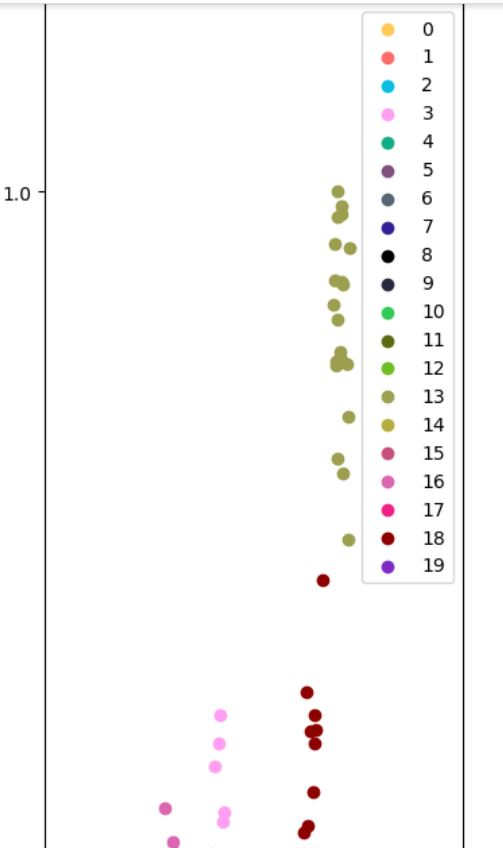

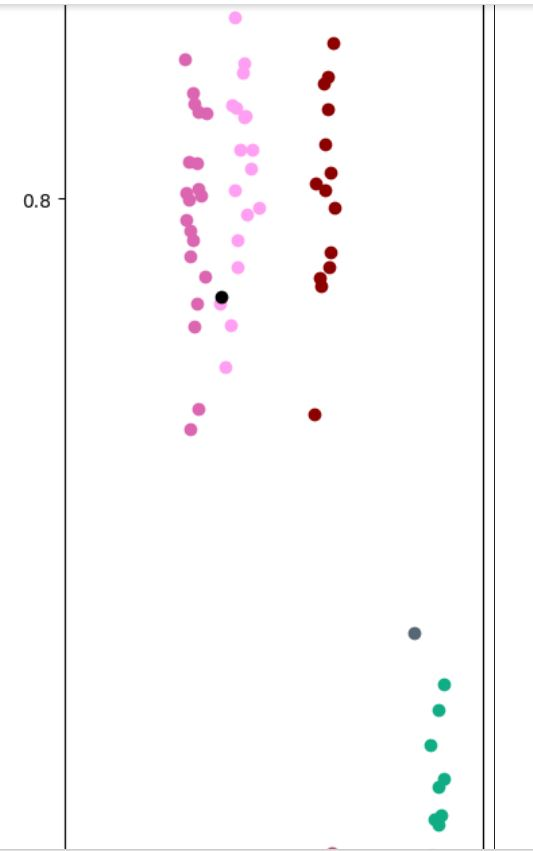

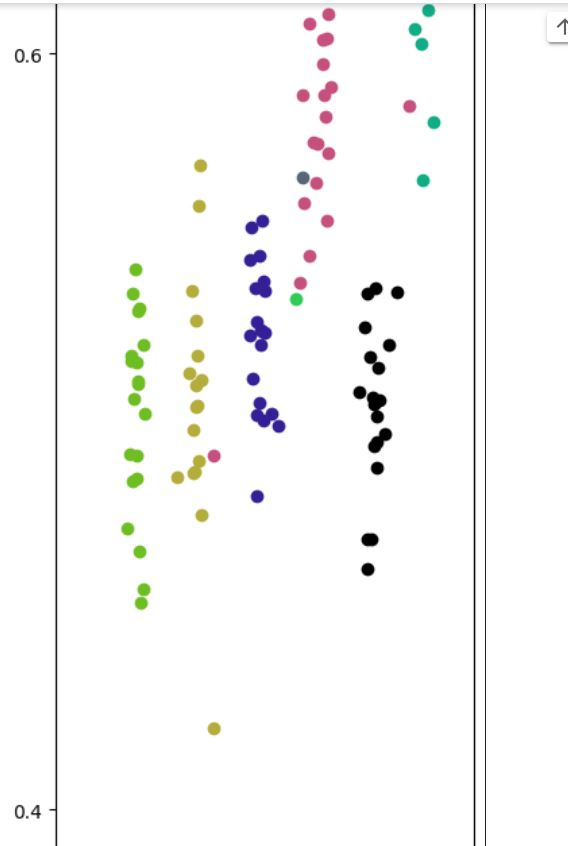

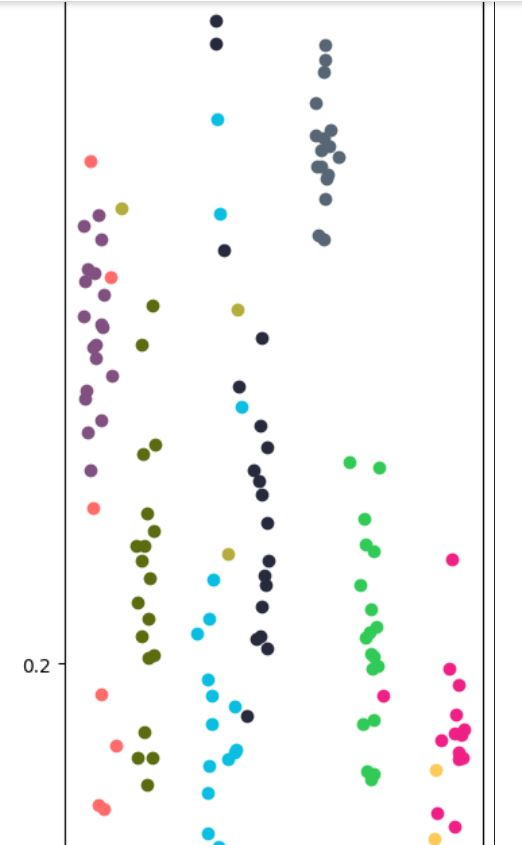

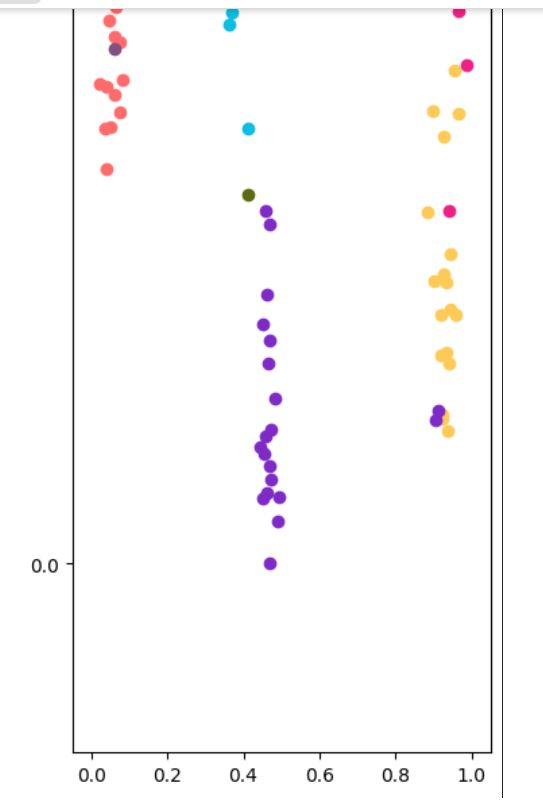

###### R -> P

In [ ]:
LI_BEST_REAL = LiModel(bottleneck_dim = 1000).to(
                    device=DEVICE, memory_format=torch.channels_last)
if(not(os.path.exists("../Material/LI_BEST_REAL.pt"))):
    LI_BEST_REAL, _, __ = domain_adaptation(
          model="li",
          optimizer="nadam",
          optimizer_params = [0.5318330865086823, 0.972314731793811, 7.58742552859644e-07, 0.019467161096021354],
          lr = 0.00033582372793957484,
          wd = 0.0004903049898644513,
          batch_size=16, 
          epochs_da=10,
          data="all_real",
          save_name = "LI_BEST_REAL.pt"
          )
    
else:
    with open("../Material/LI_BEST_REAL.pt", 'rb') as f:
        LI_BEST_REAL.load_state_dict(
            torch.load("../Material/LI_BEST_REAL.pt", map_location = DEVICE)) 

**Train and gain**

In [ ]:
if ALL_CODE:
    loss_to, acc_to  = TO_RESULTS_REAL
    loss_so, acc_so, cl_matr = NO_RESULTS_REAL
    train_loader_source, test_loader_source, train_loader_target, test_loader_target  = get_data(
            batch_size = 16, 
            data = "all_real", shuffle = False, 
            )
    progress_bar = tqdm(total = len(test_loader_target))
    progress_bar.set_description("after training da")
    test_accuracy, coverage, gain_cl_matrix = test(
                LI_BEST_REAL, test_loader_target, 
                get_cost_function(), 
                all_metrics = True, bar = progress_bar, da = True, 
                acc_so = acc_so, acc_to = acc_to, 
                cl_matr =cl_matr)
    print("\t Test accuracy {:.2f}".format(test_accuracy))
    print("\t Gain {:.2f}".format(test_accuracy - acc_so))
    print("\t Coverage {:.2f}".format(coverage))
    print("-----------------------------------------------------")
    gain_cl_matrix.print()



```
Test accuracy 98.00
	 Gain 5.00
	 Coverage 80.97
-----------------------------------------------------
ACCURACY
0.998
overall
0.0050000000000000044
per class
[0.015000000000000013, 0.0024999999999999467, 0.012499999999999956, 0.0, 0.0050000000000000044, 0.0050000000000000044, 0.0025000000000000577, 0.0, 0.0024999999999999467, 0.015000000000000013, 0.0050000000000000044, -0.0050000000000000044, -0.0024999999999999467, 0.0024999999999999467, 0.0050000000000000044, 0.0050000000000000044, 0.007499999999999951, 0.015000000000000013, 0.0, 0.007499999999999951]


PRECISION
overall
0.050000000000000044
per class
[0.25, 0.0, 0.19999999999999996, 0.0, 0.0, 0.050000000000000044, 0.050000000000000044, -0.050000000000000044, 0.050000000000000044, 0.15000000000000002, 0.09999999999999998, -0.04999999999999993, 0.0, 0.0, 0.050000000000000044, 0.09999999999999998, 0.0, 0.0, 0.0, 0.09999999999999998]


RECALL
overall
0.047785821505635706
per class
[0.07002801120448177, 0.052631578947368474, 0.05882352941176472, 0.0, 0.09090909090909094, 0.045454545454545414, 0.0023809523809523725, 0.04761904761904767, 0.0, 0.15000000000000002, 0.005012531328320802, -0.052631578947368474, -0.04761904761904767, 0.04761904761904767, 0.050000000000000044, 0.0, 0.1428571428571429, 0.24, 0.0, 0.052631578947368474]


F1
overall
0.04997516408620384
per class
[0.1647989452867501, 0.024291497975708398, 0.1351351351351351, 0.0, 0.04761904761904767, 0.04761904761904756, 0.025609756097561, -0.001250781738586615, 0.02564102564102566, 0.15000000000000002, 0.052532833020637826, -0.05128205128205121, -0.024390243902439046, 0.024390243902439046, 0.050000000000000044, 0.052631578947368474, 0.06931964056482665, 0.1299145299145299, 0.0, 0.07692307692307687]


F1 NEGATIVO
overall
0.06907480255892762
per class
[0.007856788869951892, 0.0013175094243311758, 0.006553079947575369, 0.0, 0.0026385224274406704, 0.0026385224274405594, 0.0013140558907148714, 3.4626098729395594e-06, 0.0013140604467806183, 0.007894736842105288, 0.002624658283688075, -0.0026281208935610145, -0.0013175230566535578, 0.0013175230566535578, 0.0026315789473684292, 0.002624671916010457, 0.003962943367256999, 0.007957462732027354, 0.0, 0.003942181340341633]


GEOMETRIC MEAN
overall
0.018949882148558972
per class
[0.06284456244224357, 0.00921230699762221, 0.05101446285854161, 0.0, 0.0178817859125322, 0.018113774870457622, 0.009613667659239988, -0.0004439258955235559, 0.009562390760657458, 0.056971777296502824, 0.01976670981911388, -0.019322783923590325, -0.009118464865133902, 0.009118464865133902, 0.01873213252437389, 0.019672867686625573, 0.02652711098032179, 0.04996562829781426, 0.0, 0.028885174684247783]
________________________________________________________________________
MARKEDNESS
overall
0.052631578947368474
per class
[0.25263157894736854, 0.002631578947368318, 0.2026315789473685, 0.0, 0.0052631578947368585, 0.05263157894736836, 0.050000000000000266, -0.047368421052631726, 0.050000000000000044, 0.1578947368421053, 0.10000000000000009, -0.05263157894736836, -0.002631578947368318, 0.002631578947368318, 0.052631578947368585, 0.10000000000000009, 0.007894736842105177, 0.015789473684210575, 0.0, 0.10263157894736841]


UPM
overall
0.027976445811677797
per class
[0.09518635787291041, 0.013549227403441666, 0.07529259273378819, 0.0, 0.025647635004510838, 0.02674024699046207, 0.013903187832514985, -0.000638810541531587, 0.013627514600908497, 0.08442857142857141, 0.028831584574353197, -0.02819277403282161, -0.01298870405937691, 0.01298870405937691, 0.026891891891891895, 0.02827106123028844, 0.039554070127244434, 0.07461627048329367, 0.0, 0.04182028863373011]


COHEN K
overall
0.052631578947368474
per class
[0.17000447820558873, 0.026725037004657115, 0.13852638534064554, 0.0, 0.049049833011375, 0.0503148236501918, 0.027246726950308053, -0.0012156608036756333, 0.026600512800736054, 0.1578947368421053, 0.05514361023299774, -0.05392794942932211, -0.02538485199706042, 0.02538485199706042, 0.052631578947368474, 0.05380342522540105, 0.07444318381682447, 0.13226408078135288, 0.0, 0.08052846223005816]


FM
overall
0.035815790791271285
per class
[0.11964057795428062, 0.019225556262242538, 0.094677101873335, 0.0, 0.03251500295758025, 0.03498538890133163, 0.01887138680252165, -0.0008522576346496891, 0.017789557996201077, 0.1103730813325654, 0.03809694306476419, -0.0372446854301145, -0.01693730036155139, 0.01693730036155139, 0.03580868716407304, 0.03580868716407304, 0.05283222267621701, 0.08875432131469196, 0.0, 0.05503424342631558]


MATHEW
overall
0.1910188863727767
per class
[0.44722641822224274, 0.10062254540293536, -0.28302020643910286, 0.0, -0.49874686716791977, 0.16773595862040036, 0.1673980360584732, 0.0, -0.666110183639399, -0.24691551447260193, 0.2679858618744146, -0.2679858618744146, 0.666110183639399, -0.666110183639399, -0.4987121475809258, -0.49874686716791977, 0.2157722578548314, 0.44706899419306617, 0.0, -0.3981243217649844]

```



**T-sne**

In [ ]:
if ALL_CODE:
    T_sne(LI_BEST_REAL, data = "product")

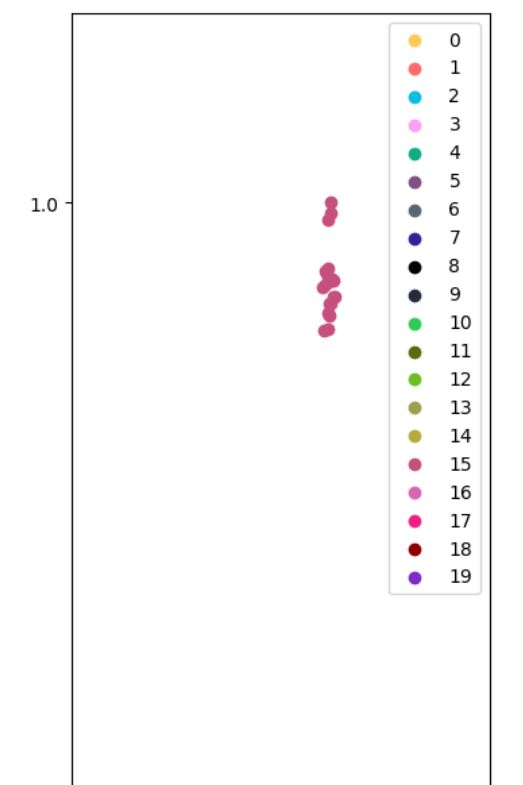

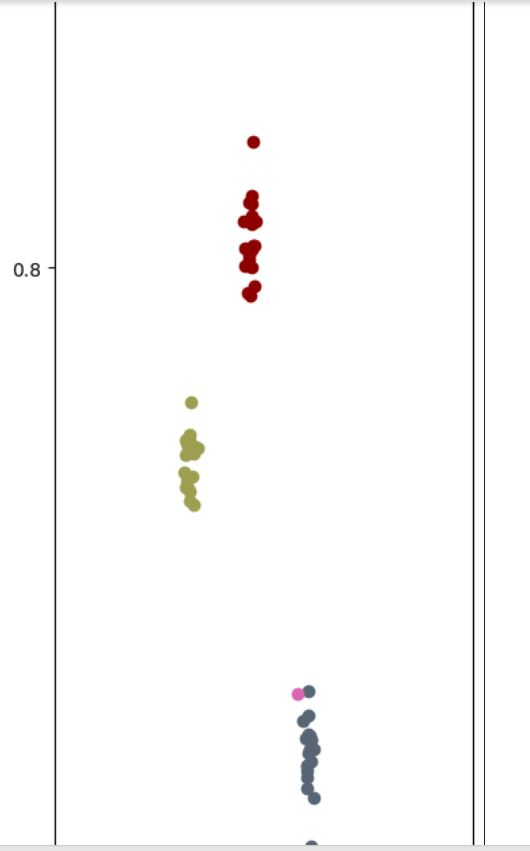

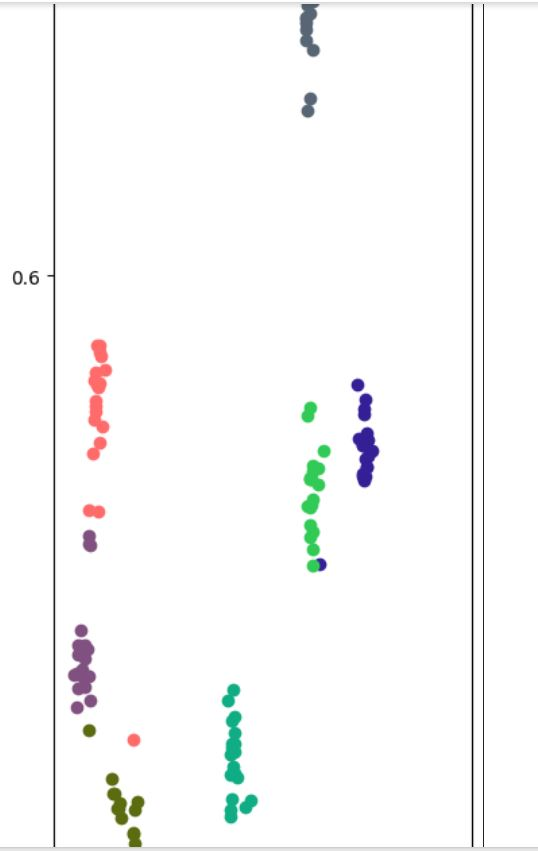

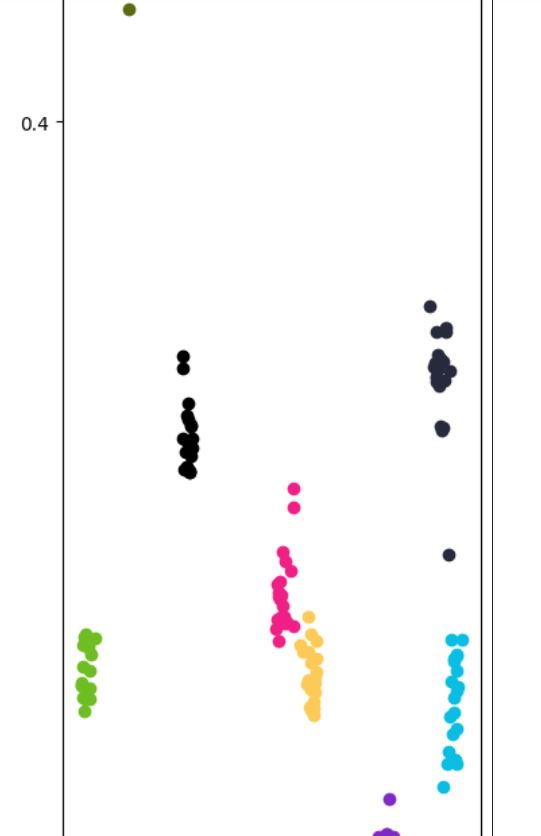

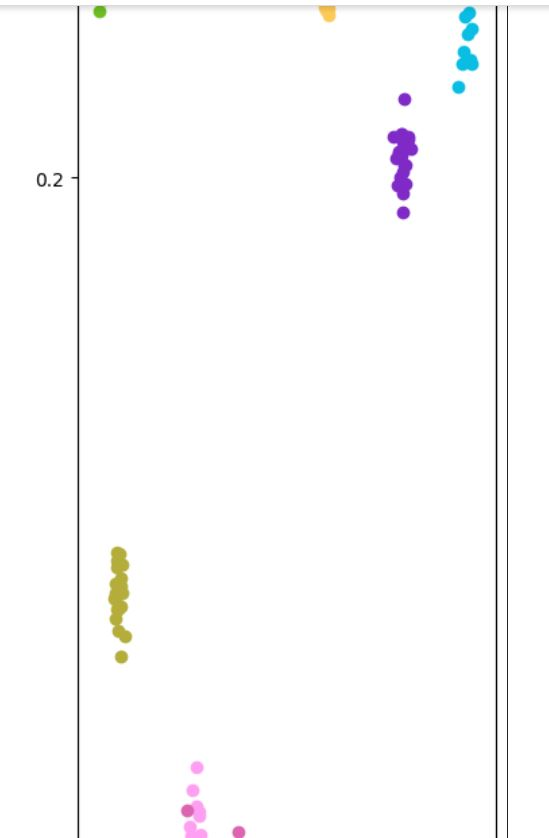

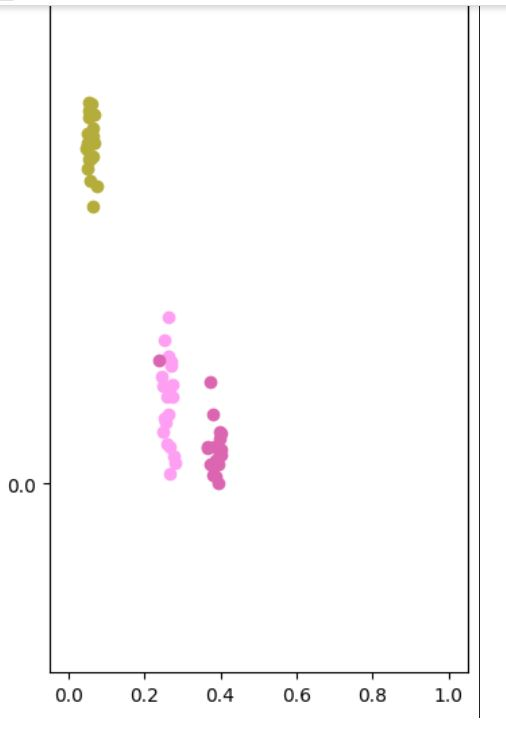

####**12.3 [71] Mind the Class Weight Bias: Weighted Maximum Mean Discrepancy for Unsupervised Doamin Adaptation, Yan, H., Ding, Y., Li, P., Wang, Q., Xu, Y., Zuo, W.**


MMD based approach which employs prior probability to reparametrized a given target data source output with an alfa parameter to account for different bias of source and target distro. This lead to modification to MMD and to calculate labels in source domain of target data it uses prediction over network before bias correction.
For further details see correspnding loss function


original paper authors apply MMD in different layers based on architecture
- for alexnet last three fully connected
- google net last inception and fully connected
- lenet last fully connected


in present case **more advanced convnext architecture is employed and  MMD on feature is applied before classifier layers**

parameters in order are
- gamma,

  weights crossentropy in loss

- lambda, 

  weights mmd in loss

- kernel list and width

In [ ]:
DA_STD_PARAMS["yan"] = [0.4, 0.4, [5, 10, 15, 20, 50]]

##### optimization

class form optimization

In [339]:
class ParamsOptimizerYan():
    def __init__(
        self, save_name: str = "TEMPORANEOUS_NET.pt",  
        data: str = "all_product",
        N_train: int = 1000, N_valid: int = 500) -> None:

        self.model: str = "yan"
        self.data: str = data
        self.N_train: int = N_train
        self.N_valid: int = N_valid
        self.save_name: str = save_name

    '''
    Class to handle optimization of Yan domain adaptation via reverse validation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        model: str 
            -- name of model want to be optimize

        data: str 
            -- if product or real data are to be optimized

        N_train: int 
            -- number of train data set

        N_valid:int
            -- number of data validation set

        save_name: str 
            -- name where save temporary net results
        

    Public Methods:
    ----------
        compute(
        self,  config: Configuration, 
        seed: int = RANDOM_SEED, budget: int = 10) -> float
            -- compute current incumbent value

        configspace(self) -> ConfigurationSpace
            -- retrieve current configuration space

        
    
    '''
    #repeatedly called during the optimization and evaluates a given configuration yielding the associated loss.
    def compute(
        self,  config: Configuration, seed: int = RANDOM_SEED, 
        budget: int = 1) -> float:
        """
        compute current incumbent value
        ...

        Keyword Arguments:
        ----------

          config: Configuration
              -- incumbent sampled config
          
          seed: int
               -- random seed for optimizer
          
          budget: int
                -- number epoch allowed to be evaluated

        Returns
        ----------
          value of 1-accuracy to be minimized

        """
        
        net_da, _, __ = domain_adaptation(
          model="yan",
          optimizer="SGD"if self.data=="all_product" else "nadam",
          optimizer_params = [0.669001748815815, 1] if self.data=="all_product" else [0.5318330865086823, 0.972314731793811, 7.58742552859644e-07, 0.019467161096021354],
          lr = 0.00878248760630914 if self.data=="all_product" else  0.00033582372793957484,
          wd = 1.1559820780617287e-05 if self.data=="all_product" else 0.0004903049898644513,
          batch_size=16, 
          epochs_da=int(np.ceil(budget / 2)),
          data=self.data,
          da_params = [config["gamma"], config["lambda"], [5, 10, 15, 20, 50]],
          save_name = self.save_name,
          N_train = self.N_train,
          N_valid = self.N_valid
          )
        cost_function = get_cost_function(
            label_smoothing = None)
        optimizer = get_optimizer(
          net_da, optimizer = "SGD"if self.data=="all_product" else "nadam", 
          lr = 0.00878248760630914 if self.data=="all_product" else  0.00033582372793957484, 
          wd = 1.1559820780617287e-05 if self.data=="all_product" else 0.0004903049898644513,
          momentum = 0.669001748815815, nesterov = 1, 
          betas = (0.5318330865086823, 0.972314731793811), eps = 7.58742552859644e-07, 
          momentum_decay = 0.019467161096021354
          )
        net_da.obtain_features=False
        rescore = revalidation(
            "product" if self.data=="all_product" else "real",
            net_da,
            optimizer, 
            int(np.ceil(budget / 2)),
            cost_function,
            da=False
            )
        return  rescore

    @property
    def configspace(self) -> ConfigurationSpace:
        """
        configuration space definition
        ...

        Keyword Arguments:
        ----------
            None

        Returns
        ----------
          configuration space

        """
        # Build Configuration Space which defines all parameters and their ranges.  
        cs = ConfigurationSpace()
        gamma = CSH.UniformFloatHyperparameter(
            "gamma",
            lower= 0.0001,
            upper= 1.0,
            default_value=0.1
        )
        lambd = CSH.UniformFloatHyperparameter(
            "lambda",
            lower= 0.0001,
            upper= 1.0,
            default_value=0.1
        )

        # Add all hyperparameters at once:
        cs.add_hyperparameters([gamma, lambd])
        return cs

###### P -> R

In [ ]:
if ALL_CODE:
    optimize_net(ParamsOptimizerYan, data="all_product")

###### R -> P

In [ ]:
if ALL_CODE:
    optimize_net(ParamsOptimizerYan, data="all_real")

##### results

###### P -> R

In [ ]:
YAN_BEST_PRODUCT=OurConvnext(submodel = "ourda", obtain_features=True).to(
                    device=DEVICE, memory_format=torch.channels_last)
if(not(os.path.exists("../Material/YAN_BEST_PRODUCT.pt"))):
    YAN_BEST_PRODUCT, _, __ = domain_adaptation(
          model="yan",
          optimizer="SGD",
          optimizer_params = [0.669001748815815, 1],
          lr = 0.00878248760630914,
          wd = 1.1559820780617287e-05,
          batch_size=16, 
          epochs_da=10,
          data="all_product",
          save_name = "YAN_BEST_PRODUCT.pt" 
          )
    
else:
    with open("../Material/YAN_BEST_PRODUCT.pt", 'rb') as f:
        YAN_BEST_PRODUCT.load_state_dict(
            torch.load("../Material/YAN_BEST_PRODUCT.pt", map_location = DEVICE)) 

**Test**

In [ ]:
if ALL_CODE:
    loss_to, acc_to  = TO_RESULTS_PROD
    loss_so, acc_so, cl_matr = NO_RESULTS_PROD
    train_loader_source, test_loader_source, train_loader_target, test_loader_target  = get_data(
            batch_size = 16, 
            data = "all_product", shuffle = False, 
            )
    progress_bar = tqdm(total = len(test_loader_target))
    progress_bar.set_description("after training da")
    test_accuracy, coverage, gain_cl_matrix = test(
                YAN_BEST_PRODUCT, test_loader_target, 
                get_cost_function(), 
                all_metrics = True, bar = progress_bar, da = True, 
                acc_so = acc_so, acc_to = acc_to, 
                cl_matr =cl_matr)
    print("\t Test accuracy {:.2f}".format(test_accuracy))
    print("\t Gain {:.2f}".format(test_accuracy - acc_so))
    print("\t Coverage {:.2f}".format(coverage))
    print("-----------------------------------------------------")
    gain_cl_matrix.print()



```
 Test accuracy 93.25
	 Gain 0.25
	 Coverage 22.76
-----------------------------------------------------
ACCURACY
0.99325
overall
0.00024999999999997247
per class
[-0.0025000000000000577, 0.0, 0.007499999999999951, -0.0025000000000000577, 0.0025000000000000577, 0.0050000000000000044, -0.0024999999999999467, 0.0024999999999999467, 0.0, 0.0025000000000000577, -0.0025000000000000577, -0.010000000000000009, -0.0050000000000000044, 0.0024999999999999467, -0.0024999999999999467, -0.0024999999999999467, 0.010000000000000009, 0.0024999999999999467, 0.0, 0.0]


PRECISION
overall
0.0025000000000000577
per class
[0.0, 0.0, 0.1499999999999999, -0.050000000000000044, 0.0, 0.0, 0.0, 0.0, 0.0, -0.04999999999999993, 0.0, 0.0, -0.050000000000000044, 0.0, -0.04999999999999993, 0.09999999999999998, 0.09999999999999998, -0.09999999999999998, 0.0, 0.0]


RECALL
overall
0.000457169429036397
per class
[-0.04901960784313719, 0.0, 0.008823529411764675, -0.0023809523809523725, 0.04329004329004327, 0.08636363636363631, -0.04523809523809519, 0.04761904761904767, 0.0, 0.0911764705882353, -0.047368421052631504, -0.17391304347826086, -0.050000000000000044, 0.04761904761904767, -0.0026315789473684292, -0.13043478260869568, 0.09523809523809523, 0.08999999999999997, 0.0, 0.0]


F1
overall
0.0021236198240108806
per class
[-0.02133712660028453, 0.0, 0.08513513513513504, -0.025609756097561, 0.023228803716608626, 0.04523809523809519, -0.023170731707316983, 0.024390243902439046, 0.0, 0.014864864864864935, -0.023076923076923106, -0.09063804412641618, -0.050000000000000044, 0.024390243902439046, -0.026923076923076827, -0.017135862913096656, 0.09756097560975607, 0.005555555555555536, 0.0, 0.0]


F1 NEGATIVO
overall
0.06657548026810423
per class
[-0.0013243757374364895, 0.0, 0.0039215010002069395, -0.0013140558907148714, 0.0013209993707871126, 0.0026454659075128006, -0.0013209902225919112, 0.0013175230566535578, 0.0, 0.001341656894529919, -0.0013209765543951146, -0.005290959368278725, -0.0026315789473684292, 0.0013175230566535578, -0.0013106023929732036, -0.0013383399730251266, 0.005270092226613898, 0.0013767863367026845, 0.0, 0.0]


GEOMETRIC MEAN
overall
0.0008162430041060986
per class
[-0.008468320254587214, 0.0, 0.03228233033416772, -0.009613667659239988, 0.008763321047398298, 0.01726342825861593, -0.008803132938178804, 0.009118464865133902, 0.0, 0.005957314437961214, -0.008833984465476785, -0.034572374456048216, -0.01873213252437389, 0.009118464865133902, -0.010153042159873893, -0.006639564832293221, 0.03708151380181346, 0.0025562417619688915, 0.0, 0.0]
________________________________________________________________________
MARKEDNESS
overall
0.0026315789473684292
per class
[-0.0026315789473685403, 0.0, 0.1499999999999999, -0.050000000000000266, 0.0026315789473685403, 0.005263157894736636, -0.002631578947368318, 0.002631578947368318, 0.0, -0.044736842105263186, -0.002631578947368318, -0.010526315789473717, -0.052631578947368585, 0.002631578947368318, -0.04999999999999982, 0.09210526315789469, 0.10526315789473695, -0.09210526315789469, 0.0, 0.0]


UPM
overall
0.0012091126854637535
per class
[-0.013582975029973854, 0.0, 0.048400700841896294, -0.013903187832514985, 0.012658930945133928, 0.025495990103081012, -0.01291558830463857, 0.01298870405937691, 0.0, 0.00913597869478322, -0.01317971136626983, -0.05101848716662771, -0.026891891891891895, 0.01298870405937691, -0.014928396741838212, -0.00971815761440542, 0.054836427298155965, 0.003815213655630756, 0.0, 0.0]


COHEN K
overall
0.0026315789473684292
per class
[-0.0244134941060149, 0.0, 0.08589480639327707, -0.027246726950308053, 0.02366498101431458, 0.04673307771419832, -0.024184151572274493, 0.02538485199706042, 0.0, 0.01936835150145977, -0.024734695664678674, -0.09385700165091027, -0.052631578947368474, 0.02538485199706042, -0.02789688328268969, -0.01738000040000698, 0.10286175704516509, 0.0009698567399836211, 0.0, 0.0]


FM
overall
0.0010745480167002608
per class
[-0.019329944845471347, 0.0, 0.05886841470926196, -0.01887138680252165, 0.015577702596028864, 0.03169170469483884, -0.01650843833802984, 0.01693730036155139, 0.0, 0.015695979459230402, -0.01753853244690573, -0.06372487984737796, -0.03580868716407304, 0.01693730036155139, -0.019225556262242538, -0.011084423598901383, 0.07170360947873866, -0.003829202021672362, 0.0, 0.0]


MATHEW
overall
0.025750408088174193
per class
[-0.02251609829573742, 0.0, 0.21569194114182294, -0.1673980360584732, 0.16736331647147923, 0.1677012390334064, -0.10058430352129172, -0.666110183639399, 0.0, 0.03610469196650093, -0.0671508704375508, -0.3830697292171114, 0.4987121475809258, -0.666110183639399, -0.10058782581594139, -0.100552283416666, 0.3831355743263106, 0.027874325026269103, 0.0, 0.0]
```



**T-sne**

In [ ]:
if ALL_CODE:
    YAN_BEST_PRODUCT.name = "ourda"
    T_sne(YAN_BEST_PRODUCT, data = "real")

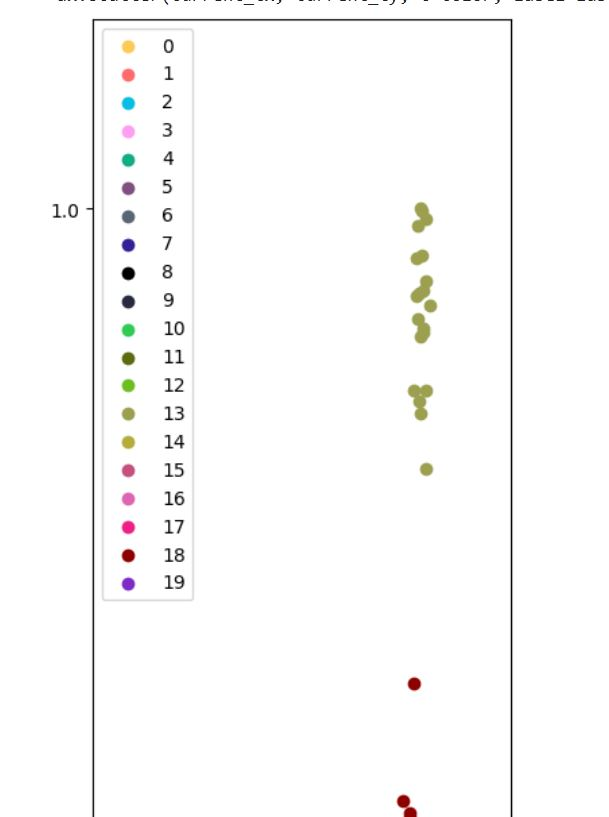

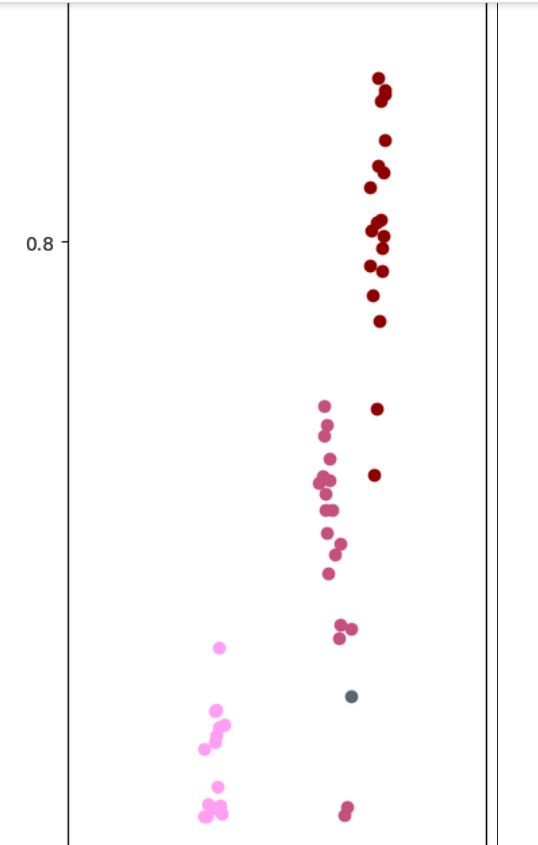

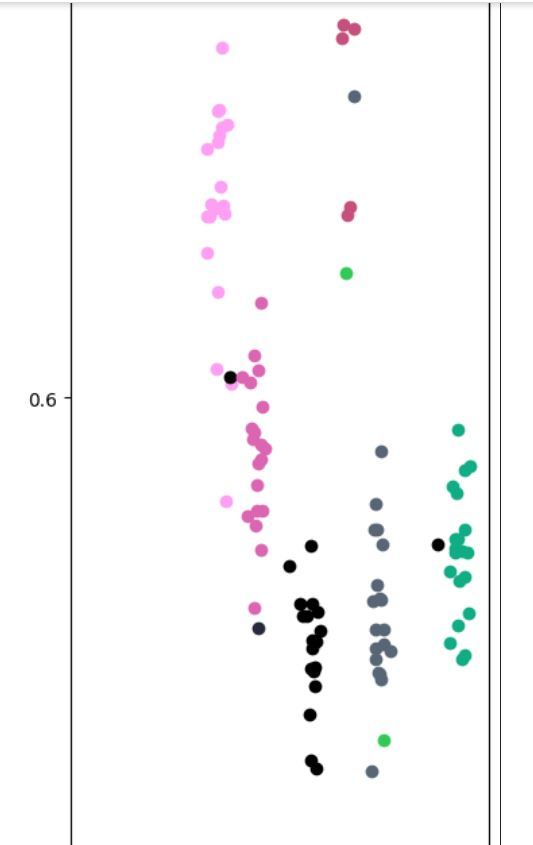

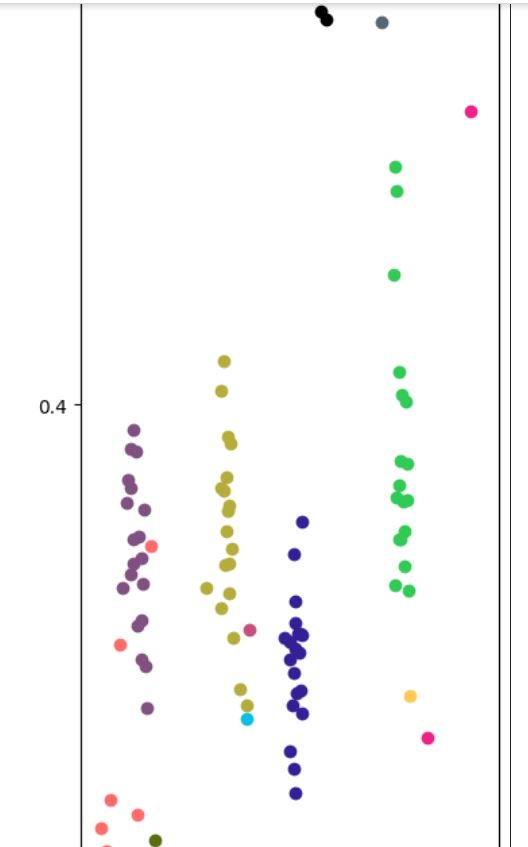

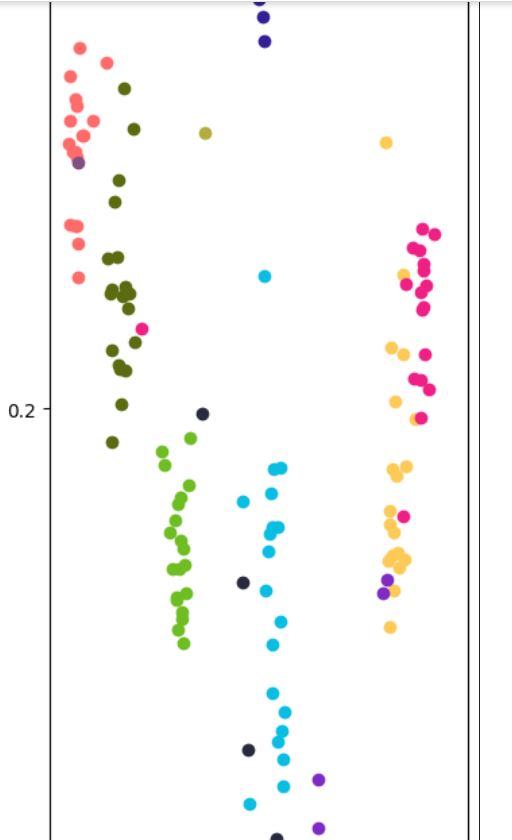

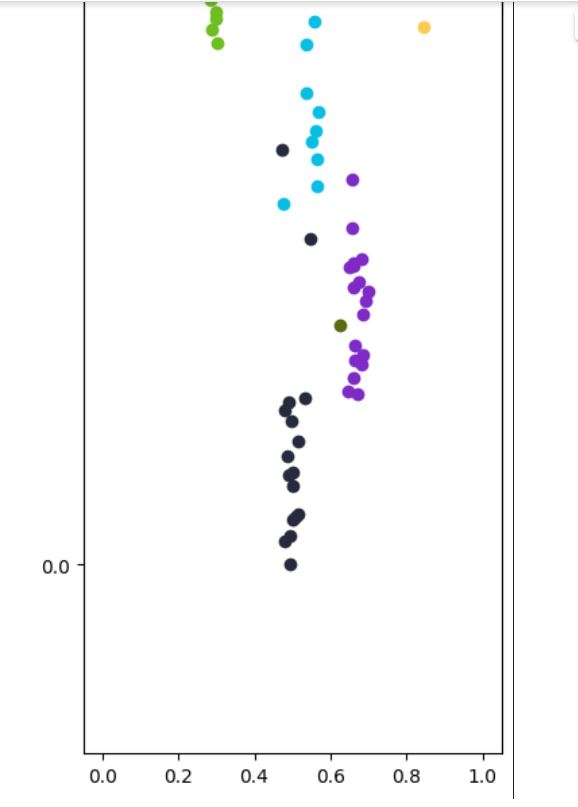

###### R -> P

In [ ]:
YAN_BEST_REAL = OurConvnext(submodel = "ourda", obtain_features=True).to(
                    device=DEVICE, memory_format=torch.channels_last)
if(not(os.path.exists("../Material/YAN_BEST_REAL.pt"))):
    YAN_BEST_REAL, _, __ = domain_adaptation(
          model="yan",
          optimizer="nadam",
          optimizer_params = [0.5318330865086823, 0.972314731793811, 7.58742552859644e-07, 0.019467161096021354],
          lr = 0.00033582372793957484,
          wd = 0.0004903049898644513,
          batch_size=16, 
          epochs_da=10,
          data="all_real",
          save_name = "YAN_BEST_REAL.pt"
          )
    
else:
    with open("../Material/YAN_BEST_REAL.pt", 'rb') as f:
        YAN_BEST_REAL.load_state_dict(
            torch.load("../Material/YAN_BEST_REAL.pt", map_location = DEVICE)) 

**Train and gain**

In [ ]:
if ALL_CODE:
    loss_to, acc_to  = TO_RESULTS_REAL
    loss_so, acc_so, cl_matr = NO_RESULTS_REAL
    train_loader_source, test_loader_source, train_loader_target, test_loader_target  = get_data(
            batch_size = 16, 
            data = "all_real", shuffle = False, 
            )
    progress_bar = tqdm(total = len(test_loader_target))
    progress_bar.set_description("after training da")
    test_accuracy, coverage, gain_cl_matrix = test(
                YAN_BEST_REAL, test_loader_target, 
                get_cost_function(), 
                all_metrics = True, bar = progress_bar, da = True, 
                acc_so = acc_so, acc_to = acc_to, 
                cl_matr =cl_matr)
    print("\t Test accuracy {:.2f}".format(test_accuracy))
    print("\t Gain {:.2f}".format(test_accuracy - acc_so))
    print("\t Coverage {:.2f}".format(coverage))
    print("-----------------------------------------------------")
    gain_cl_matrix.print()



```
Test accuracy 97.50
	 Gain 4.50
	 Coverage 87.31
-----------------------------------------------------
ACCURACY
0.9975
overall
0.0045000000000000595
per class
[0.01749999999999996, -0.0025000000000000577, 0.012499999999999956, 0.0, 0.0025000000000000577, 0.0025000000000000577, 0.0025000000000000577, -0.0025000000000000577, 0.0024999999999999467, 0.015000000000000013, 0.0, 0.0, 0.0, 0.0024999999999999467, 0.0050000000000000044, 0.0050000000000000044, 0.007499999999999951, 0.015000000000000013, 0.0, 0.0050000000000000044]


PRECISION
overall
0.04500000000000004
per class
[0.25, 0.04999999999999993, 0.19999999999999996, 0.0, -0.050000000000000044, -0.09999999999999998, 0.050000000000000044, -0.09999999999999998, 0.050000000000000044, 0.15000000000000002, 0.09999999999999998, 0.050000000000000044, 0.0, 0.0, 0.050000000000000044, 0.09999999999999998, 0.0, 0.0, 0.0, 0.09999999999999998]


RECALL
overall
0.04400388643079445
per class
[0.11764705882352944, -0.08373205741626788, 0.05882352941176472, 0.0, 0.09090909090909094, 0.13636363636363635, 0.0023809523809523725, 0.04761904761904767, 0.0, 0.15000000000000002, -0.0778032036613272, -0.04761904761904767, 0.0, 0.04761904761904767, 0.050000000000000044, 0.0, 0.1428571428571429, 0.24, 0.0, 0.005012531328320802]


F1
overall
0.04511745159944991
per class
[0.18918918918918914, -0.01831501831501836, 0.1351351351351351, 0.0, 0.02197802197802201, 0.014157014157014203, 0.025609756097561, -0.028241335044929428, 0.02564102564102566, 0.15000000000000002, 0.007155635062611743, 0.001250781738586615, 0.0, 0.024390243902439046, 0.050000000000000044, 0.052631578947368474, 0.06931964056482665, 0.1299145299145299, 0.0, 0.052532833020637826]


F1 NEGATIVO
overall
0.06881111866452627
per class
[0.00917431192660545, -0.001334863514539597, 0.006553079947575369, 0.0, 0.0013244619806600522, 0.001345196886335942, 0.0013140558907148714, -0.0013071488593568992, 0.0013140604467806183, 0.007894736842105288, -2.0830548693950846e-05, -3.4626098729395594e-06, 0.0, 0.0013175230566535578, 0.0026315789473684292, 0.002624671916010457, 0.003962943367256999, 0.007957462732027354, 0.0, 0.002624658283688075]


GEOMETRIC MEAN
overall
0.017109604580224813
per class
[0.07196302730737747, -0.007110386098742039, 0.05101446285854161, 0.0, 0.008319395151874742, 0.005612577256298712, 0.009613667659239988, -0.01055440282149167, 0.009562390760657458, 0.056971777296502824, 0.0025727421653289895, 0.0004439258955235559, 0.0, 0.009118464865133902, 0.01873213252437389, 0.019672867686625573, 0.02652711098032179, 0.04996562829781426, 0.0, 0.01976670981911388]
________________________________________________________________________
MARKEDNESS
overall
0.047368421052631615
per class
[0.25526315789473686, 0.044736842105263186, 0.2026315789473685, 0.0, -0.044736842105263186, -0.09210526315789469, 0.050000000000000266, -0.09736842105263177, 0.050000000000000044, 0.1578947368421053, 0.09473684210526301, 0.047368421052631726, 0.0, 0.002631578947368318, 0.052631578947368585, 0.10000000000000009, 0.007894736842105177, 0.015789473684210575, 0.0, 0.10000000000000009]


UPM
overall
0.02527739599942025
per class
[0.10817506193228732, -0.0105675933612428, 0.07529259273378819, 0.0, 0.012020120403602341, 0.008327358891869086, 0.013903187832514985, -0.015282357170911531, 0.013627514600908497, 0.08442857142857141, 0.0038310697890362455, 0.000638810541531587, 0.0, 0.01298870405937691, 0.026891891891891895, 0.02827106123028844, 0.039554070127244434, 0.07461627048329367, 0.0, 0.028831584574353197]


COHEN K
overall
0.047368421052631615
per class
[0.19538933020264915, -0.018836194431508635, 0.13852638534064554, 0.0, 0.022449320210638946, 0.01770121618292486, 0.027246726950308053, -0.028418573228340627, 0.026600512800736054, 0.1578947368421053, 0.009345036604650137, 0.0012156608036756333, 0.0, 0.02538485199706042, 0.052631578947368474, 0.05380342522540105, 0.07444318381682447, 0.13226408078135288, 0.0, 0.05514361023299774]


FM
overall
0.032617117422471864
per class
[0.136577878315832, -0.012466148432596302, 0.094677101873335, 0.0, 0.014725444961379175, 0.013433880359360995, 0.01887138680252165, -0.01887138680252165, 0.017789557996201077, 0.1103730813325654, 0.008141132663341155, 0.0008522576346496891, 0.0, 0.01693730036155139, 0.03580868716407304, 0.03580868716407304, 0.05283222267621701, 0.08875432131469196, 0.0, 0.03809694306476419]


MATHEW
overall
0.1514205866889335
per class
[-0.21888376541715623, -0.067113413217465, -0.28302020643910286, 0.0, 0.16736331647147923, 0.06718367520373436, 0.1673980360584732, -0.16736331647147923, -0.666110183639399, -0.24691551447260193, 7.026198626935987e-05, 0.0, 0.0, -0.666110183639399, -0.4987121475809258, -0.49874686716791977, 0.2157722578548314, 0.44706899419306617, 0.0, 0.2679858618744146]


```



**T-sne**

In [ ]:
if ALL_CODE:
    YAN_BEST_REAL.name = "ourda"
    T_sne(YAN_BEST_REAL, data = "product")

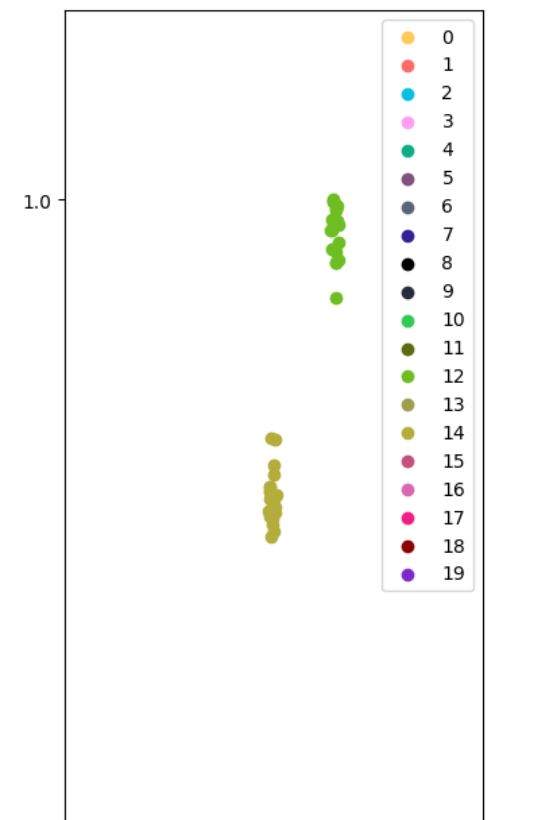

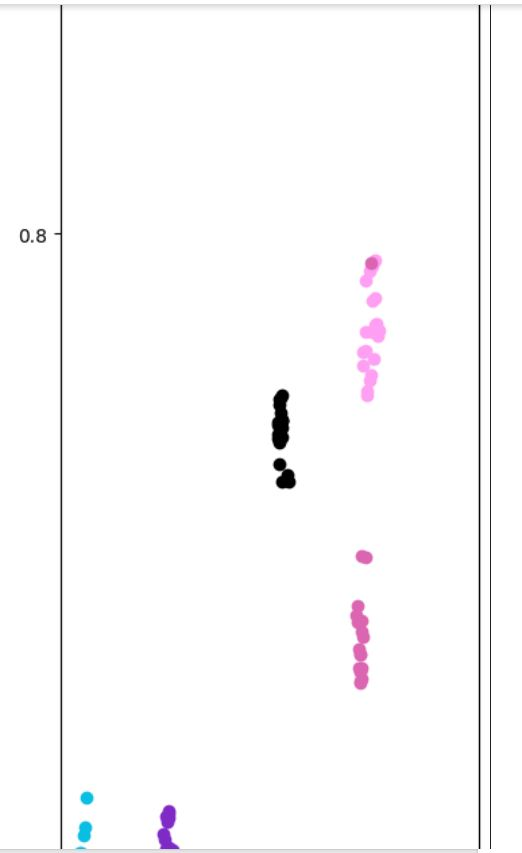

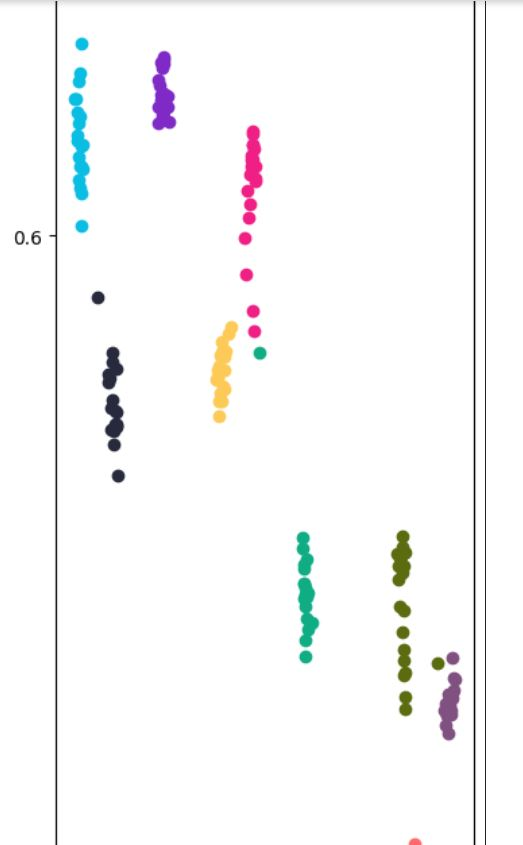

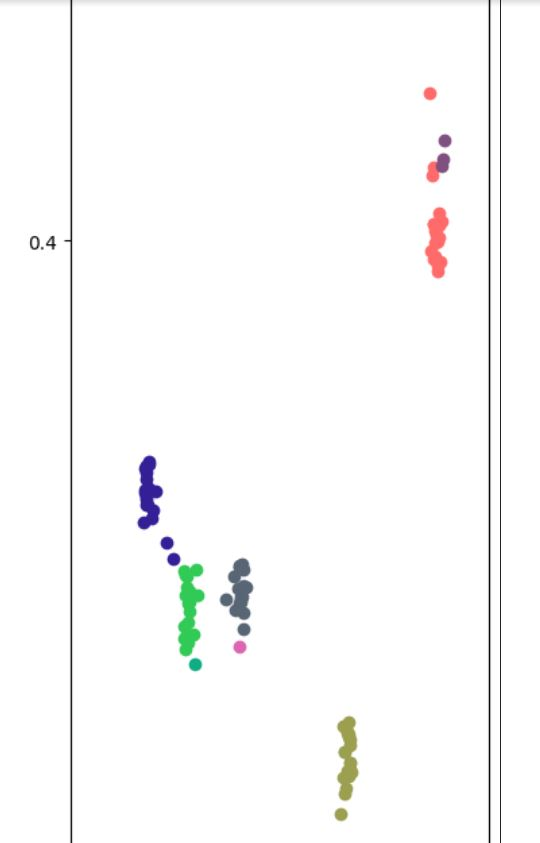

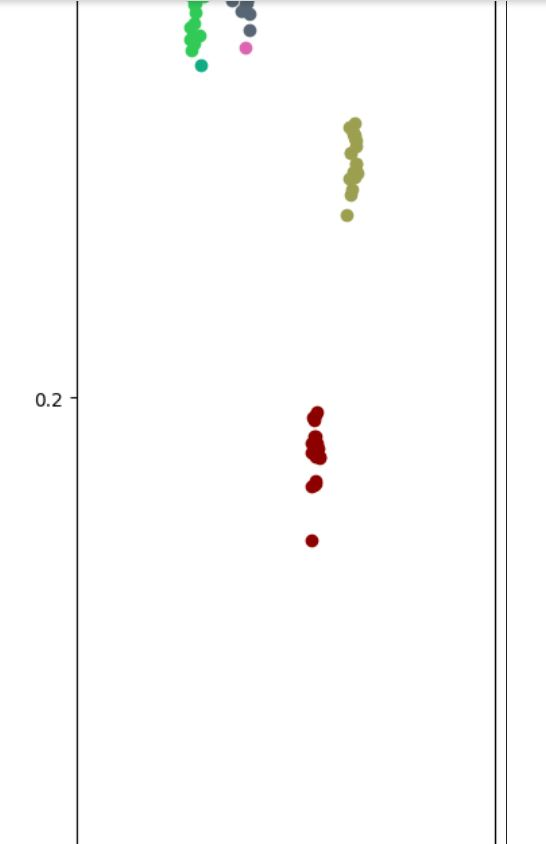

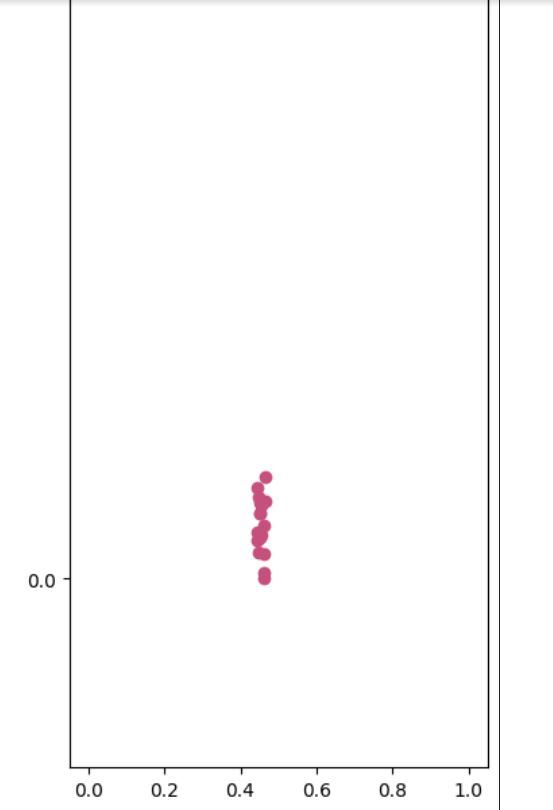

####**12.4 [105] Supervised Representation Learning: Transfer Learning with Deep Autoencoders, Zhuang, F., Cheng, X., Luo, P., Pan, S.J., He, Q., 2015**

this model involve autoencoder to pull representation of source and target domain near each other. In original paper they applied autoencoder directly on the images and use no convolutions in autoencoder (which is also limited to two layers). **this proposed version**
- **apply autoencoder to feature generated by backbone network**
- use **convolutional autoencoders with four layer**
- apply **further a classifier bottleneck over hidden representations of autoencoder**
for further details see model class section 

network parameters are (in order)
- alfa, weights kl divergence between source and target domain
- beta, weights crossentropy loss source domain

In [342]:
DA_STD_PARAMS["cheng"] = [0.5, 0.5]

##### optimization

class form optimization

In [344]:
class ParamsOptimizerCheng():
    def __init__(
        self, save_name: str = "TEMPORANEOUS_NET.pt",  
        data: str = "all_product",
        N_train: int = 1000, N_valid: int = 500) -> None:

        self.model: str = "cheng"
        self.data: str = data
        self.N_train: int = N_train
        self.N_valid: int = N_valid
        self.save_name: str = save_name

    '''
    Class to handle optimization of Cheng domain adaptation via reverse validation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        model: str 
            -- name of model want to be optimize

        data: str 
            -- if product or real data are to be optimized

        N_train: int 
            -- number of train data set

        N_valid:int
            -- number of data validation set

        save_name: str 
            -- name where save temporary net results
        

    Public Methods:
    ----------
        compute(
        self,  config: Configuration, 
        seed: int = RANDOM_SEED, budget: int = 10) -> float
            -- compute current incumbent value

        configspace(self) -> ConfigurationSpace
            -- retrieve current configuration space

        
    
    '''
    #repeatedly called during the optimization and evaluates a given configuration yielding the associated loss.
    def compute(
        self,  config: Configuration, seed: int = RANDOM_SEED, 
        budget: int = 1) -> float:
        """
        compute current incumbent value
        ...

        Keyword Arguments:
        ----------

          config: Configuration
              -- incumbent sampled config
          
          seed: int
               -- random seed for optimizer
          
          budget: int
                -- number epoch allowed to be evaluated

        Returns
        ----------
          value of 1-accuracy to be minimized

        """
        
        net_da, _, __ = domain_adaptation(
          model="cheng",
          optimizer="SGD"if self.data=="all_product" else "nadam",
          optimizer_params = [0.669001748815815, 1] if self.data=="all_product" else [0.5318330865086823, 0.972314731793811, 7.58742552859644e-07, 0.019467161096021354],
          lr = 0.00878248760630914 if self.data=="all_product" else  0.00033582372793957484,
          wd = 1.1559820780617287e-05 if self.data=="all_product" else 0.0004903049898644513,
          batch_size=16, 
          epochs_da=int(np.ceil(budget / 2)),
          data=self.data,
          da_params = [config["alfa"], config["beta"]],
          save_name = self.save_name,
          N_train = self.N_train,
          N_valid = self.N_valid
          )
        cost_function = get_cost_function(
            label_smoothing = None)
        optimizer = get_optimizer(
          net_da, optimizer = "SGD"if self.data=="all_product" else "nadam", 
          lr = 0.00878248760630914 if self.data=="all_product" else  0.00033582372793957484, 
          wd = 1.1559820780617287e-05 if self.data=="all_product" else 0.0004903049898644513,
          momentum = 0.669001748815815, nesterov = 1, 
          betas = (0.5318330865086823, 0.972314731793811), eps = 7.58742552859644e-07, 
          momentum_decay = 0.019467161096021354
          )
        rescore = revalidation(
            "product" if self.data=="all_product" else "real",
            net_da,
            optimizer, 
            int(np.ceil(budget / 2)),
            cost_function,
            da=True
            )
        return  rescore

    @property
    def configspace(self) -> ConfigurationSpace:
        """
        configuration space definition
        ...

        Keyword Arguments:
        ----------
            None

        Returns
        ----------
          configuration space

        """
        # Build Configuration Space which defines all parameters and their ranges.  
        cs = ConfigurationSpace()
        alfa = CSH.UniformFloatHyperparameter(
            "alfa",
            lower= 0.0001,
            upper= 1.0,
            default_value=0.7
        )
        beta = CSH.UniformFloatHyperparameter(
            "beta",
            lower= 0.0001,
            upper= 1.0,
            default_value=0.1
        )
        # Add all hyperparameters at once:
        cs.add_hyperparameters([alfa, beta])
        return cs

###### P -> R

In [ ]:
if ALL_CODE:
    optimize_net(ParamsOptimizerCheng, data="all_product")

###### R -> P

In [ ]:
if ALL_CODE:
    optimize_net(ParamsOptimizerCheng, data="all_real")

##### results

###### P -> R

In [ ]:
CHENG_BEST_PRODUCT=ChengModel().to(
                    device=DEVICE, memory_format=torch.channels_last)
if(not(os.path.exists("../Material/CHENG_BEST_PRODUCT.pt"))):
    CHENG_BEST_PRODUCT, _, __ = domain_adaptation(
          model="cheng",
          optimizer="SGD",
          optimizer_params = [0.669001748815815, 1],
          lr = 0.00878248760630914,
          wd = 1.1559820780617287e-05,
          batch_size=16, 
          epochs_da=10,
          data="all_product",
          sample_transformation=PARAM_SAMPLE_TRASF_PRODUCT,
          use_best_pretrained=True,
          path_domain_trasform = True,
          save_name = "CHENG_BEST_PRODUCT.pt" 
          )
    
else:
    with open("../Material/CHENG_BEST_PRODUCT.pt", 'rb') as f:
        CHENG_BEST_PRODUCT.load_state_dict(
            torch.load("../Material/CHENG_BEST_PRODUCT.pt", map_location = DEVICE)) 

after training da:   0%|          | 0/25 [23:26<?, ?it/s]


**Test**

In [ ]:
if ALL_CODE:
    loss_to, acc_to  = TO_RESULTS_PROD
    loss_so, acc_so, cl_matr = NO_RESULTS_PROD
    train_loader_source, test_loader_source, train_loader_target, test_loader_target  = get_data(
            batch_size = 16, 
            data = "all_product", shuffle = False, 
            )
    progress_bar = tqdm(total = len(test_loader_target))
    progress_bar.set_description("after training da")
    test_accuracy, coverage, gain_cl_matrix = test(
                CHENG_BEST_PRODUCT, test_loader_target, 
                get_cost_function(), 
                all_metrics = True, bar = progress_bar, da = True, 
                acc_so = acc_so, acc_to = acc_to, 
                cl_matr =cl_matr)
    print("\t Test accuracy {:.2f}".format(test_accuracy))
    print("\t Gain {:.2f}".format(test_accuracy - acc_so))
    print("\t Coverage {:.2f}".format(coverage))
    print("-----------------------------------------------------")
    gain_cl_matrix.print()



```
Test accuracy 90.00
	 Gain -3.00
	 Coverage -88.77
-----------------------------------------------------
ACCURACY
0.99
overall
-0.0030000000000000027
per class
[-0.0050000000000000044, -0.0050000000000000044, 0.010000000000000009, -0.0025000000000000577, 0.0, 0.0, -0.0050000000000000044, -0.0025000000000000577, -0.0050000000000000044, -0.0050000000000000044, -0.007500000000000062, -0.007500000000000062, -0.0024999999999999467, -0.0025000000000000577, -0.007499999999999951, 0.0, 0.007499999999999951, -0.0050000000000000044, -0.015000000000000013, 0.0]


PRECISION
overall
-0.029999999999999916
per class
[0.0, -0.09999999999999998, 0.1499999999999999, 0.0, -0.050000000000000044, 0.0, -0.04999999999999993, -0.050000000000000044, -0.09999999999999998, -0.04999999999999993, 0.0, 0.050000000000000044, 0.0, -0.09999999999999998, -0.1499999999999999, 0.0, 0.0, -0.1499999999999999, 0.0, 0.0]


RECALL
overall
-0.026784685386852525
per class
[-0.09287925696594423, -0.006191950464396245, 0.05882352941176472, -0.04329004329004327, 0.040909090909090895, 0.0, -0.04999999999999993, -0.0023809523809523725, 0.0, -0.04999999999999993, -0.1291866028708133, -0.16666666666666663, -0.04761904761904767, 0.04761904761904767, -0.008823529411764675, 0.0, 0.1428571428571429, 0.0019047619047618536, -0.23076923076923073, 0.0]


F1
overall
-0.029549909241403438
per class
[-0.04158004158004158, -0.058212058212058215, 0.10949410949410943, -0.023228803716608626, -0.0023809523809523725, 0.0, -0.04999999999999993, -0.025609756097561, -0.05544005544005537, -0.04999999999999993, -0.06593406593406603, -0.06526806526806528, -0.024390243902439046, -0.028241335044929428, -0.08513513513513504, 0.0, 0.06931964056482665, -0.06395663956639563, -0.13043478260869568, 0.0]


F1 NEGATIVO
overall
0.06486197319262399
per class
[-0.002652232094419449, -0.002610898607233736, 0.00523901950079475, -0.0013209993707871126, 6.943480072241215e-06, 0.0, -0.002631578947368318, -0.0013140558907148714, -0.0026177875217646696, -0.0026315789473684292, -0.0039733859419802675, -0.003976944844224728, -0.0013175230566535578, -0.0013071488593568992, -0.0039215010002069395, 0.0, 0.003962943367256999, -0.0025861843310734933, -0.007957559681697646, 0.0]


GEOMETRIC MEAN
overall
-0.011308820390943053
per class
[-0.016579299347847742, -0.022129288174293826, 0.04145207209788415, -0.008763321047398298, -0.0008503466118416902, 0.0, -0.018987026625350678, -0.009613667659239988, -0.020820592766033652, -0.019529676956715036, -0.02546542037907651, -0.02486861490290182, -0.009118464865133902, -0.01055440282149167, -0.03228233033416772, 0.0, 0.02652711098032179, -0.024787014340263314, -0.04980612406531226, 0.0]
________________________________________________________________________
MARKEDNESS
overall
-0.03157894736842104
per class
[-0.0052631578947368585, -0.10000000000000009, 0.15263157894736845, -0.0026315789473685403, -0.047368421052631726, 0.0, -0.05263157894736814, -0.050000000000000266, -0.09999999999999987, -0.05263157894736836, -0.007894736842105399, 0.03947368421052633, -0.002631578947368318, -0.09736842105263177, -0.1499999999999999, 0.0, 0.007894736842105177, -0.1473684210526316, -0.015789473684210575, 0.0]


UPM
overall
-0.017032148241800216
per class
[-0.026761093595148444, -0.03347230410005808, 0.06166507813287969, -0.012658930945133928, -0.0012442568873810567, 0.0, -0.028108108108108043, -0.013903187832514985, -0.030433008502195324, -0.030865546218487472, -0.03848953607071337, -0.03639775068458917, -0.01298870405937691, -0.015282357170911531, -0.048400700841896294, 0.0, 0.039554070127244434, -0.03963150108171953, -0.07322512699789374, 0.0]


COHEN K
overall
-0.03157894736842104
per class
[-0.04692298031537534, -0.05799792311058738, 0.11192587253990949, -0.02366498101431458, -0.0035817459359934745, 0.0, -0.05263157894736836, -0.027246726950308053, -0.05506292767790588, -0.05263157894736836, -0.06915101808170043, -0.06534585248996339, -0.02538485199706042, -0.028418573228340627, -0.08589480639327707, 0.0, 0.07444318381682447, -0.07224377250530167, -0.12989367302443144, 0.0]


FM
overall
-0.02119967094681874
per class
[-0.03688039625449657, -0.039642858447019425, 0.07688754387713392, -0.015577702596028864, -0.0032936842064927863, 0.0, -0.03676408870914827, -0.01887138680252165, -0.03627695350334981, -0.03892941697317798, -0.04838497268882502, -0.042417603604233856, -0.01693730036155139, -0.01887138680252165, -0.05886841470926196, 0.0, 0.05283222267621701, -0.05790780098035442, -0.08408921885074272, 0.0]


MATHEW
overall
-0.018760141156615173
per class
[-0.040946663917652615, -0.11510411532588155, 0.38308997720029614, -0.16736331647147923, -3.471958699396982e-05, 0.0, -0.1677386962534922, -0.1673980360584732, -0.26791559988814523, -0.05054896357759789, -0.15116742591666116, -0.33500650470963317, 0.666110183639399, -0.16736331647147923, -0.21569194114182294, 0.0, 0.2157722578548314, -0.04107285593286292, 0.24717691342534504, 0.0]

```



**T-sne**

In [ ]:
if ALL_CODE:
    T_sne(CHENG_BEST_PRODUCT, data = "real")

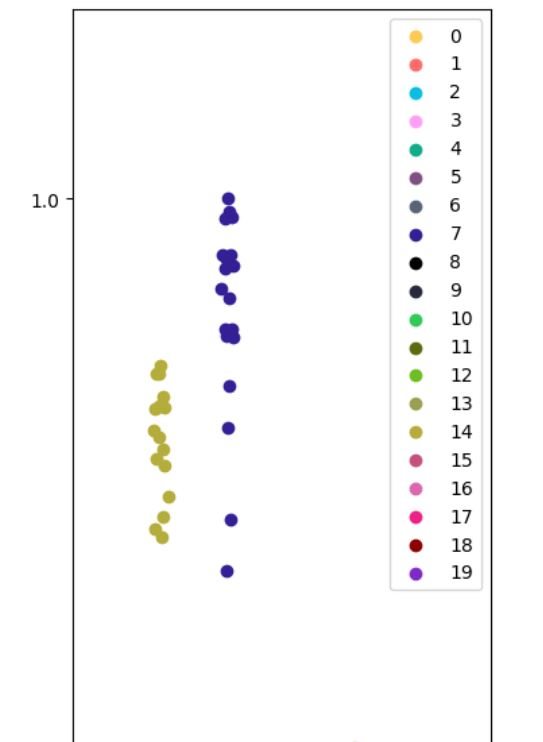

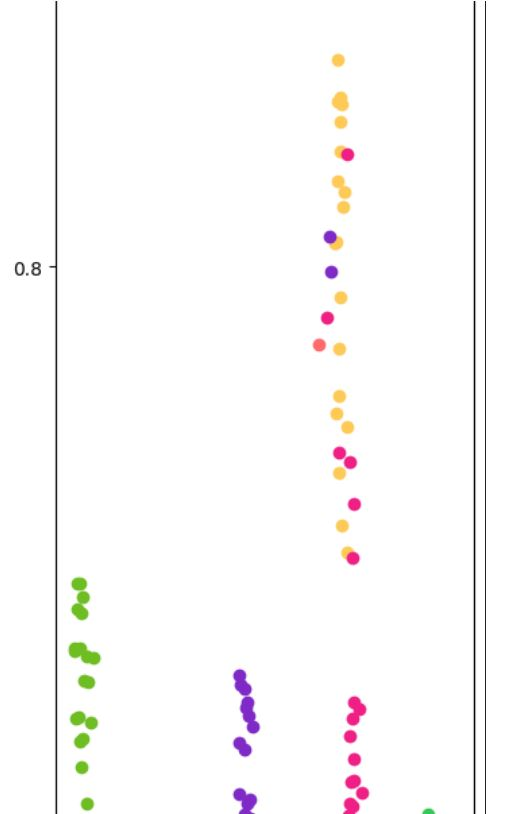

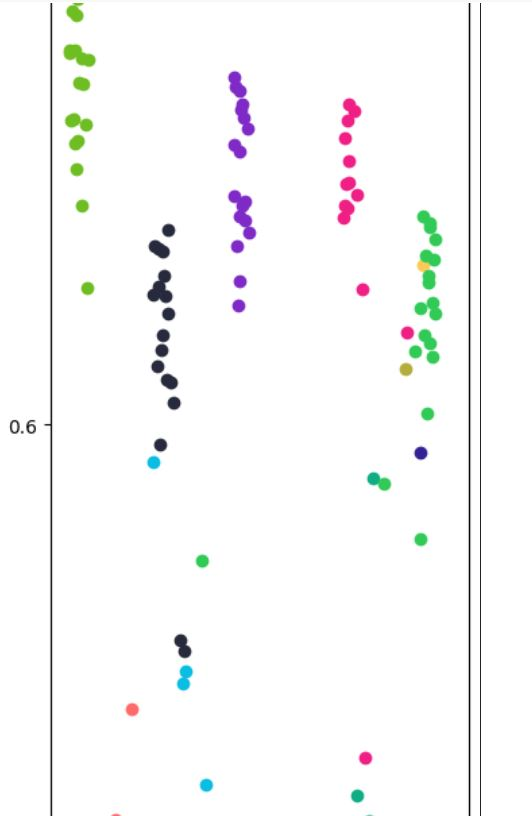

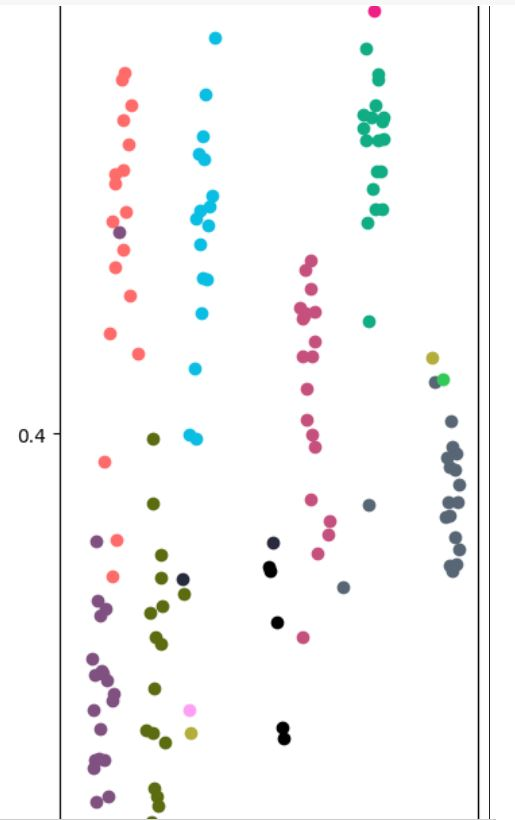

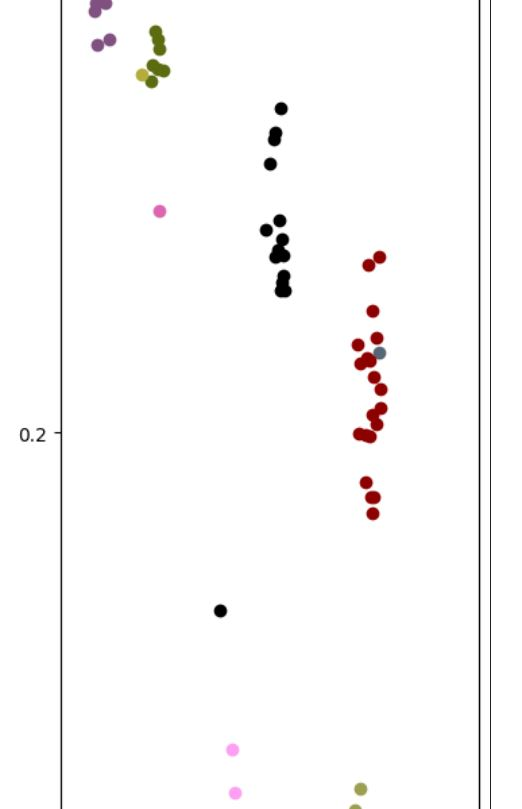

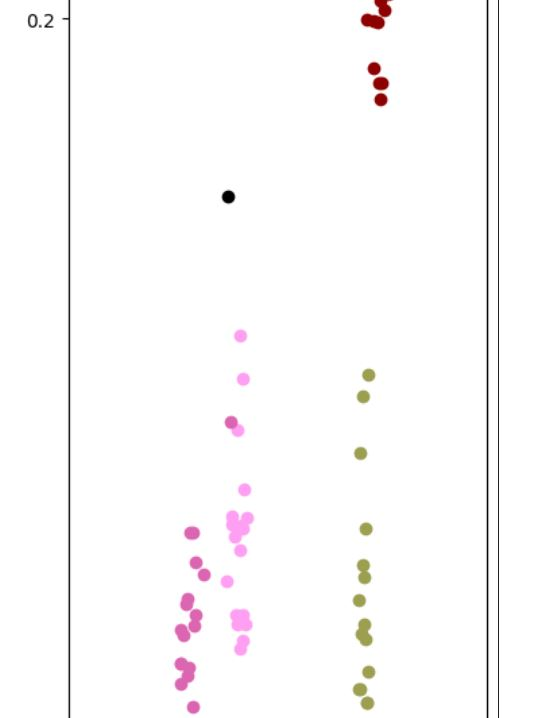

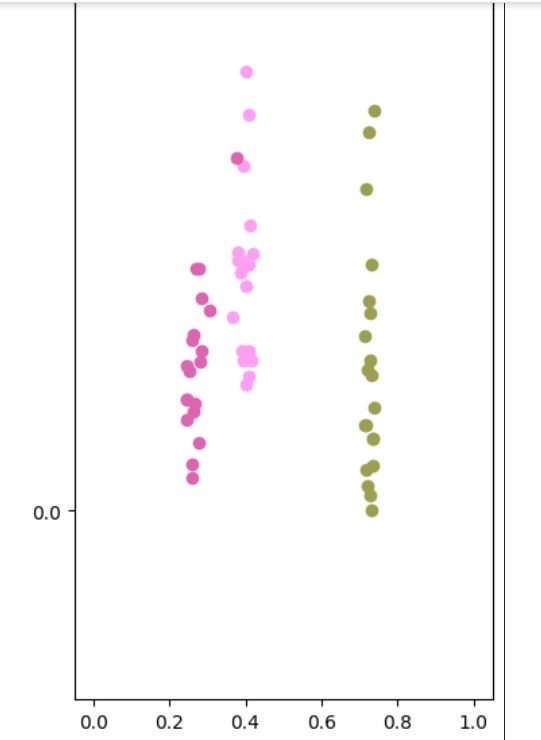

###### R -> P

In [ ]:
CHENG_BEST_REAL = ChengModel().to(
                    device=DEVICE, memory_format=torch.channels_last)
if(not(os.path.exists("../Material/CHENG_BEST_REAL.pt"))):
    CHENG_BEST_REAL, _, __ = domain_adaptation(
          model="cheng",
          optimizer="nadam",
          optimizer_params = [0.5318330865086823, 0.972314731793811, 7.58742552859644e-07, 0.019467161096021354],
          lr = 0.00033582372793957484,
          wd = 0.0004903049898644513,
          batch_size=16, 
          epochs_da=10,
          data="all_real",
          save_name = "CHENG_BEST_REAL.pt"
          )
    
else:
    with open("../Material/CHENG_BEST_REAL.pt", 'rb') as f:
        CHENG_BEST_REAL.load_state_dict(
            torch.load("../Material/CHENG_BEST_REAL.pt", map_location = DEVICE)) 

**Train and gain**

In [ ]:
if ALL_CODE:
    loss_to, acc_to  = TO_RESULTS_REAL
    loss_so, acc_so, cl_matr = NO_RESULTS_REAL
    train_loader_source, test_loader_source, train_loader_target, test_loader_target  = get_data(
            batch_size = 16, 
            data = "all_real", shuffle = False, 
            )
    progress_bar = tqdm(total = len(test_loader_target))
    progress_bar.set_description("after training da")
    test_accuracy, coverage, gain_cl_matrix = test(
                CHENG_BEST_REAL, test_loader_target, 
                get_cost_function(), 
                all_metrics = True, bar = progress_bar, da = True, 
                acc_so = acc_so, acc_to = acc_to, 
                cl_matr =cl_matr)
    print("\t Test accuracy {:.2f}".format(test_accuracy))
    print("\t Gain {:.2f}".format(test_accuracy - acc_so))
    print("\t Coverage {:.2f}".format(coverage))
    print("-----------------------------------------------------")
    gain_cl_matrix.print()



```
Test accuracy 94.50
	 Gain 1.50
	 Coverage 50.31
-----------------------------------------------------
ACCURACY
0.9945
overall
0.0015000000000000568
per class
[0.0, -0.0050000000000000044, 0.007499999999999951, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0024999999999999467, 0.010000000000000009, -0.0025000000000000577, -0.0050000000000000044, 0.0, 0.0024999999999999467, 0.0050000000000000044, 0.0, 0.007499999999999951, 0.0024999999999999467, -0.0024999999999999467, 0.007499999999999951]


PRECISION
overall
0.015000000000000013
per class
[0.25, 0.04999999999999993, 0.09999999999999998, 0.0, -0.09999999999999998, -0.09999999999999998, 0.0, -0.050000000000000044, 0.050000000000000044, 0.15000000000000002, 0.04999999999999993, -0.04999999999999993, 0.0, 0.0, 0.050000000000000044, 0.09999999999999998, 0.0, -0.25, -0.050000000000000044, 0.09999999999999998]


RECALL
overall
0.01900960175115507
per class
[-0.14161220043572986, -0.12128146453089239, 0.05882352941176472, 0.0, 0.09090909090909094, 0.08080808080808077, 0.0, 0.04761904761904767, 0.0, 0.05909090909090908, -0.08373205741626788, -0.052631578947368474, 0.0, 0.04761904761904767, 0.050000000000000044, -0.09090909090909094, 0.1428571428571429, 0.24, 0.0, 0.052631578947368474]


F1
overall
0.015231327470954126
per class
[0.040253018976423194, -0.03935599284436497, 0.08250355618776661, 0.0, -0.005012531328320802, -0.010025062656641603, 0.0, -0.001250781738586615, 0.02564102564102566, 0.10238095238095235, -0.01831501831501836, -0.05128205128205121, 0.0, 0.024390243902439046, 0.050000000000000044, 0.005012531328320802, 0.06931964056482665, -0.0209150326797386, -0.02564102564102566, 0.07692307692307687]


F1 NEGATIVO
overall
0.06723054573508414
per class
[-0.00012183681177435624, -0.0026628384747177103, 0.003928408031564912, 0.0, 1.385051143021343e-05, 2.7701022860315838e-05, 0.0, 3.4626098729395594e-06, 0.0013140604467806183, 0.005256214414664617, -0.001334863514539597, -0.0026281208935610145, 0.0, 0.0013175230566535578, 0.0026315789473684292, -1.385051143021343e-05, 0.003962943367256999, 0.0014386250064841732, -0.0013140604467806183, 0.003942181340341633]


GEOMETRIC MEAN
overall
0.0057797627112481376
per class
[0.014866881022092437, -0.01524959053245789, 0.03134159517191604, 0.0, -0.0017910817740933727, -0.0036317008169446385, 0.0, -0.0004439258955235559, 0.009562390760657458, 0.039089991383970624, -0.007110386098742039, -0.019322783923590325, 0.0, 0.009118464865133902, 0.01873213252437389, 0.0017910817740933727, 0.02652711098032179, -0.007207709139833707, -0.009562390760657458, 0.028885174684247783]
________________________________________________________________________
MARKEDNESS
overall
0.015789473684210464
per class
[0.23684210526315796, 0.042105263157894646, 0.10263157894736841, 0.0, -0.09473684210526323, -0.09473684210526323, 0.0, -0.047368421052631726, 0.050000000000000044, 0.15263157894736845, 0.044736842105263186, -0.05263157894736836, 0.0, 0.002631578947368318, 0.052631578947368585, 0.09473684210526323, 0.007894736842105177, -0.23421052631578942, -0.050000000000000044, 0.10263157894736841]


UPM
overall
0.008567158479114156
per class
[0.023765255544020647, -0.022825713133806103, 0.04702153150349975, 0.0, -0.002623426225777603, -0.005515320227574172, 0.0, -0.000638810541531587, 0.013627514600908497, 0.05878093642406057, -0.0105675933612428, -0.02819277403282161, 0.0, 0.01298870405937691, 0.026891891891891895, 0.002623426225777603, 0.039554070127244434, -0.011739297304564467, -0.013627514600908497, 0.04182028863373011]


COHEN K
overall
0.015789473684210575
per class
[0.04808829031061179, -0.03992905222158816, 0.0847229601152445, 0.0, -0.004753592214026048, -0.009771901591588583, 0.0, -0.0012156608036756333, 0.026600512800736054, 0.10884490383073031, -0.018836194431508635, -0.05392794942932211, 0.0, 0.02538485199706042, 0.052631578947368474, 0.004753592214026048, 0.07444318381682447, -0.011003386203984, -0.026600512800736054, 0.08052846223005816]


FM
overall
0.012552885018477289
per class
[0.04173565894694997, -0.02648019441726346, 0.05886841470926196, 0.0, -0.0032936842064927863, -0.007144417353508681, 0.0, -0.0008522576346496891, 0.017789557996201077, 0.07785807837498515, -0.012466148432596302, -0.0372446854301145, 0.0, 0.01693730036155139, 0.03580868716407304, 0.0032936842064927863, 0.05283222267621701, -0.003829202021672362, -0.017789557996201077, 0.05503424342631558]


MATHEW
overall
0.048269987647824086
per class
[0.000301956836050693, -0.11508386734269682, 0.2157266607288169, 0.0, 0.0, -1.0368613142242022e-05, 0.0, 0.0, -0.666110183639399, 0.25183135269531787, -0.067113413217465, -0.2679858618744146, 0.0, -0.666110183639399, -0.4987121475809258, 0.0, 0.2157722578548314, 0.028135723979012206, 0.666110183639399, -0.3981243217649844]


```



**T-sne**

In [ ]:
if ALL_CODE:
    T_sne(CHENG_BEST_REAL, data = "product")

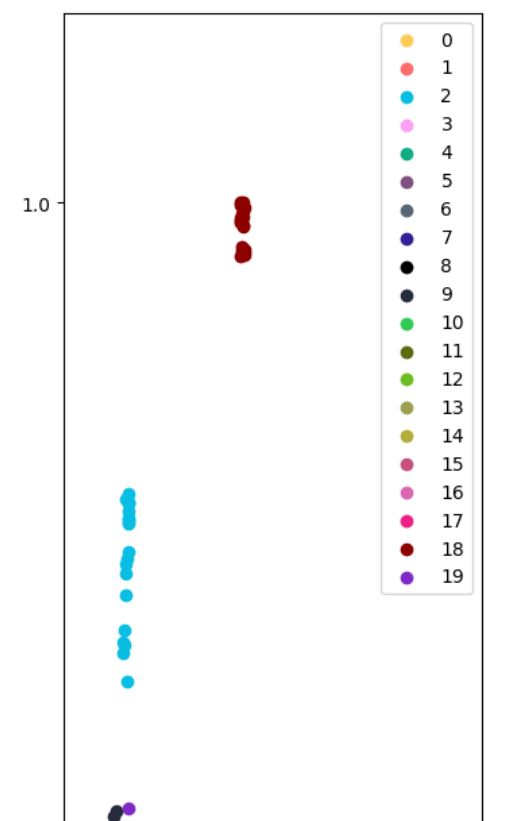

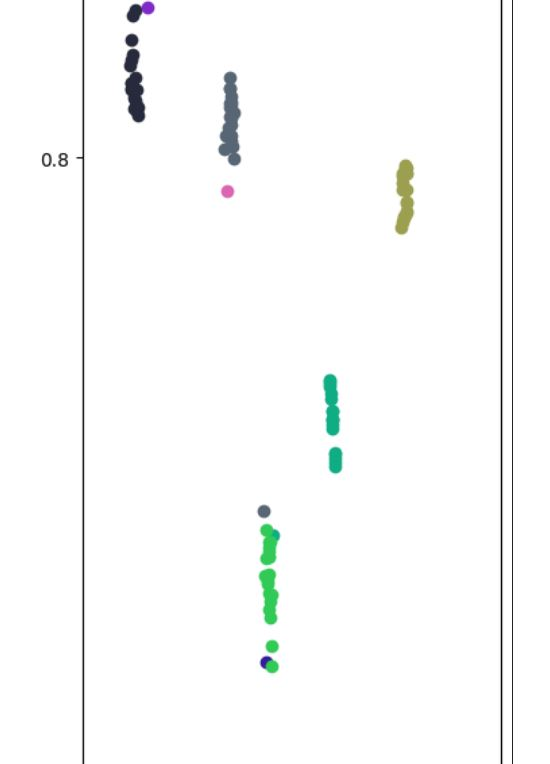

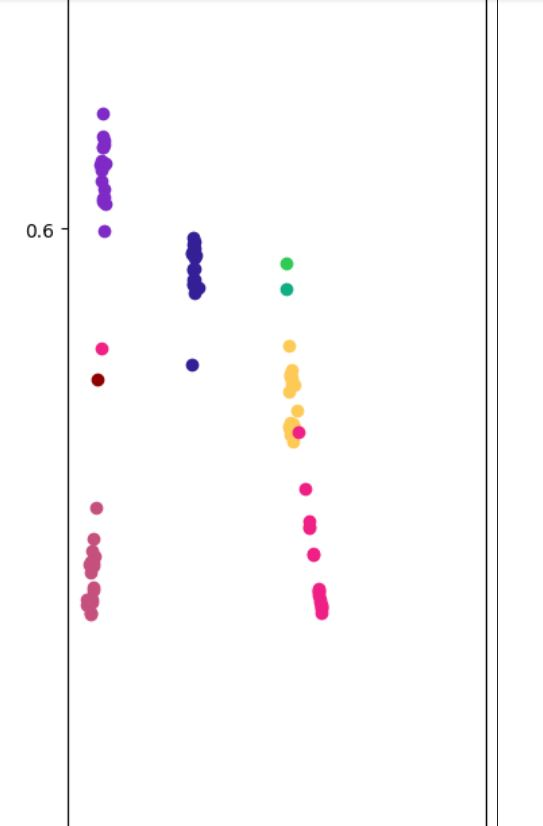

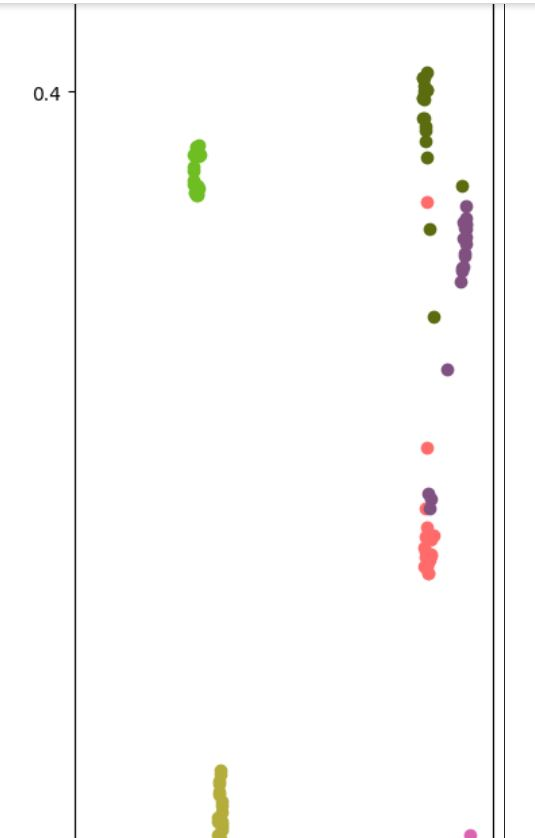

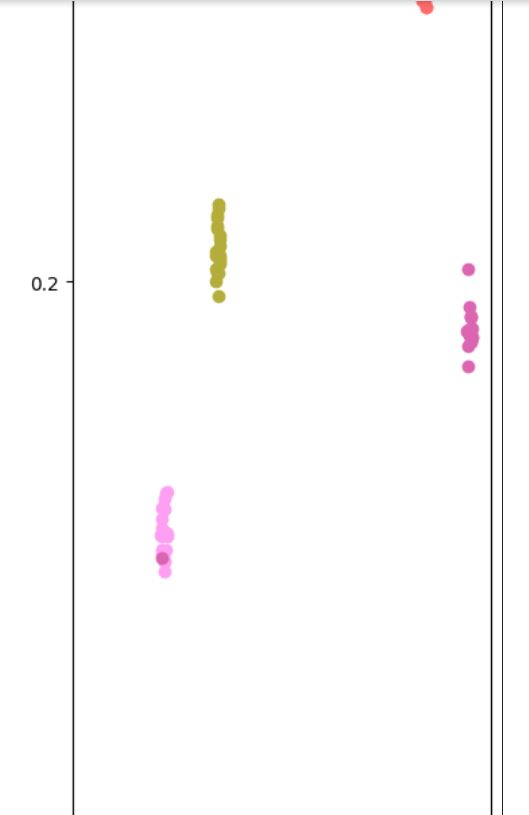

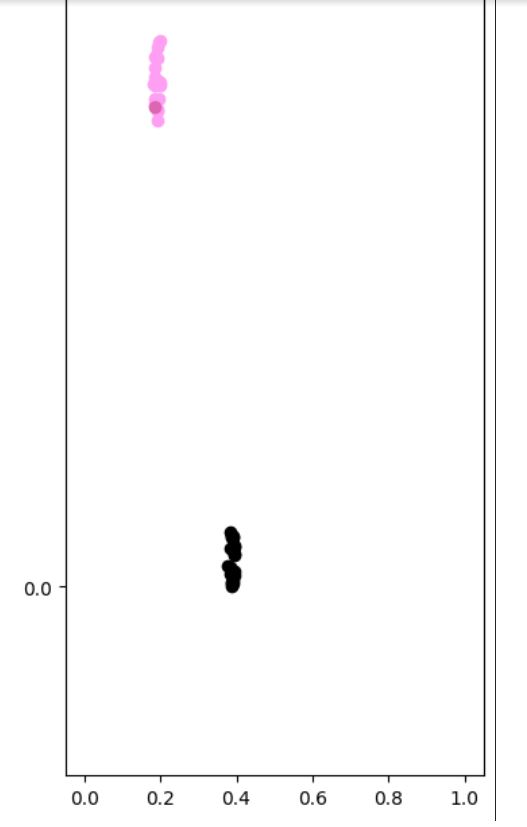

####**12.5 [27] Cluster Alignment with a Teacher for Unsupervised Domain Adaptation, Deng, Z., Luo, Y., Zhu, J., 2019**



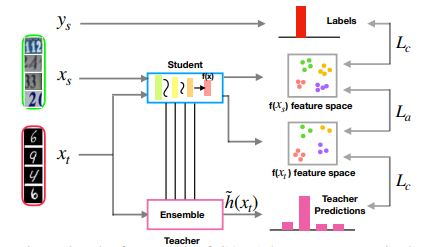

*net architecture of Deng et al, picture from  [Cluster Alignment with a Teacher for Unsupervised Domain Adaptation, Deng, Z., Luo, Y., Zhu, J., 2019]*

This method minimizes supervised classifier loss over labeled source, employing it as teacher classifier, given teacher student paradygm is not sensible to  false pseudolabel. This because pseudolabels  outputted from classifier if wrong risk to amplify error. instead in this case if classifier over target improves, it improves  teacher which improves La and Lc which improves classifications over target domain

in respect of previous teacher student approaches it employ class conditional structures in allignment and classification procedures. when classes have different features, marginal distro of labels given features have different multimodal distributions . This imply method that allineate marginal features do not take into account modality geometric differences between different classes in the domain, which increase error upper bound 

Class conditional structure exploitation in feature space is exploited making use of two loss component
- discriminative clustering loss, Lc

  tries making feature distribution of same classes near together while making farther different classes feature distribution
- cluster based allignment loss, La

  alligns classes with same labels in the two domains 

pseudolabels of classifier pretrained over source are employed in Lc and La 

Note:

given the fact here is done temporal ensemble shuffling is  not employed for this net

Parameter are in order
- m, or margin of loss employed 
- alfa, or accumulation decay constant 


In [ ]:
DA_STD_PARAMS["deng"] = [3, 0.01]

##### optimization

class form optimization

In [ ]:
class ParamsOptimizerDeng():
    def __init__(
        self, save_name: str = "TEMPORANEOUS_NET.pt",  
        data: str = "all_product",
        N_train: int = 1000, N_valid: int = 500) -> None:

        self.model: str = "deng"
        self.data: str = data
        self.N_train: int = N_train
        self.N_valid: int = N_valid
        self.save_name: str = save_name

    '''
    Class to handle optimization of Deng domain adaptation via reverse validation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        model: str 
            -- name of model want to be optimize

        data: str 
            -- if product or real data are to be optimized

        N_train: int 
            -- number of train data set

        N_valid:int
            -- number of data validation set

        save_name: str 
            -- name where save temporary net results
        

    Public Methods:
    ----------
        compute(
        self,  config: Configuration, 
        seed: int = RANDOM_SEED, budget: int = 10) -> float
            -- compute current incumbent value

        configspace(self) -> ConfigurationSpace
            -- retrieve current configuration space

        
    
    '''
    #repeatedly called during the optimization and evaluates a given configuration yielding the associated loss.
    def compute(
        self,  config: Configuration, seed: int = RANDOM_SEED, 
        budget: int = 1) -> float:
        """
        compute current incumbent value
        ...

        Keyword Arguments:
        ----------

          config: Configuration
              -- incumbent sampled config
          
          seed: int
               -- random seed for optimizer
          
          budget: int
                -- number epoch allowed to be evaluated

        Returns
        ----------
          value of 1-accuracy to be minimized

        """
        
        net_da, _, __ = domain_adaptation(
          model="deng",
          optimizer="SGD"if self.data=="all_product" else "nadam",
          optimizer_params = [0.669001748815815, 1] if self.data=="all_product" else [0.5318330865086823, 0.972314731793811, 7.58742552859644e-07, 0.019467161096021354],
          lr = 0.00878248760630914 if self.data=="all_product" else  0.00033582372793957484,
          wd = 1.1559820780617287e-05 if self.data=="all_product" else 0.0004903049898644513,
          batch_size=16, 
          epochs_da=int(np.ceil(budget / 2)),
          data=self.data,
          da_params = [config["margin"], config["alfa"]],
          save_name = self.save_name,
          N_train = self.N_train,
          N_valid = self.N_valid
          )
        cost_function = get_cost_function(
            label_smoothing = None)
        optimizer = get_optimizer(
          net_da, optimizer = "SGD"if self.data=="all_product" else "nadam", 
          lr = 0.00878248760630914 if self.data=="all_product" else  0.00033582372793957484, 
          wd = 1.1559820780617287e-05 if self.data=="all_product" else 0.0004903049898644513,
          momentum = 0.669001748815815, nesterov = 1, 
          betas = (0.5318330865086823, 0.972314731793811), eps = 7.58742552859644e-07, 
          momentum_decay = 0.019467161096021354
          )
        rescore = revalidation(
            "product" if self.data=="all_product" else "real",
            net_da,
            optimizer, 
            int(np.ceil(budget / 2)),
            cost_function,
            da= True
            )
        return  rescore

    @property
    def configspace(self) -> ConfigurationSpace:
        """
        configuration space definition
        ...

        Keyword Arguments:
        ----------
            None

        Returns
        ----------
          configuration space

        """
        # Build Configuration Space which defines all parameters and their ranges.  
        cs = ConfigurationSpace()
        margin = CSH.UniformIntegerHyperparameter(
            "margin",
            lower= 1,
            upper= 30,
            default_value=3
        )
        alfa = CSH.UniformFloatHyperparameter(
            "alfa",
            lower= 0.001,
            upper= 0.7,
            default_value=0.6
        )
        # Add all hyperparameters at once:
        cs.add_hyperparameters([margin, alfa])
        return cs

###### P -> R

In [ ]:
if ALL_CODE:
    optimize_net(ParamsOptimizerDeng, data="all_product")

###### R -> P

In [ ]:
if ALL_CODE:
    optimize_net(ParamsOptimizerDeng, data="all_real")

##### results

###### P -> R

In [ ]:
DENG_BEST_PRODUCT=DengModel(alfa = DA_STD_PARAMS["deng"][1], num_batch = 25, 
                 batch_size = 16).to(
                    device=DEVICE, memory_format=torch.channels_last)
if(not(os.path.exists("../Material/DENG_BEST_PRODUCT.pt"))):
    DENG_BEST_PRODUCT, _, __ = domain_adaptation(
          model="deng",
          optimizer="SGD",
          optimizer_params = [0.669001748815815, 1],
          lr = 0.00878248760630914,
          wd = 1.1559820780617287e-05,
          batch_size=16, 
          epochs_da=10,
          data="all_product",
          save_name = "DENG_BEST_PRODUCT.pt "
          )
    
else:
    with open("../Material/DENG_BEST_PRODUCT.pt", 'rb') as f:
        DENG_BEST_PRODUCT.load_state_dict(
            torch.load("../Material/DENG_BEST_PRODUCT.pt", map_location = DEVICE)) 

Downloading: "https://download.pytorch.org/models/convnext_base-6075fbad.pth" to /root/.cache/torch/hub/checkpoints/convnext_base-6075fbad.pth

  0%|          | 0.00/338M [00:00<?, ?B/s]
  2%|▏         | 5.34M/338M [00:00<00:06, 55.8MB/s]
  4%|▎         | 12.2M/338M [00:00<00:05, 65.0MB/s]
  5%|▌         | 18.4M/338M [00:00<00:05, 57.5MB/s]
  7%|▋         | 25.4M/338M [00:00<00:05, 63.0MB/s]
 10%|▉         | 32.1M/338M [00:00<00:04, 64.7MB/s]
 11%|█▏        | 38.4M/338M [00:00<00:04, 63.9MB/s]
 13%|█▎        | 45.5M/338M [00:00<00:04, 67.2MB/s]
 15%|█▌        | 51.9M/338M [00:00<00:04, 66.5MB/s]
 17%|█▋        | 58.3M/338M [00:00<00:04, 63.5MB/s]
 19%|█▉        | 65.7M/338M [00:01<00:04, 67.4MB/s]
 21%|██▏       | 72.2M/338M [00:01<00:04, 65.7MB/s]
 23%|██▎       | 78.5M/338M [00:01<00:04, 64.6MB/s]
 25%|██▌       | 85.2M/338M [00:01<00:03, 66.4MB/s]
 27%|██▋       | 92.5M/338M [00:01<00:03, 69.0MB/s]
 30%|██▉       | 100M/338M [00:01<00:03, 71.9MB/s] 
 32%|███▏      | 107M/338M [00:01

**Test**

In [ ]:
if ALL_CODE:
    loss_to, acc_to  = TO_RESULTS_PROD
    loss_so, acc_so, cl_matr = NO_RESULTS_PROD
    train_loader_source, test_loader_source, train_loader_target, test_loader_target  = get_data(
            batch_size = 16, 
            data = "all_product", shuffle = False, 
            )
    progress_bar = tqdm(total = len(test_loader_target))
    progress_bar.set_description("after training da")
    test_accuracy, coverage, gain_cl_matrix = test(
                DENG_BEST_PRODUCT, test_loader_target, 
                get_cost_function(), 
                all_metrics = True, bar = progress_bar, da = True, 
                acc_so = acc_so, acc_to = acc_to, 
                cl_matr =cl_matr)
    print("\t Test accuracy {:.2f}".format(test_accuracy))
    print("\t Gain {:.2f}".format(test_accuracy - acc_so))
    print("\t Coverage {:.2f}".format(coverage))
    print("-----------------------------------------------------")
    gain_cl_matrix.print()



```
Test accuracy 88.50
	 Gain -4.50
	 Coverage -113.92
-----------------------------------------------------
ACCURACY
0.9885
overall
-0.0044999999999999485
per class
[-0.010000000000000009, -0.0050000000000000044, 0.007499999999999951, -0.010000000000000009, 0.0025000000000000577, -0.0024999999999999467, -0.0024999999999999467, 0.0, -0.0025000000000000577, 0.0050000000000000044, -0.007500000000000062, -0.020000000000000018, -0.0050000000000000044, -0.0025000000000000577, -0.015000000000000013, -0.007499999999999951, -0.0050000000000000044, -0.007500000000000062, -0.0024999999999999467, 0.0]


PRECISION
overall
-0.04499999999999993
per class
[0.050000000000000044, 0.0, 0.1499999999999999, 0.0, 0.0, -0.09999999999999998, 0.0, -0.050000000000000044, -0.04999999999999993, 0.050000000000000044, 0.0, -0.04999999999999993, -0.050000000000000044, -0.09999999999999998, -0.35, 0.09999999999999998, -0.15000000000000002, -0.3999999999999999, 0.0, 0.04999999999999993]


RECALL
overall
-0.03818143242318772
per class
[-0.1867007672634271, -0.09022556390977443, 0.008823529411764675, -0.15238095238095228, 0.04329004329004327, 0.031100478468899517, -0.04523809523809519, 0.04761904761904767, 0.0, 0.050000000000000044, -0.1291866028708133, -0.28, -0.050000000000000044, 0.04761904761904767, 0.050000000000000044, -0.19999999999999996, 0.025210084033613467, 0.15666666666666662, -0.04761904761904767, -0.04260651629072676]


F1
overall
-0.04731115776371697
per class
[-0.06662476429918296, -0.04502814258911825, 0.08513513513513504, -0.08672086720867211, 0.023228803716608626, -0.03296703296703296, -0.023170731707316983, -0.001250781738586615, -0.026990553306342813, 0.050000000000000044, -0.06593406593406603, -0.1743589743589743, -0.050000000000000044, -0.028241335044929428, -0.19999999999999996, -0.05847953216374269, -0.06723796967699402, -0.15694444444444444, -0.024390243902439046, 0.0037523452157598447]


F1 NEGATIVO
overall
0.0640765013600273
per class
[-0.005356731666525394, -0.0026454339429258233, 0.0039215010002069395, -0.005304993499637867, 0.0013209993707871126, -0.0012932573790215285, -0.0013209902225919112, 3.4626098729395594e-06, -0.0013106114692298387, 0.0026315789473685403, -0.0039733859419802675, -0.01060646935454379, -0.0026315789473684292, -0.0013071488593568992, -0.0077850877192983114, -0.0039978446402809675, -0.0025866966433379934, -0.003749310154525398, -0.0013175230566535578, -1.0387829618707656e-05]


GEOMETRIC MEAN
overall
-0.018231494374977952
per class
[-0.027087046020155325, -0.017314803982699578, 0.03228233033416772, -0.03313796540339098, 0.008763321047398298, -0.01248575493230275, -0.008803132938178804, -0.0004439258955235559, -0.010110476925968115, 0.019252618146778255, -0.02546542037907651, -0.06746028389345704, -0.01873213252437389, -0.01055440282149167, -0.07654878057002001, -0.022583562581899308, -0.02576304864043011, -0.06066886387549553, -0.009118464865133902, 0.0013499092216950892]
________________________________________________________________________
MARKEDNESS
overall
-0.047368421052631615
per class
[0.03684210526315801, -0.0052631578947368585, 0.1499999999999999, -0.010526315789473717, 0.0026315789473685403, -0.09736842105263177, -0.002631578947368318, -0.047368421052631726, -0.050000000000000044, 0.052631578947368585, -0.007894736842105399, -0.06842105263157872, -0.052631578947368585, -0.09736842105263177, -0.3473684210526313, 0.08684210526315805, -0.1473684210526316, -0.3868421052631579, -0.002631578947368318, 0.047368421052631504]


UPM
overall
-0.028205369858818052
per class
[-0.04382664315811802, -0.026004842723802768, 0.048400700841896294, -0.04877830141364892, 0.012658930945133928, -0.01896585188269606, -0.01291558830463857, -0.000638810541531587, -0.014643546629379944, 0.02942857142857147, -0.03848953607071337, -0.10222433725094338, -0.026891891891891895, -0.015282357170911531, -0.1198146949344554, -0.033495944242737385, -0.040349930574754445, -0.10129742797956143, -0.01298870405937691, 0.0020128084371996424]


COHEN K
overall
-0.047368421052631615
per class
[-0.07289045072771205, -0.04771814681216735, 0.08589480639327707, -0.0860918313643011, 0.02366498101431458, -0.035091754997813474, -0.024184151572274493, -0.0012156608036756333, -0.027202912424664993, 0.052631578947368474, -0.06915101808170043, -0.1796519910020803, -0.052631578947368474, -0.028418573228340627, -0.18079887692804175, -0.05767325813596047, -0.06714272116042364, -0.1418088047603906, -0.02538485199706042, 0.003712731710415196]


FM
overall
-0.03142961871757599
per class
[-0.05466709332688646, -0.03360666641397447, 0.05886841470926196, -0.05563547551166992, 0.015577702596028864, -0.025828299639638397, -0.01650843833802984, -0.0008522576346496891, -0.01801912916787196, 0.0378003054593441, -0.04838497268882502, -0.12363179824110859, -0.03580868716407304, -0.01887138680252165, -0.11349381114167034, -0.03676408870914827, -0.04793696847554196, -0.09660954142320533, -0.01693730036155139, 0.0027171179242126975]


MATHEW
overall
-0.034782351183941906
per class
[-0.069232140379754, -0.11514971245189604, 0.21569194114182294, -0.3829560617755997, 0.16736331647147923, -0.04804635861949075, -0.10058430352129172, 0.0, -0.16736331647147923, 0.08405793685483168, -0.15116742591666116, -0.48795868311916424, 0.4987121475809258, -0.16736331647147923, -0.30192499898654834, -0.21559274530412048, -0.06409084389593214, -0.056156164748529525, 0.666110183639399, 3.5222946496715757e-06]


```



**T-sne**

In [ ]:
if ALL_CODE:
    T_sne(DENG_BEST_PRODUCT, data = "real")

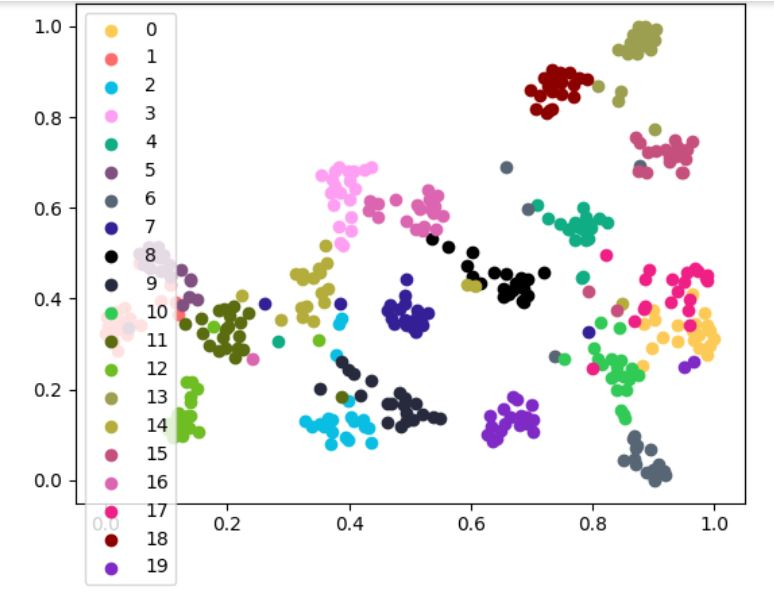

###### R -> P

In [ ]:
DENG_BEST_REAL = DengModel(alfa = DA_STD_PARAMS["deng"][1], num_batch = 25, 
                 batch_size = 16).to(
                    device=DEVICE, memory_format=torch.channels_last)
if(not(os.path.exists("../Material/DENG_BEST_REAL.pt"))):
    DENG_BEST_REAL, _, __ = domain_adaptation(
          model="deng",
          optimizer="nadam",
          optimizer_params = [0.5318330865086823, 0.972314731793811, 7.58742552859644e-07, 0.019467161096021354],
          lr = 0.00033582372793957484,
          wd = 0.0004903049898644513,
          batch_size=16, 
          epochs_da=10,
          data="all_real",
          save_name = "DENG_BEST_REAL.pt"
          )
    
else:
    with open("../Material/DENG_BEST_REAL.pt", 'rb') as f:
        DENG_BEST_REAL.load_state_dict(
            torch.load("../Material/DENG_BEST_REAL.pt", map_location = DEVICE)) 

**Train and gain**

In [ ]:
if ALL_CODE:
    loss_to, acc_to  = TO_RESULTS_REAL
    loss_so, acc_so, cl_matr = NO_RESULTS_REAL
    train_loader_source, test_loader_source, train_loader_target, test_loader_target  = get_data(
            batch_size = 16, 
            data = "all_real", shuffle = False, 
            )
    progress_bar = tqdm(total = len(test_loader_target))
    progress_bar.set_description("after training da")
    test_accuracy, coverage, gain_cl_matrix = test(
                DENG_BEST_PRODUCT, test_loader_target, 
                get_cost_function(), 
                all_metrics = True, bar = progress_bar, da = True, 
                acc_so = acc_so, acc_to = acc_to, 
                cl_matr =cl_matr)
    print("\t Test accuracy {:.2f}".format(test_accuracy))
    print("\t Gain {:.2f}".format(test_accuracy - acc_so))
    print("\t Coverage {:.2f}".format(coverage))
    print("-----------------------------------------------------")
    gain_cl_matrix.print()



```
Test accuracy 96.25
	 Gain 3.25
	 Coverage 49.96
-----------------------------------------------------
ACCURACY
0.9962500000000001
overall
0.003250000000000086
per class
[0.0050000000000000044, 0.0050000000000000044, 0.012499999999999956, 0.0024999999999999467, 0.0050000000000000044, 0.0050000000000000044, -0.0024999999999999467, 0.0, 0.0024999999999999467, 0.015000000000000013, 0.007499999999999951, -0.0025000000000000577, 0.0, 0.0024999999999999467, 0.0025000000000000577, -0.0024999999999999467, 0.0050000000000000044, 0.0, -0.0024999999999999467, 0.0050000000000000044]


PRECISION
overall
0.032500000000000084
per class
[0.19999999999999996, 0.09999999999999998, 0.19999999999999996, 0.0, 0.0, 0.0, 0.0, -0.050000000000000044, 0.050000000000000044, 0.15000000000000002, 0.09999999999999998, 0.0, 0.0, 0.0, 0.050000000000000044, 0.09999999999999998, 0.0, -0.29999999999999993, -0.050000000000000044, 0.09999999999999998]


RECALL
overall
0.03211388474674248
per class
[-0.05626598465473143, 0.005012531328320802, 0.05882352941176472, 0.04761904761904767, 0.09090909090909094, 0.08636363636363631, -0.04523809523809519, 0.04761904761904767, 0.0, 0.15000000000000002, 0.052631578947368474, -0.050000000000000044, 0.0, 0.04761904761904767, 0.0023809523809523725, -0.13043478260869568, 0.09022556390977443, 0.24, 0.0, 0.005012531328320802]


F1
overall
0.03149137597931517
per class
[0.0729101194217473, 0.052532833020637826, 0.1351351351351351, 0.024390243902439046, 0.04761904761904767, 0.04523809523809519, -0.023170731707316983, -0.001250781738586615, 0.02564102564102566, 0.15000000000000002, 0.07692307692307687, -0.024358974358974383, 0.0, 0.024390243902439046, 0.025609756097561, -0.017135862913096656, 0.04502814258911825, -0.0565656565656566, -0.02564102564102566, 0.052532833020637826]


F1 NEGATIVO
overall
0.06815543690144721
per class
[0.0025692921115461065, 0.002624658283688075, 0.006553079947575369, 0.0013175230566535578, 0.0026385224274406704, 0.0026454659075128006, -0.0013209902225919112, 3.4626098729395594e-06, 0.0013140604467806183, 0.007894736842105288, 0.003942181340341633, -0.001317518500587811, 0.0, 0.0013175230566535578, 0.0013140558907148714, -0.0013383399730251266, 0.0026454339429258233, 0.00014505642522255613, -0.0013140604467806183, 0.002624658283688075]


GEOMETRIC MEAN
overall
0.011925027019294099
per class
[0.027828262090671796, 0.01976670981911388, 0.05101446285854161, 0.009118464865133902, 0.0178817859125322, 0.01726342825861593, -0.008803132938178804, -0.0004439258955235559, 0.009562390760657458, 0.056971777296502824, 0.028885174684247783, -0.009169741763716432, 0.0, 0.009118464865133902, 0.009613667659239988, -0.006639564832293221, 0.017314803982699578, -0.020986806295950844, -0.009562390760657458, 0.01976670981911388]
________________________________________________________________________
MARKEDNESS
overall
0.03421052631578947
per class
[0.1947368421052631, 0.10000000000000009, 0.2026315789473685, 0.002631578947368318, 0.0052631578947368585, 0.005263157894736636, -0.002631578947368318, -0.047368421052631726, 0.050000000000000044, 0.1578947368421053, 0.10263157894736841, -0.0026315789473685403, 0.0, 0.002631578947368318, 0.050000000000000266, 0.09210526315789469, 0.0052631578947368585, -0.28421052631578947, -0.050000000000000044, 0.10000000000000009]


UPM
overall
0.01746313380820197
per class
[0.04352906016475111, 0.028831584574353197, 0.07529259273378819, 0.01298870405937691, 0.025647635004510838, 0.025495990103081012, -0.01291558830463857, -0.000638810541531587, 0.013627514600908497, 0.08442857142857141, 0.04182028863373011, -0.013264377290983398, 0.0, 0.01298870405937691, 0.013903187832514985, -0.00971815761440542, 0.026004842723802768, -0.03396313597661249, -0.013627514600908497, 0.028831584574353197]


COHEN K
overall
0.03421052631578947
per class
[0.07493181575100283, 0.05514361023299774, 0.13852638534064554, 0.02538485199706042, 0.049049833011375, 0.04673307771419832, -0.024184151572274493, -0.0012156608036756333, 0.026600512800736054, 0.1578947368421053, 0.08052846223005816, -0.02603106614663242, 0.0, 0.02538485199706042, 0.027246726950308053, -0.01738000040000698, 0.04771814681216735, -0.042234352433847544, -0.026600512800736054, 0.05514361023299774]


FM
overall
0.023614522044543618
per class
[0.05506344047225298, 0.03809694306476419, 0.094677101873335, 0.01693730036155139, 0.03251500295758025, 0.03169170469483884, -0.01650843833802984, -0.0008522576346496891, 0.017789557996201077, 0.1103730813325654, 0.05503424342631558, -0.01801912916787196, 0.0, 0.01693730036155139, 0.01887138680252165, -0.011084423598901383, 0.03360666641397447, -0.023146425195689213, -0.017789557996201077, 0.03809694306476419]


MATHEW
overall
0.09696960630291246
per class
[0.06415668900513136, 0.2679858618744146, -0.28302020643910286, -0.666110183639399, -0.49874686716791977, 0.1677012390334064, -0.10058430352129172, 0.0, -0.666110183639399, -0.24691551447260193, -0.3981243217649844, -0.1673980360584732, 0.0, -0.666110183639399, 0.1673980360584732, -0.100552283416666, 0.11514971245189604, 0.00014453280687409809, 0.666110183639399, 0.2679858618744146]

```



**T-sne**

In [ ]:
if ALL_CODE:
    T_sne(DENG_BEST_PRODUCT, data = "product")

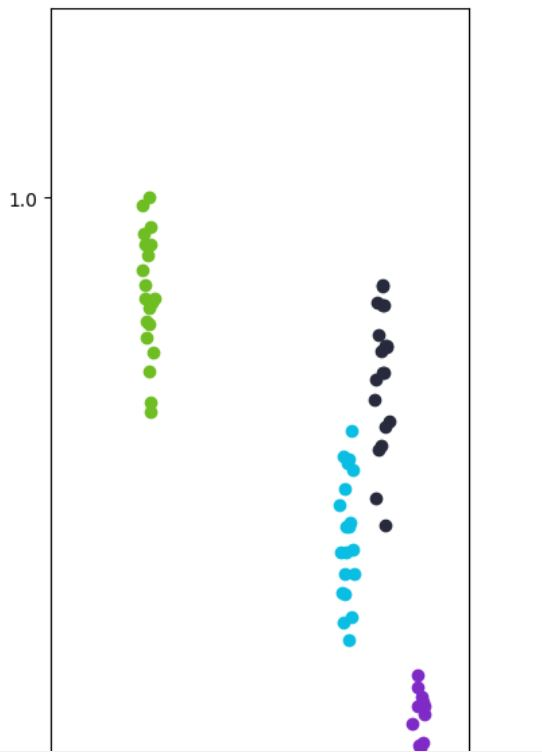

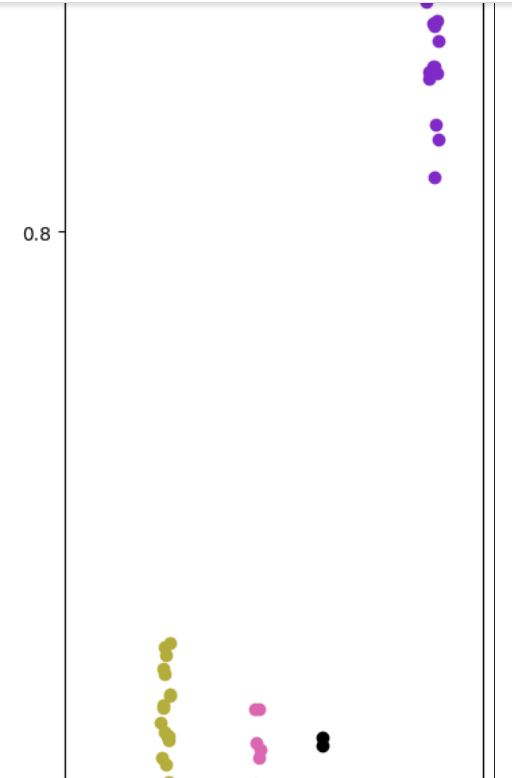

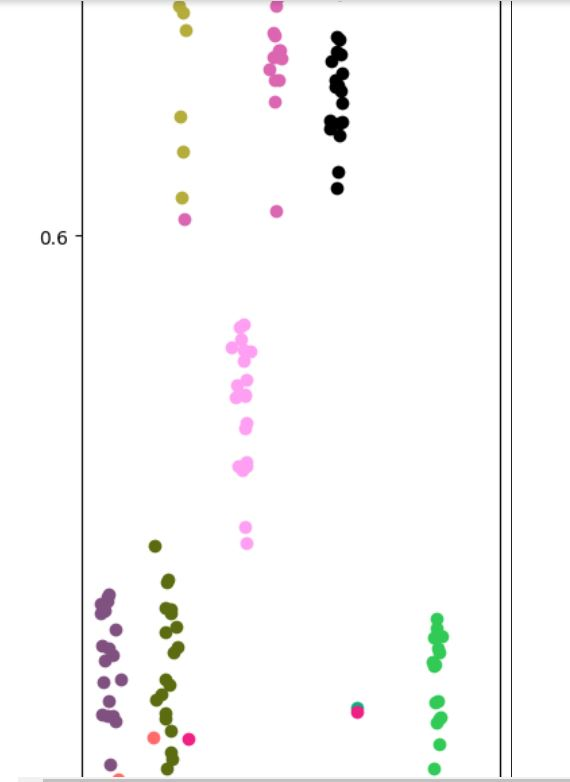

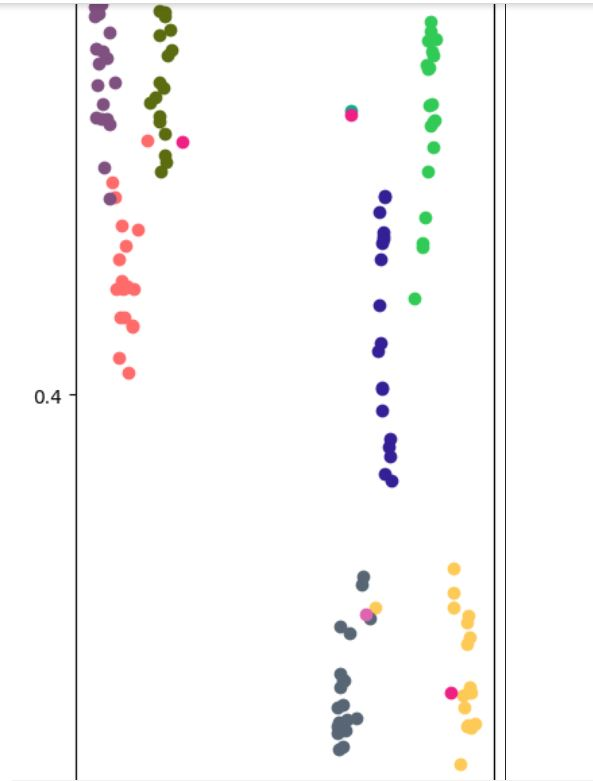

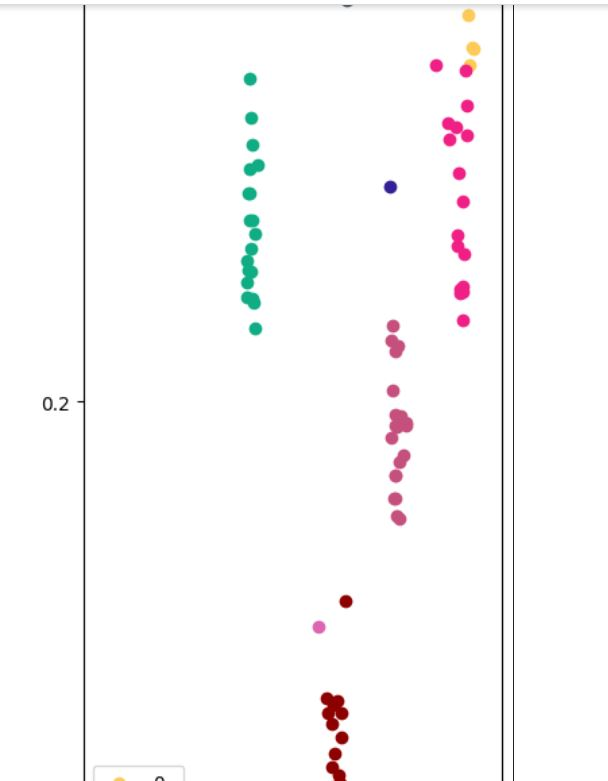

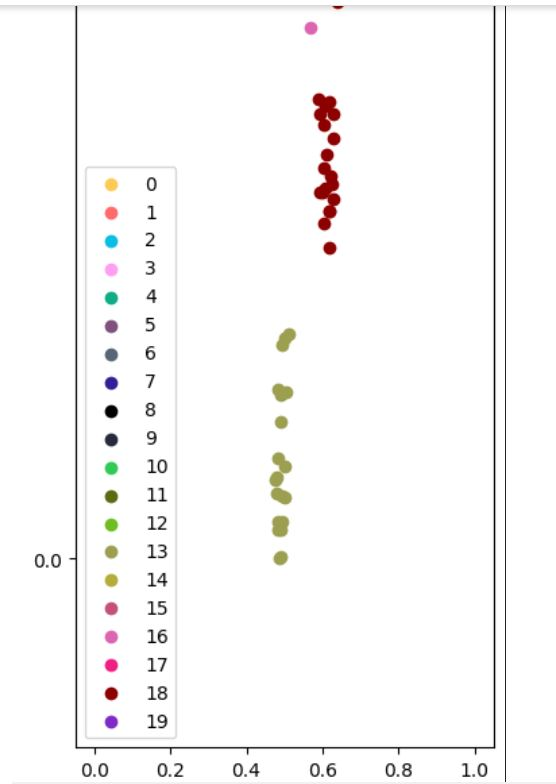

####**12.6 [97] Reliable Weighted Optimal Transport for Unsupervised Domain Adaptation, Xu, R., Liu, P., Wang, L., CHen, C., Wang, J., 2020**

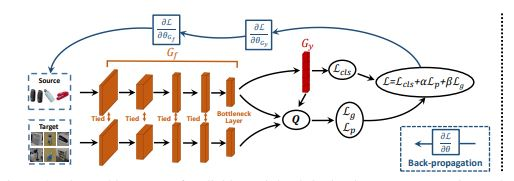

*net architecture from [97]*

Typical method of optimal transport not consider intra domain structure given they do only pairwise matching (treating images as a whole not considering moving probability mass of single features)

Consequently author propose RWOT . Given picture above
- $G_f$ is feature generator (resnet with unspecified weight tying strategy in original paper)
- $G_y$ is adaptive classifer (which is simple on layer net)
- Q is a matrix (calculated in loss computation) which allow to exploit spatial prototypical information 

Q is calculated as following:
spatial prototypical info (in deep featre space) is computed via this formula

$D(i, k)=\frac{e^{\left.-d\left(G_f\left(\boldsymbol{x}_i^t\right), \boldsymbol{c}_k^s\right)\right)}}{\sum_{m=1}^C e^{\left.-d\left(G_f\left(\boldsymbol{x}_i^t\right), \boldsymbol{c}_m^s\right)\right)}},$

note that in d, K represents multiple gaussian kernels (combined via beta parameters to improve transferability). sigma is instead mean pairwise distance. 

To quantify intra domain info of pseudoclassification target sample  (in feature space measured by Gy clasifier) sharpen probability matrix is employed:

$M(i, k)=P\left(y=k \mid \operatorname{Softmax}\left(\frac{G_y\left(G_f\left(\boldsymbol{x}_i^t\right)\right)}{\tau}\right)\right),$

to quantify reciprocal D and M importance SSR is defined having with Q matrix weighting uncertainty of a target sample i to belong to k

$Q(i, k)=\frac{d_{\mathcal{A}(k)} D(i, k)+\left(2-d_{\mathcal{A}(k)}\right) M(i, k)}{\sum_{m=1}^C\left(d_{\mathcal{A}(m)} D(i, m)+\left(2-d_{\mathcal{A}(m)}\right) M(i, m)\right)},$

Having D is more reliable than M use a-distance to adjust feature space

$d_{\mathcal{A}(k)}\left(\mathcal{D}_k^s, \mathcal{D}_k^t\right)=2\left(1-2 \epsilon\left(h_k\right)\right),$

wheree $h_k$ is the error of a-distance SVM classifier which discriminate between domains




**present work **version employ
- **more advanced convnext as feature extractor**
- **three fully connected plus dropout and batchnorm classifier** 

parameters are in order
- alfa,

  weight $L_p$ component of loss (as in figure)


- beta,

  weight $L_g$ component of loss (as in figure)

- v,

  margin used by SVM in a-distance of $L_p$ component loss

- tau,

  employed in M matrix optimal transport computation

- lamb,

  weight part of $L_p$ component of loss which account for distance from centroid borders of class features

In [ ]:
DA_STD_PARAMS["xu"] = [0.01, 0.1, 50, 0.5, 0.001]

##### optimization

class form optimization

In [352]:
class ParamsOptimizerXu():
    def __init__(
        self, save_name: str = "TEMPORANEOUS_NET.pt",  
        data: str = "all_product",
        N_train: int = 1000, N_valid: int = 500) -> None:

        self.model: str = "xu"
        self.data: str = data
        self.N_train: int = N_train
        self.N_valid: int = N_valid
        self.save_name: str = save_name

    '''
    Class to handle optimization of Xu domain adaptation via reverse validation
      
    .. .

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        model: str 
            -- name of model want to be optimize

        data: str 
            -- if product or real data are to be optimized

        N_train: int 
            -- number of train data set

        N_valid:int
            -- number of data validation set

        save_name: str 
            -- name where save temporary net results
        

    Public Methods:
    ----------
        compute(
        self,  config: Configuration, 
        seed: int = RANDOM_SEED, budget: int = 10) -> float
            -- compute current incumbent value

        configspace(self) -> ConfigurationSpace
            -- retrieve current configuration space

        
    
    '''
    #repeatedly called during the optimization and evaluates a given configuration yielding the associated loss.
    def compute(
        self,  config: Configuration, seed: int = RANDOM_SEED, 
        budget: int = 1) -> float:
        """
        compute current incumbent value
        ...

        Keyword Arguments:
        ----------

          config: Configuration
              -- incumbent sampled config
          
          seed: int
               -- random seed for optimizer
          
          budget: int
                -- number epoch allowed to be evaluated

        Returns
        ----------
          value of 1-accuracy to be minimized

        """
        
        net_da, _, __ = domain_adaptation(
          model="xu",
          optimizer="SGD"if self.data=="all_product" else "nadam",
          optimizer_params = [0.669001748815815, 1] if self.data=="all_product" else [0.5318330865086823, 0.972314731793811, 7.58742552859644e-07, 0.019467161096021354],
          lr = 0.00878248760630914 if self.data=="all_product" else  0.00033582372793957484,
          wd = 1.1559820780617287e-05 if self.data=="all_product" else 0.0004903049898644513,
          batch_size=16, 
          epochs_da=int(np.ceil(budget / 2)),
          data=self.data,
          da_params = [config["alfa"], config["beta"], config["v"], config["tau"], config["lamb"]],
          save_name = self.save_name,
          N_train = self.N_train,
          N_valid = self.N_valid
          )
        cost_function = get_cost_function(
            label_smoothing = None)
        optimizer = get_optimizer(
          net_da, optimizer = "SGD"if self.data=="all_product" else "nadam", 
          lr = 0.00878248760630914 if self.data=="all_product" else  0.00033582372793957484, 
          wd = 1.1559820780617287e-05 if self.data=="all_product" else 0.0004903049898644513,
          momentum = 0.669001748815815, nesterov = 1, 
          betas = (0.5318330865086823, 0.972314731793811), eps = 7.58742552859644e-07, 
          momentum_decay = 0.019467161096021354
          )
        rescore = revalidation(
            "product" if self.data=="all_product" else "real",
            net_da,
            optimizer, 
            int(np.ceil(budget / 2)),
            cost_function,
            da=True
            )
        return  rescore

    @property
    def configspace(self) -> ConfigurationSpace:
        """
        configuration space definition
        ...

        Keyword Arguments:
        ----------
            None

        Returns
        ----------
          configuration space

        """
        # Build Configuration Space which defines all parameters and their ranges.  
        cs = ConfigurationSpace()
        alfa = CSH.UniformFloatHyperparameter(
            "alfa",
            lower= 0.0001,
            upper= 1.0,
            default_value=0.1
        )
        beta = CSH.UniformFloatHyperparameter(
            "beta",
            lower= 0.0001,
            upper= 1.0,
            default_value=0.1
        )
        tau = CSH.UniformFloatHyperparameter(
            "tau",
            lower= 0.0001,
            upper= 1.0,
            default_value=0.5
        )
        v = CSH.UniformIntegerHyperparameter(
            "v",
            lower= 3,
            upper= 100,
            default_value=50
        )
        lamb = CSH.UniformFloatHyperparameter(
            "lamb",
            lower= 0.0001,
            upper= 1.0,
            default_value=0.01
        )
        # Add all hyperparameters at once:
        cs.add_hyperparameters([alfa, beta, tau, v, lamb])
        return cs

###### P -> R

In [ ]:
if ALL_CODE:
    optimize_net(ParamsOptimizerXu, data="all_product")

###### R -> P

In [ ]:
if ALL_CODE:
    optimize_net(ParamsOptimizerXu, data="all_real")

##### results

###### P -> R

In [ ]:
XU_BEST_PRODUCT=XuModel().to(
                    device=DEVICE, memory_format=torch.channels_last)
if(not(os.path.exists("../Material/XU_BEST_PRODUCT.pt"))):
    XU_BEST_PRODUCT, _, __ = domain_adaptation(
          model="xu",
          optimizer="SGD",
          optimizer_params = [0.669001748815815, 1],
          lr = 0.00878248760630914,
          wd = 1.1559820780617287e-05,
          batch_size=16, 
          epochs_da=10,
          data="all_product",
          save_name = "XU_BEST_PRODUCT.pt" 
          )
    
else:
    with open("../Material/XU_BEST_PRODUCT.pt", 'rb') as f:
        XU_BEST_PRODUCT.load_state_dict(
            torch.load("../Material/XU_BEST_PRODUCT.pt", map_location = DEVICE)) 

**Test**

In [ ]:
if ALL_CODE:
    loss_to, acc_to  = TO_RESULTS_PROD
    loss_so, acc_so, cl_matr = NO_RESULTS_PROD
    train_loader_source, test_loader_source, train_loader_target, test_loader_target  = get_data(
            batch_size = 16, 
            data = "all_product", shuffle = False, 
            )
    progress_bar = tqdm(total = len(test_loader_target))
    progress_bar.set_description("after training da")
    test_accuracy, coverage, gain_cl_matrix = test(
                XU_BEST_PRODUCT, test_loader_target, 
                get_cost_function(), 
                all_metrics = True, bar = progress_bar, da = True, 
                acc_so = acc_so, acc_to = acc_to, 
                cl_matr =cl_matr)
    print("\t Test accuracy {:.2f}".format(test_accuracy))
    print("\t Gain {:.2f}".format(test_accuracy - acc_so))
    print("\t Coverage {:.2f}".format(coverage))
    print("-----------------------------------------------------")
    gain_cl_matrix.print()

```
Test accuracy 5.00
	 Gain -88.00
	 Coverage -2183.81
-----------------------------------------------------
ACCURACY
0.9049999999999999
overall
-0.08800000000000008
per class
[-0.032500000000000084, -0.04250000000000009, -0.03750000000000009, -0.0475000000000001, -0.04500000000000004, -0.040000000000000036, -0.04500000000000004, -0.0475000000000001, -0.0475000000000001, -0.03500000000000003, -0.04250000000000009, -0.0475000000000001, -0.050000000000000044, -0.0475000000000001, -0.04500000000000004, -0.945, -0.03750000000000009, -0.032500000000000084, -0.050000000000000044, -0.04250000000000009]


PRECISION
overall
0.07000000000000006
per class
[-0.75, -0.9, -0.8, -1.0, -1.0, -0.95, -0.95, -1.0, -0.95, -0.85, -0.9, -0.95, -1.0, -1.0, -0.95, 0.09999999999999998, -0.9, -0.95, -1.0, -0.9]


RECALL
overall
-0.8831323830967793
per class
[-0.8823529411764706, -0.9473684210526315, -0.9411764705882353, -0.9523809523809523, -0.9090909090909091, -0.8636363636363636, -0.95, -0.9523809523809523, -1.0, -0.85, -0.9473684210526315, -1.0, -1.0, -0.9523809523809523, -0.95, -0.95, -0.8571428571428571, -0.76, -1.0, -0.9473684210526315]


F1
overall
-0.8346348130141455
per class
[-0.8108108108108109, -0.9230769230769231, -0.8648648648648649, -0.975609756097561, -0.9523809523809523, -0.9047619047619048, -0.95, -0.975609756097561, -0.9743589743589743, -0.85, -0.9230769230769231, -0.9743589743589743, -1.0, -0.975609756097561, -0.95, -0.8521303258145363, -0.8780487804878049, -0.8444444444444444, -1.0, -0.9230769230769231]


F1 NEGATIVO
overall
0.04448606610673356
per class
[-0.01646671371442021, -0.021698844300684028, -0.019087945693450292, -0.024323502584372103, -0.02300250321358499, -0.02036398078614443, -0.02300944669365723, -0.024323502584372103, -0.024326965194245043, -0.017746288798920373, -0.021698844300684028, -0.024326965194245043, -0.02564102564102566, -0.024323502584372103, -0.02300944669365723, -0.9973753280839895, -0.019053410357758205, -0.01636950246221769, -0.02564102564102566, -0.021698844300684028]


GEOMETRIC MEAN
overall
-0.43455043323110953
per class
[-0.35515430148006855, -0.39823215410319823, -0.3761028659289044, -0.4179988639223121, -0.4092355428749138, -0.3911217680044562, -0.4083851962630721, -0.4179988639223121, -0.41755493802678856, -0.3701455514909432, -0.39823215410319823, -0.41755493802678856, -0.427117328787446, -0.4179988639223121, -0.4083851962630721, -1.0859339947622857, -0.38091735012049865, -0.3675893097289743, -0.427117328787446, -0.39823215410319823]
________________________________________________________________________
MARKEDNESS
overall
-0.9263157894736842
per class
[-0.7447368421052631, -0.8973684210526316, -0.7973684210526315, -0.9973684210526317, -0.9947368421052631, -0.9421052631578948, -0.9473684210526314, -0.9973684210526317, -0.95, -0.8421052631578947, -0.8973684210526316, -0.95, -1.0, -0.9973684210526317, -0.9473684210526314, -0.8999999999999999, -0.8921052631578947, -0.9342105263157894, -1.0, -0.8973684210526316]


UPM
overall
-0.9612131244084462
per class
[-0.8918249380677127, -0.9581797113662699, -0.9247074072662118, -0.9870112959406231, -0.9743523649954892, -0.9476121180050271, -0.9731081081081081, -0.9870112959406231, -0.9863724853990915, -0.9155714285714286, -0.9581797113662699, -0.9863724853990915, -1.0, -0.9870112959406231, -0.9731081081081081, -0.9717289387697116, -0.9321748686424671, -0.9117562149157978, -1.0, -0.9581797113662699]


COHEN K
overall
-0.9263157894736842
per class
[-0.8046106697973509, -0.9194715377699418, -0.8614736146593545, -0.9746151480029396, -0.950950166988625, -0.9006353433384332, -0.9473684210526315, -0.9746151480029396, -0.973399487199264, -0.8421052631578947, -0.9194715377699418, -0.973399487199264, -1.0, -0.9746151480029396, -0.9473684210526315, -0.946196574774599, -0.8717533909577745, -0.8411354064179111, -1.0, -0.9194715377699418]


FM
overall
-0.3397310830602538
per class
[-1.2776356840572631, -1.3591793189467796, -1.3195364604997601, -1.3972762620115438, -1.381698559415515, -1.3467131705141833, -1.378404875209022, -1.3972762620115438, -1.396424004376894, -1.3038404810405297, -1.3591793189467796, -1.396424004376894, -1.4142135623730951, -1.3972762620115438, -1.378404875209022, -0.3537097986130622, -1.325572652532805, -1.307669683062202, -1.4142135623730951, -1.3591793189467796]


MATHEW
overall
-0.40508440533127205
per class
[-0.21888376541715623, -0.3981243217649844, -0.28302020643910286, -0.666110183639399, -0.49874686716791977, -0.3310109085475194, -0.4987121475809258, -0.666110183639399, -0.666110183639399, -0.24691551447260193, -0.3981243217649844, -0.666110183639399, 0.0, -0.666110183639399, -0.4987121475809258, -0.49874686716791977, -0.2829746093130884, -0.21904118944633283, 0.0, -0.3981243217649844]

```



In [ ]:
if ALL_CODE:
    T_sne(XU_BEST_PRODUCT, data = "real")

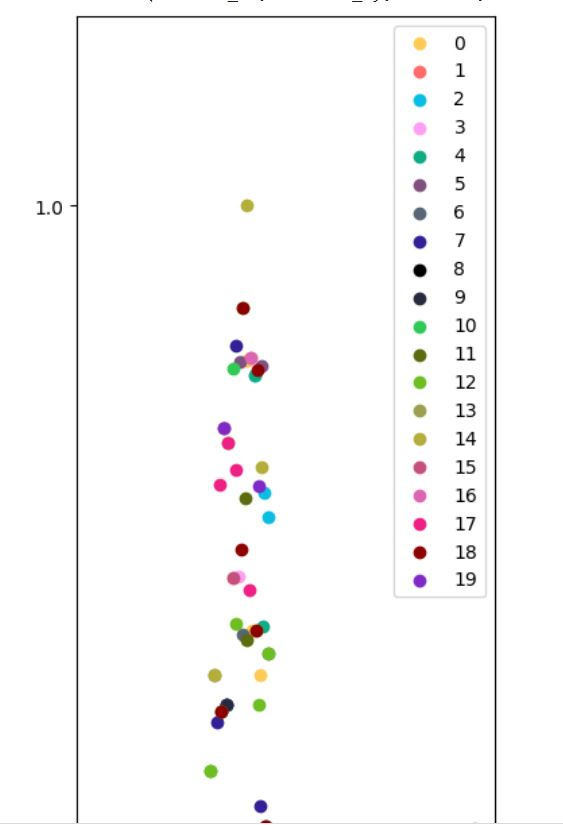

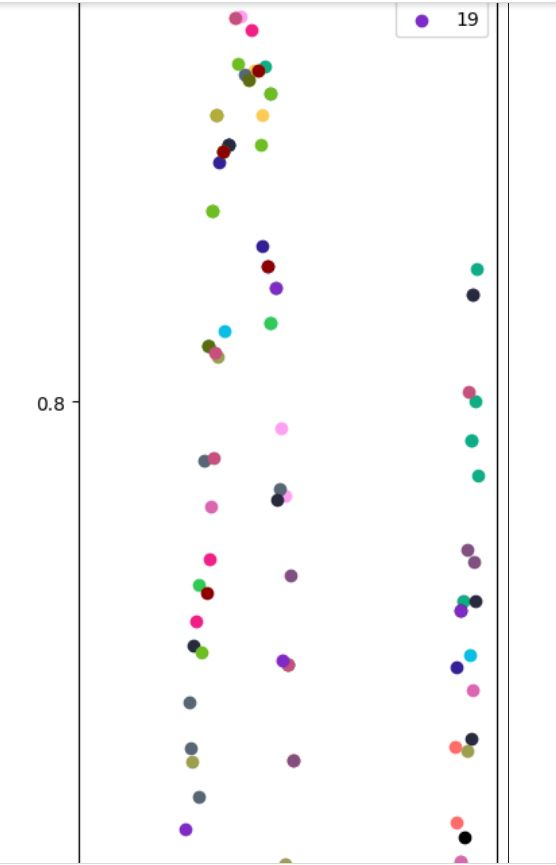

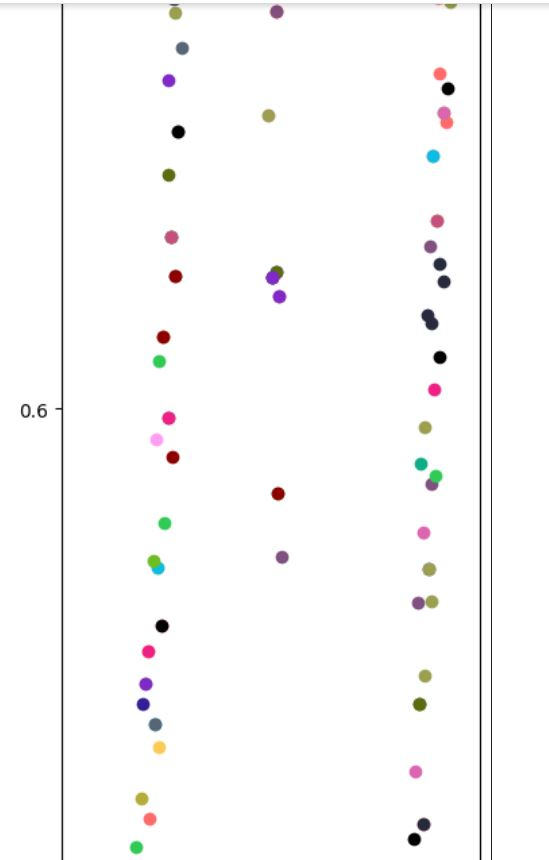

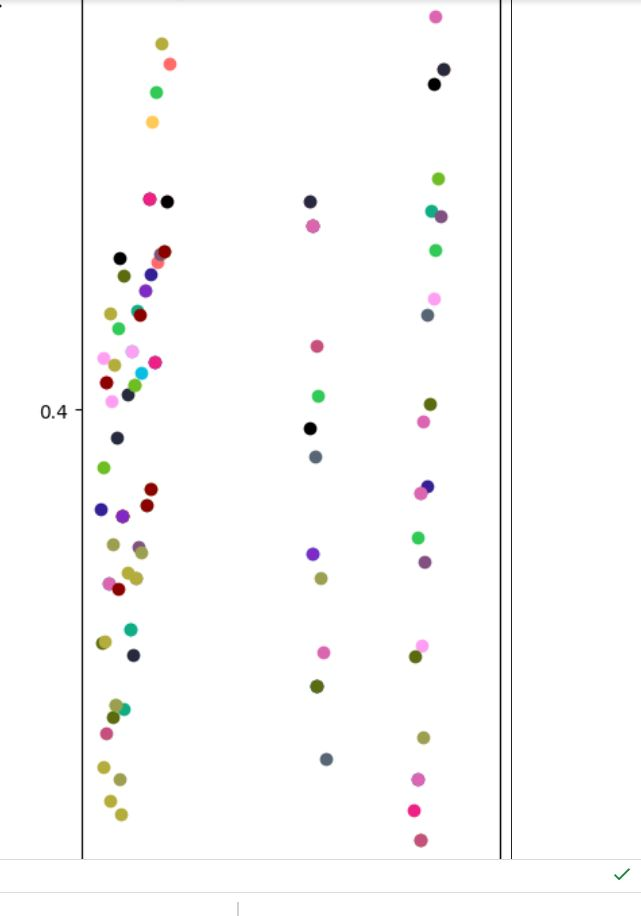

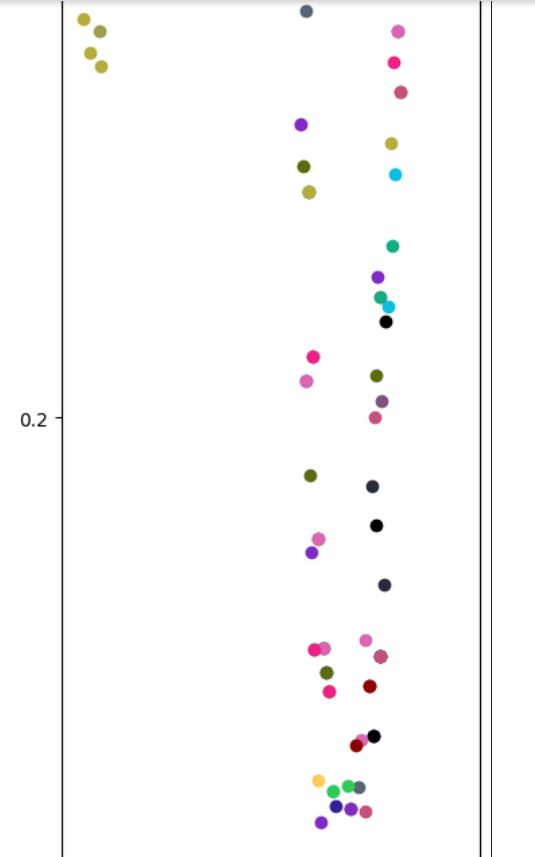

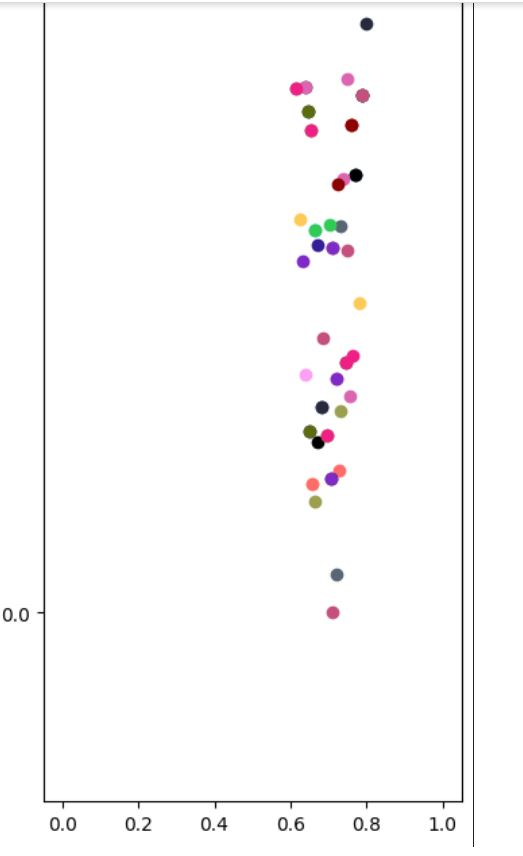

###### R -> P

In [ ]:
XU_BEST_REAL = XuModel().to(
                    device=DEVICE, memory_format=torch.channels_last)
if(not(os.path.exists("../Material/XU_BEST_REAL.pt"))):
    XU_BEST_REAL, _, __ = domain_adaptation(
          model="xu",
          optimizer="nadam",
          optimizer_params = [0.5318330865086823, 0.972314731793811, 7.58742552859644e-07, 0.019467161096021354],
          lr = 0.00033582372793957484,
          wd = 0.0004903049898644513,
          batch_size=16, 
          epochs_da=10,
          data="all_real",
          save_name = "XU_BEST_REAL.pt"
          )
    
else:
    with open("../Material/XU_BEST_REAL.pt", 'rb') as f:
        XU_BEST_REAL.load_state_dict(
            torch.load("../Material/XU_BEST_REAL.pt", map_location = DEVICE)) 

**Train and gain**

In [ ]:
if ALL_CODE:
    loss_to, acc_to  = TO_RESULTS_REAL
    loss_so, acc_so, cl_matr = NO_RESULTS_REAL
    train_loader_source, test_loader_source, train_loader_target, test_loader_target  = get_data(
            batch_size = 16, 
            data = "all_real", shuffle = False, 
            )
    progress_bar = tqdm(total = len(test_loader_target))
    progress_bar.set_description("after training da")
    test_accuracy, coverage, gain_cl_matrix = test(
                XU_BEST_REAL, test_loader_target, 
                get_cost_function(), 
                all_metrics = True, bar = progress_bar, da = True, 
                acc_so = acc_so, acc_to = acc_to, 
                cl_matr =cl_matr)
    print("\t Test accuracy {:.2f}".format(test_accuracy))
    print("\t Gain {:.2f}".format(test_accuracy - acc_so))
    print("\t Coverage {:.2f}".format(coverage))
    print("-----------------------------------------------------")
    gain_cl_matrix.print()



```
ACCURACY
0.9045
overall
-0.08850000000000002
per class
[-0.04500000000000004, -0.04250000000000009, -0.11750000000000005, -0.07250000000000001, -0.25, -0.040000000000000036, -0.05249999999999999, -0.06000000000000005, -0.050000000000000044, -0.0625, -0.0475000000000001, -0.07500000000000007, -0.4625, -0.06000000000000005, -0.05500000000000005, -0.07999999999999996, -0.04250000000000009, -0.05500000000000005, -0.050000000000000044, -0.050000000000000044]


PRECISION
overall
-0.7799999999999999
per class
[-0.75, -0.9, -0.8, -0.95, -0.9, -0.95, -0.95, -1.0, -0.95, -0.85, -0.9, -0.8999999999999999, -0.44999999999999996, -0.9, -0.95, -0.9, -0.85, -0.95, -1.0, -0.9]


RECALL
overall
-0.8140393871227984
per class
[-0.8823529411764706, -0.9473684210526315, -0.9411764705882353, -0.869047619047619, -0.8858350951374206, -0.8636363636363636, -0.95, -0.9523809523809523, -1.0, -0.85, -0.9473684210526315, -0.9230769230769231, -0.9411764705882353, -0.7301587301587301, -0.95, -1.0, -0.6071428571428571, -0.76, -1.0, -0.9473684210526315]


F1
overall
-0.8484751631329955
per class
[-0.8108108108108109, -0.9230769230769231, -0.8648648648648649, -0.913109756097561, -0.9146451033243486, -0.9047619047619048, -0.95, -0.975609756097561, -0.9743589743589743, -0.85, -0.9230769230769231, -0.9137529137529137, -0.893719806763285, -0.8376787216148023, -0.95, -0.9473684210526315, -0.7947154471544715, -0.8444444444444444, -1.0, -0.9230769230769231]


F1 NEGATIVO
overall
0.016235200538821437
per class
[-0.023083752589523554, -0.021698844300684028, -0.06296563662996468, -0.03774497694334644, -0.14433554097313572, -0.02036398078614443, -0.026969450653661187, -0.030940541459475446, -0.02564357755065194, -0.03241735678598323, -0.024335453621097902, -0.0391031494619547, -0.311973018549747, -0.031107898473826445, -0.028296256104177853, -0.04176175106049074, -0.02176290018064997, -0.028341965796548685, -0.02564102564102566, -0.025658848260687983]


GEOMETRIC MEAN
overall
-0.40303943872174286
per class
[-0.35851178138978823, -0.39823215410319823, -0.39858452186062865, -0.3934442189930458, -0.4525300040231367, -0.3911217680044562, -0.41039312395986827, -0.4213563438320318, -0.41822207532494093, -0.37760516552222334, -0.3995685969494601, -0.3946071870764545, -0.5229744391929196, -0.35366482737480665, -0.4110667992440894, -0.4169857974947575, -0.34089001866179736, -0.3736725408398125, -0.427117328787446, -0.4002400817999944]
________________________________________________________________________
MARKEDNESS
overall
-0.8763157894736842
per class
[-0.7578947368421053, -0.8973684210526316, -0.881578947368421, -0.9763157894736842, -1.1157894736842104, -0.9421052631578948, -0.9552631578947367, -1.0105263157894737, -0.9526315789473684, -0.8710526315789473, -0.9026315789473685, -0.9315789473684211, -0.913157894736842, -0.9157894736842105, -0.9578947368421051, -0.9368421052631578, -0.8500000000000001, -0.9578947368421051, -1.0, -0.9052631578947369]


UPM
overall
-0.8140936945369837
per class
[-0.8918249380677127, -0.9581797113662699, -0.9247074072662118, -0.8696448837268826, -0.9020779174310892, -0.9476121180050271, -0.9731081081081081, -0.9870112959406231, -0.9863724853990915, -0.9155714285714286, -0.9581797113662699, -0.8723611772122741, -0.8158806998830793, -0.7455678134582215, -0.9731081081081081, -0.9717289387697116, -0.778673239977972, -0.9117562149157978, -1.0, -0.9581797113662699]


COHEN K
overall
-0.9315789473684211
per class
[-0.8304219564433342, -0.9194715377699418, -0.9291246238085282, -0.9477179710161119, -1.015169676102182, -0.9006353433384332, -0.9673113330806288, -1.000426434648923, -0.9848846393169478, -0.8806837102095565, -0.9357343879573454, -0.9507585666410111, -0.9620661839027798, -0.8547272736932952, -0.9704255698481673, -0.9898877337332267, -0.7795247957756312, -0.8759415634755497, -1.0, -0.9394144497979391]


FM
overall
-0.8697379408525803
per class
[-1.2776356840572631, -1.3591793189467796, -1.3195364604997601, -1.032127890341433, -1.0306204855437786, -1.3467131705141833, -1.378404875209022, -1.3972762620115438, -1.396424004376894, -1.3038404810405297, -1.3591793189467796, -1.0401613527796814, -0.6339421163930665, -0.8296300498139971, -1.378404875209022, -1.378404875209022, -0.777850095027639, -1.307669683062202, -1.4142135623730951, -1.3591793189467796]


MATHEW
overall
-0.36977866056206465
per class
[-0.21888376541715623, -0.3981243217649844, -0.28302020643910286, -0.6400676004966926, -0.5219755685432053, -0.3310109085475194, -0.4987121475809258, -0.666110183639399, -0.666110183639399, -0.24691551447260193, -0.3981243217649844, -0.643969487788958, 0.0017061460937190015, -0.6074351047750457, -0.4987121475809258, -0.49874686716791977, -0.2150103894182711, -0.21904118944633283, 0.0, -0.3981243217649844]


```



**T-sne**

In [ ]:
if ALL_CODE:
    T_sne(XU_BEST_REAL, data = "product")

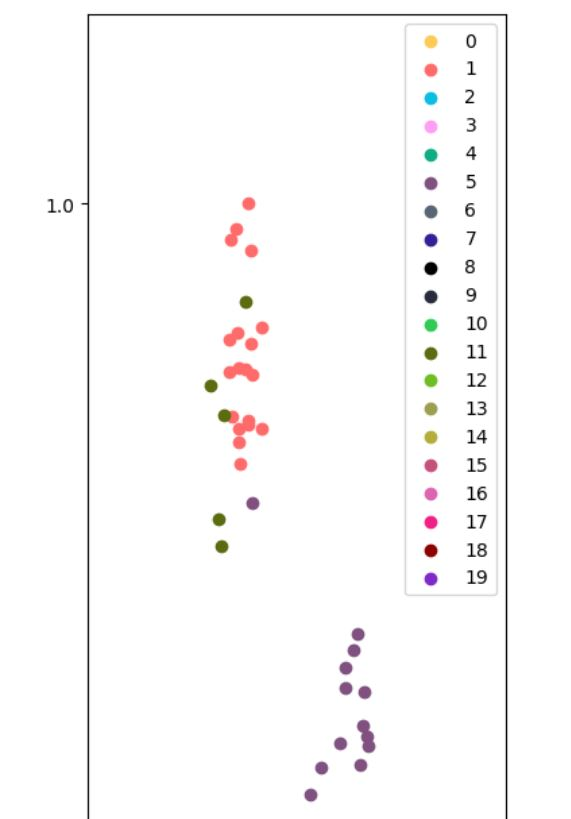

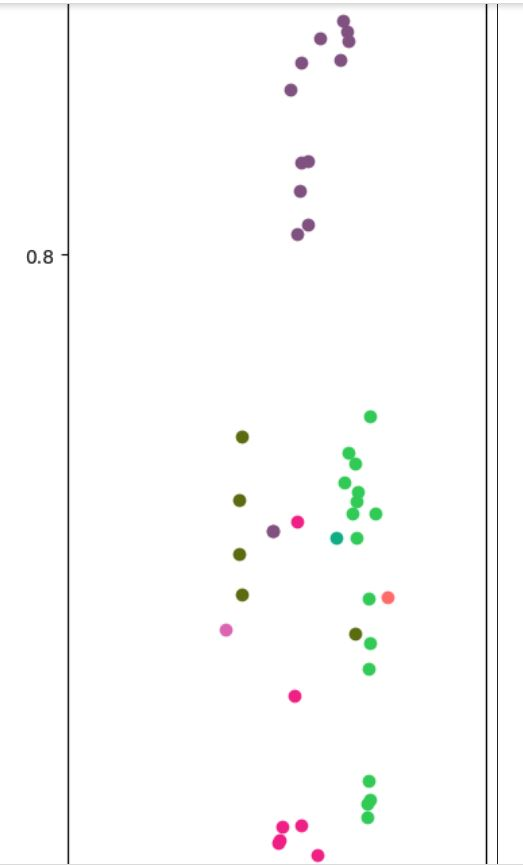

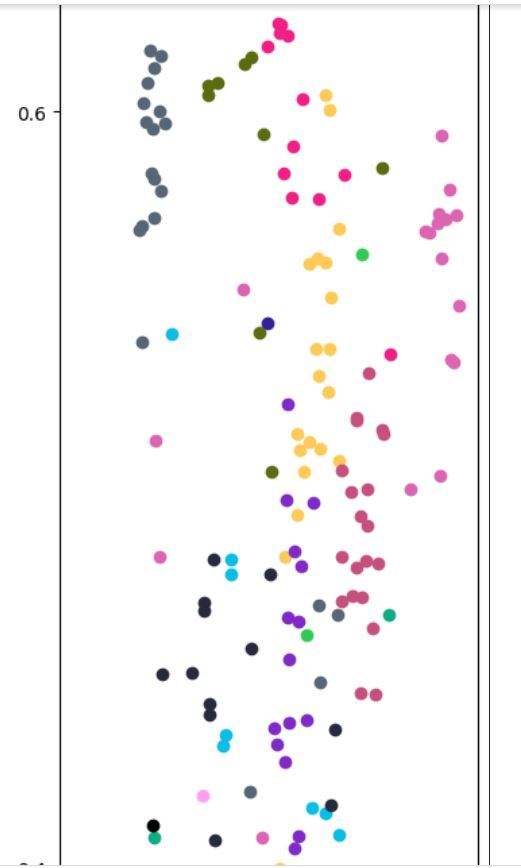

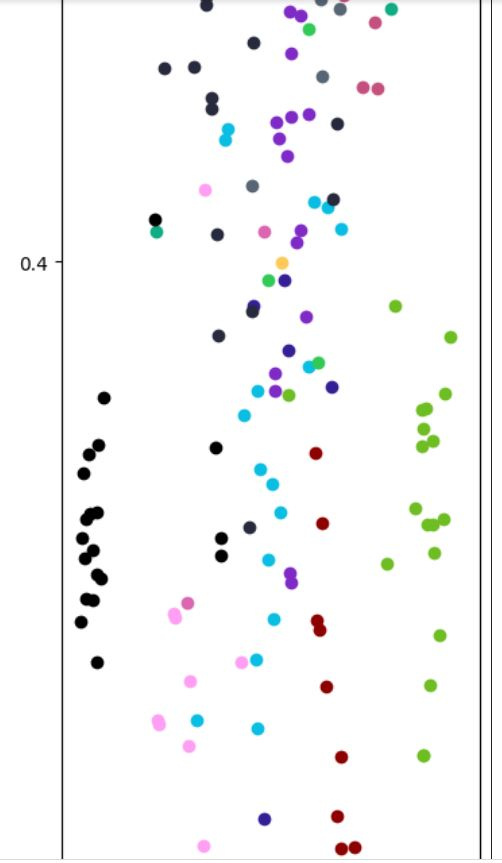

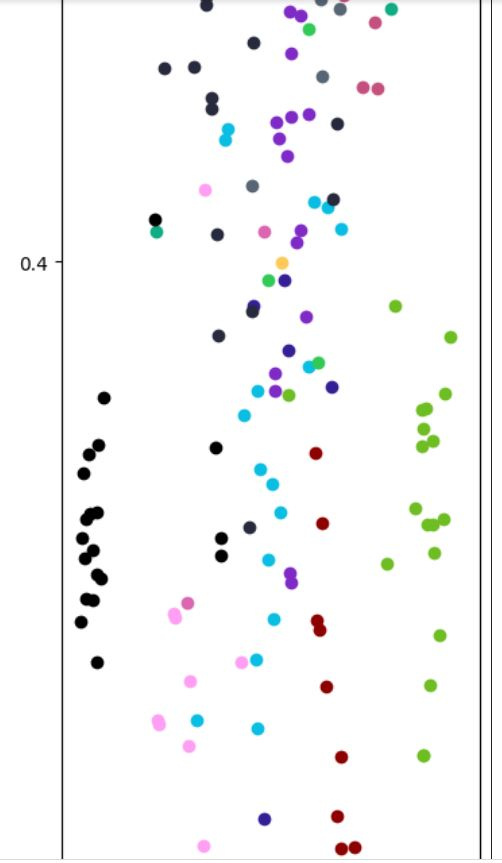

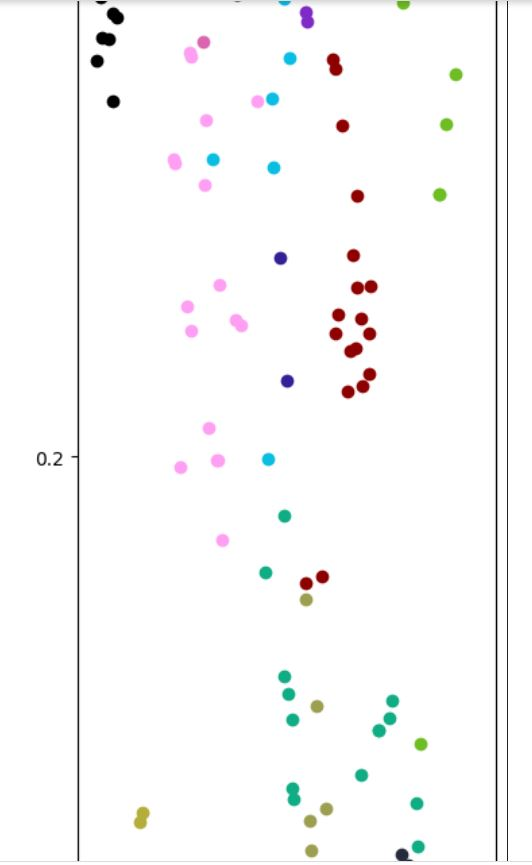

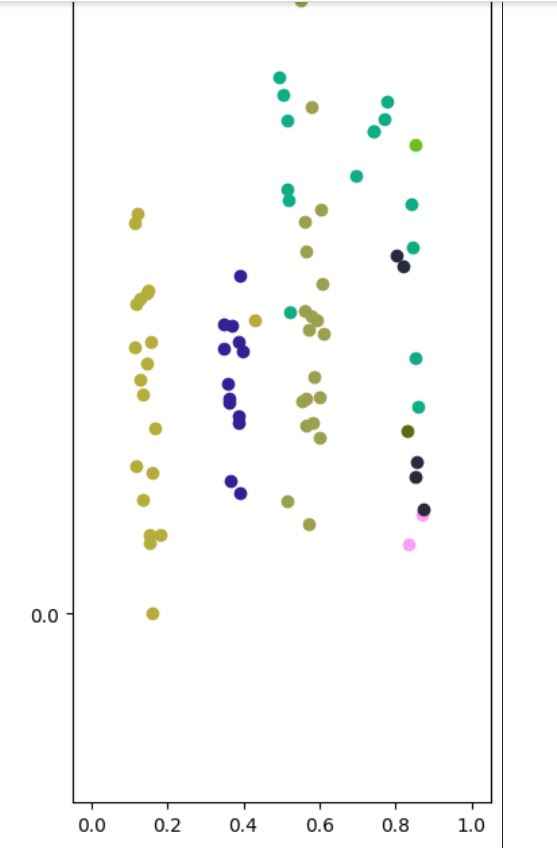

###**13. SUM-UP RESULTS**

complessively in respect of professor baseline work
- P -> R was **increased of 17.25 point of accuracy**
- R -> P was **increased of 8.5 point of accuracy**

complessively in respect of baseline model
- P -> R was **increased of 0.25 point of accuracy** starting from 93 point of accuracy
- R -> P was **increased of 5.50 point of accuracy** starting from 90 point of accuracy

Note that on same domain
- P has a **99.25 accuracy**
- R has a **99.75**

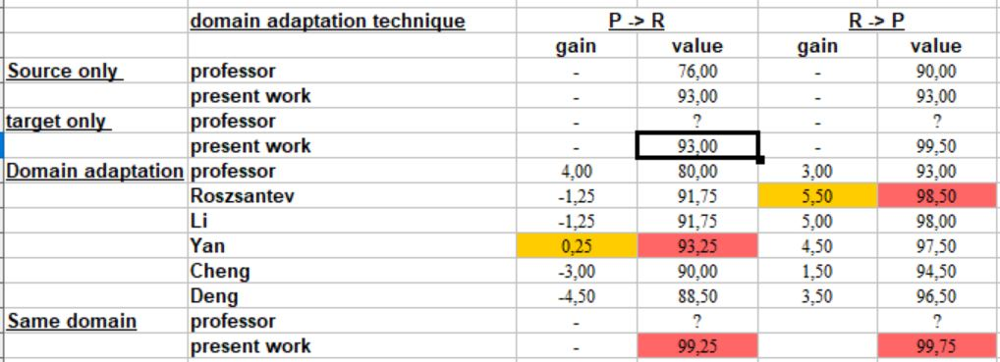

*this table show complessive results in a schematic manner*

result show that domain adaptation
1. is able to improve substantially R -> P accuracy for all (but xu) models
2. is not able to improve P->R accuracy for (but yan model)

P -> R seem generally a more difficoult task and this lack of performances could be imputed to wrong paramaters founded. However here author proposed motivation is strictly connected to the fact that domain adaptation is constructed in this case over optimized source only architecture. If domain adaptation model parameters as long as best architecture structure parameters were searched performances for P->R could be enhanced. instead in present work case source only setting which were heavily optimized having a very high generalization suffer most changing in architectural details especially for difficoult P->R domain

**BOHB+reverse validation** seem to **work pretty well to select network parameters** (at least for R->P domain). Being reverse validation only a proxy for actual accuracy the fact that it could not find good parameter setting for more difficoult P->R could be accounted as the fact that marginal improvement require more precise proxy measure of expected DA performances




**Differentiable data augmentation** was necessary to reach high same domain performances and P->R high baseline performances. This could related to a big increasing of generalization. However seem not contribute to domain adaptation setting (for all but cheng P-> R architecture which increase performance o**f 1.25 accuracy points**). This could be linked to the fact that differentiable search was done in non adaptation setting and policy extracted were only reused. It would be interesting to learn an ad hoc policy for each adaptation setting for each domain adaptation technique employed. this would tie data augmentation to domain adaptation losses reduction possibly improve results.

**Xu model** show very bad performances around all domain (it's result are not reported in table above but could be seen in previous section). Problem in parameter optimization or loss calculation were not found as long as better parameter . Problem could be related to lack of optimized parameters (same explanation of 2. point before) or could be imputed to pot library setting which should be modified to obtain good performances